# **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, see [this forum post](https://carnd-forums.udacity.com/cq/viewquestion.action?spaceKey=CAR&id=29496372&questionTitle=finding-lanes---import-cv2-fails-even-though-python-in-the-terminal-window-has-no-problem-with-import-cv2) for more troubleshooting tips.**  

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

This image is: <class 'numpy.ndarray'> with dimesions: (540, 960, 3)


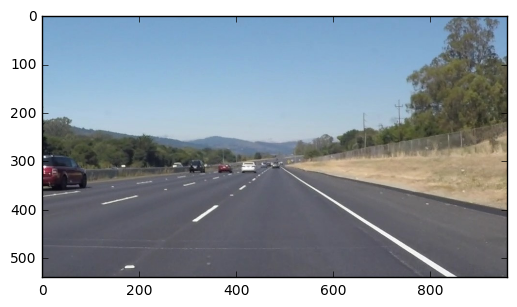

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [3]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    pos_slope=[]
    neg_slope=[]
    x1_left=[]
    y1_left=[]
    x1_right=[]
    y1_right=[]
    weights_left=[]
    weights_right=[]
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            
            fit_coeff=np.polyfit((x1,x2),(y1,y2),1)
            
            if abs(fit_coeff[0])>0.55 and abs(fit_coeff[0])<0.9:
                
            
                print(fit_coeff.tolist())
                if fit_coeff[0] > 0:
                    #pos_slope.append(fit_coeff.tolist())
                    x1_left.append(x1)
                    #y1_left.append(y1)
                    #weights_left.append((x1-x2)^2+(y1-y2)^2)
                    #weights_left.append(1)
                else:
                    #neg_slope.append(fit_coeff.tolist())
                    x1_right.append(x2)
                    #y1_right.append(y2)
                    #weights_right.append((x1-x2)^2+(y1-y2)^2)
                    #weights_right.append(1)
    
    middle=int((np.array(x1_right).mean()+np.array(x1_left).mean())/2)
    
    print('middle',middle)
    
    x1_left=[]
    x1_right=[]
                    
    for line in lines:
        for x1,y1,x2,y2 in line:
            
            fit_coeff=np.polyfit((x1,x2),(y1,y2),1)
            
            if abs(fit_coeff[0])>0.55 and abs(fit_coeff[0])<0.9: 
        
                if (fit_coeff[0] < 0 and x2 < middle) or (fit_coeff[0] > 0 and x1 > middle):
                    
                    #cv2.line(img, (x1, y1), (x2, y2), color, thickness)
                    if fit_coeff[0] > 0:
                        pos_slope.append(fit_coeff.tolist())
                        x1_left.append(x1)
                        y1_left.append(y1)
                    #weights_left.append((x1-x2)^2+(y1-y2)^2)
                        weights_left.append(1)
                    else:
                        neg_slope.append(fit_coeff.tolist())
                        x1_right.append(x2)
                        y1_right.append(y2)
                    #weights_right.append((x1-x2)^2+(y1-y2)^2)
                        weights_right.append(1)
                    
    
    print('left', x1_left,'right', x1_right)
    print(np.array(pos_slope).shape)
    
    weights_left=np.array(weights_left)
    weights_right=np.array(weights_right)
    
    b_pos=np.average(np.array(pos_slope)[:,1], weights=weights_left)
    m_pos=np.average(np.array(pos_slope)[:,0], weights=weights_left)
    
    print(b_pos,m_pos)
        
    b_neg=np.average(np.array(neg_slope)[:,1], weights=weights_right)
    m_neg=np.average(np.array(neg_slope)[:,0], weights=weights_right)
    
    
    x1_left=np.array(x1_left)
    y1_left=np.array(y1_left)
    
        
    #x1_left_avg=int(np.amin(x1_left[x1_left > middle]))
    #x1_left_avg=int(np.average(x1_left, weights=weights_left))
    #y1_left_avg=int(m_pos*x1_left_avg+b_pos)
    
    y1_left_avg=int(img.shape[0]*0.62)
    y1_right_avg=int(img.shape[0]*0.62)
    
    slope_x1_left=int((y1_left_avg-b_pos)/m_pos)
    average_x1_left=int(np.average(x1_left, weights=weights_left))
    
    slope_x1_right=int((y1_right_avg-b_neg)/m_neg)
    average_x1_right=int(np.average(x1_right, weights=weights_right))
    
    factor_avg=1
    
    if slope_x1_left < average_x1_left and (slope_x1_left-30>slope_x1_right):
        print('SLOPE')
        x1_left_avg=slope_x1_left
        y2_pos=img.shape[0]
        x2_pos=int((y2_pos-b_pos)/m_pos)
    else:
        print('AVERAGE')
        x1_left_avg=int((factor_avg*average_x1_left+slope_x1_left)/2)
        y2_pos=img.shape[0]
        x2_pos=int((y2_pos-(y1_left_avg-m_pos*x1_left_avg))/m_pos)
    
    
    print(b_neg,m_neg)
    
    print('ave',x1_left_avg, y1_left_avg)
    
    x1_right=np.array(x1_right)
    y1_right=np.array(y1_right)
    
    
    #x1_right_avg=int(np.amax(x1_right[x1_right < middle]))
    #x1_right_avg=int(np.average(x1_right, weights=weights_right))
    #y1_right_avg=int(m_neg*x1_right_avg+b_neg)
    
    
    
    if slope_x1_right > average_x1_right and (slope_x1_right<slope_x1_left-30):
        print('SLOPE')
        x1_right_avg=slope_x1_right
        y2_neg=img.shape[0]
        x2_neg=int((y2_neg-b_neg)/m_neg)
        
    else:
        print('AVERAGE')
        x1_right_avg=int((slope_x1_right+factor_avg*0.8*average_x1_right)/2)
        y2_neg=img.shape[0]
        x2_neg=int((y2_neg-(y1_right_avg-m_neg*x1_right_avg))/m_neg)
    
    print('ave',  x1_right_avg,y1_right_avg)
        
    print('x2', x2_pos,x2_neg)
            
    cv2.line(img, (x1_right_avg, y1_right_avg), (x2_neg, y2_neg), color, thickness=20)
    cv2.line(img, (x1_left_avg, y1_left_avg), (x2_pos, y2_pos), color, thickness=20)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

## Test on Images

Now you should build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

In [4]:
import os
os.listdir("test_images/")

['solidWhiteCurve.jpg',
 'solidYellowCurve2.jpg',
 'solidWhiteRight.jpg',
 'solidYellowLeft.jpg',
 'whiteCarLaneSwitch.jpg',
 'solidYellowCurve.jpg']

run your solution on all test_images and make copies into the test_images directory).

[0.577259475218659, 32.32069970845491]
[0.5530726256983237, 41.893854748603665]
[0.5546218487394955, 39.94957983193293]
[0.5777777777777778, 30.999999999999773]
[-0.7283950617283951, 663.9506172839507]
middle 490
left [533, 539, 541, 540] right [442]
(4, 2)
36.2910335722 0.565682931859
SLOPE
663.950617284 -0.728395061728
ave 526 334
SLOPE
ave 452 334
x2 890 170


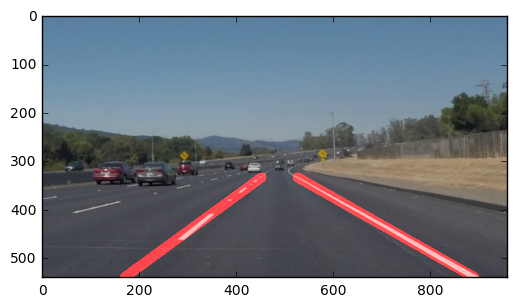

In [5]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images directory.

img_list=os.listdir("test_images/")
path=os.path.expanduser("test_images/"+img_list[0])
img_file=mpimg.imread(path)
grey_img=grayscale(img_file)
kernel_size=5
img_file=gaussian_blur(grey_img,kernel_size)

low_threshold = 50
high_threshold = 150

img_file=canny(img_file, low_threshold, high_threshold)

imshape=img_file.shape

vertices = np.array([[(100,imshape[0]),(400, 340), (540, 340), (imshape[1],imshape[0])]], dtype=np.int32)

mask_1=region_of_interest(img_file, vertices)

#plt.imshow(img_file, cmap='gray')

rho = 2 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 15     # minimum number of votes (intersections in Hough grid cell)
min_line_len = 160 #minimum number of pixels making up a line
max_line_gap = 80  # maximum gap in pixels between connectable line segments
line_image = np.copy(image)*0 # creating a blank to draw lines on

img_lines=hough_lines(mask_1, rho, theta, threshold, min_line_len, max_line_gap)

#print(img_lines)
plt.imshow(img_lines)

#draw_lines(line_image,img_lines)

#color_edges = np.dstack((edges, edges, edges))
#print(img_lines.shape, mpimg.imread(path).shape)

img_w=weighted_img(img_lines, mpimg.imread(path), α=0.8, β=1., λ=0.)

plt.imshow(img_w)

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an `import error` when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt. Also, check out [this forum post](https://carnd-forums.udacity.com/questions/22677062/answers/22677109) for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://carnd-forums.udacity.com/display/CAR/questions/26218840/import-videofileclip-error) for more troubleshooting tips across operating systems.**

In [6]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [7]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    
    #img_list=os.listdir("test_images/")
    #path=os.path.expanduser("test_images/"+img_list[0])
    #img_file=mpimg.imread(path)
    
    img_file=image
    grey_img=grayscale(img_file)
    kernel_size=5
    img_file=gaussian_blur(grey_img,kernel_size)

    low_threshold = 50
    high_threshold = 150

    img_file=canny(img_file, low_threshold, high_threshold)

    imshape=img_file.shape

    vertices = np.array([[(100,imshape[0]),(400, 340), (540, 340), (imshape[1],imshape[0])]], dtype=np.int32)

    mask_1=region_of_interest(img_file, vertices)



#plt.imshow(img_file, cmap='gray')

    rho = 2 # distance resolution in pixels of the Hough grid
    theta = np.pi/180 # angular resolution in radians of the Hough grid
    threshold = 15     # minimum number of votes (intersections in Hough grid cell)
    min_line_len = 40 #minimum number of pixels making up a line
    max_line_gap = 100   # maximum gap in pixels between connectable line segments
    line_image = np.copy(image)*0 # creating a blank to draw lines on



    img_lines=hough_lines(mask_1, rho, theta, threshold, min_line_len, max_line_gap)

#print(img_lines)
    plt.imshow(img_lines)

#draw_lines(line_image,img_lines)

#color_edges = np.dstack((edges, edges, edges))
    print(img_lines.shape, image.shape)

    img_w=weighted_img(img_lines, image, α=0.8, β=1., λ=0.)

#plt.imshow(img_w)
    
    result=img_w

    return result

In [8]:
def process_image2(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    
    #img_list=os.listdir("test_images/")
    #path=os.path.expanduser("test_images/"+img_list[0])
    #img_file=mpimg.imread(path)
    
    img_file=image
    
    lower_yellow=np.array([118,160,0])
    higher_yellow=np.array([255,255,175])

    img_mid=cv2.inRange(img_file, lower_yellow, higher_yellow)

    print(img_mid.shape)

    plt.imshow(img_mid)
    plt.show()

    #grey_img_mid=grayscale(img_mid)
    kernel_size=5

    grey_img_pre=grayscale(img_file)

    #grey_img=weighted_img(img_mid, grey_img_pre, α=0.8, β=1., λ=0.)
    
    
    grey_img=img_file[:,:,0]
    
    
    
    
    
    #grey_img=grayscale(img_file)
    kernel_size=5
    img_file=gaussian_blur(grey_img,kernel_size)

    low_threshold = 50
    high_threshold = 180

    img_file=canny(img_file, low_threshold, high_threshold)

    imshape=img_file.shape

    vertices = np.array([[(180,imshape[0]),(615, 440), (700, 440), (1240,imshape[0])]], dtype=np.int32)

    mask_1=region_of_interest(img_file, vertices)



    plt.imshow(mask_1, cmap='gray')
    plt.show()

    rho = 2 # distance resolution in pixels of the Hough grid
    theta = np.pi/180 # angular resolution in radians of the Hough grid
    threshold =10     # minimum number of votes (intersections in Hough grid cell)
    min_line_len =10 #minimum number of pixels making up a line
    max_line_gap = 450   # maximum gap in pixels between connectable line segments
    line_image = np.copy(image)*0 # creating a blank to draw lines on



    img_lines=hough_lines(mask_1, rho, theta, threshold, min_line_len, max_line_gap)

#print(img_lines)
    plt.imshow(img_lines)
    plt.show()

#draw_lines(line_image,img_lines)

#color_edges = np.dstack((edges, edges, edges))
    print(img_lines.shape, image.shape)

    img_w=weighted_img(img_lines, image, α=0.8, β=1., λ=0.)

#plt.imshow(img_w)
    
    result=img_w

    return result

## Testing images from optional challenge

['solidWhiteCurve.jpg', 'solidYellowCurve2.jpg', 'solidWhiteRight.jpg', 'solidYellowLeft.jpg', 'whiteCarLaneSwitch.jpg', 'solidYellowCurve.jpg']
(720, 1280)


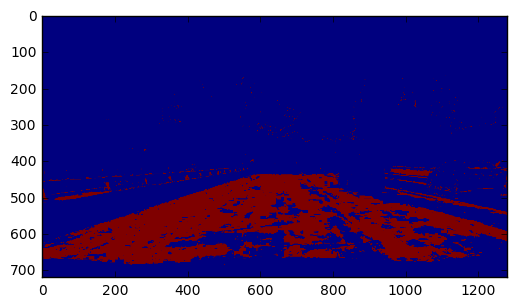

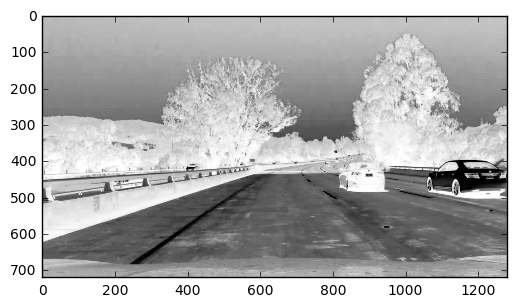

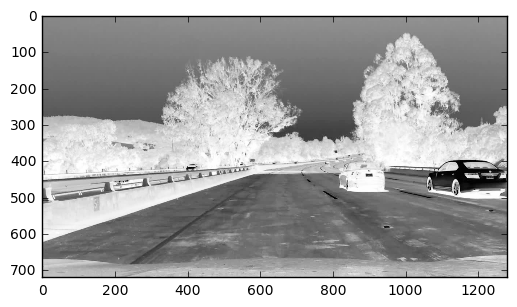

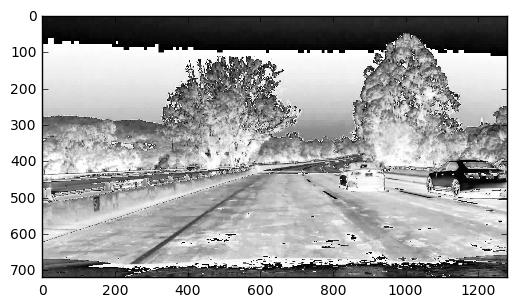

In [9]:
img_list=os.listdir("test_images/")

print(img_list)
path=os.path.expanduser('self_car.jpg')
img_file=mpimg.imread(path)

img_file_1=img_file[:,:,0]
    
#img_file=image
    
lower_yellow=np.array([118,160,0])
higher_yellow=np.array([255,255,175])

img_mid=cv2.inRange(img_file, lower_yellow, higher_yellow)

print(img_mid.shape)

plt.imshow(img_mid)
plt.show()

#grey_img_mid=grayscale(img_mid)
kernel_size=5

grey_img_pre=grayscale(img_file)
#grey_img=weighted_img(img_file_3, grey_img_pre, α=1, β=0.5, λ=0.)

grey_img=(img_file_1+grey_img_pre)/2


plt.imshow(img_file_1,cmap='Greys')
plt.show()


plt.imshow(grey_img_pre, cmap='Greys')

plt.show()


plt.imshow(grey_img, cmap='Greys')

plt.show()

img_file_1=img_file[:,:,0]
#img_file_2=img_file[:,:,1]
#img_file_3=img_file[:,:,2]

#plt.imshow(img_file_1, cmap='Greys')
#plt.show()

#plt.imshow(img_file_2,cmap='Greys')
#plt.show()




Let's try the one with the solid white lane on the right first ...

[0.5999999999999998, 16.00000000000045]
[-0.6999999999999996, 642.3999999999999]
[0.6285714285714277, 4.828571428571977]
[-0.7532467532467524, 666.1558441558435]
[0.6237623762376245, 9.67326732673202]
[0.6097560975609748, 15.146341463414924]
[0.6086956521739139, 14.956521739129931]
[-0.6956521739130425, 637.043478260869]
[0.5874999999999979, 27.575000000001776]
[0.6000000000000003, 15.399999999999999]
[-0.6986301369863017, 643.6438356164388]
[-0.7055214723926387, 642.552147239264]
[-0.6517857142857147, 633.0535714285716]
[0.5586206896551725, 49.57241379310331]
middle 508
left [540, 538, 746, 559, 534, 782, 541, 647] right [432, 433, 427, 406, 426, 310]
(8, 2)
19.1440144689 0.602113280525
SLOPE
644.14147945 -0.700806041804
ave 522 334
SLOPE
ave 442 334
x2 865 148
(540, 960, 3) (540, 960, 3)
[MoviePy] >>>> Building video white.mp4
[MoviePy] Writing video white.mp4


  0%|          | 0/222 [00:00<?, ?it/s]

[0.5999999999999998, 16.00000000000045]
[-0.6999999999999996, 642.3999999999999]
[0.6285714285714277, 4.828571428571977]
[-0.7532467532467524, 666.1558441558435]
[0.6237623762376245, 9.67326732673202]
[0.6097560975609748, 15.146341463414924]
[0.6086956521739139, 14.956521739129931]
[-0.6956521739130425, 637.043478260869]
[0.5874999999999979, 27.575000000001776]
[0.6000000000000003, 15.399999999999999]
[-0.6986301369863017, 643.6438356164388]
[-0.7055214723926387, 642.552147239264]
[-0.6517857142857147, 633.0535714285716]
[0.5586206896551725, 49.57241379310331]
middle 508
left [540, 538, 746, 559, 534, 782, 541, 647] right [432, 433, 427, 406, 426, 310]
(8, 2)
19.1440144689 0.602113280525
SLOPE
644.14147945 -0.700806041804
ave 522 334
SLOPE
ave 442 334
x2 865 148
(540, 960, 3) (540, 960, 3)
[0.6012269938650305, 15.938650306748245]
[0.6279069767441866, 5.558139534883369]
[-0.7553648068669528, 665.7424892703862]
[-0.7222222222222221, 646.3333333333331]
[0.6249999999999998, 9.2500000000001

  1%|          | 2/222 [00:00<00:12, 17.18it/s]

(540, 960, 3) (540, 960, 3)
[0.6482084690553742, -9.3843648208466]
[-0.7538461538461527, 666.9076923076914]
[-0.7243243243243253, 647.3729729729732]
[0.5874999999999986, 25.925000000001265]
[0.6363636363636348, -11.99999999999881]
[0.6393442622950817, -1.4098360655736872]
[0.5825242718446593, 26.62135922330156]
[-0.7058823529411765, 641.4117647058823]
[-0.8409090909090942, 699.9090909090927]
[-0.7500000000000004, 651.0000000000001]
[0.5901639344262285, 25.31147540983686]
[0.6461538461538441, -8.646153846152027]
[-0.6346153846153889, 615.250000000002]
[0.668965517241379, -22.255172413792806]
[-0.749999999999997, 664.7499999999992]
[-0.823529411764706, 687.8235294117649]
[-0.7257142857142851, 651.3314285714284]
[-0.808988764044944, 675.5280898876405]
[-0.6779661016949152, 636.4745762711867]
middle 503
left [539, 698, 781, 534, 562, 784, 716, 546] right [431, 336, 427, 428, 192, 429, 261, 392, 429, 259, 396]
(8, 2)
3.02028843585 0.624902992173
SLOPE
657.978104094 -0.745070533623
ave 529 3

  2%|▏         | 5/222 [00:00<00:12, 17.42it/s]

[0.5841584158415837, 29.366336633664176]
[0.6262295081967215, 6.331147540983342]
[0.5771428571428572, 31.07428571428581]
[-0.721739130434783, 647.5739130434783]
[0.5792079207920794, 30.702970297029324]
[-0.7241379310344818, 654.2068965517236]
[0.6239316239316237, 8.905982905983285]
[0.6923076923076911, -33.846153846153]
[-0.6967213114754093, 641.4999999999997]
[0.558441558441558, 47.35064935064956]
[0.6693548387096765, -22.798387096773602]
[-0.7543859649122793, 662.105263157894]
[-0.7118644067796597, 642.9830508474571]
[-0.7244897959183675, 647.969387755102]
[-0.7543859649122799, 665.1228070175436]
[-0.7565217391304355, 663.521739130435]
middle 507
left [768, 544, 537, 534, 731, 540, 610, 545] right [422, 427, 427, 423, 361, 403, 427, 425]
(8, 2)
12.1358539375 0.61384680192
SLOPE
653.122882188 -0.730530780575
ave 524 334
SLOPE
ave 436 334
x2 859 154
(540, 960, 3) (540, 960, 3)
[0.6272727272727279, 5.036363636363379]
[0.6006097560975608, 15.469512195121824]
[0.601226993865031, 14.736196

  4%|▎         | 8/222 [00:00<00:11, 19.06it/s]

(540, 960, 3) (540, 960, 3)
[0.6245210727969353, 7.781609195401791]
[0.6012084592145016, 15.347432024169265]
[-0.7599999999999998, 666.4399999999998]
[0.6000000000000005, 15.39999999999974]
[-0.6981132075471702, 638.4150943396228]
[0.6129032258064533, 14.451612903224769]
[0.6136363636363628, 12.318181818182365]
[-0.7526881720430112, 664.6129032258066]
[0.6170212765957446, 11.31914893617012]
[-0.7019230769230765, 638.8942307692305]
[-0.7234042553191472, 651.425531914893]
[0.61111111111111, 16.166666666667265]
[0.6261682242990676, 7.635514018689767]
[-0.6808510638297881, 637.4255319148939]
middle 497
left [588, 540, 541, 585, 534, 557, 633, 740] right [419, 416, 414, 413, 407, 359]
(8, 2)
12.5525206953 0.613321216683
SLOPE
649.535548694 -0.719496629277
ave 524 334
SLOPE
ave 438 334
x2 859 152
(540, 960, 3) (540, 960, 3)
[0.601307189542484, 17.869281045751233]
[0.6279999999999998, 7.9680000000004965]
[-0.7500000000000008, 665.0000000000002]
[-0.7016129032258055, 641.7661290322575]
[0.6018

  5%|▍         | 11/222 [00:00<00:10, 20.14it/s]

(540, 960, 3) (540, 960, 3)
[0.6413043478260879, 3.1521739130426516]
[0.6000000000000002, 24.399999999999935]
[0.6615384615384633, -9.953846153847465]
[-0.7230769230769234, 658.5384615384614]
[-0.7014925373134332, 643.3432835820895]
[0.6984126984126986, -33.14285714285723]
[0.6944444444444464, -35.69444444444586]
[0.6140350877192989, 17.789473684210027]
[-0.7258883248730968, 657.7614213197968]
[0.7954545454545467, -91.38636363636449]
[-0.701492537313433, 644.044776119403]
[0.7906976744186018, -87.69767441860309]
[0.6590909090909122, -10.181818181820672]
[0.7466666666666658, -66.01333333333277]
[0.7500000000000004, -74.75000000000031]
[0.6014492753623173, 24.159420289856286]
middle 528
left [742, 659, 540, 613, 575, 570, 768, 596, 653, 718] right [435, 431, 435, 432]
(10, 2)
-38.1508743108 0.703905902321
SLOPE
650.92198564 -0.712987580644
ave 528 334
SLOPE
ave 444 334
x2 821 155
(540, 960, 3) (540, 960, 3)
[0.6503267973856204, -2.722222222221985]
[0.6223776223776227, 7.650349650349338]


  6%|▋         | 14/222 [00:00<00:09, 21.11it/s]

(540, 960, 3) (540, 960, 3)
[0.6244897959183673, 4.293877551020488]
[-0.7007042253521127, 638.5000000000001]
[0.6172839506172855, 8.987654320986248]
[0.6527777777777778, -7.069444444444325]
[-0.7276119402985074, 655.1455223880596]
[0.6103896103896101, 11.610389610389712]
[-0.72767857142857, 653.9017857142852]
[0.6351351351351351, 2.108108108108206]
[0.6518987341772138, -5.33544303797372]
[0.6379310344827558, 1.1034482758638477]
[0.6035502958579883, 18.30769230769236]
[-0.6507936507936514, 625.8730158730159]
[-0.7022471910112348, 639.8595505617976]
[-0.6751269035532994, 630.3045685279188]
[0.6119402985074622, 11.567164179104603]
[-0.7272727272727268, 654.7272727272726]
[0.6346153846153831, -4.365384615383621]
[-0.7254901960784325, 641.0196078431375]
[-0.7005649717514119, 640.5423728813556]
middle 506
left [576, 776, 619, 538, 532, 677, 572, 533, 589, 779] right [426, 429, 430, 344, 427, 430, 430, 193, 429]
(10, 2)
4.12080622554 0.628001201748
SLOPE
642.208188502 -0.704165597504
ave 525 

  8%|▊         | 17/222 [00:00<00:09, 21.82it/s]

(540, 960, 3) (540, 960, 3)
[0.6265822784810126, 0.7658227848103827]
[0.6481481481481479, -6.759259259259105]
[0.623003194888179, 2.2172523961662045]
[0.650793650793653, -6.714285714287702]
[0.6489361702127637, -8.478723404253804]
[-0.7500000000000001, 654.2499999999999]
[-0.7217391304347825, 649.1826086956522]
[-0.697478991596639, 635.7310924369749]
[0.6382978723404261, 2.148936170212242]
[-0.7297297297297297, 652.8648648648649]
[-0.6750000000000003, 630.5500000000001]
[-0.7017543859649118, 636.1403508771929]
[-0.6721311475409835, 628.9999999999998]
[-0.8103448275862077, 675.2068965517243]
middle 506
left [543, 535, 547, 711, 537, 722] right [383, 427, 424, 426, 426, 422, 427, 368]
(6, 2)
-2.8033761711 0.639293552477
SLOPE
645.365726678 -0.719772276607
ave 526 334
SLOPE
ave 432 334
x2 849 146
(540, 960, 3) (540, 960, 3)
[0.6246056782334374, 2.088328075710521]
[0.6494845360824746, -4.969072164948919]
[0.6499999999999996, -7.749999999999701]
[-0.703703703703704, 643.7777777777777]
[-0.6

  9%|▉         | 20/222 [00:00<00:09, 22.35it/s]

(540, 960, 3) (540, 960, 3)
[0.6257861635220124, 4.5786163522013394]
[0.6511627906976749, -4.767441860465653]
[-0.7272727272727268, 655.1818181818179]
[-0.6974358974358973, 638.4358974358976]
[0.6363636363636356, 3.363636363636826]
[0.5820895522388061, 33.537313432835916]
[-0.7225130890052339, 650.0104712041874]
[0.6376811594202899, -6.579710144927694]
[0.6078431372549027, 13.588235294117032]
[-0.6736842105263144, 631.6210526315782]
[-0.610389610389609, 607.584415584415]
[0.612903225806451, 13.00000000000067]
[0.5794392523364492, 32.89719626168165]
[0.6516853932584274, -4.741573033708053]
middle 515
left [536, 531, 595, 566, 785, 537, 713, 530, 707] right [421, 415, 418, 421, 422]
(9, 2)
9.43069696282 0.620550478989
SLOPE
636.566731008 -0.686259106926
ave 523 334
SLOPE
ave 440 334
x2 854 140
(540, 960, 3) (540, 960, 3)
[0.6226415094339622, 6.264150943396384]
[0.6501650165016499, -3.2871287128708793]
[0.6493506493506498, -3.5064935064939062]
[-0.7264957264957258, 656.7521367521364]
[-0.

 10%|█         | 23/222 [00:01<00:08, 22.40it/s]

(540, 960, 3) (540, 960, 3)
[0.6707317073170707, -19.71951219511977]
[0.6246056782334382, 4.586750788643863]
[0.6538461538461533, -7.846153846153433]
[-0.7499999999999991, 662.4999999999995]
[-0.6767676767676775, 632.3333333333336]
[-0.7481481481481477, 663.466666666666]
[0.6341463414634111, 6.853658536588068]
[-0.6534090909090909, 627.2443181818181]
[-0.6782178217821778, 636.3465346534649]
[0.636363636363639, -3.909090909092972]
[-0.7307692307692301, 653.1923076923074]
[0.6351351351351348, 8.567567567567998]
[0.6103896103896093, 16.94805194805289]
[-0.7500000000000003, 654.5000000000003]
[0.8333333333333314, -140.16666666666524]
[-0.8285714285714323, 680.3428571428584]
middle 539
left [751, 672, 740, 758, 775, 695] right [430, 429, 423, 409, 434, 419, 314, 313]
(6, 2)
-21.9043319531 0.670016627334
SLOPE
651.240752209 -0.726985424618
ave 531 334
SLOPE
ave 436 334
x2 838 153
(540, 960, 3) (540, 960, 3)
[0.65, -5.799999999999918]
[0.6246056782334383, 3.9621451104100855]
[-0.6768558951965

 12%|█▏        | 26/222 [00:01<00:08, 22.49it/s]

(540, 960, 3) (540, 960, 3)
[0.6226415094339621, 5.641509433962382]
[0.652631578947368, -6.199999999999495]
[-0.6978417266187048, 638.9784172661873]
[-0.730088495575221, 658.734513274336]
[0.624595469255663, 3.718446601941986]
[0.6542056074766337, -6.953271028036022]
[-0.6000000000000026, 602.2000000000011]
[0.6351351351351355, 2.7432432432430405]
[-0.6748466257668707, 635.7361963190184]
[-0.7510373443983392, 661.4273858921157]
[-0.6938775510204072, 636.5306122448977]
[-0.6516853932584277, 625.2696629213488]
[-0.7738095238095235, 672.9642857142856]
[0.7169811320754731, -46.64150943396318]
middle 483
left [537, 532, 540, 726, 531, 556] right [427, 390, 432, 416, 412, 240, 427, 429]
(6, 2)
-7.94859686381 0.651031738721
SLOPE
641.480134204 -0.696648332556
ave 525 334
SLOPE
ave 441 334
x2 841 145
(540, 960, 3) (540, 960, 3)
[0.6226415094339621, 5.641509433962382]
[0.6494845360824748, -4.876288659794193]
[0.6234177215189877, 4.354430379746694]
[-0.727272727272728, 656.727272727273]
[0.63793

 13%|█▎        | 29/222 [00:01<00:08, 22.49it/s]

(540, 960, 3) (540, 960, 3)
[0.6515837104072396, -6.642533936651467]
[0.6257861635220124, 3.3270440251573947]
[0.6351351351351336, 6.229729729730793]
[0.6190476190476183, 19.66666666666722]
[-0.7252747252747245, 649.1538461538458]
[-0.796874999999997, 681.8749999999985]
[-0.7528089887640457, 660.314606741573]
[0.6333333333333339, 8.66666666666616]
[-0.7037037037037039, 646.7777777777777]
[-0.788235294117647, 675.1058823529411]
[0.6363636363636365, -1.9999999999999356]
[-0.7790697674418591, 670.8255813953479]
[0.6246056782334384, 3.337539432176629]
[-0.7519999999999992, 665.8479999999998]
middle 512
left [532, 538, 705, 763, 760, 550, 539] right [378, 424, 379, 426, 382, 381, 424]
(7, 2)
4.65501608339 0.632265039435
SLOPE
664.271527774 -0.756852497043
ave 520 334
SLOPE
ave 436 334
x2 846 164
(540, 960, 3) (540, 960, 3)
[0.6495726495726509, -4.393162393163506]
[0.6226415094339617, 4.396226415094617]
[0.6246056782334383, 3.7129337539436644]
[0.6341463414634129, 3.41463414634271]
[-0.69753

 14%|█▍        | 32/222 [00:01<00:08, 22.16it/s]

(540, 960, 3) (540, 960, 3)
[0.6513157894736838, -7.151315789473151]
[0.6238244514106582, 3.758620689655186]
[0.6245210727969345, 3.7586206896552663]
[-0.7243243243243243, 654.6648648648649]
[-0.6980198019801978, 639.1683168316829]
[0.6250000000000014, 15.49999999999892]
[-0.6984126984126986, 641.0317460317458]
[0.6399999999999991, 2.2400000000005824]
[-0.750000000000002, 655.2500000000007]
[-0.723270440251573, 651.8616352201261]
[-0.6999999999999985, 645.5999999999992]
middle 513
left [533, 539, 540, 796, 734] right [422, 420, 421, 335, 398, 398]
(5, 2)
3.62118511797 0.632932262736
SLOPE
647.929427158 -0.715671210828
ave 521 334
SLOPE
ave 438 334
x2 847 150
(540, 960, 3) (540, 960, 3)
[0.6518771331058024, -7.317406143344957]
[0.6257861635220123, 2.0754716981132892]
[-0.7227722772277219, 653.564356435643]
[-0.6981132075471695, 639.8113207547169]
[0.6245733788395903, 3.354948805460435]
[-0.69811320754717, 638.1132075471696]
[0.6496062992125984, -6.240157480314776]
[-0.6990291262135908, 

 16%|█▌        | 35/222 [00:01<00:09, 19.61it/s]

(540, 960, 3) (540, 960, 3)
[0.6244541484716168, 5.174672489082113]
[0.6520270270270271, -6.138513513513632]
[-0.6993006993007013, 639.7132867132876]
[0.6525423728813556, -5.220338983050626]
[-0.7549668874172194, 665.6357615894045]
[0.6395348837209329, -7.802325581397797]
[0.6406250000000036, -8.062500000003007]
[-0.7018633540372664, 642.0993788819875]
[0.6237623762376232, 6.594059405940762]
[0.6585365853658554, -24.097560975610946]
[-0.6944444444444444, 643.1944444444442]
[-0.7555555555555561, 665.0444444444446]
middle 536
left [549, 537, 598, 769, 740, 581, 808] right [410, 430, 429, 415, 413]
(7, 2)
-5.65035816551 0.641640341958
SLOPE
651.137463215 -0.721226188151
ave 529 334
SLOPE
ave 439 334
x2 850 154
(540, 960, 3) (540, 960, 3)
[0.6524822695035456, -5.517730496453308]
[0.6265822784810124, 3.8987341772155357]
[-0.7265624999999987, 658.1874999999997]
[0.6242038216560506, 6.707006369426762]
[-0.7195121951219512, 646.8048780487804]
[-0.7499999999999992, 661.7499999999994]
[-0.675000

 17%|█▋        | 38/222 [00:01<00:08, 20.74it/s]

(540, 960, 3) (540, 960, 3)
[0.6218749999999997, 7.9187500000002276]
[0.6545454545454548, -6.236363636363718]
[-0.7528517110266162, 662.9733840304184]
[0.6593406593406597, -10.769230769231186]
[0.640000000000002, 1.5999999999987105]
[-0.7025089605734776, 640.8637992831544]
[-0.7499999999999996, 665.4999999999998]
[0.6000000000000013, 19.99999999999907]
[0.5957446808510689, 28.14893617020843]
[-0.8039215686274517, 677.137254901961]
[-0.6999999999999994, 640.9999999999997]
[-0.7346938775510213, 660.9591836734696]
[0.6376811594202892, -5.942028985506797]
[0.636363636363636, 6.454545454545557]
[0.6666666666666674, -20.000000000000604]
[0.6058823529411765, 18.341176470588277]
middle 505
left [534, 668, 532, 585, 535, 787, 784, 719, 540, 554] right [429, 424, 430, 341, 430, 264]
(10, 2)
3.95157847042 0.631809961013
SLOPE
658.072270315 -0.740662686296
ave 522 334
SLOPE
ave 437 334
x2 848 159


 18%|█▊        | 41/222 [00:01<00:08, 21.64it/s]

(540, 960, 3) (540, 960, 3)
[0.6249999999999999, 4.2500000000000755]
[0.6519823788546256, -5.753303964757845]
[-0.6999999999999988, 639.0999999999997]
[-0.7537878787878785, 662.6212121212119]
[0.64285714285714, -1.4999999999983238]
[-0.7500000000000001, 664.0]
[-0.7200000000000003, 647.4400000000002]
[0.6363636363636408, 7.9090909090869745]
[0.636363636363638, -3.272727272728198]
[-0.6714285714285714, 634.5571428571428]
[-0.7111111111111116, 641.3777777777777]
[0.6363636363636356, 3.0000000000005866]
[-0.7500000000000028, 662.2500000000006]
[0.6666666666666647, -15.9999999999984]
middle 473
left [574, 607, 567, 778, 541, 583, 660] right [213, 428, 428, 427, 397, 196, 227]
(7, 2)
-1.62384861834 0.642228156781
SLOPE
650.192304679 -0.722332508761
ave 522 334
SLOPE
ave 437 334
x2 843 152
(540, 960, 3) (540, 960, 3)
[0.6238244514106582, 5.630094043887409]
[0.6732673267326741, -20.19801980198076]
[0.6304347826086948, -0.43478260869514185]
[0.6323529411764699, 10.617647058823856]
[-0.67073170

 20%|█▉        | 44/222 [00:02<00:09, 18.62it/s]

(540, 960, 3) (540, 960, 3)
[0.6730038022813686, -20.730038022813385]
[0.6475409836065592, -10.319672131148838]
[0.6407766990291258, -7.922330097087149]
[-0.700507614213198, 637.5126903553299]
[0.6585365853658509, -19.975609756095704]
[-0.7486033519553078, 661.4134078212292]
[0.6415094339622662, -9.490566037738038]
[0.72185430463576, -60.70198675496577]
[0.6729559748427684, -19.761006289309027]
[-0.7777777777777776, 666.1111111111111]
[-0.7020202020202028, 639.8484848484852]
[0.6400000000000018, -6.560000000001088]
[0.6603773584905664, -19.11320754717014]
[-0.7513812154696132, 657.5745856353592]
[0.8000000000000029, -125.20000000000226]
[-0.7499999999999998, 660.9999999999998]
[-0.7293233082706758, 655.3082706766914]
middle 525
left [536, 541, 724, 700, 802, 659, 545, 554, 618, 739] right [419, 420, 391, 420, 416, 420, 372]
(10, 2)
-29.9774416636 0.675655514221
SLOPE
654.109792921 -0.73708763853
ave 538 334
SLOPE
ave 434 334
x2 843 154
(540, 960, 3) (540, 960, 3)
[0.6722972972972981, -

 21%|██        | 46/222 [00:02<00:09, 17.91it/s]

(540, 960, 3) (540, 960, 3)
[0.6712328767123287, -19.109589041095802]
[0.6455026455026459, -10.380952380952376]
[-0.6785714285714285, 632.2142857142858]
[-0.805084745762713, 677.4491525423733]
[0.6363636363636408, 7.9090909090869745]
[0.6410256410256443, -9.076923076925839]
[0.659574468085107, -22.936170212766662]
[0.6885245901639331, -32.27868852458903]
[-0.7704918032786917, 659.5737704918047]
[-0.867924528301884, 700.2075471698104]
[0.6619718309859154, -19.380281690140635]
[-0.6769230769230768, 630.2153846153847]
[0.7250000000000009, -61.0750000000008]
[-0.8750000000000024, 702.0000000000011]
[0.6428571428571432, -9.928571428571841]
[-0.7537313432835819, 659.7835820895522]
[-0.5535714285714295, 594.8750000000001]
[-0.8085106382978727, 676.3829787234043]
middle 527
left [535, 549, 778, 777, 761, 699, 558, 647, 759] right [410, 403, 333, 377, 411, 376, 411, 343, 374]
(9, 2)
-19.5841206051 0.663561425744
SLOPE
659.189077927 -0.754423221443
ave 532 334
SLOPE
ave 431 334
x2 843 157
(540, 

 22%|██▏       | 49/222 [00:02<00:09, 18.93it/s]

[0.6731517509727628, -20.136186770428214]
[0.6292134831460665, 2.280898876405264]
[-0.6991150442477878, 637.4247787610619]
[-0.728155339805825, 654.9126213592232]
[0.6610169491525447, -18.22033898305226]
[-0.726457399103139, 653.1031390134528]
[0.6666666666666671, -20.6666666666669]
[-0.7017543859649122, 639.2456140350878]
[-0.7000000000000002, 641.0000000000001]
[0.6363636363636351, -4.818181818180775]
[-0.7058823529411768, 642.8235294117649]
[-0.7471264367816114, 654.114942528737]
middle 512
left [535, 675, 551, 541, 787] right [424, 313, 431, 425, 430, 429, 395]
(5, 2)
-12.3120950724 0.65328249726
SLOPE
646.089232158 -0.715498708406
ave 530 334
SLOPE
ave 436 334
x2 845 148
(540, 960, 3) (540, 960, 3)
[-0.6996466431095412, 636.6501766784453]
[0.672862453531599, -20.475836431227084]
[0.6267281105990778, 3.400921658986519]
[-0.7519685039370078, 660.0826771653543]
[0.6040268456375841, 18.053691275167452]
[-0.7022058823529408, 636.3088235294115]
[0.626506024096386, 1.686746987951627]
[0.

 23%|██▎       | 51/222 [00:02<00:09, 17.54it/s]

[0.6738351254480284, -20.95698924731131]
[0.6249999999999992, 4.875000000000543]
[-0.7520325203252022, 659.60569105691]
[-0.6771929824561401, 631.5157894736842]
[-0.7528517110266152, 658.4562737642582]
[0.6720000000000004, -18.848000000000315]
[0.6280487804878045, 1.4817073170733777]
[-0.7519379844961236, 655.7596899224804]
[-0.62992125984252, 625.5590551181105]
[-0.6283185840707962, 618.7699115044246]
[0.6046511627906975, 19.325581395349182]
[-0.6499999999999992, 622.0499999999996]
[-0.6237623762376221, 623.2970297029699]
middle 469
left [552, 661, 534, 539, 575] right [421, 429, 423, 392, 266, 345, 397, 265]
(5, 2)
-2.82454010698 0.640707013745
SLOPE
636.876680068 -0.683252177307
ave 525 334
SLOPE
ave 443 334
x2 847 141
(540, 960, 3) (540, 960, 3)
[0.6722972972972981, -19.67905405405486]
[0.6269841269841265, 2.8095238095241974]
[0.6296296296296311, -1.1656366413268343e-12]
[-0.6913580246913577, 632.7160493827162]
[-0.7286245353159855, 653.1226765799256]
[-0.7014925373134325, 639.5373

 24%|██▍       | 53/222 [00:02<00:12, 13.15it/s]

(540, 960, 3) (540, 960, 3)
[0.6723549488054613, -19.726962457338143]
[0.625, 4.875000000000139]
[-0.6708860759493667, 629.6329113924052]
[0.6258503401360547, 2.666666666666594]
[-0.76388888888889, 659.041666666667]
[0.6718749999999999, -18.781250000000192]
[-0.6722689075630244, 629.3865546218483]
[-0.718750000000001, 644.0312500000005]
[0.6851851851851822, -30.703703703700857]
[0.6269230769230772, 2.8615384615384416]
[-0.746031746031748, 651.285714285715]
[-0.6779661016949147, 627.4237288135589]
middle 506
left [538, 693, 539, 534, 776, 592] right [387, 381, 426, 423, 369, 421]
(6, 2)
-9.80145183881 0.651198091842
SLOPE
640.13363763 -0.708298620021
ave 527 334
SLOPE
ave 432 334
x2 844 141
(540, 960, 3) (540, 960, 3)
[0.6732283464566932, -20.452755905511854]
[0.6278195488721809, 2.4699248120296677]
[0.6721991701244812, -18.9543568464727]
[0.631578947368424, -1.0526315789491887]
[-0.698412698412698, 634.4444444444442]
[-0.7213114754098361, 648.3442622950821]
[-0.725190839694657, 647.305

 25%|██▍       | 55/222 [00:02<00:13, 12.29it/s]

[0.6735751295336782, -20.740932642486854]
[0.6271929824561401, 2.5701754385967712]
[0.6333333333333353, -0.6000000000013552]
[-0.771428571428568, 666.4571428571413]
[0.6140350877192983, 13.385964912280725]
[0.669421487603306, -16.801652892562178]
[-0.6981132075471707, 634.3207547169815]
[0.6257668711656447, 2.711656441717203]
[-0.6491228070175421, 621.2280701754379]
[-0.6506024096385542, 620.5542168674698]
[-0.7567567567567574, 661.0810810810813]
[0.6000000000000018, 24.999999999998472]
[0.6993006993006983, -37.622377622376874]
[-0.6981132075471704, 638.603773584906]
[0.6896551724137906, -30.20689655172246]
[-0.7216494845360831, 641.7422680412373]
[0.6451612903225817, -3.5161290322586516]
middle 510
left [638, 538, 762, 742, 533, 539, 775, 540, 589, 534] right [418, 413, 367, 422, 419, 422, 353]
(10, 2)
-6.58201919488 0.647744205385
SLOPE
640.569615332 -0.706540920639
ave 525 334
SLOPE
ave 433 334
x2 843 142
(540, 960, 3) (540, 960, 3)
[0.6253968253968255, 4.787301587301616]
[0.6516853

 26%|██▌       | 57/222 [00:03<00:11, 13.80it/s]

(540, 960, 3) (540, 960, 3)
[0.6246056782334387, 7.085173501577084]
[0.6544502617801048, -4.612565445026353]
[0.6379310344827588, 4.2068965517240535]
[-0.7238805970149232, 650.5447761194022]
[-0.695652173913043, 634.9565217391302]
[-0.8000000000000008, 677.6000000000004]
[0.631578947368422, 6.526315789473084]
[0.6239316239316242, 6.8205128205124534]
[-0.5818181818181845, 591.3454545454559]
[0.6363636363636396, 6.090909090907188]
[0.6428571428571433, 4.5714285714282346]
[-0.7115384615384622, 639.2115384615387]
[-0.6736111111111119, 631.6736111111113]
[-0.7022900763358784, 644.7938931297712]
[0.6274509803921553, 9.764705882353782]
middle 494
left [533, 632, 564, 528, 534, 608, 710, 555] right [429, 378, 402, 432, 339, 433, 434]
(8, 2)
5.05667209537 0.634896163176
SLOPE
638.589399301 -0.69839865739
ave 518 334
SLOPE
ave 436 334
x2 842 141


 27%|██▋       | 59/222 [00:03<00:11, 13.99it/s]

(540, 960, 3) (540, 960, 3)
[0.6246056782334387, 7.085173501577084]
[0.6716417910447764, -16.447761194030146]
[-0.6772151898734177, 628.0759493670886]
[-0.7260273972602734, 651.7397260273972]
[0.6731707317073171, -16.8780487804881]
[-0.7243589743589751, 650.3012820512822]
[0.6170212765957477, 11.468085106381178]
[0.7741935483870975, -101.16129032258159]
[-0.6511627906976735, 621.9534883720925]
[-0.7230769230769206, 643.446153846153]
[0.6271186440677969, 6.576271186440697]
[-0.7021276595744687, 639.8085106382981]
middle 508
left [533, 559, 545, 607, 730, 672] right [418, 428, 427, 433, 327, 427]
(6, 2)
-18.2262617505 0.664625278339
SLOPE
639.220851717 -0.70066148914
ave 529 334
SLOPE
ave 435 334
x2 839 141
(540, 960, 3) (540, 960, 3)
[0.6458333333333329, -7.312499999999305]
[0.6739926739926742, -17.71794871794866]
[-0.7243243243243238, 649.8378378378376]
[-0.6749999999999996, 627.55]
[0.6481481481481469, -10.629629629628807]
[0.6453488372093021, -5.779069767441668]
[0.6730038022813695, 

 28%|██▊       | 63/222 [00:03<00:11, 14.41it/s]

(540, 960, 3) (540, 960, 3)
[0.6714285714285718, -15.257142857143139]
[-0.6734693877551015, 626.2244897959183]
[0.6458333333333337, -5.895833333333686]
[-0.7243243243243247, 650.0108108108108]
[-0.7000000000000002, 642.2999999999998]
[-0.7254098360655737, 647.5368852459014]
[0.6590909090909103, -12.272727272727668]
[-0.7800000000000004, 658.5000000000002]
[0.6600000000000024, -17.200000000001754]
[-0.7272727272727251, 652.999999999999]
[-0.806451612903229, 666.5806451612912]
[-0.7245283018867918, 648.6490566037733]
[-0.6986301369863013, 635.4246575342464]
[-0.720000000000001, 637.9600000000002]
[0.666666666666666, -16.999999999999492]
[0.6792452830188676, -21.0566037735845]
[0.659090909090908, -4.181818181817247]
[-0.6610169491525455, 625.254237288136]
[0.7230769230769253, -45.40000000000126]
[0.7209302325581399, -49.6279069767445]
middle 471
left [544, 565, 536, 720, 552, 614, 768, 533, 589] right [425, 428, 279, 395, 275, 429, 276, 426, 347, 268, 191]
(9, 2)
-20.8768924884 0.67615142

 29%|██▉       | 65/222 [00:03<00:11, 14.23it/s]

(540, 960, 3) (540, 960, 3)
[0.6748251748251751, -16.031468531468708]
[0.6492146596858641, -7.638743455497615]
[0.6617647058823553, -14.455882352942538]
[-0.5882352941176459, 595.4117647058819]
[0.6458333333333341, -3.5833333333339383]
[0.6745762711864403, -14.827118644067653]
[-0.7043478260869572, 643.3478260869567]
[0.6500000000000008, -7.950000000000674]
[-0.597014925373135, 599.7313432835824]
[-0.6722689075630257, 626.0084033613449]
[-0.6984126984127015, 640.1269841269855]
[0.6746575342465753, -15.544520547945242]
[-0.699115044247788, 638.0265486725665]
[-0.6309523809523807, 616.547619047619]
[0.6595744680851064, -13.5957446808511]
middle 498
left [535, 651, 587, 532, 526, 663, 527, 621] right [424, 425, 425, 418, 424, 422, 386]
(8, 2)
-11.7033514433 0.661305768406
SLOPE
622.742927041 -0.655763868108
ave 522 334
SLOPE
ave 440 334
x2 834 126
(540, 960, 3) (540, 960, 3)
[0.6739926739926738, -15.97802197802183]
[0.6287128712871285, 6.321782178218015]
[0.6734693877551019, -14.918367346

 30%|███       | 67/222 [00:03<00:13, 11.88it/s]

[0.6736111111111108, -17.055555555555365]
[0.6437499999999989, -5.324999999998945]
[0.6459627329192548, -5.590062111801307]
[-0.6766467065868266, 625.8083832335329]
[-0.7012987012987016, 640.5454545454547]
[-0.6241610738255028, 610.7919463087247]
[0.6476190476190469, -9.238095238094486]
[0.6891891891891871, -25.79729729729594]
[-0.7272727272727264, 648.7272727272723]
[-0.6981132075471704, 635.8113207547173]
[0.6959064327485385, -31.61403508771975]
[-0.6966292134831444, 631.4606741573027]
[-0.671232876712329, 625.808219178082]
[0.6610169491525417, -15.864406779660772]
middle 502
left [536, 684, 535, 740, 583, 534, 614] right [415, 420, 397, 419, 418, 338, 396]
(7, 2)
-15.7834931529 0.665293637534
SLOPE
631.279038701 -0.685050643818
ave 525 334
SLOPE
ave 433 334
x2 835 133
(540, 960, 3) (540, 960, 3)
[0.6723549488054611, -16.020477815699717]
[0.6440677966101707, -3.9322033898312982]
[0.6457142857142868, -6.720000000000862]
[-0.6989247311827956, 639.4516129032255]
[0.6590909090909064, -18

 32%|███▏      | 71/222 [00:04<00:11, 12.91it/s]

(540, 960, 3) (540, 960, 3)
[0.6745762711864401, -15.501694915253823]
[0.6462264150943392, -5.966981132074935]
[-0.6992481203007523, 639.2781954887222]
[-0.6747967479674803, 625.9918699186993]
[0.661290322580646, -13.129032258065072]
[-0.6984126984126988, 640.3174603174604]
[0.6666666666666645, -16.99999999999869]
[-0.6747967479674793, 627.3414634146342]
[-0.717391304347823, 638.891304347825]
[0.6585365853658539, -15.902439024390862]
[-0.6714285714285727, 625.2857142857148]
middle 498
left [527, 605, 534, 549, 750] right [428, 409, 430, 411, 333, 410]
(5, 2)
-13.500029466 0.661459252179
SLOPE
632.851001296 -0.689345698404
ave 525 334
SLOPE
ave 433 334
x2 836 134
(540, 960, 3) (540, 960, 3)
[0.6757679180887369, -17.48122866894166]
[0.6464285714285715, -6.132142857142805]
[-0.7007299270072984, 639.5985401459852]
[-0.6666666666666659, 621.6666666666662]
[0.6745762711864401, -15.501694915253823]
[0.6666666666666643, -17.333333333332]
[-0.7272727272727257, 646.0909090909083]
[0.659999999999

 33%|███▎      | 74/222 [00:04<00:11, 13.21it/s]

(540, 960, 3) (540, 960, 3)
[0.6470588235294118, -5.823529411764674]
[-0.722222222222222, 644.7777777777779]
[-0.6483050847457615, 617.233050847457]
[0.6757679180887372, -16.805460750853047]
[0.6470588235294111, -6.8235294117642376]
[0.6757679180887368, -16.129692832764267]
[-0.6746031746031755, 629.4047619047623]
[-0.7225433526011557, 645.6358381502888]
[-0.7555555555555554, 651.4222222222223]
[0.6666666666666664, -15.999999999999947]
[-0.8101265822784813, 661.6455696202531]
[-0.6507936507936508, 616.6349206349207]
[-0.7738095238095233, 663.0119047619045]
middle 471
left [536, 528, 655, 527, 534] right [422, 423, 429, 423, 301, 281, 422, 389]
(5, 2)
-12.3164424814 0.662464029981
SLOPE
641.22075574 -0.719744893326
ave 522 334
SLOPE
ave 426 334
x2 833 140
(540, 960, 3) (540, 960, 3)
[0.6768707482993199, -16.03401360544239]
[0.6455696202531646, -4.088607594936919]
[-0.6971830985915483, 638.3943661971825]
[0.6737588652482266, -15.070921985815625]
[-0.6512455516014234, 618.3594306049822]
[

 34%|███▍      | 76/222 [00:04<00:11, 13.01it/s]

[0.6666666666666681, -20.000000000001126]
[-0.7727272727272727, 657.3181818181816]
[-0.7235294117647074, 646.0529411764713]
[-0.6666666666666664, 619.6666666666666]
[-0.6800000000000006, 634.0000000000001]
[-0.6046511627906964, 607.1860465116275]
[-0.6181818181818215, 603.3454545454559]
[-0.8928571428571441, 667.0357142857146]
middle 462
left [526, 533, 532, 528, 780, 702] right [383, 426, 425, 249, 251, 333, 423, 193, 250, 341, 426, 205]
(6, 2)
-14.3152676978 0.663524008802
SLOPE
634.480284118 -0.708916284298
ave 524 334
SLOPE
ave 423 334
x2 835 133
(540, 960, 3) (540, 960, 3)
[0.67595818815331, -16.229965156794513]
[0.646551724137931, -4.612068965517143]
[-0.6851851851851821, 634.74074074074]
[-0.6436781609195404, 615.2413793103452]
[0.6610169491525412, -15.694915254236266]
[-0.553571428571427, 578.9464285714278]
[0.6818181818181802, -33.36363636363494]
[-0.7239263803680984, 640.6564417177917]
[0.6818181818181802, -20.6818181818173]
[-0.7647058823529377, 662.9411764705867]
[-0.753246

 36%|███▌      | 80/222 [00:04<00:10, 13.58it/s]

[0.6503267973856203, -6.624183006535247]
[0.6749999999999998, -14.14999999999973]
[0.6619718309859154, -8.140845070422625]
[-0.694029850746268, 635.1865671641788]
[-0.7159090909090912, 638.1704545454545]
[-0.7031249999999999, 635.4999999999997]
[0.67391304347826, -12.586956521738268]
[0.660714285714285, -8.196428571428324]
[-0.6999999999999998, 639.0]
[-0.6762589928057563, 626.352517985612]
[0.6140350877192986, 21.22807017543841]
[-0.6766917293233071, 624.1203007518792]
middle 507
left [533, 618, 538, 679, 527, 739] right [421, 369, 416, 420, 419, 411]
(6, 2)
-4.74505716578 0.655993507547
SLOPE
633.054973408 -0.694335777297
ave 516 334
SLOPE
ave 430 334
x2 830 134
(540, 960, 3) (540, 960, 3)
[0.651162790697674, -6.3720930232553865]
[0.6976744186046508, -28.767441860464768]
[-0.650000000000001, 619.7500000000003]
[-0.6060606060606041, 598.3333333333325]
[-0.5833333333333337, 591.25]
[-0.6987179487179483, 634.2692307692307]
[0.6972477064220185, -29.256880733945067]
[0.7173913043478267, -

 37%|███▋      | 82/222 [00:04<00:11, 12.55it/s]

[-0.6699029126213583, 626.6699029126211]
[0.587301587301586, 30.904761904762715]
[0.6078431372549006, 20.803921568628294]
[0.7758620689655176, -73.53448275862071]
[-0.7029702970297028, 634.8118811881187]
[0.6804123711340219, -16.50515463917587]
middle 487
left [557, 530, 674, 541, 588, 528, 535, 533, 643] right [380, 412, 411, 413, 408]
(9, 2)
-12.5057885074 0.666671893595
SLOPE
626.528123466 -0.677488130558
ave 519 334
SLOPE
ave 431 334
x2 828 127
(540, 960, 3) (540, 960, 3)
[0.655629139072848, -9.07284768211922]
[0.6971830985915493, -28.112676056337904]
[-0.6982758620689664, 636.2931034482762]
[0.670454545454545, -19.488636363636164]
[-0.6228070175438618, 605.6315789473693]
[0.6875000000000027, -30.50000000000221]
[0.7142857142857165, -37.28571428571562]
[-0.7192982456140352, 641.3157894736843]
[-0.622047244094488, 607.03937007874]
[0.6311475409836068, 8.073770491803167]
[0.655172413793103, -9.206896551723734]
[0.6803278688524594, -15.106557377049667]
[-0.6693548387096784, 622.096774

 39%|███▊      | 86/222 [00:05<00:09, 14.19it/s]

(540, 960, 3) (540, 960, 3)
[0.6996466431095413, -29.413427561837896]
[0.6700507614213203, -18.431472081218665]
[-0.6470588235294122, 613.1764705882354]
[0.6689655172413792, -16.55862068965488]
[-0.6547619047619037, 622.8690476190471]
[0.6923076923076911, -36.99999999999866]
[-0.6482412060301516, 618.095477386935]
[0.7118644067796616, -36.18644067796664]
[-0.7210884353741487, 641.1088435374147]
[0.6885245901639346, -20.426229508196982]
[-0.6206896551724139, 605.6551724137931]
[-0.7291666666666642, 648.1458333333325]
[-0.6578947368421055, 623.4473684210524]
middle 510
left [528, 620, 533, 780, 572, 721] right [416, 319, 429, 394, 428, 413, 367]
(6, 2)
-26.3360317531 0.688559935171
SLOPE
624.6426019 -0.668414489768
ave 523 334
SLOPE
ave 434 334
x2 822 126
(540, 960, 3) (540, 960, 3)
[0.6996466431095408, -28.71378091872814]
[0.6726457399103146, -19.865470852018223]
[-0.6260162601626011, 608.5609756097558]
[0.6911764705882356, -29.455882352941412]
[-0.6709401709401708, 628.5042735042734]
[

 40%|███▉      | 88/222 [00:05<00:10, 13.33it/s]

(540, 960, 3) (540, 960, 3)
[0.702205882352941, -29.786764705882412]
[0.6511627906976742, -3.465116279069519]
[-0.6476190476190455, 614.3523809523803]
[0.6562499999999999, -8.562499999999877]
[-0.6265060240963836, 611.3132530120478]
[-0.6747572815533983, 628.7718446601941]
[-0.6543209876543219, 627.2962962962966]
[-0.5979381443298974, 608.5567010309284]
[0.6097560975609727, 17.439024390245656]
[-0.6545454545454558, 626.6909090909094]
[-0.6448598130841123, 618.710280373832]
[0.6263736263736265, 10.637362637362429]
[-0.6714975845410622, 625.7149758454103]
[0.607142857142856, 26.71428571428646]
[0.6103896103896121, 22.636363636362397]
[0.5833333333333346, 52.41666666666575]
middle 443
left [538, 529, 554, 529, 537, 600, 574, 685] right [419, 208, 425, 219, 215, 218, 426, 424]
(8, 2)
11.0036652575 0.630826774731
SLOPE
620.175830158 -0.646505542178
ave 512 334
SLOPE
ave 442 334
x2 838 124
(540, 960, 3) (540, 960, 3)
[0.6510067114093961, -2.986577181208006]
[0.7029288702928869, -29.669456066

 41%|████      | 90/222 [00:05<00:11, 11.71it/s]

[0.7032967032967035, -31.450549450549673]
[0.674033149171271, -19.348066298342765]
[0.6695652173913031, -17.739130434781465]
[0.7038626609442049, -30.424892703861595]
[-0.6691176470588244, 628.3676470588238]
[-0.6736842105263144, 624.2842105263153]
[0.6851851851851833, -28.481481481480035]
[-0.6762589928057547, 628.7050359712227]
[-0.6962962962962953, 635.0518518518512]
[0.6739130434782606, -18.17391304347805]
[-0.6258503401360547, 608.108843537415]
[-0.7205882352941162, 645.9264705882347]
middle 510
left [531, 545, 715, 576, 710, 576] right [422, 373, 421, 418, 422, 419]
(6, 2)
-24.2696722354 0.684975993244
SLOPE
628.407343256 -0.676965953686
ave 523 334
SLOPE
ave 434 334
x2 823 130
(540, 960, 3) (540, 960, 3)
[0.6740088105726867, -19.290748898677755]
[0.7225433526011561, -42.22543352601127]
[0.7159090909090898, -39.454545454544416]
[0.6666666666666653, -14.666666666665527]
[-0.6529411764705897, 618.276470588236]
[-0.6445783132530117, 619.722891566265]
[0.7484662576687113, -61.6380368

 42%|████▏     | 94/222 [00:05<00:10, 12.44it/s]

[-0.648936170212765, 617.3085106382975]
[0.751724137931034, -65.79999999999967]
[-0.6982758620689646, 632.6206896551722]
[0.6603773584905622, -10.113207547166533]
[-0.6717948717948722, 629.4820512820515]
[0.7722772277227707, -79.58415841584048]
[0.741379310344831, -52.18965517241597]
middle 515
left [545, 530, 630, 535, 761, 757, 609, 777, 621, 529] right [418, 417, 415, 336, 419]
(10, 2)
-37.3596921832 0.708826414158
SLOPE
625.759292998 -0.667932478376
ave 523 334
SLOPE
ave 436 334
x2 814 128
(540, 960, 3) (540, 960, 3)
[0.6770833333333334, -21.624999999999993]
[0.705882352941177, -32.52941176470626]
[0.7014925373134322, -28.805970149253042]
[-0.6481481481481497, 616.6851851851859]
[-0.6170212765957418, 612.27659574468]
[0.6904761904761892, -24.785714285713492]
[0.6757679180887365, -21.53583617747393]
[-0.6481481481481468, 620.6296296296287]
[-0.6285714285714288, 613.9714285714285]
[-0.6382978723404266, 618.2340425531918]
[0.6119402985074628, 20.80597014925379]
[-0.6454545454545446, 6

 43%|████▎     | 96/222 [00:06<00:09, 13.16it/s]

[0.6865671641791035, -29.373134328357434]
[0.6590909090909065, -9.045454545452278]
[0.7045454545454545, -32.97727272727258]
[0.6540540540540543, -6.843243243243581]
[-0.6269841269841278, 608.9761904761909]
[-0.7222222222222224, 647.0555555555554]
[-0.5555555555555564, 591.0000000000001]
[0.6081081081081068, 21.20270270270357]
[0.6301369863013697, 10.958904109589112]
[0.6140350877192975, 13.877192982456553]
[-0.7500000000000009, 652.7500000000002]
[-0.605839416058393, 603.9999999999997]
[-0.7213114754098356, 645.5737704918031]
[0.5581395348837194, 47.34883720930334]
[0.681818181818181, -14.909090909090049]
[0.5865384615384616, 43.6153846153847]
[0.5604395604395604, 63.67032967032946]
[0.5581395348837173, 48.767441860467336]
[-0.6526946107784432, 621.9640718562875]
[-0.7499999999999998, 653.25]
[0.6417910447761181, -2.358208955223178]
middle 495
left [538, 742, 589, 541, 567, 592, 536, 553, 742, 640, 659, 563, 535] right [429, 421, 333, 333, 411, 407, 432, 371]
(13, 2)
11.8411068032 0.62

 45%|████▌     | 100/222 [00:06<00:09, 13.04it/s]

[0.6758893280632413, -23.664031620553438]
[0.7252252252252259, -47.995495495496016]
[-0.6506849315068491, 616.8904109589041]
[-0.6736842105263147, 630.3578947368413]
[0.6857142857142868, -18.80000000000115]
[0.655737704918034, -12.459016393443441]
[-0.6716417910447752, 619.5074626865668]
[-0.6732283464566926, 631.6377952755905]
[-0.7021276595744668, 624.382978723404]
[-0.6243093922651942, 608.4530386740338]
[0.6904761904761892, -23.952380952379883]
[0.7500000000000012, -65.50000000000112]
[0.6759259259259258, -24.175925925925778]
[0.6610169491525397, -10.644067796607736]
[-0.6745098039215691, 631.1529411764707]
[0.7142857142857143, -42.28571428571442]
[-0.6172839506172847, 604.3456790123461]
middle 493
left [578, 535, 742, 568, 698, 542, 595, 771, 559] right [424, 431, 236, 402, 180, 430, 402, 425]
(9, 2)
-29.9418480522 0.692696813751
SLOPE
620.841025156 -0.660933760739
ave 525 334
SLOPE
ave 433 334
x2 822 122
(540, 960, 3) (540, 960, 3)
[0.7251461988304105, -48.678362573100515]
[0.676

 46%|████▌     | 102/222 [00:06<00:09, 13.29it/s]

[0.6777777777777776, -26.23333333333321]
[0.707070707070707, -36.14141414141392]
[0.7073170731707319, -38.21951219512189]
[-0.6744186046511607, 629.7209302325577]
[0.6723549488054605, -21.39931740614342]
[-0.628099173553719, 610.1983471074379]
[-0.5961538461538454, 607.1538461538461]
[0.6909090909090891, -26.39999999999882]
[-0.7200000000000003, 643.4800000000001]
[-0.8076923076923078, 681.0384615384618]
[-0.6460176991150456, 615.0353982300893]
[-0.6500000000000004, 621.5000000000001]
[-0.571428571428572, 603.1428571428571]
[-0.6749999999999996, 626.1999999999998]
[0.7428571428571421, -59.714285714285396]
middle 465
left [561, 713, 563, 539, 649, 565] right [179, 427, 168, 384, 421, 418, 410, 170, 424]
(6, 2)
-34.6846437984 0.699714456765
SLOPE
626.385537823 -0.663201133622
ave 526 334
SLOPE
ave 440 334
x2 821 130
(540, 960, 3) (540, 960, 3)
[0.7245283018867918, -48.592452830188066]
[0.6621621621621606, -14.216216216215045]
[0.696202531645569, -35.949367088607154]
[0.630252100840336, 6

 47%|████▋     | 104/222 [00:06<00:08, 13.79it/s]

(540, 960, 3) (540, 960, 3)
[0.6745762711864403, -24.271186440677543]
[0.7030567685589514, -34.28820960698656]
[0.7018633540372662, -34.09316770186274]
[-0.6792452830188683, 630.245283018868]
[-0.7000000000000002, 644.0000000000002]
[0.6745562130177523, -22.917159763314142]
[-0.6923076923076915, 638.0769230769226]
[-0.7000000000000002, 643.3000000000001]
[-0.6730769230769243, 627.3269230769237]
[0.690476190476191, -23.35714285714327]
middle 510
left [540, 585, 533, 581, 771] right [417, 420, 419, 419, 415]
(5, 2)
-27.785373274 0.688905759455
SLOPE
636.589825835 -0.688925979681
ave 525 334
SLOPE
ave 439 334
x2 824 140
(540, 960, 3) (540, 960, 3)
[0.6745762711864404, -24.94576271186419]
[0.7021276595744684, -34.936170212766264]
[-0.6444444444444444, 618.8222222222222]
[-0.7790697674418589, 669.9767441860456]
[0.7005347593582879, -32.93582887700462]
[0.6326530612244885, 2.775510204082541]
[-0.6228070175438608, 610.5614035087725]
[-0.6481481481481488, 626.4444444444447]
[0.6956521739130447

 49%|████▊     | 108/222 [00:06<00:08, 13.12it/s]

[0.7035175879396981, -35.773869346733306]
[0.6514084507042255, -7.880281690140863]
[0.6615384615384609, -17.015384615384104]
[-0.670967741935483, 625.8193548387093]
[0.6538461538461527, -9.269230769229969]
[-0.6271186440677979, 619.8305084745766]
[0.6078431372549008, 21.4705882352951]
[0.607142857142857, 19.642857142857302]
[0.5714285714285698, 34.5714285714294]
[-0.7014925373134326, 642.5373134328356]
[0.6666666666666661, -20.999999999999687]
[-0.6730769230769234, 628.0576923076925]
[0.6298701298701299, 7.116883116882991]
[-0.6142857142857123, 615.0857142857137]
[0.7115384615384587, -43.05769230769015]
[0.689655172413792, -26.965517241378468]
[0.5744680851063831, 34.319148936170244]
middle 500
left [618, 554, 582, 759, 603, 582, 538, 543, 592, 759, 651, 553] right [423, 333, 427, 425, 342]
(12, 2)
-3.65342249733 0.644076977954
SLOPE
626.266116668 -0.657388312136
ave 524 334
SLOPE
ave 444 334
x2 844 131
(540, 960, 3) (540, 960, 3)
[0.672354948805461, -24.433447098976213]
[0.70106761565

 50%|████▉     | 110/222 [00:07<00:08, 13.90it/s]

[0.6996466431095406, -34.310954063604214]
[0.6726618705035965, -24.255395683453035]
[-0.6494845360824737, 622.2268041237111]
[-0.6756756756756752, 639.7567567567563]
[0.7000000000000013, -35.40000000000093]
[-0.6470588235294115, 631.0588235294118]
[-0.7747747747747747, 666.2612612612612]
[-0.649350649350646, 619.6233766233752]
[-0.6237623762376231, 626.3168316831681]
[-0.6666666666666662, 635.9999999999997]
[-0.7260869565217392, 647.708695652174]
[0.6842105263157887, -20.947368421051976]
[-0.7500000000000023, 659.7500000000009]
[-0.6078431372549032, 610.6078431372554]
[-0.636363636363637, 621.0000000000003]
middle 462
left [535, 543, 542, 757] right [433, 232, 269, 394, 426, 249, 273, 399, 425, 358, 187]
(4, 2)
-28.728429542 0.689129759982
SLOPE
634.57367207 -0.673369748405
ave 526 334
SLOPE
ave 446 334
x2 825 140
(540, 960, 3) (540, 960, 3)
[0.699646643109541, -33.6113074204951]
[-0.6490066225165562, 623.0198675496687]
[0.6735395189003432, -24.752577319587388]
[-0.6796116504854371, 64

 51%|█████▏    | 114/222 [00:07<00:08, 13.24it/s]

[0.671052631578947, -23.750000000000103]
[0.7248677248677249, -52.153439153439]
[-0.6749999999999985, 627.7749999999992]
[0.6666666666666666, -8.666666666666803]
[0.6760563380281688, -21.69014084507017]
[-0.6982758620689655, 641.5603448275862]
[0.686274509803917, -36.68627450980021]
[-0.6666666666666676, 627.6666666666669]
[-0.7272727272727278, 648.4545454545456]
[-0.7213114754098345, 648.5573770491796]
[-0.6964285714285714, 642.7678571428573]
[-0.7534246575342446, 657.3150684931496]
[0.6666666666666675, -16.00000000000033]
[0.6818181818181793, -32.590909090906806]
[0.5607476635514018, 67.97196261682234]
[0.6733333333333328, -24.619999999999493]
[0.68, -19.920000000000012]
[-0.7247706422018346, 649.1284403669724]
[-0.6991150442477873, 643.2212389380531]
[-0.7246376811594208, 645.9130434782611]
[0.5596330275229359, 66.50458715596322]
middle 505
left [551, 541, 763, 535, 766, 534, 743, 733, 543, 694, 721] right [173, 429, 175, 387, 425, 429, 384, 421, 428, 378]
(11, 2)
-9.23644368119 0.6

 52%|█████▏    | 116/222 [00:07<00:08, 12.64it/s]

(540, 960, 3) (540, 960, 3)
[0.676829268292684, -22.780487804878643]
[0.6491803278688527, -11.206557377049458]
[0.679999999999999, -24.039999999999303]
[-0.6226415094339611, 611.1320754716976]
[-0.6551724137931033, 619.5517241379309]
[-0.6590909090909123, 627.250000000001]
[0.6428571428571428, -7.285714285713977]
[0.6338028169014083, -2.7746478873236606]
[0.6530612244897965, -13.489795918367902]
[-0.6730769230769241, 629.6923076923082]
[-0.6739130434782601, 633.0434782608692]
[-0.659090909090907, 621.6136363636354]
[0.8085106382978717, -123.48936170212737]
[0.7111111111111122, -46.88888888888948]
[-0.6699029126213597, 627.0194174757281]
[0.6279069767441873, 4.0697674418596845]
[0.6056338028169012, 17.112676056338138]
[-0.6493506493506476, 622.844155844155]
[0.5851063829787234, 32.499999999999964]
middle 512
left [536, 541, 653, 702, 585, 748, 692, 710, 535, 548, 611] right [421, 416, 363, 420, 420, 359, 418, 394]
(11, 2)
-18.0248191242 0.661272699305
SLOPE
624.018349406 -0.657779908742

 54%|█████▍    | 120/222 [00:07<00:08, 11.82it/s]

[0.697080291970803, -37.12043795620459]
[0.6333333333333308, 0.8333333333355641]
[-0.7244094488188979, 648.7322834645669]
[0.6315789473684199, 0.052631578948196]
[0.6947368421052633, -33.91578947368421]
[0.7, -39.89999999999998]
[0.6016949152542376, 18.093220338982885]
[-0.6273291925465833, 612.2608695652169]
[-0.5842696629213481, 598.7752808988762]
[0.6071428571428577, 12.142857142856796]
[-0.6018518518518522, 602.7685185185186]
[0.5624999999999972, 44.68750000000188]
[0.7466666666666664, -68.30666666666642]
[0.666666666666665, -24.66666666666545]
[0.6862745098039199, -41.19607843137134]
[-0.6212121212121221, 611.2121212121212]
[-0.799999999999998, 675.9999999999992]
[0.561224489795919, 54.03061224489736]
[-0.6210526315789481, 608.1157894736842]
[0.6904761904761894, -45.49999999999912]
middle 526
left [541, 785, 657, 567, 757, 535, 540, 589, 583, 667, 758, 661, 777] right [411, 434, 383, 415, 406, 380, 414]
(13, 2)
-12.366575735 0.652259670045
SLOPE
622.552123305 -0.654303558419
ave 5

 55%|█████▍    | 122/222 [00:08<00:08, 12.33it/s]

(540, 960, 3) (540, 960, 3)
[0.6727272727272725, -19.018181818181386]
[0.6269841269841279, 2.6825396825389602]
[-0.6716417910447764, 627.0895522388062]
[-0.7244444444444443, 649.7066666666665]
[0.6438356164383546, -9.260273972601494]
[0.6607142857142854, -20.44642857142822]
[0.6, 21.399999999999867]
[-0.7215189873417718, 650.151898734177]
[-0.8000000000000023, 685.6000000000009]
[0.6603773584905623, -19.660377358487864]
[-0.650000000000001, 625.4500000000002]
[-0.6737588652482277, 630.3900709219864]
[-0.7499999999999994, 653.2499999999998]
[0.673728813559323, -20.478813559322933]
[-0.752212389380532, 657.2831858407085]
[0.6478873239436623, -9.211267605633994]
[-0.6376811594202898, 619.4637681159421]
middle 499
left [553, 538, 777, 709, 531, 690, 587, 539] right [286, 393, 416, 432, 433, 431, 291, 354, 421]
(8, 2)
-9.24910040039 0.648281849732
SLOPE
644.265015835 -0.70902862632
ave 529 334
SLOPE
ave 437 334
x2 847 147
(540, 960, 3) (540, 960, 3)
[0.6457142857142861, -9.200000000000085]


 57%|█████▋    | 127/222 [00:08<00:07, 12.47it/s]

[0.6246056782334384, 3.337539432176629]
[0.6702127659574475, -19.382978723404676]
[0.6262295081967216, 2.573770491803405]
[0.6382978723404266, 4.787234042552481]
[0.619047619047616, 10.047619047620879]
[-0.6759259259259269, 636.7777777777783]
[-0.7238095238095239, 650.4190476190474]
[-0.6742424242424243, 634.5757575757576]
[0.672131147540984, -21.885245901639813]
[-0.7521367521367517, 662.6495726495725]
[-0.6496350364963505, 622.0437956204377]
[0.6829268292682895, -26.365853658534743]
[-0.6716417910447758, 629.4477611940297]
middle 509
left [539, 578, 550, 768, 533, 650, 576] right [408, 404, 428, 421, 428, 425]
(7, 2)
-6.69827360992 0.647635917226
SLOPE
639.318952073 -0.691231908943
ave 526 334
SLOPE
ave 441 334
x2 844 143
(540, 960, 3) (540, 960, 3)
[0.626623376623377, 1.9837662337660442]
[0.6499999999999996, -7.749999999999701]
[0.6542553191489366, -8.957446808510884]
[-0.6025641025641035, 605.4871794871799]
[-0.8039215686274545, 685.8627450980407]
[0.6323529411764709, 4.22058823529

 58%|█████▊    | 129/222 [00:08<00:06, 13.48it/s]

left [552, 535, 702, 814, 659, 549, 548, 738, 594] right [423, 424, 368, 416, 369]
(9, 2)
-1.27067646172 0.632608066696
SLOPE
648.505341676 -0.710765005853
ave 529 334
SLOPE
ave 442 334
x2 855 152
(540, 960, 3) (540, 960, 3)
[0.6510791366906474, -7.67625899280578]
[0.6257861635220123, 2.0754716981132892]
[0.6588235294117639, -12.435294117646647]
[-0.6727272727272712, 631.2727272727263]
[-0.7234042553191495, 655.5106382978723]
[0.6400000000000018, -10.64000000000147]
[0.6510791366906479, -6.953237410072396]
[0.6399999999999993, -9.079999999999457]
[-0.6521739130434779, 625.6521739130432]
[-0.6697247706422017, 634.321100917431]
[-0.7238095238095236, 654.6857142857141]
[-0.6534653465346546, 627.7623762376242]
[0.6237623762376254, 4.0693069306918845]
middle 531
left [534, 540, 752, 776, 559, 697, 561] right [430, 432, 438, 432, 432, 422]
(7, 2)
-5.80571598453 0.64150433465
SLOPE
638.200788487 -0.682550847013
ave 529 334
SLOPE
ave 445 334
x2 850 143
(540, 960, 3) (540, 960, 3)
[0.6526717557

 59%|█████▉    | 131/222 [00:08<00:06, 14.10it/s]

(540, 960, 3) (540, 960, 3)
[0.6486486486486486, -4.918918918919074]
[0.6238244514106582, 3.758620689655186]
[-0.6777777777777783, 636.8000000000003]
[-0.7235294117647065, 658.629411764706]
[0.6465517241379307, -4.612068965516901]
[-0.7514792899408286, 665.3905325443787]
[0.6395348837209297, -10.72093023255778]
[0.6410256410256444, -10.948717948720876]
[-0.7241379310344829, 657.8965517241379]
[0.6237623762376238, 4.673267326732744]
[-0.7017543859649115, 643.0526315789472]
[-0.7478260869565208, 662.1826086956517]
middle 515
left [541, 539, 533, 772, 769, 544] right [432, 439, 433, 439, 372, 376]
(6, 2)
-3.79479134155 0.637224620864
SLOPE
653.991956051 -0.72108414724
ave 530 334
SLOPE
ave 443 334
x2 853 158
(540, 960, 3) (540, 960, 3)


 60%|█████▉    | 133/222 [00:09<00:08, 10.40it/s]

[0.6236933797909406, 3.8292682926829427]
[0.6516129032258059, -6.399999999999506]
[0.6341463414634138, 3.6585365853666976]
[-0.7530864197530873, 666.83950617284]
[-0.6947368421052638, 640.3684210526319]
[-0.7787610619469034, 672.8053097345133]
[0.6382978723404268, -0.21276595744753843]
[0.6399999999999983, -10.75999999999892]
[-0.8260869565217394, 684.0434782608694]
[0.6363636363636352, 3.9090909090918866]
[0.6615384615384645, -17.876923076925014]
[-0.7619047619047586, 668.0952380952366]
[0.6315789473684182, 8.15789473684433]
[-0.6986301369863013, 645.3013698630133]
[0.5561497326203209, 54.839572192513415]
[-0.8947368421052648, 699.2631578947373]
[-0.5744680851063796, 597.1063829787221]
[-0.8117647058823527, 678.0823529411764]
[-0.7798165137614689, 677.100917431193]
[-0.7499999999999993, 668.7499999999994]
[-0.7500000000000008, 658.0000000000005]
[0.651162790697674, -7.372093023255274]
[-0.7812499999999981, 678.2812499999989]
[-0.6744186046511647, 635.6744186046518]
[0.6243654822335016

 62%|██████▏   | 138/222 [00:09<00:06, 13.49it/s]

[0.6506024096385551, -9.80722891566338]
[0.6258278145695364, -1.7152317880795516]
[-0.7222222222222215, 652.2777777777775]
[0.5833333333333333, 25.583333333333357]
[-0.7500000000000002, 659.7500000000001]
[-0.7346938775510199, 655.5510204081631]
[0.6304347826086948, 0.6739130434788727]
[-0.6981132075471699, 637.433962264151]
[-0.75, 659.7500000000001]
[-0.7777777777777743, 675.2222222222208]
[-0.7000000000000005, 638.9000000000004]
[0.6388888888888891, -9.08333333333342]
[-0.6888888888888857, 634.8222222222215]
[-0.6557377049180321, 625.6229508196718]
[0.6666666666666671, -23.66666666666717]
middle 465
left [593, 562, 539, 543, 609, 787] right [431, 409, 209, 194, 205, 431, 427, 187, 431]
(6, 2)
-3.00253572116 0.632625649284
SLOPE
648.814461746 -0.719714853212
ave 532 334
SLOPE
ave 437 334
x2 858 151
(540, 960, 3) (540, 960, 3)
[0.651315789473684, -10.710526315789291]
[0.6213991769547323, 2.123456790123656]
[0.6233333333333332, -0.18333333333309096]
[-0.7272727272727258, 655.9999999999

 64%|██████▍   | 142/222 [00:09<00:05, 13.91it/s]

[0.6525423728813561, -9.110169491525387]
[0.6225806451612901, 3.183870967742013]
[0.6326530612244897, 6.265306122449079]
[-0.8048780487804893, 685.8292682926835]
[0.6153846153846158, 20.38461538461497]
[-0.6697247706422024, 631.9908256880735]
[0.6233766233766231, 2.272727272727426]
[0.6363636363636369, 1.3636363636360058]
[-0.655555555555557, 630.0555555555562]
[-0.8028169014084496, 686.4084507042247]
[-0.6542056074766363, 627.9252336448602]
[0.6379310344827573, 3.275862068966659]
[0.6388888888888876, -6.055555555554715]
[-0.7283950617283973, 658.3950617283961]
[-0.7238095238095236, 654.6857142857141]
[-0.6829268292682935, 636.3414634146345]
middle 540
left [541, 684, 755, 784, 573, 752, 598] right [416, 433, 415, 429, 434, 433, 432, 431]
(7, 2)
4.38435180351 0.629596929269
SLOPE
651.453946664 -0.715289037334
ave 523 334
SLOPE
ave 443 334
x2 850 155
(540, 960, 3) (540, 960, 3)
[0.6500000000000005, -6.700000000000263]
[0.623824451410658, 3.1347962382449412]
[-0.7234042553191473, 651.085

 66%|██████▌   | 146/222 [00:09<00:04, 15.49it/s]

(540, 960, 3) (540, 960, 3)
[0.6513157894736836, -7.802631578947173]
[0.6226415094339627, 3.150943396225968]
[-0.753768844221106, 667.889447236181]
[-0.7222222222222215, 650.7777777777774]
[-0.7233009708737868, 659.2524271844662]
[-0.7272727272727286, 662.0909090909093]
[0.6575342465753444, -12.013698630138466]
[-0.752941176470587, 660.4117647058819]
[-0.7545454545454559, 667.4727272727278]
[-0.7727272727272738, 667.1818181818184]
[0.5581395348837223, 41.046511627906504]
[-0.6829268292682918, 647.7560975609754]
[0.624242424242424, 1.400000000000309]
[-0.6985645933014349, 646.4784688995214]
[0.6363636363636369, 0.4545454545451075]
[-0.6811594202898543, 648.0289855072464]
middle 484
left [534, 541, 765, 541, 693, 587] right [435, 314, 440, 293, 310, 434, 316, 313, 433, 301]
(6, 2)
4.3726117116 0.625039523495
SLOPE
657.734042342 -0.726942951119
ave 527 334
SLOPE
ave 445 334
x2 856 161
(540, 960, 3) (540, 960, 3)
[0.622950819672131, 1.0163934426231296]
[-0.7019607843137251, 645.84313725490

 68%|██████▊   | 150/222 [00:10<00:05, 13.83it/s]

(540, 960, 3) (540, 960, 3)
[0.646864686468647, -9.953795379538189]
[0.61764705882353, 2.2058823529405913]
[-0.6923076923076921, 642.5384615384614]
[-0.754716981132077, 667.7924528301893]
[0.6376811594202886, -8.652173913042617]
[0.6666666666666667, -26.666666666666867]
[0.6462585034013615, -8.333333333333895]
[-0.7619047619047661, 668.5714285714297]
[-0.7444444444444451, 659.9666666666668]
[0.6363636363636347, -14.545454545452802]
[0.6304347826086943, -6.1304347826078835]
[-0.7321428571428542, 661.8749999999986]
[-0.8000000000000023, 686.6000000000013]
[0.6363636363636341, -13.454545454543764]
[-0.7826086956521748, 670.2608695652176]
[0.6491228070175422, -15.999999999998725]
[-0.7289719626168233, 660.1028037383179]
[-0.7608695652173898, 667.3478260869563]
[-0.7115384615384631, 647.1538461538469]
[0.6209677419354835, -0.9596774193545549]
[-0.7314814814814817, 655.5370370370374]
middle 495
left [541, 691, 564, 784, 539, 818, 668, 766, 570, 723] right [203, 433, 216, 411, 385, 432, 215, 

 68%|██████▊   | 152/222 [00:10<00:04, 14.37it/s]

[0.6086956521739135, 8.608695652173836]
[0.6458333333333327, -8.979166666666213]
[0.6467661691542282, -8.900497512437084]
[0.6956521739130433, -49.39130434782607]
[0.6992481203007522, -56.36090225563933]
[0.6202531645569613, -1.2405063291134384]
[-0.6973684210526322, 643.1710526315791]
[-0.727272727272727, 660.4545454545454]
[0.8627450980392146, -190.66666666666524]
[0.7471264367816066, -92.16091954022775]
[0.7499999999999969, -89.74999999999744]
[0.6170212765957467, 0.5744680851046094]
[-0.6999999999999997, 647.6999999999997]
[0.6590909090909105, -23.022727272728396]
[-0.7517730496453914, 669.0141843971638]
[0.6956521739130431, -46.99999999999945]
[0.6999999999999993, -50.79999999999959]
[-0.7246376811594198, 657.0724637681157]
middle 551
left [574, 669, 717, 792, 782, 727, 697, 824, 613, 644, 654] right [429, 431, 431, 431, 421]
(11, 2)
-53.7463511523 0.695953182306
SLOPE
655.48244925 -0.720210375826
ave 557 334
SLOPE
ave 446 334
x2 853 160
(540, 960, 3) (540, 960, 3)
[0.646586345381

 70%|███████   | 156/222 [00:10<00:04, 13.58it/s]

[0.6025641025641012, 14.371794871796103]
[0.647457627118644, -9.569491525423514]
[0.6068376068376065, 10.341880341880728]
[-0.7249999999999983, 652.4749999999991]
[-0.7222222222222244, 657.9444444444454]
[0.6388888888888881, -10.44444444444401]
[-0.7207207207207207, 652.4234234234234]
[-0.727272727272727, 656.6363636363636]
[-0.7572815533980594, 671.8446601941752]
[0.649999999999999, -18.099999999999284]
[0.7169811320754693, -52.94339622641345]
[0.6486486486486487, -11.054054054054133]
[-0.7213114754098358, 655.5573770491802]
middle 509
left [713, 543, 652, 572, 614, 562, 552] right [391, 425, 421, 423, 425, 425]
(7, 2)
-11.0568158624 0.644482572305
SLOPE
657.813544791 -0.728968116504
ave 535 334
SLOPE
ave 444 334
x2 855 161
(540, 960, 3) (540, 960, 3)
[0.6486486486486487, -11.054054054054133]
[0.6208333333333336, 0.12499999999969955]
[0.6235294117647061, -2.8470588235296437]
[-0.7192982456140365, 649.8771929824564]
[-0.80373831775701, 686.1588785046733]
[-0.8599999999999952, 702.71999

 71%|███████   | 158/222 [00:10<00:05, 11.66it/s]

[0.645985401459854, -11.087591240875705]
[0.6199999999999998, -0.8999999999996213]
[-0.6971153846153845, 644.2451923076923]
[-0.7746478873239447, 676.1971830985921]
[0.6417910447761191, -19.99999999999996]
[-0.8076923076923077, 683.2692307692307]
[0.6585365853658522, -18.02439024390127]
[0.6190476190476193, 0.4285714285714838]
[-0.649122807017544, 627.684210526316]
[-0.8350515463917513, 692.639175257731]
[0.6480836236933804, -11.87108013937314]
[0.6346153846153828, -12.96153846153674]
[-0.8030303030303021, 680.1212121212119]
[-0.678362573099415, 638.1228070175437]
[-0.5749999999999985, 592.4249999999994]
[-0.7573964497041425, 669.8343195266275]
middle 522
left [576, 595, 804, 571, 576, 563, 750] right [435, 434, 373, 417, 372, 370, 438, 439, 417]
(7, 2)
-10.6308612367 0.638294236994
SLOPE
656.059814514 -0.730824362097
ave 539 334
SLOPE
ave 440 334
x2 862 158
(540, 960, 3) (540, 960, 3)
[0.6459330143540665, -11.454545454544954]
[0.5999999999999991, 11.600000000000358]
[-0.72950819672131

 72%|███████▏  | 160/222 [00:10<00:04, 12.51it/s]

[0.5993485342019549, 12.371335504885664]
[0.6441717791411038, -10.840490797545707]
[-0.7557251908396954, 671.0076335877864]
[-0.7008196721311475, 645.7540983606558]
[0.6013986013986009, 10.188811188811519]
[-0.7021276595744684, 648.5319148936172]
[0.5999999999999938, 24.400000000005274]
[-0.7540322580645166, 669.9556451612908]
[0.6341463414634185, -3.8536585365877607]
[-0.6783625730994153, 641.853801169591]
[0.6170212765957432, 8.574468085107528]
[-0.7517241379310352, 665.4965517241387]
[-0.7016806722689073, 646.4075630252099]
[0.6956521739130416, -41.73913043478145]
middle 524
left [570, 585, 580, 811, 558, 730, 566] right [438, 432, 438, 423, 358, 433, 421]
(7, 2)
-0.128380712872 0.627391243816
SLOPE
655.572458275 -0.720638880558
ave 532 334
SLOPE
ave 446 334
x2 860 160
(540, 960, 3) (540, 960, 3)
[0.6230031948881789, 3.463258785942633]
[-0.7803921568627453, 677.9098039215684]
[0.6013289036544848, 10.431893687707813]
[0.6249999999999994, 1.2500000000004923]
[-0.7252747252747256, 652.

 74%|███████▍  | 165/222 [00:11<00:04, 13.79it/s]

[0.621323529411765, 2.79779411764677]
[0.5782608695652178, 25.01739130434752]
[0.5798319327731095, 24.84873949579785]
[-0.75, 668.2500000000002]
[0.6086956521739105, 11.913043478262269]
[-0.7518248175182478, 671.788321167883]
[-0.6770833333333329, 645.3229166666664]
[-0.7777777777777776, 677.111111111111]
[0.6379310344827578, -11.20689655172359]
[-0.6545454545454541, 635.8909090909088]
[0.6991150442477868, -65.33628318584002]
[0.6035242290748898, 15.303964757709482]
[0.7469879518072267, -104.43373493975717]
middle 535
left [591, 562, 766, 539, 770, 750, 538, 769] right [431, 432, 383, 409, 394]
(8, 2)
-12.6369976904 0.634458780442
SLOPE
659.672651607 -0.722246276635
ave 546 334
SLOPE
ave 450 334
x2 871 165
(540, 960, 3) (540, 960, 3)
[0.5775401069518714, 24.871657754010982]
[0.6016260162601618, 16.32520325203305]
[0.6199999999999981, -9.699999999998317]
[-0.7820512820512813, 685.064102564102]
[0.6060606060606043, 13.969696969698552]
[-0.7544910179640724, 668.4131736526948]
[0.609375000

 75%|███████▌  | 167/222 [00:11<00:04, 12.50it/s]

[0.5849056603773607, 31.811320754714977]
[-0.7047619047619063, 653.228571428572]
[-0.8314606741573025, 702.707865168539]
[0.5882352941176472, 28.705882352940964]
[-0.7866666666666657, 681.5199999999996]
middle 542
left [610, 549, 809, 791] right [443, 440, 426, 423, 396]
(4, 2)
28.5950179614 0.581503623159
SLOPE
676.258101413 -0.76525601512
ave 525 334
SLOPE
ave 447 334
x2 879 178
(540, 960, 3) (540, 960, 3)
[0.6021126760563376, 17.267605633803058]
[0.5784883720930228, 27.03779069767481]
[-0.7285714285714281, 662.2999999999996]
[-0.8333333333333334, 703.1666666666667]
[-0.8352941176470587, 706.8588235294117]
[0.5761194029850745, 27.55820895522395]
[0.5892857142857171, 28.857142857140417]
[-0.7528089887640443, 676.1123595505611]
[-0.6836734693877542, 646.1428571428565]
[0.5925925925925907, 25.074074074075703]
[0.6111111111111124, 12.944444444443507]
[-0.8870967741935483, 722.7419354838709]
[-0.777777777777776, 680.6666666666656]
middle 520
left [536, 541, 551, 808, 739, 545] right [441,

 76%|███████▌  | 169/222 [00:11<00:04, 11.86it/s]

(540, 960, 3) (540, 960, 3)
[0.5784883720930228, 27.03779069767481]
[0.6006097560975613, 19.07317073170689]
[-0.8356164383561642, 703.6575342465753]
[-0.7804878048780474, 676.8780487804872]
[0.6016260162601625, 19.398373983739567]
[-0.805084745762712, 695.4322033898309]
[-0.8373983739837403, 701.536585365854]
[-0.8072289156626515, 686.7710843373495]
[0.5774058577405856, 28.53974895397502]
[-0.7749999999999987, 674.5499999999996]
[-0.8596491228070162, 701.3333333333329]
[-0.8062499999999997, 694.7187499999997]
[-0.7254901960784307, 657.7843137254898]
[0.5862068965517254, 19.5517241379298]
middle 505
left [541, 536, 739, 555, 823] right [434, 324, 439, 378, 328, 282, 304, 435, 427]
(5, 2)
22.720161701 0.588867379749
SLOPE
688.073539242 -0.803578399725
ave 528 334
SLOPE
ave 440 334
x2 878 184
(540, 960, 3) (540, 960, 3)
[0.5755813953488369, 28.61046511627948]
[0.6012861736334411, 19.090032154340314]
[-0.729166666666667, 663.1041666666667]
[-0.7818181818181822, 686.6181818181819]
[-0.72649

 77%|███████▋  | 171/222 [00:11<00:04, 11.79it/s]

(540, 960, 3) (540, 960, 3)
[0.5772594752186598, 27.702623906704503]
[0.6012269938650304, 18.539877300613647]
[-0.752851711026615, 670.7490494296572]
[-0.7850467289719627, 689.514018691589]
[-0.7547892720306507, 670.0881226053639]
[0.6027397260273974, 18.835616438355764]
[-0.7841726618705025, 686.4676258992797]
[0.5769230769230778, 29.038461538461068]
[-0.7850467289719646, 690.2990654205613]
[-0.7543859649122804, 675.8070175438594]
middle 470
left [541, 538, 571, 565] right [438, 300, 436, 438, 301, 412]
(4, 2)
23.529144796 0.589537318009
SLOPE
680.487483265 -0.769382177964
ave 526 334
SLOPE
ave 450 334
x2 876 182
(540, 960, 3) (540, 960, 3)
[0.5772594752186598, 27.702623906704503]
[0.6030769230769231, 17.544615384615362]
[-0.7538461538461538, 670.6769230769231]
[0.6033898305084744, 18.274576271186415]
[-0.8101265822784816, 698.2151898734178]
[-0.8075313807531381, 693.2761506276152]
[-0.7848101265822791, 690.253164556962]
[0.5773584905660377, 28.79245283018867]
[-0.7543103448275855, 66

 79%|███████▉  | 175/222 [00:12<00:04, 11.37it/s]

[0.5778443113772458, 27.18562874251478]
[0.6006711409395973, 19.020134228187956]
[-0.7313432835820898, 666.4626865671642]
[-0.7500000000000004, 668.2500000000001]
[-0.8085106382978727, 694.7021276595748]
[-0.7777777777777801, 674.8888888888894]
[0.6018957345971562, 19.165876777251626]
[-0.7619047619047611, 685.0476190476188]
[0.5751445086705199, 30.572254335260688]
[-0.7244897959183673, 660.8775510204081]
[0.5882352941176445, 25.470588235295672]
[-0.7708333333333376, 674.6666666666675]
[-0.7804878048780506, 687.9756097560979]
[-0.8958333333333356, 730.7916666666673]
[-0.7843137254901963, 680.8235294117649]
middle 460
left [550, 566, 651, 538, 550] right [404, 435, 435, 221, 235, 436, 224, 237, 434, 432]
(5, 2)
24.2828964637 0.58875819794
SLOPE
682.448634568 -0.778549445452
ave 526 334
SLOPE
ave 447 334
x2 875 182
(540, 960, 3) (540, 960, 3)
[0.6014492753623184, 18.949275362319113]
[0.5768115942028983, 29.098550724638006]
[0.5901639344262324, 24.60655737704733]
[-0.8073394495412838, 690

 80%|████████  | 178/222 [00:12<00:03, 12.09it/s]

[0.6019736842105258, 17.89473684210564]
[0.5792682926829269, 26.347560975609635]
[-0.7798742138364776, 680.7861635220125]
[0.595238095238094, 20.57142857142925]
[-0.8095238095238101, 697.9047619047623]
[0.6015325670498081, 19.27586206896595]
[-0.8073394495412832, 689.7889908256874]
[0.5760869565217387, 29.48913043478296]
[-0.8066666666666665, 693.06]
[-0.7024793388429752, 657.2644628099172]
middle 485
left [560, 557, 540, 603, 539] right [428, 431, 380, 429, 389]
(5, 2)
22.7157437786 0.590819919141
SLOPE
683.760875812 -0.781176695682
ave 526 334
SLOPE
ave 447 334
x2 875 184
(540, 960, 3) (540, 960, 3)
[0.5770392749244713, 27.32024169184277]
[0.6021505376344081, 18.34408602150619]
[0.5599999999999996, 40.1200000000003]
[-0.8374999999999998, 708.2874999999999]
[-0.7783505154639175, 679.798969072165]
[0.6041666666666677, 9.062499999998956]
[0.6024096385542177, 19.120481927710202]
[0.6000000000000014, 19.19999999999918]
[-0.782383419689119, 682.2953367875647]
[0.5813953488372096, 25.395348

 81%|████████  | 180/222 [00:12<00:03, 11.96it/s]

[0.5751445086705204, 29.421965317919195]
[0.6015625000000001, 17.648437500000185]
[-0.7777777777777771, 679.7777777777776]
[-0.8110236220472443, 697.6614173228344]
[0.5784615384615376, 25.4830769230774]
[0.6055555555555551, 14.21111111111124]
[-0.8095238095238096, 698.6190476190476]
[-0.7803030303030295, 682.5530303030299]
[0.5932203389830479, 25.542372881358432]
[-0.78030303030303, 681.7727272727273]
middle 523
left [540, 609, 561, 538, 788] right [433, 441, 443, 439, 438]
(5, 2)
22.4613927467 0.590788888334
SLOPE
688.076800059 -0.791786253991
ave 527 334
SLOPE
ave 447 334
x2 876 187
(540, 960, 3) (540, 960, 3)
[0.5782747603833865, 25.07028753993625]
[0.6022727272727271, 15.829545454545492]
[-0.8333333333333328, 706.6666666666664]
[-0.7823129251700687, 679.6122448979594]
[0.5703125, 32.03125000000012]
[-0.8124999999999992, 690.9374999999995]
[0.5918367346938798, 21.02040816326395]
[-0.8904109589041096, 724.3698630136988]
[0.5769230769230768, 27.26923076923112]
[-0.8357142857142859, 70

 83%|████████▎ | 184/222 [00:12<00:02, 14.22it/s]

(540, 960, 3) (540, 960, 3)
[0.6023622047244093, 15.547244094488633]
[0.5781250000000003, 24.468749999999627]
[-0.7816593886462891, 680.803493449782]
[-0.8380952380952378, 707.5714285714283]
[0.5728643216080401, 29.934673366834154]
[0.6, 18.199999999999992]
[-0.8356164383561642, 707.8356164383563]
[0.5999999999999998, 9.000000000000274]
[-0.8724832214765096, 713.691275167785]
[0.5932203389830513, 20.084745762711652]
[0.5563909774436089, 39.54887218045111]
[-0.8292682926829263, 699.6585365853656]
[0.5849056603773614, 19.62264150943203]
[0.5753424657534206, 25.945205479455726]
[-0.7304347826086949, 664.5913043478256]
[-0.8712871287128724, 712.683168316832]
middle 525
left [615, 570, 543, 663, 725, 573, 540, 770, 817] right [436, 435, 439, 371, 412, 417, 321]
(9, 2)
22.4835702659 0.584801218766
SLOPE
698.119260411 -0.822692070083
ave 532 334
SLOPE
ave 442 334
x2 884 192
(540, 960, 3) (540, 960, 3)
[0.5759493670886078, 25.405063291138624]
[0.604, 14.124000000000045]
[-0.8369098712446345, 7

 84%|████████▍ | 186/222 [00:12<00:02, 14.38it/s]

(540, 960, 3) (540, 960, 3)
[0.579505300353357, 23.978798586572275]
[0.6046511627906977, 13.767441860464562]
[0.6018518518518517, 16.796296296296557]
[0.5873015873015891, 24.095238095236894]
[0.5789473684210557, 27.368421052629625]
[-0.8380952380952355, 707.4095238095225]
[-0.8108108108108105, 691.4594594594593]
[0.5571428571428564, 38.357142857143465]
[0.5786163522012575, 23.55974842767336]
[-0.7499999999999991, 666.7499999999997]
[-0.7037037037037038, 653.0740740740741]
[0.5950413223140487, 11.19834710743877]
[-0.8541666666666673, 711.8750000000003]
[0.6119402985074656, -1.0597014925397474]
[0.5909090909090938, 22.590909090907076]
middle 534
left [604, 652, 758, 606, 540, 545, 578, 766, 742, 659] right [436, 431, 433, 398, 426]
(10, 2)
20.0652641882 0.588590719179
SLOPE
686.113611469 -0.791355283855
ave 533 334
SLOPE
ave 444 334
x2 883 184
(540, 960, 3) (540, 960, 3)
[0.60082304526749, 16.156378600822727]
[0.5802047781569969, 23.518771331057707]
[0.6052631578947367, 14.44736842105276

 86%|████████▌ | 190/222 [00:13<00:02, 13.35it/s]

[0.5785953177257525, 23.471571906354693]
[0.6006097560975606, 15.070121951220077]
[0.5999999999999998, 16.00000000000045]
[-0.8095238095238098, 695.9047619047622]
[-0.7784810126582271, 676.411392405063]
[-0.8413793103448274, 705.7931034482756]
[-0.779816513761471, 683.5688073394508]
[0.5882352941176479, 14.058823529411436]
[0.5758620689655166, 24.906896551724387]
[-0.8055555555555557, 687.3055555555555]
[-0.8399999999999994, 702.0399999999997]
[-0.8714285714285707, 716.9714285714282]
[-0.77922077922078, 681.844155844156]
middle 517
left [592, 541, 540, 821, 601] right [431, 427, 430, 388, 379, 406, 428, 431]
(5, 2)
18.7014827877 0.588660487381
SLOPE
693.729900634 -0.813175694062
ave 535 334
SLOPE
ave 442 334
x2 885 189
(540, 960, 3) (540, 960, 3)
[0.6019108280254772, 11.72611464968184]
[0.5740740740740741, 23.981481481481612]
[0.5979729729729729, 15.320945945946098]
[-0.7529411764705898, 666.5058823529415]
[-0.8399999999999991, 704.5199999999994]
[0.5882352941176452, 11.352941176472246

 86%|████████▋ | 192/222 [00:13<00:02, 14.24it/s]

(540, 960, 3) (540, 960, 3)
[0.5968586387434556, 14.015706806282687]
[0.555084745762711, 36.20338983050935]
[0.5969387755102044, 13.061224489795617]
[-0.754966887417218, 668.1456953642382]
[-0.8098591549295777, 694.6690140845072]
[0.6078431372549007, -0.3921568627441097]
[-0.8124999999999992, 690.5625]
[-0.7999999999999994, 692.9999999999995]
[-0.778523489932886, 676.7651006711411]
[0.6454545454545476, -29.08181818182011]
[0.5957446808510646, 13.489361702127015]
middle 540
left [578, 668, 608, 662, 719, 773] right [432, 433, 429, 340, 430]
(6, 2)
7.88261796403 0.599654087263
SLOPE
684.628462024 -0.791169906456
ave 543 334
SLOPE
ave 443 334
x2 887 182
(540, 960, 3) (540, 960, 3)
[0.5733333333333328, 26.026666666667087]
[0.5974576271186441, 16.09745762711852]
[-0.8333333333333334, 706.3333333333334]
[0.5918367346938784, 19.69387755101979]
[-0.7826086956521735, 681.4347826086954]
[0.5769230769230747, 20.923076923079147]
[0.5813953488372091, 18.06976744186056]
[-0.7959183673469414, 684.061

 87%|████████▋ | 194/222 [00:13<00:02, 11.03it/s]

(540, 960, 3) (540, 960, 3)
[0.5890410958904121, 23.917808219177495]
[0.5754716981132078, 26.405660377358153]
[-0.7519083969465652, 671.0877862595421]
[-0.8380952380952373, 703.9428571428568]
[0.5792349726775957, 30.68852459016373]
[0.5874999999999987, 26.675000000001035]
[-0.8103448275862049, 699.4482758620687]
[0.5714285714285694, 37.714285714287186]
[0.5961538461538445, 20.94230769230924]
[-0.7886178861788613, 692.5772357723575]
[-0.7547892720306513, 673.3524904214559]
[0.6376811594202915, -7.2898550724649835]
[-0.7887323943661968, 689.4647887323941]
[0.5686274509803912, 43.294117647059494]
[0.5833333333333319, 22.250000000001002]
[0.6888888888888894, -38.11111111111149]
[-0.8955223880596999, 730.4477611940291]
[-0.8111111111111118, 699.4111111111113]
[0.6026490066225167, 13.960264900662056]
middle 514
left [540, 571, 534, 758, 718, 817, 565, 819, 579, 575, 619] right [439, 408, 256, 371, 439, 438, 436, 289]
(11, 2)
18.2224548143 0.59818272941
SLOPE
694.966538312 -0.804890189297
ave

 89%|████████▉ | 198/222 [00:13<00:01, 12.76it/s]

(540, 960, 3) (540, 960, 3)
[0.6006191950464401, 17.66253869968982]
[0.5770392749244712, 26.589123867069826]
[-0.8376068376068375, 703.8461538461536]
[0.5714285714285724, 30.428571428570987]
[-0.7450980392156884, 670.6274509803931]
[-0.8391304347826078, 703.6652173913042]
[-0.7750000000000002, 683.2750000000002]
[0.5977011494252883, 19.63218390804536]
[0.5890410958904108, 15.356164383561946]
[0.5749999999999978, 33.27500000000157]
[-0.8082901554404145, 690.5647668393781]
[-0.7731958762886604, 680.3402061855672]
[-0.7608695652173906, 673.1956521739129]
[-0.6760563380281659, 644.1267605633791]
middle 490
left [545, 557, 547, 536, 799, 643] right [432, 229, 431, 421, 430, 435, 225, 404]
(6, 2)
23.8239303812 0.585138214453
SLOPE
681.205150998 -0.776905905822
ave 530 334
SLOPE
ave 446 334
x2 882 181
(540, 960, 3) (540, 960, 3)
[0.6, 17.599999999999962]
[0.5703703703703714, 30.585185185184613]
[0.5913978494623657, 14.107526881720249]
[0.5975609756097546, 7.768292682928304]
[0.586206896551725

 91%|█████████ | 201/222 [00:14<00:01, 14.37it/s]

(540, 960, 3) (540, 960, 3)
[0.5737704918032774, 27.344262295083162]
[0.5981595092024534, 19.199386503067828]
[0.621145374449339, 0.14537444933916346]
[0.6046511627906973, 8.930232558139656]
[0.6455696202531648, -20.240506329113952]
[-0.7798742138364785, 679.0062893081764]
[-0.8095238095238096, 696.2857142857143]
[0.6201117318435753, 2.597765363128542]
[0.627906976744184, -7.023255813951627]
[0.5849056603773587, 20.547169811320693]
[0.6000000000000013, 9.199999999999116]
[0.6923076923076931, -58.61538461538498]
[-0.7812500000000011, 682.1562500000005]
[-0.781818181818182, 687.1272727272727]
[-0.8092105263157894, 693.1513157894734]
[0.6947368421052627, -61.32631578947304]
[0.6956521739130428, -53.47826086956475]
[0.5988700564971748, 16.983050847457843]
[-0.8141025641025644, 692.8076923076923]
middle 544
left [707, 589, 617, 668, 557, 825, 659, 698, 726, 736, 672, 693] right [427, 429, 429, 389, 429, 426]
(12, 2)
-9.57798900775 0.629968981924
SLOPE
688.422422403 -0.795963215933
ave 545 3

 91%|█████████▏| 203/222 [00:14<00:01, 13.53it/s]

(540, 960, 3) (540, 960, 3)
[0.5972850678733032, 15.669683257918644]
[0.555555555555556, 37.44444444444409]
[0.5652173913043478, 34.782608695652186]
[0.5753424657534237, 21.76712328767217]
[-0.8118811881188112, 697.2574257425738]
[-0.7547169811320747, 671.3207547169807]
[-0.7518248175182475, 669.2627737226275]
[0.6956521739130433, -69.17391304347848]
[0.5833333333333297, 15.833333333336531]
[0.6078431372549007, 10.019607843138045]
[0.6914893617021296, -63.925531914895416]
[0.6699999999999996, -44.05999999999951]
[-0.6774193548387103, 643.5483870967743]
[-0.8387096774193541, 707.0967741935481]
[-0.8449612403100784, 704.3488372093026]
[0.5786802030456852, 29.49746192893419]
middle 549
left [615, 568, 826, 765, 806, 584, 749, 718, 680] right [392, 439, 418, 392, 421, 417]
(9, 2)
-5.21419898477 0.617242366492
SLOPE
682.13915878 -0.779918876556
ave 549 334
SLOPE
ave 446 334
x2 883 182
(540, 960, 3) (540, 960, 3)
[0.5593220338983069, 35.6101694915237]
[0.5973451327433625, 15.137168141593092]

 93%|█████████▎| 207/222 [00:14<00:01, 12.78it/s]

[-0.8037383177570081, 695.8224299065416]
[0.5972850678733033, 14.515837104072162]
[0.5563380281690147, 37.29577464788677]
[0.5570776255707757, 35.666666666667076]
[-0.7782805429864256, 675.7692307692307]
[0.5972222222222217, 15.388888888889342]
[-0.7777777777777765, 675.4444444444439]
[-0.7826086956521751, 683.5652173913048]
[-0.8090909090909101, 691.336363636364]
[-0.8073394495412827, 686.1192660550455]
[0.6078431372549016, 9.52941176470622]
[0.6701030927835058, -48.22680412371164]
[-0.7966101694915272, 688.1186440677973]
[-0.7777777777777765, 687.7777777777774]
[-0.8108108108108115, 690.2702702702704]
middle 510
left [632, 758, 584, 572, 570, 745] right [327, 425, 259, 439, 433, 316, 437, 325, 432]
(6, 2)
10.6949624914 0.597644862312
SLOPE
686.024849369 -0.793781605654
ave 540 334
SLOPE
ave 443 334
x2 885 183
(540, 960, 3) (540, 960, 3)
[0.5771428571428565, 27.302857142857555]
[0.5533980582524274, 37.26213592232986]
[-0.726708074534161, 663.8819875776396]
[-0.8108108108108123, 697.91

 94%|█████████▍| 209/222 [00:14<00:00, 13.19it/s]

[0.5541795665634677, 36.91331269349856]
[0.5755813953488369, 29.186046511628348]
[-0.8389830508474574, 705.9576271186439]
[-0.7799999999999983, 676.8399999999995]
[-0.8730964467005068, 711.6192893401012]
[0.577464788732394, 26.81690140845102]
[0.5526315789473679, 36.76315789473721]
[-0.8102564102564103, 691.6512820512821]
[-0.7906976744186064, 679.8604651162794]
[-0.8101265822784807, 686.7594936708858]
middle 460
left [583, 540, 551, 603] right [435, 228, 397, 434, 230, 391]
(4, 2)
32.4198546271 0.564964332398
SLOPE
692.114692883 -0.81719336075
ave 533 334
SLOPE
ave 438 334
x2 898 186
(540, 960, 3) (540, 960, 3)
[0.5755813953488369, 29.186046511628348]
[0.5527156549520763, 37.239616613418825]
[-0.7543859649122806, 666.3859649122804]
[-0.781818181818183, 682.3090909090914]
[0.5686274509803892, 28.21568627451194]
[0.5813953488372098, 18.767441860464682]
[-0.7767857142857143, 678.3482142857143]
[-0.8058252427184467, 693.3106796116506]
[0.6885245901639324, -57.27868852458863]
[-0.807017543

 96%|█████████▌| 213/222 [00:15<00:00, 12.25it/s]

[0.5890410958904112, 18.945205479451687]
[0.5519480519480523, 39.80519480519467]
[0.5607476635514016, 39.570093457944076]
[0.5609756097560957, 41.04878048780644]
[-0.8402777777777779, 707.3194444444445]
[-0.8396226415094347, 699.7358490566039]
[-0.8402777777777779, 706.479166666667]
[0.588235294117645, 22.94117647058947]
[-0.7806451612903215, 680.1161290322574]
[0.5543478260869568, 47.95652173913049]
[-0.7066666666666674, 651.1600000000003]
[0.6428571428571445, -10.071428571429585]
[0.5536912751677842, 37.90939597315527]
[-0.8413793103448269, 703.5862068965513]
[0.5965909090909088, 15.312500000000092]
middle 525
left [798, 562, 575, 688, 539, 792, 557, 607, 561] right [430, 382, 429, 428, 429, 425]
(9, 2)
28.1574933158 0.577603874274
SLOPE
691.399466016 -0.808144889228
ave 529 334
SLOPE
ave 442 334
x2 886 187
(540, 960, 3) (540, 960, 3)
[0.5533141210374636, 39.91066282420772]
[0.5772594752186585, 29.43440233236193]
[-0.752941176470591, 668.0000000000015]
[-0.835227272727272, 705.477272

 98%|█████████▊| 217/222 [00:15<00:00, 12.31it/s]

(540, 960, 3) (540, 960, 3)
[0.5530726256983243, 41.3407821229051]
[0.5755813953488371, 33.790697674418624]
[-0.8356164383561655, 706.0000000000003]
[-0.7777777777777769, 678.5555555555551]
[0.5533707865168542, 40.626404494381845]
[0.5773195876288657, 31.40206185567015]
[-0.8648648648648646, 716.5135135135133]
[-0.7530864197530867, 672.8641975308644]
[-0.7792207792207794, 685.0779220779219]
[-0.7788461538461556, 678.0769230769235]
[-0.8425196850393705, 706.4881889763782]
[-0.8120805369127508, 699.9395973154361]
[-0.8120300751879704, 693.6165413533838]
middle 480
left [540, 532, 541, 538] right [438, 416, 418, 442, 439, 384, 416, 442, 417]
(4, 2)
36.7899865368 0.564836098798
SLOPE
693.014715489 -0.806226970107
ave 526 334
SLOPE
ave 445 334
x2 890 189
(540, 960, 3) (540, 960, 3)
[0.5530726256983243, 41.3407821229051]
[0.577259475218659, 32.32069970845491]
[-0.8361581920903959, 705.401129943503]
[-0.8024691358024717, 685.012345679013]
[0.5775193798449609, 31.13953488372092]
[-0.6923076923

 99%|█████████▊| 219/222 [00:15<00:00, 13.34it/s]

[0.5786350148367954, 31.008902077151333]
[0.5530726256983237, 41.893854748603665]
[-0.7818181818181815, 678.7090909090907]
[-0.8108108108108114, 697.9459459459462]
[-0.7788944723618089, 678.231155778894]
[0.5593220338983037, 48.033898305086055]
[-0.8111111111111117, 692.5555555555559]
[-0.8086956521739137, 694.4000000000002]
[-0.8095238095238095, 698.4761904761907]
[-0.7888888888888906, 690.8222222222224]
[0.5689655172413812, 38.75862068965369]
[-0.754385964912279, 678.9122807017541]
[-0.8116591928251111, 696.5067264573986]
middle 514
left [534, 539, 817, 714] right [368, 439, 406, 410, 437, 281, 304, 322, 438]
(4, 2)
39.9238189551 0.564998797919
SLOPE
689.617685339 -0.795087564936
ave 520 334
SLOPE
ave 447 334
x2 885 188
(540, 960, 3) (540, 960, 3)
[0.577259475218659, 32.32069970845491]
[0.5530726256983243, 41.3407821229051]
[-0.811158798283262, 698.2875536480686]
[-0.7554347826086952, 669.6141304347824]
[-0.7553648068669524, 671.0944206008581]
[0.5777777777777767, 30.888888888889912]

100%|█████████▉| 221/222 [00:15<00:00, 14.59it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: white.mp4 

CPU times: user 46.9 s, sys: 1.18 s, total: 48.1 s
Wall time: 16.2 s


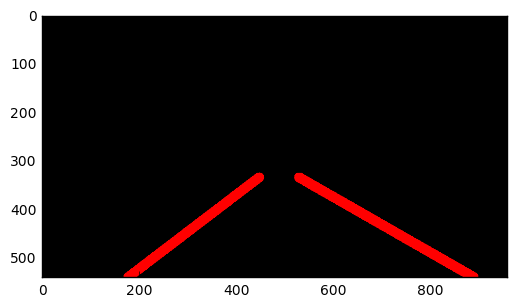

In [10]:
white_output = 'white.mp4'
clip1 = VideoFileClip("solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [11]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

**At this point, if you were successful you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform.  Modify your draw_lines function accordingly and try re-running your pipeline.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

[-0.6032786885245897, 601.3442622950819]
[0.6967741935483864, -31.15483870967693]
[-0.6434108527131781, 620.3565891472869]
[0.6512605042016811, -9.075630252101327]
[-0.6449275362318853, 619.2608695652178]
[-0.692307692307694, 641.307692307693]
[-0.5909090909090934, 595.09090909091]
[0.6497890295358656, -8.586497890296139]
[-0.671052631578948, 627.0657894736844]
[-0.7474747474747482, 665.4141414141416]
[0.7246376811594196, -52.99999999999962]
[-0.5897435897435894, 595.3333333333333]
[-0.7500000000000006, 663.2500000000002]
[-0.7238095238095235, 650.7904761904759]
[0.6265060240963853, 10.590361445783394]
[-0.6935483870967744, 630.7258064516129]
[0.6492890995260661, -5.549763033175008]
[0.6509433962264147, -1.622641509433569]
[-0.5932203389830505, 598.2372881355933]
middle 481
left [603, 536, 538, 552, 604, 563, 660] right [410, 386, 264, 415, 430, 395, 430, 416, 431, 428, 337, 260]
(7, 2)
-14.0570014213 0.664171418328
SLOPE
625.681429784 -0.661973589948
ave 524 334
SLOPE
ave 440 334
x2 8

  0%|          | 0/682 [00:00<?, ?it/s]

[-0.6032786885245897, 601.3442622950819]
[0.6967741935483864, -31.15483870967693]
[-0.6434108527131781, 620.3565891472869]
[0.6512605042016811, -9.075630252101327]
[-0.6449275362318853, 619.2608695652178]
[-0.692307692307694, 641.307692307693]
[-0.5909090909090934, 595.09090909091]
[0.6497890295358656, -8.586497890296139]
[-0.671052631578948, 627.0657894736844]
[-0.7474747474747482, 665.4141414141416]
[0.7246376811594196, -52.99999999999962]
[-0.5897435897435894, 595.3333333333333]
[-0.7500000000000006, 663.2500000000002]
[-0.7238095238095235, 650.7904761904759]
[0.6265060240963853, 10.590361445783394]
[-0.6935483870967744, 630.7258064516129]
[0.6492890995260661, -5.549763033175008]
[0.6509433962264147, -1.622641509433569]
[-0.5932203389830505, 598.2372881355933]
middle 481
left [603, 536, 538, 552, 604, 563, 660] right [410, 386, 264, 415, 430, 395, 430, 416, 431, 428, 337, 260]
(7, 2)
-14.0570014213 0.664171418328
SLOPE
625.681429784 -0.661973589948
ave 524 334
SLOPE
ave 440 334
x2 8

  0%|          | 2/682 [00:00<00:41, 16.38it/s]

(540, 960, 3) (540, 960, 3)
[0.7018181818181817, -34.87636363636317]
[-0.602649006622516, 601.8807947019865]
[-0.6279999999999997, 616.2719999999997]
[0.6523297491039425, -8.086021505375973]
[-0.602996254681648, 600.8913857677903]
[-0.6271186440677964, 615.3050847457624]
[0.6508474576271186, -9.50508474576254]
[-0.6065573770491831, 613.8196721311481]
[-0.6039603960396053, 611.6039603960398]
[0.6978417266187058, -38.323741007194776]
[-0.583941605839417, 608.7737226277372]
[0.6056338028169009, 25.352112676056688]
[0.5773195876288651, 48.577319587629404]
[0.6739130434782601, -23.913043478260334]
[0.6279069767441866, 7.325581395348477]
middle 469
left [537, 552, 537, 545, 683, 678, 540, 576] right [408, 424, 431, 439, 186, 304, 313]
(8, 2)
-4.18115508924 0.64845131573
SLOPE
609.792374339 -0.607889040614
ave 521 334
SLOPE
ave 453 334
x2 839 114
(540, 960, 3) (540, 960, 3)
[-0.6000000000000003, 602.2]
[-0.6443298969072168, 621.778350515464]
[0.6499999999999997, -7.349999999999922]
[0.6782608

  1%|          | 4/682 [00:00<00:42, 15.85it/s]

[0.666666666666667, -16.666666666666828]
[0.72463768115942, -52.65217391304313]
[0.6341463414634116, 5.487804878051514]
[-0.7272727272727265, 654.1818181818178]
[-0.5833333333333339, 596.6666666666671]
middle 492
left [753, 541, 582, 642, 576, 562, 542, 541, 546, 794] right [438, 433, 306, 332, 429, 434, 156, 432, 440]
(10, 2)
-32.0226180184 0.690519699899
SLOPE
623.178902591 -0.652514076822
ave 530 334
SLOPE
ave 443 334
x2 828 127
(540, 960, 3) (540, 960, 3)
[-0.6238244514106582, 610.7398119122256]
[-0.6470588235294121, 624.7058823529412]
[0.652542372881356, -12.288135593220339]
[-0.651162790697674, 626.9069767441861]
[0.6991150442477883, -35.619469026549204]
[0.6222222222222195, 14.088888888890988]
[-0.6376811594202895, 611.8840579710143]
[0.6972477064220178, -32.605504587155565]
[-0.6249999999999992, 611.9999999999995]
[0.6470588235294119, -9.64705882352957]
[0.6461538461538469, -5.861538461538948]
middle 483
left [546, 543, 797, 543, 545, 543] right [434, 440, 436, 188, 408]
(6, 2)

  1%|          | 7/682 [00:00<00:38, 17.62it/s]

(540, 960, 3) (540, 960, 3)
[-0.6258992805755393, 613.1079136690647]
[-0.6517857142857152, 628.4107142857147]
[0.6497461928934011, -12.111675126903407]
[0.6761363636363633, -21.903409090908813]
[-0.6487603305785116, 628.177685950413]
[0.6444444444444449, -3.311111111111378]
[0.6268656716417906, 2.865671641791449]
[-0.602739726027398, 604.0000000000005]
[-0.6262975778546718, 612.4083044982702]
[0.6497461928934003, -10.46192893400967]
[-0.64, 623.3999999999997]
middle 479
left [545, 553, 601, 541, 544] right [398, 398, 381, 438, 411, 385]
(5, 2)
-8.98449052423 0.649387773102
SLOPE
618.250769734 -0.63258043822
ave 528 334
SLOPE
ave 449 334
x2 845 123
(540, 960, 3) (540, 960, 3)
[-0.6525423728813561, 628.7033898305085]
[-0.6226415094339626, 612.7169811320758]
[0.6972477064220177, -37.605504587155444]
[0.6739130434782599, -27.434782608694995]
[-0.8571428571428564, 708.285714285714]
[-0.6485355648535567, 628.7949790794978]
[0.6460176991150434, -7.141592920353345]
[-0.6260162601626019, 612.52

  1%|▏         | 10/682 [00:00<00:36, 18.63it/s]

[-0.6246056782334382, 613.577287066246]
[-0.6666666666666672, 632.0000000000002]
[-0.7241379310344828, 652.103448275862]
[-0.628378378378378, 615.0337837837839]
[0.6935483870967749, -35.29032258064566]
[-0.7962962962962967, 680.277777777778]
[0.6060606060606052, 14.696969696970223]
[-0.5866666666666673, 598.9200000000002]
[-0.6074766355140186, 616.5887850467291]
[0.696428571428574, -40.00000000000168]
[0.5862068965517233, 29.551724137931714]
[-0.7473684210526309, 652.3894736842104]
[-0.7249999999999978, 655.449999999999]
[-0.8292682926829279, 689.7804878048782]
[-0.8333333333333328, 683.8333333333331]
[-0.6060606060606063, 617.6666666666667]
[0.6964285714285728, -39.303571428572376]
[-0.7499999999999991, 649.2499999999998]
[-0.8936170212765937, 721.7446808510629]
[0.7241379310344812, -53.34482758620585]
[-0.6999999999999984, 640.2999999999996]
[-0.6725663716814172, 635.8053097345139]
[0.7023809523809519, -44.702380952380565]
[-0.6562500000000004, 629.6562500000001]
[0.5517241379310363,

  2%|▏         | 13/682 [00:00<00:33, 19.81it/s]

(540, 960, 3) (540, 960, 3)
[-0.6741573033707867, 637.1011235955057]
[-0.649484536082474, 622.5051546391755]
[0.622710622710623, 3.9999999999993494]
[0.673819742489271, -24.403433476395342]
[-0.6666666666666661, 624.333333333333]
[-0.6777251184834129, 639.3033175355453]
[-0.5932203389830495, 599.8305084745755]
[-0.8314606741573048, 695.5617977528095]
[0.6719999999999995, -24.959999999999564]
[-0.6615384615384589, 624.7076923076914]
[-0.8365384615384615, 700.5480769230767]
[0.673387096774194, -22.2822580645165]
[-0.5873015873015853, 599.1904761904752]
[-0.6603773584905637, 625.3396226415083]
[0.6935483870967738, -42.38709677419347]
[0.6720000000000005, -26.304000000000194]
[-0.6621621621621645, 632.2432432432441]
[0.6512605042016805, -8.264705882352807]
[0.6060606060606034, 14.818181818183708]
[-0.7478260869565233, 666.3043478260876]
[0.6829268292682965, -31.975609756100386]
[-0.8350515463917514, 698.391752577319]
middle 491
left [546, 569, 555, 538, 622, 557, 567, 690, 757] right [414,

  2%|▏         | 16/682 [00:00<00:32, 20.55it/s]

[-0.6491803278688519, 623.6918032786882]
[-0.7004608294930889, 647.0967741935488]
[-0.6956521739130435, 639.1304347826089]
[0.6612903225806426, -17.499999999997648]
[0.6142857142857154, 9.099999999999374]
[0.5737704918032784, 33.016393442623105]
[-0.6237623762376214, 632.1881188118804]
[-0.7083333333333314, 645.1666666666661]
[0.6282051282051255, 4.012820512822468]
[-0.5538461538461558, 616.7846153846157]
[0.6290322580645169, 10.241935483870227]
[-0.750000000000001, 657.2500000000005]
[0.6486486486486486, -12.702702702702597]
[0.58252427184466, 29.62135922330098]
[0.6825396825396798, -32.968253968251595]
[-0.6235955056179779, 618.9325842696632]
[-0.5959595959595964, 628.5858585858587]
[-0.7777777777777783, 675.2222222222224]
[0.6119402985074622, 8.716417910448097]
[-0.6734693877551023, 639.7959183673471]
[0.6727272727272731, -21.618181818181945]
middle 502
left [775, 791, 542, 581, 777, 553, 562, 775, 543, 542] right [437, 427, 430, 252, 428, 256, 351, 404, 251, 431, 313]
(10, 2)
0.991

  3%|▎         | 18/682 [00:00<00:32, 20.17it/s]

[-0.7007299270072993, 647.3138686131385]
[-0.6728395061728398, 631.8641975308644]
[-0.6666666666666669, 628.6666666666666]
[0.649253731343283, -10.843283582089326]
[0.7142857142857136, -52.14285714285666]
[-0.7000000000000007, 648.2000000000005]
[0.6532258064516131, -10.354838709677617]
[-0.688524590163934, 635.2950819672128]
[-0.6557377049180336, 624.6065573770494]
[0.675925925925926, -28.27777777777786]
[0.6176470588235294, 5.529411764705846]
[0.5612244897959173, 45.12244897959245]
[-0.6333333333333349, 618.1666666666673]
[0.602941176470588, 21.80882352941194]
middle 471
left [545, 598, 544, 570, 548, 586, 609] right [430, 410, 244, 396, 288, 402, 425]
(7, 2)
-4.16543899124 0.6392148433
SLOPE
633.444719832 -0.67397596118
ave 529 334
SLOPE
ave 444 334
x2 851 138
(540, 960, 3) (540, 960, 3)
[-0.7007299270072993, 646.6131386861315]
[-0.6747572815533976, 631.6990291262134]
[-0.675767918088737, 630.9044368600681]
[0.725925925925925, -54.533333333332465]
[0.6011904761904766, 15.95833333333

  3%|▎         | 21/682 [00:01<00:31, 20.98it/s]

(540, 960, 3) (540, 960, 3)
[-0.7011494252873562, 645.2758620689655]
[-0.6747404844290661, 628.4152249134952]
[0.6229508196721312, 1.8852459016394107]
[0.6460176991150456, -8.247787610620387]
[0.6507936507936514, -12.380952380952955]
[-0.7931034482758579, 683.4137931034463]
[-0.6732026143790861, 627.5359477124188]
[0.6744186046511608, -32.23255813953352]
[0.6304347826086969, 3.021739130433853]
[-0.6982758620689659, 637.4655172413795]
[-0.6857142857142876, 639.2571428571435]
[-0.6525423728813557, 631.6610169491526]
[-0.7096774193548374, 648.290322580645]
[0.6495726495726487, -12.213675213674561]
[0.6721311475409822, -26.721311475408957]
[-0.6346153846153866, 614.6153846153854]
middle 476
left [554, 553, 543, 632, 617, 553, 559] right [414, 423, 433, 286, 426, 381, 378, 247, 428]
(7, 2)
-12.4127571126 0.649474193422
SLOPE
639.547801338 -0.691446810778
ave 533 334
SLOPE
ave 441 334
x2 850 143
(540, 960, 3) (540, 960, 3)
[-0.7018867924528309, 645.388679245283]
[-0.6708860759493663, 627.227

  4%|▎         | 24/682 [00:01<00:29, 22.01it/s]

[-0.7011494252873562, 645.2758620689655]
[-0.6754966887417214, 629.9536423841058]
[-0.6708074534161491, 627.5465838509319]
[0.6506024096385551, -10.87951807228976]
[0.6219512195121952, 2.085365853658581]
[0.6470588235294118, -10.94117647058836]
[-0.8428571428571421, 703.2714285714284]
[-0.7012448132780079, 646.2904564315353]
[0.7021276595744681, -42.46808510638287]
[-0.6953125000000013, 635.5078125000005]
[0.6725663716814154, -24.72566371681378]
middle 479
left [547, 561, 547, 596, 575] right [414, 410, 293, 431, 394, 425]
(5, 2)
-17.3858155025 0.658861296787
SLOPE
647.974297634 -0.71447800393
ave 533 334
SLOPE
ave 439 334
x2 845 151
(540, 960, 3) (540, 960, 3)
[-0.7003891050583652, 645.8599221789877]
[-0.6750902527075808, 629.8628158844764]
[0.6000000000000004, 16.599999999999834]
[0.6736842105263154, -26.547368421052404]
[-0.6717948717948721, 630.2153846153847]
[0.6020408163265298, 18.051020408163975]
[-0.6885245901639332, 631.262295081967]
[-0.7071428571428582, 647.5357142857149]
[0

  4%|▍         | 27/682 [00:01<00:29, 22.08it/s]

[-0.6746575342465743, 631.7773972602737]
[-0.7035175879396987, 649.5628140703516]
[0.6019108280254775, 13.13375796178372]
[0.6249999999999988, 5.500000000001129]
[-0.7090909090909097, 650.509090909091]
[0.603030303030303, 13.76060606060622]
[-0.6595744680851069, 624.9361702127661]
[-0.6744186046511624, 644.9999999999997]
[0.6250000000000009, 6.124999999999103]
[-0.6746031746031753, 632.9841269841272]
[-0.8666666666666664, 709.4666666666667]
[-0.8425925925925933, 697.0925925925931]
[0.5987261146496814, 19.13375796178345]
middle 481
left [558, 636, 541, 635, 576] right [431, 359, 397, 432, 301, 292, 379, 406]
(5, 2)
11.5306243968 0.610733449141
SLOPE
655.166107337 -0.725640192234
ave 528 334
SLOPE
ave 442 334
x2 865 158


  4%|▍         | 30/682 [00:01<00:29, 22.23it/s]

(540, 960, 3) (540, 960, 3)
[-0.6757679180887367, 631.9317406143343]
[-0.7272727272727273, 656.0909090909091]
[0.5799999999999991, 30.500000000000767]
[0.6179775280898847, 9.629213483148382]
[0.6266666666666658, 1.5333333333338897]
[0.6621621621621615, -23.040540540540185]
[-0.7142857142857164, 640.8571428571435]
[-0.6727272727272725, 629.9454545454543]
[-0.8684210526315795, 677.8157894736843]
[-0.8351648351648372, 697.01098901099]
[-0.8368794326241137, 696.6524822695036]
[0.6210526315789475, 0.48421052631580647]
[-0.6753246753246762, 632.3636363636365]
[0.6199999999999991, 2.180000000000712]
[0.7049180327868871, -60.672131147542316]
[-0.7261904761904757, 656.5714285714286]
[0.5731707317073174, 31.560975609755708]
[-0.752136752136753, 667.0769230769232]
[-0.8018867924528301, 666.3018867924528]
middle 505
left [775, 766, 580, 583, 566, 561, 767, 580] right [432, 414, 221, 431, 237, 370, 419, 427, 396, 387, 266]
(8, 2)
-0.978117341941 0.625743469124
SLOPE
659.328943879 -0.753277968082
av

  5%|▍         | 33/682 [00:01<00:29, 22.26it/s]

(540, 960, 3) (540, 960, 3)
[-0.6770428015564202, 635.4941634241245]
[-0.7260273972602733, 658.7945205479449]
[-0.6829268292682913, 634.2926829268287]
[0.5517241379310341, 43.34482758620732]
[0.6222222222222236, 4.3333333333323765]
[-0.674999999999999, 635.8749999999998]
[-0.8607594936708853, 704.1012658227844]
[-0.6309523809523804, 620.6071428571427]
[-0.6777777777777781, 633.0222222222225]
[0.6086956521739102, 12.043478260871694]
[-0.5588235294117644, 595.705882352941]
[0.6216216216216225, 2.243243243242755]
[0.6499999999999982, -19.84999999999886]
[-0.5599999999999994, 600.2799999999997]
[-0.7555555555555568, 660.3555555555561]
[-0.7250000000000023, 656.7250000000008]
[-0.6790123456790104, 642.777777777777]
[0.6494845360824739, -15.60824742268041]
[0.5769230769230785, 30.19230769230672]
[-0.651162790697675, 627.790697674419]
middle 487
left [583, 615, 616, 553, 589, 566, 615] right [401, 384, 428, 225, 423, 375, 422, 386, 388, 424, 361, 387, 379]
(7, 2)
8.09984895618 0.611524463851


  5%|▌         | 36/682 [00:01<00:28, 22.62it/s]

(540, 960, 3) (540, 960, 3)
[-0.7533039647577096, 665.0748898678418]
[-0.7034482758620687, 641.0758620689655]
[0.5783783783783786, 26.52972972972978]
[-0.7028985507246378, 642.3260869565216]
[0.6219512195121959, 3.487804878048081]
[-0.7424242424242437, 661.9848484848488]
[0.5762711864406785, 27.135593220338748]
[-0.717391304347823, 644.978260869564]
[-0.7118644067796591, 643.1525423728808]
[-0.6793893129770988, 634.5114503816791]
[0.5638297872340421, 39.38297872340473]
middle 484
left [561, 652, 562, 652] right [401, 428, 423, 233, 407, 232, 407]
(4, 2)
24.1340266379 0.585107642891
SLOPE
647.586277286 -0.715817151125
ave 529 334
SLOPE
ave 438 334
x2 881 150
(540, 960, 3) (540, 960, 3)
[-0.7532467532467532, 664.7922077922075]
[-0.7034883720930224, 641.0930232558137]
[0.5765765765765762, 27.810810810811212]
[-0.7014925373134318, 641.820895522388]
[0.6176470588235309, 7.411764705881167]
[0.5774647887323939, 26.73239436619778]
[-0.7200000000000003, 645.5999999999999]
[-0.7533632286995517, 

  6%|▌         | 39/682 [00:01<00:28, 22.63it/s]

(540, 960, 3) (540, 960, 3)
[-0.7258064516129031, 647.1290322580644]
[-0.7554585152838427, 664.9170305676855]
[0.5787545787545786, 26.26739926739927]
[-0.7199999999999985, 643.8399999999996]
[0.6000000000000011, 19.399999999999288]
[-0.7562189054726369, 666.0447761194027]
[-0.7380952380952384, 647.5000000000001]
[0.5999999999999976, 20.600000000001877]
[-0.7391304347826091, 649.3043478260871]
[0.577464788732395, 34.54929577464743]
[0.5737704918032795, 27.09836065573708]
[0.5524475524475522, 48.811188811189126]
[0.5785440613026815, 25.38697318007694]
[-0.7450980392156881, 651.3921568627457]
[-0.7499999999999996, 656.4999999999995]
[0.577777777777778, 23.15555555555554]
middle 476
left [568, 716, 754, 690, 568, 690, 568, 583] right [408, 397, 197, 369, 189, 248, 277, 398]
(8, 2)
28.1585966556 0.579844906352
SLOPE
653.328417954 -0.741225948058
ave 527 334
SLOPE
ave 430 334
x2 882 152
(540, 960, 3) (540, 960, 3)
[-0.7014388489208628, 639.708633093525]
[-0.7553648068669524, 663.635193133047

  6%|▌         | 42/682 [00:01<00:28, 22.13it/s]

(540, 960, 3) (540, 960, 3)
[-0.7801418439716313, 671.5602836879432]
[-0.7267441860465123, 645.8720930232563]
[-0.7314814814814806, 657.9629629629626]
[-0.7272727272727274, 642.9999999999997]
[0.6186440677966104, 3.466101694915279]
[-0.739130434782605, 648.0869565217378]
[0.5999999999999989, 11.000000000000892]
[0.5806451612903224, 27.677419354838893]
[-0.7333333333333333, 657.0666666666667]
[0.6239316239316243, 1.1025641025635713]
[-0.7968749999999988, 679.1093749999995]
[0.6016260162601629, 12.08130081300819]
[-0.7264957264957272, 646.7777777777779]
[-0.7169811320754711, 654.0943396226414]
middle 453
left [565, 590, 593, 564, 565] right [425, 414, 272, 198, 268, 341, 413, 403, 247]
(5, 2)
11.0654771931 0.604969373856
SLOPE
655.947828363 -0.742050651718
ave 533 334
SLOPE
ave 433 334
x2 874 156
(540, 960, 3) (540, 960, 3)
[-0.7528089887640451, 663.3146067415731]
[-0.6999999999999995, 639.3999999999996]
[-0.6996466431095408, 638.0494699646642]
[0.6018518518518517, 15.694444444444454]
[-

  7%|▋         | 45/682 [00:02<00:32, 19.69it/s]

(540, 960, 3) (540, 960, 3)
[-0.6996466431095413, 639.4487632508836]
[-0.7538461538461529, 664.2615384615384]
[0.6507177033492832, -13.244019138756688]
[0.5727272727272728, 31.572727272727352]
[-0.767857142857143, 663.2678571428571]
[-0.7391304347826123, 656.8695652173928]
[0.6969696969696965, -47.60606060606026]
[-0.634920634920635, 615.8730158730159]
[-0.7749999999999988, 667.0499999999993]
[0.6020408163265292, 11.653061224490804]
[0.6210526315789467, 2.96842105263179]
[0.6315789473684209, -0.2631578947367194]
[-0.804347826086957, 675.3913043478262]
[-0.8039215686274526, 671.8627450980398]
[-0.6323529411764706, 616.1470588235296]
[0.6451612903225804, -11.580645161290235]
middle 481
left [549, 549, 625, 562, 562, 553, 562] right [428, 393, 421, 426, 403, 422, 366, 322, 394]
(7, 2)
-3.78566760728 0.631464051235
SLOPE
652.241316468 -0.73455814949
ave 534 334
SLOPE
ave 433 334
x2 861 152
(540, 960, 3) (540, 960, 3)
[-0.6996466431095413, 639.4487632508836]
[-0.7528957528957531, 662.980694

  7%|▋         | 48/682 [00:02<00:35, 18.06it/s]

[-0.7528517110266155, 662.2205323193914]
[-0.716981132075472, 642.6792452830189]
[-0.7277486910994762, 647.109947643979]
[0.5815217391304349, 26.233695652173814]
[-0.7399999999999999, 649.14]
[0.6690140845070414, -27.007042253520492]
[0.6699029126213593, -25.475728155340033]
[-0.7380952380952371, 648.1904761904761]
[0.61875, 7.356249999999891]
[-0.7413793103448264, 659.7413793103443]
[-0.7063492063492064, 652.1111111111111]
[-0.7605633802816892, 664.7605633802812]
[-0.7250000000000004, 645.2250000000001]
[-0.6736842105263154, 641.894736842105]
[0.5681818181818188, 31.954545454545038]
[0.5789473684210532, 27.052631578946865]
[-0.7227722772277236, 655.4752475247525]
[-0.714285714285715, 655.5714285714289]
middle 446
left [543, 571, 559, 557, 558, 544] right [428, 199, 422, 261, 236, 349, 364, 427, 421, 365, 359, 222]
(6, 2)
6.68572537947 0.614386320477
SLOPE
652.009972348 -0.726642572609
ave 532 334
SLOPE
ave 437 334
x2 868 154
(540, 960, 3) (540, 960, 3)
[-0.7534246575342463, 663.315068

  7%|▋         | 50/682 [00:02<00:34, 18.15it/s]

(540, 960, 3) (540, 960, 3)
[-0.6996466431095401, 638.7491166077733]
[-0.7543103448275862, 663.4612068965517]
[0.599173553719008, 13.867768595041392]
[0.6260162601626009, 1.9430894308949362]
[-0.773584905660376, 664.9056603773579]
[-0.7528517110266155, 662.2205323193914]
[0.6255506607929515, 3.189427312775109]
[0.6119402985074617, 3.223880597015898]
[-0.7219251336898393, 644.6524064171124]
[0.5774058577405855, 28.004184100418502]
middle 505
left [566, 548, 564, 735, 549] right [427, 397, 420, 428, 422]
(5, 2)
10.0456700072 0.608017326185
SLOPE
654.797784524 -0.740463747663
ave 532 334
SLOPE
ave 433 334
x2 871 155
(540, 960, 3) (540, 960, 3)
[-0.7528517110266155, 662.2205323193914]
[0.5751633986928101, 31.882352941176727]
[-0.7035398230088503, 638.9380530973453]
[0.6067415730337093, 16.528089887639428]
[0.5999999999999991, 23.400000000000805]
[-0.7031802120141338, 640.2579505300349]
[0.5769230769230775, 27.115384615384205]
[0.577049180327869, 31.236065573770297]
[-0.671874999999996, 626

  8%|▊         | 53/682 [00:02<00:32, 19.13it/s]

[-0.7767857142857144, 672.705357142857]
middle 515
left [639, 723, 545, 572, 811, 723, 540, 555, 538] right [374, 428, 426, 421, 422, 350, 409]
(9, 2)
19.1511637679 0.598555373913
SLOPE
658.531513588 -0.747420694605
ave 526 334
SLOPE
ave 434 334
x2 870 158
(540, 960, 3) (540, 960, 3)
[-0.7500000000000003, 662.4999999999999]
[-0.7083333333333346, 639.6250000000005]
[0.5769230769230765, 32.03846153846198]
[0.6224489795918361, 6.183673469388475]
[-0.7035398230088504, 639.6061946902657]
[-0.7520000000000002, 661.576]
[0.6224489795918361, 5.183673469388347]
[-0.7011952191235065, 638.2709163346615]
[0.6500000000000021, -10.350000000001232]
[0.6210526315789467, 2.210526315789786]
[0.5546218487394955, 42.168067226891026]
[-0.6888888888888876, 632.9999999999997]
[0.643564356435645, -8.673267326733658]
[0.560606060606061, 43.48484848484812]
[-0.7647058823529448, 665.9411764705894]
[-0.7407407407407425, 657.8888888888898]
middle 505
left [773, 758, 758, 539, 560, 537, 548, 586] right [430, 423, 3

  8%|▊         | 55/682 [00:02<00:39, 16.00it/s]

[-0.6956521739130445, 636.086956521739]
[-0.731182795698926, 655.7204301075271]
[-0.733333333333335, 655.8666666666675]
[-0.7190082644628105, 643.0909090909093]
[-0.7232142857142849, 645.9196428571428]
[-0.7169811320754721, 648.4339622641511]
[-0.7142857142857183, 641.1428571428582]
[0.6180555555555546, 8.63194444444507]
[0.5523809523809533, 48.75238095238012]
[0.6470588235294131, -12.529411764706824]
[-0.7142857142857137, 653.4285714285711]
[-0.8405797101449265, 684.2753623188404]
[-0.707317073170736, 638.4390243902446]
[-0.8969072164948446, 696.4845360824739]
[-0.8333333333333336, 678.8333333333334]
[0.6241134751773056, 2.354609929077579]
[-0.6363636363636356, 613.6363636363631]
[-0.8333333333333346, 680.6666666666671]
middle 440
left [541, 587, 568, 541] right [210, 347, 398, 352, 423, 426, 262, 219, 337, 183, 296, 307, 430, 326]
(4, 2)
11.8023808903 0.610402201661
SLOPE
655.144663036 -0.749698408329
ave 527 334
SLOPE
ave 428 334
x2 865 153
(540, 960, 3) (540, 960, 3)
[-0.7032967032

  8%|▊         | 57/682 [00:02<00:43, 14.38it/s]

[-0.7019607843137247, 638.6784313725486]
[-0.7512690355329955, 662.2944162436551]
[-0.7500000000000001, 660.5000000000001]
[0.6521739130434804, -10.434782608697148]
[0.6224489795918363, 2.2755102040818533]
[-0.6904761904761961, 633.0714285714309]
[0.7000000000000012, -51.100000000001266]
[0.6224489795918369, 3.5204081632654805]
[-0.7777777777777777, 668.3333333333335]
[0.7032967032967017, -51.219780219779196]
[0.6470588235294118, -8.647058823529441]
[-0.7021276595744683, 637.7021276595746]
[-0.7500000000000009, 661.2500000000002]
middle 497
left [545, 549, 733, 547, 643, 545] right [397, 429, 314, 423, 417, 424, 399]
(6, 2)
-19.2676172141 0.657904566509
SLOPE
651.689962454 -0.731944492525
ave 536 334
SLOPE
ave 434 334
x2 850 152


  9%|▊         | 59/682 [00:03<00:43, 14.29it/s]

(540, 960, 3) (540, 960, 3)
[-0.7008196721311473, 637.8155737704916]
[-0.7500000000000006, 660.5000000000002]
[-0.7529411764705879, 662.2588235294115]
[0.5983606557377052, 16.885245901639312]
[-0.6842105263157894, 631.6842105263156]
[0.6000000000000009, 21.99999999999931]
[-0.7399999999999981, 652.0599999999991]
[0.6198347107438019, 7.148760330578516]
[-0.8333333333333316, 675.8333333333326]
[0.6181818181818173, 8.854545454546239]
[-0.7142857142857149, 639.4285714285714]
[0.6249999999999997, 1.2500000000000502]
[-0.8695652173913042, 679.8695652173914]
[-0.8888888888888878, 688.444444444444]
middle 445
left [540, 610, 537, 547, 550] right [385, 398, 428, 362, 419, 295, 198, 254, 275]
(5, 2)
11.2277103374 0.612275436933
SLOPE
658.654946917 -0.770449392091
ave 527 334
SLOPE
ave 421 334
x2 863 154
(540, 960, 3) (540, 960, 3)
[-0.6996466431095414, 635.9505300353359]
[-0.7303921568627452, 654.1470588235293]
[0.6014492753623174, 15.014492753623985]
[-0.729166666666667, 654.6666666666665]
[0.6

  9%|▉         | 62/682 [00:03<00:39, 15.70it/s]

(540, 960, 3) (540, 960, 3)
[-0.6986301369863016, 634.8219178082193]
[0.6243654822335022, 6.730964467005571]
[-0.7272727272727271, 652.4545454545454]
[0.6008771929824556, 16.723684210526738]
[-0.7252747252747261, 650.4175824175826]
[-0.6999999999999994, 635.9999999999997]
[-0.7115384615384575, 635.7499999999991]
[0.5950413223140487, 21.892561983471587]
[-0.7118644067796639, 636.966101694916]
[0.5784313725490198, 31.65686274509833]
[0.7317073170731678, -59.41463414633975]
[0.6145833333333326, 5.385416666667133]
[0.6227272727272731, 3.6136363636360636]
[0.6170212765957459, 13.531914893615966]
middle 471
left [561, 543, 543, 559, 565, 673, 545, 709] right [422, 420, 428, 420, 195, 250]
(8, 2)
5.01505089796 0.623094321226
SLOPE
641.068357896 -0.712430076309
ave 527 334
SLOPE
ave 431 334
x2 858 141
(540, 960, 3) (540, 960, 3)


 10%|▉         | 66/682 [00:03<00:49, 12.34it/s]

[-0.6992187499999994, 634.37109375]
[0.6209677419354843, 10.362903225806305]
[-0.7272727272727271, 652.4545454545454]
[-0.7252747252747261, 650.4175824175826]
[0.6014234875444839, 15.2313167259786]
[-0.7007874015748038, 636.8267716535435]
[-0.7142857142857153, 636.4285714285718]
[0.6180555555555565, 8.104166666666023]
[0.5960264900662248, 20.52980132450376]
[0.6007326007326003, 14.798534798535185]
[-0.7192982456140335, 642.38596491228]
[0.5980392156862755, 20.53921568627403]
[-0.6808510638297832, 628.5106382978705]
[0.6262626262626259, -1.6565656565651679]
[0.5970149253731322, 23.62686567164323]
[0.5984848484848483, 24.628787878788117]
middle 487
left [679, 540, 537, 536, 548, 581, 619, 612, 679] right [421, 420, 428, 415, 219, 362, 412]
(9, 2)
15.1294473691 0.606334165738
SLOPE
640.199309702 -0.709569803979
ave 525 334
SLOPE
ave 431 334
x2 865 141
(540, 960, 3) (540, 960, 3)
[-0.7252747252747256, 651.1428571428572]
[-0.6999999999999998, 636.7000000000002]
[0.6241134751773055, 7.503546

 10%|█         | 70/682 [00:03<00:43, 14.18it/s]

(540, 960, 3) (540, 960, 3)
[-0.6764705882352948, 630.8823529411766]
[-0.7524271844660193, 659.781553398058]
[-0.675000000000002, 631.8250000000005]
[-0.7457627118644057, 656.8305084745759]
[0.6461538461538462, -9.861538461538577]
[0.6721311475409828, -19.606557377048617]
[-0.7435897435897431, 660.25641025641]
[-0.805031446540881, 677.0817610062894]
[-0.8698630136986302, 701.458904109589]
[-0.8392857142857162, 691.6428571428581]
[0.6272727272727288, 5.981818181817013]
[-0.7794117647058834, 669.7941176470592]
[0.6000000000000003, 17.199999999999843]
[-0.8053097345132744, 669.8672566371682]
[-0.6742424242424242, 631.0454545454544]
[0.5984848484848484, 19.41666666666673]
[-0.8955223880596994, 701.9104477611934]
[0.6619718309859145, -18.1267605633797]
[-0.605263157894735, 606.8684210526307]
middle 445
left [543, 538, 558, 538, 539, 541] right [430, 425, 219, 217, 428, 374, 373, 388, 418, 314, 270, 288, 393]
(6, 2)
-0.832728592247 0.634335733406
SLOPE
660.711157306 -0.759013836315
ave 527 3

 11%|█         | 72/682 [00:03<00:40, 15.11it/s]

[-0.6746575342465744, 630.7773972602736]
[-0.7066666666666664, 648.0400000000001]
[-0.7073170731707317, 647.3902439024389]
[0.5809523809523801, 30.96190476190533]
[0.5853658536585346, 32.60975609756232]
[-0.595238095238095, 597.9761904761905]
[0.6018518518518529, 16.203703703702985]
[-0.6829268292682932, 644.5121951219512]
[-0.5869565217391316, 597.4782608695657]
[0.6479591836734686, -10.729591836734231]
[-0.6833333333333317, 633.2999999999995]
[0.6722689075630258, -27.495798319328255]
[0.6216216216216224, 6.810810810810195]
[0.6417910447761198, -3.358208955224111]
[-0.6279069767441883, 615.6046511627916]
middle 455
left [544, 602, 538, 549, 624, 536, 535] right [431, 351, 395, 425, 216, 408, 198, 380]
(7, 2)
6.4289394661 0.621687263442
SLOPE
626.884867349 -0.658125378801
ave 526 334
SLOPE
ave 445 334
x2 858 132
(540, 960, 3) (540, 960, 3)
[-0.7262773722627743, 653.0255474452558]
[-0.6904761904761895, 634.7857142857137]
[-0.7268292682926824, 653.9902439024387]
[-0.6956521739130432, 634

 11%|█         | 76/682 [00:04<00:45, 13.38it/s]

[-0.7262773722627742, 653.7518248175184]
[-0.7014925373134326, 639.7164179104474]
[-0.6990291262135923, 637.7864077669902]
[0.6491228070175441, -4.912280701754534]
[0.6009615384615374, 19.08653846153922]
[0.6019900497512435, 19.72139303482599]
[-0.7073170731707332, 639.1219512195123]
[-0.6923076923076938, 634.5384615384618]
[0.6702702702702698, -20.956756756756516]
[-0.726937269372693, 653.3099630996307]
[0.6477987421383644, -5.893081761005837]
[0.5999999999999995, 26.600000000000442]
[-0.6031746031746035, 619.1111111111112]
[-0.7532467532467537, 666.1168831168834]
middle 465
left [556, 534, 542, 543, 571, 649] right [432, 413, 426, 249, 203, 431, 350, 421]
(6, 2)
5.60763537947 0.628357234606
SLOPE
642.931627573 -0.701222803383
ave 522 334
SLOPE
ave 440 334
x2 850 146
(540, 960, 3) (540, 960, 3)
[-0.6745762711864401, 632.0915254237286]
[-0.7013888888888887, 648.1180555555557]
[0.6510638297872341, -6.365957446808466]
[0.6219512195121946, 5.390243902439313]
[-0.6746575342465744, 630.7773

 11%|█▏        | 78/682 [00:04<00:45, 13.20it/s]

[-0.6746575342465743, 631.7773972602737]
[0.6018518518518522, 19.80555555555531]
[-0.7066666666666663, 648.9599999999997]
[0.6222222222222207, 14.71111111111229]
[-0.6874999999999998, 633.8749999999999]
[-0.7065217391304339, 647.3043478260863]
[0.6067415730337097, 14.752808988762855]
[0.6275862068965521, 7.413793103448059]
[-0.7007299270072986, 648.7153284671529]
[-0.6543209876543212, 625.7654320987654]
[-0.6315789473684215, 615.0000000000003]
[-0.6874999999999967, 633.3124999999993]
[-0.5892857142857151, 602.5714285714289]
[-0.6071428571428559, 616.4999999999995]
[0.6243093922651934, 7.243093922651772]
[-0.6528925619834719, 624.338842975207]
[0.6222222222222216, 15.711111111111613]
[0.601423487544484, 18.83985765124566]
[0.6022727272727294, 16.568181818180385]
[-0.6057692307692306, 615.1153846153843]
middle 470
left [537, 706, 541, 565, 533, 706, 534, 542] right [431, 324, 410, 384, 295, 397, 418, 207, 376, 322, 411, 332]
(8, 2)
14.3806891578 0.613578710414
SLOPE
628.602971818 -0.6587

 12%|█▏        | 82/682 [00:04<00:43, 13.89it/s]

(540, 960, 3) (540, 960, 3)
[-0.725925925925926, 652.8740740740747]
[-0.6797385620915029, 630.8954248366011]
[-0.726457399103139, 653.8295964125558]
[-0.691489361702128, 634.1808510638297]
[0.7205882352941165, -47.39705882352891]
[0.6259541984732825, 3.4809160305343756]
[-0.6794871794871779, 630.2307692307686]
[-0.7073170731707313, 635.9024390243898]
[0.5982905982905986, 23.15384615384567]
[-0.8095238095238089, 666.3809523809522]
[0.6268656716417914, 5.746268656716094]
[0.5797101449275357, 32.115942028985835]
[0.7000000000000024, -37.000000000001776]
middle 440
left [539, 544, 558, 538, 538, 540] right [431, 400, 432, 249, 408, 178, 271]
(6, 2)
-3.31668099224 0.641901474771
SLOPE
643.470586718 -0.717134187286
ave 525 334
SLOPE
ave 431 334
x2 846 144
(540, 960, 3) (540, 960, 3)
[-0.7251184834123229, 652.526066350711]
[-0.6972972972972974, 635.6540540540541]
[-0.697368421052632, 634.9868421052632]
[-0.6888888888888869, 644.0666666666659]
[0.6012658227848096, 19.316455696203]
[-0.70833333

 12%|█▏        | 84/682 [00:04<00:47, 12.62it/s]

[-0.7238805970149256, 650.544776119403]
[-0.6935483870967736, 633.0806451612899]
[0.6464088397790054, -10.331491712706898]
[-0.6990291262135915, 636.3883495145628]
[0.6990291262135919, -36.07766990291228]
[-0.7073170731707341, 634.5121951219514]
[0.6701030927835049, -22.907216494844942]
[0.6037735849056588, 18.943396226415942]
[-0.742424242424243, 658.7575757575762]
[0.6732673267326726, -23.277227722771784]
[0.7218045112781948, -55.41353383458574]
[-0.7073170731707291, 637.268292682926]
[-0.7142857142857157, 641.5714285714292]
[0.6222222222222233, 11.288888888888243]
[-0.749999999999999, 659.4999999999997]
middle 460
left [576, 538, 555, 545, 547, 606, 599] right [429, 313, 424, 193, 428, 269, 411, 374]
(7, 2)
-16.8249792218 0.662372671988
SLOPE
643.952907866 -0.717225276672
ave 529 334
SLOPE
ave 432 334
x2 840 144
(540, 960, 3) (540, 960, 3)
[-0.6762295081967215, 628.6147540983607]
[-0.7239819004524887, 650.2171945701356]
[-0.7262773722627739, 651.5729927007301]
[0.6521739130434787, -

 13%|█▎        | 88/682 [00:05<00:42, 13.86it/s]

[-0.6757679180887376, 627.2013651877132]
[-0.7203389830508476, 648.2118644067798]
[-0.7233009708737862, 650.5728155339804]
[0.6488549618320613, -4.870229007633656]
[0.6435643564356422, -8.772277227721931]
[0.6486486486486492, -9.918918918919314]
[-0.7252252252252259, 650.684684684685]
[0.6482758620689649, -5.772413793103067]
[-0.7536231884057988, 664.0579710144933]
[-0.6595744680851064, 625.7234042553192]
[-0.6862745098039202, 632.2745098039211]
[0.6984126984126978, -36.14285714285658]
[-0.6534090909090904, 622.551136363636]
middle 457
left [550, 587, 541, 538, 540] right [425, 271, 428, 376, 430, 180, 388, 411]
(5, 2)
-13.095339218 0.65755130548
SLOPE
640.159718906 -0.699689294305
ave 527 334
SLOPE
ave 437 334
x2 841 143
(540, 960, 3) (540, 960, 3)
[-0.6734693877551015, 626.2244897959183]
[-0.7041666666666668, 643.975]
[-0.7023809523809542, 644.761904761905]
[0.6727272727272732, -21.945454545454727]
[0.6022727272727281, 19.17045454545407]
[0.6981132075471707, -38.471698113208205]
[0.5

 13%|█▎        | 90/682 [00:05<00:46, 12.77it/s]

[-0.7021276595744687, 642.6170212765959]
[-0.6736401673640161, 626.2970711297066]
[0.6142857142857111, 9.414285714288255]
[0.6480446927374295, -3.82681564245758]
[0.6216216216216213, 5.567567567567932]
[-0.6745762711864408, 626.0203389830505]
[0.6466165413533826, -6.233082706766456]
[-0.702247191011235, 643.6348314606739]
[0.6231884057971009, 7.840579710145222]
[0.620253164556963, 15.632911392404127]
[0.6326530612244871, -3.591836734691589]
[0.6363636363636368, 2.5454545454541933]
[0.5686274509803905, 38.705882352942304]
[0.5821917808219175, 32.55479452054823]
[0.6964285714285718, -41.42857142857177]
[0.578947368421053, 43.052631578947256]
middle 506
left [727, 600, 538, 537, 533, 660, 747, 601, 558, 559, 608, 658] right [431, 425, 424, 327]
(12, 2)
8.35281673915 0.622435167466
SLOPE
634.642315713 -0.688147822284
ave 523 334
SLOPE
ave 436 334
x2 854 137
(540, 960, 3) (540, 960, 3)
[-0.6996466431095409, 642.2473498233218]
[0.6496350364963497, -5.094890510948146]
[-0.6745762711864411, 62

 13%|█▎        | 92/682 [00:05<00:47, 12.32it/s]

(540, 960, 3) (540, 960, 3)
[-0.7016574585635358, 644.5193370165745]
[-0.6733870967741935, 628.8830645161289]
[0.626262626262626, 3.545454545454764]
[-0.6734693877551022, 627.5714285714289]
[0.6249999999999996, 16.25000000000033]
[-0.6842105263157883, 641.6315789473683]
[-0.6833333333333326, 639.2666666666665]
[0.6203703703703707, 9.481481481481293]
[0.6078431372549032, 31.05882352941069]
[-0.6511627906976759, 636.3023255813957]
[0.6500000000000004, -4.400000000000053]
[-0.5737704918032782, 625.2131147540981]
[0.6071428571428562, 22.2500000000007]
[0.597826086956523, 27.630434782607693]
[0.6074766355140183, 15.39252336448627]
[-0.7215189873417729, 652.9873417721523]
[0.6734693877551022, -18.367346938775515]
[-0.8589743589743581, 691.7564102564097]
[-0.6019417475728144, 628.3203883495141]
[0.7999999999999997, -89.39999999999979]
[0.6538461538461537, -11.4230769230769]
middle 483
left [756, 734, 536, 783, 536, 581, 750, 536, 544, 538, 539] right [434, 429, 427, 264, 356, 260, 274, 413, 3

 14%|█▍        | 96/682 [00:05<00:42, 13.84it/s]

[-0.7014388489208631, 646.5287769784171]
[-0.6734693877551026, 629.591836734694]
[-0.6745762711864404, 630.742372881356]
[-0.6853932584269651, 643.5056179775275]
[0.6697247706422013, -18.72477064220127]
[-0.6666666666666681, 641.3333333333336]
[-0.6666666666666696, 640.6666666666677]
[0.6718750000000002, -16.14062499999999]
[0.674603174603175, -16.611111111111594]
[-0.6666666666666644, 637.6666666666658]
[-0.707317073170731, 649.6829268292681]
[-0.6835443037974682, 642.4177215189873]
[0.672566371681416, -17.911504424778805]
[0.6279069767441857, 5.79069767441884]
[0.7719298245614035, -74.2456140350878]
middle 444
left [564, 539, 539, 550, 545, 547] right [437, 430, 431, 294, 200, 214, 307, 435, 321]
(6, 2)
-22.9738212565 0.681434353039
SLOPE
640.237324399 -0.680637682584
ave 523 334
SLOPE
ave 449 334
x2 826 147
(540, 960, 3) (540, 960, 3)
[-0.7022058823529407, 648.5441176470586]
[-0.6745762711864404, 630.742372881356]
[0.6736111111111119, -16.097222222222797]
[-0.6849315068493143, 640.2

 14%|█▍        | 98/682 [00:05<00:40, 14.45it/s]

(540, 960, 3) (540, 960, 3)
[-0.6747404844290654, 630.439446366782]
[-0.7215909090909087, 653.204545454545]
[0.6259541984732825, 6.992366412213965]
[0.62222222222222, 15.20000000000162]
[-0.7215909090909096, 652.2897727272725]
[-0.7419354838709674, 662.0000000000002]
[-0.7794117647058817, 679.0441176470583]
[0.6260162601626024, 9.203252032519714]
[0.601503759398496, 21.203007518796927]
[0.6722689075630252, -20.697478991596597]
[0.6122448979591832, 20.530612244898222]
[-0.829787234042552, 668.9361702127657]
[-0.6754716981132078, 631.5396226415095]
[0.65909090909091, -7.386363636364024]
middle 473
left [532, 612, 538, 530, 541, 610, 609] right [426, 380, 333, 434, 435, 253, 402]
(7, 2)
6.4350565115 0.63132873641
SLOPE
653.921953579 -0.734932640478
ave 518 334
SLOPE
ave 435 334
x2 845 155
(540, 960, 3) (540, 960, 3)
[-0.7038834951456316, 647.3737864077674]
[-0.6758620689655169, 630.5931034482755]
[-0.6752767527675283, 631.188191881919]
[-0.6785714285714293, 641.964285714286]
[0.6481481481

 15%|█▍        | 100/682 [00:06<00:47, 12.18it/s]

(540, 960, 3) (540, 960, 3)
[-0.6734693877551022, 628.9183673469388]
[0.6719576719576724, -17.841269841270297]
[-0.7050000000000002, 647.445]
[0.6040609137055836, 20.39086294416242]
[-0.6753246753246751, 642.25974025974]
[-0.6750000000000005, 630.8000000000001]
[0.7227722772277231, -50.198019801980436]
[-0.6542056074766354, 635.7757009345793]
[0.6875000000000006, -25.750000000000366]
[0.5568181818181825, 55.29545454545377]
[0.673575129533679, -21.709844559585793]
[0.6009615384615381, 21.490384615384823]
[0.6799999999999968, -28.35999999999784]
[-0.6904761904761915, 641.1428571428577]
middle 478
left [537, 544, 562, 532, 646, 537, 530, 602] right [429, 429, 338, 416, 339, 426]
(8, 2)
-5.83530401223 0.649705714088
SLOPE
637.723610947 -0.678912643505
ave 523 334
SLOPE
ave 447 334
x2 840 143


 15%|█▍        | 102/682 [00:06<00:55, 10.43it/s]

(540, 960, 3) (540, 960, 3)
[-0.6768707482993197, 630.3775510204081]
[-0.7026022304832712, 646.6059479553901]
[0.6034482758620692, 20.51724137931032]
[0.6476190476190473, -0.7238095238091856]
[0.5510204081632667, 46.85714285714211]
[0.5798319327731084, 40.571428571429124]
[-0.6851851851851843, 643.7592592592591]
[-0.6738197424892696, 630.2660944206007]
[-0.6923076923076926, 642.0769230769233]
[0.6016260162601618, 20.934959349593978]
[0.6727272727272725, -20.27272727272721]
[0.6433121019108283, -6.3885350318474465]
[-0.7025316455696204, 646.0379746835446]
middle 481
left [546, 662, 532, 663, 532, 540, 540] right [429, 425, 239, 410, 419, 410]
(7, 2)
14.4993857613 0.614226436474
SLOPE
639.853958403 -0.688886207389
ave 520 334
SLOPE
ave 443 334
x2 855 144
(540, 960, 3) (540, 960, 3)
[-0.6748251748251748, 630.1013986013987]
[-0.7012987012987008, 646.7012987012984]
[0.6245847176079734, 4.973421926910615]
[0.6498054474708176, -3.7898832684827677]
[-0.7045454545454548, 646.840909090909]
[0.64

 16%|█▌        | 106/682 [00:06<00:50, 11.35it/s]

(540, 960, 3) (540, 960, 3)
[-0.7003745318352061, 645.1573033707865]
[-0.6746575342465756, 628.7294520547945]
[0.621621621621621, 6.567567567568021]
[0.6413043478260855, 3.7934782608706614]
[0.6019417475728174, 22.737864077668185]
[-0.6740740740740755, 628.3259259259262]
[0.6451612903225802, -0.06451612903208225]
[0.6249999999999972, 9.125000000001824]
[-0.6119402985074628, 607.0746268656717]
[0.6238532110091726, 8.614678899083541]
[0.6470588235294126, -5.470588235294724]
[-0.6829268292682918, 637.7804878048776]
[-0.5909090909090882, 597.4999999999986]
[0.5535714285714263, 64.69642857143052]
[-0.6964285714285732, 638.7142857142866]
[0.649038461538462, -8.83173076923098]
middle 515
left [538, 741, 753, 741, 555, 536, 537, 743, 539] right [420, 425, 269, 425, 417, 429, 416]
(9, 2)
11.2409091381 0.623172325777
SLOPE
626.183154534 -0.661615847181
ave 517 334
SLOPE
ave 441 334
x2 848 130
(540, 960, 3) (540, 960, 3)
[-0.6525423728813562, 623.5508474576275]
[-0.6326530612244916, 621.510204081

 16%|█▌        | 110/682 [00:06<00:41, 13.76it/s]

(540, 960, 3) (540, 960, 3)
[-0.7011494252873567, 645.9770114942528]
[-0.6737967914438511, 629.9304812834228]
[-0.6705882352941192, 627.5176470588239]
[0.5783132530120483, 34.81927710843367]
[-0.6874999999999983, 632.4374999999995]
[0.601851851851851, 25.296296296296784]
[0.6219512195121949, 6.414634146341407]
[0.6496815286624206, -4.127388535031783]
[-0.8913043478260876, 725.9347826086959]
[-0.6986301369863003, 644.8904109589038]
[0.6500000000000011, -6.950000000000906]
[0.6785714285714312, -26.4642857142873]
[-0.6874999999999981, 633.3124999999992]
[-0.6746987951807228, 631.1325301204819]
middle 454
left [545, 596, 546, 542, 543, 571] right [415, 411, 217, 277, 433, 372, 303, 390]
(6, 2)
4.83142221696 0.630061546935
SLOPE
646.391607941 -0.710645966502
ave 522 334
SLOPE
ave 439 334
x2 849 149
(540, 960, 3) (540, 960, 3)
[-0.7003891050583652, 646.5603112840462]
[-0.675182481751825, 629.9781021897811]
[-0.6741573033707858, 630.7303370786514]
[0.6030150753768848, 19.959798994974474]
[-0.

 16%|█▋        | 112/682 [00:07<00:37, 15.02it/s]

[0.6506024096385525, -2.6987951807218398]
[-0.6311475409836074, 618.5081967213118]
[0.6999999999999998, -36.10000000000003]
[-0.6298701298701305, 619.8701298701301]
[0.647058823529412, -2.2941176470591635]
[-0.7012987012987005, 648.6233766233762]
[0.6444444444444448, -3.1333333333336855]
[-0.5614035087719298, 598.1754385964912]
[-0.6025641025641038, 608.0256410256417]
[0.6470588235294115, -5.529411764705806]
[-0.6739130434782611, 629.9782608695655]
middle 451
left [550, 579, 543, 529, 534, 534] right [402, 282, 435, 408, 384, 326, 353, 400, 227]
(6, 2)
-2.63960418982 0.645188619043
SLOPE
624.638586473 -0.645409355224
ave 521 334
SLOPE
ave 450 334
x2 841 131
(540, 960, 3) (540, 960, 3)
[-0.6736842105263158, 630.6210526315786]
[-0.723618090452262, 654.773869346734]
[0.6734693877551015, -18.979591836734258]
[-0.6813186813186838, 644.285714285715]
[0.6226415094339617, 6.886792452830548]
[-0.7205882352941165, 654.8970588235289]
[-0.6666666666666664, 628.6666666666666]
[0.6028368794326244, 2

 17%|█▋        | 114/682 [00:07<00:41, 13.73it/s]

[-0.8676470588235282, 713.7941176470582]
[0.6233183856502235, 8.394618834081134]
[0.6020408163265305, 23.25510204081649]
[-0.8453608247422664, 702.1237113402053]
[-0.8048780487804876, 689.609756097561]
[0.6030150753768839, 21.35678391959828]
[-0.8043478260869584, 685.2173913043484]
[-0.6818181818181803, 635.1363636363631]
[-0.6748466257668705, 631.1288343558278]
middle 465
left [540, 537, 660, 536, 532, 561, 545] right [408, 359, 392, 207, 435, 402, 426, 412, 372, 383, 301]
(7, 2)
-5.87793673525 0.646111441252
SLOPE
658.813326525 -0.736275946169
ave 526 334
SLOPE
ave 441 334
x2 844 161
(540, 960, 3) (540, 960, 3)
[-0.6744186046511625, 631.7209302325582]
[-0.7023255813953486, 648.9674418604651]
[0.6484375000000004, -4.265625000000639]
[0.6254681647940075, 4.498127340823807]
[-0.671428571428572, 629.9857142857145]
[-0.7033898305084747, 648.4322033898304]
[0.6502242152466358, -4.376681614348846]
[-0.6037735849056598, 603.8490566037732]
[0.6491228070175439, -13.245614035087744]
[0.57692307

 17%|█▋        | 118/682 [00:07<00:43, 13.03it/s]

[-0.7021276595744689, 647.5319148936173]
[0.6524822695035459, -6.475177304964487]
[-0.653679653679653, 626.1991341991338]
[0.6249999999999994, 2.8750000000006057]
[0.6212121212121205, 7.4090909090912715]
[-0.6535947712418316, 624.9673202614389]
[-0.7035175879396993, 649.4522613065329]
[-0.6517857142857152, 626.6428571428572]
[0.6237113402061861, 7.067010309278073]
[0.6227106227106228, 5.358974358974563]
[0.6746987951807225, -27.50602409638538]
[0.6696428571428586, -22.49107142857271]
[-0.8387096774193542, 698.9677419354833]
[0.6263157894736846, 7.042105263157568]
[-0.6321839080459776, 616.5747126436784]
[-0.8666666666666636, 703.999999999999]
middle 479
left [554, 541, 537, 537, 539, 644, 725, 538] right [391, 421, 436, 356, 248, 428, 428, 345]
(8, 2)
-3.34001149868 0.639471724429
SLOPE
649.291992798 -0.712783204857
ave 527 334
SLOPE
ave 442 334
x2 849 153
(540, 960, 3) (540, 960, 3)
[-0.6521739130434789, 626.2608695652177]
[-0.703389830508474, 648.1355932203389]
[0.6438356164383587, 0

 18%|█▊        | 122/682 [00:07<00:39, 14.07it/s]

[-0.6742424242424253, 631.0454545454551]
[-0.7231404958677695, 654.5661157024799]
[-0.6811594202898565, 632.8985507246382]
[-0.7256097560975618, 656.3658536585372]
[0.6482758620689649, -4.662068965516614]
[0.6233766233766231, 4.636363636363924]
[-0.7380952380952371, 653.6666666666662]
[-0.7777777777777779, 664.7777777777778]
[0.5999999999999998, 26.200000000000177]
[0.6466666666666667, -7.43333333333331]
[0.5779816513761474, 37.99082568807302]
[0.722222222222223, -53.722222222222875]
[0.6462585034013593, -4.5646258503394295]
[-0.804347826086956, 667.5869565217391]
[0.5769230769230763, 34.576923076923705]
middle 472
left [544, 546, 613, 545, 590, 595, 544, 545] right [402, 435, 430, 436, 364, 316, 273]
(8, 2)
4.12773275374 0.630213075754
SLOPE
651.558196514 -0.732053276923
ave 523 334
SLOPE
ave 433 334
x2 850 152
(540, 960, 3) (540, 960, 3)
[-0.674157303370786, 631.0337078651681]
[-0.697368421052632, 648.1842105263158]
[-0.7079646017699114, 649.938053097345]
[0.6010362694300522, 18.8445

 18%|█▊        | 126/682 [00:08<00:35, 15.51it/s]

(540, 960, 3) (540, 960, 3)
[-0.7229437229437231, 656.6493506493505]
[-0.6796875000000009, 633.6250000000003]
[0.6458333333333338, -1.8125000000001454]
[0.6209150326797394, 7.568627450979742]
[-0.6739130434782601, 634.4130434782608]
[-0.6935483870967719, 636.7903225806448]
[-0.8070175438596483, 671.6842105263153]
[0.6232876712328766, 9.178082191780744]
[-0.803571428571429, 672.9285714285714]
[0.5569620253164557, 47.21518987341781]
[-0.6944444444444431, 638.527777777777]
[0.6690647482014391, -17.61870503597119]
[-0.6475409836065563, 623.9754098360648]
[-0.7254901960784326, 655.8039215686277]
[0.5957446808510671, 22.91489361701899]
[0.6714285714285712, -21.928571428571175]
[-0.6554054054054061, 628.2027027027029]
middle 449
left [585, 537, 542, 558, 536, 638, 545] right [438, 432, 287, 203, 297, 316, 319, 437, 212, 426]
(7, 2)
6.50243095266 0.626176580435
SLOPE
645.260031055 -0.710356265548
ave 523 334
SLOPE
ave 438 334
x2 851 148
(540, 960, 3) (540, 960, 3)
[-0.7262773722627741, 657.383

 19%|█▉        | 128/682 [00:08<00:48, 11.51it/s]

left [538, 536, 706, 693, 538, 537, 749, 736, 688, 777, 694] right [438, 430, 258, 302, 439, 433, 392, 198]
(11, 2)
-13.0951408112 0.651879020301
SLOPE
645.745731596 -0.706991574709
ave 532 334
SLOPE
ave 440 334
x2 848 149
(540, 960, 3) (540, 960, 3)
[-0.7242798353909459, 656.781893004115]
[-0.675471698113207, 633.9169811320752]
[0.6500000000000004, -6.700000000000343]
[0.5979729729729728, 22.29054054054066]
[-0.67741935483871, 633.9032258064519]
[0.5775862068965525, 41.85344827586165]
[-0.7428571428571421, 663.8571428571427]
[0.5514018691588781, 59.68224299065451]
[-0.7391304347826093, 664.0434782608697]
[0.5563909774436083, 58.95488721804564]
[-0.8095238095238106, 690.5238095238101]
[0.6724137931034484, -22.44827586206905]
[0.6241610738255042, 10.604026845636946]
[0.6716417910447758, -20.686567164178847]
[-0.7008547008546998, 653.6410256410253]
[-0.8370370370370367, 700.0666666666662]
[-0.5797101449275363, 620.8985507246376]
middle 492
left [538, 538, 627, 726, 719, 542, 571, 540] ri

 19%|█▉        | 132/682 [00:08<00:44, 12.27it/s]

[-0.6772908366533871, 634.8525896414346]
[-0.7262773722627731, 658.1094890510947]
[0.6000000000000021, 22.999999999998128]
[-0.6776859504132232, 634.0165289256198]
[0.6495726495726499, -4.418803418803714]
[0.6269841269841278, 4.174603174602567]
[-0.725738396624472, 658.8734177215188]
[0.6666666666666681, -21.333333333334558]
[0.6499999999999986, -5.649999999999177]
[0.6666666666666654, -20.333333333332423]
[0.6206896551724139, 9.000000000000115]
middle 524
left [815, 541, 542, 797, 541, 587, 551] right [394, 438, 425, 438]
(7, 2)
-2.22298098727 0.64008282358
SLOPE
646.463006335 -0.701748138988
ave 525 334
SLOPE
ave 445 334
x2 847 151
(540, 960, 3) (540, 960, 3)
[-0.7242647058823531, 657.2279411764707]
[-0.6765799256505572, 634.074349442379]
[0.6491228070175438, -4.105263157894736]
[0.6223776223776232, 5.804195804195431]
[-0.7245762711864397, 658.0889830508471]
[0.5772357723577243, 35.861788617886084]
[0.584415584415584, 29.662337662337805]
[-0.6770186335403735, 633.732919254659]
[0.621

 20%|█▉        | 135/682 [00:08<00:39, 13.76it/s]

(540, 960, 3) (540, 960, 3)
[-0.6723549488054607, 634.1467576791807]
[-0.7259259259259266, 657.9555555555556]
[0.6499999999999997, -5.149999999999777]
[0.6239316239316238, 4.829059829060059]
[-0.6782608695652178, 634.0086956521741]
[0.6470588235294109, -5.823529411764031]
[-0.7268907563025203, 659.1050420168065]
[-0.7407407407407393, 659.7407407407403]
[0.6190476190476188, 10.047619047619511]
[0.644628099173554, -5.520661157025151]
[-0.6755725190839692, 633.9580152671757]
[0.6016949152542378, 19.89830508474568]
middle 464
left [531, 542, 536, 533, 536, 532] right [436, 438, 432, 439, 217, 407]
(6, 2)
3.04679889877 0.631060180156
SLOPE
646.485801152 -0.703290960071
ave 524 334
SLOPE
ave 444 334
x2 850 151
(540, 960, 3) (540, 960, 3)
[-0.7262773722627731, 658.1094890510947]
[-0.6774193548387092, 635.8709677419351]
[0.6496350364963502, -4.605839416058006]
[-0.7235023041474651, 658.3410138248847]
[0.6240000000000003, 5.911999999999716]
[-0.7183098591549284, 650.3098591549291]
[0.6395348837

 20%|██        | 139/682 [00:09<00:44, 12.14it/s]

[-0.6774193548387092, 634.4193548387093]
[0.6210526315789467, 6.494736842105614]
[-0.7232472324723248, 656.6125461254616]
[0.652173913043478, -6.6086956521735765]
[-0.7262773722627728, 658.8357664233572]
[0.6486486486486484, -5.378378378378272]
[0.6263157894736838, 2.4157894736845544]
[0.6483516483516483, -7.7582417582417325]
[-0.6666666666666671, 632.9999999999999]
[-0.6024844720496888, 621.869565217391]
[-0.6904761904761899, 638.9761904761904]
middle 450
left [537, 533, 534, 539, 541] right [411, 435, 439, 246, 350, 307]
(5, 2)
-2.1669578946 0.639308526219
SLOPE
640.618903847 -0.681095214794
ave 525 334
SLOPE
ave 450 334
x2 848 147
(540, 960, 3) (540, 960, 3)
[-0.6747572815533988, 634.4902912621362]
[-0.7252747252747255, 657.9450549450551]
[0.649769585253457, -4.976958525346184]
[0.6244541484716165, 4.6681222707419066]
[-0.677290836653387, 634.0119521912352]
[0.6238938053097342, 4.097345132743616]
[-0.7234042553191482, 658.2978723404251]
[0.6470588235294119, -6.176470588235624]
[0.62

 21%|██        | 143/682 [00:09<00:48, 11.15it/s]

[-0.7252747252747255, 657.9450549450551]
[0.5981308411214953, 23.607476635514022]
[-0.6959064327485385, 640.6315789473689]
[0.6300000000000003, 9.469999999999638]
[-0.6923076923076941, 638.3846153846158]
[0.5999999999999999, 18.999999999999993]
[0.7333333333333316, -52.26666666666558]
[-0.7083333333333321, 640.6666666666663]
[0.6065573770491832, 29.737704918030207]
[-0.8351648351648362, 674.9670329670334]
[0.6000000000000004, 23.399999999999803]
[-0.7267759562841536, 659.0546448087433]
[0.5811965811965802, 35.84615384615475]
[0.7012987012987014, -39.12987012987033]
[0.6935483870967746, -33.483870967742085]
[0.6020408163265312, 21.897959183673237]
[-0.7142857142857144, 648.8571428571429]
[0.5820895522388048, 50.791044776120636]
[0.622641509433962, 12.226415094339758]
middle 485
left [539, 731, 540, 539, 772, 556, 747, 562, 576, 540, 770, 573] right [437, 432, 262, 200, 255, 439, 431]
(12, 2)
8.42469555746 0.629236424925
SLOPE
651.500962368 -0.728292669914
ave 517 334
SLOPE
ave 435 334
x

 22%|██▏       | 147/682 [00:09<00:38, 13.76it/s]

(540, 960, 3) (540, 960, 3)
[-0.7242647058823525, 657.7794117647061]
[-0.6768558951965058, 634.1135371179037]
[-0.6746031746031753, 632.777777777778]
[0.6220930232558146, 6.848837209301771]
[0.6491228070175429, -5.070175438596067]
[0.6470588235294118, -4.235294117647053]
[-0.6610169491525405, 632.1186440677965]
[-0.7238805970149249, 658.507462686567]
[-0.6500000000000004, 630.95]
[0.6260162601626013, 10.268292682927001]
[0.648648648648648, -10.270270270269704]
[-0.7142857142857125, 652.5714285714278]
[0.6235955056179777, 7.269662921348171]
[-0.6257309941520455, 623.9064327485376]
[-0.8018867924528299, 672.1792452830185]
middle 456
left [550, 547, 532, 597, 577, 548] right [436, 371, 434, 215, 440, 183, 418, 385, 307]
(6, 2)
0.801842164511 0.636089178039
SLOPE
643.878215558 -0.694724980304
ave 523 334
SLOPE
ave 446 334
x2 847 149
(540, 960, 3) (540, 960, 3)
[-0.7236842105263162, 657.2500000000001]
[-0.6778523489932898, 633.5100671140948]
[-0.6784140969162991, 634.3348017621142]
[0.64864

 22%|██▏       | 152/682 [00:10<00:32, 16.34it/s]

left [531, 537, 535, 594, 593, 555, 537] right [415, 435, 433, 440, 434, 434, 436, 385, 364]
(7, 2)
-1.81722527728 0.638438942872
SLOPE
630.476408382 -0.659004966872
ave 525 334
SLOPE
ave 449 334
x2 848 137
(540, 960, 3) (540, 960, 3)
[-0.6756756756756735, 631.7837837837827]
[-0.6499999999999998, 625.9999999999997]
[0.6491228070175445, -5.982456140351332]
[-0.6760563380281674, 633.9999999999998]
[-0.704545454545454, 651.2954545454545]
[-0.7037037037037023, 651.9999999999998]
[0.6033519553072623, 17.000000000000096]
[-0.659999999999999, 631.5399999999996]
[-0.6296296296296301, 621.4814814814815]
[-0.6527777777777766, 623.9583333333327]
[-0.6071428571428604, 609.0000000000015]
[0.601092896174863, 20.617486338798056]
[-0.6275862068965525, 623.1448275862073]
[0.5796178343949042, 34.57324840764327]
[-0.5785123966942163, 609.7933884297523]
[0.6440677966101689, -6.44067796610136]
[-0.5636363636363622, 595.3090909090903]
[-0.6491228070175435, 633.140350877193]
[0.6517857142857133, -14.37499999

 23%|██▎       | 154/682 [00:10<00:41, 12.83it/s]

(540, 960, 3) (540, 960, 3)
[-0.6757679180887372, 635.310580204778]
[0.600619195046439, 18.464396284830134]
[-0.724409448818897, 659.2519685039367]
[0.6240000000000024, 11.967999999997993]
[-0.7105263157894742, 654.1052631578949]
[0.6290322580645175, 7.354838709676267]
[0.5522388059701507, 51.014925373133465]
[-0.7511520737327182, 663.4562211981563]
[-0.675438596491228, 635.9385964912283]
[-0.6904761904761896, 646.2619047619042]
[-0.6285714285714289, 619.6857142857144]
[0.6216216216216218, 3.54054054054023]
[-0.8387096774193548, 693.9999999999998]
[0.6220930232558135, 9.093023255814229]
[-0.8395061728395059, 692.3827160493827]
[-0.8046874999999992, 686.9218749999995]
[0.5782608695652169, 38.382608695652685]
[-0.7512953367875653, 664.5233160621764]
[0.5986394557823136, 18.741496598639042]
[-0.8360655737704904, 700.2950819672126]
[0.5517241379310321, 49.06896551724274]
[-0.6302521008403366, 623.0840336134459]
middle 493
left [542, 718, 718, 574, 641, 548, 634, 545, 540] right [437, 420, 

 23%|██▎       | 156/682 [00:10<00:40, 13.03it/s]

[-0.7279411764705874, 659.5661764705882]
[-0.6502463054187197, 629.3596059113303]
[0.5979381443298954, 20.783505154640768]
[0.629213483146069, 8.573033707863996]
[-0.6562499999999998, 629.3124999999997]
[0.6410256410256423, -1.8205128205137]
[-0.6593406593406588, 629.1538461538461]
[-0.6607142857142865, 633.1607142857147]
[0.6195652173913041, 6.945652173913274]
[0.5967741935483881, 24.306451612902556]
[0.6016260162601645, 22.94308943089295]
[-0.7173913043478235, 644.4565217391298]
[0.5739130434782609, 34.93913043478267]
[-0.6781609195402277, 651.9310344827582]
[-0.6307692307692304, 622.6153846153843]
[0.576923076923076, 39.9615384615395]
[-0.6600000000000035, 634.8400000000014]
[-0.5818181818181861, 631.200000000001]
[0.6458333333333306, -17.812499999997545]
[-0.6619718309859159, 634.3098591549297]
[0.6666666666666634, -16.666666666664696]
[-0.7483870967741931, 666.0709677419351]
[-0.6973684210526303, 654.4342105263154]
[0.7017543859649111, -47.24561403508693]
[-0.8677685950413226, 707

 23%|██▎       | 160/682 [00:10<00:34, 15.31it/s]

(540, 960, 3) (540, 960, 3)
[-0.6769759450171822, 639.9003436426117]
[-0.7037037037037036, 655.259259259259]
[-0.7064220183486242, 658.0917431192662]
[0.5749999999999996, 35.67500000000031]
[0.5985915492957747, 27.85211267605642]
[0.5770925110132167, 37.14096916299493]
[-0.606299212598425, 628.070866141732]
[-0.6778523489932884, 638.9328859060402]
[0.6515151515151516, -8.727272727272624]
[0.5794871794871791, 37.066666666667004]
[-0.6904761904761939, 653.4047619047627]
[0.5990990990990985, 21.68018018018059]
[-0.6268656716417907, 630.1343283582088]
[0.6203703703703713, 12.203703703702871]
middle 454
left [531, 605, 530, 546, 559, 533, 530] right [443, 448, 279, 297, 441, 283, 340]
(7, 2)
23.2701942375 0.600165122969
SLOPE
643.399169762 -0.669799298683
ave 517 334
SLOPE
ave 461 334
x2 860 154
(540, 960, 3) (540, 960, 3)
[-0.6776859504132231, 640.8264462809915]
[-0.7229437229437227, 663.5151515151517]
[0.5909090909090918, 32.590909090908724]
[0.5588235294117648, 47.26470588235278]
[-0.680

 24%|██▍       | 164/682 [00:10<00:34, 15.02it/s]

(540, 960, 3) (540, 960, 3)
[-0.7257142857142846, 663.9999999999995]
[-0.6972972972972971, 647.0810810810813]
[0.5784313725490192, 33.96078431372579]
[-0.6959459459459449, 647.6081081081079]
[-0.7413793103448264, 670.8448275862065]
[0.6214689265536727, 11.570621468926518]
[-0.785714285714286, 691.2142857142859]
[0.5757575757575758, 33.81818181818163]
[-0.7499999999999994, 671.75]
[-0.7042253521126757, 659.7746478873238]
[-0.7777777777777798, 686.8888888888898]
[0.6237113402061859, 6.819587628865978]
[-0.7173913043478244, 649.7826086956518]
[0.5555555555555557, 49.11111111111134]
[0.6470588235294127, -8.352941176470978]
[0.6666666666666669, -21.333333333333396]
[-0.7731958762886596, 680.8350515463917]
[-0.6747967479674806, 653.2032520325203]
[0.6000000000000001, 17.399999999999995]
[0.5979899497487432, 24.47738693467416]
[-0.7999999999999993, 688.5999999999997]
middle 470
left [536, 551, 537, 539, 565, 577, 611, 611, 536] right [350, 340, 442, 395, 447, 441, 349, 419, 206, 424, 353, 387

 24%|██▍       | 166/682 [00:11<00:35, 14.39it/s]

(540, 960, 3) (540, 960, 3)
[-0.7252747252747257, 664.1978021978025]
[-0.6986301369863015, 648.0958904109589]
[0.5780141843971629, 31.13829787234079]
[0.5985915492957762, 25.605633802815557]
[-0.6959064327485389, 646.8654970760238]
[0.5564853556485356, 50.18828451882819]
[-0.7549668874172192, 676.7152317880797]
[0.5745856353591158, 36.149171270718426]
[-0.707317073170733, 652.1219512195127]
[0.604316546762589, 21.913669064749076]
[-0.8113207547169815, 694.1509433962265]
[-0.7413793103448264, 670.1379310344824]
[-0.7173913043478235, 663.8260869565211]
[0.5714285714285713, 33.57142857142845]
[-0.77777777777778, 685.7777777777787]
[-0.8064516129032246, 697.7741935483865]
[-0.7768595041322314, 678.9834710743801]
[0.6415094339622648, -2.0566037735852727]
[-0.5535714285714272, 621.9464285714283]
[-0.8018018018018018, 692.1351351351352]
middle 489
left [543, 714, 634, 541, 715, 545, 541] right [447, 441, 326, 446, 372, 402, 332, 220, 388, 399, 381, 307, 408]
(7, 2)
28.0728401896 0.58927589669

 25%|██▍       | 170/682 [00:11<00:35, 14.50it/s]

left [531, 789, 554, 547, 829, 789, 571] right [435, 437, 423, 259, 214, 445, 415, 238]
(7, 2)
12.7908719224 0.609695532993
SLOPE
654.457656256 -0.711302825506
ave 526 334
SLOPE
ave 450 334
x2 864 160
(540, 960, 3) (540, 960, 3)
[-0.7301587301587292, 668.9682539682537]
[-0.7010676156583617, 649.768683274021]
[-0.6941176470588236, 649.5764705882353]
[0.5960264900662259, 23.31788079470146]
[-0.7499999999999993, 675.2499999999997]
[0.6220472440944879, 4.275590551181383]
[-0.700729927007298, 650.9051094890505]
[-0.7121212121212116, 663.3939393939393]
[0.5734265734265732, 33.1888111888113]
[-0.7530864197530869, 677.1111111111111]
[0.6194690265486715, 4.185840707965356]
[0.5568181818181822, 47.69318181818162]
[-0.629370629370629, 635.6573426573423]
[-0.7833333333333331, 684.6666666666666]
[0.6250000000000001, 1.6249999999999125]
middle 482
left [533, 559, 549, 576, 595, 575] right [367, 439, 446, 447, 418, 280, 441, 322, 440]
(6, 2)
19.0477175101 0.598797919326
SLOPE
661.699730794 -0.7171095

 25%|██▌       | 172/682 [00:11<00:36, 13.91it/s]

(540, 960, 3) (540, 960, 3)
[-0.700704225352113, 651.8133802816903]
[-0.7019607843137264, 651.0156862745099]
[-0.7499999999999993, 674.7499999999995]
[-0.7765957446808495, 685.8085106382972]
[-0.7555555555555546, 674.7555555555554]
[0.5748031496062997, 30.755905511810603]
[0.620689655172414, 6.689655172413399]
[-0.7692307692307684, 681.7692307692303]
[0.6016260162601625, 20.33333333333373]
[-0.8313253012048213, 704.3132530120494]
[0.5519999999999999, 46.88799999999988]
[0.5728155339805824, 31.07766990291256]
middle 460
left [538, 537, 533, 531, 562] right [445, 416, 317, 444, 271, 352, 425]
(5, 2)
27.1489127841 0.584386871004
SLOPE
674.88937379 -0.755053197191
ave 525 334
SLOPE
ave 451 334
x2 877 178
(540, 960, 3) (540, 960, 3)
[-0.7499999999999999, 674.7499999999999]
[-0.6971830985915493, 650.9436619718308]
[-0.8091603053435114, 695.2213740458012]
[0.6460176991150433, -10.061946902654237]
[-0.7954545454545459, 693.1590909090913]
[-0.8615384615384596, 715.6769230769222]
[-0.74137931034

 26%|██▌       | 176/682 [00:11<00:33, 14.97it/s]

(540, 960, 3) (540, 960, 3)
[-0.7547892720306516, 676.1264367816092]
[-0.7257383966244727, 658.5991561181435]
[0.5743589743589748, 29.84615384615351]
[0.5952380952380967, 22.547619047618323]
[0.6217948717948718, 3.442307692307733]
[-0.6274509803921564, 639.5294117647054]
[-0.8348623853211008, 699.3944954128436]
[-0.7352941176470592, 671.1176470588236]
[-0.8348623853210992, 696.6880733944946]
[-0.6818181818181828, 642.727272727273]
[-0.727272727272728, 671.7272727272729]
[0.5736040609137065, 31.40101522842559]
[-0.7380952380952357, 660.3333333333327]
[0.5915492957746475, 16.80281690140894]
[-0.7407407407407389, 664.1111111111102]
[-0.833333333333332, 700.6666666666661]
[0.7115384615384613, -54.61538461538466]
[0.6046511627906968, 15.906976744186515]
[-0.7272727272727245, 658.7272727272718]
middle 464
left [540, 535, 567, 538, 663, 608, 536] right [444, 439, 369, 367, 366, 341, 444, 364, 224, 312, 380, 265]
(7, 2)
9.33307212067 0.610390703201
SLOPE
669.979012485 -0.746794207156
ave 531 3

 26%|██▌       | 178/682 [00:11<00:33, 15.24it/s]

[-0.7772511848341239, 686.6540284360193]
[-0.7249999999999998, 661.8999999999996]
[-0.7286245353159847, 661.1375464684013]
[0.5523255813953487, 46.74418604651194]
[0.5987654320987652, 18.469135802469395]
[0.5552325581395345, 43.174418604651535]
[-0.781456953642383, 688.8410596026487]
[-0.6525423728813554, 658.3389830508476]
[0.5535168195718656, 41.886850152905296]
[-0.7419354838709676, 666.1290322580644]
[0.6006191950464403, 18.065015479875715]
[-0.8333333333333311, 698.9999999999994]
[-0.7283464566929132, 662.0905511811022]
middle 470
left [540, 542, 540, 544, 541] right [446, 444, 438, 440, 330, 325, 354, 423]
(5, 2)
33.6679212173 0.57209191725
SLOPE
673.011400125 -0.746061290071
ave 524 334
SLOPE
ave 454 334
x2 885 178
(540, 960, 3) (540, 960, 3)
[-0.8020833333333315, 696.9270833333326]
[-0.7539682539682543, 671.746031746032]
[0.5981308411214955, 17.62616822429864]
[0.5762711864406774, 26.694915254237685]
[-0.7564102564102564, 680.9615384615382]
[-0.7441860465116277, 666.81395348837

 27%|██▋       | 182/682 [00:12<00:37, 13.21it/s]

[-0.7232472324723249, 661.6752767527677]
[-0.7818930041152266, 688.7242798353911]
[0.5760869565217381, 36.228260869566434]
[0.5510204081632637, 46.48979591836857]
[0.5555555555555556, 45.55555555555547]
[-0.6739130434782566, 639.891304347824]
[-0.7399999999999983, 666.3399999999991]
[-0.7812500000000008, 689.4062500000002]
[-0.6746987951807233, 666.8674698795181]
[0.5689655172413782, 41.36206896551809]
[-0.7040816326530608, 653.6122448979592]
[0.5546218487394949, 47.28571428571475]
[-0.5813953488372103, 647.1162790697678]
[0.5702479338842968, 33.50413223140539]
[0.5806451612903277, 21.64516129031793]
[-0.8370370370370366, 699.7777777777778]
middle 538
left [779, 794, 785, 544, 548, 798] right [442, 446, 445, 441, 437, 274, 444, 284, 345]
(6, 2)
37.7525222601 0.566931304307
SLOPE
668.156764729 -0.721946232642
ave 522 334
SLOPE
ave 462 334
x2 885 177
(540, 960, 3) (540, 960, 3)
[-0.728476821192054, 663.5695364238412]
[-0.7834645669291339, 689.4251968503936]
[-0.7721518987341758, 678.9746

 27%|██▋       | 184/682 [00:12<00:35, 13.84it/s]

[-0.7252747252747253, 662.0219780219779]
[-0.7829787234042555, 689.1148936170213]
[-0.7328767123287668, 662.9383561643833]
[-0.7678571428571432, 682.4107142857144]
[0.5517241379310346, 47.58620689655144]
[0.5528455284552865, 48.42276422764083]
[0.5999999999999994, 17.80000000000042]
[0.55135135135135, 44.102702702703546]
[-0.7647058823529447, 675.5294117647074]
[-0.8644067796610161, 703.966101694915]
middle 484
left [530, 607, 552, 553] right [444, 428, 427, 429, 410, 310]
(4, 2)
39.4779184567 0.563980254434
SLOPE
679.330242591 -0.77301666098
ave 522 334
SLOPE
ave 446 334
x2 887 180
(540, 960, 3) (540, 960, 3)
[-0.7537313432835818, 671.3805970149249]
[-0.7795275590551183, 687.6692913385826]
[-0.7812500000000008, 689.0312500000002]
[-0.7481481481481499, 668.1555555555561]
[0.5545023696682464, 47.80568720379173]
[0.5981735159817355, 18.780821917808147]
[-0.7674418604651161, 674.7209302325583]
[0.6197183098591545, 2.9859154929581866]
[0.5578947368421053, 42.673684210526396]
[-0.7534246575

 28%|██▊       | 188/682 [00:12<00:39, 12.53it/s]

[-0.727272727272727, 663.1818181818178]
[-0.7817460317460326, 688.8769841269847]
[0.5535714285714289, 44.94642857142831]
[0.5751633986928095, 35.562091503268626]
[-0.7259259259259249, 663.5851851851851]
[-0.7368421052631592, 664.9473684210529]
[0.5789473684210522, 32.36842105263192]
[0.5625000000000013, 38.06249999999932]
[0.5736434108527134, 32.449612403100716]
[-0.7560975609756084, 683.6829268292679]
[0.5853658536585364, 22.609756097561316]
[-0.8357142857142846, 705.1499999999994]
[-0.8631578947368421, 718.063157894737]
middle 481
left [533, 538, 540, 599, 571, 643] right [443, 445, 308, 422, 276, 413, 438]
(6, 2)
34.333134938 0.571531910033
SLOPE
683.926777234 -0.775250933091
ave 524 334
SLOPE
ave 451 334
x2 884 185
(540, 960, 3) (540, 960, 3)
[-0.7512690355329938, 670.558375634517]
[-0.7824074074074071, 689.7870370370371]
[0.5544041450777198, 44.393782383420145]
[-0.7817460317460312, 688.6587301587297]
[0.5745856353591159, 36.596685082873044]
[-0.7476635514018689, 668.3457943925234

 28%|██▊       | 190/682 [00:12<00:35, 14.02it/s]

left [539, 535, 623, 536, 717, 748, 544] right [439, 443, 437, 347, 350, 349, 385, 350, 441, 346, 391]
(7, 2)
33.0704988523 0.572426254705
SLOPE
680.159836913 -0.751384967402
ave 525 334
SLOPE
ave 460 334
x2 885 186
(540, 960, 3) (540, 960, 3)
[-0.7537878787878788, 670.1590909090908]
[-0.8045112781954893, 695.075187969925]
[0.5784313725490189, 33.3823529411769]
[0.5520504731861202, 45.23659305993673]
[-0.8333333333333328, 707.9999999999995]
[-0.7479674796747965, 668.1463414634146]
[0.5510204081632648, 47.000000000000256]
[-0.8396946564885502, 707.2671755725194]
[0.5714285714285724, 27.857142857141937]
[-0.8319327731092432, 709.378151260504]
[0.5660377358490563, 42.037735849056794]
[0.6166666666666666, 8.099999999999929]
[-0.8692307692307705, 707.5000000000003]
[-0.8977272727272751, 735.3522727272739]
[0.5776397515527948, 31.496894409938207]
[-0.8021978021978007, 693.6263736263732]
[-0.8979591836734708, 730.5306122448986]
[0.5999999999999984, 22.800000000001045]
[0.5979899497487438, 16.

 28%|██▊       | 194/682 [00:13<00:40, 12.19it/s]

[-0.7853658536585366, 688.5756097560975]
[-0.7537878787878793, 669.405303030303]
[0.5507246376811578, 45.65217391304493]
[0.5970149253731345, 17.208955223880682]
[-0.7846153846153846, 687.5846153846156]
[0.5517241379310351, 49.793103448275474]
[-0.7169811320754712, 676.3773584905659]
[-0.7692307692307678, 685.2307692307688]
[0.6186440677966105, 9.220338983050537]
[-0.7749999999999966, 682.7749999999984]
[-0.7534246575342466, 670.1232876712328]
[0.7450980392156895, -113.96078431372833]
middle 542
left [825, 807, 546, 824] right [398, 437, 443, 246, 285, 441, 401]
(4, 2)
-10.4698290484 0.627870417517
SLOPE
680.010277652 -0.762629382272
ave 548 334
SLOPE
ave 453 334
x2 876 183
(540, 960, 3) (540, 960, 3)
[-0.7509433962264146, 668.1622641509433]
[-0.7900000000000013, 690.6800000000001]
[-0.7826086956521745, 686.6956521739135]
[-0.7666666666666677, 682.8333333333336]
[0.571428571428571, 34.42857142857178]
[0.5822784810126589, 29.07594936708808]
[-0.7524752475247525, 669.4653465346533]
[-0.7

 29%|██▊       | 196/682 [00:13<00:38, 12.56it/s]

[-0.7537878787878792, 667.8977272727276]
[-0.8051282051282054, 693.8153846153847]
[-0.8053097345132735, 695.1415929203537]
[-0.8222222222222265, 696.4444444444455]
[-0.866071428571429, 708.7857142857147]
[-0.8661417322834635, 705.0944881889761]
[-0.899999999999999, 710.8999999999997]
[0.5777777777777781, 34.933333333333024]
[-0.8341968911917096, 699.8549222797926]
[0.5508474576271175, 51.69491525423805]
middle 464
left [528, 596] right [435, 432, 441, 245, 360, 328, 291, 411]
(2, 2)
43.3141242938 0.564312617702
SLOPE
697.241784251 -0.831607261587
ave 515 334
SLOPE
ave 436 334
x2 880 189
(540, 960, 3) (540, 960, 3)
[-0.7528517110266154, 667.4904942965776]
[-0.809756097560976, 694.4731707317073]
[-0.8285714285714272, 703.314285714285]
[0.5769230769230764, 35.076923076923634]
[0.5769230769230769, 32.61538461538492]
[-0.8333333333333327, 702.8333333333329]
[0.574162679425838, 32.95215311004733]
[0.5754716981132079, 37.30188679245241]
[-0.8089887640449428, 693.3258426966287]
[-0.75609756097

 29%|██▉       | 200/682 [00:13<00:34, 13.93it/s]

[-0.8055555555555562, 693.1666666666669]
[-0.7500000000000002, 667.75]
[0.5519480519480524, 47.46753246753202]
[-0.8064516129032251, 695.1935483870965]
[0.57638888888889, 38.09027777777702]
[-0.7692307692307684, 670.9999999999999]
[0.5503355704697986, 50.57046979865751]
[-0.759999999999998, 668.2799999999993]
[0.5535714285714277, 51.678571428572006]
[0.5519480519480516, 50.571428571428704]
[-0.8222222222222227, 696.0444444444446]
[0.6171874999999996, 10.015625000000327]
[-0.6300000000000006, 645.5100000000004]
[-0.8387096774193551, 709.6774193548387]
[-0.8648648648648654, 711.4864864864863]
[0.5555555555555562, 43.6666666666663]
middle 448
left [530, 529, 535, 622, 528, 546, 591] right [390, 437, 433, 247, 228, 236, 277, 436, 396]
(7, 2)
41.7229388158 0.56527643534
SLOPE
684.234285038 -0.7830038558
ave 517 334
SLOPE
ave 447 334
x2 881 184
(540, 960, 3) (540, 960, 3)
[-0.8047337278106506, 693.4023668639053]
[-0.7509433962264156, 666.6603773584906]
[0.5536723163841804, 47.00000000000006]

 30%|██▉       | 202/682 [00:13<00:40, 11.76it/s]

(540, 960, 3) (540, 960, 3)
[0.5714285714285713, 42.85714285714298]
[-0.7812499999999987, 682.6874999999992]
[-0.7499999999999992, 664.2499999999998]
[-0.7846153846153843, 685.7230769230767]
[0.5520833333333329, 48.739583333333705]
[-0.7727272727272739, 674.5909090909097]
[-0.8932038834951461, 733.0097087378642]
[0.5533333333333327, 50.96666666666715]
[-0.7692307692307708, 680.2307692307695]
[-0.7512953367875649, 663.9689119170987]
[0.554385964912281, 46.403508771929616]
[-0.8333333333333321, 704.3333333333328]
[-0.8679245283018834, 721.0188679245268]
[-0.7613636363636375, 675.9545454545458]
[0.5771812080536919, 37.362416107381925]
[-0.7966101694915244, 687.5423728813557]
[-0.6249999999999996, 641.375]
[-0.7619047619047592, 669.3809523809513]
[0.5542168674698804, 56.192771084336535]
middle 487
left [681, 533, 535, 535, 533, 725] right [422, 407, 317, 433, 440, 324, 362, 412, 439, 436, 253, 335, 410]
(6, 2)
47.0870148035 0.560438213089
SLOPE
683.389688298 -0.780650698173
ave 511 334
SLO

 30%|███       | 206/682 [00:14<00:34, 13.96it/s]

(540, 960, 3) (540, 960, 3)
[0.5977859778597785, 25.586715867158638]
[-0.7323943661971833, 659.5774647887324]
[-0.8089430894308948, 691.0813008130079]
[0.5759999999999991, 31.12000000000112]
[0.5987460815047021, 22.47962382445157]
[-0.6806722689075632, 642.0084033613446]
[0.5743589743589738, 34.53333333333347]
[-0.6923076923076913, 642.9999999999995]
[-0.6504065040650404, 635.0162601626014]
[0.6093749999999989, 15.656250000000874]
[-0.7343750000000012, 664.5937500000005]
[-0.8965517241379322, 719.4137931034488]
[-0.7173913043478282, 657.1304347826091]
[0.6181818181818196, -1.3454545454556626]
[0.6442307692307686, -14.374999999999734]
[-0.6093749999999997, 620.6406249999999]
[0.5774647887323953, 38.563380281689405]
[-0.8641975308641991, 710.086419753087]
[-0.5909090909090889, 609.0909090909083]
[-0.6559999999999996, 646.8319999999997]
[-0.8688524590163934, 703.0655737704917]
[0.5882352941176475, 22.117647058823025]
[-0.6791044776119407, 644.037313432836]
[0.5751295336787566, 38.55440414

 31%|███       | 212/682 [00:14<00:33, 14.00it/s]

[-0.725274725274726, 655.4945054945059]
[-0.7549999999999997, 673.7099999999999]
[0.5737704918032787, 41.34426229508201]
[0.5730337078651692, 36.67415730337044]
[-0.7636363636363637, 677.7454545454549]
[-0.7540983606557362, 672.5573770491795]
[-0.7266187050359705, 667.0215827338127]
[0.576, 36.44800000000019]
[0.6, 22.399999999999874]
[0.5569620253164547, 49.4810126582285]
[-0.725490196078432, 656.3137254901967]
[0.5581395348837213, 47.534883720929756]
middle 465
left [524, 559, 527, 551, 527, 524] right [435, 442, 238, 441, 384, 436]
(6, 2)
38.9803859963 0.572984293311
SLOPE
667.140440886 -0.74168639178
ave 514 334
SLOPE
ave 449 334
x2 874 171
(540, 960, 3) (540, 960, 3)
[-0.7558139534883723, 674.046511627907]
[-0.7262773722627731, 655.9306569343062]
[-0.7570093457943934, 673.0841121495331]
[-0.7243589743589757, 655.8205128205132]
[0.5524475524475527, 49.41258741258732]
[-0.7441860465116263, 659.0465116279065]
[-0.740740740740739, 667.2962962962954]
middle 465
left [526] right [438, 4

 31%|███▏      | 214/682 [00:14<00:30, 15.24it/s]

[-0.7233009708737849, 654.0048543689314]
[-0.7538461538461539, 672.9384615384616]
[0.5980392156862747, 28.441176470588182]
[0.5555555555555551, 49.1111111111115]
[-0.7435897435897431, 662.7179487179483]
[-0.7528517110266162, 672.0076045627376]
[-0.7457627118644076, 664.4067796610173]
[-0.7218045112781961, 652.7669172932334]
[0.5990338164251211, 24.11594202898512]
[0.5550458715596335, 51.38073394495366]
[0.59090909090909, 26.500000000000735]
middle 473
left [531, 529, 534, 529, 605] right [365, 439, 434, 441, 435, 292]
(5, 2)
35.9097927111 0.579716710027
SLOPE
663.14042769 -0.740192633746
ave 514 334
SLOPE
ave 444 334
x2 869 166
(540, 960, 3) (540, 960, 3)
[-0.725609756097561, 654.3719512195121]
[-0.7528517110266162, 672.0076045627376]
[0.6016260162601629, 26.138211382113578]
[0.5787401574803139, 35.3740157480322]
[-0.7464788732394353, 663.971830985915]
[-0.7446808510638303, 664.6808510638298]
[-0.7407407407407389, 660.4074074074066]
[0.576923076923077, 35.8076923076923]
[-0.72549019607

 32%|███▏      | 218/682 [00:15<00:33, 13.72it/s]

[-0.7024793388429751, 646.1818181818182]
[-0.752851711026615, 669.7490494296571]
[0.6228373702422143, 9.833910034602491]
[0.5545454545454553, 55.09999999999931]
[0.5507246376811609, 56.24637681159297]
[-0.8360655737704913, 702.7213114754094]
[0.6206896551724128, 15.931034482759266]
[-0.6904761904761907, 641.1904761904766]
[0.6238532110091729, 11.614678899083383]
[-0.7704918032786884, 678.245901639344]
[0.59433962264151, 26.0566037735845]
[-0.8653846153846144, 712.192307692307]
[0.6341463414634148, 7.04878048780477]
[-0.8103448275862073, 690.2586206896551]
[0.6710526315789473, -27.526315789473777]
[-0.7199999999999993, 651.0799999999997]
middle 506
left [559, 759, 764, 535, 536, 540, 555, 652] right [396, 438, 386, 400, 439, 370, 431, 339]
(8, 2)
19.2881335875 0.609023615542
SLOPE
673.952435662 -0.768511757546
ave 516 334
SLOPE
ave 442 334
x2 854 174
(540, 960, 3) (540, 960, 3)
[-0.7012448132780082, 645.2904564315353]
[-0.753787878787879, 670.9128787878788]
[0.5793650793650796, 35.40476

 33%|███▎      | 222/682 [00:15<00:28, 16.04it/s]

(540, 960, 3) (540, 960, 3)
[-0.7021276595744687, 644.0212765957448]
[-0.7499999999999993, 668.2499999999997]
[-0.751633986928103, 669.9673202614372]
[0.576642335766423, 42.59124087591258]
[-0.8079999999999997, 679.8319999999998]
[-0.7804878048780458, 673.2439024390239]
[-0.7210884353741502, 651.5102040816328]
[-0.8349514563106809, 681.6116504854375]
[0.62686567164179, 9.000000000000675]
[-0.7264150943396221, 654.3584905660375]
[0.5750000000000011, 39.84999999999925]
[0.5833333333333331, 31.75000000000044]
[-0.689655172413796, 642.5862068965522]
[0.6172839506172851, 17.64197530864124]
middle 452
left [599, 536, 522, 537, 553] right [433, 435, 439, 329, 213, 432, 275, 430, 214]
(5, 2)
28.1666432369 0.595825058272
SLOPE
662.820116814 -0.751595512202
ave 513 334
SLOPE
ave 437 334
x2 859 163
(540, 960, 3) (540, 960, 3)
[-0.7224880382775121, 661.5454545454547]
[-0.733333333333333, 662.6666666666663]
[-0.7026022304832719, 645.0929368029741]
[0.6016949152542358, 21.08474576271305]
[0.59541984

 33%|███▎      | 226/682 [00:15<00:38, 11.96it/s]

[-0.7011494252873562, 645.2758620689655]
[-0.7511961722488036, 670.5263157894735]
[0.5988372093023261, 21.43604651162774]
[-0.7511737089201882, 668.704225352113]
[0.6217616580310883, 12.953367875647515]
[-0.7015706806282734, 646.340314136126]
[0.5984251968503944, 21.14960629921227]
[0.5763546798029558, 38.837438423645004]
[-0.7719298245614018, 674.7368421052627]
[0.6470588235294131, -4.294117647059781]
[-0.6250000000000011, 614.3750000000006]
[-0.860465116279073, 711.8837209302337]
[0.6874999999999986, -29.124999999999087]
[-0.8050847457627125, 684.5677966101695]
middle 471
left [547, 526, 603, 526, 546, 598] right [414, 440, 387, 344, 273, 439, 395, 387]
(6, 2)
10.1595569105 0.621656261253
SLOPE
664.551259624 -0.745946209211
ave 520 334
SLOPE
ave 443 334
x2 852 166
(540, 960, 3) (540, 960, 3)
[-0.7003891050583657, 645.1595330739299]
[-0.7529880478087648, 670.0199203187248]
[0.5774058577405853, 37.1297071129712]
[0.5999999999999984, 28.40000000000097]
[0.5783132530120475, 33.4939759036

 34%|███▎      | 230/682 [00:15<00:31, 14.30it/s]

(540, 960, 3) (540, 960, 3)
[-0.7509433962264146, 668.1622641509433]
[-0.7021276595744687, 644.0212765957448]
[0.625396825396826, 8.663492063491484]
[0.5725806451612896, 39.85483870967789]
[0.6237623762376242, 7.287128712870991]
[-0.6528925619834728, 648.9090909090913]
[0.6206896551724147, 8.206896551723544]
[-0.7500000000000022, 668.5000000000011]
[0.5546874999999997, 53.75781250000025]
[-0.7037037037037032, 643.9999999999999]
[0.5545851528384274, 56.28384279476037]
[0.6, 24.19999999999994]
[-0.7021276595744689, 651.0638297872345]
[0.6956521739130445, -44.08695652174024]
[0.669724770642201, -23.963302752293067]
[0.6142857142857135, 16.47142857142907]
[0.6470588235294108, -1.8823529411755615]
middle 511
left [533, 746, 535, 541, 745, 636, 533, 647, 642, 779, 533] right [437, 433, 297, 438, 432, 359]
(11, 2)
13.1629843353 0.616220330652
SLOPE
654.109410241 -0.71029916351
ave 520 334
SLOPE
ave 450 334
x2 854 160
(540, 960, 3) (540, 960, 3)
[-0.7021276595744673, 643.3191489361699]
[-0.751

 34%|███▍      | 232/682 [00:16<00:32, 13.81it/s]

[-0.7279693486590041, 660.2988505747126]
[-0.7007042253521123, 642.7042253521125]
[-0.7280701754385968, 658.8947368421054]
[0.6242038216560506, 10.554140127388825]
[-0.7205882352941197, 645.0882352941182]
[0.6240601503759403, 5.0375939849618545]
[-0.7006802721088442, 643.2925170068028]
[-0.7272727272727272, 659.4545454545453]
[-0.7118644067796585, 644.6101694915244]
[0.6211180124223613, 8.354037267080013]
[0.625, 6.875000000000236]
[0.6242038216560508, 11.178343949044523]
[0.6944444444444446, -41.11111111111111]
middle 469
left [539, 572, 542, 541, 538, 628] right [429, 432, 438, 218, 430, 431, 279]
(6, 2)
0.148000702894 0.635505041759
SLOPE
650.620468574 -0.716735627272
ave 525 334
SLOPE
ave 441 334
x2 849 154
(540, 960, 3) (540, 960, 3)
[-0.7252747252747244, 658.3956043956042]
[-0.6987447698744769, 641.857740585774]
[0.5999999999999998, 20.8000000000002]
[-0.7142857142857136, 644.0]
[-0.6999999999999997, 643.0999999999997]
[0.5748031496063005, 41.66929133858172]
[0.602484472049689, 1

 35%|███▍      | 236/682 [00:16<00:34, 12.90it/s]

[-0.7272727272727276, 660.4545454545456]
[-0.6991869918699193, 642.7479674796748]
[0.6218487394957986, 12.66386554621826]
[0.6000000000000003, 21.599999999999817]
[-0.7115384615384581, 644.923076923076]
[-0.7011494252873545, 650.3908045977003]
[-0.6346153846153817, 618.9615384615372]
[0.6473429951690821, -5.922705314009462]
[0.6097560975609755, 21.097560975609895]
[0.6190476190476201, 8.714285714285188]
[0.6250000000000001, 9.9999999999998]
[-0.7169811320754722, 651.1509433962268]
[-0.6538461538461535, 628.8461538461537]
[0.6478873239436651, -7.422535211269949]
middle 481
left [528, 534, 556, 605, 582, 528, 581] right [431, 433, 236, 427, 438, 427, 428]
(7, 2)
8.67578167298 0.624411825031
SLOPE
642.49643288 -0.692084325215
ave 521 334
SLOPE
ave 445 334
x2 850 148
(540, 960, 3) (540, 960, 3)
[-0.7269372693726938, 659.39852398524]
[-0.7000000000000018, 644.200000000001]
[-0.6923076923076945, 639.7692307692312]
[0.5503355704697993, 52.17449664429499]
[-0.7142857142857142, 646.857142857142

 35%|███▌      | 239/682 [00:16<00:31, 13.98it/s]

[-0.7279411764705882, 658.1102941176473]
[-0.6988636363636359, 641.2102272727269]
[0.6445783132530117, -4.716867469879152]
[-0.6982456140350872, 640.2456140350874]
[0.575916230366492, 35.916230366492556]
[0.5783783783783778, 31.724324324324495]
[0.6376811594202899, -6.2173913043480615]
[-0.714285714285715, 642.0]
[0.65068493150685, -9.986301369863517]
[-0.7142857142857135, 656.2857142857142]
middle 451
left [541, 528, 533, 648, 564] right [437, 431, 430, 196, 209]
(5, 2)
9.34399890935 0.617447802585
SLOPE
647.570369942 -0.710724371088
ave 525 334
SLOPE
ave 441 334
x2 859 151
(540, 960, 3) (540, 960, 3)
[-0.6978021978021974, 640.7527472527471]
[-0.728937728937729, 658.5457875457878]
[0.6226415094339619, 10.622641509434123]
[-0.6914893617021276, 637.5744680851064]
[0.619718309859155, 4.352112676056234]
[0.6220095693779905, 9.224880382775074]
[0.6238095238095239, 6.261904761904556]
[0.6415094339622639, -12.92452830188651]
[0.6460674157303374, -6.460674157303705]
[0.6241134751773048, 2.914

 35%|███▌      | 241/682 [00:16<00:35, 12.42it/s]

(540, 960, 3) (540, 960, 3)
[-0.7279411764705882, 658.1102941176473]
[-0.6979591836734699, 640.8204081632656]
[0.6234177215189876, 9.3417721518984]
[0.6008771929824568, 16.837719298244956]
[-0.6951219512195125, 638.7926829268291]
[-0.7265624999999989, 658.8828124999995]
[-0.7187499999999993, 649.0624999999995]
[0.6030927835051557, 20.757731958762196]
[0.555555555555556, 49.22222222222184]
[-0.7118644067796616, 643.1355932203393]
[0.6234177215189872, 8.71835443037996]
[-0.6190476190476162, 610.285714285713]
[0.5999999999999993, 20.00000000000057]
[0.6000000000000014, 14.599999999998898]
[0.6176470588235283, 1.4411764705890506]
[-0.66153846153846, 628.4307692307684]
middle 495
left [532, 641, 531, 563, 533, 535, 749, 791] right [437, 431, 227, 421, 430, 239, 435, 436]
(8, 2)
17.6148720665 0.603001004238
SLOPE
640.940096806 -0.694848162341
ave 524 334
SLOPE
ave 441 334
x2 866 145
(540, 960, 3) (540, 960, 3)
[-0.6757679180887372, 635.310580204778]
[0.6292134831460668, 4.797752808989014]
[-

 36%|███▌      | 245/682 [00:17<00:30, 14.47it/s]

(540, 960, 3) (540, 960, 3)
[-0.7279411764705879, 658.3823529411765]
[-0.6981132075471702, 641.5849056603773]
[0.5804195804195804, 32.475524475524516]
[-0.694214876033057, 639.0413223140494]
[0.6015037593984961, 23.195488721804615]
[-0.7268041237113407, 658.8917525773198]
[0.6341463414634151, -1.6585365853661993]
[0.5734265734265733, 35.06993006993016]
[0.583333333333333, 30.91666666666686]
[-0.700000000000002, 643.0000000000009]
[-0.807339449541285, 670.4036697247709]
[0.5544554455445553, 51.18811881188098]
[-0.7209302325581425, 647.4883720930242]
[0.5804195804195801, 31.89510489510501]
middle 496
left [535, 535, 810, 537, 823, 575, 536] right [436, 432, 304, 425, 420, 273, 310]
(7, 2)
29.0117567222 0.586814944858
SLOPE
651.256053616 -0.725049009409
ave 519 334
SLOPE
ave 437 334
x2 870 153
(540, 960, 3) (540, 960, 3)
[-0.7289377289377283, 659.2747252747249]
[-0.6746575342465755, 634.4760273972603]
[0.578947368421053, 33.73684210526293]
[-0.6782608695652174, 634.478260869565]
[0.661290

 36%|███▌      | 247/682 [00:17<00:29, 14.52it/s]

(540, 960, 3) (540, 960, 3)
[-0.6734693877551021, 634.9795918367347]
[-0.7262773722627728, 658.8357664233572]
[0.5789473684210525, 33.73684210526323]
[0.6181818181818185, 16.072727272727025]
[0.6097560975609744, 15.92682926829351]
[0.5929203539823003, 27.3451327433632]
[-0.8571428571428584, 711.1428571428577]
[-0.74074074074074, 659.518518518518]
[-0.7249070631970254, 657.609665427509]
[0.5774647887323928, 40.154929577465786]
[-0.8023255813953482, 686.6046511627902]
[-0.866666666666665, 710.9999999999994]
[0.5760869565217386, 37.25000000000038]
[0.5636363636363626, 46.50909090909167]
middle 488
left [529, 524, 602, 529, 566, 529, 542] right [438, 439, 433, 430, 434, 432, 405]
(7, 2)
30.9993645537 0.588141963862
SLOPE
674.241578645 -0.770218524166
ave 515 334
SLOPE
ave 441 334
x2 865 174
(540, 960, 3) (540, 960, 3)
[-0.6734693877551023, 634.3061224489797]
[-0.7268722466960352, 659.1894273127754]
[-0.7252747252747254, 657.6703296703296]
[0.6203703703703705, 14.925925925926068]
[0.5949367

 37%|███▋      | 249/682 [00:17<00:36, 11.96it/s]

(540, 960, 3) (540, 960, 3)
[-0.6745762711864406, 635.4644067796607]
[-0.7262773722627728, 658.8357664233572]
[0.6214285714285718, 13.74999999999989]
[0.5986394557823131, 23.319727891156404]
[0.6236559139784953, 7.0322580645158155]
[0.5999999999999998, 22.80000000000024]
[-0.7234848484848482, 656.992424242424]
[0.6363636363636346, -2.8181818181806384]
[0.6041666666666667, 23.812500000000107]
[-0.6568627450980389, 628.0490196078429]
[-0.833333333333333, 675.8333333333333]
[0.5985915492957745, 24.54929577464788]
[-0.6851851851851911, 637.0740740740757]
[-0.8775510204081606, 718.2244897959172]
middle 471
left [525, 529, 582, 532, 633, 525, 532] right [438, 439, 434, 437, 265, 292, 431]
(7, 2)
16.0636571303 0.611835113359
SLOPE
658.639073465 -0.739610110851
ave 519 334
SLOPE
ave 438 334
x2 856 160
(540, 960, 3) (540, 960, 3)
[-0.7262773722627728, 658.8357664233572]
[-0.6768707482993199, 635.7925170068028]
[0.6011904761904759, 20.767857142857125]
[0.62111801242236, 14.291925465838576]
[-0.6

 37%|███▋      | 253/682 [00:17<00:34, 12.33it/s]

(540, 960, 3) (540, 960, 3)
[-0.6734693877551025, 635.6530612244899]
[0.6227272727272727, 13.577272727272804]
[-0.7269372693726937, 659.6715867158671]
[0.5973451327433631, 22.420353982300806]
[0.6233183856502242, 11.264573991031432]
[-0.6829268292682957, 636.1951219512208]
[-0.6885245901639347, 639.344262295082]
[0.5796460176991148, 33.787610619469234]
[-0.7251908396946554, 658.3816793893125]
[-0.6734693877551021, 634.9795918367347]
[0.6172839506172841, 9.629629629629402]
[0.7187500000000016, -55.7812500000015]
[0.6467391304347828, -5.054347826086783]
[0.5999999999999966, 20.200000000002866]
[0.6477272727272726, -10.329545454545489]
middle 513
left [529, 535, 529, 530, 681, 655, 566, 713, 669] right [439, 437, 422, 397, 428, 438]
(9, 2)
4.41269974101 0.628170795844
SLOPE
644.037550569 -0.695086384002
ave 524 334
SLOPE
ave 446 334
x2 852 149
(540, 960, 3) (540, 960, 3)
[-0.7265306122448986, 659.3306122448979]
[-0.699186991869919, 642.0487804878051]
[0.6235741444866919, 12.63498098859323

 37%|███▋      | 255/682 [00:17<00:34, 12.51it/s]

[-0.6757679180887369, 636.6621160409557]
[-0.7255639097744367, 659.169172932331]
[0.5778443113772461, 38.58682634730471]
[0.6000000000000001, 31.40000000000003]
[-0.6771653543307081, 636.5984251968503]
[-0.780821917808218, 677.3150684931501]
[0.6018518518518517, 30.638888888889024]
[0.5730337078651693, 38.146067415729945]
[-0.7763975155279497, 672.3602484472045]
[-0.6590909090909082, 634.8863636363632]
[-0.7209302325581405, 658.5116279069771]
[0.6030534351145029, 26.48091603053508]
[-0.7017543859649146, 656.8947368421062]
[0.711111111111116, -36.02222222222507]
[-0.8372093023255824, 698.9302325581401]
[-0.837606837606838, 697.3675213675215]
[0.5776397515527947, 36.49689440993829]
[0.6035502958579887, 24.307692307692086]
[0.5999999999999975, 30.60000000000176]
[0.5568862275449096, 57.305389221557135]
[0.5500000000000014, 57.64999999999916]
[-0.7792207792207781, 675.9480519480514]
middle 497
left [532, 686, 735, 532, 563, 533, 541, 533, 699, 689, 697] right [439, 433, 438, 432, 383, 191,

 38%|███▊      | 257/682 [00:17<00:30, 13.78it/s]

[0.5967741935483872, 25.532258064515965]
[-0.6785714285714276, 638.7857142857138]
middle 508
left [521, 523, 540, 796, 525, 794, 537] right [315, 432, 411, 430, 436, 431, 430]
(7, 2)
29.7325185476 0.596488278958
SLOPE
649.404976723 -0.705748861409
ave 510 334
SLOPE
ave 446 334
x2 855 155
(540, 960, 3) (540, 960, 3)
[-0.7032520325203253, 645.1910569105692]
[-0.7509433962264146, 668.1622641509433]
[-0.7537688442211057, 670.1507537688442]
[-0.7058823529411762, 644.9411764705878]
[0.6216216216216219, 14.89189189189181]
[0.5999999999999999, 21.800000000000125]
[0.6013071895424837, 24.31372549019604]
[-0.6874999999999969, 638.7499999999986]
[0.625, 9.50000000000024]
[0.597402597402597, 28.75324675324707]
[0.5769230769230766, 36.53846153846169]
middle 475
left [523, 542, 525, 540, 521, 526] right [397, 437, 438, 432, 404]
(6, 2)
22.6328876123 0.603709080915
SLOPE
653.43905026 -0.720269325182
ave 515 334
SLOPE
ave 443 334
x2 856 157
(540, 960, 3) (540, 960, 3)
[-0.7027027027027037, 645.8108108

 38%|███▊      | 261/682 [00:18<00:35, 11.76it/s]

[-0.7528517110266159, 668.4904942965778]
[-0.701107011070111, 643.8671586715867]
[-0.7037037037037032, 643.9999999999999]
[0.5765765765765766, 34.99099099099104]
[0.6256410256410261, 11.035897435897265]
[0.5517241379310346, 51.44827586206909]
[-0.7512690355329947, 669.0558375634519]
[0.619565217391304, 12.336956521739676]
[0.6033057851239663, 25.39669421487656]
middle 489
left [529, 529, 523, 545, 606] right [435, 422, 432, 438]
(5, 2)
27.0417630051 0.595362548533
SLOPE
656.353372633 -0.727232865333
ave 515 334
SLOPE
ave 443 334
x2 861 159
(540, 960, 3) (540, 960, 3)
[-0.7526315789473684, 668.9000000000002]
[-0.7039999999999998, 645.304]
[-0.701438848920863, 643.2158273381297]
[0.6702127659574477, -16.27659574468133]
[-0.73770491803279, 665.147540983607]
[-0.7040000000000006, 655.3680000000003]
[0.6956521739130439, -34.08695652173942]
[-0.6764705882352943, 648.9705882352938]
[-0.7795275590551174, 676.7559055118105]
[0.6500000000000006, -5.850000000000352]
[0.6464646464646473, -4.848484

 39%|███▊      | 263/682 [00:18<00:34, 12.30it/s]

(540, 960, 3) (540, 960, 3)
[-0.7528089887640443, 668.4831460674153]
[-0.7021276595744687, 644.0212765957448]
[-0.7666666666666674, 675.2000000000003]
[0.6226415094339618, 12.490566037736173]
[0.5960264900662254, 22.761589403973414]
[-0.8125000000000011, 695.8750000000006]
[-0.8020833333333351, 686.5000000000008]
[0.6226415094339615, 10.622641509434485]
[-0.6428571428571425, 635.5]
[0.5962732919254653, 23.59006211180139]
[0.6071428571428561, 23.714285714286312]
[-0.7777777777777771, 680.333333333333]
[-0.78021978021978, 675.9340659340659]
[-0.8059701492537317, 676.8507462686566]
[-0.6808510638297878, 640.553191489362]
[-0.8367346938775498, 681.0816326530608]
middle 462
left [526, 544, 529, 534, 628] right [350, 433, 432, 438, 432, 343, 435, 428, 310, 227, 269]
(5, 2)
18.6358289554 0.6089451316
SLOPE
669.121126577 -0.760054296014
ave 517 334
SLOPE
ave 440 334
x2 856 169
(540, 960, 3) (540, 960, 3)
[-0.7309644670050764, 661.1624365482235]
[-0.6971830985915487, 641.8802816901409]
[-0.7004

 39%|███▉      | 267/682 [00:18<00:33, 12.28it/s]

(540, 960, 3) (540, 960, 3)
[-0.7007042253521123, 642.7042253521125]
[0.6216216216216218, 12.29729729729712]
[-0.7478260869565221, 666.1478260869566]
[0.5992509363295879, 20.00374531835218]
[-0.7526881720430117, 665.4516129032259]
[-0.7760000000000006, 678.2640000000002]
[0.5972850678733033, 19.58823529411736]
[-0.7142857142857132, 644.9999999999997]
[-0.7166666666666659, 644.4999999999998]
[-0.6999999999999991, 643.2999999999996]
[-0.7173913043478246, 656.9130434782605]
[0.5958904109589032, 23.19863013698699]
[0.5903614457831317, 29.337349397590824]
[-0.8411214953271038, 705.1308411214957]
[-0.6034482758620688, 630.413793103448]
[-0.8363636363636364, 702.8909090909091]
[-0.705128205128205, 655.7564102564105]
[0.6027397260273981, 18.32876712328732]
[0.6050420168067245, 22.991596638653746]
[0.6160714285714287, 7.062499999999866]
[0.6249999999999988, 10.875000000001275]
middle 462
left [532, 539, 585, 535, 533, 537, 676, 693, 677] right [432, 392, 261, 414, 259, 210, 419, 294, 402, 294, 

 39%|███▉      | 269/682 [00:18<00:31, 13.19it/s]

[-0.6757990867579898, 636.6757990867577]
[-0.7289377289377285, 661.4615384615381]
[0.625806451612903, 8.941935483871514]
[0.600746268656716, 17.552238805970575]
[-0.6806722689075614, 636.7983193277303]
[0.6190476190476178, 8.333333333334418]
[-0.6666666666666672, 636.3333333333334]
[0.6241830065359479, 11.437908496732115]
[0.6223404255319157, 8.069148936169732]
[-0.7272727272727275, 661.3636363636364]
[-0.6599999999999957, 634.019999999999]
[-0.7118644067796641, 653.6610169491539]
[0.5999999999999993, 22.200000000000323]
[0.6046511627906975, 13.16279069767464]
[0.6470588235294116, -6.70588235294119]
middle 475
left [537, 600, 560, 536, 543, 538, 825, 559] right [439, 441, 414, 215, 358, 247, 435]
(8, 2)
10.3739341751 0.617979219713
SLOPE
645.759091932 -0.693030412189
ave 523 334
SLOPE
ave 449 334
x2 857 152
(540, 960, 3) (540, 960, 3)
[-0.6761565836298931, 638.1850533807831]
[0.6249999999999994, 9.000000000000597]
[-0.7500000000000014, 666.0000000000005]
[-0.7475728155339809, 666.05825

 40%|████      | 273/682 [00:19<00:30, 13.42it/s]

[-0.6986301369863009, 643.904109589041]
[-0.7279411764705882, 661.0220588235293]
[-0.7281553398058258, 662.7864077669905]
[-0.7142857142857161, 645.4285714285717]
[0.6666666666666634, -17.33333333333112]
[-0.7279411764705881, 661.75]
[-0.7006802721088446, 645.7959183673474]
[0.6234567901234561, 9.567901234568286]
[0.5741935483870969, 33.767741935484]
[-0.7073170731707321, 645.6829268292685]
middle 458
left [554, 530, 549] right [435, 441, 376, 205, 442, 435, 271]
(3, 2)
8.66743661224 0.621439001726
SLOPE
652.338570401 -0.714992984186
ave 523 334
SLOPE
ave 445 334
x2 855 157
(540, 960, 3) (540, 960, 3)
[-0.7004608294930884, 645.4009216589865]
[-0.7279411764705883, 662.4779411764705]
[-0.7118644067796622, 647.4915254237292]
[0.576271186440678, 32.59322033898308]
[-0.7272727272727255, 661.4545454545448]
[0.5979381443298961, 25.092783505155133]
[0.6000000000000001, 20.600000000000268]
[0.5550239234449761, 50.16746411483246]
[-0.7016806722689072, 645.2310924369747]
[0.6038961038961035, 15.5

 40%|████      | 275/682 [00:19<00:28, 14.30it/s]

(540, 960, 3) (540, 960, 3)
[-0.6996047430830048, 646.4268774703561]
[-0.7259259259259254, 662.8592592592589]
[-0.6985815602836883, 644.8829787234043]
[0.6000000000000004, 23.99999999999973]
[0.5548780487804872, 46.80487804878066]
[-0.71739130434783, 658.5434782608711]
[-0.8142857142857155, 698.7714285714289]
[0.5954198473282439, 22.374045801526904]
[-0.7047619047619034, 656.8285714285711]
[-0.729729729729731, 664.9729729729734]
middle 470
left [530, 532, 562] right [438, 442, 435, 405, 432, 363, 285]
(3, 2)
31.0596412834 0.583432632036
SLOPE
661.897938098 -0.727182983203
ave 519 334
SLOPE
ave 450 334
x2 872 167
(540, 960, 3) (540, 960, 3)
[-0.6799999999999999, 640.6]
[-0.7279411764705883, 662.4779411764705]
[-0.6875000000000023, 640.6875000000009]
[0.6434782608695648, -5.565217391303982]
[-0.6524822695035456, 631.6950354609925]
[0.7272727272727275, -64.54545454545489]
[-0.729411764705884, 662.0235294117655]
[-0.702127659574468, 657.2553191489361]
[0.6486486486486478, -10.5405405405398

 41%|████      | 277/682 [00:19<00:34, 11.82it/s]

(540, 960, 3) (540, 960, 3)
[-0.724279835390947, 661.8518518518521]
[-0.6983471074380168, 644.4793388429753]
[0.6232558139534874, 6.367441860465812]
[0.5925925925925936, 19.111111111110457]
[-0.726937269372694, 661.306273062731]
[0.6181818181818165, 2.309090909092252]
[-0.7173913043478258, 647.8695652173911]
[0.6184210526315794, 11.289473684210241]
[0.6222222222222278, 11.355555555552316]
[-0.7265917602996251, 661.5205992509361]
[0.6222222222222223, 7.911111111110916]
[0.7799999999999991, -118.07999999999923]
[0.5955056179775289, 19.19101123595457]
[-0.7010309278350512, 646.0824742268036]
middle 502
left [569, 690, 687, 538, 533, 553, 736, 621] right [414, 436, 442, 234, 437, 371]
(8, 2)
-5.06815056656 0.634050167473
SLOPE
653.851683742 -0.715763034114
ave 534 334
SLOPE
ave 446 334
x2 859 159
(540, 960, 3) (540, 960, 3)
[0.577049180327869, 32.58360655737696]
[-0.6982456140350884, 645.1333333333336]
[-0.7279411764705883, 662.4779411764705]
[0.5993589743589742, 23.74358974358979]
[-0.726

 41%|████      | 281/682 [00:19<00:30, 13.27it/s]

(540, 960, 3) (540, 960, 3)
[-0.6757990867579904, 639.3789954337896]
[0.6029411764705874, 23.45588235294169]
[-0.7380952380952415, 664.9523809523819]
[0.5740072202166062, 35.16967509025286]
[-0.7457627118644083, 668.1355932203395]
[0.6215139442231071, 9.00796812749052]
[-0.6746987951807215, 638.2168674698787]
[-0.8076923076923087, 692.1538461538463]
[0.6222222222222223, 7.622222222222403]
[-0.8045112781954871, 687.6541353383452]
[-0.7115384615384595, 647.5384615384613]
[-0.6119402985074609, 612.805970149253]
[-0.6603773584905658, 637.6037735849059]
[-0.7619047619047669, 671.2857142857158]
[-0.8345323741007208, 701.5035971223027]
[0.6490384615384609, -15.629807692307018]
[-0.5918367346938754, 606.8775510204073]
[-0.5616438356164373, 614.9999999999997]
[0.6595744680851084, -8.829787234043913]
[-0.8092105263157903, 693.6250000000005]
[0.5777027027027026, 33.51013513513534]
[-0.6756756756756764, 653.5405405405407]
middle 463
left [525, 599, 576, 584, 645, 541, 579] right [443, 214, 322, 44

 41%|████▏     | 283/682 [00:20<00:28, 14.07it/s]

[-0.7530364372469638, 670.582995951417]
[-0.698581560283688, 645.5815602836878]
[-0.7483443708609268, 670.8145695364238]
[0.5517241379310348, 51.344827586206826]
[-0.6774193548387096, 641.4516129032257]
[0.576470588235294, 38.92941176470589]
[-0.7142857142857171, 650.0000000000006]
[-0.7536231884057994, 670.1304347826091]
[0.5771812080536909, 37.8590604026846]
[-0.6321839080459777, 625.6091954022992]
[0.6410256410256402, -2.9487179487172783]
[-0.6857142857142843, 644.6571428571425]
[0.553191489361701, 52.68085106383043]
[-0.7199999999999973, 654.5199999999988]
[-0.654676258992806, 633.5107913669065]
[0.6000000000000004, 23.79999999999954]
middle 459
left [525, 524, 546, 613, 523, 592] right [439, 436, 414, 445, 231, 243, 398, 227, 391, 430]
(6, 2)
33.6109054781 0.583265510768
SLOPE
650.685830308 -0.703786507867
ave 515 334
SLOPE
ave 449 334
x2 868 157
(540, 960, 3) (540, 960, 3)
[-0.6996466431095405, 646.4452296819787]
[-0.727272727272727, 664.5454545454542]
[-0.7310344827586217, 664.5

 42%|████▏     | 285/682 [00:20<00:36, 10.79it/s]

(540, 960, 3) (540, 960, 3)
[-0.7010676156583624, 644.9644128113879]
[-0.7280000000000008, 663.9440000000002]
[-0.7307692307692292, 662.2692307692298]
[-0.7007299270073005, 645.9124087591244]
[0.5727272727272721, 44.71818181818231]
[-0.7039999999999993, 656.7039999999996]
[0.5970149253731338, 26.776119402985387]
[-0.6562500000000012, 642.0625000000006]
[0.5652173913043477, 48.95652173913059]
[0.5749999999999995, 36.62500000000029]
[-0.7608695652173908, 673.5869565217387]
[-0.8068181818181834, 696.6136363636372]
[0.5539568345323729, 53.17266187050441]
[-0.6504854368932029, 643.2233009708733]
[0.600000000000002, 23.999999999998685]
[-0.8064516129032254, 680.2580645161291]
middle 472
left [547, 528, 614, 585, 525, 530] right [435, 423, 441, 291, 376, 378, 399, 442, 357, 350]
(6, 2)
39.0414141385 0.57731940399
SLOPE
660.953851071 -0.724544157027
ave 510 334
SLOPE
ave 451 334
x2 867 166
(540, 960, 3) (540, 960, 3)
[-0.7499999999999994, 668.4999999999997]
[-0.7021276595744684, 645.4255319148

 42%|████▏     | 289/682 [00:20<00:31, 12.56it/s]

(540, 960, 3) (540, 960, 3)
[-0.750000000000001, 670.2500000000005]
[-0.7031802120141344, 647.9929328621907]
[-0.6511627906976748, 629.1162790697676]
[0.6428571428571437, 2.6428571428564576]
[0.5978260869565224, 31.521739130434423]
[-0.6268656716417912, 623.6567164179103]
[0.5786516853932591, 37.15730337078604]
[0.6010928961748636, 28.032786885245578]
[-0.7480314960629916, 671.3779527559052]
[-0.8669950738916252, 691.9950738916256]
[0.5777777777777776, 39.355555555555746]
[-0.629629629629628, 626.5925925925919]
[-0.5555555555555554, 609.0]
[-0.7692307692307666, 673.5384615384609]
[0.575581395348837, 39.94186046511661]
[-0.7142857142857127, 650.1428571428564]
[-0.6043165467625906, 610.8345323741013]
[-0.6718750000000004, 634.5468750000001]
middle 459
left [545, 516, 532, 519, 529, 530] right [387, 438, 444, 419, 443, 391, 371, 360, 236, 353, 425, 425]
(6, 2)
29.775350425 0.595631164085
SLOPE
644.920356137 -0.690927371648
ave 510 334
SLOPE
ave 450 334
x2 856 151
(540, 960, 3) (540, 960, 

 43%|████▎     | 291/682 [00:20<00:30, 12.68it/s]

[-0.6996466431095405, 646.4452296819787]
[0.578616352201257, 39.119496855346775]
[-0.7314814814814815, 666.7407407407405]
[0.5759493670886081, 42.354430379746574]
[0.6, 32.19999999999998]
[-0.7311827956989252, 665.1827956989247]
[-0.6486486486486494, 628.0000000000005]
[-0.7286821705426363, 667.2480620155039]
[0.6006493506493514, 31.064935064934282]
[-0.716216216216218, 653.9729729729739]
[-0.700787401574804, 656.92125984252]
[0.5771428571428577, 42.617142857142326]
[0.577854671280276, 40.42560553633308]
[-0.627450980392156, 638.7647058823526]
middle 451
left [520, 522, 513, 516, 517, 534] right [438, 284, 442, 444, 305, 430, 408, 312]
(6, 2)
37.9636017823 0.58503543306
SLOPE
652.909470854 -0.698012042208
ave 506 334
SLOPE
ave 456 334
x2 858 161
(540, 960, 3) (540, 960, 3)
[-0.7007042253521125, 646.2077464788733]
[0.6220735785953178, 13.591973244147152]
[-0.7318435754189941, 665.0837988826813]
[0.5526315789473685, 58.10526315789465]
[-0.7307692307692317, 666.6153846153848]
[0.557432432

 43%|████▎     | 293/682 [00:20<00:34, 11.22it/s]

[-0.7526315789473685, 671.2157894736841]
[-0.6999999999999998, 645.8]
[0.5526315789473691, 57.894736842104926]
[0.578125, 39.0624999999999]
[0.5940594059405956, 25.138613861384837]
[-0.7010676156583625, 645.6654804270462]
[0.5909090909090878, 37.59090909091142]
[-0.7571428571428541, 674.8999999999986]
[0.5714285714285696, 54.714285714287136]
[0.5757575757575749, 41.757575757576355]
[-0.7804878048780493, 682.2439024390246]
[0.6046511627907002, 15.604651162788517]
[0.5565217391304352, 49.5913043478257]
[-0.7062499999999999, 658.3250000000002]
[-0.6730769230769232, 654.2884615384614]
[0.5873015873015885, 40.99999999999889]
[-0.6140350877192989, 614.6491228070178]
middle 531
left [572, 764, 747, 795, 816, 538, 756] right [367, 434, 436, 441, 377, 404, 253, 431]
(7, 2)
40.2192144313 0.579643305207
SLOPE
655.885969586 -0.710586483428
ave 506 334
SLOPE
ave 452 334
x2 862 163
(540, 960, 3) (540, 960, 3)
[-0.7500000000000002, 670.0000000000002]
[-0.7035714285714283, 647.3499999999998]
[0.557377

 44%|████▎     | 297/682 [00:21<00:30, 12.66it/s]

(540, 960, 3) (540, 960, 3)
[-0.7007299270072993, 645.9124087591241]
[-0.7482517482517484, 668.9440559440558]
[-0.7763157894736833, 681.5789473684208]
[0.5999999999999994, 23.2000000000005]
[0.6262626262626274, 13.09090909090831]
[-0.7771739130434788, 678.0706521739131]
[0.6256983240223466, 10.88268156424546]
[-0.8837209302325554, 717.8837209302316]
[-0.7674418604651173, 680.4651162790702]
[-0.8045112781954886, 682.5563909774437]
[0.6233766233766228, 9.402597402598015]
[-0.7755102040816315, 681.9999999999995]
[-0.5604395604395598, 603.1318681318678]
[0.5982142857142876, 31.053571428569896]
[-0.6874999999999986, 643.9374999999995]
[-0.8018867924528289, 686.16037735849]
[-0.8333333333333345, 689.8333333333335]
[-0.6538461538461571, 638.6538461538476]
middle 463
left [528, 522, 526, 556, 590] right [428, 318, 440, 435, 388, 428, 345, 441, 391, 253, 403, 325, 391]
(5, 2)
17.5259518973 0.614710371875
SLOPE
669.163709032 -0.751589345448
ave 514 334
SLOPE
ave 445 334
x2 849 171
(540, 960, 3) 

 44%|████▍     | 301/682 [00:21<00:33, 11.48it/s]

[-0.7011070110701108, 645.9704797047973]
[-0.7539267015706799, 671.9738219895285]
[0.6241134751773041, 13.716312056738499]
[0.6040268456375847, 21.07382550335516]
[-0.804878048780488, 681.6341463414634]
[0.6180555555555548, 15.902777777778084]
[-0.7777777777777796, 675.1111111111113]
[-0.871428571428571, 700.5000000000001]
[-0.7446808510638299, 663.1914893617021]
[0.5999999999999999, 22.40000000000006]
[-0.7536231884057973, 672.8405797101449]
[-0.8086956521739144, 683.3391304347832]
[0.6136363636363621, 21.545454545455673]
[0.6214285714285722, 14.88571428571356]
[-0.7253521126760571, 655.0774647887329]
[-0.8333333333333319, 692.9999999999995]
middle 458
left [526, 528, 526, 531, 620, 528] right [425, 439, 335, 229, 315, 434, 439, 338, 433, 348]
(6, 2)
18.2540140282 0.613543468573
SLOPE
674.263822344 -0.777480324828
ave 514 334
SLOPE
ave 437 334
x2 850 172
(540, 960, 3) (540, 960, 3)
[-0.7318840579710141, 667.0797101449274]
[-0.7030075187969917, 647.9661654135338]
[0.6000000000000013, 2

 44%|████▍     | 303/682 [00:21<00:29, 12.64it/s]

(540, 960, 3) (540, 960, 3)
[-0.6996466431095405, 646.4452296819787]
[-0.752851711026615, 670.7490494296572]
[0.6178861788617879, 19.926829268293343]
[0.6007462686567168, 22.20149253731314]
[-0.7111111111111107, 649.6666666666664]
[-0.7540983606557387, 672.4918032786888]
[0.620689655172412, 14.793103448277186]
[0.6222222222222217, 8.377777777778128]
[0.6190476190476185, 19.52380952380969]
[0.7234042553191484, -63.76595744680814]
[0.5547445255474446, 57.77372262773784]
[-0.7021276595744689, 660.1702127659577]
[0.5779467680608363, 37.7072243346011]
[0.5999999999999995, 27.600000000000467]
middle 508
left [675, 534, 532, 586, 676, 695, 680, 549, 564] right [438, 438, 420, 425, 315]
(9, 2)
16.0153335634 0.61518749921
SLOPE
659.904592365 -0.723967097095
ave 516 334
SLOPE
ave 450 334
x2 851 165
(540, 960, 3) (540, 960, 3)
[-0.7537688442211042, 670.8743718592958]
[-0.6996466431095401, 645.0459363957593]
[0.6012269938650304, 20.742331288343777]
[0.5999999999999993, 33.40000000000024]
[-0.70070

 45%|████▌     | 307/682 [00:22<00:29, 12.83it/s]

[-0.752988047808765, 668.549800796813]
[-0.7018867924528294, 643.9849056603771]
[0.5849056603773601, 34.84905660377237]
[0.6515151515151502, -6.318181818180708]
[0.5999999999999998, 23.59999999999989]
[0.5748031496062995, 37.755905511810695]
[0.5925925925925931, 30.48148148148112]
[0.6229508196721322, 7.983606557376258]
[-0.7540106951871659, 669.9786096256684]
[-0.7040816326530607, 644.4183673469386]
[-0.6481481481481485, 648.4814814814814]
[0.642857142857142, -4.571428571428115]
[-0.8641975308642, 689.5185185185189]
[0.5590551181102363, 47.22834645669277]
[-0.7173913043478238, 648.6086956521733]
[0.6607142857142844, -14.749999999998751]
middle 500
left [785, 771, 784, 538, 578, 541, 564, 538, 770] right [435, 416, 431, 421, 226, 276, 242]
(9, 2)
17.3620873579 0.609932657827
SLOPE
659.077197012 -0.734672021637
ave 519 334
SLOPE
ave 442 334
x2 856 162
(540, 960, 3) (540, 960, 3)
[-0.7539062500000002, 668.9492187500001]
[-0.6996466431095404, 644.3462897526498]
[-0.7037037037037033, 643.9

 46%|████▌     | 311/682 [00:22<00:26, 14.21it/s]

(540, 960, 3) (540, 960, 3)
[-0.7003745318352061, 641.6554307116105]
[-0.7521008403361348, 666.4117647058821]
[0.5736434108527136, 37.11627906976707]
[0.6931818181818185, -32.79545454545476]
[-0.7539682539682545, 667.9603174603178]
[0.5932203389830517, 23.254237288135077]
[0.576923076923076, 36.53846153846208]
[-0.7681159420289836, 668.9565217391302]
[-0.7826086956521748, 671.2608695652176]
[0.5681818181818177, 45.1136363636368]
[0.5500000000000002, 56.399999999999956]
[0.6206896551724149, 9.068965517240676]
middle 453
left [528, 558, 539, 526, 607, 612, 538] right [415, 434, 431, 246, 215]
(7, 2)
24.9565893188 0.596548588328
SLOPE
663.248980836 -0.751433652764
ave 518 334
SLOPE
ave 438 334
x2 863 164
(540, 960, 3) (540, 960, 3)
[-0.7003891050583655, 641.5603112840465]
[-0.7499999999999998, 664.25]
[0.6183206106870237, 12.961832061068055]
[-0.7535211267605647, 667.0281690140852]
[0.5999999999999995, 19.00000000000029]
[-0.7035714285714282, 641.7214285714285]
[0.5583333333333331, 47.566

 46%|████▌     | 313/682 [00:22<00:27, 13.52it/s]

[-0.6776859504132227, 635.0826446280989]
[-0.7283464566929134, 657.6338582677167]
[-0.6758620689655171, 633.9999999999999]
[-0.7083333333333345, 653.541666666667]
[0.624309392265193, 8.994475138121757]
[-0.708333333333334, 652.8750000000002]
[-0.7066666666666644, 654.5999999999992]
[0.597560975609756, 20.76829268292713]
[-0.6511627906976727, 631.7674418604648]
[-0.8378378378378367, 697.4054054054051]
[0.5999999999999995, 25.200000000000575]
[0.621621621621621, 12.78378378378417]
[0.6010362694300513, 20.849740932643005]
[-0.6301369863013697, 626.3561643835618]
[-0.6769230769230757, 646.8923076923071]
[0.623655913978495, 10.709677419354836]
[-0.6619718309859148, 632.9154929577463]
middle 435
left [535, 561, 528, 528, 531, 528] right [431, 421, 317, 333, 240, 187, 423, 337, 347, 231]
(6, 2)
16.5509949928 0.611364028818
SLOPE
648.906998186 -0.698739826319
ave 519 334
SLOPE
ave 450 334
x2 856 155
(540, 960, 3) (540, 960, 3)
[-0.6736111111111087, 634.9999999999994]
[-0.7333333333333317, 658.

 46%|████▋     | 317/682 [00:22<00:28, 12.62it/s]

[-0.7004219409282706, 641.9746835443037]
[-0.7281553398058258, 659.8737864077673]
[-0.7320261437908501, 659.4313725490199]
[0.5999999999999995, 20.000000000000448]
[0.6225806451612909, 13.16451612903181]
[0.6204819277108431, 11.04216867469896]
[-0.7019230769230773, 643.8557692307696]
[-0.7142857142857141, 643.285714285714]
[0.5988372093023258, 23.22093023255794]
[-0.7276595744680849, 658.791489361702]
[0.6035502958579875, 19.289940828402766]
[0.6250000000000001, 10.500000000000167]
[0.6093749999999957, 10.109375000003595]
[0.5986842105263155, 21.730263157894818]
middle 474
left [630, 533, 535, 534, 538, 532, 799, 555] right [414, 372, 435, 393, 188, 401]
(8, 2)
16.1321492528 0.60981366107
SLOPE
651.202135897 -0.717411965034
ave 521 334
SLOPE
ave 442 334
x2 859 155
(540, 960, 3) (540, 960, 3)
[-0.7003745318352055, 642.0561797752804]
[-0.7280701754385969, 659.5877192982456]
[0.577844311377245, 37.431137724551206]
[-0.741935483870967, 663.7741935483867]
[0.6237942122186495, 10.89389067524

 47%|████▋     | 321/682 [00:23<00:24, 14.79it/s]

[0.5781249999999979, 35.8750000000013]
[0.6071428571428572, 22.46428571428566]
[-0.7014925373134329, 643.1940298507461]
[-0.7209302325581388, 657.255813953488]
[-0.8653846153846161, 711.3846153846158]
[0.5810810810810807, 35.513513513513715]
middle 479
left [542, 538, 540, 592, 541, 616, 523, 524] right [375, 428, 422, 385, 431, 426, 398, 361, 428]
(8, 2)
17.7513461784 0.610108315977
SLOPE
661.727524152 -0.741486444213
ave 518 334
SLOPE
ave 441 334
x2 855 164
(540, 960, 3) (540, 960, 3)
[-0.7512953367875653, 666.8134715025908]
[-0.7014925373134324, 642.1194029850745]
[0.6462585034013599, -3.5646258503398633]
[0.5789473684210521, 37.736842105263406]
[-0.751173708920188, 666.0046948356809]
[0.5555555555555555, 48.33333333333347]
[-0.8048780487804871, 673.8536585365854]
[-0.7045454545454581, 642.9545454545471]
[0.5555555555555551, 50.33333333333388]
[-0.8032786885245887, 675.0327868852453]
[-0.8034188034188032, 676.9316239316238]
[-0.8409090909090886, 678.4318181818177]
middle 451
left [5

 47%|████▋     | 323/682 [00:23<00:31, 11.40it/s]

[-0.7004830917874398, 641.3864734299518]
[-0.6996466431095412, 640.1484098939931]
[-0.7281553398058259, 658.1456310679613]
[0.5804195804195807, 32.377622377622274]
[0.5999999999999985, 26.20000000000098]
[0.5793103448275861, 36.441379310344786]
[-0.7314285714285715, 660.4171428571427]
[-0.7166666666666656, 652.0333333333327]
[0.595744680851063, 27.234042553191987]
[0.5774647887323946, 33.366197183098485]
[0.5982142857142859, 26.78571428571442]
[0.5999999999999975, 27.800000000001887]
middle 471
left [530, 578, 524, 525, 531, 552, 612] right [386, 429, 371, 341, 434]
(7, 2)
30.0292793871 0.590164811506
SLOPE
650.426198116 -0.71527606256
ave 515 334
SLOPE
ave 442 334
x2 864 154
(540, 960, 3) (540, 960, 3)
[-0.7485380116959073, 665.1169590643281]
[-0.7007042253521123, 641.3028169014085]
[0.5748502994011968, 35.904191616766965]
[0.5987654320987658, 26.64814814814806]
[-0.705128205128204, 654.3461538461536]
[-0.7500000000000011, 666.2500000000006]
[-0.7043478260869548, 652.5652173913035]
[0

 48%|████▊     | 327/682 [00:23<00:26, 13.39it/s]

(540, 960, 3) (540, 960, 3)
[-0.7279411764705882, 658.1102941176473]
[-0.6982456140350866, 640.943859649122]
[-0.6952380952380945, 639.504761904762]
[-0.7298850574712634, 660.1609195402297]
[0.6243093922651934, 11.988950276243305]
[0.5765306122448978, 36.16836734693882]
[0.5744680851063828, 38.23404255319173]
[0.5989304812834224, 27.36363636363632]
[-0.7169811320754708, 652.6037735849053]
[0.648275862068966, -5.924137931034749]
[-0.7277486910994762, 658.8062827225127]
middle 455
left [527, 527, 534, 527, 566] right [437, 431, 251, 340, 436, 357]
(5, 2)
21.5661717218 0.604502886594
SLOPE
651.688315253 -0.716006627732
ave 516 334
SLOPE
ave 443 334
x2 857 155
(540, 960, 3) (540, 960, 3)
[-0.7000000000000003, 642.3000000000001]
[-0.7252747252747254, 657.6703296703296]
[-0.7298850574712633, 659.8908045977006]
[0.6232558139534885, 12.920930232557966]
[0.5764192139737988, 37.07423580786066]
[-0.7249999999999996, 644.8499999999999]
[-0.6857142857142873, 636.3428571428577]
[-0.8586956521739142,

 48%|████▊     | 330/682 [00:23<00:25, 14.05it/s]

[-0.7252747252747254, 657.6703296703296]
[-0.698581560283688, 641.0886524822694]
[0.623794212218649, 12.141479099678941]
[0.5765765765765766, 39.83783783783783]
[-0.7272727272727266, 658.9999999999995]
[0.5561497326203206, 53.33155080213912]
[-0.7003745318352061, 641.2546816479398]
[0.6226415094339591, 11.886792452832175]
[0.6492537313432838, -4.828358208955638]
[0.5541666666666661, 58.079166666667334]
[0.6000000000000002, 31.799999999999763]
[0.6258503401360545, 9.782312925170036]
[0.6231884057971012, 17.753623188406213]
[-0.8120300751879705, 690.7969924812032]
[0.6942148760330572, -30.70247933884245]
[0.701298701298701, -39.207792207792]
[-0.7099999999999992, 651.2699999999998]
middle 512
left [532, 531, 564, 535, 699, 617, 692, 697, 692, 570, 622] right [438, 431, 319, 413, 432, 437]
(11, 2)
14.5340121106 0.620648613829
SLOPE
656.846776047 -0.728922269976
ave 514 334
SLOPE
ave 442 334
x2 846 160
(540, 960, 3) (540, 960, 3)
[-0.7279411764705882, 658.1102941176473]
[-0.698581560283687

 49%|████▊     | 332/682 [00:23<00:24, 14.35it/s]

(540, 960, 3) (540, 960, 3)
[-0.6782178217821787, 631.4257425742577]
[-0.7252747252747249, 654.7692307692306]
[-0.6791044776119395, 632.5074626865671]
[0.6258064516129033, 10.322580645161416]
[-0.7258883248730963, 653.6446700507612]
[0.5962732919254655, 23.18633540372685]
[-0.6590909090909061, 622.7499999999986]
[0.6258503401360553, 9.666666666666128]
[-0.6545454545454592, 621.2545454545475]
[0.6202531645569619, 11.645569620253314]
[-0.5773195876288651, 618.8247422680412]
[0.5555555555555559, 52.99999999999952]
[-0.6052631578947381, 604.4473684210529]
[0.6736842105263166, -21.80000000000057]
middle 464
left [530, 533, 539, 531, 585, 589] right [412, 434, 282, 388, 429, 419, 237, 427]
(6, 2)
14.3368587226 0.616237169052
SLOPE
629.952970278 -0.663088057338
ave 518 334
SLOPE
ave 446 334
x2 853 135
(540, 960, 3) (540, 960, 3)
[-0.7261904761904764, 655.1904761904763]
[-0.6953124999999999, 637.4296874999998]
[-0.6947368421052631, 635.2631578947369]
[-0.7232142857142854, 652.9910714285716]
[0

 49%|████▉     | 337/682 [00:24<00:23, 14.69it/s]

(540, 960, 3) (540, 960, 3)
[-0.7000000000000008, 646.4000000000003]
[-0.6745762711864401, 632.0915254237286]
[0.6266666666666662, 13.37333333333373]
[-0.6776859504132239, 641.9669421487604]
[0.5776397515527943, 37.16149068323024]
[-0.6818181818181821, 645.0454545454547]
[-0.6728971962616835, 630.1869158878508]
[0.5776397515527946, 38.16149068323005]
[-0.6857142857142842, 642.3428571428565]
[-0.6666666666666631, 641.3333333333326]
[-0.7142857142857155, 652.7142857142862]
[0.5932203389830503, 33.61016949152586]
[-0.6526315789473688, 634.2526315789478]
[-0.7746478873239429, 679.1971830985914]
[0.5645161290322553, 43.06451612903405]
[0.5979381443298977, 28.0824742268037]
middle 452
left [526, 526, 526, 621, 526, 525] right [432, 433, 360, 223, 351, 368, 230, 435, 362, 434]
(6, 2)
32.2422457579 0.589603463686
SLOPE
644.553112887 -0.690092373262
ave 511 334
SLOPE
ave 450 334
x2 861 151
(540, 960, 3) (540, 960, 3)
[-0.67457627118644, 631.416949152542]
[-0.7025089605734763, 647.6989247311831]

 50%|████▉     | 339/682 [00:24<00:27, 12.39it/s]

(540, 960, 3) (540, 960, 3)
[-0.7025089605734769, 648.5913978494623]
[-0.6722972972972971, 630.4324324324323]
[0.5984251968503931, 23.440944881890193]
[0.6234817813765183, 14.554655870445261]
[-0.684210526315788, 641.1578947368415]
[-0.6875000000000013, 632.6250000000002]
[-0.6833333333333318, 641.4833333333327]
[0.6249999999999993, 12.750000000000707]
[-0.5764705882352951, 616.2352941176474]
[-0.7526881720430105, 667.8602150537631]
[0.5799086757990871, 36.589041095890295]
[0.6250000000000002, 10.499999999999886]
[-0.6818181818181852, 634.7727272727284]
[-0.8333333333333307, 702.9999999999991]
[-0.5576923076923073, 613.2884615384619]
[-0.6060606060606072, 621.9696969696976]
[0.6204379562043798, 12.30656934306563]
[-0.6744186046511624, 630.5348837209299]
middle 445
left [534, 530, 530, 537, 532, 533] right [435, 432, 389, 222, 349, 330, 413, 403, 426, 239, 325, 327]
(6, 2)
18.3568685319 0.612042268372
SLOPE
640.162611419 -0.676027659279
ave 515 334
SLOPE
ave 452 334
x2 852 148
(540, 960

 50%|█████     | 341/682 [00:24<00:30, 11.24it/s]

(540, 960, 3) (540, 960, 3)
[-0.7010676156583618, 647.7686832740209]
[-0.6722689075630252, 631.09243697479]
[0.6249999999999996, 13.250000000000266]
[0.6006191950464401, 22.46749226006128]
[-0.6703910614525139, 629.8435754189945]
[-0.701818181818182, 649.1854545454547]
[0.6490566037735843, -4.909433962263622]
[0.6485507246376803, -2.6231884057963653]
[0.6078431372548994, 15.254901960786516]
[0.8043478260869555, -123.34782608695569]
[0.6607142857142866, -12.803571428572166]
[0.6008064516129031, 22.56451612903259]
middle 515
left [534, 537, 573, 536, 809, 724, 761, 540] right [439, 433, 316, 432]
(8, 2)
-8.76838869171 0.649617278016
SLOPE
639.472537553 -0.686386441623
ave 527 334
SLOPE
ave 445 334
x2 844 144
(540, 960, 3) (540, 960, 3)
[-0.7021276595744684, 647.5319148936171]
[-0.6722972972972971, 630.4324324324323]
[0.5982142857142853, 23.56250000000026]
[0.5773195876288653, 41.50515463917587]
[0.6235294117647058, 15.482352941176739]
[0.6448598130841137, 0.999999999999204]
[-0.700361010

 51%|█████     | 345/682 [00:24<00:25, 13.39it/s]

[-0.7014388489208634, 648.1258992805754]
[-0.67457627118644, 631.416949152542]
[-0.6713286713286718, 629.9720279720282]
[0.552941176470587, 50.81176470588291]
[0.5747126436781618, 42.81609195402233]
[0.5779816513761468, 39.48623853211002]
[0.6014492753623193, 21.63043478260837]
[0.5555555555555555, 59.6666666666667]
[0.5782312925170063, 38.74149659864007]
[-0.6891891891891886, 638.0810810810807]
[-0.6808510638297867, 638.8936170212761]
[0.6434782608695653, -0.9826086956522859]
[-0.8032786885245905, 676.7377049180327]
[-0.7530864197530845, 665.8271604938262]
[-0.7253218884120174, 653.5364806866954]
[0.6025641025641024, 21.641025641025653]
middle 488
left [523, 578, 558, 531, 816, 521, 547, 530] right [435, 432, 280, 418, 439, 347, 430, 424]
(8, 2)
34.2263887732 0.585864244799
SLOPE
647.823865076 -0.712383880143
ave 511 334
SLOPE
ave 440 334
x2 863 151
(540, 960, 3) (540, 960, 3)
[-0.6996466431095405, 646.4452296819787]
[-0.6727272727272727, 630.6181818181818]
[0.6486486486486487, -3.081

 51%|█████     | 347/682 [00:25<00:26, 12.51it/s]

(540, 960, 3) (540, 960, 3)
[-0.6741573033707864, 632.2359550561798]
[-0.7018867924528303, 649.5999999999998]
[-0.7027027027027007, 648.4864864864855]
[-0.6741573033707862, 633.1460674157302]
[0.6499999999999991, -2.1499999999993507]
[0.622950819672132, 9.229508196720637]
[0.6183206106870239, 12.908396946564203]
[-0.7003610108303245, 647.9566787003607]
[0.6494845360824747, -1.2268041237113287]
middle 481
left [531, 539, 529, 530] right [432, 424, 439, 420, 434]
(4, 2)
4.69027525489 0.63518899161
SLOPE
642.285037532 -0.690653022545
ave 518 334
SLOPE
ave 446 334
x2 842 148
(540, 960, 3) (540, 960, 3)
[-0.7018181818181821, 648.8872727272731]
[-0.666666666666666, 629.9999999999995]
[-0.6904761904761908, 638.0714285714287]
[0.6458333333333337, -1.0000000000002092]
[0.6173913043478252, 11.556521739131055]
[0.6274509803921571, 12.607843137254628]
[-0.654545454545452, 624.9090909090897]
[0.6000000000000004, 25.999999999999606]
[-0.6888888888888884, 634.7555555555557]
[-0.6524390243902441, 626.

 51%|█████▏    | 351/682 [00:25<00:23, 14.30it/s]

[-0.7026022304832721, 649.7137546468406]
[-0.6757679180887367, 632.9317406143343]
[0.6445783132530121, 1.307228915662511]
[0.6176470588235292, 10.94117647058824]
[-0.6737288135593223, 633.292372881356]
[-0.7058823529411774, 650.0588235294123]
[0.6242774566473989, 8.884393063583763]
[0.6393442622950822, 5.065573770491541]
[-0.6888888888888927, 648.2222222222231]
[0.6715328467153295, -18.386861313869446]
[0.5999999999999998, 29.000000000000316]
[0.6190476190476177, 9.571428571429522]
middle 477
left [527, 570, 532, 527, 559, 635, 642] right [428, 432, 419, 435, 205]
(7, 2)
6.62613421113 0.630918222397
SLOPE
642.843782779 -0.689374040792
ave 518 334
SLOPE
ave 448 334
x2 845 149
(540, 960, 3) (540, 960, 3)
[-0.7037037037037042, 649.8888888888891]
[-0.6750902527075807, 633.888086642599]
[-0.6757679180887373, 632.6075085324231]
[0.5763546798029562, 39.68472906403887]
[0.6512820512820515, -2.87692307692337]
[-0.6788990825688077, 644.5045871559633]
[0.5543478260869572, 56.89130434782538]
[-0.6

 52%|█████▏    | 355/682 [00:25<00:21, 15.49it/s]

(540, 960, 3) (540, 960, 3)
[-0.6722972972972976, 632.4493243243245]
[-0.703703703703704, 650.8888888888891]
[0.6478405315614616, -3.5946843853818464]
[0.5775862068965516, 42.43103448275874]
[-0.6865671641791038, 642.9999999999999]
[0.5810276679841888, 36.97628458498084]
[-0.6851851851851845, 644.3703703703701]
[-0.6875000000000014, 642.4375000000003]
[0.6702702702702709, -19.064864864865232]
[-0.6771653543307075, 644.6692913385822]
[-0.6851851851851847, 634.4444444444445]
[-0.5777777777777776, 617.088888888889]
[-0.6190476190476162, 610.285714285713]
middle 461
left [535, 626, 568, 573] right [435, 294, 402, 326, 421, 286, 240, 284, 435]
(4, 2)
14.1869424544 0.619181169178
SLOPE
635.514935838 -0.666047698523
ave 516 334
SLOPE
ave 452 334
x2 849 143
(540, 960, 3) (540, 960, 3)
[-0.6737588652482264, 631.978723404255]
[-0.7006369426751589, 649.40127388535]
[0.6476190476190459, -2.771428571427345]
[-0.6842105263157896, 642.3157894736842]
[0.6710526315789466, -21.63157894736755]
[0.5820895

 52%|█████▏    | 357/682 [00:25<00:20, 16.14it/s]

[-0.6745762711864411, 632.7661016949155]
[-0.7007874015748028, 649.4251968503936]
[-0.7044334975369453, 649.15763546798]
[0.6891891891891878, -25.337837837837025]
[0.5792682926829269, 38.780487804878156]
[-0.6666666666666698, 630.6666666666681]
[-0.7032520325203245, 649.5203252032519]
[0.7166666666666673, -42.45000000000047]
[0.5714285714285728, 42.285714285713354]
[-0.6734693877551008, 630.959183673469]
[0.6000000000000004, 23.39999999999954]
[-0.6723404255319146, 632.4680851063828]
[0.5568181818181819, 47.44318181818184]
middle 459
left [533, 520, 549, 521, 541, 529] right [434, 286, 419, 436, 406, 288, 435]
(6, 2)
14.0202576785 0.618895150298
SLOPE
639.28045638 -0.685075097539
ave 517 334
SLOPE
ave 445 334
x2 849 144
(540, 960, 3) (540, 960, 3)
[-0.7019607843137253, 648.9098039215684]
[-0.6722972972972976, 632.4493243243245]
[0.6666666666666683, -12.333333333334132]
[-0.6999999999999997, 634.5999999999997]
[-0.7115384615384599, 637.7307692307689]
[-0.7041420118343193, 649.0355029585

 53%|█████▎    | 359/682 [00:25<00:24, 13.13it/s]

(540, 960, 3) (540, 960, 3)
[-0.7027027027027029, 648.6216216216217]
[-0.674008810572686, 631.1718061674003]
[0.6232876712328764, 15.26712328767137]
[-0.6741573033707862, 630.1235955056178]
[-0.6851851851851863, 641.3888888888893]
[0.594594594594595, 26.05405405405381]
[0.5973154362416104, 29.604026845637947]
[0.5777777777777767, 43.3111111111118]
[-0.8412698412698443, 703.2222222222235]
[0.6027397260273976, 24.753424657534183]
[-0.686567164179104, 642.4626865671639]
[-0.8928571428571407, 725.5714285714275]
[-0.6787878787878792, 642.4363636363636]
[0.5982142857142867, 22.803571428570983]
[-0.7250000000000002, 650.3000000000002]
middle 476
left [521, 528, 523, 626, 528, 562] right [378, 432, 417, 399, 427, 375, 424, 366, 428]
(6, 2)
26.9655518974 0.598988248598
SLOPE
657.255401465 -0.728948447658
ave 512 334
SLOPE
ave 443 334
x2 856 160
(540, 960, 3) (540, 960, 3)
[-0.7000000000000004, 646.5000000000001]
[-0.672727272727273, 631.2909090909088]
[0.5762711864406784, 40.610169491524836]
[-

 53%|█████▎    | 363/682 [00:26<00:22, 14.48it/s]

(540, 960, 3) (540, 960, 3)
[-0.6752767527675279, 631.5129151291513]
[-0.702222222222222, 648.9511111111112]
[0.647368421052631, -0.8105263157890348]
[-0.7012448132780085, 648.0954356846473]
[0.5748792270531401, 41.763285024154584]
[-0.6666666666666704, 629.333333333334]
[-0.724489795918366, 650.0816326530606]
[0.7297297297297299, -60.67567567567582]
[-0.8624999999999985, 712.4249999999992]
[-0.6875000000000002, 636.0624999999999]
[0.5568862275449104, 52.70059880239504]
[0.6991150442477877, -42.159292035398195]
[-0.6292134831460698, 618.0561797752817]
[0.6969696969696961, -32.96969696969646]
[0.6497175141242937, -4.446327683615744]
middle 465
left [528, 524, 608, 559, 611, 571, 544] right [408, 383, 398, 185, 428, 426, 307, 399]
(7, 2)
-6.65680497909 0.650666551532
SLOPE
646.814763461 -0.70613921675
ave 523 334
SLOPE
ave 442 334
x2 840 151
(540, 960, 3) (540, 960, 3)
[-0.6745762711864401, 632.0915254237286]
[-0.7005076142131967, 648.6802030456851]
[0.6473214285714293, -1.37500000000067

 54%|█████▎    | 365/682 [00:26<00:27, 11.52it/s]

[-0.7264957264957272, 658.0598290598293]
[-0.6758620689655177, 633.6206896551726]
[0.6012269938650304, 23.748466257668877]
[0.6279069767441862, 12.325581395348841]
[0.5774647887323937, 39.52112676056377]
[-0.6742424242424253, 645.8787878787879]
[0.578947368421051, 39.3157894736856]
[0.6071428571428599, 29.821428571426225]
[-0.7540983606557365, 663.442622950819]
[0.6194029850746279, 7.791044776118511]
[-0.7741935483870968, 669.1290322580645]
[-0.7121212121212106, 652.2878787878783]
[-0.7777777777777766, 671.6666666666661]
[-0.7222222222222212, 655.2777777777774]
[-0.8437499999999993, 702.9687499999998]
[0.698630136986301, -41.53424657534222]
[0.5800000000000002, 39.29999999999983]
[-0.7111111111111116, 645.5777777777781]
middle 512
left [531, 705, 529, 737, 781, 722, 632, 565] right [391, 430, 292, 413, 367, 395, 420, 287, 397, 358]
(8, 2)
18.7861488324 0.611340263371
SLOPE
659.790981281 -0.737187445198
ave 515 334
SLOPE
ave 441 334
x2 852 162
(540, 960, 3) (540, 960, 3)
[-0.70046082949

 54%|█████▍    | 369/682 [00:26<00:22, 13.96it/s]

(540, 960, 3) (540, 960, 3)
[-0.7268907563025208, 657.483193277311]
[-0.6760563380281686, 634.9999999999999]
[0.6, 23.200000000000237]
[0.6481481481481465, -3.499999999998621]
[0.5813953488372087, 35.53488372093047]
[-0.6799999999999994, 634.7599999999998]
[0.595588235294118, 30.8897058823526]
[-0.7266187050359711, 658.6618705035972]
[0.61764705882353, 12.735294117646598]
[-0.6190476190476166, 610.4761904761895]
[-0.6379310344827561, 620.1034482758608]
[0.5813953488372096, 36.11627906976709]
[-0.7530864197530872, 661.0617283950623]
[-0.7264957264957272, 650.2136752136756]
[0.5862068965517228, 35.37931034482882]
middle 530
left [798, 783, 534, 559, 533, 796] right [401, 426, 432, 378, 424, 414, 425, 427]
(6, 2)
23.2442945422 0.602465466866
SLOPE
640.970013268 -0.693265824893
ave 515 334
SLOPE
ave 442 334
x2 857 145
(540, 960, 3) (540, 960, 3)
[-0.6761565836298935, 634.3665480427048]
[-0.7272727272727281, 658.2727272727274]
[-0.677966101694916, 632.8813559322036]
[0.5732484076433128, 38.

 54%|█████▍    | 371/682 [00:26<00:23, 13.28it/s]

[-0.7816901408450704, 673.4366197183097]
[-0.707317073170727, 640.8292682926817]
[0.5970873786407767, 27.140776699029423]
[-0.7283950617283947, 655.9999999999998]
[0.5583333333333343, 55.066666666665945]
[-0.619047619047621, 607.9523809523816]
[0.5741626794258374, 37.545454545454454]
[-0.8073394495412858, 683.1192660550465]
[0.5555555555555566, 55.444444444443846]
[-0.6973684210526316, 640.5657894736843]
[0.5999999999999999, 27.200000000000045]
middle 453
left [530, 520, 529, 616, 532, 595, 523] right [425, 430, 228, 284, 208, 424, 250, 405, 428, 425, 431]
(7, 2)
38.2060586804 0.580342086123
SLOPE
650.211082425 -0.718569549654
ave 509 334
SLOPE
ave 440 334
x2 864 153
(540, 960, 3) (540, 960, 3)
[-0.7536231884057981, 666.2898550724642]
[-0.6931818181818158, 637.4318181818176]
[-0.725000000000001, 649.6750000000005]
[0.5749999999999996, 37.525000000000446]
[0.6198347107438025, 16.58677685950339]
[-0.7419354838709689, 661.2580645161291]
[-0.7814569536423841, 666.3774834437086]
[-0.7239263

 55%|█████▍    | 375/682 [00:27<00:21, 14.34it/s]

(540, 960, 3) (540, 960, 3)
[-0.7280701754385969, 656.6754385964914]
[-0.6999999999999988, 639.0999999999997]
[-0.7234042553191491, 648.1702127659573]
[-0.7160493827160499, 644.8395061728394]
[0.6204819277108439, 17.349397590360983]
[-0.717391304347824, 651.8478260869554]
[0.5987261146496806, 24.885350318471904]
[-0.6800000000000004, 645.1200000000001]
[-0.7073170731707329, 641.5121951219513]
[-0.7400000000000019, 660.2000000000003]
[0.6023391812865485, 24.374269005848923]
[-0.8351648351648358, 684.0989010989011]
[-0.8441558441558473, 704.6753246753262]
[-0.8939393939393956, 724.1363636363641]
[0.6196319018404911, 18.791411042944603]
[0.5549132947976884, 52.890173410404195]
[-0.6610169491525448, 637.6440677966111]
[-0.765957446808514, 665.5319148936184]
[0.5999999999999994, 22.600000000000406]
[-0.7207207207207199, 646.8288288288284]
middle 443
left [520, 538, 524, 520, 521, 589] right [391, 213, 426, 314, 411, 359, 234, 230, 327, 432, 423, 358, 425, 373]
(6, 2)
26.815100228 0.59934873

 55%|█████▌    | 377/682 [00:27<00:22, 13.75it/s]

[-0.7310924369747898, 656.3697478991595]
[-0.7031802120141345, 639.5547703180212]
[0.6240875912408754, 16.3540145985402]
[-0.7295597484276731, 657.9182389937108]
[0.6224489795918362, 8.571428571428871]
[-0.7123287671232853, 651.6164383561636]
[0.6254545454545454, 14.63636363636356]
[0.6232876712328772, 13.904109589040834]
[0.624000000000002, 6.6879999999982385]
[0.5784753363228707, 37.094170403586666]
[-0.7064220183486241, 651.9908256880735]
[-0.726415094339622, 648.7264150943392]
[0.6982758620689644, -41.525862068964635]
[0.6122448979591829, 26.48979591836801]
[-0.6301369863013689, 632.3835616438355]
[-0.6274509803921571, 621.607843137255]
middle 485
left [525, 616, 525, 528, 688, 534, 681, 744] right [430, 426, 322, 342, 310, 425, 318, 350]
(8, 2)
10.276502581 0.626034360484
SLOPE
645.020980141 -0.69582328049
ave 517 334
SLOPE
ave 446 334
x2 846 150
(540, 960, 3) (540, 960, 3)
[-0.7007042253521139, 637.7992957746484]
[-0.7269076305220884, 654.3052208835344]
[0.5981595092024541, 25.97

 56%|█████▌    | 379/682 [00:27<00:23, 12.70it/s]

[-0.6810344827586196, 630.8189655172409]
[-0.7279411764705881, 653.7426470588234]
[0.5934959349593488, 28.073170731707748]
[-0.7115384615384593, 638.6153846153841]
[0.5772357723577242, 41.06504065040619]
[-0.7287449392712552, 654.8704453441297]
[0.6097560975609791, 27.48780487804574]
[0.6393442622950811, -8.918032786884103]
[-0.6964285714285713, 635.1071428571429]
[0.6041666666666606, 21.3333333333385]
[0.5714285714285718, 42.14285714285681]
[0.5974025974025972, 30.883116883117033]
[-0.6985645933014354, 636.8899521531098]
[0.5759999999999998, 40.72000000000015]
[0.6551724137931021, -22.82758620689574]
[0.5759999999999997, 37.992000000000374]
middle 498
left [534, 530, 770, 796, 784, 530, 571, 530, 798, 533] right [405, 431, 244, 406, 250, 425]
(10, 2)
23.7951704626 0.600000231646
SLOPE
641.674089591 -0.707375370795
ave 517 334
SLOPE
ave 434 334
x2 860 143
(540, 960, 3) (540, 960, 3)
[-0.7252747252747254, 652.5934065934068]
[-0.700000000000001, 637.8]
[-0.7269372693726929, 653.856088560

 56%|█████▌    | 383/682 [00:27<00:22, 13.46it/s]

(540, 960, 3) (540, 960, 3)
[-0.6783919597989958, 630.2462311557794]
[-0.7262773722627746, 654.4781021897812]
[-0.7238095238095242, 652.3619047619048]
[0.5789473684210527, 38.63157894736837]
[0.6000000000000009, 30.799999999999514]
[-0.714285714285716, 638.7142857142862]
[-0.7252747252747253, 653.3186813186812]
[0.5609756097560958, 47.24390243902554]
[0.5781250000000004, 41.968749999999595]
[-0.6931818181818196, 634.9431818181822]
[0.6, 24.800000000000068]
[-0.7195121951219514, 646.0731707317074]
[0.6217616580310883, 14.818652849740664]
[0.6275510204081628, 13.790816326530896]
[-0.6111111111111116, 609.777777777778]
middle 448
left [524, 592, 529, 538, 532, 523, 523] right [419, 433, 263, 225, 432, 287, 424, 394]
(7, 2)
30.2933857947 0.595337236659
SLOPE
639.989166934 -0.698980552481
ave 510 334
SLOPE
ave 437 334
x2 856 143
(540, 960, 3) (540, 960, 3)
[-0.7231404958677691, 653.8429752066119]
[-0.6766917293233079, 630.3834586466164]
[-0.7209302325581427, 651.9069767441869]
[0.5793650793

 57%|█████▋    | 387/682 [00:27<00:20, 14.71it/s]

[-0.7268041237113403, 653.1082474226803]
[-0.6732673267326733, 629.5346534653465]
[-0.7252252252252248, 653.297297297297]
[0.6442953020134223, 3.677852348993612]
[-0.6818181818181852, 630.272727272728]
[0.5975609756097563, 26.280487804877808]
[-0.6829268292682955, 631.609756097562]
[0.6923076923076931, -28.923076923077478]
[0.6470588235294102, 2.7058823529419818]
[-0.6517857142857136, 621.660714285714]
[-0.8369565217391323, 669.9130434782613]
[0.6694915254237278, -13.18644067796534]
[-0.7536231884057986, 666.028985507247]
[-0.6851851851851843, 631.9444444444445]
[0.5769230769230774, 41.115384615384365]
middle 449
left [522, 525, 621, 529, 538, 551] right [351, 384, 432, 194, 427, 426, 252, 422, 267]
(6, 2)
5.27834825353 0.637939565968
SLOPE
643.041096586 -0.713065810708
ave 515 334
SLOPE
ave 433 334
x2 838 144
(540, 960, 3) (540, 960, 3)
[-0.676923076923077, 630.3846153846156]
[-0.7235772357723577, 652.5853658536586]
[0.6451612903225807, 2.5806451612901227]
[0.6020942408376959, 23.2984

 57%|█████▋    | 391/682 [00:28<00:19, 15.29it/s]

[-0.6938775510204118, 643.1428571428582]
[-0.7034482758620703, 644.5931034482766]
[-0.7064220183486252, 647.7889908256884]
[0.6268656716417901, 16.44776119403087]
[0.6200000000000025, 12.159999999998604]
[0.5740740740740758, 41.31481481481371]
middle 471
left [529, 692, 530, 529, 765, 532, 529] right [357, 426, 428, 218, 386, 425, 344, 287, 433, 263]
(7, 2)
23.6099529729 0.606388072018
SLOPE
633.778078943 -0.674890675335
ave 511 334
SLOPE
ave 444 334
x2 851 138
(540, 960, 3) (540, 960, 3)
[-0.6745762711864403, 628.7186440677964]
[-0.7022222222222215, 645.4399999999998]
[0.6000000000000004, 25.999999999999687]
[0.6488294314381269, -1.8260869565215094]
[-0.7005649717514119, 645.8870056497175]
[0.673575129533679, -18.284974093264516]
[-0.7400000000000022, 659.6800000000009]
[0.580357142857143, 39.517857142856975]
[0.6976744186046496, -39.72093023255701]
[0.7013888888888892, -40.680555555555415]
[0.6415094339622631, 6.000000000000733]
[-0.6716417910447773, 627.3283582089557]
[-0.6862745098

 58%|█████▊    | 393/682 [00:28<00:18, 15.81it/s]

[-0.6518771331058025, 624.0477815699658]
[-0.7234042553191524, 649.4042553191493]
[-0.7511111111111116, 659.4533333333335]
[-0.8000000000000016, 677.0000000000008]
[-0.7760000000000018, 661.0960000000006]
[0.6456692913385815, 1.5669291338591094]
[-0.7777777777777773, 665.3333333333329]
[-0.7971014492753643, 679.000000000001]
[0.5632183908045973, 47.12643678160951]
[0.7213114754098359, -41.06557377049169]
[-0.8347826086956516, 676.5999999999997]
[-0.8648648648648651, 694.3783783783783]
[-0.6299212598425202, 617.1496062992129]
[-0.8051948051948052, 678.1948051948053]
[0.5846153846153833, 40.230769230770065]
[0.604477611940299, 22.39552238805943]
[-0.6559139784946234, 625.2365591397851]
[-0.8389830508474585, 679.9237288135595]
[-0.7400000000000007, 652.96]
[-0.7235772357723577, 653.4146341463413]
[0.5578947368421064, 54.652631578946554]
[0.5970149253731345, 30.1940298507461]
[-0.7807017543859651, 661.5526315789474]
[-0.6233766233766224, 611.0519480519476]
[-0.867924528301887, 686.37735849

 58%|█████▊    | 397/682 [00:28<00:19, 14.62it/s]

(540, 960, 3) (540, 960, 3)
[-0.7021276595744689, 644.7234042553195]
[-0.6745762711864403, 628.7186440677964]
[-0.6734693877551022, 627.5714285714289]
[0.5954198473282437, 28.618320610687373]
[0.6249999999999983, 16.87500000000108]
[0.6511627906976749, -3.8139534883725235]
[0.6043165467625905, 25.151079136690317]
[-0.687499999999999, 643.1874999999999]
[-0.6849315068493175, 641.7123287671238]
[-0.7009345794392523, 643.5046728971963]
[0.6014492753623181, 27.644927536232323]
[0.6041666666666708, 29.270833333330536]
middle 458
left [528, 605, 528, 521, 521, 607] right [434, 428, 427, 217, 258, 433]
(6, 2)
20.6243678548 0.61358585447
SLOPE
638.23632976 -0.687256567467
ave 510 334
SLOPE
ave 442 334
x2 846 142
(540, 960, 3) (540, 960, 3)
[-0.7041666666666667, 646.7375000000001]
[-0.6718749999999993, 626.6875]
[-0.6713615023474181, 628.0140845070426]
[0.5813953488372099, 39.651162790697256]
[-0.6804123711340215, 636.9690721649488]
[0.6974789915966377, -29.310924369747184]
[-0.683333333333331,

 59%|█████▊    | 399/682 [00:28<00:19, 14.81it/s]

(540, 960, 3) (540, 960, 3)
[-0.6996466431095404, 644.3462897526498]
[-0.6549707602339182, 622.7836257309943]
[0.6519607843137251, -0.279411764705322]
[0.6951219512195124, -28.963414634146286]
[0.6208530805687198, 13.568720379147399]
[-0.6818181818181783, 627.6818181818176]
[-0.681818181818179, 628.5454545454537]
[-0.6000000000000023, 600.400000000001]
[0.5744680851063829, 51.617021276595715]
[-0.5564516129032258, 602.4112903225807]
[-0.5818181818181816, 607.0]
[-0.747252747252746, 658.1758241758235]
[0.5999999999999998, 29.999999999999957]
[-0.5530303030303025, 602.8181818181814]
[-0.6274509803921563, 612.4313725490194]
[0.6504854368932045, -0.5048543689325611]
[0.7777777777777782, -89.66666666666721]
middle 458
left [525, 561, 529, 643, 555, 525, 654] right [435, 389, 177, 212, 434, 335, 330, 391, 336, 431]
(7, 2)
-3.46122939696 0.652952445126
SLOPE
620.659385708 -0.638425759238
ave 516 334
SLOPE
ave 449 334
x2 832 126
(540, 960, 3) (540, 960, 3)
[-0.6756756756756751, 626.83783783783

 59%|█████▉    | 403/682 [00:29<00:19, 14.05it/s]

(540, 960, 3) (540, 960, 3)
[-0.6470588235294119, 621.4705882352943]
[0.6759581881533101, -15.285714285714644]
[-0.7007299270073, 645.1167883211681]
[-0.6518218623481787, 621.113360323887]
[0.5999999999999996, 31.000000000000128]
[-0.6603773584905658, 633.962264150943]
[-0.671641791044778, 638.0746268656719]
[0.5781249999999997, 50.79687500000038]
[0.5769230769230765, 40.23076923076953]
[-0.649999999999999, 630.7499999999997]
[-0.6202531645569627, 627.0886075949368]
[0.5986842105263158, 30.296052631578913]
[0.6971428571428578, -30.06857142857202]
[-0.7518248175182471, 661.2408759124086]
[0.6237942122186491, 14.389067524115843]
[-0.5762711864406808, 616.3220338983059]
[0.6994219653179196, -34.936416184971414]
[-0.6379310344827587, 618.2586206896551]
middle 451
left [533, 565, 713, 530, 529, 571, 530, 629] right [435, 434, 419, 271, 216, 275, 271, 406, 273, 281]
(8, 2)
10.8027578109 0.631256188785
SLOPE
631.339776599 -0.656790996542
ave 511 334
SLOPE
ave 452 334
x2 838 139
(540, 960, 3) 

 60%|█████▉    | 407/682 [00:29<00:18, 14.94it/s]

(540, 960, 3) (540, 960, 3)
[-0.6982456140350883, 643.7368421052637]
[-0.6524822695035465, 621.517730496454]
[-0.6506550218340605, 622.2838427947596]
[0.6710526315789469, -9.960526315789044]
[0.6722689075630245, -16.159663865545415]
[-0.6972477064220192, 642.5871559633028]
[-0.7777777777777758, 674.4444444444434]
[0.6690140845070419, -11.929577464788695]
[-0.7551020408163256, 663.9387755102035]
[-0.7111111111111069, 650.0444444444427]
[0.59880239520958, 28.62275449101844]
[0.6666666666666663, -14.66666666666653]
[0.6242424242424246, 16.018181818181557]
[-0.8113207547169832, 686.075471698114]
[-0.6499999999999997, 621.4999999999999]
middle 471
left [523, 564, 538, 520, 616, 519] right [435, 410, 357, 259, 430, 429, 436, 413, 390]
(6, 2)
-1.34591633393 0.650341184961
SLOPE
647.347634162 -0.711549144024
ave 515 334
SLOPE
ave 440 334
x2 832 150
(540, 960, 3) (540, 960, 3)
[-0.6992481203007517, 643.8872180451126]
[-0.6529850746268656, 622.5820895522388]
[-0.7195121951219507, 652.98780487804

 60%|█████▉    | 409/682 [00:29<00:19, 13.92it/s]

[-0.6525096525096522, 622.4787644787641]
[-0.6992187499999997, 644.859375]
[0.6000000000000002, 28.7999999999996]
[0.6259541984732822, 10.748091603053673]
[-0.6610169491525424, 624.9322033898305]
[0.6222222222222219, 19.555555555555788]
[-0.7000000000000012, 645.9000000000007]
[-0.7481481481481493, 652.6814814814821]
[-0.6666666666666689, 626.666666666667]
[0.6268656716417915, 13.402985074626594]
[-0.7747747747747744, 655.2162162162161]
[0.6532258064516128, -1.903225806451571]
[0.676190476190477, -16.20000000000062]
[0.5918367346938798, 36.93877551020263]
[0.6619718309859148, -11.943661971830455]
[-0.6506024096385528, 621.4939759036137]
[-0.8387096774193568, 674.4838709677425]
[0.624999999999999, 10.625000000000467]
middle 454
left [522, 526, 605, 521, 528, 546, 605, 580, 551] right [390, 436, 425, 437, 307, 256, 261, 405, 276]
(9, 2)
10.0026133295 0.631474104518
SLOPE
640.968061567 -0.710183003146
ave 513 334
SLOPE
ave 432 334
x2 839 142
(540, 960, 3) (540, 960, 3)
[-0.666666666666665

 61%|██████    | 413/682 [00:29<00:18, 14.40it/s]

[-0.6490066225165569, 622.3178807947027]
[-0.6971830985915486, 643.9718309859152]
[-0.7000000000000007, 645.8000000000004]
[0.6735751295336796, -13.300518134715514]
[-0.6521739130434778, 622.0869565217391]
[0.6712328767123297, -21.0136986301379]
[0.6707317073170714, -19.97560975609623]
[0.6485148514851488, -3.064356435643875]
[0.6984126984126978, -33.25396825396785]
[0.6750000000000045, -13.050000000002626]
[0.6265060240963877, 16.156626506022512]
[-0.6621621621621621, 625.6216216216214]
[0.727272727272729, -52.63636363636499]
[0.6521739130434785, -4.000000000000233]
middle 486
left [526, 660, 650, 529, 596, 526, 643, 599, 529] right [435, 436, 434, 408, 232]
(9, 2)
-16.0153209268 0.671491103097
SLOPE
631.959657985 -0.672105159263
ave 521 334
SLOPE
ave 443 334
x2 828 136
(540, 960, 3) (540, 960, 3)
[-0.6982456140350878, 644.4350877192982]
[-0.6689655172413786, 626.7034482758619]
[0.6219512195121947, 11.987804878049317]
[0.6974358974358967, -31.958974358973794]
[-0.6709956709956714, 627

 61%|██████    | 415/682 [00:29<00:18, 14.65it/s]

(540, 960, 3) (540, 960, 3)
[-0.6996466431095401, 645.0459363957593]
[-0.6713780918727922, 628.0212014134278]
[0.614583333333337, 14.989583333330394]
[0.6511627906976727, -1.1627906976728921]
[-0.6666666666666673, 626.0000000000002]
[0.6448598130841133, -0.7102803738325121]
[0.6000000000000012, 21.39999999999924]
[0.674698795180722, -21.6506024096378]
[-0.6875000000000017, 634.6250000000006]
[0.6428571428571412, 4.7857142857155655]
[0.6666666666666644, -10.999999999998803]
[0.670329670329671, -13.989010989011245]
[-0.5918367346938752, 597.8571428571419]
[0.6448598130841114, -1.3551401869153998]
[0.6716417910447762, -19.194029850746418]
[-0.8031496062992116, 678.9999999999998]
[-0.8695652173913039, 691.6521739130434]
middle 489
left [755, 742, 533, 536, 579, 747, 534, 543, 534, 575] right [436, 429, 219, 382, 434, 381, 317]
(10, 2)
-2.78865568888 0.648165981628
SLOPE
643.171636368 -0.712820422862
ave 519 334
SLOPE
ave 433 334
x2 837 144
(540, 960, 3) (540, 960, 3)
[-0.7267441860465116, 

 61%|██████    | 417/682 [00:30<00:21, 12.45it/s]

(540, 960, 3) (540, 960, 3)
[-0.7007042253521125, 646.9084507042253]
[-0.6739130434782598, 631.7826086956514]
[-0.6688311688311694, 628.6818181818181]
[0.6473988439306352, 0.7630057803473963]
[0.6010928961748624, 23.825136612022785]
[-0.6888888888888907, 631.0666666666671]
[-0.6851851851851816, 634.8148148148136]
[0.6204819277108432, 11.078313253012226]
[-0.6666666666666662, 628.333333333333]
[0.6666666666666669, -13.333333333333094]
[0.6500000000000004, -3.650000000000045]
[0.6473988439306364, 0.1156069364159043]
middle 445
left [524, 526, 543, 542, 541, 525] right [438, 430, 315, 183, 350, 431]
(6, 2)
3.13312154141 0.638839863069
SLOPE
633.597948733 -0.6806981964
ave 517 334
SLOPE
ave 440 334
x2 840 137
(540, 960, 3) (540, 960, 3)
[-0.7007042253521136, 647.6091549295776]
[-0.6740331491712704, 631.8563535911602]
[-0.666666666666665, 627.9999999999993]
[0.6226415094339621, 11.245283018867925]
[0.6456310679611643, 2.980582524272167]
[-0.6874999999999984, 633.3749999999995]
[-0.780000000

 62%|██████▏   | 421/682 [00:30<00:19, 13.26it/s]

(540, 960, 3) (540, 960, 3)
[-0.6728395061728385, 631.6666666666663]
[-0.6996466431095406, 647.1448763250881]
[-0.7010676156583626, 648.3665480427043]
[0.6250000000000013, 8.749999999998902]
[-0.6695652173913054, 629.3913043478263]
[0.6456692913385832, 1.6692913385820158]
[-0.6851851851851842, 633.5740740740739]
[0.6475409836065574, -1.1967213114754576]
[0.6279069767441843, 14.116279069768572]
[0.596330275229357, 28.000000000000526]
middle 455
left [530, 524, 530, 605, 545] right [432, 439, 437, 250, 265]
(5, 2)
10.2677698194 0.628489505384
SLOPE
638.028693891 -0.685660833503
ave 515 334
SLOPE
ave 443 334
x2 842 142
(540, 960, 3) (540, 960, 3)
[-0.6721311475409837, 631.0327868852459]
[-0.6996466431095405, 646.4452296819787]
[0.6241610738255033, 10.44295302013446]
[-0.7010676156583626, 648.3665480427043]
[0.6453900709219863, 1.588652482269262]
[-0.6732026143790849, 630.5555555555555]
[0.6478873239436613, 1.5070422535216146]
[0.6279069767441828, 6.279069767444003]
[0.6923076923076938, -3

 62%|██████▏   | 423/682 [00:30<00:19, 13.31it/s]

[-0.6725978647686829, 629.2170818505332]
[-0.7031802120141344, 647.9929328621907]
[-0.6700507614213196, 629.4619289340101]
[0.6206896551724117, 18.241379310346357]
[0.6218905472636818, 9.15422885572124]
[-0.6938775510204064, 632.142857142857]
[0.623762376237623, 9.40594059406009]
[-0.6996466431095408, 645.7455830388693]
[0.6249999999999989, 11.6250000000008]
[0.6262626262626255, 11.959595959596555]
[0.6341463414634145, 8.85365853658543]
[0.6279069767441837, 4.372093023257824]
[0.5999999999999975, 34.00000000000164]
middle 486
left [636, 532, 530, 527, 527, 590, 689, 675] right [430, 438, 432, 189, 437]
(8, 2)
13.4514870349 0.622457315393
SLOPE
636.912076766 -0.687870606467
ave 514 334
SLOPE
ave 440 334
x2 845 140
(540, 960, 3) (540, 960, 3)
[-0.6726457399103138, 629.9103139013453]
[-0.7035714285714285, 648.0535714285712]
[0.6491228070175434, -0.38596491228054053]
[0.6024590163934427, 23.299180327869028]
[-0.6885245901639347, 631.3934426229512]
[-0.6740740740740742, 631.437037037037]
[0

 63%|██████▎   | 427/682 [00:30<00:20, 12.48it/s]

[-0.7, 646.5]
[-0.6708860759493677, 629.8227848101268]
[0.6007462686567167, 26.582089552238926]
[0.5816993464052281, 38.01307189542536]
[0.6721311475409836, -18.754098360655778]
[-0.6862745098039202, 632.7647058823526]
[0.5600000000000016, 55.19999999999875]
[0.5761589403973522, 45.364238410595085]
[0.6250000000000006, 15.999999999999442]
[0.6140350877192969, 24.98245614035173]
[0.5809523809523823, 49.19999999999884]
[0.6049382716049403, 33.58024691357864]
[0.5764705882352955, 38.4705882352931]
[-0.551724137931035, 608.896551724138]
[0.632653061224491, 4.428571428570732]
[-0.6888888888888864, 637.8444444444433]
[-0.6498316498316501, 624.4276094276091]
[-0.7272727272727272, 651.7272727272729]
middle 492
left [560, 569, 565, 680, 678, 672, 671, 714, 733, 530, 532] right [435, 432, 243, 317, 428, 430, 210]
(11, 2)
28.4606512923 0.602253190249
SLOPE
633.140481288 -0.667839712811
ave 507 334
SLOPE
ave 447 334
x2 849 139
(540, 960, 3) (540, 960, 3)
[-0.7003610108303259, 647.2563176895308]
[-

 63%|██████▎   | 429/682 [00:31<00:18, 13.32it/s]

[-0.6865671641791061, 641.5970149253735]
[-0.6966292134831453, 640.2471910112355]
[0.581632653061224, 37.193877551020705]
[0.607843137254902, 17.98039215686248]
[0.6454545454545472, 2.0363636363625903]
middle 500
left [554, 789, 768, 535, 536, 588, 555, 538, 536] right [432, 431, 240, 439, 432, 431]
(9, 2)
21.3523234068 0.609171867728
SLOPE
632.718509853 -0.67234376912
ave 513 334
SLOPE
ave 444 334
x2 851 137
(540, 960, 3) (540, 960, 3)
[-0.7022058823529407, 648.5441176470586]
[-0.67457627118644, 631.416949152542]
[-0.6862745098039224, 641.0980392156868]
[0.6507936507936499, -1.4761904761897553]
[0.670886075949367, -19.151898734177184]
[-0.6687500000000004, 628.9499999999998]
[0.6484374999999993, -4.8046874999994245]
[0.6507936507936516, -2.126984126984691]
[-0.680000000000001, 637.8400000000003]
[-0.6979166666666665, 640.1041666666663]
[-0.7547169811320753, 665.2830188679244]
middle 481
left [537, 589, 541, 538] right [428, 432, 430, 296, 438, 430, 431]
(4, 2)
-6.88994020934 0.6552277

 63%|██████▎   | 431/682 [00:31<00:20, 12.11it/s]

[-0.7007299270072993, 646.6131386861315]
[-0.6745762711864404, 630.742372881356]
[0.647540983606557, -6.229508196721098]
[0.6723163841807908, -15.672316384180675]
[0.674157303370786, -17.99999999999986]
[-0.7042253521126756, 647.0422535211264]
[0.6481481481481485, 0.37037037037027665]
[0.6696428571428562, -19.133928571427802]
[-0.6896551724137905, 645.9655172413787]
[-0.6732026143790844, 630.7450980392153]
[0.6982758620689652, -35.87068965517223]
[0.6962025316455692, -31.518987341771787]
[-0.6818181818181844, 631.4090909090917]
middle 462
left [598, 532, 534, 524, 605, 597, 548] right [429, 431, 436, 216, 420, 247]
(7, 2)
-18.0078656827 0.672326295738
SLOPE
638.75291188 -0.68736791982
ave 523 334
SLOPE
ave 443 334
x2 829 143
(540, 960, 3) (540, 960, 3)
[-0.7010676156583624, 646.3665480427042]
[-0.6745762711864399, 630.067796610169]
[0.6724137931034476, -14.706896551723936]
[0.6442953020134219, -4.731543624160486]
[0.6969696969696961, -31.93939393939351]
[-0.6740740740740743, 630.762962

 64%|██████▍   | 435/682 [00:31<00:17, 13.81it/s]

[-0.6699999999999989, 627.78]
[-0.7034220532319388, 648.0304182509508]
[-0.6935483870967728, 637.1451612903219]
[0.6016949152542381, 22.101694915253553]
[-0.6996466431095408, 645.7455830388693]
[-0.6851851851851846, 633.2962962962958]
[0.650000000000001, -0.6000000000006719]
[0.6496350364963502, -2.3065693430658323]
[0.5840707964601759, 35.17699115044308]
[-0.6981132075471692, 640.4905660377357]
[0.66949152542373, -16.889830508475587]
[-0.707317073170732, 642.780487804878]
[0.6223776223776223, 10.139860139860398]
[0.5781249999999997, 43.656250000000256]
[-0.6818181818181804, 630.7272727272723]
[-0.7142857142857136, 645.9999999999997]
[0.6016260162601623, 24.91056910569106]
middle 453
left [530, 524, 530, 551, 551, 530, 606, 547] right [234, 418, 427, 437, 304, 429, 380, 202, 420]
(8, 2)
14.5236206825 0.619627614034
SLOPE
639.110642827 -0.694815160605
ave 515 334
SLOPE
ave 439 334
x2 848 142
(540, 960, 3) (540, 960, 3)
[-0.6745762711864394, 629.3932203389826]
[-0.7043478260869568, 648.1

 64%|██████▍   | 437/682 [00:31<00:17, 13.85it/s]

[-0.6732283464566925, 628.8149606299208]
[-0.6999999999999993, 645.0999999999997]
[0.6428571428571425, -6.28571428571425]
[0.6730038022813697, -18.05703422053316]
[0.623188405797102, 13.710144927535746]
[-0.6697247706422008, 627.4036697247703]
[0.6754716981132074, -18.675471698113448]
[0.6465517241379296, -4.655172413792159]
[-0.7007874015748029, 646.2204724409447]
[-0.6111111111111103, 605.8333333333328]
[0.6511627906976755, -11.697674418605693]
[0.6241610738255032, 12.818791946308647]
[-0.6911764705882336, 637.0588235294109]
middle 487
left [688, 535, 530, 531, 564, 686, 529] right [429, 433, 241, 407, 435, 424]
(7, 2)
-4.69173288042 0.64805666253
SLOPE
631.738543276 -0.674338016729
ave 522 334
SLOPE
ave 441 334
x2 840 136
(540, 960, 3) (540, 960, 3)
[-0.7018181818181818, 646.08]
[0.6730038022813684, -19.24714828897306]
[-0.6722972972972966, 628.4155405405402]
[0.6033333333333335, 24.58000000000027]
[0.6018518518518519, 22.41666666666671]
[0.6015037593984952, 26.55639097744424]
[-0.6

 65%|██████▍   | 441/682 [00:31<00:17, 13.97it/s]

(540, 960, 3) (540, 960, 3)
[-0.699646643109541, 643.6466431095408]
[-0.6721311475409852, 626.7213114754102]
[0.6000000000000025, 24.399999999997714]
[0.6451612903225802, -0.06451612903208225]
[-0.6746987951807223, 629.0722891566263]
[0.6699999999999993, -13.779999999999422]
[-0.6875, 631.875]
[0.5963302752293578, 23.96330275229367]
[0.6476190476190481, -2.82857142857184]
[0.6037735849056607, 23.981132075471614]
[-0.6478873239436617, 636.4788732394366]
[-0.6517857142857155, 630.4107142857148]
[0.5818181818181813, 34.30909090909128]
[-0.7236842105263174, 653.3552631578955]
[-0.6744186046511629, 638.4186046511627]
[0.8666666666666677, -176.0666666666676]
[0.7000000000000014, -34.9000000000009]
middle 483
left [761, 741, 534, 535, 534, 535, 534, 757, 557] right [434, 254, 424, 298, 223, 398, 433, 398]
(9, 2)
-13.4429142764 0.656818782951
SLOPE
636.247337384 -0.678969054905
ave 528 334
SLOPE
ave 445 334
x2 842 141
(540, 960, 3) (540, 960, 3)
[-0.6722972972972978, 626.3986486486488]
[-0.697

 65%|██████▍   | 443/682 [00:32<00:15, 15.22it/s]

left [540, 539, 540, 539, 585, 567] right [433, 425, 219, 266, 271, 201, 413]
(6, 2)
9.98149366118 0.624848761414
SLOPE
636.017543668 -0.699423113888
ave 518 334
SLOPE
ave 431 334
x2 848 137
(540, 960, 3) (540, 960, 3)
[-0.6491803278688523, 620.4459016393442]
[-0.6989247311827951, 641.7419354838707]
[0.5638297872340411, 45.404255319149776]
[0.6538461538461541, -4.73076923076942]
[-0.6562499999999996, 621.0624999999997]
[-0.7, 643.0999999999998]
[0.6723163841807914, -17.06779661016972]
[0.6703910614525138, -18.033519553072296]
[0.5789473684210525, 34.21052631578955]
[0.6210526315789471, 10.147368421052859]
[-0.6379310344827595, 619.206896551724]
middle 460
left [542, 541, 543, 546, 542, 544] right [432, 426, 410, 433, 190]
(6, 2)
8.32167744366 0.626730564452
SLOPE
629.111446735 -0.668457218707
ave 519 334
SLOPE
ave 441 334
x2 848 133
(540, 960, 3) (540, 960, 3)
[-0.6491803278688525, 621.0950819672134]
[-0.6806722689075626, 637.6386554621848]
[0.6728971962616818, -16.327102803738]
[-0.71

 66%|██████▌   | 448/682 [00:32<00:15, 15.56it/s]

[-0.7004608294930873, 644.7004608294931]
[-0.672727272727273, 628.2545454545453]
[-0.6692307692307679, 625.9999999999994]
[0.5744680851063824, 41.61702127659626]
[0.616666666666668, 21.66666666666558]
[-0.6949152542372876, 641.5423728813558]
[-0.6714285714285704, 625.2857142857138]
[-0.6736842105263148, 638.7473684210523]
[0.6037735849056606, 29.22641509433937]
[-0.6862745098039205, 639.3529411764699]
[-0.6818181818181805, 629.7727272727269]
[-0.6260869565217398, 625.8782608695655]
[-0.8352941176470603, 696.6705882352946]
[0.5766423357664239, 41.11678832116744]
[-0.7479674796747962, 656.2276422764224]
[-0.837837837837839, 701.7297297297305]
[0.5538461538461525, 60.06153846153923]
[0.6217948717948717, 12.826923076923098]
middle 462
left [549, 620, 629, 553, 621, 531] right [435, 427, 260, 208, 200, 344, 375, 271, 348, 427, 380, 421]
(6, 2)
34.4192254829 0.591198616348
SLOPE
646.180195953 -0.708143832579
ave 506 334
SLOPE
ave 440 334
x2 855 149
(540, 960, 3) (540, 960, 3)
[-0.70070422535

 66%|██████▋   | 452/682 [00:32<00:16, 13.86it/s]

[-0.6996466431095409, 641.5477031802121]
[0.601476014760148, 22.819188191881437]
[-0.6800000000000057, 625.3600000000009]
[-0.6738197424892705, 626.3733905579402]
[0.6496062992125987, -3.6417322834647137]
[0.5999999999999994, 20.200000000000657]
[-0.6904761904761884, 628.97619047619]
[0.5984848484848488, 23.21212121212089]
[0.6751054852320677, -20.50632911392409]
[-0.6744186046511628, 625.9534883720929]
[-0.6993006993006992, 640.6993006993008]
[-0.6315789473684221, 626.0526315789477]
[-0.5774647887323954, 614.2394366197186]
[0.6036036036036039, 23.585585585585534]
[-0.558139534883722, 611.558139534884]
[0.6226415094339609, 18.830188679246273]
[-0.6783216783216782, 639.0699300699298]
middle 446
left [529, 529, 533, 536, 534, 559, 723] right [431, 177, 425, 223, 424, 430, 293, 300, 302, 292]
(7, 2)
12.0712888959 0.621559680104
SLOPE
627.983021109 -0.656316682933
ave 517 334
SLOPE
ave 447 334
x2 849 134
(540, 960, 3) (540, 960, 3)
[-0.6996466431095409, 642.2473498233218]
[-0.6745762711864

 67%|██████▋   | 454/682 [00:32<00:15, 15.05it/s]

[-0.6724890829694326, 625.135371179039]
[-0.7007042253521132, 642.0035211267608]
[0.5999999999999986, 24.200000000001292]
[0.6455696202531627, -1.6962025316440343]
[0.5982905982905972, 22.91452991453094]
[-0.6400000000000017, 619.2800000000002]
[-0.6996466431095404, 640.8480565371024]
[0.6509433962264157, -3.9056603773590233]
[0.6615384615384632, -11.446153846155013]
[0.600000000000003, 22.79999999999716]
[0.646017699115043, -5.911504424778028]
[-0.6818181818181833, 626.7272727272731]
[0.722891566265059, -50.8192771084328]
[0.619469026548672, 12.584070796460637]
[0.6721311475409854, -17.590163934427167]
[0.6454545454545456, -6.1909090909093445]
[-0.6557377049180326, 620.1147540983604]
[0.6233766233766226, 16.480519480520186]
middle 489
left [768, 757, 535, 536, 758, 772, 537, 560, 535, 535, 541, 758] right [424, 431, 177, 430, 224, 386]
(12, 2)
0.118270739817 0.640473557051
SLOPE
629.018162611 -0.675065973028
ave 521 334
SLOPE
ave 437 334
x2 842 131
(540, 960, 3) (540, 960, 3)
[-0.6699

 67%|██████▋   | 458/682 [00:33<00:15, 14.40it/s]

[-0.6518218623481778, 618.1295546558703]
[-0.6780487804878048, 632.8829268292681]
[-0.6535087719298239, 617.7412280701753]
[0.6235294117647064, 4.682352941175896]
[0.6619718309859145, -11.126760563379564]
[-0.684782608695651, 635.9239130434781]
[-0.6779661016949163, 631.5254237288142]
[-0.6585365853658527, 629.2926829268287]
[0.7192982456140344, -48.56140350877143]
[0.5555555555555547, 52.555555555556154]
[0.6985294117647054, -39.25735294117596]
[0.647058823529412, -5.058823529412127]
[0.6228571428571426, 6.788571428571678]
[-0.6046511627906959, 611.9534883720925]
[0.7236842105263164, -49.855263157895024]
[-0.6197183098591561, 614.3943661971834]
[-0.6666666666666655, 627.3333333333326]
middle 463
left [549, 541, 568, 602, 573, 541, 543, 547] right [373, 429, 425, 235, 430, 251, 377, 375, 431]
(8, 2)
-11.2291404719 0.656560579075
SLOPE
624.352990795 -0.655077872204
ave 525 334
SLOPE
ave 443 334
x2 839 128
(540, 960, 3) (540, 960, 3)
[-0.651567944250871, 618.2195121951221]
[-0.6785714285

 67%|██████▋   | 460/682 [00:33<00:16, 13.08it/s]

(540, 960, 3) (540, 960, 3)
[-0.6491803278688526, 617.8491803278687]
[-0.695906432748537, 640.5321637426896]
[-0.6500000000000004, 618.9499999999999]
[0.6227544910179651, 7.467065868262709]
[0.6470588235294129, -9.244704396730065e-13]
[-0.6991150442477874, 643.4159292035397]
[-0.6666666666666662, 634.3333333333334]
[-0.7252747252747256, 653.6153846153848]
[0.6264367816091957, 7.4827586206894265]
[-0.6518518518518528, 630.0666666666667]
[-0.7169811320754688, 649.3773584905648]
[0.6285714285714297, 10.371428571427831]
[0.7017543859649124, -33.333333333333506]
[-0.6557377049180318, 629.5573770491799]
[0.6428571428571431, -2.9285714285715843]
[-0.7521367521367522, 648.0854700854699]
middle 455
left [542, 527, 534, 631, 532, 535] right [428, 383, 423, 434, 197, 420, 333, 405, 315, 274]
(6, 2)
-1.82344195025 0.644905508925
SLOPE
636.578286351 -0.686285063779
ave 520 334
SLOPE
ave 440 334
x2 840 140
(540, 960, 3) (540, 960, 3)
[-0.6689655172413796, 625.648275862069]
[-0.6729559748427668, 634.

 68%|██████▊   | 464/682 [00:33<00:15, 14.14it/s]

[-0.6990291262135924, 641.8058252427185]
[-0.6538461538461535, 619.8461538461537]
[-0.6500000000000011, 619.6000000000004]
[0.6244725738396619, 5.789029535865352]
[0.6473029045643157, -1.070539419087182]
[0.6254980079681274, 5.984063745020038]
[-0.6268656716417895, 627.3134328358203]
[-0.7537313432835826, 667.1194029850751]
[0.651515151515152, -7.257575757575821]
[-0.7750000000000001, 674.2749999999999]
[0.6231884057971018, 9.710144927535795]
[-0.7523809523809527, 663.7047619047621]
[-0.7142857142857106, 643.9999999999991]
[0.6249999999999989, 9.750000000000721]
middle 449
left [548, 530, 534, 533, 530, 530] right [406, 428, 304, 302, 434, 421, 401, 224]
(6, 2)
3.81752050529 0.632829507281
SLOPE
644.708072102 -0.703142370206
ave 521 334
SLOPE
ave 441 334
x2 847 148
(540, 960, 3) (540, 960, 3)
[0.671641791044776, -18.686567164178875]
[0.6228070175438589, 6.1052631578951955]
[-0.629032258064517, 615.7903225806457]
[-0.6559999999999999, 622.9679999999998]
[-0.6976744186046508, 641.5581395

 68%|██████▊   | 466/682 [00:33<00:17, 12.66it/s]

(540, 960, 3) (540, 960, 3)
[-0.6666666666666659, 625.9999999999994]
[-0.7003891050583658, 644.7587548638132]
[0.6486486486486485, -2.810810810810727]
[-0.6956521739130408, 629.4347826086951]
[0.6190476190476194, 9.33333333333294]
[-0.6818181818181789, 632.9090909090899]
[0.5968992248062013, 23.271317829457562]
[-0.6987951807228914, 642.8192771084338]
[-0.6851851851851882, 629.5555555555565]
[-0.7254901960784292, 657.0392156862736]
[0.64655172413793, -0.4913793103442051]
[-0.5866666666666657, 599.2933333333328]
[0.6699999999999992, -18.869999999999447]
[-0.7142857142857166, 650.0000000000008]
[-0.6739130434782615, 629.7826086956526]
[0.6240000000000001, 9.911999999999829]
[-0.6818181818181843, 631.1363636363645]
[0.6475409836065572, -3.377049180327641]
[-0.6071428571428565, 605.4642857142856]
middle 469
left [547, 812, 539, 539, 561, 537, 538] right [339, 408, 176, 412, 316, 246, 437, 413, 371, 430, 317, 429]
(7, 2)
2.42391598019 0.636098314321
SLOPE
631.516105676 -0.676485262736
ave 5

 69%|██████▉   | 471/682 [00:34<00:14, 14.24it/s]

[-0.651315789473684, 620.7171052631581]
[-0.6739130434782604, 637.0652173913038]
[-0.6787878787878795, 636.6303030303034]
[0.6256983240223466, 10.88268156424546]
[-0.6486486486486491, 621.0270270270273]
[0.6011560693641615, 21.173410404624466]
[-0.6764705882352952, 638.7941176470588]
[-0.6528925619834715, 630.4462809917358]
[0.6267605633802812, 3.4929577464790693]
[0.6, 23.79999999999996]
[0.6249999999999996, 5.375000000000264]
[-0.6315789473684207, 621.7368421052632]
[0.6256983240223457, 9.631284916201833]
[0.6764705882352935, -23.235294117646646]
middle 454
left [526, 542, 572, 527, 569, 528, 568] right [431, 377, 437, 313, 217, 379, 378]
(7, 2)
7.30286293056 0.625826267003
SLOPE
629.488127637 -0.659086779711
ave 522 334
SLOPE
ave 448 334
x2 851 135
(540, 960, 3) (540, 960, 3)
[-0.6935483870967755, 643.0806451612907]
[-0.6526717557251902, 621.6488549618318]
[-0.6777777777777784, 638.988888888889]
[0.5990099009900982, 21.34158415841654]
[-0.6520000000000002, 622.1080000000001]
[-0.677

 69%|██████▉   | 473/682 [00:34<00:15, 13.59it/s]

[-0.64935064935065, 631.8311688311692]
[-0.5943396226415092, 619.8584905660374]
[-0.6068965517241376, 614.4137931034483]
[0.6521739130434775, -1.695652173912388]
[-0.6545454545454532, 636.8363636363634]
[-0.6190476190476221, 618.4761904761912]
[0.6198830409356728, 13.081871345029171]
[0.5782312925170068, 40.39455782312928]
[-0.6226415094339645, 623.2075471698122]
[-0.6044776119402978, 613.0074626865669]
[-0.5802469135802455, 614.024691358024]
[-0.775510204081633, 675.0204081632654]
[0.6478873239436606, -6.845070422533969]
[-0.5777777777777782, 614.5999999999999]
[0.6235294117647076, 12.399999999998826]
[-0.6500000000000004, 623.5500000000003]
middle 441
left [544, 591, 527, 529, 551, 594, 527] right [430, 439, 226, 245, 337, 343, 350, 206, 193, 336, 359, 343, 432, 342, 387]
(7, 2)
7.08428303637 0.63097085594
SLOPE
626.961728543 -0.633673864198
ave 518 334
SLOPE
ave 462 334
x2 844 137
(540, 960, 3) (540, 960, 3)
[-0.6982456140350876, 645.8315789473685]
[-0.651245551601424, 623.964412811

 70%|██████▉   | 477/682 [00:34<00:16, 12.80it/s]

[0.5979729729729728, 27.476351351351468]
[-0.6993464052287597, 647.3137254901967]
[-0.6514084507042255, 623.6373239436621]
[0.6736401673640169, -18.62761506276152]
[-0.6470588235294122, 623.4117647058822]
[-0.6607142857142836, 636.7142857142852]
[-0.6511627906976745, 636.9767441860466]
[0.7532467532467547, -72.50649350649434]
[0.5573770491803269, 56.00000000000073]
[-0.6249999999999992, 630.2499999999997]
[-0.7249999999999985, 653.9249999999993]
[0.7537313432835813, -59.246268656715685]
[-0.626865671641791, 633.910447761194]
[0.7256637168141591, -60.80530973451304]
[0.6727272727272723, -16.272727272726936]
[0.6014234875444837, 24.04270462633482]
[0.7252747252747245, -53.769230769230326]
[0.5909090909090938, 34.318181818179525]
[0.6, 27.4]
[-0.5599999999999998, 617.9600000000002]
[-0.677685950413223, 638.9834710743803]
middle 475
left [531, 568, 618, 610, 535, 686, 540, 532, 616, 783, 531] right [438, 417, 438, 272, 281, 282, 433, 287, 291, 422]
(11, 2)
-10.1809461097 0.659269689029
SLO

 70%|███████   | 479/682 [00:34<00:14, 13.75it/s]

(540, 960, 3) (540, 960, 3)
[-0.7031802120141342, 649.3992932862191]
[-0.6760563380281704, 633.4084507042259]
[-0.6818181818181779, 632.8636363636356]
[0.6462585034013606, 2.006802721088259]
[0.5974025974025964, 26.766233766234695]
[-0.6862745098039209, 633.0196078431371]
[0.5774647887323949, 37.74647887323881]
[0.6747967479674796, -17.414634146341413]
[-0.8378378378378378, 669.5405405405406]
[-0.6503067484662579, 625.4846625766875]
[0.6111111111111097, 23.944444444445324]
middle 434
left [523, 526, 539, 543, 599] right [211, 188, 231]
(5, 2)
14.6098651317 0.621406749723
SLOPE
645.141261582 -0.735310176487
ave 513 334
SLOPE
ave 423 334
x2 845 142
(540, 960, 3) (540, 960, 3)
[-0.7000000000000002, 649.6000000000001]
[-0.6745762711864411, 632.7661016949155]
[-0.6740088105726871, 633.1057268722465]
[0.5595238095238095, 49.29761904761904]
[-0.6862745098039236, 642.9803921568637]
[0.6488095238095242, 0.6726190476188912]
[0.6488095238095232, -2.5714285714280987]
[-0.6996466431095407, 647.8445

 71%|███████   | 483/682 [00:34<00:15, 13.20it/s]

[-0.7030075187969919, 649.7781954887216]
[-0.6749116607773855, 633.4876325088342]
[0.6470588235294125, 1.9411764705878083]
[0.6209677419354845, 11.508064516128536]
[-0.7037037037037034, 649.6296296296293]
[0.6220472440944886, 14.047244094487594]
[-0.6712328767123277, 631.9726027397256]
[0.623762376237625, 14.178217821781283]
[-0.6991150442477873, 642.716814159292]
[0.6486486486486494, -1.4324324324328481]
[-0.6740740740740746, 643.3851851851855]
[0.66, -9.800000000000093]
[0.623999999999999, 13.400000000000626]
[-0.6538461538461531, 635.0000000000001]
middle 460
left [524, 529, 524, 548, 531, 530, 525] right [425, 423, 440, 286, 433, 367, 364]
(7, 2)
6.26318149579 0.635212119207
SLOPE
640.852865673 -0.682841576023
ave 515 334
SLOPE
ave 449 334
x2 840 147
(540, 960, 3) (540, 960, 3)
[-0.7003891050583652, 649.3618677042798]
[-0.6748251748251751, 633.4755244755244]
[0.6223776223776228, 11.384615384615099]
[0.644927536231885, 2.768115942028266]
[-0.7014218009478677, 651.0331753554505]
[-0.

 71%|███████   | 485/682 [00:35<00:13, 14.27it/s]

(540, 960, 3) (540, 960, 3)
[-0.6538461538461541, 625.423076923077]
[-0.703422053231939, 647.0304182509509]
[0.6010638297872345, 22.43617021276555]
[0.6467889908256876, -0.7981651376142483]
[-0.577586206896553, 611.3189655172418]
[-0.7499999999999998, 660.2499999999998]
[-0.7307692307692353, 653.500000000002]
[0.6222222222222219, 7.733333333333949]
[-0.6874999999999992, 632.9999999999999]
[-0.6065573770491808, 615.4426229508199]
[-0.6280991735537181, 632.7355371900825]
[0.6497175141242947, -1.6892655367236613]
[-0.6496350364963502, 623.2408759124086]
[-0.8039215686274508, 664.4117647058821]
[0.6451612903225802, -0.8709677419351604]
[-0.8771929824561399, 704.298245614035]
[-0.6742424242424251, 642.0151515151514]
middle 446
left [530, 530, 534, 569, 533] right [435, 418, 307, 415, 429, 224, 342, 318, 436, 258, 364, 310]
(5, 2)
5.36222102597 0.632990769456
SLOPE
642.722221548 -0.695231017264
ave 519 334
SLOPE
ave 444 334
x2 844 147
(540, 960, 3) (540, 960, 3)
[0.6493506493506501, -1.93506

 72%|███████▏  | 489/682 [00:35<00:15, 12.46it/s]

[-0.6666666666666667, 627.3333333333334]
[-0.7042253521126762, 647.4507042253522]
[-0.7029702970297035, 645.792079207921]
[0.6246056782334385, 5.586750788643469]
[-0.6948051948051941, 636.1233766233762]
[0.6503759398496232, -3.112781954886472]
[-0.7012987012987013, 640.4545454545455]
[0.6225490196078426, 7.558823529412267]
[0.652173913043478, -5.60869565217393]
[-0.6971830985915485, 637.6971830985913]
[-0.6896551724137949, 641.413793103449]
[-0.7023809523809524, 646.1666666666665]
[0.6491228070175437, -16.35087719298223]
middle 491
left [537, 566, 534, 533, 797] right [239, 367, 435, 419, 427, 427, 395, 406]
(5, 2)
-2.3853560964 0.63976547155
SLOPE
640.303960214 -0.694898179412
ave 525 334
SLOPE
ave 440 334
x2 847 144
(540, 960, 3) (540, 960, 3)
[-0.7024390243902446, 647.8780487804881]
[0.5992907801418441, 27.404255319148664]
[-0.6745098039215682, 630.2705882352941]
[0.6326530612244909, 12.428571428570372]
[-0.7021276595744688, 646.1276595744682]
[0.6030534351145042, 22.763358778625694

 72%|███████▏  | 493/682 [00:35<00:13, 14.50it/s]

(540, 960, 3) (540, 960, 3)
[-0.7027027027027023, 647.081081081081]
[-0.6745762711864404, 630.742372881356]
[0.6484375, -6.960937500000069]
[0.6986301369863, -31.356164383560834]
[-0.6835443037974691, 644.3164556962028]
[-0.6737967914438485, 631.3903743315499]
[0.624999999999999, 10.000000000000846]
[-0.654135338345863, 635.1879699248113]
[-0.7042253521126743, 647.0422535211258]
[0.6758620689655167, -20.344827586206474]
[0.5757575757575742, 37.72727272727368]
[-0.6555555555555558, 633.7333333333332]
[0.6463414634146334, 1.3170731707322623]
[0.6209150326797386, 14.084967320261345]
middle 461
left [569, 543, 528, 545, 525, 524, 541] right [437, 431, 236, 382, 384, 436, 384]
(7, 2)
0.638197678357 0.641563396829
SLOPE
638.49912011 -0.678362330735
ave 519 334
SLOPE
ave 448 334
x2 840 145
(540, 960, 3) (540, 960, 3)
[-0.675767918088737, 630.2286689419795]
[-0.7035398230088493, 647.0486725663715]
[0.6208791208791207, 8.999999999999952]
[-0.6885245901639323, 640.3114754098351]
[-0.674107142857

 73%|███████▎  | 495/682 [00:35<00:12, 15.20it/s]

(540, 960, 3) (540, 960, 3)
[-0.6818181818181803, 632.4999999999993]
[-0.6529850746268663, 625.8246268656719]
[-0.7009345794392527, 646.644859813084]
[-0.6666666666666661, 627.6666666666664]
[0.6064516129032249, 17.548387096774743]
[-0.609195402298849, 610.9310344827582]
[0.6533333333333334, -4.960000000000046]
[-0.6494845360824743, 625.680412371134]
[0.648648648648649, -3.378378378378779]
[0.58, 31.640000000000175]
[-0.5844155844155826, 605.0519480519473]
[0.5781249999999997, 38.09375000000026]
[-0.8352941176470589, 703.3529411764706]
[-0.6904761904761937, 646.4047619047625]
[-0.5901639344262325, 602.9836065573782]
[0.5862068965517242, 27.5517241379311]
[-0.5714285714285756, 590.7142857142875]
[-0.6511627906976728, 636.5581395348831]
[-0.6956521739130451, 639.1304347826092]
middle 459
left [535, 528, 534, 542, 626, 533] right [429, 427, 369, 379, 384, 232, 356, 435, 199, 388, 423, 351, 430]
(6, 2)
17.7492471427 0.608794248573
SLOPE
630.264901379 -0.659975215687
ave 519 334
SLOPE
ave 4

 73%|███████▎  | 499/682 [00:36<00:13, 13.60it/s]

(540, 960, 3) (540, 960, 3)
[-0.6748971193415646, 631.4609053497944]
[-0.7237569060773472, 654.4640883977895]
[0.6476190476190481, -3.885714285714657]
[0.6206896551724137, 7.241379310345024]
[-0.7191011235955053, 651.8988764044943]
[-0.6734693877551017, 630.2653061224487]
[0.6338028169014089, 7.1267605633800155]
[-0.7540983606557368, 669.5409836065568]
[0.6221198156682032, 7.788018433179406]
[-0.7777777777777778, 678.5555555555554]
[0.6456310679611657, -0.8300970873789585]
[-0.7391304347826099, 657.3478260869568]
[0.6238532110091746, 7.486238532109668]
[0.6341463414634129, -3.2439024390230076]
middle 474
left [531, 549, 653, 534, 531, 533, 710] right [380, 411, 246, 431, 437, 434, 267]
(7, 2)
3.0975261467 0.632551707971
SLOPE
653.361934503 -0.723175872855
ave 523 334
SLOPE
ave 441 334
x2 848 156
(540, 960, 3) (540, 960, 3)
[-0.6759581881533098, 631.95818815331]
[-0.722689075630252, 653.90756302521]
[0.6468253968253974, -3.11111111111173]
[0.6404494382022482, -8.078651685393844]
[-0.676

 73%|███████▎  | 501/682 [00:36<00:14, 12.31it/s]

[-0.6745562130177504, 632.4378698224847]
[-0.722513089005236, 654.6178010471206]
[0.5993788819875769, 23.133540372671234]
[-0.7460317460317465, 658.3650793650794]
[0.6320754716981143, 7.641509433961473]
[-0.6588235294117644, 625.3647058823527]
[0.5806451612903222, 37.61290322580668]
[0.6000000000000006, 20.199999999999367]
[-0.7192982456140361, 654.3333333333336]
[-0.6557377049180325, 623.622950819672]
[0.6270270270270267, 9.286486486486625]
[-0.8041237113402075, 672.7319587628871]
[0.8108108108108103, -140.4594594594591]
[0.6323529411764708, 6.808823529411739]
[-0.775362318840579, 664.7463768115941]
[-0.6504065040650392, 624.3739837398368]
[-0.7238805970149249, 655.7537313432833]
[0.5507246376811602, 51.98550724637615]
middle 500
left [537, 722, 631, 538, 537, 764, 723, 572] right [309, 405, 223, 421, 437, 431, 323, 335, 428, 421]
(8, 2)
2.02616385441 0.629126866459
SLOPE
646.634779093 -0.713073365926
ave 527 334
SLOPE
ave 438 334
x2 855 149
(540, 960, 3) (540, 960, 3)
[-0.67753623188

 74%|███████▍  | 503/682 [00:36<00:17, 10.32it/s]

[-0.6745762711864401, 632.0915254237286]
[-0.7004830917874404, 647.5120772946864]
[0.5984848484848482, 21.62121212121215]
[-0.7088607594936684, 650.9999999999995]
[-0.6757679180887374, 631.255972696246]
[0.5802469135802452, 36.71604938271712]
[0.6621621621621628, -17.648648648649317]
[0.6504065040650419, -7.821138211382668]
[0.5730337078651695, 40.494382022471356]
[-0.7011494252873549, 646.1839080459763]
[-0.6874999999999992, 645.4374999999997]
middle 468
left [542, 583, 596, 544, 582] right [433, 439, 237, 431, 421, 245]
(5, 2)
14.6723713333 0.612866827231
SLOPE
642.246830577 -0.691389577641
ave 521 334
SLOPE
ave 445 334
x2 857 147
(540, 960, 3) (540, 960, 3)
[-0.70059880239521, 646.6586826347308]
[-0.6734693877551023, 630.9387755102041]
[-0.6851851851851847, 644.4074074074069]
[-0.685185185185184, 645.5740740740735]
[0.5748502994011968, 35.904191616766965]
[0.6226415094339619, 11.245283018868166]
[0.622641509433963, 13.113207547169168]
[-0.687499999999998, 643.1874999999995]
[0.68749

 74%|███████▍  | 507/682 [00:36<00:14, 11.89it/s]

left [528, 594, 547, 545, 525, 553] right [439, 432, 367, 427, 246]
(6, 2)
22.911858693 0.600166298349
SLOPE
641.143679214 -0.69157289607
ave 518 334
SLOPE
ave 444 334
x2 861 146
(540, 960, 3) (540, 960, 3)
[-0.67457627118644, 631.416949152542]
[-0.6996466431095406, 647.1448763250881]
[0.5811965811965807, 32.38461538461588]
[0.6227272727272729, 12.445454545454329]
[-0.7073170731707313, 650.048780487805]
[-0.6999999999999998, 646.0999999999997]
[0.6237623762376231, 7.306930693069593]
[-0.6749116607773855, 630.4628975265017]
[0.5819672131147547, 35.049180327868406]
[0.6030534351145042, 25.312977099236218]
middle 471
left [531, 526, 551, 524, 618] right [432, 439, 239, 433, 420]
(5, 2)
22.49983161 0.602541375678
SLOPE
641.034700698 -0.691290329649
ave 516 334
SLOPE
ave 444 334
x2 858 146
(540, 960, 3) (540, 960, 3)
[-0.6747572815533966, 629.7669902912618]
[-0.7000000000000008, 647.2]
[0.5999999999999995, 22.000000000000316]
[-0.6741573033707878, 635.9550561797761]
[0.6183206106870224, 14.

 75%|███████▌  | 512/682 [00:37<00:11, 15.15it/s]

(540, 960, 3) (540, 960, 3)
[-0.7003745318352063, 646.8614232209741]
[-0.6666666666666656, 629.3333333333329]
[-0.6727272727272728, 629.4909090909091]
[0.5977653631284916, 24.184357541899683]
[0.6257309941520464, 12.614035087719646]
[-0.6949152542372878, 636.8135593220336]
[-0.6532258064516125, 637.0967741935482]
[-0.6885245901639349, 636.4098360655738]
[-0.7802197802197784, 681.8351648351638]
[-0.6666666666666639, 628.3333333333321]
[0.6449704142011842, 0.4556213017746757]
[-0.7118644067796607, 651.830508474576]
[-0.6769230769230766, 642.4461538461537]
[-0.7289719626168213, 661.4766355140183]
middle 459
left [530, 528, 528] right [431, 434, 301, 312, 340, 400, 433, 431, 424, 336, 441]
(3, 2)
12.4180046438 0.622822257161
SLOPE
643.811602839 -0.694643637753
ave 516 334
SLOPE
ave 446 334
x2 847 149
(540, 960, 3) (540, 960, 3)
[-0.6982456140350883, 647.228070175439]
[-0.6692913385826753, 630.1338582677156]
[0.6479591836734695, -1.0663265306123864]
[-0.6703910614525137, 629.5810055865923]


 75%|███████▌  | 514/682 [00:37<00:10, 16.18it/s]

[-0.6712962962962963, 630.273148148148]
[-0.7011070110701114, 647.6715867158675]
[-0.6708860759493673, 629.5696202531647]
[0.6006191950464403, 25.876160990711416]
[0.6280991735537179, 15.421487603306593]
[0.6012084592145017, 27.371601208459023]
[-0.6956521739130398, 632.6086956521733]
[0.6399999999999989, 7.840000000000672]
[0.5614035087719313, 52.754385964911144]
[0.5959595959595962, 26.565656565656298]
[-0.6829268292682931, 636.0243902439028]
[-0.7000000000000002, 647.8999999999999]
[0.6206896551724143, 17.310344827585663]
[0.5777777777777786, 46.044444444443876]
[0.5796460176991153, 44.14159292035373]
[0.6183206106870225, 13.221374045801848]
middle 465
left [523, 711, 520, 519, 574, 536, 536, 623, 626, 632] right [419, 426, 293, 182, 432, 357]
(10, 2)
27.6547048571 0.602372399388
SLOPE
637.341240169 -0.686978064416
ave 508 334
SLOPE
ave 441 334
x2 850 141
(540, 960, 3) (540, 960, 3)
[-0.6981132075471697, 645.5094339622639]
[-0.6700507614213193, 629.7715736040603]
[0.6476190476190482

 76%|███████▌  | 519/682 [00:37<00:09, 17.26it/s]

(540, 960, 3) (540, 960, 3)
[-0.6726618705035973, 629.136690647482]
[-0.6988847583643122, 644.9293680297396]
[-0.7003610108303253, 646.2563176895304]
[0.5999999999999992, 24.000000000000554]
[0.6256684491978604, 13.38502673796808]
[0.5981735159817345, 26.55707762557143]
[-0.6712962962962967, 627.2824074074076]
[-0.7457627118644088, 661.6779661016959]
[0.6486486486486486, -4.162162162162167]
[0.5789473684210512, 37.63157894736926]
[-0.7727272727272724, 678.454545454545]
[-0.7469879518072273, 660.2530120481922]
middle 474
left [530, 546, 524, 546, 524] right [412, 422, 433, 349, 430, 438, 414]
(5, 2)
19.4823042297 0.61028759645
SLOPE
649.712901054 -0.71552598177
ave 515 334
SLOPE
ave 441 334
x2 852 153
(540, 960, 3) (540, 960, 3)
[-0.6723404255319151, 628.7659574468084]
[-0.7242798353909469, 651.5761316872428]
[0.5952380952380968, 26.92857142857049]
[-0.727272727272726, 651.7272727272725]
[-0.6923076923076934, 636.6153846153849]
[-0.7207207207207198, 652.7927927927922]
[0.574468085106384

 77%|███████▋  | 523/682 [00:37<00:10, 15.18it/s]

(540, 960, 3) (540, 960, 3)
[-0.6967213114754099, 644.5983606557379]
[-0.6712962962962975, 628.638888888889]
[0.5990099009900988, 24.920792079208567]
[0.6722222222222219, -17.29444444444429]
[-0.7757009345794401, 676.654205607477]
[-0.5652173913043491, 589.8260869565223]
[-0.6742857142857143, 628.6799999999998]
[-0.6688311688311696, 628.9090909090911]
[0.6, 25.60000000000007]
[0.6711409395973151, -15.375838926174092]
[-0.813725490196078, 693.9705882352939]
[-0.8395061728395051, 699.1975308641968]
[0.720588235294116, -52.4999999999985]
[0.5625, 48.43749999999979]
[-0.6829268292682955, 635.0975609756111]
[-0.69921875, 646.0781250000001]
middle 478
left [526, 533, 524, 531, 646, 561] right [397, 354, 434, 442, 308, 420, 435, 410, 416, 412]
(6, 2)
2.29800145143 0.637576883017
SLOPE
647.165043809 -0.708743005908
ave 520 334
SLOPE
ave 441 334
x2 843 151
(540, 960, 3) (540, 960, 3)
[-0.6708860759493672, 627.8987341772153]
[-0.6992481203007518, 646.6842105263156]
[0.6484018264840179, -0.949771

 77%|███████▋  | 525/682 [00:37<00:10, 15.26it/s]

[-0.6981132075471691, 646.9056603773582]
[-0.6488888888888891, 623.5644444444446]
[0.6007194244604317, 24.010791366906197]
[0.646616541353383, 0.3533834586470513]
[-0.648648648648646, 635.1621621621614]
[-0.5617977528089889, 607.8651685393259]
[0.6666666666666651, -15.999999999998321]
[-0.6363636363636362, 623.5454545454547]
[-0.6875000000000011, 643.3750000000005]
[0.6419753086419748, -0.7407407407407139]
[-0.7212121212121206, 652.1878787878786]
[0.5985915492957751, 26.352112676055967]
[0.6260162601626016, 14.056910569105835]
[-0.5732484076433124, 615.3885350318473]
[-0.7758620689655175, 671.5862068965515]
[0.6484374999999996, -6.2343749999997256]
[0.5970149253731338, 31.223880597015278]
[-0.6016260162601628, 613.3577235772361]
[0.6078431372549021, 23.39215686274524]
middle 469
left [541, 533, 753, 537, 534, 682, 554, 611, 562] right [421, 437, 287, 281, 191, 434, 419, 292, 390, 343]
(9, 2)
10.7126799766 0.625986812579
SLOPE
633.293823436 -0.655326074834
ave 516 334
SLOPE
ave 456 334


 77%|███████▋  | 527/682 [00:38<00:11, 13.80it/s]

[0.745098039215685, -57.5882352941169]
middle 474
left [526, 786, 774, 577, 524, 529, 558, 545, 543] right [439, 252, 444, 269, 237, 311, 438, 394, 351, 334, 363, 403]
(9, 2)
21.3277288513 0.608510587075
SLOPE
648.071447045 -0.70874225925
ave 513 334
SLOPE
ave 443 334
x2 852 152
(540, 960, 3) (540, 960, 3)
[-0.6507352941176464, 625.6727941176468]
[-0.6981132075471692, 648.6037735849055]
[-0.6979591836734691, 647.5795918367347]
[0.6500000000000017, -1.9000000000012771]
[-0.6514285714285718, 626.5942857142858]
[0.6222222222222213, 9.51111111111184]
[0.6232876712328755, 10.657534246575992]
[-0.6341463414634169, 617.7560975609765]
[0.604395604395602, 24.03296703296869]
[0.6026490066225162, 20.5960264900666]
[0.6499999999999998, -4.799999999999911]
middle 473
left [526, 544, 530, 584, 530, 552] right [439, 422, 402, 311, 438]
(6, 2)
9.68293981345 0.625425750746
SLOPE
633.241308563 -0.666476519646
ave 518 334
SLOPE
ave 448 334
x2 847 139
(540, 960, 3) (540, 960, 3)
[-0.6992187500000007, 648.

 78%|███████▊  | 530/682 [00:38<00:11, 13.76it/s]

left [527, 532, 528, 533, 577] right [421, 438, 312, 323, 402, 430, 235]
(5, 2)
-1.18251670214 0.642466056263
SLOPE
634.439498246 -0.672280106945
ave 521 334
SLOPE
ave 446 334
x2 842 140
(540, 960, 3) (540, 960, 3)
[-0.6709677419354825, 631.2645161290318]
[-0.6987951807228915, 648.4096385542168]
[-0.6690647482014388, 632.3812949640286]
[0.6696428571428561, -16.919642857142303]
[0.6521739130434783, -4.347826086956604]
[0.6388888888888864, -2.194444444442939]
[-0.6829268292682921, 636.7073170731703]
[0.6050420168067223, 17.907563025210266]
[-0.6851851851851861, 635.2407407407406]
[-0.7118644067796599, 653.9999999999997]
[-0.7804878048780486, 663.9024390243903]
[-0.7009345794392525, 648.2429906542055]
[0.6774193548387109, -22.61290322580721]
[-0.6875000000000004, 647.3125000000002]
[-0.7000000000000012, 639.3000000000003]
[0.6777777777777765, -23.522222222221185]
middle 440
left [533, 528, 581, 534, 553, 557] right [294, 407, 437, 392, 247, 413, 292, 367, 207, 269]
(6, 2)
-8.61491263523 0

 78%|███████▊  | 532/682 [00:38<00:11, 13.16it/s]

left [533, 530, 557, 581, 531, 534] right [415, 414, 270, 382, 398, 281]
(6, 2)
6.55585319321 0.62917671501
SLOPE
639.294079404 -0.685308743296
ave 520 334
SLOPE
ave 445 334
x2 847 144
(540, 960, 3) (540, 960, 3)
[-0.6975806451612909, 648.2177419354842]
[-0.6517857142857142, 626.3125000000001]
[0.6734693877551025, -18.959183673469447]
[0.5766423357664228, 37.96350364963539]
[-0.6585365853658502, 629.536585365853]
[-0.703846153846154, 648.9884615384614]
[-0.6556291390728489, 628.4105960264906]
[-0.6190476190476208, 612.2380952380959]
[0.6734693877551027, -20.306122448979973]
[-0.586666666666666, 602.5066666666663]
[0.7160493827160508, -45.41975308642081]
[-0.6041666666666649, 608.8541666666658]
[-0.7111111111111136, 653.5111111111123]
[-0.775510204081633, 678.8979591836736]
[0.6037735849056606, 21.792452830188658]
middle 464
left [533, 555, 535, 562, 532] right [406, 427, 180, 439, 295, 422, 427, 445, 379, 437]
(5, 2)
-4.98582054581 0.64868081578
SLOPE
633.747388373 -0.666388050531
ave 

 79%|███████▊  | 536/682 [00:38<00:11, 12.88it/s]

[-0.6982456140350879, 649.3228070175437]
[-0.6708860759493659, 633.1772151898728]
[-0.6666666666666662, 630.6666666666667]
[0.6221198156682023, 6.92165898617538]
[0.6456310679611644, -1.1213592233004304]
[-0.6875000000000023, 636.5000000000008]
[-0.7844827586206901, 688.3103448275862]
[0.6232558139534877, 9.181395348837526]
[0.622119815668203, 8.165898617511443]
[-0.6818181818181852, 636.4545454545471]
[-0.7757009345794399, 683.1028037383182]
[-0.7777777777777778, 660.8888888888887]
[0.6470588235294128, -11.235294117647992]
[-0.6800000000000009, 641.5600000000002]
[-0.6885245901639353, 645.5737704918034]
[0.634146341463415, -2.87804878048803]
[-0.897727272727272, 727.9431818181816]
middle 482
left [537, 533, 534, 535, 685, 711] right [443, 437, 262, 280, 444, 382, 432, 266, 442, 316, 421]
(6, 2)
1.50570847185 0.632388613041
SLOPE
657.590929463 -0.728120897485
ave 525 334
SLOPE
ave 444 334
x2 851 161
(540, 960, 3) (540, 960, 3)
[-0.6996466431095404, 649.9434628975263]
[-0.67355371900826

 79%|███████▉  | 540/682 [00:39<00:10, 13.32it/s]

[-0.69964664310954, 651.3427561837456]
[-0.673469387755103, 634.6326530612248]
[0.6486486486486485, -1.9729729729727323]
[-0.6724890829694332, 635.222707423581]
[0.6244131455399056, 4.751173708920735]
[-0.7, 650.6999999999999]
[0.6215277777777779, 8.267361111110953]
[0.6483516483516486, -4.10989010989019]
[0.6462585034013615, -5.537414965987349]
[0.6421052631578948, 1.8421052631578796]
[0.6702127659574487, -16.58510638298036]
[0.648484848484848, -5.854545454545167]
[0.6250000000000007, 2.749999999999177]
middle 523
left [538, 641, 545, 540, 578, 740, 541, 558, 786] right [445, 436, 439, 441]
(9, 2)
-1.82769886702 0.641666955702
SLOPE
642.974529167 -0.686401278459
ave 523 334
SLOPE
ave 450 334
x2 844 150
(540, 960, 3) (540, 960, 3)
[-0.6745762711864406, 635.4644067796607]
[-0.6971830985915491, 650.2464788732393]
[0.5930232558139529, 30.372093023256262]
[0.643835616438358, 0.9726027397243485]
[-0.6726618705035966, 635.2985611510788]
[-0.7004608294930866, 650.7004608294927]
[0.61946902654

 79%|███████▉  | 542/682 [00:39<00:14,  9.89it/s]

(540, 960, 3) (540, 960, 3)
[-0.6734693877551023, 634.3061224489797]
[-0.702479338842975, 651.1983471074379]
[0.6495327102803737, -4.252336448597997]
[0.6017699115044238, 18.05309734513338]
[0.6714285714285726, -23.900000000000965]
[-0.7021276595744679, 651.7446808510635]
[0.6205357142857137, 11.73660714285751]
[0.6249999999999992, 7.250000000000663]
[0.6909090909090928, -30.000000000001126]
[0.6990291262135931, -43.87378640776785]
[-0.6542056074766363, 627.7943925233646]
[-0.6982758620689662, 639.5517241379314]
[0.6453488372093023, -8.593023255813902]
[-0.692307692307692, 636.7692307692308]
middle 464
left [530, 535, 609, 529, 534, 550, 645, 582] right [437, 443, 444, 391, 260, 212]
(8, 2)
-9.19743020302 0.650444245229
SLOPE
640.227416306 -0.687144258004
ave 527 334
SLOPE
ave 445 334
x2 844 145
(540, 960, 3) (540, 960, 3)
[-0.6734693877551031, 633.6326530612248]
[-0.7012987012987011, 652.3116883116884]
[-0.7005076142131985, 651.0253807106601]
[0.6479999999999998, -4.0880000000001235]


 80%|████████  | 546/682 [00:39<00:11, 12.10it/s]

(540, 960, 3) (540, 960, 3)
[-0.6734693877551023, 634.3061224489797]
[-0.7225433526011555, 658.1271676300574]
[0.6438356164383555, -2.5205479452050668]
[0.6216216216216216, 6.189189189189104]
[-0.6749116607773854, 635.5123674911662]
[-0.6842105263157942, 649.5263157894746]
[-0.6875000000000043, 644.5625000000018]
[-0.7225433526011553, 657.4971098265896]
[0.696078431372549, -35.10784313725501]
[0.6236559139784937, 3.7956989247318527]
[0.6666666666666659, -14.666666666666249]
[-0.7441860465116302, 666.9767441860474]
[0.7454545454545475, -66.07272727272881]
[-0.7777777777777767, 682.1111111111105]
[0.6482758620689661, -7.475862068965856]
middle 469
left [532, 537, 559, 592, 556, 589, 536] right [437, 396, 426, 220, 443, 337, 391, 409]
(7, 2)
-16.5512512824 0.663655522514
SLOPE
653.57742981 -0.710892763043
ave 528 334
SLOPE
ave 449 334
x2 838 159
(540, 960, 3) (540, 960, 3)
[-0.7019867549668871, 651.6821192052977]
[-0.6770833333333338, 637.1770833333336]
[0.6228571428571427, 6.771428571428

 80%|████████  | 548/682 [00:39<00:10, 12.37it/s]

(540, 960, 3) (540, 960, 3)
[0.5999999999999999, 18.800000000000104]
[-0.676923076923077, 635.4769230769232]
[-0.7058823529411786, 653.1764705882362]
[0.6489361702127661, -6.478723404255477]
[0.671568627450981, -25.19607843137306]
[-0.7058823529411755, 652.3529411764702]
[-0.6748768472906398, 635.8571428571425]
[-0.6750000000000004, 648.4000000000003]
[0.6733668341708543, -28.18090452261312]
[-0.6874999999999996, 644.0624999999999]
[0.7258064516129037, -64.80645161290359]
[0.578947368421052, 37.68421052631631]
[0.6027397260273973, 15.520547945205331]
[0.6991150442477874, -43.548672566371415]
[-0.628571428571426, 616.5714285714274]
[0.5789473684210523, 36.63157894736867]
[-0.7777777777777778, 680.4444444444446]
[-0.6974789915966393, 652.7815126050424]
[0.6707317073170749, -21.524390243903422]
middle 485
left [537, 537, 584, 624, 690, 688, 540, 623, 619, 539] right [404, 336, 400, 348, 288, 435, 440, 412, 285]
(10, 2)
-8.10988833625 0.645015929788
SLOPE
646.569262591 -0.692210314227
ave 

 81%|████████  | 552/682 [00:40<00:09, 13.40it/s]

[-0.752252252252252, 666.4774774774769]
[0.5982142857142849, 19.366071428571967]
[-0.6940298507462683, 640.0447761194027]
[0.6237623762376252, 0.6930693069294257]
[-0.7499999999999978, 662.7499999999997]
[0.6476510067114096, -6.731543624161225]
[-0.6524390243902434, 629.2012195121949]
[-0.8057142857142858, 685.257142857143]
[-0.8333333333333345, 697.5000000000005]
[-0.777777777777779, 671.6666666666671]
[0.5932203389830507, 23.22033898305085]
[-0.6046511627906982, 613.5813953488375]
[0.6478405315614619, -8.129568106312473]
[-0.6896551724137909, 637.9999999999994]
[0.6279069767441875, 5.302325581394681]
[0.7560975609756091, -68.31707317073143]
[-0.8983050847457625, 711.0169491525423]
[-0.7400000000000025, 665.6000000000009]
[0.6136363636363614, 9.863636363638083]
[0.623809523809524, 3.3999999999999235]
[-0.8086419753086417, 684.2839506172841]
[0.623188405797101, 8.478260869565435]
[0.6304347826086957, -6.695652173913231]
[-0.7846153846153859, 670.9230769230771]
[-0.7571428571428569, 669

 82%|████████▏ | 556/682 [00:40<00:08, 14.96it/s]

[-0.7269076305220892, 662.0200803212855]
[-0.6986301369863017, 644.6027397260274]
[-0.7252747252747248, 660.5714285714287]
[0.6010101010101013, 18.84343434343399]
[0.6210526315789475, 12.04210526315781]
[-0.6991150442477881, 645.5132743362834]
[-0.7164179104477605, 648.3134328358209]
[0.5990783410138243, 21.889400921659337]
[0.67231638418079, -21.790960451976783]
[0.5779816513761468, 34.09174311926628]
middle 475
left [551, 549, 531, 553, 531] right [443, 436, 442, 437, 281]
(5, 2)
13.0151446391 0.614287821832
SLOPE
652.204191158 -0.713269089496
ave 522 334
SLOPE
ave 446 334
x2 857 157
(540, 960, 3) (540, 960, 3)
[-0.7269372693726943, 660.1254612546126]
[-0.6971830985915487, 642.8802816901407]
[-0.7289377289377285, 662.1904761904763]
[-0.7162162162162174, 651.2567567567573]
[0.6249999999999988, 9.000000000000918]
[0.5984251968503939, 20.244094488188896]
[-0.6949152542372883, 641.542372881356]
[-0.7250000000000015, 656.1000000000004]
[0.6018518518518512, 21.17592592592652]
[0.6538461538

 82%|████████▏ | 558/682 [00:40<00:09, 12.52it/s]

[-0.6788321167883219, 635.7883211678834]
[-0.7289377289377289, 660.7326007326004]
[0.6242424242424246, 6.654545454544922]
[0.5974842767295597, 18.77358490566043]
[0.6966292134831467, -38.20224719101165]
[-0.7083333333333337, 642.125]
[-0.7115384615384592, 644.5769230769223]
[0.7160493827160512, -53.197530864198804]
[-0.7252747252747244, 658.3956043956042]
[0.5952380952380952, 27.714285714286028]
[0.6516129032258066, -10.219354838709409]
[-0.6507936507936515, 629.0317460317463]
middle 467
left [534, 546, 563, 598, 654, 539] right [421, 440, 195, 258, 439, 418]
(6, 2)
-8.07945280324 0.646876049273
SLOPE
645.108365901 -0.700618336111
ave 528 334
SLOPE
ave 444 334
x2 847 150
(540, 960, 3) (540, 960, 3)
[-0.7262773722627739, 659.5620437956205]
[-0.6746575342465748, 635.825342465753]
[0.6266666666666673, 6.919999999999747]
[0.6020408163265304, 14.897959183673462]
[-0.7252747252747244, 658.3956043956042]
[0.6000000000000014, 18.99999999999894]
[-0.7142857142857146, 650.0000000000001]
[0.58045

 82%|████████▏ | 560/682 [00:40<00:09, 13.03it/s]

[-0.7252747252747257, 659.1208791208791]
[-0.694029850746269, 640.8656716417911]
[0.6017316017316012, 16.259740259740667]
[-0.7007874015748021, 644.1417322834639]
[0.6255924170616115, 6.924170616113816]
[-0.71111111111111, 642.822222222222]
[0.5970149253731358, 20.999999999998796]
[0.6250000000000002, 7.999999999999622]
[0.6190476190476182, 3.2380952380958017]
[0.6000000000000008, 20.199999999999566]
[-0.7522123893805313, 671.4601769911507]
[0.6136363636363658, 8.022727272726065]
[-0.8307692307692306, 699.2307692307692]
middle 477
left [543, 550, 536, 664, 691, 538, 541] right [440, 324, 434, 191, 434, 430]
(7, 2)
11.9492476267 0.611717560979
SLOPE
659.606908582 -0.735697451476
ave 526 334
SLOPE
ave 442 334
x2 863 162
(540, 960, 3) (540, 960, 3)
[-0.727941176470588, 661.2941176470587]
[0.5986159169550174, 18.54325259515582]
[-0.673469387755102, 636.3265306122448]
[0.6240310077519379, 7.910852713178555]
[-0.6842105263157893, 638.4736842105261]
[0.5789473684210521, 31.526315789474193]
[0

 83%|████████▎ | 565/682 [00:41<00:08, 13.79it/s]

[-0.7283018867924534, 661.8113207547171]
[-0.7004830917874386, 644.9082125603859]
[0.6266666666666655, 6.026666666667447]
[0.5802469135802468, 32.55555555555549]
[0.6060606060606067, 22.242424242423493]
[0.5890410958904121, 23.945205479450923]
[-0.7115384615384602, 645.9615384615383]
[-0.7006369426751574, 645.968152866241]
[0.6000000000000002, 15.999999999999625]
[0.5925925925925954, 32.40740740740501]
[0.6080000000000001, 13.463999999999924]
[-0.7460317460317434, 668.0158730158721]
[-0.7499999999999996, 669.9999999999998]
[0.575757575757577, 33.848484848484]
[0.6000000000000004, 17.199999999999662]
[-0.7037037037037025, 656.9259259259255]
middle 497
left [584, 585, 785, 798, 545, 784, 542, 563, 543] right [435, 431, 222, 421, 311, 440, 250]
(9, 2)
21.9655271333 0.597596161172
SLOPE
656.227289084 -0.720099404647
ave 522 334
SLOPE
ave 447 334
x2 866 161
(540, 960, 3) (540, 960, 3)
[-0.7285714285714278, 663.5857142857138]
[-0.7018348623853211, 645.6834862385322]
[0.5729166666666662, 37.5

 83%|████████▎ | 567/682 [00:41<00:08, 13.02it/s]

[-0.700361010830325, 644.4548736462095]
[-0.7524752475247524, 670.3366336633665]
[0.6243093922651933, 5.629834254143737]
[-0.7659574468085096, 672.4893617021272]
[-0.7004048582995951, 645.6680161943319]
[0.5743589743589745, 31.10256410256375]
[-0.7702702702702693, 678.9189189189184]
[-0.8061224489795926, 689.8571428571432]
[0.6216216216216217, 4.108108108108]
[0.647540983606557, -13.295081967212596]
[-0.7558139534883715, 670.8372093023255]
[0.5989304812834224, 18.98930481283447]
middle 475
left [550, 550, 550, 612, 551] right [429, 439, 250, 415, 440, 434, 316]
(5, 2)
9.30694586209 0.613352290627
SLOPE
667.508879469 -0.750200748029
ave 529 334
SLOPE
ave 444 334
x2 865 169
(540, 960, 3) (540, 960, 3)
[-0.7011952191235058, 646.9840637450197]
[-0.7499999999999996, 670.75]
[0.5925925925925917, 19.70370370370418]
[-0.7022058823529412, 646.1397058823526]
[0.64367816091954, -5.954022988505696]
[-0.7083333333333351, 661.2500000000005]
[-0.7534246575342476, 672.5068493150687]
[0.601851851851850

 83%|████████▎ | 569/682 [00:41<00:09, 11.53it/s]

left [545, 535, 631, 538, 623, 593, 563] right [413, 311, 440, 321, 435, 373, 373, 441, 350, 320, 371, 377, 280]
(7, 2)
6.78990608179 0.61721906545
SLOPE
665.874846605 -0.740527587091
ave 530 334
SLOPE
ave 448 334
x2 863 169
(540, 960, 3) (540, 960, 3)
[-0.7543859649122786, 674.5964912280695]
[-0.698924731182796, 647.7311827956989]
[-0.7678571428571408, 676.3035714285709]
[-0.741935483870969, 669.2258064516135]
[0.5594405594405591, 42.71328671328708]
[0.6233766233766238, 4.3766233766233436]
[-0.7499999999999973, 670.7499999999991]
[0.6698113207547167, -24.433962264150615]
[-0.807692307692308, 690.5384615384618]
[-0.8064516129032251, 687.7419354838707]
[-0.8333333333333336, 707.8333333333334]
[0.669642857142856, -25.01785714285634]
[-0.8591549295774648, 705.1690140845068]
[-0.7003610108303249, 648.9566787003608]
[0.5582822085889568, 41.76073619631926]
[0.6024844720496892, 17.670807453416195]
[-0.7757009345794418, 681.2242990654216]
middle 468
left [560, 540, 562, 566, 536, 535] right [3

 84%|████████▍ | 573/682 [00:41<00:08, 13.24it/s]

[-0.7543859649122799, 674.035087719298]
[-0.6996466431095404, 648.5441696113073]
[0.5555555555555545, 44.44444444444507]
[-0.6999999999999991, 648.2999999999996]
[0.5698924731182781, 41.16129032258182]
[0.5567567567567568, 42.351351351351205]
[0.5686274509803911, 43.25490196078502]
[-0.6136363636363666, 613.568181818183]
[-0.7674418604651176, 673.0697674418611]
[-0.8378378378378374, 702.1351351351348]
[-0.7033898305084738, 662.0423728813557]
[-0.7450980392156825, 669.9999999999983]
middle 514
left [568, 663, 540, 703] right [407, 441, 439, 423, 434, 400, 337, 408]
(4, 2)
42.8029970198 0.562708059103
SLOPE
661.461839326 -0.727679567461
ave 517 334
SLOPE
ave 450 334
x2 883 166
(540, 960, 3) (540, 960, 3)
[-0.7264573991031378, 657.0089686098647]
[-0.7547892720306514, 674.6168582375476]
[0.5992063492063491, 14.043650793650958]
[0.5989010989010992, 21.478021978021474]
[-0.7160493827160495, 653.5679012345677]
[0.6206896551724138, -4.62068965517254]
[0.6008968609865473, 19.282511210762223]
[-

 85%|████████▍ | 577/682 [00:42<00:07, 13.76it/s]

(540, 960, 3) (540, 960, 3)
[-0.7777777777777783, 683.666666666667]
[-0.7279411764705882, 658.1102941176473]
[0.5762711864406764, 27.77966101695016]
[0.5934065934065901, 25.89010989011267]
[-0.7710843373493985, 680.6506024096387]
[-0.7297297297297286, 660.1351351351348]
[0.559999999999999, 43.2800000000004]
[0.6228070175438615, 4.192982456138835]
[-0.7276595744680849, 658.791489361702]
[-0.7966101694915234, 691.7796610169481]
middle 502
left [547, 772, 587, 544] right [438, 437, 268, 388, 401, 419]
(4, 2)
25.2856883408 0.588121199348
SLOPE
672.188974785 -0.755133794215
ave 524 334
SLOPE
ave 447 334
x2 875 175
(540, 960, 3) (540, 960, 3)
[-0.7787234042553195, 683.4170212765958]
[-0.7304347826086963, 659.5217391304349]
[0.5766423357664232, 28.57664233576662]
[0.5542168674698805, 46.57831325301135]
[-0.7807017543859652, 683.4298245614036]
[0.585365853658534, 31.658536585367887]
[0.6015037593984964, 15.57894736842075]
[0.5714285714285718, 30.14285714285684]
[0.5517241379310366, 47.03448275

 85%|████████▍ | 579/682 [00:42<00:09, 10.82it/s]

[-0.7803921568627467, 683.3725490196084]
[-0.7289719626168231, 658.2803738317758]
[0.6193181818181822, 5.948863636363462]
[-0.7272727272727272, 656.3636363636364]
[0.6434782608695669, -15.165217391305651]
[0.6220930232558142, 2.226744186046398]
[-0.7209302325581396, 655.1162790697675]
[-0.8000000000000039, 686.6000000000008]
[0.5572519083969465, 42.534351145038094]
[0.5771428571428566, 26.37714285714331]
[-0.7931034482758614, 686.1379310344827]
[-0.6621621621621634, 632.6756756756764]
[0.6524822695035447, -19.092198581559273]
[-0.7603305785123969, 677.2396694214876]
middle 473
left [541, 611, 551, 602, 559, 581] right [440, 379, 435, 383, 237, 299, 442, 362]
(6, 2)
7.13828097529 0.611961083498
SLOPE
666.973264302 -0.746645408533
ave 534 334
SLOPE
ave 445 334
x2 870 170
(540, 960, 3) (540, 960, 3)


 85%|████████▌ | 581/682 [00:42<00:08, 11.41it/s]

[-0.7272727272727261, 658.2727272727271]
[-0.7803921568627467, 683.3725490196084]
[-0.7906976744186079, 680.1627906976756]
[0.5729166666666673, 28.59374999999964]
[0.5972222222222227, 18.708333333333034]
[-0.7916666666666702, 685.7500000000008]
[-0.8344827586206898, 694.0689655172415]
[-0.7173913043478273, 652.0652173913047]
[0.5686274509803929, 31.980392156862273]
[-0.8648648648648641, 699.378378378378]
[-0.7424242424242438, 660.4696969696972]
[0.5752212389380537, 28.654867256636646]
[-0.835820895522388, 696.0895522388058]
[-0.7017543859649118, 650.175438596491]
[0.6162790697674425, 5.8023255813950065]
middle 456
left [561, 543, 554, 543, 565] right [340, 440, 391, 294, 350, 435, 308, 235, 371, 442]
(5, 2)
22.7479336656 0.586053329715
SLOPE
675.980531608 -0.778676767697
ave 531 334
SLOPE
ave 439 334
x2 882 174
(540, 960, 3) (540, 960, 3)
[-0.7791164658634546, 682.9156626506027]
[-0.7269372693726937, 657.6715867158671]
[0.5514705882352935, 43.30882352941211]
[0.5803571428571431, 29.321

 85%|████████▌ | 583/682 [00:42<00:08, 12.35it/s]

(540, 960, 3) (540, 960, 3)
[-0.7803921568627452, 685.7137254901961]
[-0.7296296296296295, 659.8481481481481]
[0.6202531645569617, 3.860759493671058]
[0.5519125683060112, 44.17486338797801]
[-0.7042253521126776, 648.4507042253528]
[-0.7590361445783121, 675.6987951807224]
[-0.7619047619047578, 678.9999999999985]
[-0.7142857142857139, 657.285714285714]
[0.6666666666666657, -23.99999999999939]
[-0.7962962962962985, 689.3148148148152]
[-0.7000000000000023, 645.900000000001]
[0.6012269938650309, 17.938650306748137]
[-0.651515151515154, 646.5000000000007]
[-0.8695652173913031, 701.347826086956]
[-0.6582278481012681, 635.2405063291147]
middle 462
left [550, 536, 567, 539] right [443, 437, 438, 437, 336, 258, 293, 437, 363, 304, 406]
(4, 2)
10.4935682971 0.610014848349
SLOPE
665.845475869 -0.738643479334
ave 530 334
SLOPE
ave 449 334
x2 868 170
(540, 960, 3) (540, 960, 3)
[-0.778688524590164, 684.3934426229509]
[-0.7499999999999997, 666.9999999999999]
[-0.7487437185929631, 665.2814070351751]
[

 86%|████████▌ | 587/682 [00:42<00:07, 12.23it/s]

[-0.7487922705314016, 666.2608695652175]
[-0.7791164658634535, 686.0321285140562]
[0.5551839464882946, 42.20066889632092]
[0.6213991769547323, 1.2386831275716335]
[-0.7540983606557369, 667.1967213114751]
[-0.8345864661654137, 706.3834586466165]
[0.5548387096774196, 44.3870967741936]
[-0.8971962616822424, 728.3364485981302]
[-0.8666666666666665, 713.6666666666664]
[0.6666666666666632, -31.666666666664053]
[0.5759493670886073, 28.683544303797607]
[-0.6545454545454547, 646.9454545454546]
[0.7209302325581394, -81.65116279069746]
[-0.8369565217391333, 704.5434782608708]
[-0.8682170542635668, 726.3565891472871]
[0.5772357723577235, 32.82113821138214]
[0.5548387096774193, 43.38709677419399]
[-0.864197530864198, 711.7654320987657]
[0.621212121212122, 0.6363636363628047]
middle 504
left [540, 587, 540, 697, 544, 743, 572, 540, 696] right [405, 439, 353, 439, 415, 400, 307, 426, 445, 392]
(9, 2)
8.89297358516 0.605361633631
SLOPE
695.748724735 -0.810437305298
ave 537 334
SLOPE
ave 446 334
x2 877

 87%|████████▋ | 591/682 [00:43<00:06, 13.43it/s]

(540, 960, 3) (540, 960, 3)
[-0.7259259259259262, 659.6814814814816]
[-0.7795275590551177, 684.5511811023622]
[-0.7272727272727274, 659.1818181818184]
[-0.7777777777777767, 685.9999999999995]
[0.5515151515151514, 46.59393939393963]
[0.5521472392638034, 44.04907975460147]
[0.5591397849462364, 45.19354838709653]
[-0.7816593886462884, 686.5152838427945]
[0.5540540540540544, 42.270270270269776]
[0.5548780487804876, 45.35975609756083]
middle 489
left [532, 536, 597, 550, 531] right [439, 442, 421, 432, 419]
(5, 2)
44.6933187807 0.554346855712
SLOPE
675.185952922 -0.758432675736
ave 521 334
SLOPE
ave 449 334
x2 893 178
(540, 960, 3) (540, 960, 3)
[-0.726591760299625, 660.5205992509364]
[-0.7555555555555563, 677.4222222222224]
[-0.7662337662337678, 682.2987012987016]
[0.5777777777777773, 34.04444444444474]
[-0.7638888888888888, 682.3750000000001]
[-0.7352941176470618, 663.2647058823537]
[-0.8021978021978019, 694.5714285714286]
[0.552083333333332, 46.84375000000097]
[-0.7045454545454546, 651.2

 87%|████████▋ | 593/682 [00:43<00:06, 13.40it/s]

(540, 960, 3) (540, 960, 3)
[-0.7795275590551172, 686.8897637795272]
[-0.7262773722627741, 662.4671532846714]
[-0.7258687258687265, 661.3976833976835]
[0.5681818181818206, 42.99999999999856]
[-0.7674418604651184, 684.0000000000013]
[0.5968992248062011, 21.062015503876346]
[-0.7325581395348842, 670.3837209302327]
[0.5945945945945934, 19.59459459459545]
[0.5545454545454533, 48.672727272728196]
[-0.7572815533980582, 681.8834951456311]
middle 495
left [616, 536, 591, 556] right [445, 444, 429, 430, 451, 293]
(4, 2)
33.0823343428 0.578555273032
SLOPE
674.50363609 -0.748159201764
ave 520 334
SLOPE
ave 455 334
x2 876 179
(540, 960, 3) (540, 960, 3)
[-0.7031249999999991, 658.5156249999995]
[-0.7249070631970268, 662.6840148698888]
[-0.7803921568627444, 688.8352941176466]
[0.5985915492957756, 24.753521126759853]
[0.5743243243243238, 34.013513513513836]
[0.5999999999999994, 22.000000000000195]
[-0.7311827956989246, 664.7634408602149]
[0.5999999999999996, 18.400000000000368]
[-0.8281249999999976, 

 88%|████████▊ | 597/682 [00:43<00:05, 14.61it/s]

[-0.7279411764705886, 665.389705882353]
[-0.7569444444444451, 682.1388888888888]
[0.6216216216216212, 8.459459459459625]
[0.5583756345177657, 47.91878172588882]
[-0.7999999999999999, 694.8]
[-0.7272727272727271, 663.7272727272725]
[0.5990099009900989, 26.118811881188268]
[0.5757575757575752, 34.090909090909165]
[-0.7068965517241381, 667.8275862068967]
[-0.756097560975611, 680.8536585365861]
[-0.8383838383838387, 719.787878787879]
[-0.7291666666666664, 677.125]
[-0.7076923076923096, 668.8153846153851]
[-0.6516853932584266, 653.0449438202247]
[0.5740740740740738, 36.88888888888911]
[-0.6999999999999985, 664.6999999999995]
[-0.7281553398058247, 677.4951456310674]
middle 458
left [543, 541, 524, 540, 528] right [447, 452, 271, 419, 352, 427, 453, 354, 353, 353, 351, 355]
(5, 2)
30.6953702093 0.585767761392
SLOPE
676.308788758 -0.735853000558
ave 517 334
SLOPE
ave 465 334
x2 869 185
(540, 960, 3) (540, 960, 3)
[-0.7792207792207789, 689.9480519480518]
[-0.7276995305164312, 663.8262910798117]

 88%|████████▊ | 601/682 [00:43<00:06, 13.40it/s]

[-0.779661016949153, 690.8135593220342]
[-0.7318840579710145, 666.5434782608696]
[0.5541795665634677, 48.6594427244581]
[-0.7837837837837853, 692.6216216216221]
[0.598187311178247, 23.960725075529094]
[-0.7265624999999994, 663.3203124999997]
[0.5527638190954768, 46.92964824120658]
[-0.7413793103448251, 669.9482758620678]
[0.6232876712328758, 1.9726027397266879]
[-0.7321428571428567, 667.5892857142857]
[-0.6792452830188688, 650.8679245283023]
[-0.6323529411764707, 634.970588235294]
[0.5500000000000003, 47.34999999999976]
[-0.6818181818181814, 649.7272727272729]
[0.6213592233009705, 4.194174757282059]
middle 479
left [560, 530, 532, 714, 543, 637] right [432, 315, 307, 445, 441, 233, 387, 370, 422]
(6, 2)
28.8444322564 0.583296265229
SLOPE
665.155813197 -0.720981103578
ave 523 334
SLOPE
ave 459 334
x2 876 173
(540, 960, 3) (540, 960, 3)
[-0.7803921568627453, 691.1764705882355]
[-0.7486910994764391, 669.7696335078531]
[0.5776699029126211, 30.592233009709048]
[0.5981873111782483, 21.764350

 88%|████████▊ | 603/682 [00:44<00:05, 13.79it/s]

[-0.808163265306123, 696.5918367346941]
[-0.7499999999999999, 669.2499999999999]
[-0.7916666666666657, 693.1249999999994]
[0.5986394557823123, 19.129251700680626]
[0.5744680851063826, 30.468085106383267]
[-0.661764705882353, 636.470588235294]
[0.553191489361702, 47.95744680851073]
[-0.8615384615384633, 717.2615384615392]
[0.5571428571428572, 44.12857142857134]
[0.6164383561643835, 3.8904109589040266]
[-0.8651685393258449, 716.2022471910119]
[-0.745098039215687, 675.0392156862748]
[-0.7647058823529387, 674.529411764705]
[-0.6547619047619047, 637.1071428571427]
[0.5999999999999998, 17.000000000000238]
[-0.8365384615384633, 707.528846153847]
middle 485
left [536, 551, 593, 549, 615, 550] right [440, 355, 417, 448, 417, 399, 400, 342, 411, 425]
(6, 2)
27.0956276672 0.583313373926
SLOPE
682.310582708 -0.773940592659
ave 526 334
SLOPE
ave 450 334
x2 879 183
(540, 960, 3) (540, 960, 3)
[-0.7819905213270141, 687.8341232227485]
[-0.7282608695652169, 661.8913043478259]
[-0.7647058823529423, 685.

 89%|████████▊ | 605/682 [00:44<00:06, 12.64it/s]

(540, 960, 3) (540, 960, 3)
[-0.7309417040358749, 664.345291479821]
[-0.7812499999999991, 690.0000000000001]
[0.5785714285714287, 33.04285714285724]
[-0.7309941520467833, 665.654970760234]
[0.5510204081632654, 45.75510204081603]
[0.6014492753623195, 17.02173913043451]
[0.5681818181818166, 40.613636363637426]
[0.5971223021582738, 18.151079136690417]
[-0.8281249999999994, 711.0312499999997]
[-0.6825396825396816, 659.0476190476185]
[0.5507246376811601, 46.91304347826056]
[-0.7533333333333344, 683.7733333333338]
[-0.656249999999999, 652.8124999999994]
middle 471
left [534, 534, 537, 629, 539, 534] right [441, 448, 347, 442, 381, 382, 306]
(6, 2)
33.5829095488 0.57451164502
SLOPE
675.237852089 -0.737633410279
ave 522 334
SLOPE
ave 462 334
x2 881 183
(540, 960, 3) (540, 960, 3)
[-0.7302904564315348, 665.485477178423]
[-0.7835051546391737, 691.0103092783497]
[-0.7537313432835822, 684.1268656716419]
[0.5714285714285715, 37.285714285714334]
[0.5542168674698803, 43.939759036144004]
[-0.758064516

 89%|████████▉ | 609/682 [00:44<00:05, 13.24it/s]

[-0.8031496062992113, 699.8818897637794]
[-0.7525252525252518, 674.1212121212118]
[-0.7916666666666679, 694.75]
[0.6000000000000002, 19.79999999999989]
[-0.7619047619047616, 674.4761904761906]
[0.5505617977528089, 46.64044943820236]
[-0.7619047619047619, 675.3809523809525]
[-0.8333333333333335, 714.1666666666666]
[0.601123595505618, 19.79775280898871]
[-0.8043478260869574, 699.2391304347831]
[0.5752688172043016, 31.20430107526867]
[-0.7272727272727268, 665.8181818181813]
[-0.7749999999999984, 679.2249999999995]
middle 445
left [537, 551, 536, 542] right [407, 444, 246, 229, 263, 377, 279]
(4, 2)
29.3606258306 0.581738552616
SLOPE
685.296339311 -0.778642696484
ave 523 334
SLOPE
ave 451 334
x2 877 186
(540, 960, 3) (540, 960, 3)
[-0.7529880478087657, 674.0677290836657]
[-0.7826086956521737, 693.7391304347824]
[0.5999999999999995, 20.20000000000021]
[-0.7876712328767126, 693.9383561643834]
[0.5560747663551397, 42.16355140186951]
[0.6212121212121212, 3.0909090909090136]
[-0.651162790697674

 90%|████████▉ | 613/682 [00:44<00:05, 13.54it/s]

[-0.7547892720306514, 673.862068965517]
[0.5545977011494253, 43.85344827586243]
[0.5797101449275363, 33.6521739130435]
[-0.8051948051948056, 699.0389610389608]
[-0.8095238095238076, 702.9523809523802]
[-0.8235294117647032, 706.7058823529402]
[-0.7541666666666669, 675.0124999999999]
[0.5510204081632658, 47.7959183673466]
[-0.8089430894308939, 701.5975609756096]
[0.5551948051948051, 41.418831168831225]
[0.5544041450777206, 46.40414507771997]
[0.5714285714285701, 39.71428571428685]
middle 512
left [543, 732, 543, 545, 544, 760] right [441, 354, 436, 387, 423, 447]
(6, 2)
42.1398004195 0.56105929599
SLOPE
693.194892381 -0.792691175769
ave 520 334
SLOPE
ave 453 334
x2 887 193
(540, 960, 3) (540, 960, 3)
[-0.8089430894308948, 702.4065040650408]
[0.6019417475728158, 14.310679611650405]
[-0.7560975609756092, 675.609756097561]
[0.5555555555555544, 42.555555555556865]
[0.6393442622950799, -3.081967213113542]
[-0.8073770491803276, 700.2827868852456]
[0.5841584158415828, 30.782178217823017]
[0.552

 90%|█████████ | 615/682 [00:45<00:05, 12.37it/s]

[-0.7564102564102569, 676.6666666666669]
[-0.8089430894308948, 702.4065040650408]
[-0.7569721115537847, 675.5258964143425]
[0.5748502994011974, 35.32934131736554]
[0.5523255813953489, 45.05813953488352]
[-0.8099173553719016, 703.6446280991736]
[-0.7749999999999999, 693.3999999999999]
[0.6218487394957973, 3.815126050420957]
[0.6615384615384621, -17.476923076923235]
[-0.8222222222222206, 704.9111111111106]
middle 460
left [530, 534, 576, 557] right [416, 448, 434, 428, 256, 248]
(4, 2)
16.6814209564 0.602640770458
SLOPE
692.759134393 -0.788244172498
ave 526 334
SLOPE
ave 455 334
x2 868 193
(540, 960, 3) (540, 960, 3)
[-0.8122448979591836, 703.0734693877549]
[-0.7541666666666665, 674.5041666666667]
[0.6236559139784967, 4.978494623654524]
[0.5752688172043007, 30.62903225806485]
[-0.8125000000000021, 701.7500000000007]
[0.6194690265486724, 2.5044247787611833]
[-0.8974358974358965, 734.0256410256407]
[-0.7528957528957532, 675.5328185328184]
[0.5771428571428572, 31.99428571428561]
[-0.8250000

 91%|█████████ | 619/682 [00:45<00:04, 14.53it/s]

[-0.7528517110266162, 675.7718631178709]
[-0.8093023255813946, 703.0976744186045]
[-0.7608695652173904, 677.3260869565214]
[0.5757575757575754, 36.12121212121261]
[-0.7999999999999975, 698.799999999999]
[0.554216867469879, 47.67469879518109]
[0.6222222222222267, 0.2444444444414282]
[-0.6551724137931021, 647.2413793103443]
[-0.7666666666666659, 692.6666666666664]
[-0.8571428571428595, 720.285714285715]
middle 487
left [533, 587, 628] right [446, 419, 421, 421, 385, 280, 376]
(3, 2)
28.0134517869 0.58406555515
SLOPE
687.884197822 -0.771715077061
ave 523 334
SLOPE
ave 458 334
x2 876 191
(540, 960, 3) (540, 960, 3)
[-0.8135593220338977, 705.7796610169488]
[-0.7782608695652173, 683.2130434782606]
[-0.8174603174603173, 705.4047619047622]
[0.5806451612903223, 31.516129032258274]
[0.5534591194968547, 43.34591194968587]
[-0.7356321839080471, 668.8850574712649]
[0.5759493670886072, 33.0189873417723]
[-0.7941176470588232, 697.8823529411765]
[-0.7631578947368415, 678.5263157894734]
[-0.79999999999

 91%|█████████▏| 623/682 [00:45<00:04, 12.85it/s]

[-0.7824267782426787, 685.3138075313813]
[-0.8369098712446346, 712.0772532188839]
[0.5514018691588788, 44.89719626168212]
[0.5784313725490201, 33.539215686274126]
[0.5756097560975608, 34.473170731707704]
[-0.8389830508474592, 714.3474576271195]
[-0.7818181818181831, 683.9818181818187]
[0.5545023696682457, 42.12322274881568]
[-0.8977272727272737, 734.6136363636369]
[-0.7966101694915272, 687.9152542372882]
[-0.8709677419354843, 720.1612903225806]
[-0.7377049180327838, 671.4590163934414]
middle 458
left [537, 535, 536, 539] right [426, 441, 445, 298, 434, 261, 394, 349]
(4, 2)
38.7582013571 0.564986341868
SLOPE
701.233691735 -0.817893498043
ave 522 334
SLOPE
ave 448 334
x2 887 197
(540, 960, 3) (540, 960, 3)
[-0.8359788359788359, 712.0105820105822]
[-0.7820512820512835, 686.1282051282056]
[0.6000000000000004, 16.399999999999583]
[-0.7790697674418604, 682.9069767441857]
[-0.7954545454545459, 688.9545454545455]
[-0.838709677419354, 713.8709677419351]
[-0.7829457364341073, 698.7674418604647]

 92%|█████████▏| 625/682 [00:45<00:04, 13.91it/s]

[-0.7808988764044945, 682.7303370786517]
[-0.8111888111888115, 702.6713286713289]
[0.5977443609022552, 14.872180451128058]
[0.7162162162162184, -85.91891891892047]
[-0.8651685393258424, 721.5393258426964]
[-0.7999999999999975, 685.3999999999992]
[0.6764705882352947, -55.94117647058872]
[0.6415094339622642, -6.698113207547224]
[0.6268656716417916, -10.985074626866208]
[0.6666666666666666, -41.333333333333314]
[0.6458333333333331, -19.27083333333321]
[-0.8991596638655456, 736.4453781512603]
[0.6422018348623861, -22.807339449542013]
[-0.8048780487804871, 702.2439024390242]
[-0.782178217821782, 684.138613861386]
middle 520
left [564, 772, 776, 542, 729, 731, 643, 730] right [412, 346, 441, 228, 422, 255, 385]
(8, 2)
-28.5103261111 0.651688513228
SLOPE
702.166983721 -0.820496022484
ave 556 334
SLOPE
ave 448 334
x2 872 197
(540, 960, 3) (540, 960, 3)
[-0.8374384236453205, 710.1477832512317]
[-0.781420765027322, 682.4754098360653]
[0.5781710914454274, 28.63126843657826]
[0.5528455284552849, 3

 92%|█████████▏| 629/682 [00:46<00:03, 13.69it/s]

[-0.7836734693877546, 683.9795918367346]
[-0.8389830508474581, 710.8305084745763]
[0.5517241379310347, 42.55172413793079]
[-0.838983050847458, 711.8305084745763]
[0.5537634408602139, 46.505376344086905]
[-0.7812499999999994, 683.8124999999997]
[0.5524861878453045, 45.314917127071176]
[0.5555555555555555, 46.333333333333236]
middle 495
left [579, 530, 537, 606] right [430, 442, 442, 394]
(4, 2)
45.1763377356 0.553382330548
SLOPE
697.613277196 -0.810722392771
ave 521 334
SLOPE
ave 448 334
x2 894 194
(540, 960, 3) (540, 960, 3)
[-0.8361344537815129, 711.243697478992]
[-0.8085106382978716, 693.3191489361699]
[-0.8039215686274506, 691.2745098039213]
[-0.7971014492753656, 687.8115942028992]
[-0.840517241379311, 711.8275862068967]
[-0.8222222222222293, 700.0888888888921]
[0.5529953917050686, 47.46543778801893]
[0.5999999999999993, 14.000000000000677]
middle 478
left [529, 585] right [444, 437, 376, 272, 440, 427]
(2, 2)
30.732718894 0.576497695853
SLOPE
699.260904253 -0.818067928931
ave 526 3

 93%|█████████▎| 633/682 [00:46<00:03, 14.20it/s]

(540, 960, 3) (540, 960, 3)
[-0.8389830508474584, 713.5084745762715]
[-0.7857142857142856, 686.7142857142853]
[-0.7876712328767116, 686.0616438356161]
[0.5749999999999995, 35.65000000000036]
[-0.8181818181818197, 703.2727272727279]
[-0.8292682926829249, 709.6585365853651]
[-0.8405797101449256, 714.4492753623183]
[0.598039215686276, 17.176470588234107]
[0.5984848484848492, 18.659090909090313]
[-0.7692307692307674, 689.846153846153]
middle 475
left [538, 600, 567] right [444, 370, 433, 444, 330, 292, 369]
(3, 2)
23.8285204991 0.59050802139
SLOPE
700.501585313 -0.809947022811
ave 525 334
SLOPE
ave 452 334
x2 874 198
(540, 960, 3) (540, 960, 3)
[-0.8691099476439784, 720.6701570680625]
[-0.7647058823529405, 680.8235294117645]
[-0.7535211267605637, 674.56338028169]
[-0.7580645161290318, 677.9677419354838]
[-0.8571428571428534, 716.2857142857131]
[0.6181818181818192, 6.545454545453741]
[0.6218487394957991, 1.537815126049634]
[0.6724137931034467, -33.775862068964415]
[-0.7310924369747906, 668.

 93%|█████████▎| 635/682 [00:46<00:03, 12.34it/s]

[-0.8354430379746828, 708.4303797468352]
[-0.7822580645161298, 681.935483870968]
[-0.8500000000000003, 714.7000000000002]
[-0.7840000000000004, 681.8240000000002]
[0.577181208053691, 31.053691275167743]
[0.5555555555555556, 44.777777777777715]
[-0.8400000000000002, 709.2]
middle 479
left [537, 535] right [441, 432, 422, 436, 380]
(2, 2)
37.9157345265 0.566368381805
SLOPE
699.217972724 -0.818340220498
ave 522 334
SLOPE
ave 446 334
x2 886 194
(540, 960, 3) (540, 960, 3)
[-0.8362068965517242, 708.586206896552]
[0.5744680851063833, 35.08510638297821]
[-0.7826086956521744, 681.2173913043482]
[0.55241935483871, 43.661290322580356]
[-0.7827868852459017, 682.2499999999997]
[0.5761904761904766, 35.16190476190433]
[-0.8360655737704924, 707.7213114754098]
[0.5769230769230778, 22.57692307692217]
[-0.8604651162790683, 719.4651162790689]
[0.5542521994134897, 43.14956011730204]
[0.5750000000000003, 30.44999999999975]
[0.5849056603773559, 25.98113207547408]
[0.5746268656716413, 31.8656716417914]
[0.57

 94%|█████████▎| 639/682 [00:46<00:02, 14.55it/s]

(540, 960, 3) (540, 960, 3)
[-0.7826086956521742, 680.6521739130435]
[0.5524193548387105, 42.927419354837916]
[0.5769230769230774, 33.03846153846122]
[-0.8166666666666658, 701.8666666666666]
[-0.816513761467888, 700.2660550458708]
[0.552884615384615, 44.44230769230795]
[0.5728155339805824, 37.82524271844676]
[-0.8000000000000025, 698.8000000000005]
[0.5714285714285688, 26.00000000000226]
[-0.7810650887573953, 681.0473372781059]
[0.5747508305647838, 35.4850498338871]
[-0.7241379310344807, 684.2758620689648]
[-0.793103448275863, 681.9310344827587]
middle 472
left [650, 539, 540, 538, 805, 542] right [434, 328, 440, 246, 420, 289, 242]
(6, 2)
36.6197468563 0.56687033052
SLOPE
689.834161351 -0.787727941693
ave 524 334
SLOPE
ave 451 334
x2 887 190
(540, 960, 3) (540, 960, 3)
[-0.7803921568627447, 679.4705882352938]
[-0.8369565217391303, 707.7499999999999]
[0.5799999999999994, 30.92000000000058]
[0.5749999999999987, 35.80000000000112]
[-0.7795275590551185, 678.3149606299214]
[0.5584415584415

 94%|█████████▍| 641/682 [00:46<00:02, 14.51it/s]

(540, 960, 3) (540, 960, 3)
[-0.7846153846153856, 682.1076923076924]
[-0.8119658119658116, 698.0769230769229]
[-0.7821782178217824, 677.4455445544555]
[-0.8000000000000018, 686.8000000000009]
[0.5780346820809243, 36.81502890173441]
[-0.7906976744186068, 681.5581395348842]
[-0.8000000000000018, 696.0000000000006]
[0.5546874999999998, 50.1875000000002]
[0.6023391812865495, 18.508771929824672]
[0.5543478260869562, 48.88043478260918]
middle 458
left [547, 600, 552, 545] right [422, 441, 278, 426, 327, 240]
(4, 2)
38.5979339035 0.572352297364
SLOPE
686.998049912 -0.794909514804
ave 516 334
SLOPE
ave 444 334
x2 876 184
(540, 960, 3) (540, 960, 3)
[-0.8081632653061218, 696.3999999999997]
[-0.7555555555555545, 670.2222222222221]
[0.5749999999999988, 38.9750000000008]
[-0.8106995884773663, 696.0864197530866]
[0.5739130434782604, 33.086956521739616]
[0.5966386554621849, 24.378151260504215]
[0.5981735159817355, 20.58447488584438]
[0.5546874999999992, 47.125000000000355]
[0.5937499999999992, 19.96

 95%|█████████▍| 645/682 [00:47<00:02, 13.70it/s]

[-0.8088888888888888, 695.102222222222]
[-0.7533039647577091, 667.5682819383259]
[-0.7551867219917013, 667.6473029045645]
[-0.7966101694915269, 689.1186440677973]
[-0.7727272727272748, 686.3636363636368]
[0.5759493670886071, 34.74683544303851]
[0.5578231292517005, 41.102040816326664]
[0.5789473684210541, 31.263157894735755]
[-0.8253968253968281, 699.0000000000009]
[0.5563909774436082, 47.646616541353815]
[0.5714285714285715, 34.99999999999988]
[0.5714285714285701, 39.57142857142948]
middle 461
left [530, 543, 535, 556, 546, 587] right [439, 399, 414, 437, 236, 315]
(6, 2)
38.2216798778 0.568661330844
SLOPE
684.133347916 -0.785352307209
ave 520 334
SLOPE
ave 445 334
x2 882 183
(540, 960, 3) (540, 960, 3)
[-0.8081632653061221, 694.1673469387754]
[0.550802139037433, 48.07486631016054]
[-0.7535545023696678, 668.3649289099526]
[-0.7536231884057971, 667.0724637681159]
[0.5789473684210534, 35.68421052631517]
[0.6, 19.000000000000053]
[0.5537634408602158, 47.397849462365194]
[-0.72641509433962

 95%|█████████▍| 647/682 [00:47<00:02, 12.76it/s]

[0.5521235521235517, 48.718146718146905]
[-0.8093220338983054, 695.1991525423734]
[-0.7586206896551747, 670.0000000000011]
[0.5809523809523816, 37.18095238095202]
[-0.8084112149532705, 695.7009345794391]
[-0.7741935483870984, 673.5483870967746]
[-0.7959183673469369, 682.4489795918363]
[0.553571428571428, 50.339285714286]
[0.5581395348837198, 52.65116279069878]
[0.5763888888888888, 33.78472222222222]
[-0.8103448275862077, 690.5862068965523]
[-0.8977272727272768, 710.9545454545467]
[0.5869565217391302, 26.804347826086975]
[0.578703703703704, 37.189814814814355]
middle 477
left [533, 671, 563, 694, 533, 537, 563] right [429, 435, 440, 250, 331, 424, 284]
(7, 2)
40.9526332096 0.569548001552
SLOPE
688.348315166 -0.807791136365
ave 514 334
SLOPE
ave 438 334
x2 876 183
(540, 960, 3) (540, 960, 3)
[0.5559105431309908, 47.14376996805058]
[-0.7557251908396946, 669.4961832061069]
[-0.8076923076923075, 696.1923076923076]
[-0.8067226890756303, 694.6974789915965]
[0.5747663551401857, 41.794392523365

 95%|█████████▌| 651/682 [00:47<00:02, 14.14it/s]

(540, 960, 3) (540, 960, 3)
[-0.7749999999999997, 675.5749999999997]
[-0.8081632653061233, 694.975510204082]
[0.5508474576271187, 51.60169491525401]
[-0.7727272727272716, 673.2272727272725]
[0.6055045871559628, 17.66055045871585]
[0.59677419354839, 26.225806451610367]
[0.5726495726495727, 34.91452991452978]
[0.5537190082644632, 50.066115702478946]
[0.555555555555555, 50.88888888888923]
[0.6451612903225807, -5.387096774193739]
middle 531
left [765, 752, 752, 538, 762, 578, 540] right [433, 438, 307]
(7, 2)
32.2814985082 0.582887380732
SLOPE
681.259260977 -0.785296846011
ave 517 334
SLOPE
ave 442 334
x2 871 179
(540, 960, 3) (540, 960, 3)
[-0.7557251908396944, 667.2290076335875]
[-0.8061674008810565, 693.2643171806164]
[-0.8097560975609758, 692.6634146341464]
[0.625000000000001, 9.124999999999488]
[-0.7547892720306513, 667.8237547892722]
[0.5999999999999991, 22.400000000000965]
[0.580152671755725, 30.717557251908644]
[-0.6136363636363626, 610.3863636363633]
[-0.7872340425531928, 685.7234

 96%|█████████▌| 655/682 [00:47<00:01, 14.36it/s]

(540, 960, 3) (540, 960, 3)
[-0.7499999999999998, 663.25]
[-0.7826086956521741, 682.7826086956522]
[-0.7828947368421053, 681.5592105263157]
[-0.7666666666666646, 666.4333333333327]
[-0.7678571428571407, 665.6785714285711]
[0.5969387755102045, 18.877551020407875]
[0.6229508196721315, 8.868852459016024]
[-0.7681159420289871, 668.1449275362328]
[0.5742574257425748, 33.45544554455412]
[0.6020942408376968, 20.858638743455117]
[-0.7261904761904778, 653.7142857142863]
[0.6223404255319147, 5.3351063829787035]
[-0.7708333333333338, 666.9375000000002]
[-0.7647058823529411, 674.1764705882354]
middle 456
left [548, 546, 546, 545, 549] right [431, 438, 435, 281, 234, 353, 432, 249, 437]
(5, 2)
17.4791188301 0.603716337459
SLOPE
669.186323091 -0.764430319547
ave 524 334
SLOPE
ave 438 334
x2 865 168
(540, 960, 3) (540, 960, 3)
[-0.7826086956521744, 681.2173913043482]
[-0.7321428571428568, 657.3392857142858]
[0.6228070175438611, 7.92982456140255]
[-0.7278911564625863, 654.4489795918372]
[0.59836065573

 96%|█████████▋| 657/682 [00:48<00:01, 14.08it/s]

(540, 960, 3) (540, 960, 3)
[-0.7807017543859645, 680.0877192982454]
[-0.7281553398058243, 655.9611650485433]
[0.621794871794872, 9.826923076923075]
[-0.7478991596638646, 661.411764705882]
[-0.5909090909090925, 599.8181818181827]
[0.5783132530120478, 31.602409638554345]
[-0.7619047619047588, 664.3333333333325]
[0.5766871165644171, 31.319018404908206]
[0.6931818181818182, -39.13636363636339]
[-0.8644067796610165, 714.9999999999998]
[-0.8082191780821909, 693.3013698630133]
[-0.7500000000000006, 661.2500000000002]
[0.6225165562913911, 4.7284768211921815]
[-0.7083333333333324, 651.7499999999995]
[-0.7500000000000027, 659.2500000000005]
middle 456
left [531, 535, 537, 596, 545] right [410, 265, 399, 438, 301, 413, 426, 355, 426, 207]
(5, 2)
7.66809286104 0.618498723169
SLOPE
664.216353407 -0.749052939775
ave 527 334
SLOPE
ave 440 334
x2 860 165
(540, 960, 3) (540, 960, 3)
[-0.779220779220779, 679.2597402597399]
[-0.7269372693726929, 654.0369003690033]
[0.5549132947976881, 47.46820809248542]

 97%|█████████▋| 659/682 [00:48<00:02, 11.35it/s]

(540, 960, 3) (540, 960, 3)
[-0.7252747252747253, 653.3186813186812]
[-0.7565217391304357, 672.8434782608699]
[0.5785714285714284, 31.042857142857063]
[0.5816326530612248, 39.112244897958895]
[-0.7605633802816905, 674.9014084507043]
[-0.7349397590361442, 662.6385542168674]
[-0.7250000000000039, 660.9250000000017]
[0.5583333333333337, 54.54166666666651]
[0.578571428571428, 30.464285714286206]
[0.5765124555160144, 34.14234875444832]
[0.7457627118644069, -74.11864406779685]
[0.7560975609756125, -66.78048780487977]
[-0.8039215686274503, 687.0392156862742]
[-0.7368421052631553, 662.736842105262]
middle 494
left [534, 703, 685, 535, 534, 621, 538] right [432, 436, 251, 439, 353, 418, 438]
(7, 2)
6.91489590051 0.625068795985
SLOPE
667.771882863 -0.749009039659
ave 523 334
SLOPE
ave 445 334
x2 852 170


 97%|█████████▋| 661/682 [00:48<00:01, 11.05it/s]

(540, 960, 3) (540, 960, 3)
[-0.7540106951871663, 671.2566844919788]
[0.576923076923077, 34.76923076923082]
[-0.7242647058823529, 653.8823529411764]
[0.5986842105263159, 27.92105263157868]
[-0.7557251908396948, 673.2748091603054]
[0.5729166666666664, 34.34375000000003]
[0.6015037593984967, 26.526315789473326]
[-0.7247191011235962, 653.2303370786518]
[-0.7413793103448272, 661.3103448275859]
[0.576923076923077, 33.76923076923093]
[0.6036585365853655, 21.231707317073276]
[-0.6724137931034488, 659.0344827586206]
[-0.810344827586208, 693.9482758620694]
[-0.7647058823529393, 675.6470588235286]
[0.6956521739130421, -34.782608695651234]
middle 491
left [536, 700, 537, 714, 536, 538, 556] right [438, 432, 441, 337, 428, 296, 401, 384]
(7, 2)
20.5398112258 0.603751642991
SLOPE
667.698043243 -0.743445438303
ave 519 334
SLOPE
ave 448 334
x2 860 171
(540, 960, 3) (540, 960, 3)
[-0.7547892720306518, 672.3524904214562]
[-0.7070707070707061, 646.868686868686]
[-0.7090909090909087, 649.7454545454544]
[

 98%|█████████▊| 665/682 [00:48<00:01, 13.56it/s]

(540, 960, 3) (540, 960, 3)
[-0.722488038277513, 651.4928229665074]
[-0.7799043062200958, 676.9186602870811]
[0.6201550387596909, 9.875968992247698]
[-0.714285714285713, 655.2857142857137]
[-0.7761194029850725, 674.8208955223872]
[0.6183206106870226, 6.3969465648856545]
[-0.7450980392156861, 655.3529411764707]
[0.6212121212121212, 7.92424242424256]
[-0.7499999999999987, 663.4999999999993]
[-0.8958333333333391, 717.5208333333354]
[0.6455696202531641, -10.759493670885572]
[-0.7391304347826108, 657.9130434782616]
[0.576642335766425, 32.883211678830996]
[0.6230769230769226, 5.046153846154023]
[-0.7719298245614014, 676.6842105263149]
[-0.677419354838707, 639.0322580645151]
middle 460
left [542, 546, 541, 596, 543, 544] right [391, 432, 412, 242, 234, 430, 379, 376, 396, 406]
(6, 2)
8.56117163925 0.617496108293
SLOPE
666.852137964 -0.75722084485
ave 527 334
SLOPE
ave 439 334
x2 860 167
(540, 960, 3) (540, 960, 3)
[-0.7537878787878793, 669.405303030303]
[-0.7052631578947367, 644.8526315789472

 98%|█████████▊| 669/682 [00:49<00:00, 13.68it/s]

[-0.7777777777777773, 674.4444444444441]
[-0.7190082644628097, 648.3966942148759]
[-0.8057553956834543, 679.4028776978424]
[-0.7260273972602744, 658.0000000000003]
[0.6041666666666662, 17.708333333333528]
[-0.7400000000000035, 651.5800000000006]
[-0.7793103448275865, 675.8827586206895]
[0.5809523809523812, 28.638095238094895]
[-0.7749999999999992, 672.2999999999995]
[0.5940594059405936, 19.079207920792392]
[-0.6071428571428594, 609.5714285714297]
[-0.586206896551725, 607.3103448275864]
[-0.686274509803925, 641.6274509803932]
[-0.7045454545454549, 651.5681818181818]
[-0.8333333333333329, 687.0]
[0.5959595959595961, 21.818181818181415]
[-0.6825396825396813, 638.2698412698409]
middle 445
left [550, 548, 552, 549] right [430, 326, 348, 438, 217, 431, 252, 416, 369, 202, 367, 330, 311]
(4, 2)
21.8109545776 0.59378451238
SLOPE
653.488770957 -0.724840147225
ave 525 334
SLOPE
ave 440 334
x2 872 156
(540, 960, 3) (540, 960, 3)
[-0.7030075187969922, 645.1541353383459]
[-0.730496453900708, 660.68

 98%|█████████▊| 671/682 [00:49<00:01,  9.86it/s]

[-0.7007042253521121, 644.8063380281687]
[-0.7528089887640439, 667.7303370786514]
[0.6254295532646053, 7.646048109965178]
[0.5999999999999995, 16.20000000000046]
[-0.7499999999999993, 668.7499999999997]
[-0.7745098039215673, 679.588235294117]
[-0.6996466431095408, 642.9469964664312]
[0.6701030927835059, -26.092783505155378]
[0.6111111111111102, 11.833333333333803]
[0.676136363636364, -32.57386363636385]
[0.6230366492146598, 3.7068062827223094]
[-0.6265060240963846, 635.6385542168669]
[-0.7295081967213112, 660.9836065573769]
[0.6477272727272726, -9.249999999999796]
[-0.809999999999999, 683.2599999999995]
[-0.7115384615384619, 646.230769230769]
[0.6190476190476185, 4.190476190477065]
[-0.7042253521126751, 657.2112676056336]
[0.6666666666666687, -18.00000000000139]
middle 475
left [533, 608, 609, 537, 659, 551, 550, 662, 540] right [435, 260, 429, 432, 433, 341, 440, 346, 228, 334]
(9, 2)
-4.70444258056 0.637695369828
SLOPE
658.714610448 -0.725944769562
ave 531 334
SLOPE
ave 447 334
x2 85

 99%|█████████▉| 675/682 [00:49<00:00, 12.17it/s]

(540, 960, 3) (540, 960, 3)
[-0.7021276595744689, 644.7234042553195]
[0.6261980830670928, 6.105431309904136]
[-0.7499999999999998, 667.7499999999999]
[-0.7499999999999999, 668.9999999999998]
[0.5975609756097565, 18.52439024390211]
[0.5991379310344822, 15.952586206896711]
[-0.7784431137724552, 682.0658682634728]
[0.6222222222222215, 5.377777777778225]
[-0.8074534161490696, 690.590062111802]
[0.5999999999999988, 14.200000000001209]
[-0.7115384615384577, 648.2692307692295]
[0.714285714285713, -43.714285714285054]
[-0.6590909090909102, 631.3181818181823]
[0.6464088397790069, -11.116022099448653]
[-0.7222222222222244, 654.1666666666678]
[-0.8620689655172408, 706.8965517241375]
[0.6724137931034488, -33.500000000000234]
middle 511
left [538, 543, 641, 541, 833, 540, 636, 725] right [434, 293, 420, 433, 428, 318, 442, 435, 385]
(8, 2)
-3.52126528441 0.634778444888
SLOPE
666.086662845 -0.749216083096
ave 531 334
SLOPE
ave 443 334
x2 856 168
(540, 960, 3) (540, 960, 3)
[-0.7282608695652183, 663.

 99%|█████████▉| 678/682 [00:49<00:00, 13.80it/s]

[-0.6996466431095408, 645.7455830388693]
[-0.7511111111111117, 672.24]
[-0.7560975609756142, 672.0731707317084]
[0.5566037735849063, 46.113207547169274]
[-0.7073170731707326, 648.170731707317]
[-0.7446808510638255, 659.9361702127648]
[0.6222222222222221, 12.088888888888881]
[0.6256983240223467, 7.128491620111517]
[-0.6742424242424254, 638.6893939393943]
[-0.8091603053435106, 680.4122137404578]
[0.5976331360946746, 24.69230769230792]
[0.6666666666666666, -17.333333333333364]
[-0.7511111111111102, 671.4666666666664]
[0.5555555555555548, 45.444444444444734]
[-0.7249999999999998, 655.4999999999997]
middle 444
left [528, 527, 532, 546, 551, 532] right [437, 441, 217, 201, 294, 443, 307, 420, 420]
(6, 2)
19.6890011433 0.604063279691
SLOPE
660.470436671 -0.735374120014
ave 520 334
SLOPE
ave 443 334
x2 861 163
(540, 960, 3) (540, 960, 3)
[-0.752066115702479, 673.1652892561981]
[-0.6996466431095405, 646.4452296819787]
[-0.7509727626459142, 671.6731517509726]
[-0.7209302325581348, 651.4651162790

100%|█████████▉| 681/682 [00:50<00:00, 13.58it/s]

[-0.7509881422924892, 671.6758893280628]
[-0.7038834951456303, 648.3009708737864]
[0.5999999999999996, 19.60000000000048]
[0.6201550387596906, 12.558139534883203]
[-0.7032967032967021, 649.8241758241754]
[-0.7304964539007096, 667.744680851064]
[0.5967741935483877, 22.516129032258025]
[-0.688888888888886, 641.3555555555542]
[-0.8382352941176471, 710.8235294117648]
[-0.6888888888888894, 645.4444444444446]
[-0.7543103448275859, 673.3017241379309]
[0.5939849624060156, 27.375939849623606]
[0.6198347107437999, 13.867768595042337]
[-0.7073170731707293, 649.7560975609751]
[-0.8392857142857127, 710.7321428571421]
middle 449
left [534, 528, 532, 528, 531] right [431, 438, 250, 372, 436, 440, 275, 418, 199, 431]
(5, 2)
19.1835954024 0.606149781092
SLOPE
666.895921084 -0.740559099881
ave 519 334
SLOPE
ave 449 334
x2 859 171
(540, 960, 3) (540, 960, 3)
[-0.7031249999999992, 647.8906249999997]
[-0.7528517110266152, 672.7604562737639]
[0.620689655172414, 11.655172413793098]
[0.6013513513513511, 18.27

[MoviePy] Done.
[MoviePy] >>>> Video ready: yellow.mp4 

CPU times: user 2min 25s, sys: 3.16 s, total: 2min 28s
Wall time: 51 s


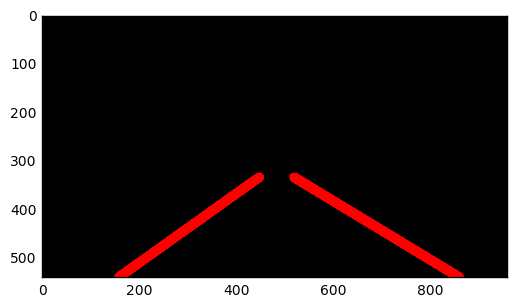

In [12]:
yellow_output = 'yellow.mp4'
clip2 = VideoFileClip('solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

In [13]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Reflections

Congratulations on finding the lane lines!  As the final step in this project, we would like you to share your thoughts on your lane finding pipeline... specifically, how could you imagine making your algorithm better / more robust?  Where will your current algorithm be likely to fail?

Please add your thoughts below,  and if you're up for making your pipeline more robust, be sure to scroll down and check out the optional challenge video below!


## Submission

If you're satisfied with your video outputs it's time to submit!  Submit this ipython notebook for review.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

(720, 1280)


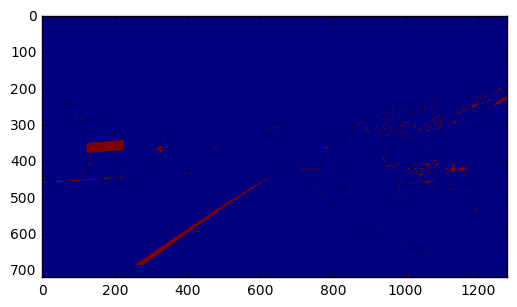

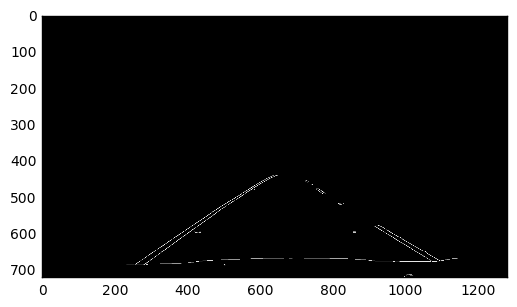

[0.60054347826087, 21.407608695651824]
[-0.7247386759581882, 889.2752613240419]
[-0.6718146718146718, 855.9691119691119]
[0.6246056782334389, 8.047318611987146]
[-0.6585365853658538, 851.0975609756099]
[-0.7225806451612888, 889.2645161290311]
[-0.7523809523809515, 913.4761904761898]
[0.5999999999999995, 19.200000000000525]
[-0.717948717948718, 889.3589743589745]
[0.6016483516483521, 21.40659340659303]
[-0.8390804597701159, 959.0574712643682]
[-0.7250755287009064, 897.8972809667674]
[-0.7253731343283588, 900.8865671641796]
[0.6078431372548995, 12.176470588237763]
[-0.6874999999999777, 865.7499999999877]
[-0.7771739130434786, 925.7445652173916]
[0.6481481481481475, -11.333333333332634]
[-0.8675799086758003, 965.8310502283114]
[0.647398843930636, -17.011560693641783]
[-0.6875000000000023, 864.437500000001]
[0.8367346938775457, -222.4897959183618]
[-0.8372093023255819, 956.7674418604652]
[0.6046511627907006, 16.441860465113148]
[0.7795275590551188, -134.48818897637886]
[0.6249999999999951,

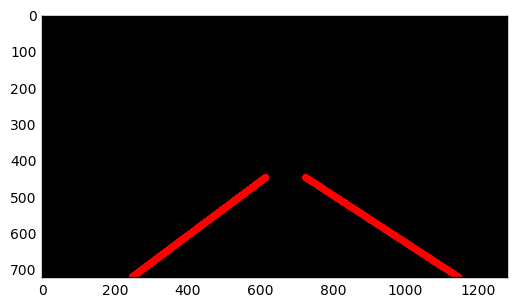

(720, 1280, 3) (720, 1280, 3)
[MoviePy] >>>> Building video extra.mp4
[MoviePy] Writing video extra.mp4


  0%|          | 0/251 [00:00<?, ?it/s]

(720, 1280)


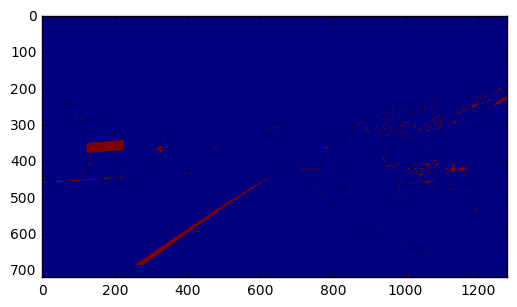

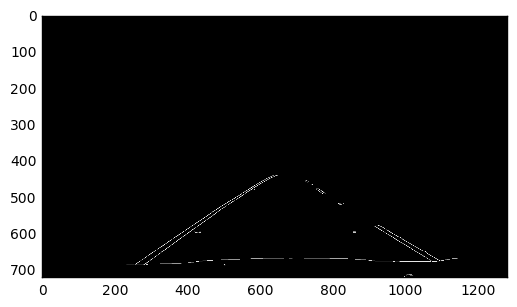

[0.60054347826087, 21.407608695651824]
[-0.7247386759581882, 889.2752613240419]
[-0.6718146718146718, 855.9691119691119]
[0.6246056782334389, 8.047318611987146]
[-0.6585365853658538, 851.0975609756099]
[-0.7225806451612888, 889.2645161290311]
[-0.7523809523809515, 913.4761904761898]
[0.5999999999999995, 19.200000000000525]
[-0.717948717948718, 889.3589743589745]
[0.6016483516483521, 21.40659340659303]
[-0.8390804597701159, 959.0574712643682]
[-0.7250755287009064, 897.8972809667674]
[-0.7253731343283588, 900.8865671641796]
[0.6078431372548995, 12.176470588237763]
[-0.6874999999999777, 865.7499999999877]
[-0.7771739130434786, 925.7445652173916]
[0.6481481481481475, -11.333333333332634]
[-0.8675799086758003, 965.8310502283114]
[0.647398843930636, -17.011560693641783]
[-0.6875000000000023, 864.437500000001]
[0.8367346938775457, -222.4897959183618]
[-0.8372093023255819, 956.7674418604652]
[0.6046511627907006, 16.441860465113148]
[0.7795275590551188, -134.48818897637886]
[0.6249999999999951,

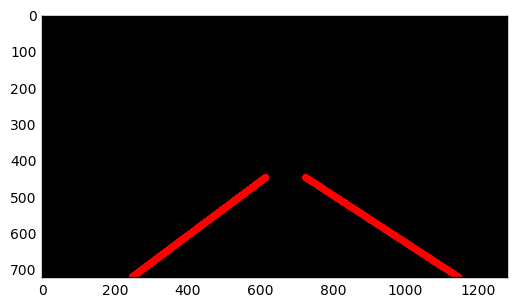

  0%|          | 1/251 [00:00<03:30,  1.19it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


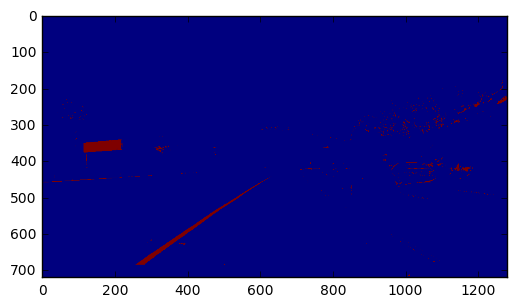

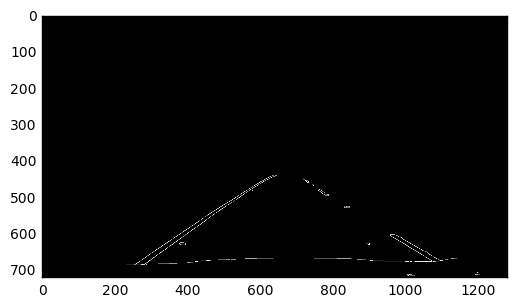

[-0.6473829201101932, 846.550964187328]
[-0.7256944444444453, 889.5486111111117]
[-0.6463414634146337, 842.4146341463411]
[-0.6004901960784305, 825.3137254901956]
[-0.6051282051282054, 824.8615384615388]
[0.6495726495726493, -16.7435897435895]
[0.5526315789473679, 68.86842105263216]
[0.6725663716814149, -40.62831858406956]
[-0.6666666666666657, 855.3333333333327]
[0.6495726495726486, -19.991452991451936]
[-0.6476964769647692, 847.9241192411922]
[0.6498054474708168, -15.910505836575574]
[-0.5617977528089892, 802.4157303370791]
[0.6993670886075954, -49.6424050632917]
[0.7192982456140325, -88.96491228069917]
[-0.7000000000000006, 885.6000000000006]
[0.6952380952380935, -66.51428571428369]
[-0.7546296296296309, 896.8055555555562]
[-0.838596491228071, 967.2842105263163]
[0.7278688524590163, -71.24918032786914]
[-0.809364548494984, 952.5183946488297]
[-0.8075471698113204, 937.5698113207544]
[-0.5818181818181812, 819.4909090909088]
[-0.6743515850144101, 869.0979827089342]
[0.6495726495726502,

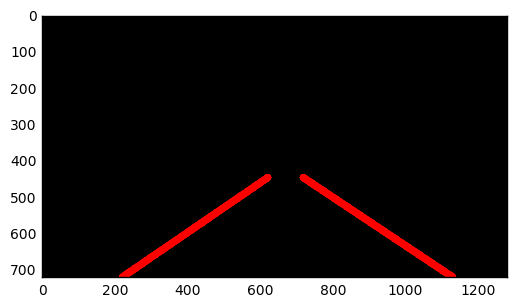

  1%|          | 2/251 [00:01<03:31,  1.18it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


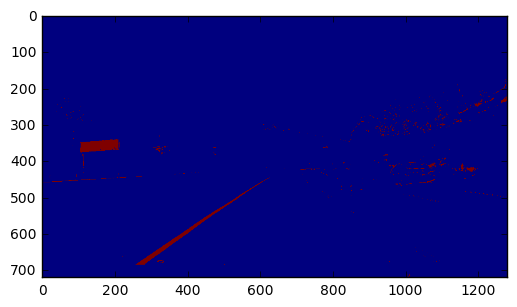

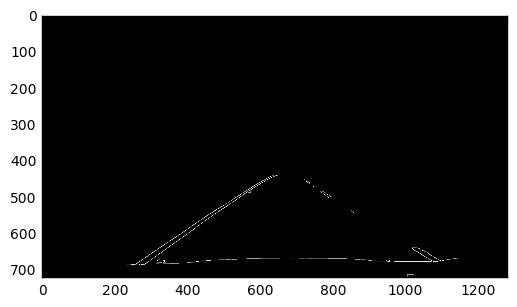

[-0.7230769230769228, 889.2769230769233]
[-0.6724890829694323, 856.1572052401748]
[-0.5519999999999995, 795.4879999999995]
[0.5548780487804879, 63.079268292682734]
[0.6005509641873272, 22.000000000000618]
[-0.7439024390243913, 902.8780487804886]
[0.6245614035087724, 7.210526315788781]
[-0.7513513513513495, 898.4432432432421]
[0.6005291005291001, 18.021164021164342]
[-0.7500000000000006, 895.5000000000003]
[-0.8967136150234728, 979.9154929577452]
[-0.8975903614457816, 964.0481927710836]
[0.6017699115044247, 29.699115044247925]
[-0.7196261682242985, 889.0560747663549]
[-0.6689189189189196, 856.1891891891895]
[-0.8095238095238096, 948.7142857142857]
[-0.8348623853211002, 925.3302752293573]
[0.5999999999999996, 17.800000000000296]
[0.6742424242424231, -32.78030303030167]
[-0.673684210526317, 866.4210526315796]
[-0.8347107438016533, 922.2396694214874]
middle 646
left [773, 726, 765, 716, 848, 722, 719] right [584, 485, 644, 594, 513, 498, 543, 478, 599, 528, 621, 434, 630, 416]
(7, 2)
17.86

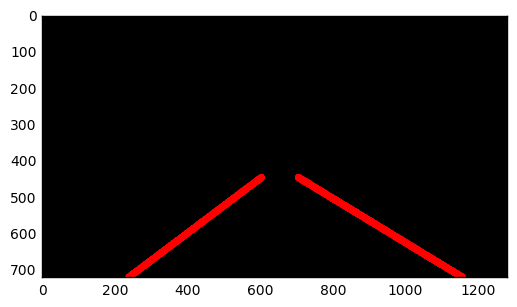

  1%|          | 3/251 [00:02<03:29,  1.18it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


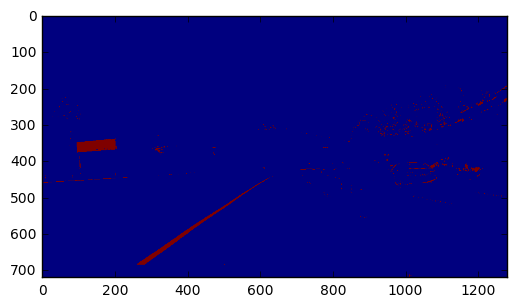

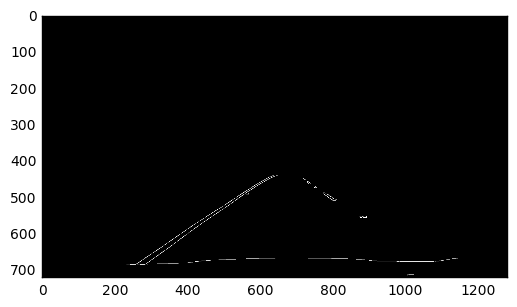

[-0.6994219653179193, 882.2369942196533]
[-0.6480938416422287, 845.7272727272725]
[-0.7008547008547014, 880.3247863247867]
[0.6477272727272728, -16.068181818181873]
[-0.720430107526881, 873.3118279569889]
[0.6016713091922002, 21.983286908078117]
[-0.7524752475247507, 885.405940594059]
[-0.6626506024096387, 854.6506024096385]
[0.8373983739837395, -157.04878048780438]
[-0.6036363636363636, 830.5527272727273]
[-0.7800687285223368, 925.8213058419248]
[0.5987654320987651, 23.697530864197844]
[-0.7073170731707309, 867.731707317073]
[-0.7941176470588246, 934.4705882352945]
[-0.8402777777777777, 972.8958333333334]
[-0.6239999999999996, 836.8639999999998]
[-0.6271186440677963, 852.8135593220338]
[-0.6997084548104954, 883.5160349854225]
middle 635
left [718, 728, 750, 727] right [628, 589, 614, 353, 366, 585, 601, 305, 600, 633, 384, 631]
(4, 2)
-31.8590361334 0.671390597
SLOPE
888.242204439 -0.719377899224
ave 711 446
SLOPE
ave 614 446
x2 1119 233


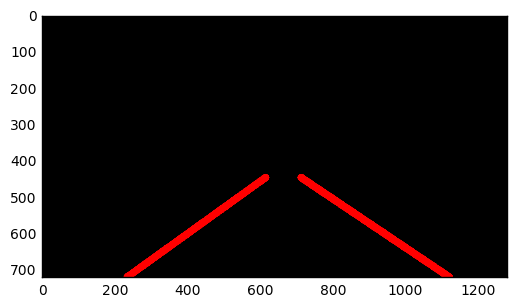

  2%|▏         | 4/251 [00:03<03:22,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


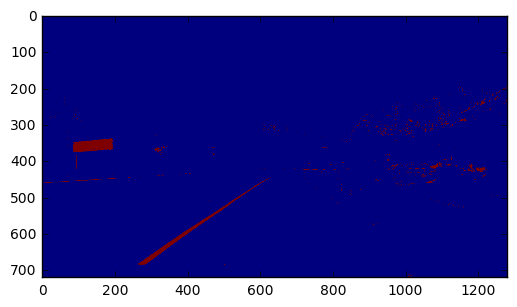

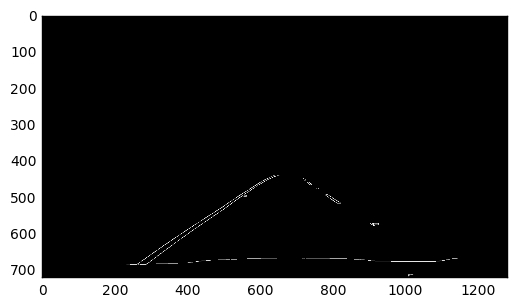

[-0.6979472140762466, 880.4252199413494]
[-0.6472222222222225, 847.4527777777779]
[0.6477272727272734, -15.420454545455401]
[0.6212121212121208, 12.075757575758123]
[-0.7179487179487178, 872.3846153846155]
[-0.699708454810495, 882.3177842565593]
[-0.6479750778816192, 846.345794392523]
[0.624277456647399, 5.901734104046473]
[-0.6991404011461321, 884.9541547277938]
[0.6755952380952384, -35.0773809523815]
[-0.6484149855907785, 847.1037463976947]
[-0.6988304093567237, 888.0584795321628]
[-0.7647058823529501, 889.1176470588266]
[0.808035714285714, -141.54017857142833]
[-0.6875000000000107, 879.5000000000034]
[0.6256983240223467, 5.614525139664457]
[-0.7230769230769248, 900.0307692307705]
[-0.7260273972602744, 900.2191780821919]
[0.5760233918128651, 44.25438596491264]
middle 645
left [717, 779, 729, 718, 789, 731, 753] right [621, 611, 339, 625, 570, 635, 597, 634, 348, 328, 621, 627]
(7, 2)
-17.741658755 0.654081359829
SLOPE
876.492513899 -0.69654147381
ave 708 446
SLOPE
ave 618 446
x2 1127

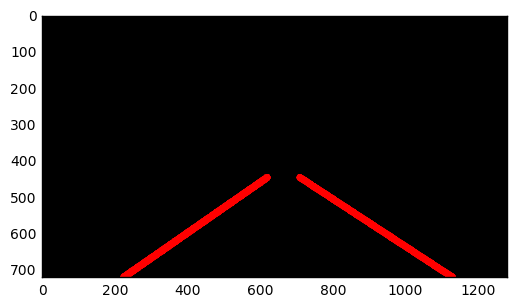

  2%|▏         | 5/251 [00:04<03:17,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


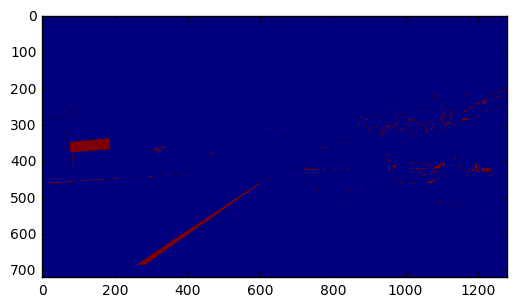

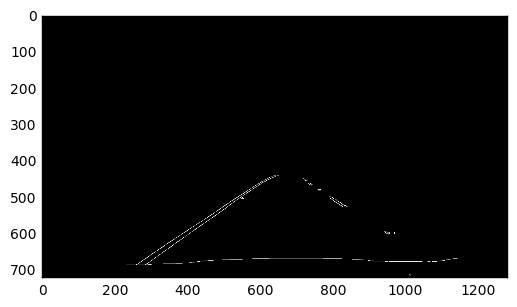

[-0.7005813953488377, 883.5639534883721]
[-0.6724738675958184, 860.1707317073166]
[0.6495726495726492, -16.393162393161955]
[-0.6988304093567254, 881.672514619883]
[-0.668874172185431, 857.9006622516558]
[0.6006825938566555, 27.662116040955333]
[0.624309392265193, 0.24861878453051353]
[-0.6737160120845923, 862.5135951661632]
[0.6480938416422286, -12.57184750733114]
[0.6735537190082642, -37.64049586776855]
[-0.7000000000000008, 888.0000000000007]
[-0.6153846153846037, 858.7692307692271]
[-0.8992248062015498, 1003.1240310077513]
[-0.6315789473684233, 864.3684210526321]
[0.5999999999999998, 27.200000000000472]
[-0.6956521739130404, 871.3043478260855]
middle 635
left [718, 788, 722, 723, 819, 788] right [626, 546, 622, 408, 593, 310, 614, 303, 459]
(6, 2)
-1.91579515713 0.632702032724
SLOPE
882.598609765 -0.695146266604
ave 707 446
SLOPE
ave 628 446
x2 1141 233


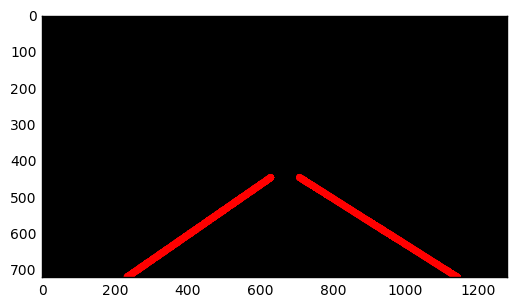

  2%|▏         | 6/251 [00:04<03:17,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


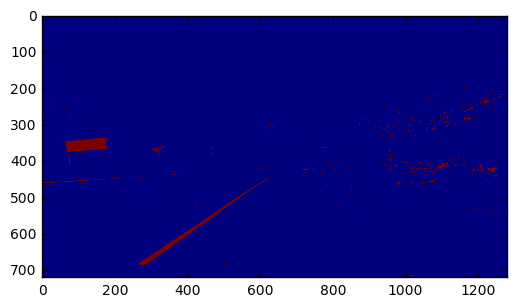

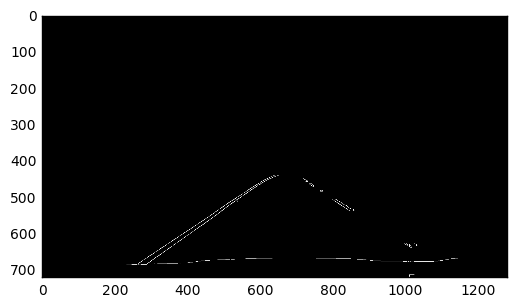

[-0.672955974842767, 860.641509433962]
[-0.7246376811594201, 893.68115942029]
[0.6727828746177371, -30.094801223241596]
[-0.8095238095238092, 942.8571428571427]
[0.6482558139534883, -17.281976744186082]
[-0.6731843575418995, 865.740223463687]
[0.5782493368700264, 35.7692307692309]
[-0.753378378378379, 910.0135135135139]
[-0.8679245283018872, 982.3018867924534]
[-0.7812500000000001, 921.4999999999998]
[-0.7257525083612039, 891.8394648829429]
[-0.7763975155279501, 908.5900621118016]
[0.6745562130177516, -35.331360946745534]
[-0.8050847457627122, 918.8220338983052]
[0.6709956709956705, -36.93939393939343]
[-0.7530864197530858, 921.2222222222215]
[-0.7746478873239458, 925.9859154929592]
[0.8360655737704956, -208.39344262295467]
[-0.6505376344086017, 857.7419354838706]
[0.6258992805755389, 4.5899280575542925]
[-0.624020887728459, 840.381201044386]
[0.7560975609756105, -101.39024390243983]
[-0.7482517482517481, 893.0139860139856]
[-0.6511627906976738, 865.3720930232554]
[-0.7546583850931666,

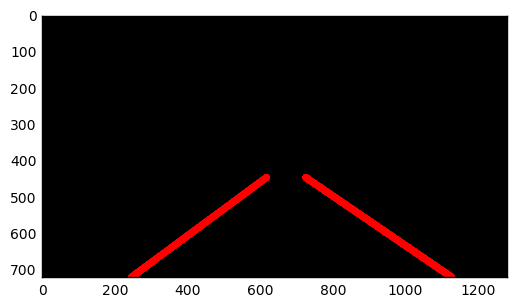

  3%|▎         | 7/251 [00:05<03:13,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


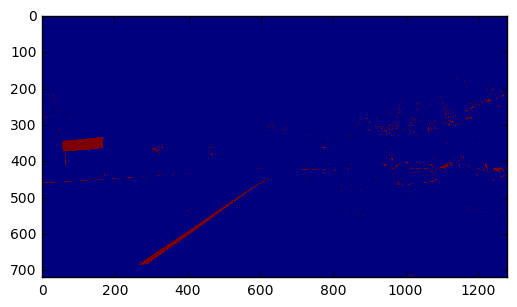

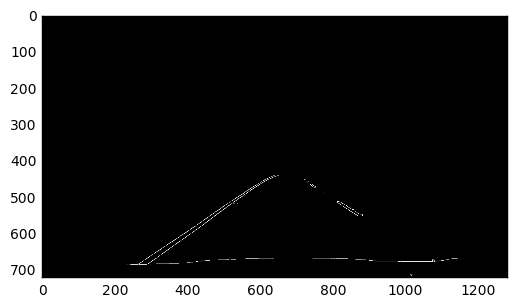

[-0.6737804878048782, 862.2042682926831]
[-0.723577235772357, 895.4471544715445]
[0.7006172839506178, -54.444444444444734]
[-0.7241379310344834, 894.4482758620696]
[0.6480938416422286, -17.75659824046865]
[0.6956521739130442, -51.82608695652203]
[-0.7551020408163286, 917.693877551022]
[-0.807999999999999, 918.744]
[-0.7553191489361694, 916.0531914893608]
[-0.7523219814241497, 919.476780185759]
[-0.6956521739130437, 872.4782608695657]
[-0.8064516129032276, 912.4193548387103]
[-0.8100000000000005, 958.4000000000002]
[-0.8090909090909094, 916.3999999999995]
[-0.8374558303886929, 969.409893992933]
[0.5555555555555545, 59.666666666667616]
middle 647
left [720, 731, 730, 771] right [591, 617, 611, 626, 418, 621, 636, 534, 375, 640, 396, 625]
(4, 2)
-16.0901157437 0.649979713765
SLOPE
912.764588129 -0.762574112674
ave 710 446
SLOPE
ave 612 446
x2 1132 252


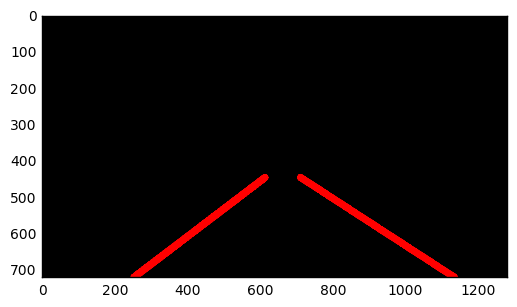

  3%|▎         | 8/251 [00:06<03:10,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


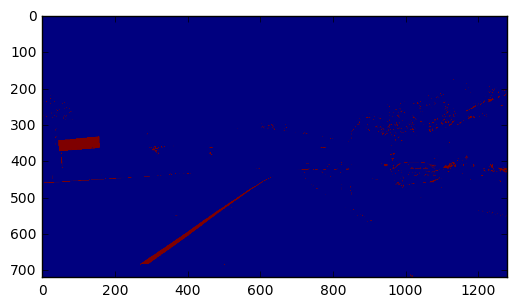

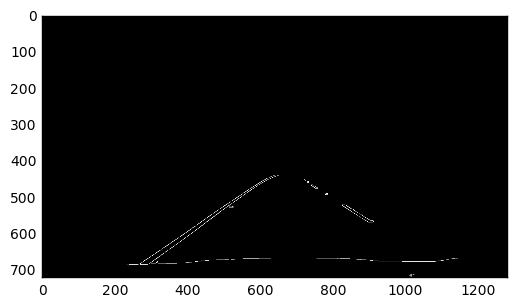

[-0.7508417508417498, 907.7508417508412]
[-0.6987951807228912, 873.6746987951806]
[0.6477611940298516, -11.570149253732076]
[0.6022099447513812, 20.591160220994436]
[-0.5591397849462366, 798.9354838709677]
[-0.752442996742671, 911.7426710097718]
[-0.8108108108108107, 939.4054054054053]
[-0.696078431372549, 871.0784313725487]
[-0.7772020725388603, 913.4870466321238]
[0.6475644699140404, -15.246418338109315]
[-0.7520325203252037, 902.8414634146346]
[-0.8987854251012145, 996.5748987854253]
[0.5590062111801242, 56.30434782608683]
[-0.7548387096774187, 913.9806451612899]
[-0.6782178217821779, 880.9950495049503]
[-0.7523510971786825, 918.7429467084636]
[0.8095238095238095, -144.6666666666662]
[-0.5528455284552838, 830.50406504065]
[-0.5833333333333347, 809.7500000000008]
[0.6026200873362443, 27.978165938864585]
[-0.6153846153846291, 863.3076923076968]
middle 651
left [728, 728, 720, 749, 784, 848] right [595, 519, 633, 611, 574, 490, 505, 537, 597, 616, 519, 635, 388, 627, 306]
(6, 2)
-11.10

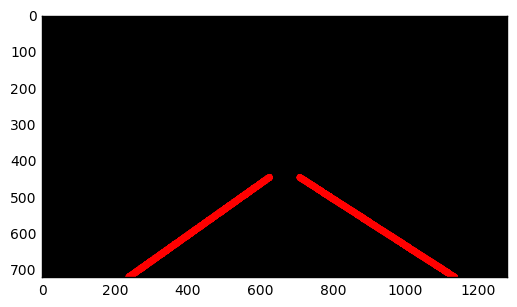

  4%|▎         | 9/251 [00:07<03:15,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


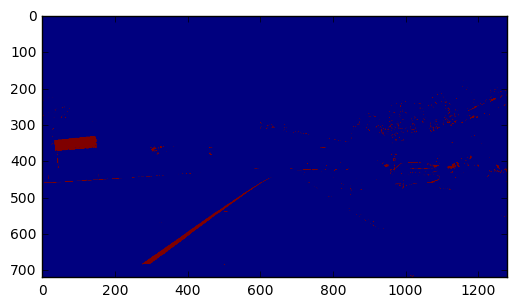

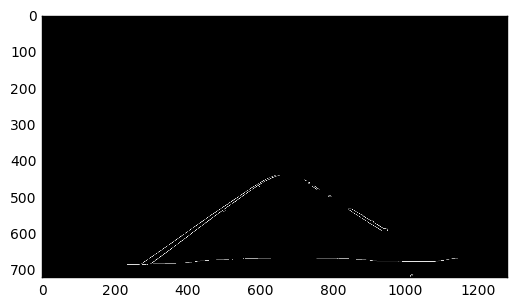

[-0.7508650519031133, 907.76124567474]
[0.6253968253968246, 7.825396825397528]
[-0.6968503937007866, 873.5433070866138]
[-0.7518796992481201, 905.0526315789472]
[-0.7476635514018694, 908.0841121495328]
[0.5750708215297451, 43.722379603399524]
[0.5772594752186588, 43.47813411078743]
[-0.8991935483870953, 999.4153225806446]
[-0.8388278388278378, 964.6849816849812]
[0.6011235955056177, 31.393258426966575]
[-0.8000000000000018, 933.2000000000007]
[0.5768194070080865, 38.92183288409679]
[-0.7521739130434771, 902.3782608695647]
[-0.7807017543859662, 929.5701754385974]
[-0.842105263157895, 962.894736842105]
[-0.7407407407407389, 897.9259259259252]
[0.5789473684210523, 35.99999999999993]
[0.6242774566473986, 5.277456647399078]
[0.5544303797468357, 52.25569620253154]
[-0.7777777777777771, 934.5555555555547]
[-0.5816326530612247, 819.2244897959185]
[0.7275132275132278, -19.970899470899997]
[-0.6763285024154594, 884.5748792270533]
[0.5549450549450554, 59.23076923076877]
middle 661
left [755, 743,

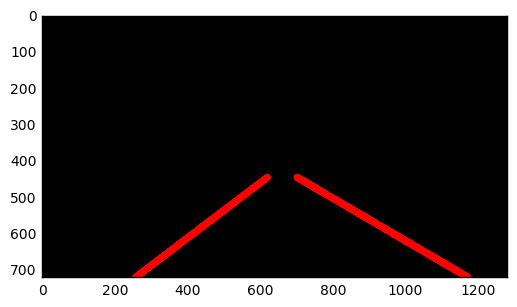

  4%|▍         | 10/251 [00:08<03:13,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


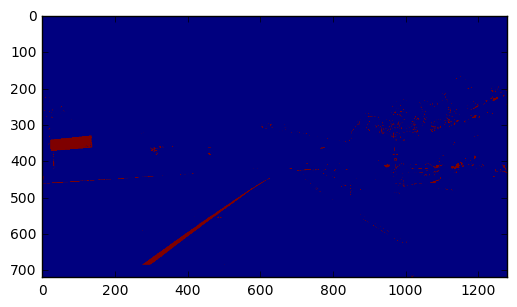

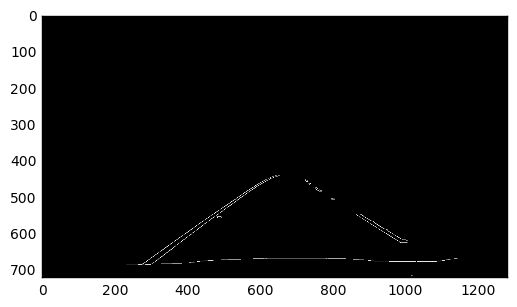

[-0.6996699669967004, 877.4092409240925]
[-0.7516778523489928, 910.2550335570465]
[0.6005434782608694, 20.80706521739103]
[0.6245954692556639, 9.307443365695368]
[-0.648, 853.184]
[-0.6734104046242769, 864.8005780346817]
[-0.7534246575342459, 910.0273972602737]
[0.6229050279329609, 0.7709497206706561]
[0.6482412060301518, -20.50753768844337]
[-0.8359999999999995, 956.3719999999994]
[0.6246334310850445, 6.768328445746945]
[0.6231884057971014, 5.826086956521379]
[-0.7499999999999998, 899.4999999999998]
[-0.8620689655172404, 936.7241379310345]
[0.8109090909090906, -132.28727272727272]
[-0.7500000000000101, 900.500000000005]
[-0.62402088772846, 842.6292428198434]
[-0.755555555555556, 919.7333333333336]
[0.86864406779661, -179.48305084745732]
[-0.8333333333333023, 922.1666666666557]
[-0.8985507246376817, 946.4782608695655]
[-0.6227848101265817, 840.4506329113922]
[0.6225352112676065, 5.284507042252323]
[0.6929824561403503, -58.97368421052571]
[-0.722222222222222, 888.1111111111111]
[-0.7801

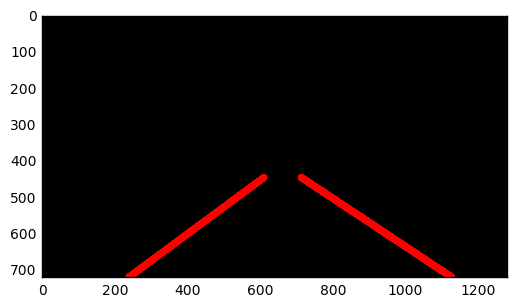

  4%|▍         | 11/251 [00:08<03:09,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


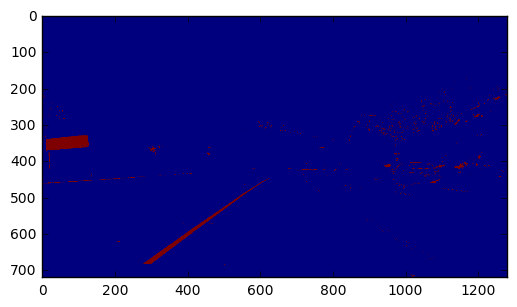

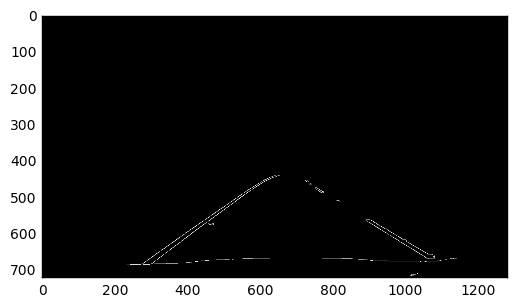

[-0.6979865771812078, 875.2483221476506]
[-0.7253086419753092, 896.7901234567908]
[-0.6999999999999995, 875.4999999999999]
[0.6488095238095232, -15.630952380951776]
[0.6499999999999996, -14.949999999999525]
[0.620689655172414, 1.5517241379304245]
[-0.7275641025641026, 900.7275641025643]
[0.6210526315789445, -1.9473684210494888]
[0.6745562130177508, -45.77514792899316]
[0.6501547987616096, -11.863777089783284]
[0.7250000000000009, -107.72500000000079]
[-0.7799352750809059, 938.0388349514564]
[0.756410256410256, -138.6538461538452]
[-0.6730769230769235, 878.1730769230775]
[-0.8679245283018872, 982.3018867924534]
[-0.7247706422018343, 901.7798165137614]
[0.6962025316455694, -66.84810126582303]
[-0.6923076923076903, 872.692307692306]
[-0.698550724637681, 892.5652173913044]
[0.6741573033707868, -53.438202247191306]
[-0.8382352941176482, 962.9705882352952]
[-0.6991404011461317, 887.7507163323781]
[-0.5512820512820523, 1276.5512820512836]
[-0.675324675324675, 876.5584415584414]
[0.72638436482

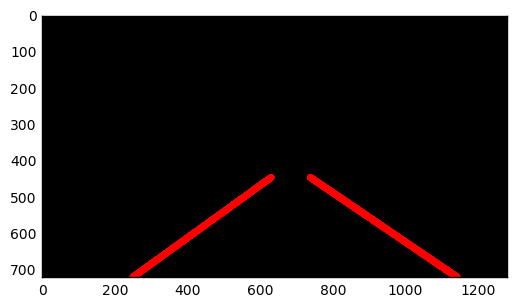

  5%|▍         | 12/251 [00:09<03:09,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


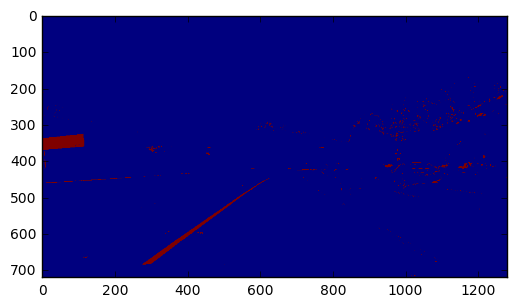

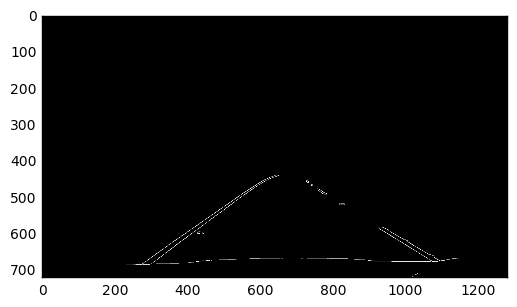

[-0.6986301369863017, 875.027397260274]
[-0.753378378378379, 909.260135135135]
[0.6010928961748623, 19.207650273225074]
[-0.7460317460317445, 907.8253968253958]
[0.6238805970149259, 7.576119402984501]
[-0.781456953642385, 932.2847682119208]
[0.6242603550295851, 6.295857988166614]
[-0.7777777777777779, 921.8888888888888]
[0.6737160120845923, -35.1178247734139]
[-0.7555555555555541, 914.1555555555547]
[0.624999999999999, 8.37500000000085]
[0.5999999999999993, 23.200000000000596]
[-0.7817589576547227, 937.0716612377846]
[-0.808290155440415, 951.79792746114]
[0.7263157894736847, -23.115789473684647]
[-0.8100775193798446, 939.7945736434107]
[0.6489675516224179, -14.799410029497652]
[0.627659574468088, -8.776595744684085]
[-0.6992753623188396, 874.5036231884052]
[-0.779935275080907, 937.2588996763757]
[0.5542857142857138, 61.514285714285926]
[-0.6764705882352906, 1405.6470588235259]
[0.6246498599439777, -0.7450980392159066]
[-0.8645833333333331, 960.5312499999997]
[0.6016483516483515, 20.203

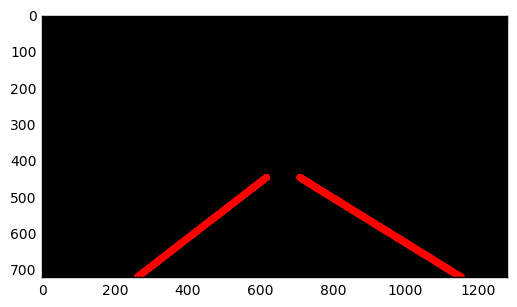

  5%|▌         | 13/251 [00:10<03:16,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


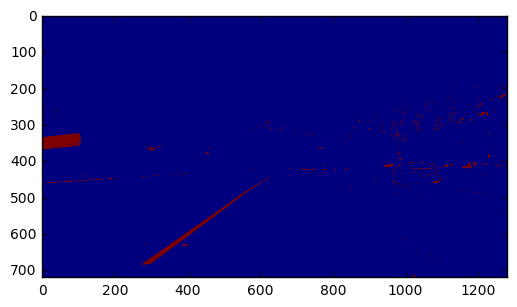

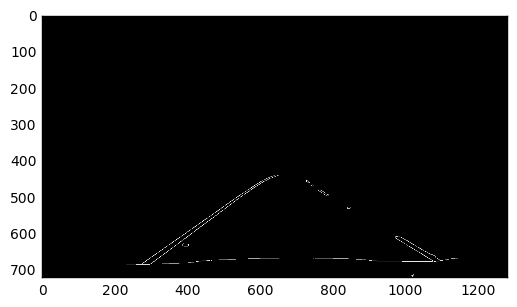

[-0.6724637681159417, 861.8579710144925]
[-0.7264437689969602, 897.8480243161092]
[-0.7259036144578316, 899.1415662650603]
[0.5799999999999985, 50.60000000000156]
[-0.6481481481481481, 853.5185185185187]
[0.5758426966292132, 42.87640449438222]
[-0.6767676767676778, 862.6464646464652]
[-0.7499999999999984, 889.7499999999995]
[0.648093841642228, -14.516129032257414]
[-0.6514084507042257, 856.9014084507041]
[-0.8124999999999943, 910.8749999999981]
[-0.576208178438662, 821.408921933086]
[-0.7240356083086056, 908.4510385756677]
[0.5552325581395344, 60.578488372093226]
[-0.8727272727272722, 932.8545454545455]
[-0.7811447811447803, 928.4983164983163]
[-0.6993464052287578, 883.5882352941175]
[-0.5660377358490506, 807.4528301886761]
[-0.8988326848249026, 1001.9844357976647]
[-0.6243902439024381, 841.7365853658531]
[0.5769230769230764, 39.500000000000355]
[0.5892857142857146, 41.92857142857113]
[0.756097560975609, -92.68292682926773]
[-0.6268656716417907, 849.1492537313428]
middle 682
left [980,

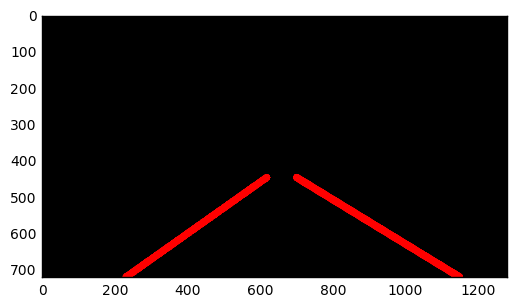

  6%|▌         | 14/251 [00:11<03:11,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


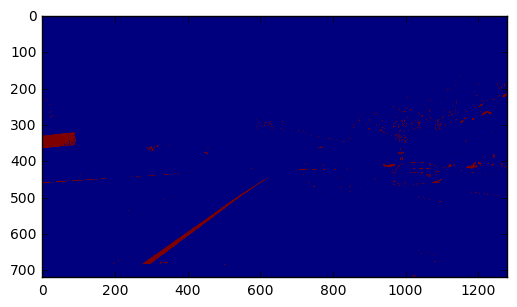

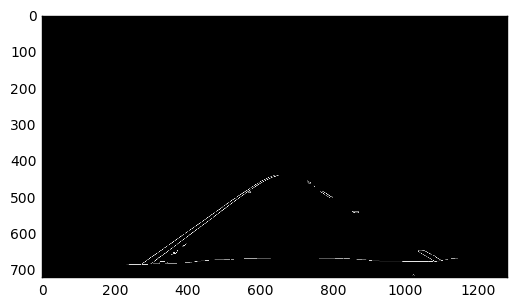

[-0.6973684210526305, 873.2894736842101]
[-0.7524752475247528, 908.2376237623763]
[0.5767045454545447, 41.931818181819004]
[0.6249999999999999, 1.9999999999997748]
[-0.8677042801556419, 975.5486381322953]
[0.60062893081761, 26.518867924528756]
[-0.8693877551020419, 972.6367346938785]
[-0.8075601374570448, 945.6494845360826]
[0.6666666666666788, -39.66666666667978]
[-0.810909090909091, 944.6]
[0.5562913907284769, 61.317880794702134]
[-0.7803278688524592, 931.9245901639341]
[-0.6993670886075946, 875.2278481012659]
[0.5767195767195767, 34.571428571428676]
[0.6538461538461534, -17.9999999999993]
[0.6010928961748632, 17.404371584699543]
[-0.89473684210527, 996.1052631578988]
[-0.8398576512455521, 966.8718861209967]
[-0.7782258064516122, 923.4717741935474]
[-0.8682926829268309, 961.7219512195131]
[-0.6206896551724166, 877.2758620689664]
[-0.7419354838709687, 904.3225806451619]
[-0.7000000000000006, 884.7000000000007]
[-0.8659793814432996, 958.7113402061859]
middle 677
left [744, 728, 765, 10

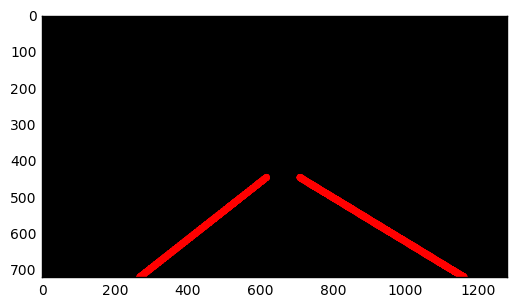

  6%|▌         | 15/251 [00:12<03:07,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


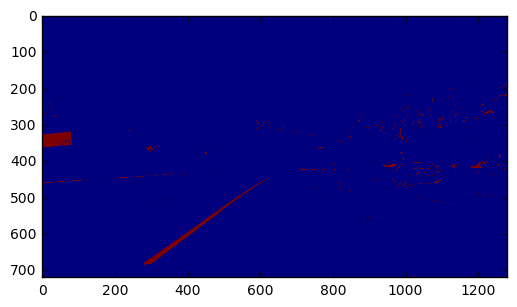

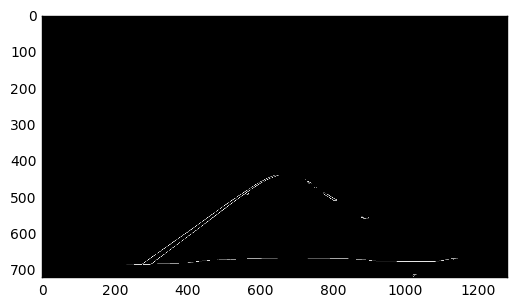

[-0.7203389830508475, 882.5338983050847]
[-0.7516556291390727, 907.4900662251653]
[-0.7254901960784322, 886.6862745098043]
[-0.751633986928105, 909.4901960784318]
[0.577181208053691, 40.84563758389287]
[0.577656675749319, 39.1553133514983]
[-0.7810457516339866, 934.4967320261436]
[0.803571428571425, -132.01785714285424]
[-0.7792642140468232, 927.1304347826083]
[-0.8037383177570085, 915.672897196261]
[-0.7228915662650606, 882.7951807228916]
[-0.5810810810810839, 808.3378378378395]
[-0.5970149253731334, 1325.7462686567148]
[0.5774278215223099, 35.51968503937008]
[-0.7380952380952357, 890.3095238095226]
[-0.600000000000001, 821.6000000000008]
[-0.7247706422018347, 895.1834862385323]
[-0.701149425287356, 887.6321839080454]
middle 656
left [747, 732, 733, 723] right [395, 598, 533, 606, 628, 611, 394, 358, 627, 415, 601, 617, 637]
(4, 2)
-4.12430529202 0.633959283474
SLOPE
888.412208588 -0.72162731012
ave 710 446
SLOPE
ave 613 446
x2 1142 233


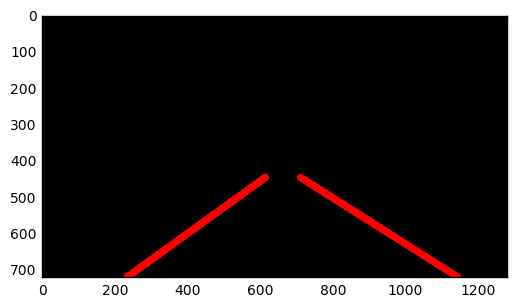

  6%|▋         | 16/251 [00:12<03:05,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


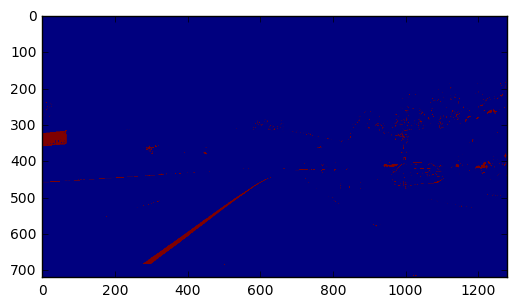

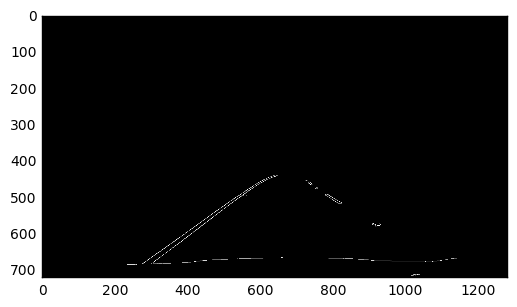

[-0.6996805111821093, 874.3130990415342]
[-0.6237113402061855, 835.9381443298968]
[-0.7524752475247528, 908.2376237623763]
[0.626315789473685, 1.1631578947358585]
[-0.6996904024767809, 875.7151702786382]
[0.6666666666666671, -24.666666666667172]
[-0.555555555555555, 799.4444444444442]
[0.7551020408163265, -95.71428571428564]
[-0.7333333333333313, 890.1333333333322]
[0.6243386243386234, 4.608465608466369]
[-0.5795454545454556, 816.2272727272732]
[0.6479289940828399, -17.579881656804517]
[-0.7267267267267263, 901.7447447447444]
[-0.7142857142857054, 883.571428571423]
[-0.5779816513761478, 818.3577981651382]
[-0.8083832335329323, 930.4850299401188]
[-0.6227390180878553, 834.4573643410854]
[-0.838565022421524, 947.825112107623]
middle 661
left [731, 751, 728, 731, 734] right [585, 630, 601, 597, 647, 532, 556, 634, 593, 556, 535, 627, 540]
(5, 2)
-26.4378421069 0.664070423076
SLOPE
870.496197368 -0.687128708558
ave 711 446
SLOPE
ave 617 446
x2 1124 219


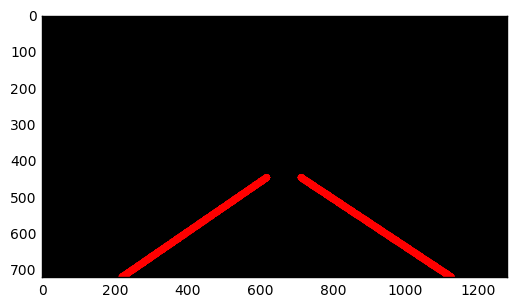

  7%|▋         | 17/251 [00:13<03:05,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


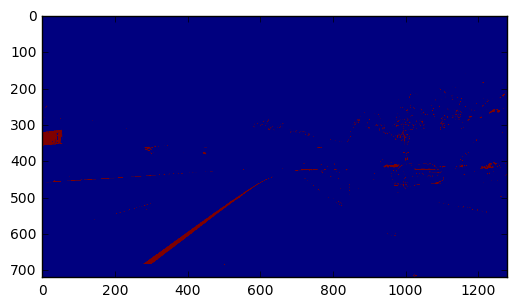

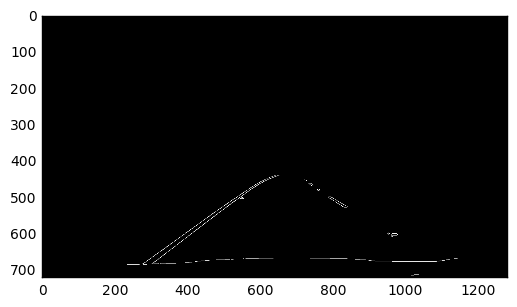

[-0.7516778523489936, 907.2483221476514]
[-0.7202797202797202, 882.076923076923]
[-0.7264437689969611, 900.480243161094]
[-0.6475409836065578, 848.8278688524589]
[0.649122807017544, -16.263157894736928]
[-0.5555555555555555, 798.5555555555555]
[-0.7244897959183667, 888.5816326530611]
[-0.725490196078431, 896.5686274509801]
[-0.6730769230769235, 878.1730769230775]
[-0.7631578947368359, 901.4210526315758]
[-0.7259036144578309, 901.0451807228911]
[-0.5792682926829259, 814.6280487804871]
[-0.8091603053435109, 937.8854961832053]
[-0.7005988023952098, 879.7664670658683]
[0.6234817813765183, 0.8461538461538993]
[0.5559440559440563, 66.24125874125818]
[0.6718749999999996, -35.18749999999975]
[-0.8403361344537795, 931.8991596638645]
[0.6486486486486487, -14.459459459459435]
[-0.6874999999999918, 881.1249999999965]
[0.6438356164383554, -6.739726027396467]
[0.7254237288135602, -68.01016949152621]
[-0.8317757009345804, 926.8785046728977]
[-0.806451612903227, 942.7096774193553]
[0.6008064516129029,

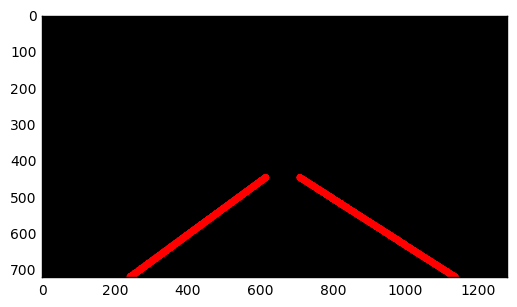

  7%|▋         | 18/251 [00:14<03:05,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


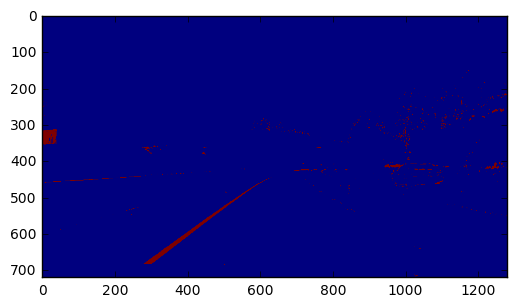

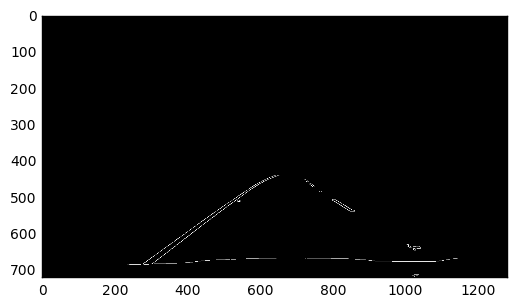

[-0.7533333333333344, 909.246666666667]
[-0.7229437229437224, 884.2554112554113]
[0.6485714285714284, -16.97142857142855]
[-0.5772357723577229, 809.4308943089426]
[-0.5777777777777755, 807.4222222222206]
[0.6228070175438597, 6.2368421052633325]
[0.5543071161048696, 69.1423220973775]
[0.5778546712802771, 48.44982698961902]
[-0.7525423728813548, 906.7525423728806]
[-0.6274509803921572, 868.2156862745104]
[0.6484149855907773, -17.452449567722525]
[-0.7242647058823514, 887.0698529411759]
[0.5771276595744675, 38.00531914893681]
[0.6012461059190024, 26.45171339563887]
[0.5566666666666662, 64.33666666666731]
[-0.752475247524752, 909.7425742574254]
[-0.7257525083612038, 889.6622073578593]
[-0.7457627118644072, 890.5593220338983]
[-0.7243816254416962, 887.8268551236747]
[-0.7824074074074062, 914.8101851851845]
[-0.8870967741935497, 940.4838709677424]
[-0.8058252427184464, 915.4660194174755]
[0.5543478260869563, 58.782608695652456]
middle 636
left [720, 735, 826, 797, 724, 726, 761, 797, 740] ri

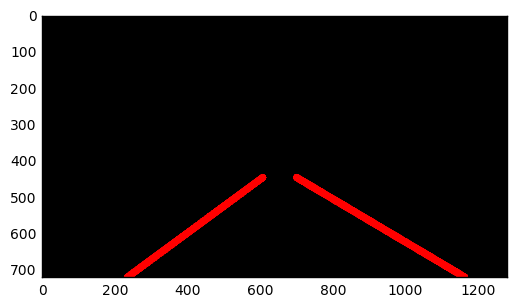

  8%|▊         | 19/251 [00:15<03:02,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


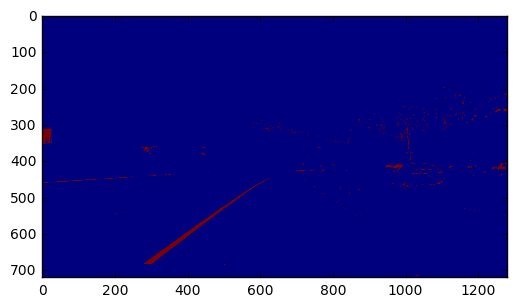

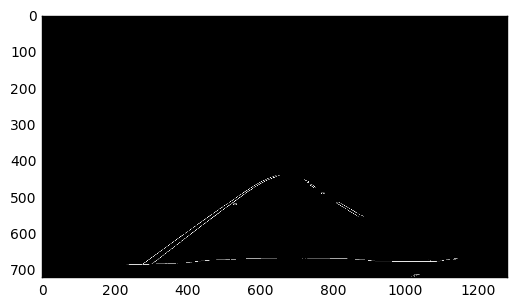

[-0.7508305647840534, 908.4983388704322]
[-0.7261904761904766, 884.7023809523808]
[0.6502890173410403, -16.858381502890214]
[0.6510903426791281, -11.853582554517539]
[-0.7534246575342453, 900.4794520547932]
[-0.7516556291390731, 910.503311258278]
[0.6492307692307695, -12.483076923076936]
[-0.7797356828193824, 915.5814977973561]
[-0.7499999999999992, 897.2499999999997]
[0.6725663716814161, -36.59292035398255]
[0.6498516320474772, -15.741839762610537]
[-0.8675799086757995, 964.9634703196346]
[0.6490683229813664, -11.012422360248449]
[-0.8373205741626789, 946.0813397129186]
[-0.8644067796610173, 962.6440677966102]
[-0.6763485477178429, 877.539419087137]
[-0.8395061728395049, 965.098765432098]
[-0.7541528239202653, 910.9999999999995]
[-0.7256097560975606, 907.4878048780487]
[0.6489675516224186, -18.150442477875643]
[0.6732026143790852, -28.5163398692809]
[0.6500000000000007, 251.99999999999937]
[-0.7441860465116257, 893.0930232558129]
[-0.62962962962963, 836.8148148148149]
[0.6250000000000

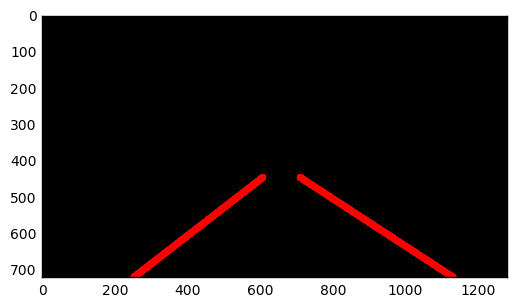

  8%|▊         | 20/251 [00:16<03:05,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


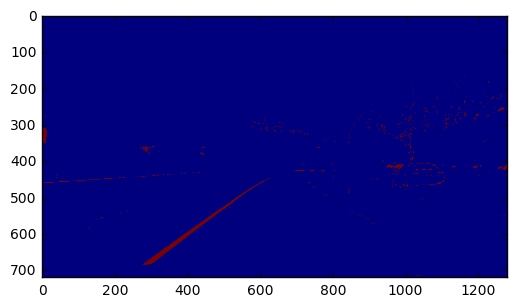

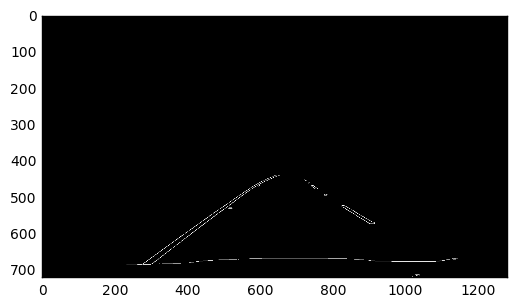

[-0.7236180904522613, 883.9949748743715]
[-0.7533333333333333, 909.4933333333335]
[0.599423631123919, 24.426512968300237]
[-0.750819672131147, 909.4950819672127]
[-0.7526501766784446, 904.7738515901054]
[-0.7254098360655737, 886.66393442623]
[0.5763358778625955, 50.67557251908394]
[0.5833333333333345, 46.83333333333248]
[-0.7782426778242674, 915.3598326359831]
[0.6011730205278587, 25.53079178885719]
[0.5548098434004474, 146.65548098433985]
[0.8711864406779641, -181.32203389830315]
[-0.8091286307053942, 934.0207468879663]
[0.6483516483516475, -16.351648351647814]
[0.5769230769230766, 47.15384615384654]
[-0.7435897435897371, 889.2307692307675]
[0.5541795665634675, 65.5108359133126]
[-0.8672985781990533, 963.1374407582942]
[0.5772357723577242, 39.61788617886128]
[0.5770114942528737, 127.8712643678156]
[0.8333333333333346, -168.66666666666777]
[-0.8394160583941597, 946.7372262773719]
[-0.7796610169491519, 929.5932203389829]
middle 632
left [740, 823, 842, 741, 735, 727, 778, 775, 730, 830]

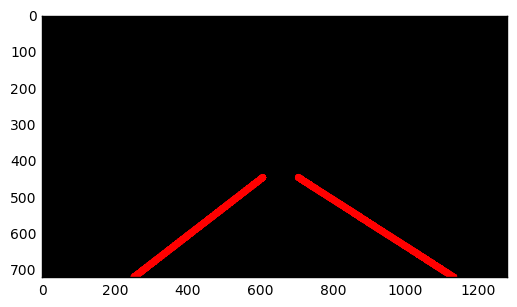

  8%|▊         | 21/251 [00:16<03:01,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


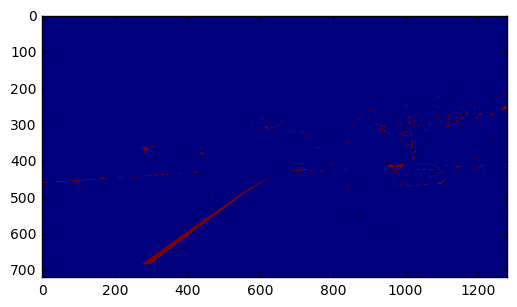

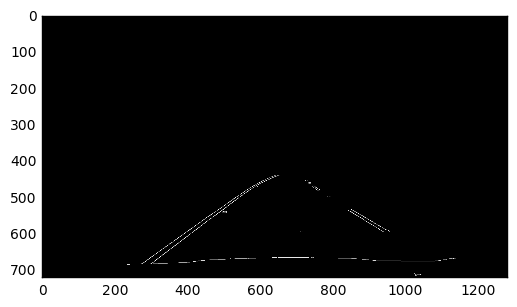

[-0.6993464052287576, 873.9215686274506]
[-0.7533783783783788, 908.2601351351352]
[0.6466876971608833, -9.488958990536464]
[0.5771428571428574, 43.1828571428573]
[0.7009345794392524, -55.07476635514023]
[-0.6979166666666669, 871.0416666666667]
[-0.7534246575342469, 907.5205479452055]
[-0.7006802721088446, 894.7414965986403]
[0.6504854368932039, -14.15533980582542]
[0.5541401273885348, 65.10828025477731]
[0.7521008403361331, -97.15966386554493]
[-0.697594501718213, 871.6529209621995]
[-0.7811447811447808, 931.9663299663298]
[-0.7435897435897437, 904.8717948717947]
[0.752100840336134, -95.65546218487366]
[0.7824561403508762, -111.93333333333254]
[0.8698630136986305, -181.08904109589105]
[0.6739130434782592, -38.15217391304185]
[-0.5514705882352928, 985.0955882352932]
middle 678
left [743, 743, 722, 732, 783, 790, 788, 722, 737, 849] right [579, 595, 460, 590, 649, 560, 617, 605]
(10, 2)
-49.4417602147 0.695982457622
SLOPE
895.497057597 -0.728384425796
ave 711 446
SLOPE
ave 617 446
x2 110

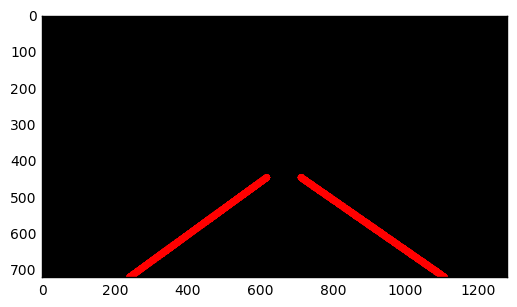

  9%|▉         | 22/251 [00:17<02:59,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


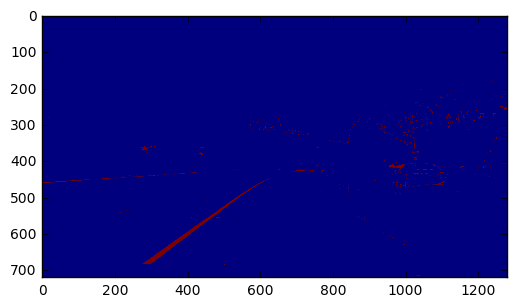

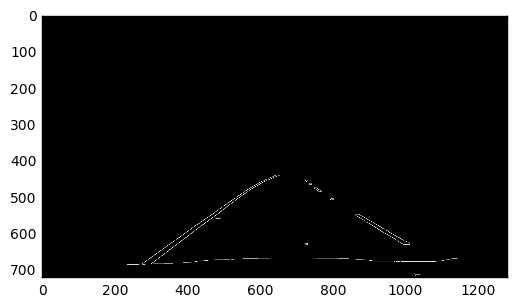

[-0.7516778523489928, 907.9999999999994]
[-0.6996699669967007, 874.3102310231028]
[0.601423487544484, 31.07117437722403]
[0.5540983606557377, 67.15409836065606]
[0.6491228070175441, -14.315789473684186]
[-0.752650176678445, 905.2791519434626]
[0.5517241379310343, 71.41379310344865]
[0.7499999999999997, -107.4999999999999]
[-0.7538940809968849, 922.7383177570092]
[0.6503267973856205, -9.745098039215456]
[-0.7534246575342465, 907.7671232876711]
[0.7247191011235946, -82.50561797752734]
[-0.5565217391304367, 797.2869565217405]
[-0.7647058823529534, 893.8235294117683]
[0.749999999999999, -108.49999999999864]
[0.6486486486486487, -8.891891891891623]
[-0.7789473684210515, 924.4736842105253]
[-0.7253731343283577, 906.414925373134]
[-0.8109090909090911, 944.1127272727269]
[0.6253687315634221, 5.979351032448006]
[-0.8109965635738827, 954.4948453608246]
[-0.6970802919708032, 871.5145985401463]
[0.7827586206896554, -112.80344827586234]
[-0.6977491961414798, 874.4855305466242]
[0.6235955056179774, 

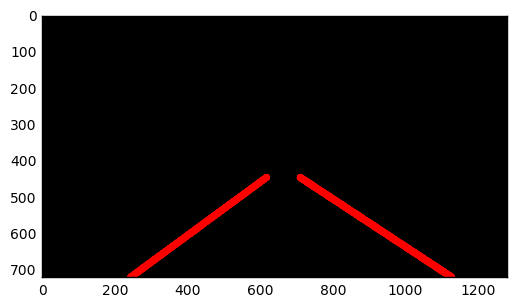

  9%|▉         | 23/251 [00:18<02:56,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


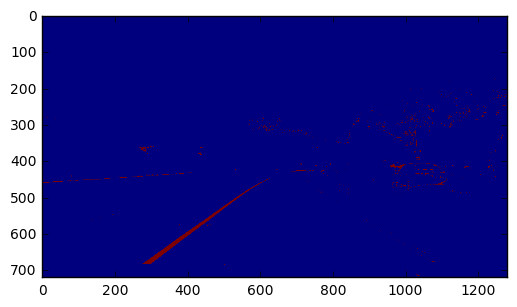

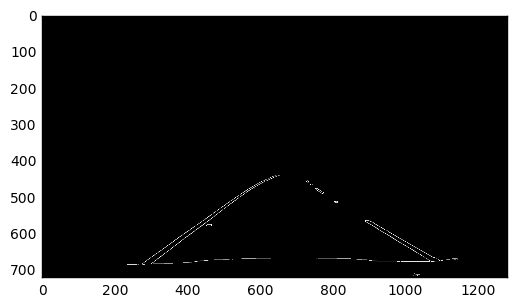

[-0.7533783783783792, 908.5067567567569]
[-0.6983606557377049, 873.9540983606557]
[0.5768025078369908, 45.937304075234515]
[0.6010928961748638, 33.22950819672079]
[0.5768115942028977, 43.39130434782692]
[-0.5564516129032263, 797.7983870967745]
[-0.7534246575342465, 907.7671232876711]
[-0.6488764044943816, 849.1657303370785]
[0.5764705882352947, 45.64705882352902]
[-0.5546875000000008, 798.3359375000007]
[0.625, 3.8749999999997295]
[-0.8101265822784818, 949.2278481012662]
[-0.7807017543859663, 904.9385964912286]
[-0.7000000000000006, 875.8000000000004]
[0.5789473684210529, 51.894736842105324]
[-0.8089171974522288, 947.866242038216]
[-0.807692307692308, 918.2307692307693]
[0.7559322033898301, -94.05084745762679]
[-0.833333333333336, 958.666666666668]
[-0.7307692307692255, 890.1153846153817]
[0.5767195767195776, 37.455026455025354]
[-0.647887323943662, 983.6338028169017]
[-0.7022471910112348, 873.9157303370778]
[-0.8088737201365188, 953.7815699658702]
[0.7797202797202798, -113.63636363636

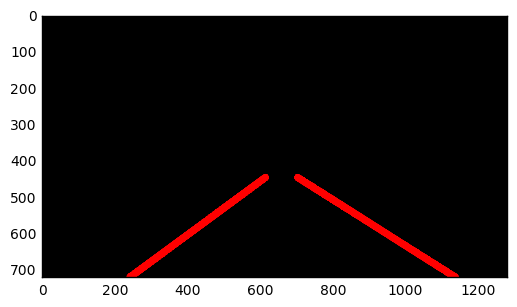

 10%|▉         | 24/251 [00:19<02:58,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


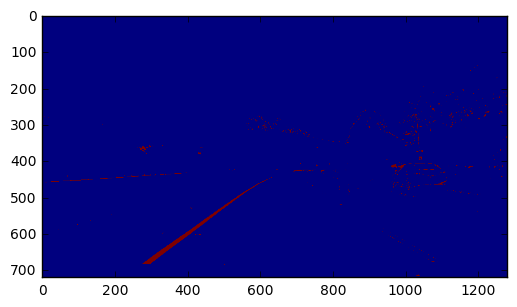

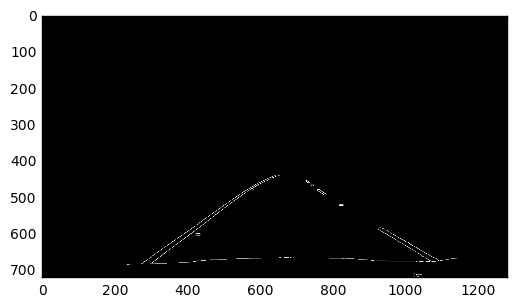

[-0.6725663716814158, 862.2300884955754]
[0.5973154362416119, 36.677852348992296]
[-0.7267080745341609, 898.3788819875774]
[-0.6501547987616091, 856.7492260061914]
[0.5543478260869568, 69.09782608695608]
[-0.6726726726726726, 860.912912912913]
[-0.5780346820809248, 814.2543352601155]
[0.5519713261648752, 68.48745519713168]
[-0.673846153846154, 859.8738461538461]
[-0.6494565217391303, 858.054347826087]
[0.8712871287128712, -179.42574257425707]
[-0.6274509803921566, 855.2941176470588]
[-0.6997084548104959, 884.8163265306125]
[-0.6979865771812079, 877.3422818791946]
[0.8695652173913045, -180.39130434782632]
[-0.5784753363228706, 826.3049327354263]
[-0.7800687285223372, 927.7216494845363]
[-0.6499999999999999, 845.1999999999998]
[0.5999999999999999, 22.60000000000021]
[0.6041666666666664, 30.75000000000005]
[-0.5890410958904122, 822.7123287671242]
[-0.8091872791519434, 947.413427561837]
[-0.7261538461538468, 899.8461538461539]
[0.5552325581395353, 62.24418604651101]
[-0.779720279720279, 92

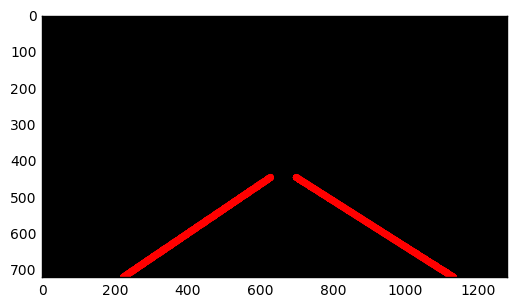

 10%|▉         | 25/251 [00:19<02:56,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


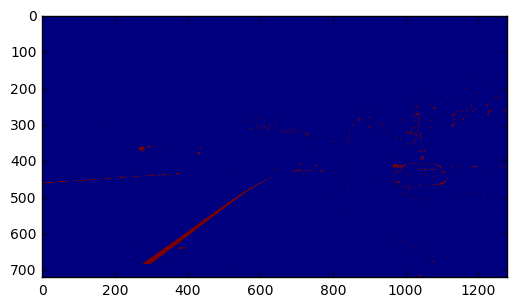

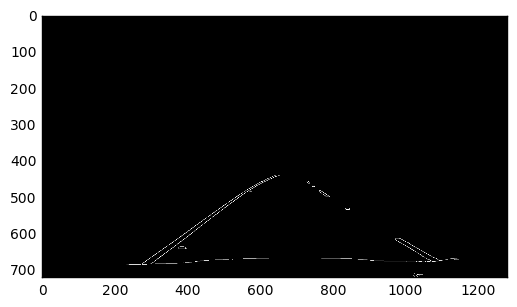

[-0.7253218884120165, 884.4635193133043]
[-0.7517006802721073, 907.2551020408155]
[0.6233333333333325, 10.266666666667646]
[-0.578125000000001, 809.8437500000006]
[0.5994475138121547, 22.20165745856338]
[-0.5797101449275371, 839.202898550725]
[-0.836879432624113, 969.8865248226948]
[0.601123595505618, 22.578651685393236]
[-0.7225130890052356, 882.1361256544502]
[-0.6551724137931033, 873.0344827586208]
[0.622356495468278, 9.211480362537763]
[-0.724907063197027, 885.7992565055765]
[0.6016483516483516, 18.60164835164868]
[-0.5981308411214937, 850.0841121495322]
[0.6245733788395897, 11.204778156997335]
[-0.7824427480916032, 920.2977099236638]
[-0.7692307692307733, 894.5384615384627]
[0.6486486486486489, 110.21621621621605]
[0.6153846153846393, 7.846153846129999]
[-0.838596491228071, 973.831578947369]
[0.6743119266055041, -38.44495412843959]
[-0.7499999999999988, 896.4999999999989]
[0.6018957345971575, 26.15165876777132]
[-0.8647058823529414, 962.2647058823527]
[-0.5766423357664238, 809.627

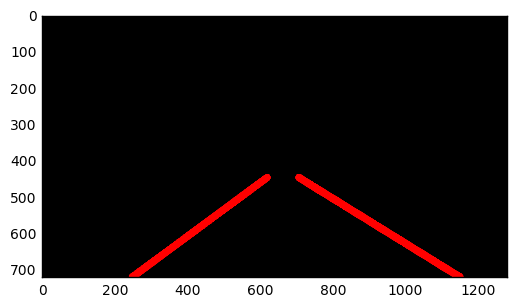

 10%|█         | 26/251 [00:20<02:54,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


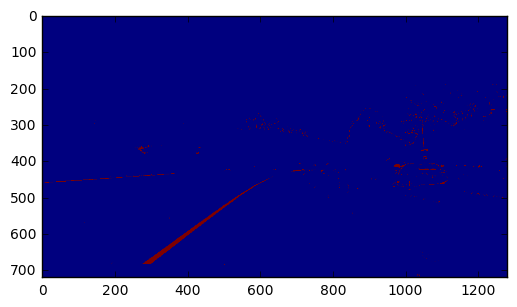

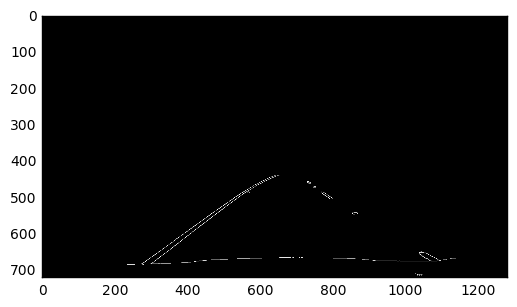

[-0.6485013623978207, 851.3133514986379]
[-0.7508417508417498, 906.9999999999997]
[-0.6730158730158726, 858.3111111111104]
[-0.6495956873315363, 852.8948787061995]
[0.6262975778546715, 8.25605536332185]
[-0.7277486910994764, 895.5602094240835]
[-0.6472148541114066, 854.2175066312998]
[0.6235632183908046, 5.045977011494633]
[0.6021798365122616, 17.623978201635325]
[0.6482558139534886, -16.985465116279727]
[-0.740000000000003, 886.9800000000012]
[-0.7999999999999979, 908.1999999999987]
[-0.6760563380281693, 873.9436619718311]
[-0.6999999999999744, 875.1999999999852]
[-0.6491712707182314, 850.187845303867]
[-0.7857142857143, 899.0714285714325]
[-0.6068376068376066, 847.5897435897435]
[-0.6067415730337081, 836.8089887640449]
[0.6490384615384613, 43.298076923076934]
[-0.6966292134831462, 1140.4044943820224]
[-0.6734693877551026, 857.0816326530615]
[0.5833333333333183, 37.000000000016094]
[0.5535714285714285, 61.41071428571403]
middle 660
left [766, 728, 723, 725, 1080, 767] right [625, 594,

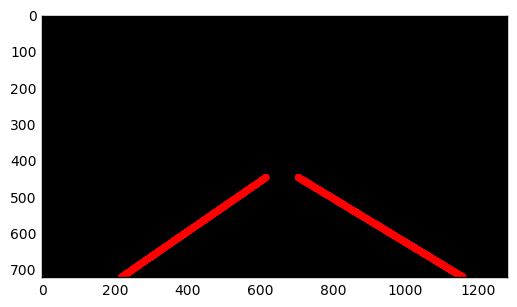

 11%|█         | 27/251 [00:21<02:53,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


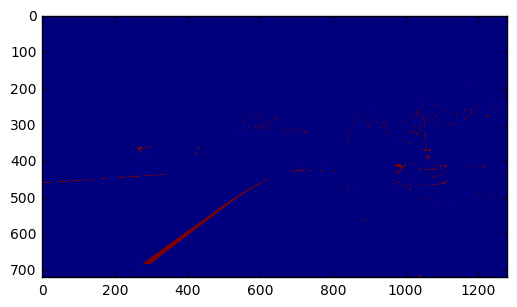

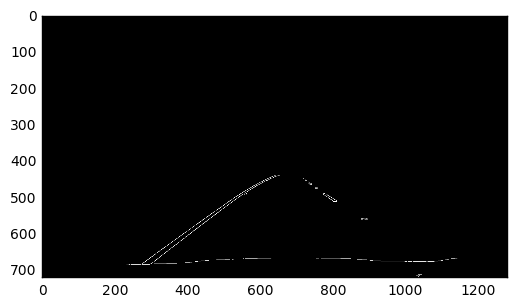

[-0.7517241379310348, 905.2551724137934]
[-0.7236842105263158, 882.2894736842103]
[-0.6486486486486485, 844.5675675675675]
[-0.7534246575342465, 908.2739726027397]
[0.6011904761904762, 23.708333333333194]
[0.6751824817518245, -29.240875912408512]
[0.652694610778443, -18.898203592814347]
[0.6751592356687892, -31.242038216559934]
[0.5772357723577242, 39.61788617886128]
[-0.7272727272727263, 898.6363636363626]
[-0.5750000000000032, 1310.4000000000037]
[-0.5772357723577236, 810.1544715447153]
[0.6236263736263739, 1.2362637362631022]
[-0.7450980392156854, 887.4117647058819]
[-0.7012448132780077, 886.1867219917007]
[-0.7169811320754711, 880.0188679245282]
[-0.745454545454552, 888.1818181818206]
[0.7228915662650596, -69.92771084337258]
[-0.8000000000000036, 931.200000000002]
[0.5989847715736042, 29.096446700507382]
middle 668
left [749, 772, 723, 735, 730, 718, 722, 883] right [583, 502, 579, 591, 599, 617, 324, 632, 537, 345, 569]
(8, 2)
-6.95623732702 0.640870661027
SLOPE
883.834199478 -0.7

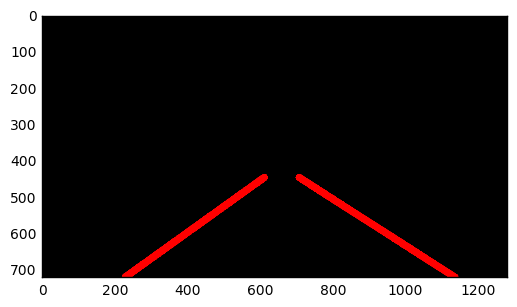

 11%|█         | 28/251 [00:22<02:56,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


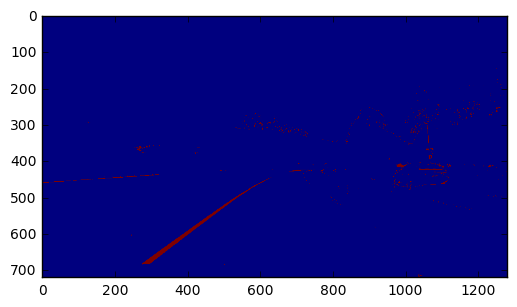

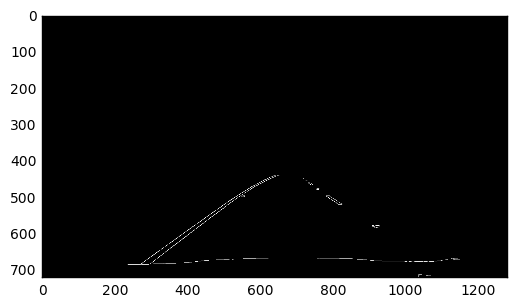

[-0.6986301369863014, 871.5342465753423]
[-0.753472222222222, 905.7673611111109]
[-0.7543859649122813, 905.2807017543864]
[-0.577181208053689, 809.3959731543607]
[0.6023054755043226, 22.498559077810004]
[0.6474820143884893, -7.388489208633069]
[-0.6240208877284595, 835.3890339425589]
[-0.6723549488054611, 856.4505119453925]
[0.6993865030674844, -53.15950920245392]
[-0.7253731343283578, 903.0626865671642]
[-0.7777777777777767, 902.6666666666663]
[0.5714285714285693, 42.71428571428716]
[-0.6983606557377038, 872.55737704918]
[0.577656675749319, 39.1553133514983]
[-0.8070175438596501, 919.0350877192986]
[-0.6739130434782623, 861.6304347826098]
[-0.8382352941176493, 928.9264705882363]
[-0.8681318681318675, 989.3186813186804]
[0.5539772727272734, 60.30113636363557]
[-0.807692307692308, 917.6153846153848]
[0.6246498599439771, 0.12885154061671072]
[0.6244239631336407, 52.8617511520736]
[0.5999999999999998, 28.000000000000068]
middle 641
left [738, 779, 718, 732, 732, 754, 725, 780] right [559,

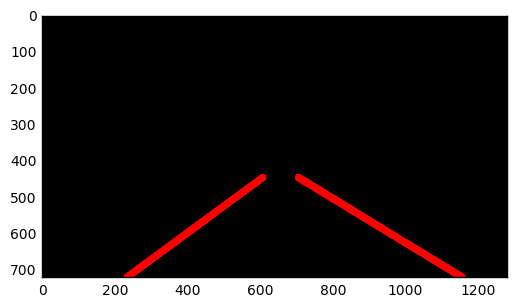

 12%|█▏        | 29/251 [00:23<02:57,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


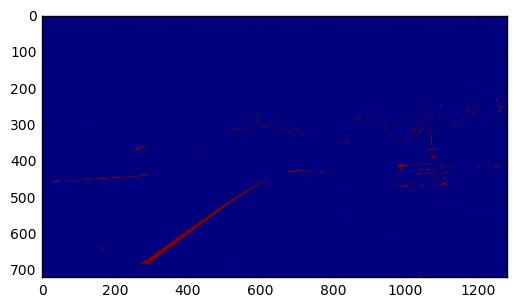

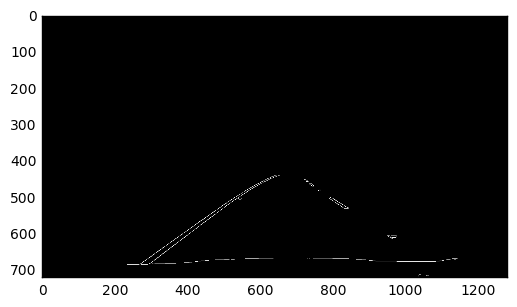

[-0.7003484320557487, 872.6933797909404]
[-0.7517730496453903, 904.2695035460991]
[-0.6035502958579875, 825.047337278106]
[0.6485714285714286, -16.322857142857384]
[-0.6485714285714292, 847.7914285714288]
[0.674418604651163, -28.44186046511646]
[-0.6014492753623195, 821.7028985507252]
[-0.7499999999999992, 891.2499999999993]
[0.7533632286995525, -99.71748878923867]
[0.6755952380952384, -35.0773809523815]
[-0.75, 888.7500000000001]
[0.6983606557377047, -48.596721311474695]
[-0.8709677419354835, 934.9677419354836]
[0.7804878048780497, -123.78048780487873]
[-0.8695652173913155, 1617.0000000000118]
[-0.8055555555555549, 911.3611111111105]
[0.8983050847457628, -214.74576271186442]
[-0.8103448275862062, 952.03448275862]
[-0.6972789115646258, 871.9625850340137]
[-0.6240601503759383, 835.5789473684198]
[-0.7526881720430102, 905.290322580645]
[0.8412698412698405, -168.49206349206278]
[0.5761194029850754, 44.72537313432753]
[0.8666666666666704, -172.20000000000275]
middle 668
left [719, 788, 808

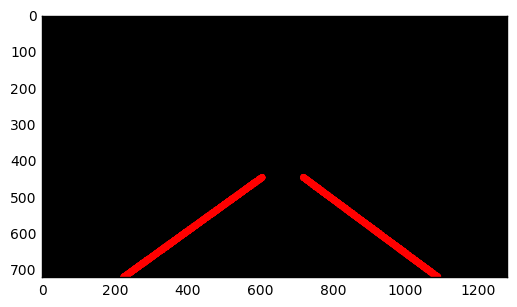

 12%|█▏        | 30/251 [00:23<02:59,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


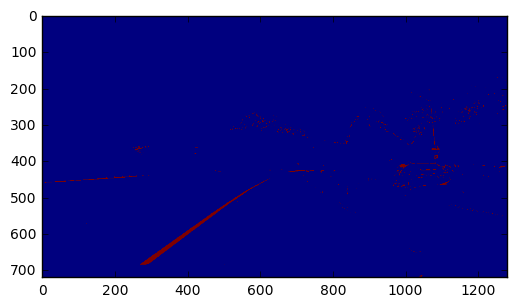

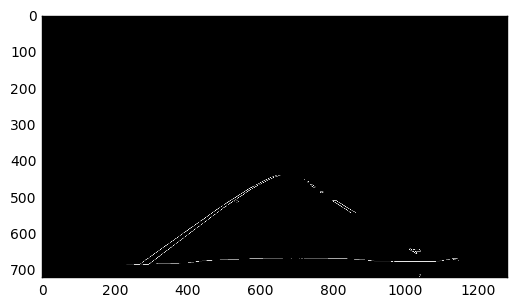

[-0.6224489795918364, 838.4999999999999]
[-0.753623188405798, 904.3043478260875]
[-0.6249999999999999, 838.7499999999998]
[-0.7258064516129047, 884.1451612903234]
[0.6005747126436781, 24.977011494252903]
[0.6249999999999994, 11.250000000000211]
[-0.7500000000000013, 889.2500000000002]
[-0.5769230769230802, 805.923076923079]
[-0.7783251231527094, 907.600985221675]
[-0.8028169014084499, 905.9718309859151]
[-0.6491712707182318, 856.7679558011044]
[0.5779816513761471, 45.422018348623304]
[0.553246753246753, 56.23636363636397]
[-0.8380952380952363, 923.8571428571419]
[0.6017191977077362, 23.134670487106035]
[0.6009389671361497, 32.234741784037766]
[0.5989304812834224, 20.368983957219484]
[-0.5811965811965811, 809.6666666666665]
[-0.7508896797153022, 904.512455516014]
[0.600000000000006, 19.999999999995417]
[-0.6013071895424836, 824.59477124183]
[0.5534759358288762, 57.08823529411843]
[-0.7500000000000021, 910.5000000000015]
[0.5762273901808787, 35.69250645994842]
[-0.7213114754098355, 879.5

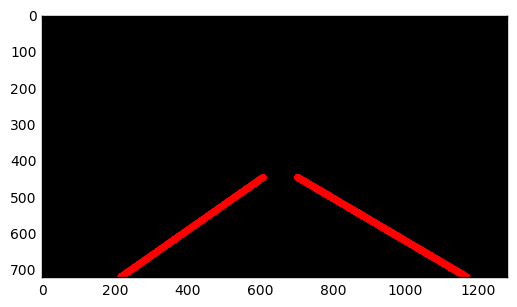

 12%|█▏        | 31/251 [00:24<03:01,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


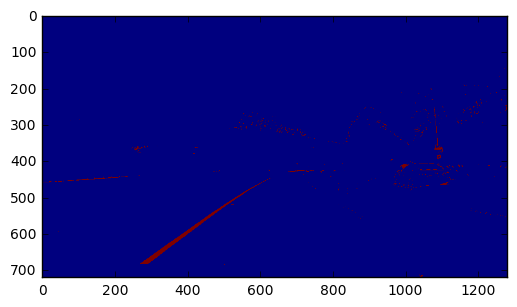

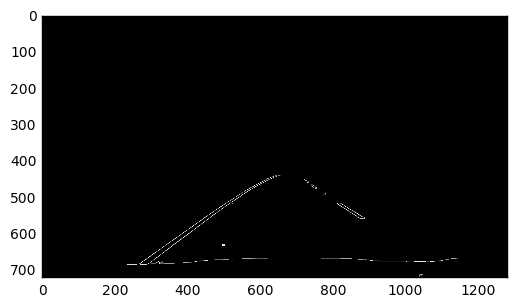

[-0.7509157509157512, 903.2710622710621]
[-0.7000000000000006, 869.5]
[0.6235632183908046, 6.04597701149428]
[-0.7526501766784456, 906.0318021201415]
[0.6235294117647052, 12.317647058824724]
[0.5543071161048687, 70.805243445693]
[-0.5531914893617021, 792.8510638297874]
[0.7789473684210537, -111.51578947368533]
[0.5555555555555558, 72.11111111111076]
[-0.6489361702127656, 862.1595744680851]
[-0.5794392523364488, 838.710280373832]
[0.6238805970149249, 6.95223880597074]
[-0.7797833935018043, 923.1732851985555]
[-0.6985507246376822, 885.4840579710153]
[0.647887323943661, -7.521126760562095]
[-0.6744186046511634, 875.6279069767446]
[-0.8358974358974356, 937.9487179487181]
[0.6256983240223462, 1.4972067039108037]
[-0.8677248677248666, 955.539682539682]
[-0.5540540540540521, 792.0675675675664]
[-0.6515151515151515, 1396.1363636363637]
[0.726315789473684, -68.19999999999978]
[-0.6515151515151494, 1395.484848484846]
[-0.6984732824427478, 870.5877862595415]
[-0.7062937062937061, 881.538461538461

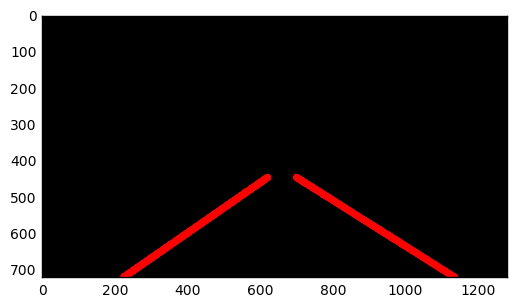

 13%|█▎        | 32/251 [00:25<02:56,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


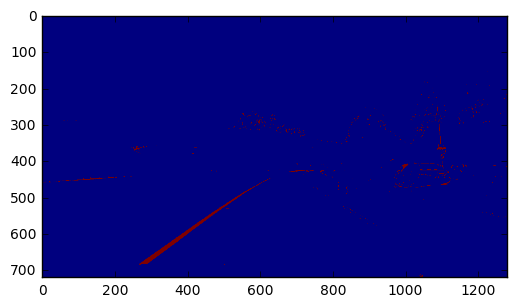

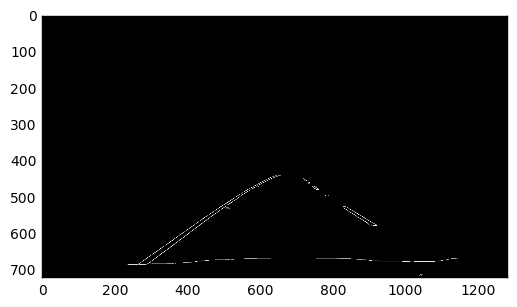

[-0.7257525083612039, 891.8394648829429]
[-0.6973684210526321, 867.7105263157897]
[0.6023391812865492, 23.666666666667084]
[0.624472573839662, 13.185654008439219]
[-0.7262569832402223, 891.2290502793289]
[0.6000000000000002, 24.399999999999604]
[-0.7254901960784319, 893.6666666666669]
[-0.5766423357664224, 808.2846715328454]
[0.8401360544217681, -158.58163265306067]
[-0.7008797653958942, 892.1612903225802]
[0.5752895752895755, 51.81081081081044]
[-0.7516778523489939, 910.0067114093963]
[0.5999999999999999, 25.200000000000088]
[0.7797202797202792, -113.07692307692265]
[0.6666666666666602, 188.33333333333655]
[-0.7006802721088441, 884.2244897959188]
[0.5806451612903274, 35.77419354838362]
[0.5549295774647888, 60.912676056338206]
[0.5787401574803162, 50.381889763778]
[-0.7239819004524877, 881.199095022624]
[-0.6984924623115581, 867.3065326633166]
[-0.7259036144578314, 905.8524096385543]
[-0.808823529411765, 937.4558823529412]
[0.8148148148148129, -137.7407407407391]
[0.8373702422145335, -

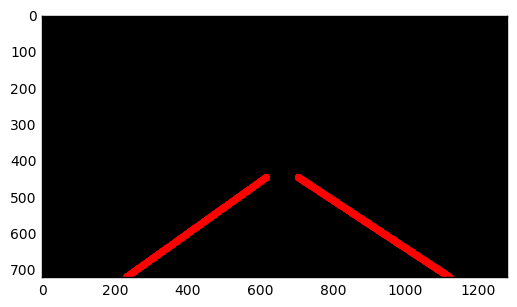

 13%|█▎        | 33/251 [00:26<02:55,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


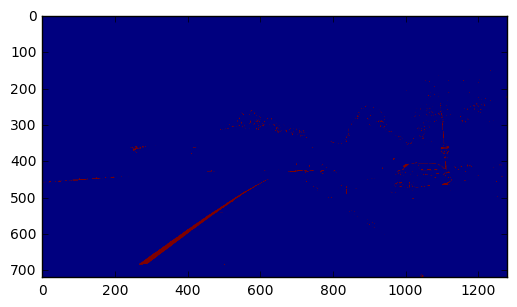

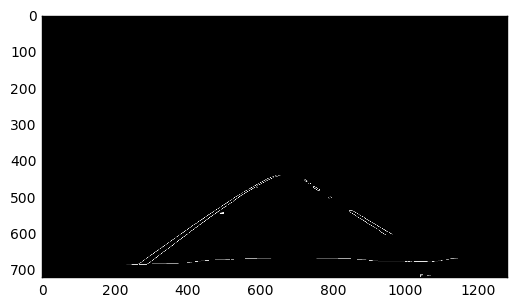

[-0.7538461538461536, 901.3538461538459]
[0.5988200589970502, 26.879056047197924]
[-0.6968503937007887, 868.6653543307093]
[0.6009852216748763, 34.14778325123255]
[-0.6476964769647696, 851.4579945799458]
[-0.5995085995085996, 829.2825552825551]
[0.6016949152542377, 22.559322033897846]
[-0.7219251336898398, 877.754010695187]
[-0.7508417508417514, 908.5016835016836]
[0.6026200873362447, 30.991266375545415]
[-0.8097345132743365, 928.5398230088497]
[-0.7790055248618782, 904.6795580110496]
[-0.8098859315589351, 939.7338403041821]
[0.7525083612040141, -92.81605351170634]
[-0.6986301369863023, 886.6301369863015]
[-0.6253229974160204, 848.3359173126615]
[0.6011730205278587, 23.727272727273103]
[-0.6502890173410405, 854.031791907514]
[0.7263843648208458, -70.44951140065037]
[0.5539906103286386, 80.90610328638468]
[0.7547169811320682, -87.7735849056525]
[0.697674418604651, -46.06976744186007]
[0.7209302325581387, -68.51162790697636]
[-0.7816593886462885, 913.0262008733623]
[-0.7419354838709681, 

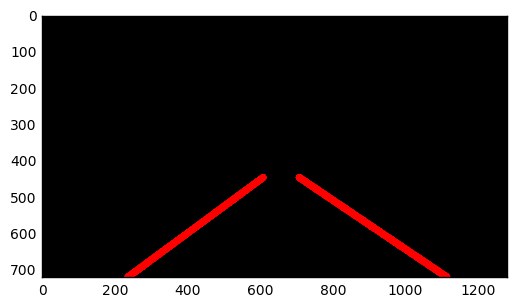

 14%|█▎        | 34/251 [00:27<02:53,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


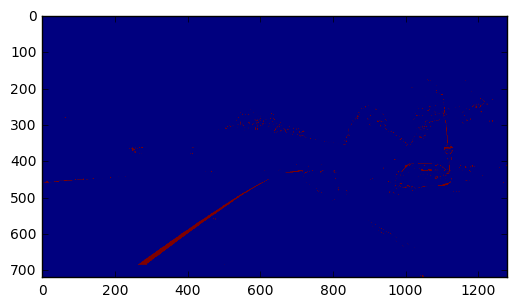

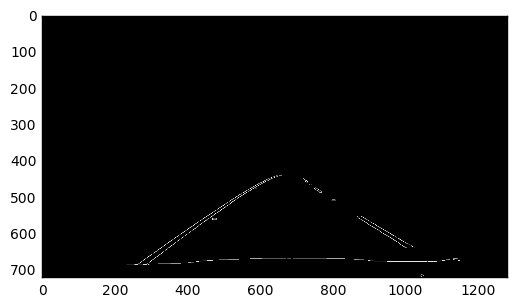

[-0.6724137931034487, 865.5344827586209]
[0.6041666666666663, 22.54166666666726]
[-0.6736842105263164, 858.1368421052634]
[0.6243654822335017, 13.92385786802069]
[-0.6742209631728048, 868.71388101983]
[-0.6731843575418998, 869.7793296089385]
[-0.6732673267326729, 860.049504950495]
[-0.6709956709956704, 855.7619047619045]
[-0.6481481481481486, 865.8333333333334]
[0.6016483516483513, 22.008241758241972]
[-0.6731301939058169, 872.1301939058171]
[0.6238244514106578, 10.755485893417504]
[-0.8085937500000001, 937.8984375000002]
[0.7808219178082187, -111.63013698630118]
[-0.6014669926650364, 834.562347188264]
[0.5543175487465176, 85.12813370473613]
[-0.6481481481481481, 867.1296296296294]
[0.6238095238095238, 12.4476190476189]
[-0.6728971962616815, 861.9719626168222]
[-0.6243902439024394, 853.960975609756]
[-0.6000000000000002, 831.8]
[-0.8046875000000003, 943.4218750000001]
[-0.8078431372549019, 936.8549019607844]
[0.6492537313432827, -11.201492537312609]
[-0.6264591439688709, 850.7042801556

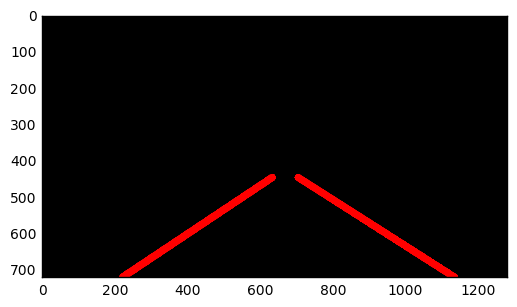

 14%|█▍        | 35/251 [00:27<02:56,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


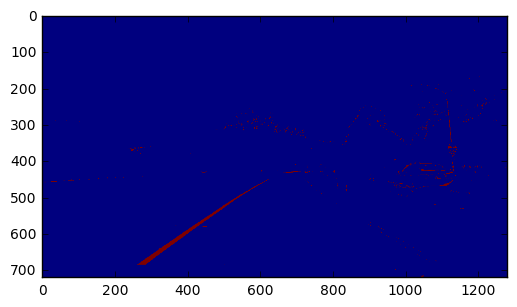

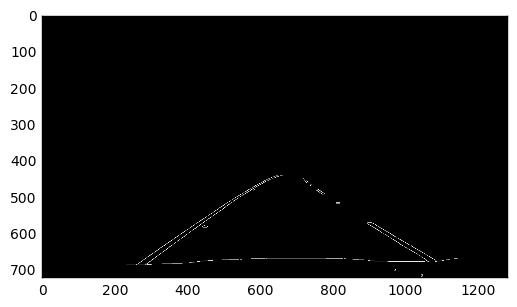

[-0.6727272727272728, 857.5454545454545]
[0.6000000000000003, 25.799999999999915]
[0.6259842519685038, 12.830708661417136]
[-0.699386503067484, 880.4294478527601]
[-0.6978193146417443, 878.5981308411212]
[0.625786163522013, 8.408805031446407]
[0.6011080332409969, 23.398891966759148]
[0.6254826254826248, 11.235521235522285]
[-0.6746575342465758, 872.7568493150688]
[0.577127659574468, 39.73670212765935]
[0.6491803278688516, -7.534426229507116]
[-0.7245508982035919, 905.7125748502989]
[-0.8389513108614238, 964.887640449438]
[-0.7524115755627014, 916.4951768488747]
[0.7558528428093643, -92.45819397993309]
[-0.6735537190082632, 857.0826446280988]
[-0.6028368794326259, 852.0851063829797]
[-0.7813504823151137, 943.9710610932481]
[-0.8401486988847578, 966.1301115241635]
[-0.6734006734006738, 860.0841750841753]
[-0.7269938650306751, 910.8220858895705]
middle 669
left [737, 807, 752, 723, 807, 723, 751, 719] right [530, 604, 597, 637, 640, 603, 620, 496, 453, 645, 606, 557, 638]
(8, 2)
2.6772511

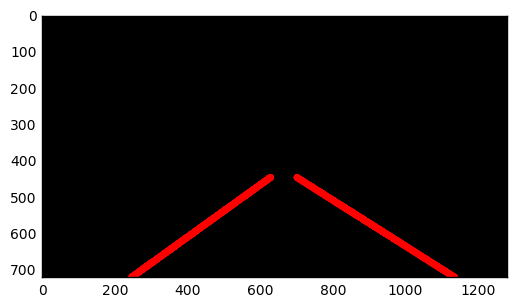

 14%|█▍        | 36/251 [00:28<02:52,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


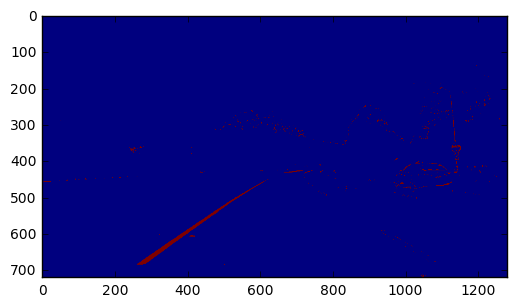

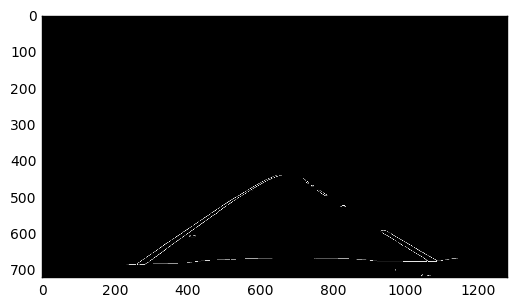

[0.6005509641873272, 23.201101928375337]
[-0.6483870967741935, 845.8000000000001]
[-0.6975308641975309, 878.216049382716]
[0.6239669421487603, 14.347107438016693]
[0.6144578313253016, 9.927710843372944]
[-0.6981707317073168, 879.7896341463412]
[-0.700296735905045, 883.1839762611277]
[-0.722772277227723, 874.3663366336638]
[0.6232686980609415, 3.2465373961218535]
[0.6254295532646046, 10.91752577319579]
[-0.6980519480519483, 875.5681818181818]
[-0.7253521126760551, 877.4929577464786]
[-0.648275862068965, 844.4758620689653]
[-0.7250755287009066, 902.9728096676739]
[0.6742671009771987, -28.283387622149714]
[-0.7525773195876302, 915.546391752578]
[-0.6931818181818146, 863.1477272727258]
[-0.6991404011461315, 890.2464183381088]
[-0.8074074074074077, 912.6888888888889]
[-0.6994219653179192, 888.2312138728323]
[0.6694915254237266, -42.033898305082595]
[-0.7800000000000004, 933.3800000000008]
[0.626436781609195, 4.833333333333747]
[-0.6501457725947523, 865.8454810495627]
[-0.6760563380281661, 1

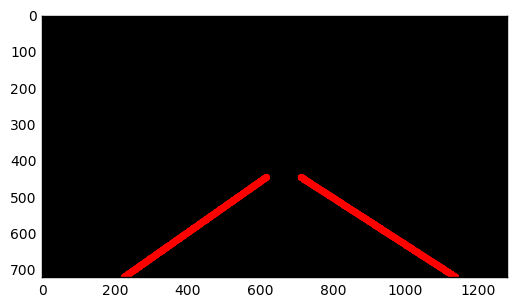

 15%|█▍        | 37/251 [00:29<02:54,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


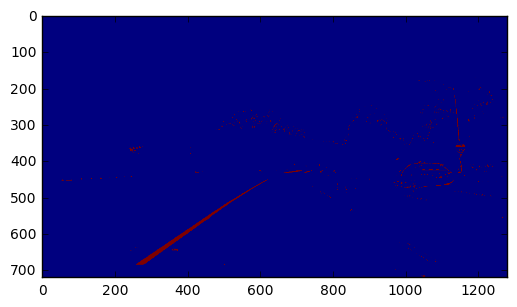

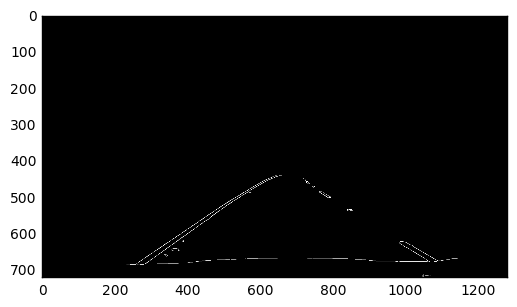

[-0.7240143369175633, 888.896057347671]
[-0.6726618705035972, 857.8741007194247]
[-0.6731517509727621, 856.653696498054]
[0.5983146067415729, 25.623595505618216]
[-0.7248322147651007, 892.0268456375842]
[0.6874999999999993, -53.12499999999928]
[0.646464646464646, -9.272727272726879]
[0.6507936507936499, -11.53968253968155]
[-0.6478873239436617, 852.5774647887322]
[-0.6979472140762469, 885.0087976539592]
[-0.7822580645161287, 926.1854838709671]
[0.7823529411764708, -112.72941176470573]
[0.8088235294117657, -177.1176470588248]
[-0.8661087866108785, 970.5481171548115]
[-0.7755102040816328, 912.7959183673472]
[-0.7804878048780493, 927.5121951219518]
[-0.8095238095238092, 934.0476190476189]
[-0.8400000000000002, 967.7600000000006]
[0.599369085173501, 30.280757097792186]
[-0.7242647058823521, 887.5183823529406]
[0.6666666666666907, -48.333333333359164]
[-0.8711340206185558, 957.5360824742263]
[0.7827380952380947, -114.48511904761837]
[0.8730158730158725, -241.41269841269806]
[-0.808823529411

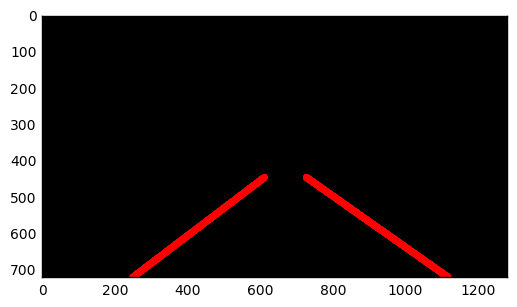

 15%|█▌        | 38/251 [00:30<02:57,  1.20it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


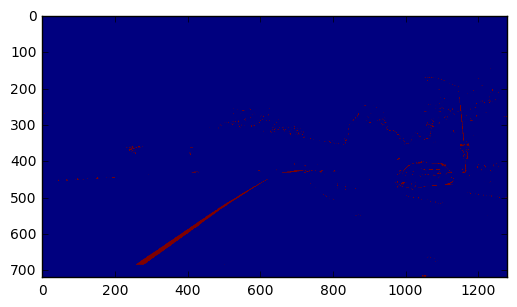

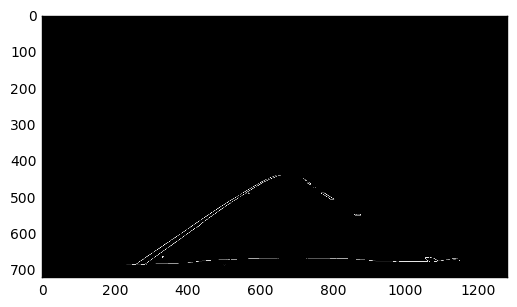

[-0.7247386759581893, 889.3763066202101]
[-0.6571428571428573, 850.0571428571427]
[-0.648414985590778, 847.7521613832855]
[-0.6000000000000006, 825.2000000000006]
[-0.6010928961748631, 823.0874316939888]
[-0.7073170731707323, 867.585365853659]
[0.6017441860465114, 22.531976744186167]
[-0.5555555555555568, 798.1111111111118]
[0.8059701492537336, -132.13432835821106]
[-0.5550000000000002, 802.4149999999998]
[0.5758513931888548, 47.32198142414875]
[-0.7333333333333288, 874.2666666666656]
[0.8987854251012145, -198.51821862348172]
[-0.862068965517238, 918.6206896551713]
[-0.553921568627451, 815.6176470588232]
[0.8620689655172316, -170.6896551724062]
[-0.7261410788381744, 883.9626556016595]
[-0.6230366492146594, 835.5287958115182]
[0.5555555555555568, 65.55555555555442]
[-0.867704280155641, 979.7548638132291]
[-0.6009389671361498, 824.7981220657272]
[-0.7537313432835806, 904.3358208955211]
[0.6490066225165548, -16.986754966886124]
[-0.7777777777777761, 911.1111111111103]
middle 637
left [727

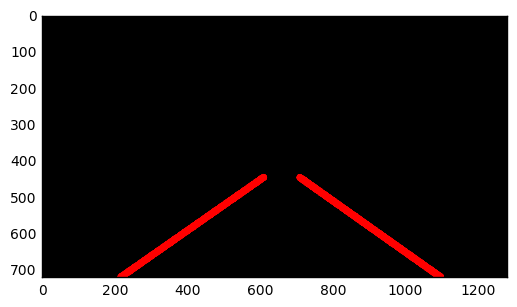

 16%|█▌        | 39/251 [00:31<02:59,  1.18it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


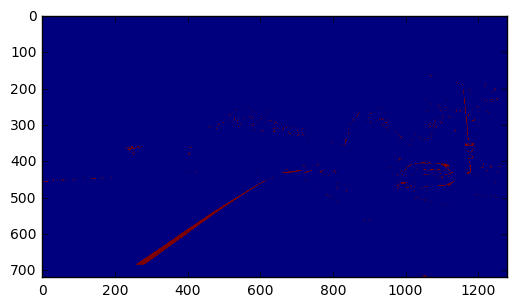

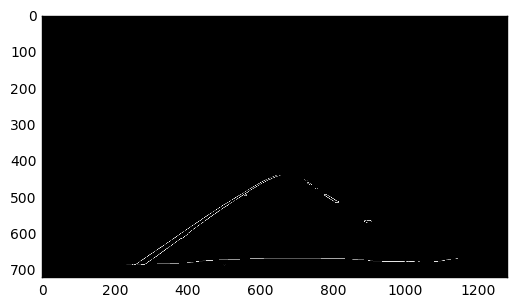

[-0.6990881458966566, 880.0455927051671]
[-0.6719367588932806, 856.3438735177863]
[-0.7528957528957533, 903.092664092664]
[0.7549668874172183, -93.57615894039661]
[-0.6489361702127658, 864.7553191489365]
[-0.673239436619718, 867.7746478873239]
[0.6260623229461749, 2.730878186969947]
[-0.752767527675277, 905.3136531365313]
[-0.5555555555555618, 837.77777777778]
[0.6230529595015583, 10.710280373831266]
[0.7281879194630879, -70.57718120805413]
[0.6242774566473988, 6.901734104046521]
[-0.6981132075471692, 871.698113207547]
[-0.7765957446808502, 904.5531914893611]
[-0.6818181818181758, 865.3181818181785]
[0.5789473684210522, 42.63157894736885]
[-0.7539682539682538, 902.6507936507937]
[0.6983606557377044, -52.48524590163915]
[-0.8918918918918937, 992.7837837837847]
[-0.6960000000000004, 864.8880000000003]
[-0.6050955414012741, 840.114649681529]
[0.8461538461538459, -159.9230769230768]
[0.6987577639751555, -53.59937888198741]
middle 629
left [720, 724, 750, 730, 729, 752, 741, 722, 725] right

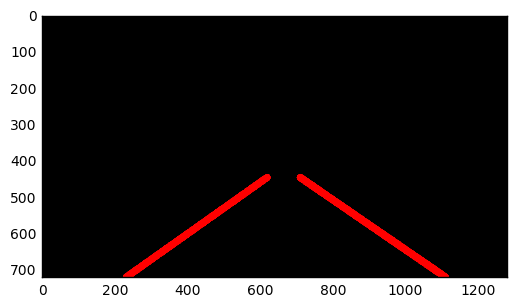

 16%|█▌        | 40/251 [00:32<02:54,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


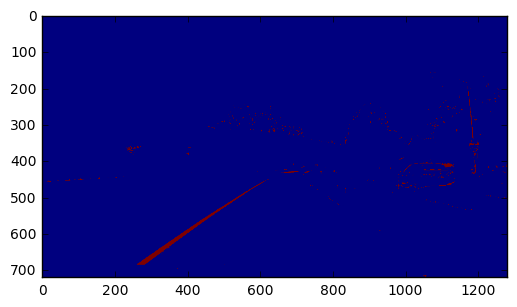

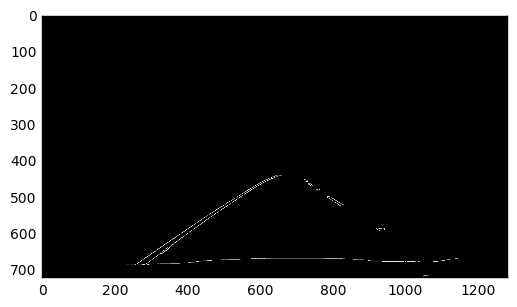

[-0.6734104046242767, 865.1271676300576]
[-0.6930693069306939, 864.5742574257428]
[-0.7530864197530864, 901.641975308642]
[-0.7142857142857164, 871.0000000000007]
[0.6242937853107348, 4.011299435028148]
[-0.7510917030567688, 898.8165938864629]
[-0.5555555555555551, 801.3333333333333]
[-0.7499999999999992, 901.4999999999995]
[0.6020408163265304, 29.20408163265331]
[-0.7500000000000024, 881.7500000000006]
[0.6000000000000001, 25.39999999999994]
[-0.7999999999999903, 893.5999999999973]
[0.5800711743772244, 48.20284697508882]
[0.6236263736263739, 1.6126373626370047]
[0.6006097560975605, 27.14024390243957]
[-0.8000000000000027, 896.4000000000009]
[0.5526932084309137, 80.09133489461306]
[-0.8070175438596484, 947.7017543859646]
[-0.7272727272727232, 876.727272727271]
[-0.648936170212766, 863.159574468085]
[-0.6727272727272732, 862.2545454545455]
[-0.8984771573604048, 976.802030456852]
[-0.7516778523489928, 910.2550335570465]
[-0.818181818181824, 900.454545454547]
[-0.8370044052863435, 949.167

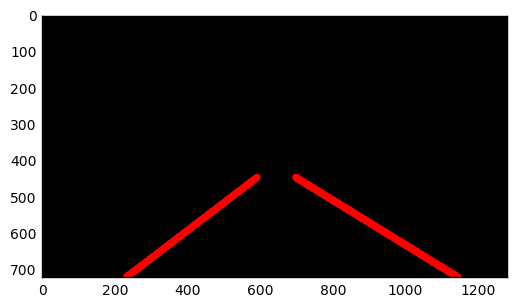

 16%|█▋        | 41/251 [00:32<02:52,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


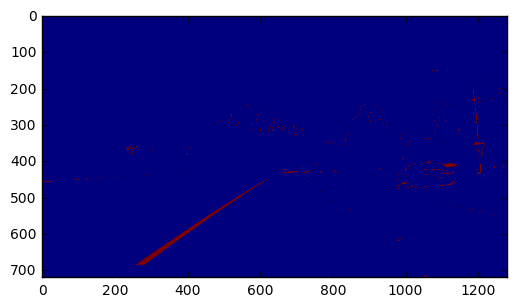

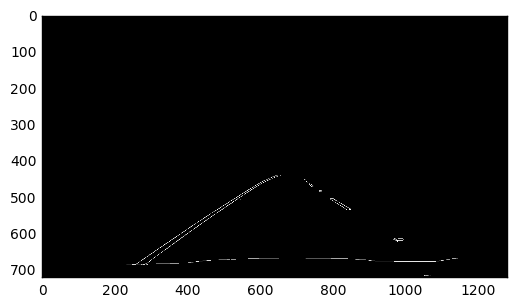

[-0.6935483870967738, 863.7096774193549]
[-0.7800000000000007, 909.6400000000002]
[-0.6000000000000001, 825.2000000000002]
[0.6249999999999994, 3.2500000000003877]
[-0.7552742616033752, 901.7637130801685]
[0.6240875912408754, 12.346715328467797]
[-0.5773584905660375, 818.5924528301889]
[-0.55223880597015, 792.5970149253737]
[0.6238805970149249, 8.823880597015366]
[-0.6011904761904756, 823.3452380952375]
[-0.7539062499999992, 903.6328124999995]
[-0.6746268656716427, 873.4358208955233]
[0.5549999999999997, 66.4400000000005]
[0.6749226006191947, -31.668730650154192]
[-0.799999999999995, 925.799999999997]
[-0.8666666666666656, 928.3999999999993]
[0.6983471074380166, -54.86776859504108]
[-0.7012987012987008, 865.6363636363636]
[0.6000000000000001, 20.399999999999977]
[-0.8374558303886925, 972.7597173144873]
[0.5666666666666667, 50.49999999999992]
[-0.615384615384613, 857.7692307692301]
[-0.7745098039215692, 910.323529411765]
middle 637
left [726, 791, 736, 792, 727, 806, 726, 735] right [38

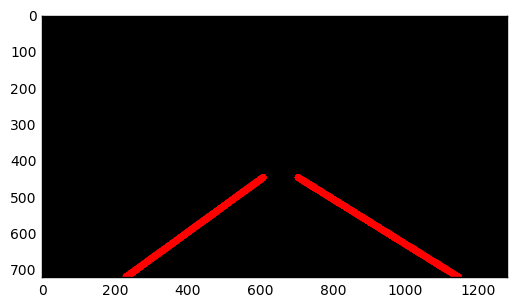

 17%|█▋        | 42/251 [00:33<03:01,  1.15it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


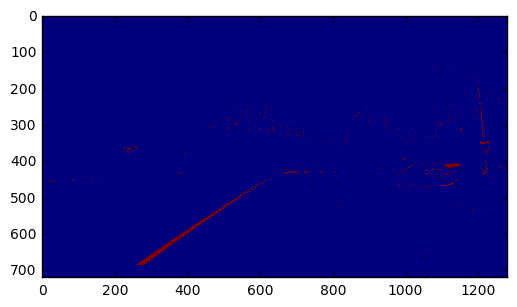

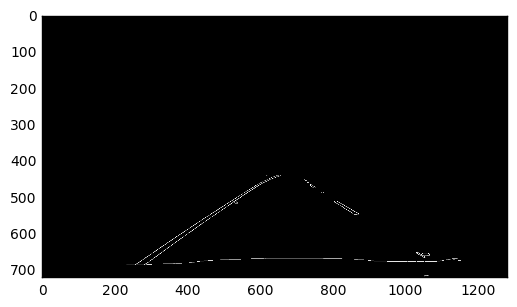

[-0.6468842729970328, 847.074183976261]
[-0.6990881458966558, 881.0455927051665]
[0.5766016713091925, 43.621169916434226]
[-0.5787671232876709, 827.7979452054789]
[0.5762711864406803, 51.2542372881334]
[-0.6947368421052649, 881.8210526315797]
[-0.6996904024767809, 879.8142414860687]
[-0.6504297994269339, 850.5587392550141]
[0.6011080332409979, 21.393351800553283]
[-0.6994219653179184, 889.231213872832]
[-0.6842105263157873, 874.5263157894725]
[-0.6507936507936508, 847.3968253968256]
[-0.7539432176656147, 921.492113564668]
[0.6036036036036029, 30.009009009009684]
[-0.8181818181818022, 898.727272727268]
[0.64741641337386, -13.787234042552758]
[-0.7500000000000019, 882.5000000000006]
[-0.6991150442477867, 885.6460176991146]
[-0.8999999999999997, 996.1999999999999]
[-0.6740947075208915, 875.1169916434542]
[-0.7222222222222218, 871.0555555555554]
[-0.7027027027026963, 883.8648648648611]
middle 659
left [736, 803, 728, 830, 721] right [586, 608, 537, 623, 600, 602, 638, 619, 626, 632, 282, 3

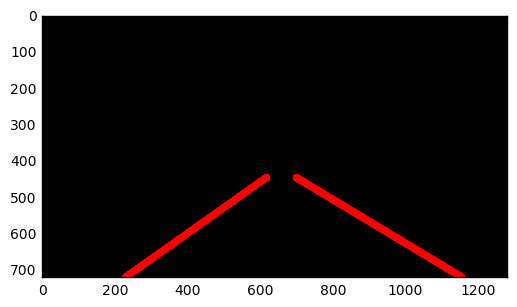

 17%|█▋        | 43/251 [00:34<03:02,  1.14it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


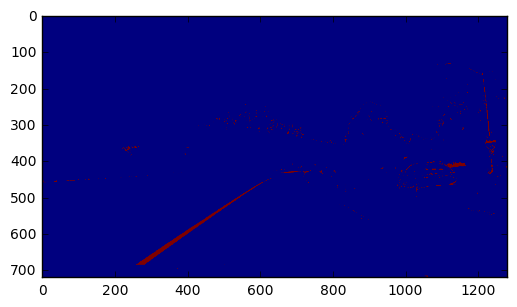

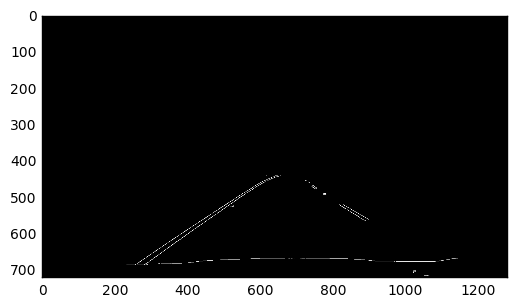

[-0.6472303206997086, 847.1603498542272]
[0.5758426966292134, 44.45224719101146]
[-0.7012195121951219, 881.6402439024387]
[-0.6976047904191623, 882.5149700598806]
[0.6726726726726721, -32.66966966966884]
[-0.7105263157894793, 868.3157894736859]
[-0.714285714285715, 870.5714285714289]
[0.6239999999999998, 12.44000000000019]
[-0.6991150442477891, 885.7433628318594]
[0.5770308123249295, 42.57422969187726]
[-0.6481481481481481, 864.888888888889]
[0.6215139442231079, 13.844621513943773]
[-0.8102189781021898, 944.7007299270068]
[-0.6470588235294076, 866.2352941176455]
[-0.8358208955223867, 911.6716417910443]
[-0.8732394366197171, 926.1408450704224]
[-0.6991404011461315, 890.9455587392548]
[-0.7002881844380403, 889.8847262247837]
[-0.7821782178217832, 897.9702970297034]
[-0.7278481012658224, 898.7151898734173]
[0.8109090909090914, -135.5309090909093]
[-0.6013986013986011, 831.5034965034964]
[0.700657894736842, 41.30592105263163]
[-0.6997084548104953, 887.6151603498538]
[0.6041666666666663, 24

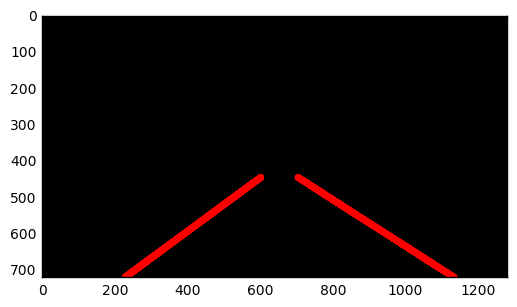

 18%|█▊        | 44/251 [00:35<02:59,  1.16it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


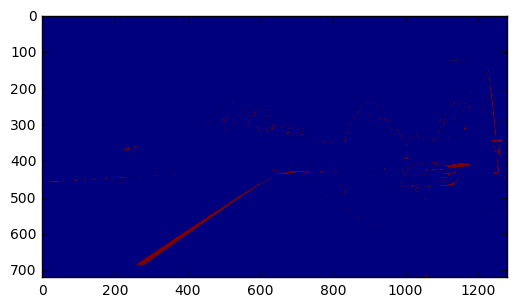

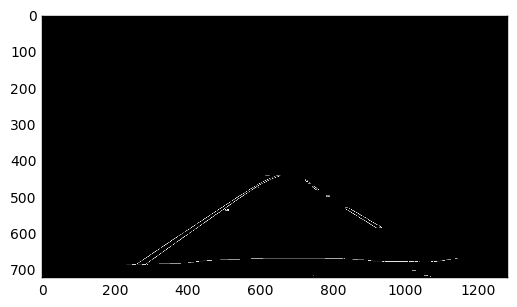

[-0.6478873239436616, 850.8591549295771]
[-0.6468842729970329, 847.3679525222552]
[0.6016949152542377, 22.559322033897846]
[-0.6236842105263157, 838.1789473684207]
[-0.6993865030674846, 882.2269938650305]
[0.6507936507936501, -10.539682539681783]
[-0.7000000000000002, 887.2999999999998]
[-0.6994219653179196, 890.3294797687864]
[0.6477987421383654, -9.314465408805605]
[-0.8678571428571424, 979.8071428571423]
[0.622009569377991, 3.287081339712425]
[0.6016483516483515, 20.203296703296974]
[-0.7226277372262775, 878.9416058394163]
[-0.5995085995086, 833.4791154791158]
[-0.6980519480519485, 877.2662337662341]
[-0.8387096774193556, 919.8387096774197]
[0.6031746031746023, 22.44444444444527]
[-0.6759002770083096, 876.2797783933509]
[-0.725552050473187, 898.7634069400633]
[-0.5999999999999995, 829.9999999999995]
[0.6515151515151519, -16.3484848484852]
[-0.868131868131866, 931.5494505494495]
[-0.5986394557823113, 1137.7346938775493]
[-0.8373702422145328, 985.9653979238757]
[-0.7803278688524589, 9

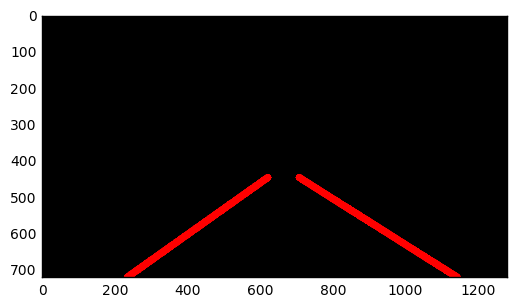

 18%|█▊        | 45/251 [00:36<02:55,  1.18it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


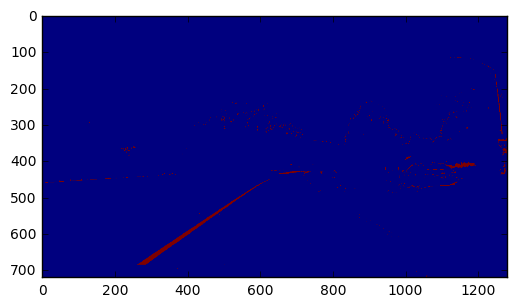

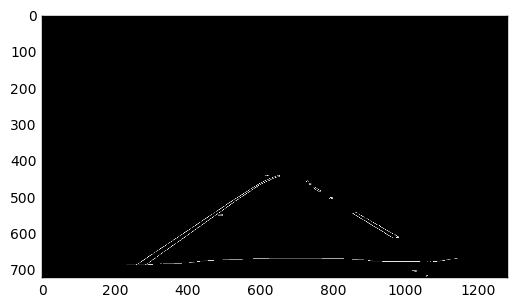

[-0.6996996996996989, 883.3153153153147]
[-0.6730769230769229, 860.6730769230768]
[0.5775862068965515, 43.12068965517236]
[0.6036036036036029, 30.333333333334117]
[-0.6990881458966558, 881.7446808510634]
[-0.6699029126213591, 860.4854368932038]
[0.782089552238806, -112.01492537313456]
[0.7787610619469026, -111.60176991150419]
[-0.6986301369863004, 886.4383561643831]
[-0.6666666666666694, 874.6666666666673]
[-0.6738461538461539, 875.6307692307695]
[0.8374558303886941, -149.69257950530186]
[0.5783132530120487, 45.63855421686678]
[0.6005665722379604, 23.184135977337036]
[-0.6000000000000052, 855.6000000000015]
[-0.6923076923076805, 874.4615384615312]
[0.8285714285714221, -172.22857142856574]
[0.8116883116883116, 149.33116883116867]
[0.6242236024844728, 10.080745341614067]
[-0.6732673267326728, 882.9405940594056]
[-0.6749311294765841, 880.7300275482093]
[0.7462686567164197, -89.28358208955378]
middle 637
left [746, 851, 725, 725, 734, 758, 734, 862, 748, 728] right [615, 521, 609, 562, 629

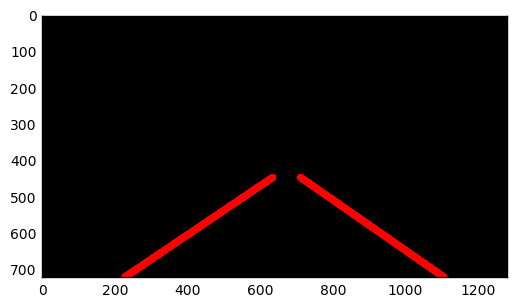

 18%|█▊        | 46/251 [00:37<02:52,  1.19it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


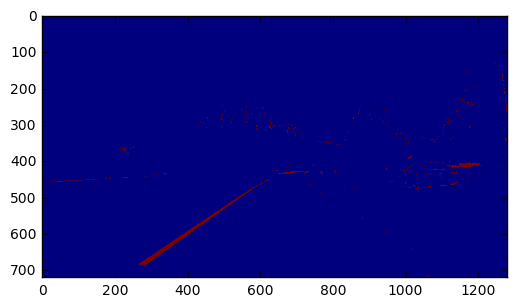

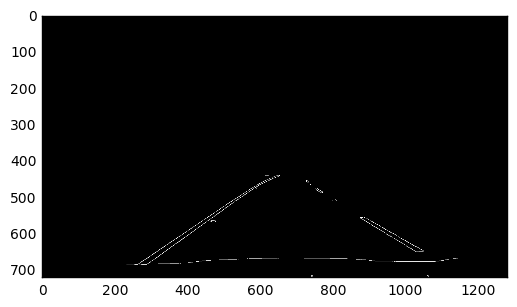

[-0.724252491694352, 893.7574750830564]
[-0.6731391585760513, 862.0355987055011]
[0.57725947521866, 44.63265306122337]
[-0.7261146496815294, 897.7515923566881]
[0.6010101010101003, 32.11616161616215]
[-0.7523219814241477, 907.4396284829716]
[-0.7531250000000003, 924.7531250000005]
[0.6000000000000001, 20.399999999999977]
[0.6246418338108882, 4.260744985673218]
[-0.7788461538461549, 922.3269230769237]
[-0.7258566978193153, 901.0311526479755]
[-0.7804054054054047, 935.0709459459454]
[-0.725552050473187, 898.7634069400633]
[-0.8986175115207375, 987.6313364055302]
[-0.8093645484949828, 941.9966555183943]
[-0.7002881844380404, 892.685878962536]
[-0.8109965635738834, 956.3058419243989]
[0.601880877742947, 20.034482758620708]
[0.5985663082437278, 31.74551971326108]
[0.695652173913041, -80.86956521738836]
[-0.8380281690140844, 976.3098591549299]
[-0.7534722222222221, 910.0416666666669]
[-0.6744868035190615, 866.7624633431085]
[0.5560344827586201, 63.728448275862725]
[0.6008583690987128, 31.115

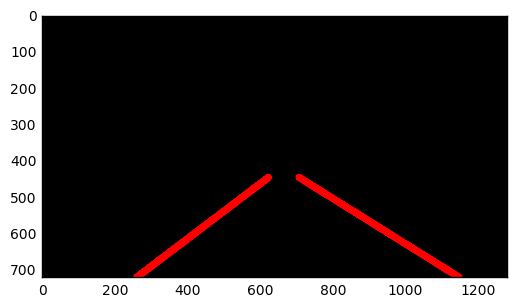

 19%|█▊        | 47/251 [00:38<02:48,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


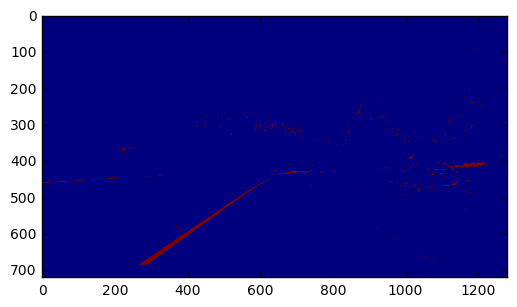

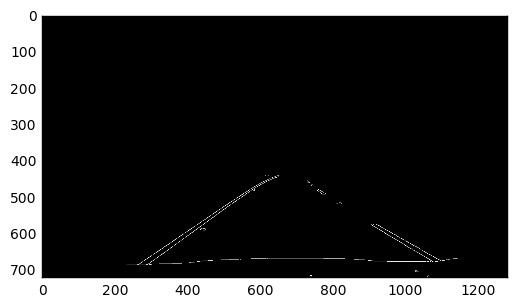

[-0.7247386759581882, 896.2926829268299]
[-0.6720257234726691, 861.742765273312]
[0.5754716981132068, 45.43396226415158]
[0.6242038216560506, 10.350318471337888]
[-0.7240259740259739, 894.9675324675322]
[-0.7796610169491517, 932.711864406779]
[0.6472303206997092, -16.830903790088513]
[0.6737804878048786, -33.83841463414694]
[0.6022408963585434, 20.761904761904873]
[-0.7524115755627008, 918.7524115755625]
[-0.7518248175182493, 912.5547445255479]
[0.5777126099706753, 41.82697947213961]
[0.6717557251908405, -41.32824427481014]
[-0.6799999999999872, 867.5199999999926]
[-0.7790697674418604, 931.2325581395348]
[-0.806569343065694, 945.9416058394162]
[-0.7253086419753088, 901.1419753086421]
[0.7518248175182481, -115.42335766423349]
[-0.7260273972602739, 893.3698630136987]
[-0.733333333333338, 883.3333333333348]
[0.5771812080536919, 107.34228187919393]
[0.5757575757575789, 51.060606060603085]
[0.839080459770114, -153.68965517241253]
[0.5517241379310265, 79.7241379310427]
middle 680
left [776, 

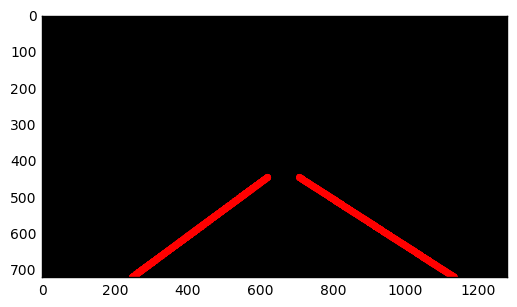

 19%|█▉        | 48/251 [00:38<02:51,  1.19it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


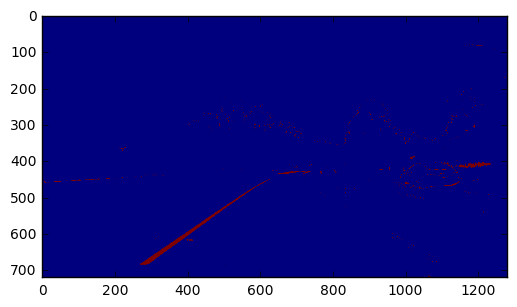

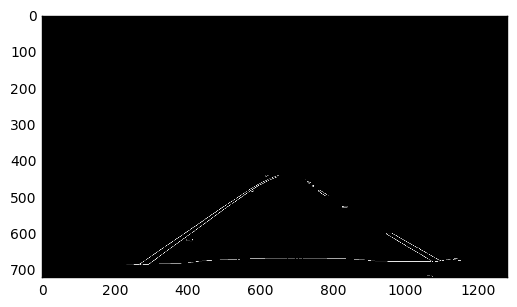

[-0.6737804878048782, 864.2256097560971]
[-0.7263843648208462, 896.8306188925077]
[-0.5555555555555536, 798.6666666666655]
[0.5984251968503927, 35.488188976379334]
[0.5778443113772457, 44.41616766467035]
[-0.7228915662650598, 885.1325301204813]
[0.598915989159892, 19.384823848238252]
[-0.5571428571428567, 802.0285714285715]
[0.6238805970149254, 6.080597014925]
[-0.5531914893617024, 796.3829787234041]
[-0.7269736842105258, 896.2763157894733]
[-0.7296137339055778, 906.6566523605138]
[-0.7248520710059162, 885.3343195266267]
[0.8109090909090918, -142.56363636363758]
[-0.7368421052631503, 888.7368421052597]
[0.6499999999999868, -32.44999999998584]
[-0.7792642140468233, 934.7023411371237]
[0.6710526315789473, -51.09210526315787]
[0.5779569892473116, 37.66935483871001]
[0.625377643504532, 6.3444108761325495]
[0.7804878048780484, -115.97560975609686]
[-0.807511737089204, 954.309859154931]
[-0.6982758620689657, 871.5344827586209]
[-0.7499999999999921, 894.7499999999967]
middle 707
left [945, 75

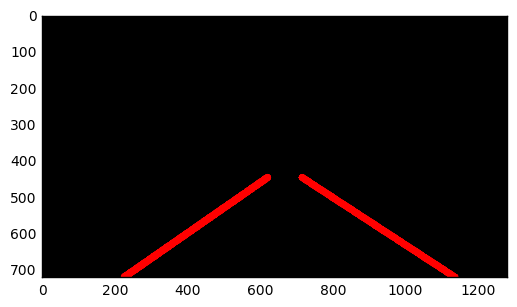

 20%|█▉        | 49/251 [00:39<02:46,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


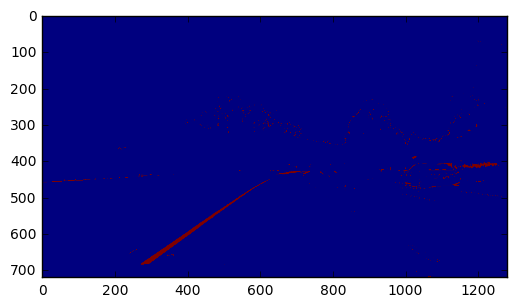

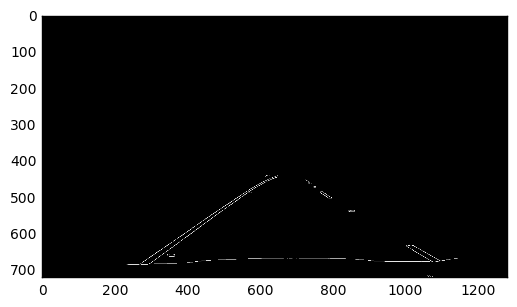

[-0.700000000000001, 872.6000000000003]
[-0.7249190938511318, 897.3009708737857]
[-0.6986301369863006, 876.4246575342461]
[0.64765100671141, -13.785234899329074]
[0.5524193548387097, 71.31048387096759]
[-0.6741573033707878, 872.4157303370791]
[-0.7142857142857113, 879.4285714285702]
[-0.7270029673590495, 887.8338278931747]
[0.6725978647686832, -27.209964412811264]
[-0.6740947075208915, 875.0947075208916]
[-0.7142857142857171, 892.5714285714305]
[-0.7, 877.4999999999999]
[-0.7765363128491611, 909.4189944134071]
[0.7272727272727275, -74.54545454545499]
[-0.7543252595155704, 911.8062283737024]
[-0.6740331491712707, 877.0994475138119]
[-0.8066666666666668, 920.9666666666668]
[0.7192982456140379, -92.05263157895]
[0.7824773413897285, -111.2084592145017]
[-0.6734693877551021, 872.6530612244899]
[-0.6996996996997004, 885.1141141141145]
[-0.7142857142857182, 894.4285714285738]
[-0.6666666666666666, 873.3333333333333]
[-0.7558139534883728, 898.89534883721]
[-0.6538461538461547, 872.653846153846

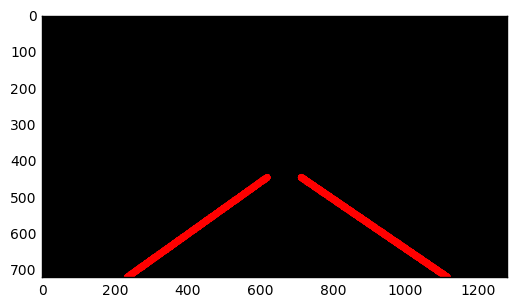

 20%|█▉        | 50/251 [00:40<02:47,  1.20it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


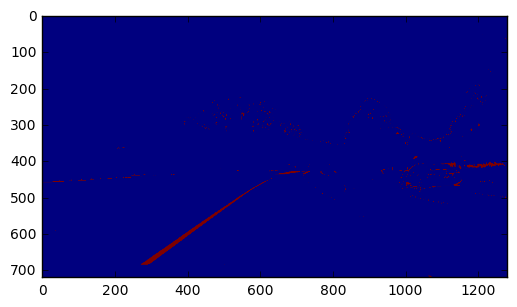

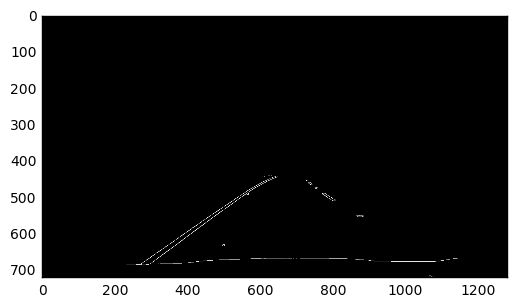

[-0.7270029673590513, 898.011869436202]
[-0.6964285714285713, 873.2142857142854]
[-0.6999999999999994, 876.0999999999996]
[0.6486486486486487, -13.162162162161795]
[-0.7261904761904758, 898.2261904761906]
[0.7021276595744678, -56.85106382978704]
[0.6249999999999989, 10.75000000000117]
[-0.7083333333333368, 875.5416666666678]
[-0.7524429967426709, 916.5048859934851]
[-0.7278106508875734, 892.6982248520707]
[0.6495468277945623, -13.468277945619826]
[0.5763239875389398, 47.23052959501691]
[0.6492753623188404, -17.7246376811592]
[-0.7260726072607256, 895.5610561056105]
[0.870466321243523, -216.01036269430006]
[0.6247191011235954, 50.17528089887686]
[-0.7115384615384587, 877.5961538461526]
[0.5560538116591929, 72.12556053811669]
[0.649122807017544, -16.263157894736928]
[0.869791666666667, -212.80729166666677]
[-0.6749999999999999, 873.9750000000003]
[-0.8074074074074074, 935.5185185185184]
middle 661
left [731, 729, 770, 732, 770, 725, 880, 863, 726, 877] right [630, 500, 623, 631, 317, 616

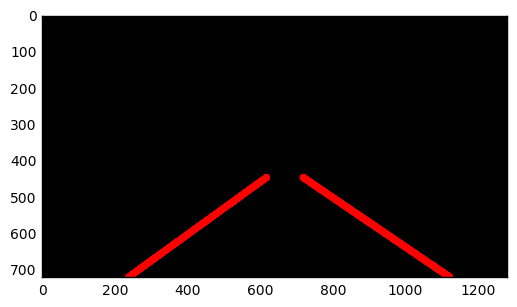

 20%|██        | 51/251 [00:41<02:42,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


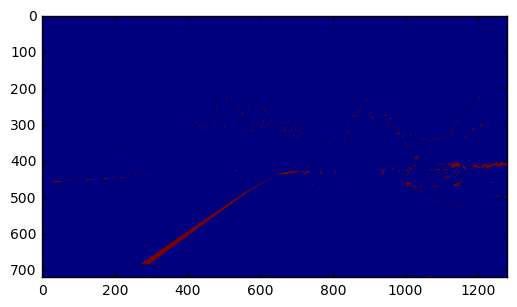

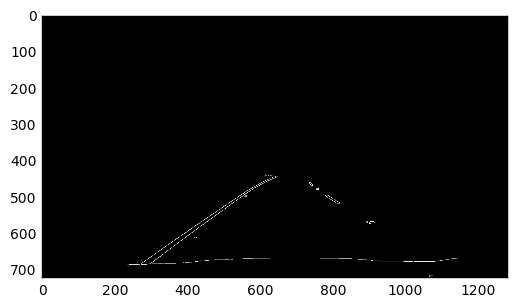

[-0.7261904761904763, 896.0476190476193]
[-0.6979472140762465, 873.4252199413494]
[-0.5578947368421038, 798.7052631578938]
[0.6253687315634222, 4.728613569321169]
[-0.7173913043478273, 878.5652173913046]
[0.6263736263736261, 10.538461538461762]
[0.6246056782334388, 6.7981072555206765]
[-0.833333333333334, 929.8333333333338]
[0.6727272727272725, -34.072727272726986]
[0.554517133956386, 65.14018691588804]
[-0.7254901960784309, 917.3333333333331]
[-0.894736842105264, 950.789473684211]
[-0.5809523809523793, 812.5809523809511]
[-0.750000000000002, 891.2500000000006]
[-0.7523219814241474, 913.9628482972131]
[-0.7307692307692375, 884.7307692307719]
[-0.752442996742671, 917.0097719869706]
[0.5555555555555565, 62.77777777777669]
[0.7254237288135594, -69.4610169491528]
[-0.6956521739130418, 888.0434782608689]
[-0.7532467532467533, 918.0129870129869]
[-0.8073089700996674, 942.1461794019932]
[0.675840978593272, -35.33639143730855]
[-0.7475728155339815, 900.5048543689323]
[-0.733333333333334, 904.0

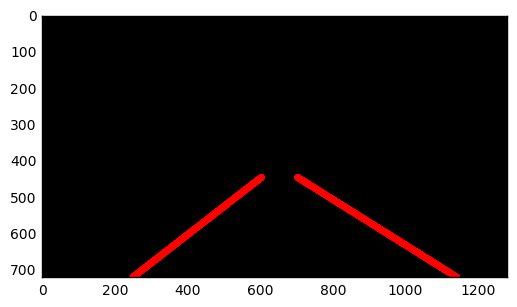

 21%|██        | 52/251 [00:42<02:39,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


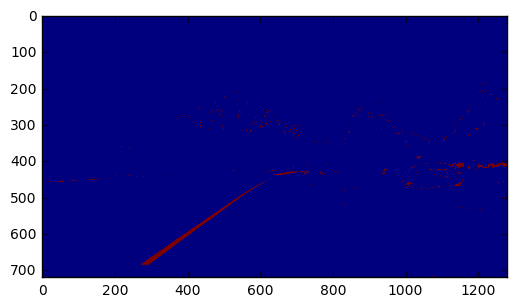

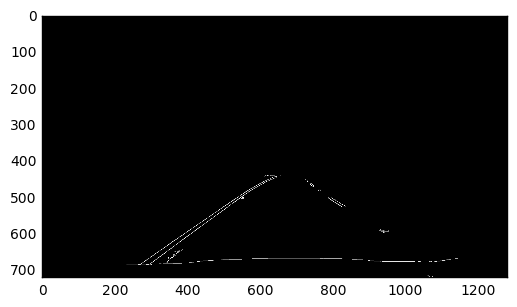

[-0.697872340425532, 874.0765957446807]
[-0.726190476190476, 896.3214285714283]
[0.5773809523809528, 43.34523809523809]
[0.6013745704467361, 29.920962199312054]
[-0.7162162162162166, 879.1621621621622]
[-0.556701030927835, 798.5051546391751]
[-0.6732394366197184, 878.892957746479]
[-0.8088235294117653, 950.3676470588236]
[-0.7530864197530858, 913.6913580246905]
[-0.7499999999999988, 892.2499999999994]
[-0.654545454545452, 897.0363636363627]
[-0.8076923076923077, 915.1923076923077]
[0.5563380281690133, 67.92253521126838]
[0.8401486988847583, -155.5873605947955]
[0.5777777777777776, 40.60000000000016]
[-0.6799999999999938, 879.1199999999974]
[-0.7788461538461526, 934.5673076923072]
[-0.6599999999999958, 876.3999999999986]
[-0.7500000000000001, 901.4999999999999]
[-0.6271186440677927, 864.3559322033885]
[-0.8659793814432978, 965.6288659793806]
[-0.865900383141763, 975.9923371647515]
[-0.864077669902914, 938.174757281554]
[0.5789473684210519, 45.526315789474324]
[-0.7857142857142827, 899.7

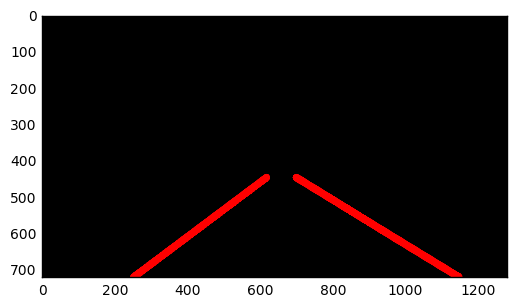

 21%|██        | 53/251 [00:42<02:40,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


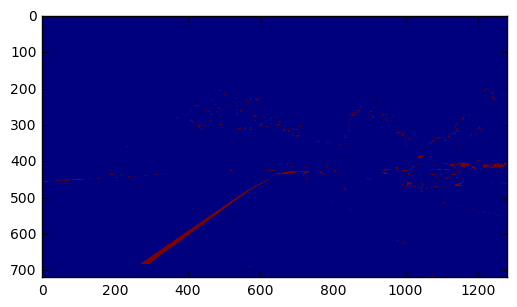

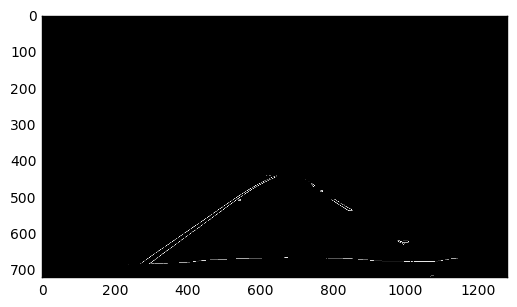

[-0.6721763085399441, 860.7823691460048]
[-0.726190476190476, 895.3214285714286]
[0.7019867549668871, -53.066225165562535]
[0.6498516320474773, -16.39169139465835]
[-0.6727828746177362, 862.9602446483175]
[-0.7261538461538459, 902.2984615384613]
[0.6753246753246758, -39.51948051948111]
[-0.7542087542087542, 913.5420875420876]
[0.600706713780918, 29.43816254417036]
[0.6239554317548752, 0.256267409470573]
[-0.7260273972602744, 898.7808219178086]
[-0.726072607260726, 896.1914191419139]
[-0.7531380753138075, 901.6569037656907]
[-0.6249999999999982, 1247.4999999999984]
[0.7473684210526307, -91.53684210526244]
[0.5770308123249294, 40.42016806722742]
[0.6239999999999993, 2.2480000000005247]
[0.7500000000000002, -90.75000000000024]
[-0.6739811912225704, 862.6050156739809]
middle 696
left [738, 730, 830, 795, 724, 746, 741, 748, 725] right [626, 627, 593, 627, 604, 614, 598, 528, 584]
(9, 2)
-24.3224045738 0.661136049028
SLOPE
888.237639105 -0.714525725641
ave 711 446
SLOPE
ave 618 446
x2 1125 

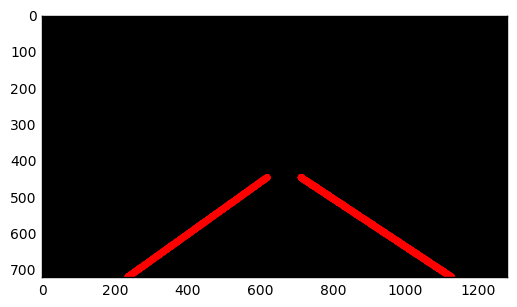

 22%|██▏       | 54/251 [00:43<02:36,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


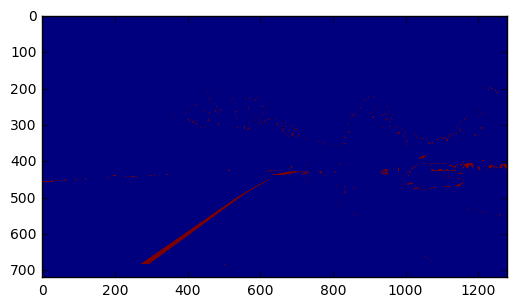

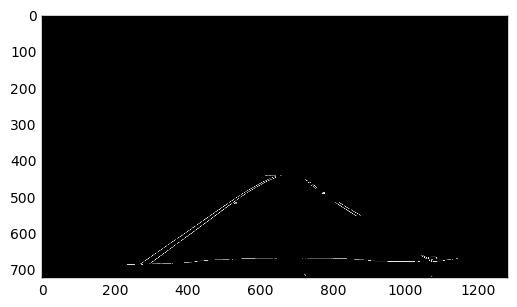

[-0.7240356083086062, 896.1424332344214]
[-0.6991404011461311, 872.7679083094552]
[0.6492753623188405, -17.07536231884039]
[-0.7240356083086047, 894.694362017804]
[0.579136690647482, 49.215827338129394]
[-0.7253731343283579, 887.1044776119401]
[0.5766016713091918, 41.314763231198384]
[0.5799086757990861, 51.2785388127857]
[-0.7546583850931676, 916.9440993788818]
[-0.7011494252873567, 872.609195402299]
[0.5750798722044727, 47.76357827476041]
[-0.752873563218391, 897.8160919540234]
[0.5769230769230764, 52.19230769230836]
[0.5536332179930796, 68.77162629757757]
[-0.7240356083086058, 888.9020771513354]
[-0.7499999999999986, 897.7499999999993]
[0.6086956521739152, 15.043478260868222]
[0.5545851528384278, 72.15720524017503]
[-0.805309734513276, 915.9292035398239]
[0.6245954692556631, 6.427184466019734]
[-0.8032786885245917, 916.1475409836074]
middle 670
left [724, 806, 740, 860, 769, 823, 806, 731, 849, 747] right [630, 619, 628, 615, 632, 617, 458, 620, 481, 401, 411]
(10, 2)
38.7089147295 

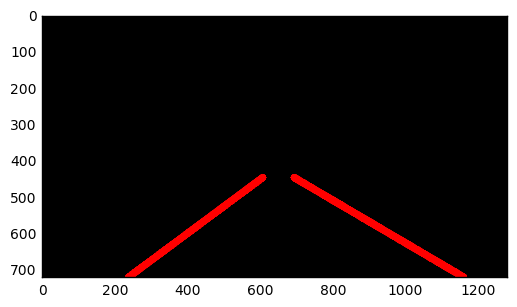

 22%|██▏       | 55/251 [00:44<02:35,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


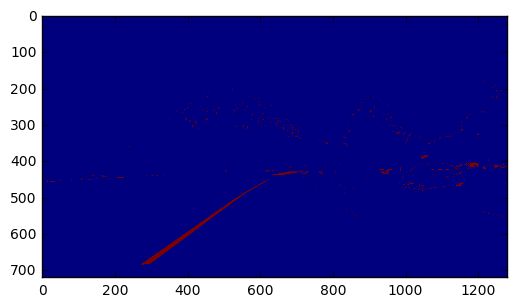

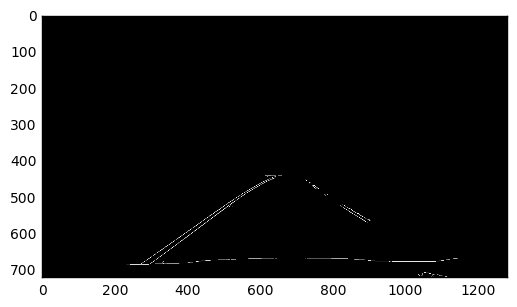

[-0.7510040160642572, 908.1244979919683]
[0.6260162601626024, 10.292682926828805]
[-0.6991404011461311, 872.7679083094552]
[0.5777126099706742, 42.98240469208246]
[-0.7813504823151124, 919.967845659164]
[-0.7523219814241492, 910.4489164086685]
[-0.7249999999999986, 901.8249999999994]
[-0.6749311294765841, 880.7300275482093]
[-0.7507692307692306, 912.9846153846153]
[-0.6982248520710069, 891.2603550295861]
[0.6238805970149256, 4.456716417909903]
[0.8371335504885996, -156.29315960912064]
[-0.7521739130434774, 900.8739130434778]
[0.80952380952381, -134.95238095238125]
[-0.7818181818181813, 929.6363636363632]
[-0.7261904761904763, 904.0357142857142]
[-0.6262626262626256, 860.3535353535351]
[-0.6730769230769237, 882.2115384615389]
[0.8093749999999994, -132.98749999999944]
[-0.7530864197530865, 915.1975308641979]
[0.8685258964143427, -181.1035856573706]
[0.5767543859649126, 99.87280701754344]
[-0.5766423357664238, 825.7007299270076]
[-0.5625000000000012, 844.7500000000006]
[-0.779816513761467

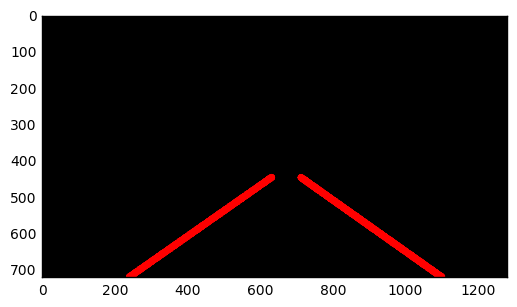

 22%|██▏       | 56/251 [00:45<02:33,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


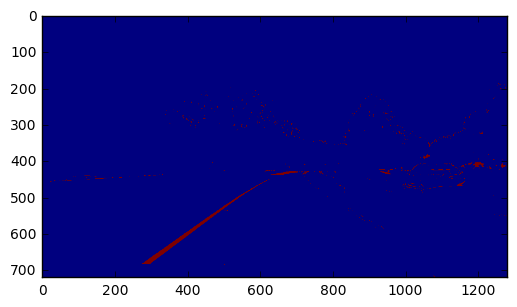

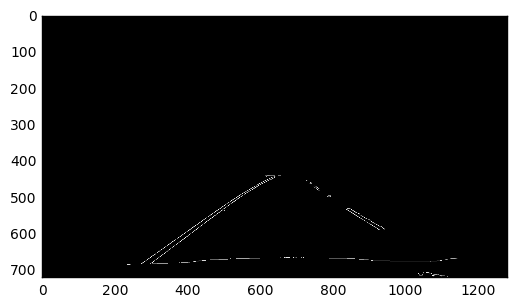

[-0.7523219814241483, 906.6873065015478]
[-0.7524752475247521, 909.039603960396]
[0.6010362694300522, 23.823834196890825]
[-0.7203389830508484, 880.661016949153]
[0.6026785714285711, 30.531250000000778]
[-0.7249999999999998, 884.1000000000001]
[-0.6489361702127665, 846.8829787234043]
[0.8975609756097555, -219.25853658536502]
[-0.7525423728813557, 911.7728813559316]
[0.6246498599439774, -0.49579831932731017]
[-0.8093645484949835, 937.1404682274245]
[-0.6240409207161116, 836.8900255754472]
[0.5983146067415734, 21.64044943820195]
[-0.739130434782604, 885.6956521739114]
[0.5991561181434599, 33.10548523206787]
[-0.7523219814241474, 913.9628482972131]
[-0.7523510971786833, 907.4576802507836]
[-0.7523219814241477, 914.7151702786373]
[-0.6026490066225171, 825.6688741721856]
[0.6480446927374298, -19.999999999999478]
[-0.7806451612903228, 934.9290322580648]
[0.6486486486486474, -13.891891891890777]
[-0.7222222222222203, 879.4444444444439]
[-0.7777777777777771, 931.5555555555545]
[0.6010101010101

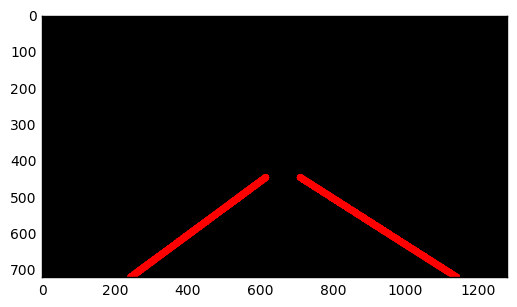

 23%|██▎       | 57/251 [00:46<02:34,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


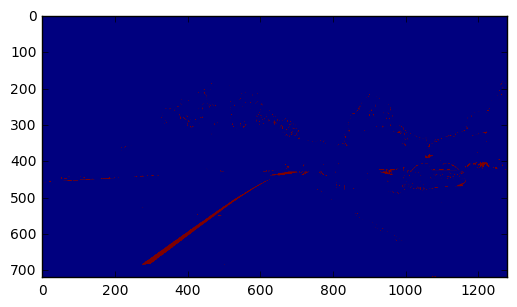

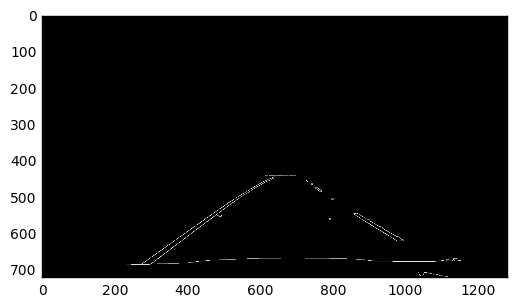

[-0.7002881844380402, 874.7780979827089]
[-0.7515527950310555, 907.9627329192547]
[0.5769230769230764, 47.11538461538494]
[0.6236842105263163, 12.776315789473054]
[-0.6249999999999996, 841.8749999999993]
[-0.6234096692111961, 839.6055979643766]
[0.5773955773955772, 43.32923832923854]
[0.6500000000000001, -16.550000000000164]
[0.626297577854671, 9.107266435986343]
[0.6238317757009346, 66.96728971962649]
[-0.7017543859649069, 878.0701754385935]
[-0.7500000000000074, 897.7500000000036]
[-0.8333333333333374, 1617.3333333333378]
[-0.7806451612903229, 933.5870967741938]
[0.552941176470588, 55.15294117647078]
[0.5995475113122165, 87.8733031674215]
[0.7777777777777758, -113.55555555555362]
[0.6748166259168707, 12.491442542786917]
[-0.7527675276752784, 907.571955719558]
[-0.6756756756756744, 862.9999999999993]
middle 663
left [681, 685, 687, 727, 688, 696, 740] right [618, 620, 643, 641, 610, 493, 631, 568, 555]
(7, 2)
5.339370113 0.626431342421
AVERAGE
882.688961867 -0.706788155476
ave 701 446

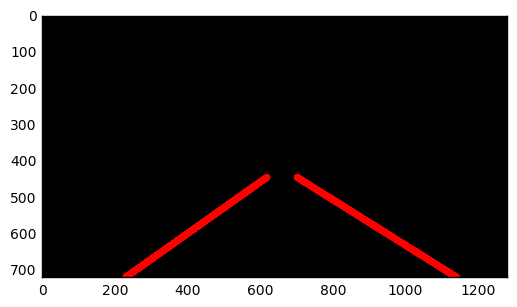

 23%|██▎       | 58/251 [00:46<02:32,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


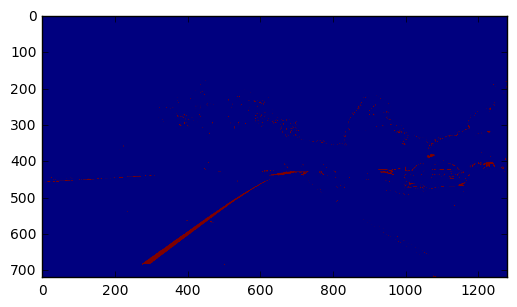

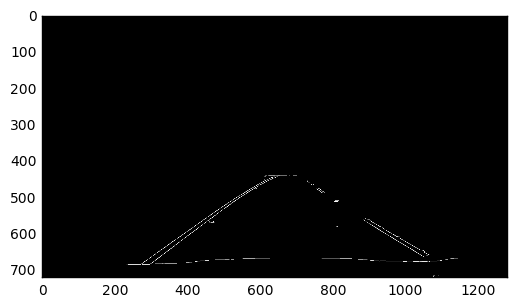

[-0.7531249999999994, 908.1843749999996]
[0.5994897959183677, 23.354591836734354]
[0.6010638297872342, 32.86170212765924]
[-0.6721763085399443, 860.4380165289249]
[-0.7523219814241491, 906.9349845201242]
[-0.6493055555555554, 854.9062500000001]
[0.6038961038961027, 31.038961038962555]
[0.6257142857142864, 0.8542857142847798]
[-0.674033149171271, 866.9889502762431]
[0.6005089058524168, 26.249363867684934]
[-0.8373983739837372, 929.520325203251]
[0.6190476190476183, 1.7142857142866583]
[-0.8297872340425557, 914.8510638297879]
[-0.8688524590163876, 930.8852459016372]
[0.6249999999999994, 1.00000000000045]
[-0.8669064748201428, 986.2841726618699]
[-0.6527777777777772, 849.6388888888887]
[0.5777777777777774, 40.75555555555589]
[0.6482758620689649, -22.841379310344326]
[0.8373015873015874, -158.62698412698433]
[0.6976744186046457, -82.67441860464507]
[0.6190476190476202, 15.619047619046666]
[-0.8958333333333336, 937.6249999999998]
[-0.8055555555555544, 913.7777777777776]
[-0.7541528239202656

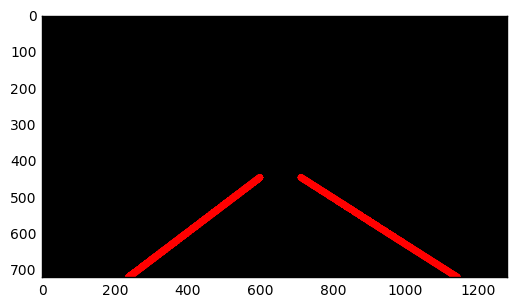

 24%|██▎       | 59/251 [00:47<02:30,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


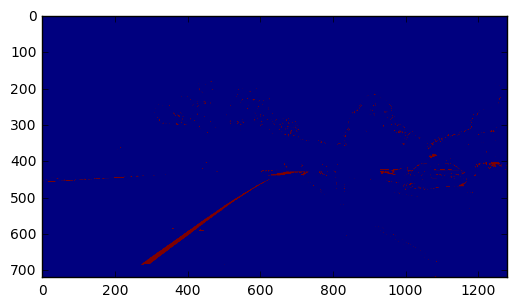

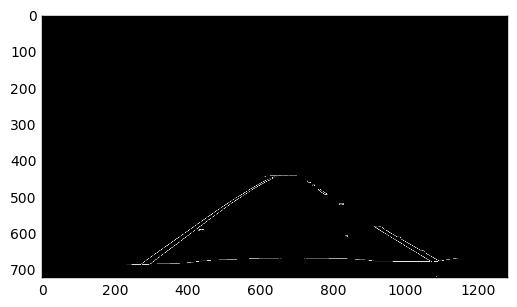

[-0.6472148541114067, 848.0981432360753]
[0.575980392156862, 46.60539215686369]
[-0.7252396166134193, 897.4952076677322]
[-0.7261904761904762, 895.595238095238]
[-0.7272727272727277, 881.818181818182]
[0.6720000000000003, -35.26400000000038]
[-0.7083333333333333, 889.375]
[-0.739130434782606, 887.478260869564]
[0.6226912928759892, 11.588390501319507]
[-0.7575757575757597, 896.78787878788]
[-0.6479999999999999, 847.0]
[-0.6991404011461325, 890.547277936963]
[-0.7727272727272773, 901.409090909093]
[0.677042801556421, -37.56420233463123]
[-0.584415584415584, 821.8051948051946]
[0.5780821917808229, 43.43561643835494]
[-0.8373702422145342, 975.2422145328725]
[-0.7024221453287197, 888.4429065743946]
[0.8394160583941614, -192.9270072992709]
[-0.6990291262135913, 880.4174757281547]
[-0.6747967479674805, 875.5691056910574]
[-0.7500000000000148, 890.2500000000052]
[-0.6256684491978606, 843.9197860962564]
[0.6494252873563215, -18.18390804597687]
[-0.8064516129032246, 939.5806451612898]
[-0.780898

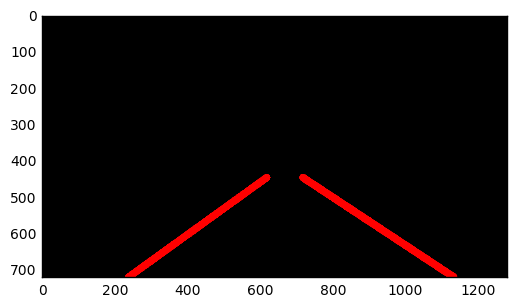

 24%|██▍       | 60/251 [00:48<02:34,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


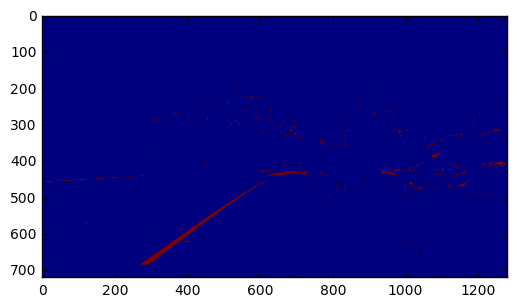

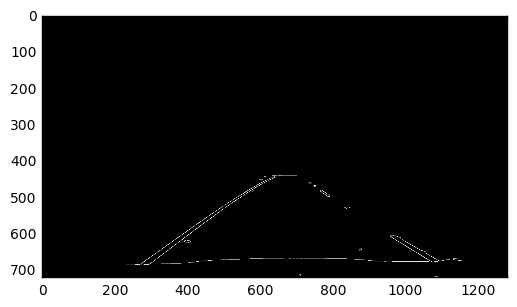

[-0.6994219653179196, 872.4450867052025]
[0.6236842105263152, 10.905263157895426]
[-0.7523219814241497, 906.1826625387]
[0.6005089058524169, 22.646310432570388]
[-0.7806451612903216, 927.5612903225797]
[-0.7525773195876302, 909.3505154639186]
[0.6239316239316239, 2.5299145299144796]
[-0.8695652173913041, 975.1739130434785]
[0.575980392156863, 45.45343137254895]
[-0.5544554455445544, 798.09900990099]
[0.6145833333333347, 6.479166666665308]
[0.6232294617563741, 2.0424929178466695]
[-0.8087248322147649, 946.6442953020133]
[-0.7258687258687261, 888.5173745173745]
[0.6000000000000001, 16.800000000000207]
[0.6235632183908049, 11.612068965516878]
[-0.8082191780821919, 936.0136986301368]
[0.6240601503759388, 7.526315789474499]
[-0.5804195804195809, 814.4405594405599]
[0.7878787878787826, -180.42424242423675]
[0.5785123966942148, 40.82644628099164]
[0.5531914893617026, 64.38297872340395]
[-0.7499999999999979, 899.7499999999986]
[-0.7810945273631847, 927.4079601990052]
middle 680
left [688, 695,

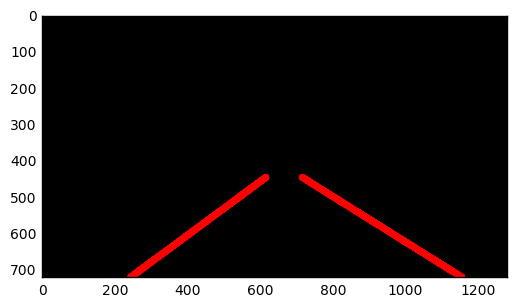

 24%|██▍       | 61/251 [00:49<02:34,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


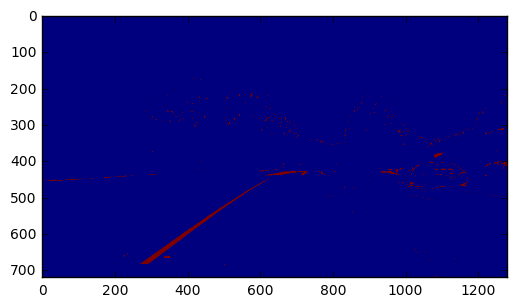

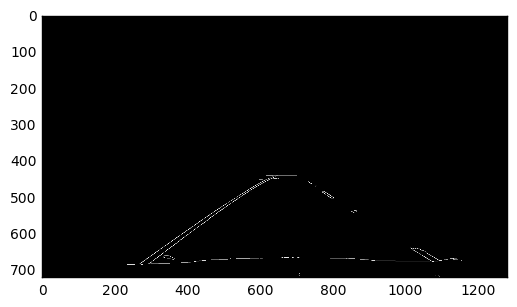

[-0.7538940809968848, 904.1370716510901]
[-0.6731301939058167, 857.6675900277005]
[-0.6774193548387089, 868.4516129032253]
[0.5999999999999998, 20.000000000000522]
[0.6233421750663127, 9.27055702917783]
[-0.7400000000000024, 883.6600000000009]
[-0.7400000000000017, 882.9000000000007]
[-0.6740331491712714, 867.6629834254148]
[-0.6504854368932037, 848.8543689320386]
[-0.7532467532467534, 902.4415584415584]
[-0.7786885245901626, 900.6967213114749]
[-0.8074324324324326, 961.3716216216217]
[0.5531914893617026, 66.5957446808506]
[-0.7499999999999994, 885.25]
[-0.896551724137931, 943.103448275862]
[-0.8313253012048194, 937.9879518072287]
[-0.7532467532467535, 900.9350649350654]
[-0.7894736842105348, 895.9473684210553]
[-0.7534246575342466, 915.6575342465752]
[-0.7999999999999983, 905.3999999999993]
[0.6491712707182324, 36.56629834254079]
[-0.8690476190476175, 957.1309523809516]
middle 590
left [735, 691, 675, 623] right [359, 335, 399, 307, 376, 504, 290, 353, 503]
(4, 2)
33.1081500131 0.6064

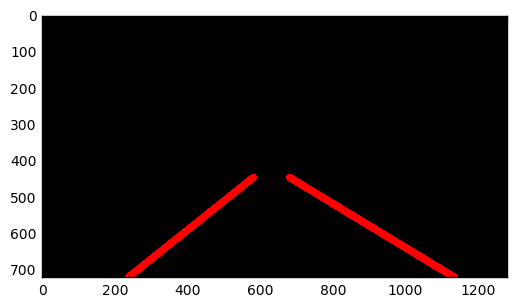

 25%|██▍       | 62/251 [00:50<02:32,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


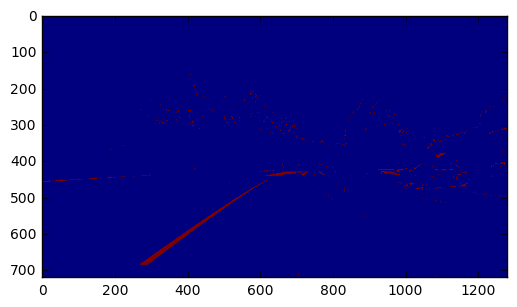

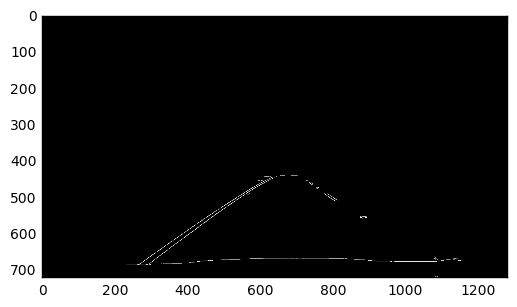

[-0.7275449101796404, 895.9880239520951]
[-0.6731301939058167, 861.013850415512]
[0.673846153846154, -37.27692307692322]
[-0.5551181102362207, 810.7086614173232]
[-0.6497326203208551, 857.8288770053475]
[-0.7250000000000009, 883.9250000000005]
[-0.6991404011461321, 883.8567335243551]
[0.6243386243386241, 8.333333333333897]
[-0.6721763085399453, 868.8319559228646]
[-0.7258064516129034, 896.2096774193552]
[-0.6507177033492826, 860.8564593301436]
[0.5547619047619048, 62.097619047618835]
[-0.7533333333333333, 913.766666666667]
[-0.6728971962616824, 862.6448598130843]
[-0.5609756097560996, 814.0731707317085]
[0.6736111111111112, -33.43055555555548]
[-0.7524429967426705, 900.9511400651462]
[0.7245762711864405, -79.45762711864418]
[-0.7272727272727185, 886.9999999999956]
[0.6011235955056184, 19.174157303370436]
[-0.6743119266055039, 859.2981651376147]
[-0.857142857142854, 970.5714285714264]
[-0.8050847457627103, 924.9322033898299]
[-0.8591549295774639, 950.7042253521124]
[-0.8086642599277984,

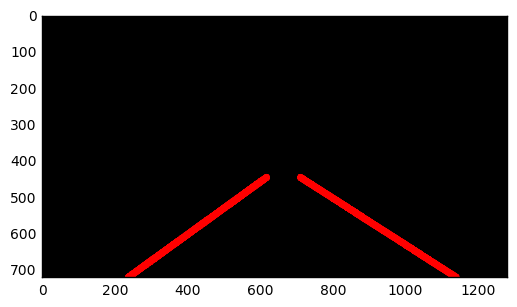

 25%|██▌       | 63/251 [00:50<02:29,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


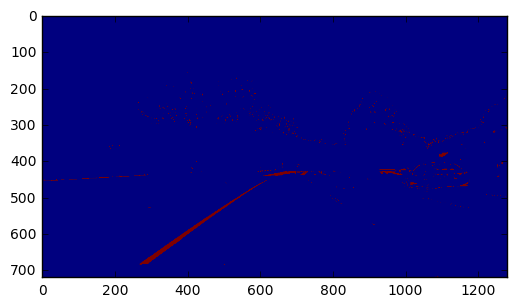

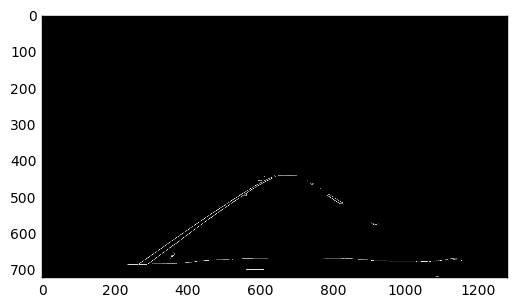

[-0.7253731343283584, 893.9074626865673]
[-0.6731301939058167, 858.6675900277006]
[-0.6731301939058167, 860.0138504155121]
[-0.7257525083612041, 893.2909698996656]
[0.5994897959183673, 27.352040816326923]
[0.6763005780346822, -39.43352601156073]
[-0.7191011235955068, 892.1573033707874]
[-0.7824675324675323, 931.0422077922073]
[0.6728971962616824, -34.25233644859828]
[-0.8391608391608388, 954.8881118881114]
[-0.5869565217391267, 869.6521739130419]
[-0.777777777777773, 891.5555555555542]
[0.5999999999999995, 17.600000000000893]
[-0.7000000000000001, 875.4]
[0.7777777777777846, -122.11111111111683]
[-0.6985507246376808, 869.8144927536229]
[-0.653846153846156, 898.7692307692316]
[-0.6744186046511637, 870.2558139534892]
[-0.8674242424242421, 970.9848484848483]
middle 646
left [690, 737, 736, 729, 796] right [623, 619, 621, 586, 626, 625, 610, 364, 290, 602, 611, 356, 635, 596]
(5, 2)
-30.168986551 0.665293069599
SLOPE
895.028543679 -0.7212206822
ave 715 446
SLOPE
ave 622 446
x2 1127 242


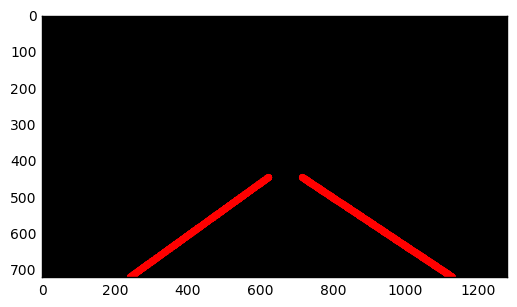

 25%|██▌       | 64/251 [00:51<02:34,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


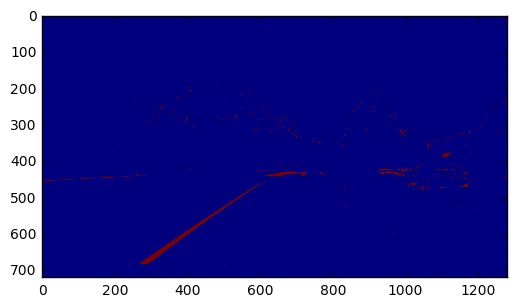

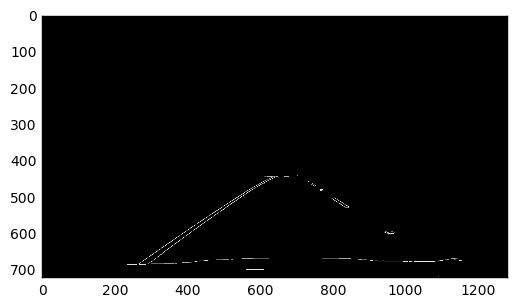

[-0.6487935656836459, 847.8471849865946]
[-0.7020408163265306, 883.1795918367346]
[-0.699421965317919, 883.635838150289]
[-0.6972477064220183, 868.0733944954128]
[0.675324675324675, -34.116883116883045]
[0.6256983240223463, -1.005586592178465]
[-0.7142857142857171, 874.7142857142867]
[-0.7333333333333198, 883.5999999999941]
[-0.7259036144578318, 903.6746987951813]
[-0.666666666666663, 859.6666666666644]
[-0.7008797653958941, 885.9560117302049]
[0.6231884057971018, -0.7826086956526781]
[-0.7692307692307693, 899.3846153846156]
[0.698051948051948, -53.1623376623379]
[-0.6746575342465755, 862.8082191780826]
[0.6259842519685038, 2.1850393700787794]
[-0.749999999999987, 888.7499999999945]
[-0.8988764044943782, 946.168539325841]
[0.7809523809523804, -142.2190476190469]
[-0.7261538461538459, 902.2984615384613]
[0.672985781990521, -37.35545023696653]
[0.5519125683060113, 383.3060109289614]
[-0.8066666666666682, 919.8066666666674]
[-0.8095238095238086, 920.0476190476185]
[0.7758620689655169, -11

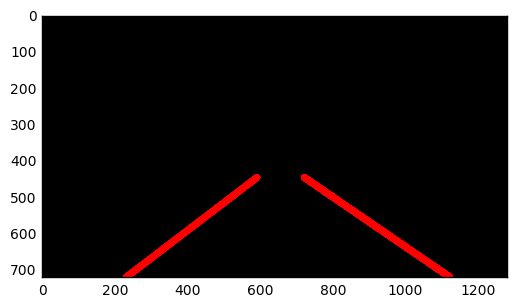

 26%|██▌       | 65/251 [00:52<02:32,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


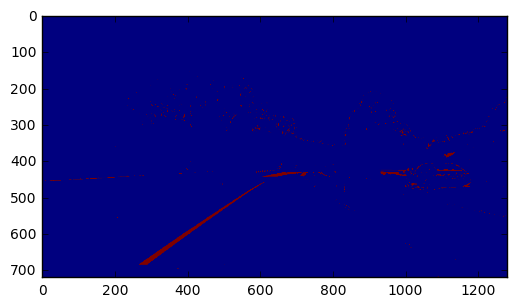

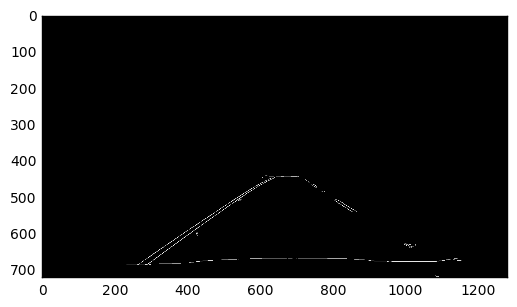

[-0.724242424242425, 893.3060606060611]
[-0.6734006734006739, 862.1043771043774]
[-0.7210884353741508, 893.9591836734702]
[0.5559322033898311, 63.5864406779654]
[0.6237288135593221, 0.6677966101693656]
[-0.8122866894197951, 944.5563139931735]
[-0.8441558441558457, 969.2207792207801]
[0.6005154639175263, 22.038659793813366]
[0.5771144278606974, 44.7910447761182]
[-0.5560344827586209, 816.668103448276]
[-0.7812499999999982, 903.9687499999993]
[0.5761772853185592, 39.052631578947796]
[-0.7478991596638661, 905.5546218487395]
[0.5993690851735014, 25.085173501577636]
[-0.5528455284552842, 799.1626016260158]
[0.5540540540540542, 64.54054054054036]
[0.7545454545454534, 282.40909090909133]
[0.5785536159600994, 35.85536159601065]
[-0.811594202898552, 944.942028985508]
[-0.7513513513513511, 906.3297297297295]
[0.7821782178217823, 265.83168316831643]
[-0.8067796610169488, 945.2033898305086]
middle 628
left [803, 722, 701, 690, 741, 769, 804, 702] right [619, 560, 624, 615, 621, 467, 407, 569, 616,

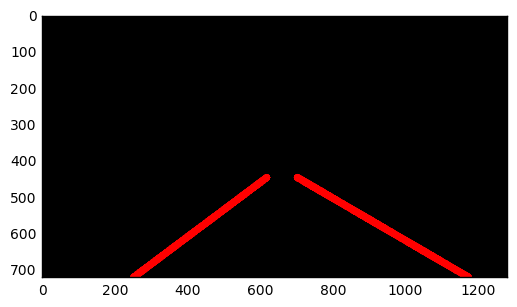

 26%|██▋       | 66/251 [00:53<02:31,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


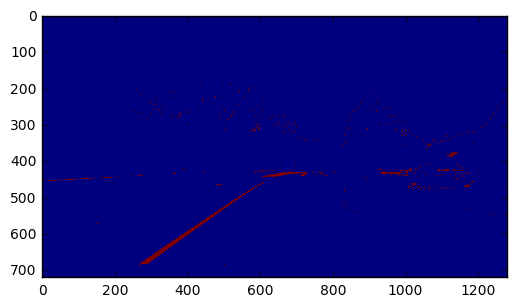

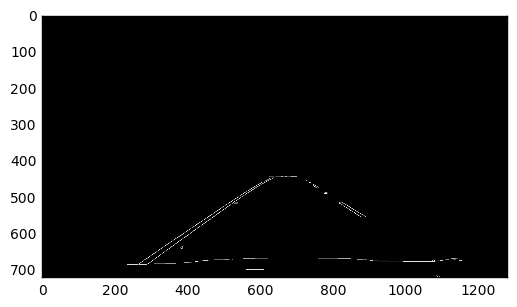

[-0.6741573033707859, 860.9550561797752]
[-0.6985507246376811, 881.991304347826]
[0.5989717223650387, 22.719794344473296]
[0.6239554317548752, 0.256267409470573]
[-0.7005813953488379, 886.0668604651165]
[-0.6733524355300862, 874.212034383954]
[0.6239999999999999, 8.071999999999948]
[-0.6022727272727244, 822.8295454545436]
[0.6225490196078429, -0.08823529411720565]
[-0.7250755287009064, 905.1480362537766]
[0.6231454005934722, -0.11275964391722557]
[-0.6038961038961033, 844.0324675324672]
[0.6246153846153851, 4.289230769229925]
[-0.625925925925926, 850.4962962962962]
[-0.7269841269841264, 899.9142857142854]
[-0.6851851851851819, 866.6666666666652]
[-0.8000000000000023, 900.4000000000007]
[-0.7232704402515727, 884.8113207547177]
[-0.5930232558139544, 818.709302325582]
[-0.6756756756756751, 876.3783783783781]
[-0.7500000000000152, 883.5000000000042]
[0.5770308123249297, 37.68907563025199]
middle 650
left [700, 724, 697, 882, 748, 752, 744] right [617, 627, 631, 630, 629, 636, 419, 536, 612

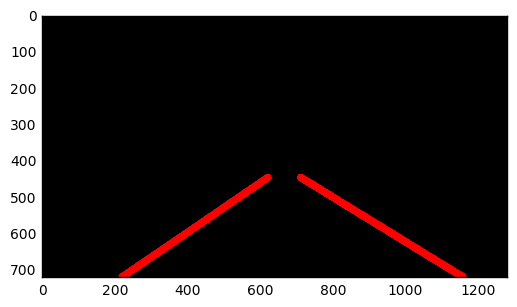

 27%|██▋       | 67/251 [00:54<02:29,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


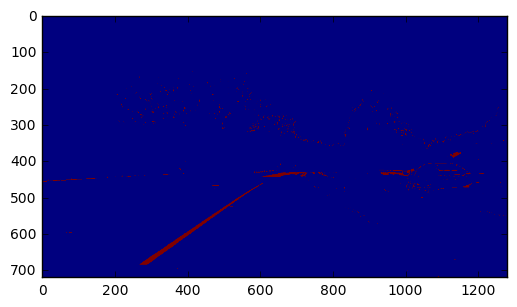

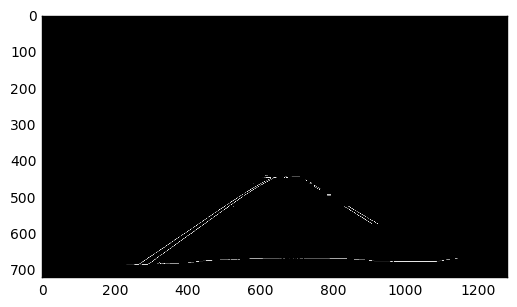

[-0.6732394366197185, 862.7352112676057]
[-0.724770642201835, 896.082568807339]
[0.6490250696378823, -13.562674094706662]
[0.5999999999999998, 20.40000000000046]
[-0.7241379310344832, 897.1379310344829]
[-0.7264437689969602, 894.942249240121]
[-0.7803278688524602, 937.3868852459025]
[0.6969696969696973, -57.60606060606121]
[0.7199999999999969, -71.35999999999765]
[-0.7242424242424242, 900.5484848484849]
[0.6005221932114883, 83.6840731070495]
[-0.7809187279151936, 932.1130742049467]
[0.6480938416422286, -17.75659824046865]
[-0.7260273972602734, 895.7260273972599]
[0.6021505376344082, 19.41935483871034]
[0.6726726726726725, -34.01501501501514]
[-0.6481481481481481, 838.3148148148147]
[-0.5991735537190084, 1023.7107438016532]
[-0.7500000000000014, 917.0000000000008]
middle 676
left [705, 706, 790, 738, 731, 735, 724] right [619, 621, 623, 618, 631, 629, 602, 585, 613, 620]
(7, 2)
-22.0687133025 0.655558831222
SLOPE
897.198724686 -0.725825634527
ave 713 446
SLOPE
ave 621 446
x2 1131 244


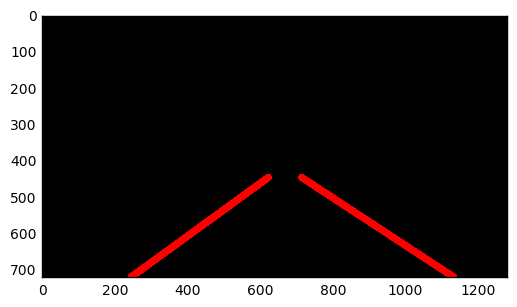

 27%|██▋       | 68/251 [00:55<02:28,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


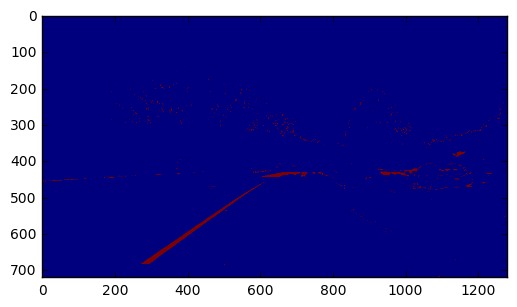

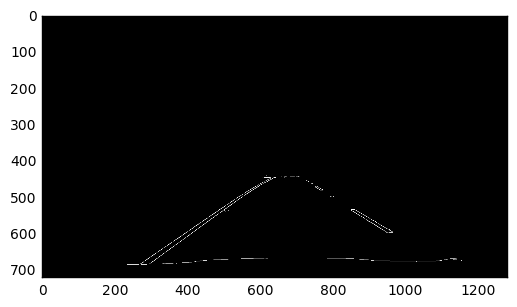

[-0.6732394366197185, 862.7352112676057]
[-0.7256097560975603, 897.3292682926824]
[0.5768261964735523, 39.6448362720395]
[0.5760598503740646, 48.82294264339191]
[-0.7238095238095225, 882.5999999999989]
[-0.7267080745341618, 898.739130434783]
[0.578947368421052, 34.26315789473748]
[0.5542168674698794, 66.02409638554211]
[-0.7333333333333383, 883.6666666666683]
[-0.7209302325581396, 899.906976744186]
[-0.8676470588235289, 980.4705882352936]
[-0.7798165137614682, 934.1467889908257]
[-0.7011494252873567, 872.609195402299]
[0.5773195876288668, 36.56701030927782]
[-0.6013986013986015, 975.9090909090908]
[0.5761589403973507, 42.52980132450365]
[-0.576512455516015, 826.6512455516016]
[0.5539033457249082, 71.11524163568696]
[0.5756302521008411, 245.0630252100834]
[-0.8636363636363641, 936.1818181818184]
middle 627
left [701, 686, 706, 682, 704, 794, 675] right [619, 622, 378, 623, 335, 616, 617, 617, 380]
(7, 2)
48.423869495 0.57049030807
SLOPE
905.386518608 -0.754994387323
ave 696 446
SLOPE
av

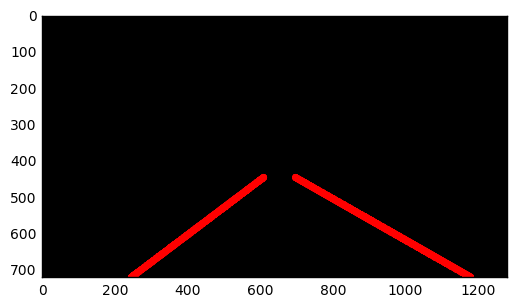

 27%|██▋       | 69/251 [00:55<02:26,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


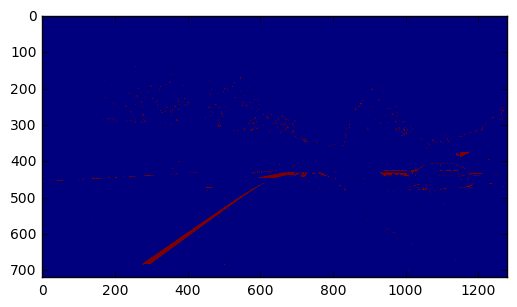

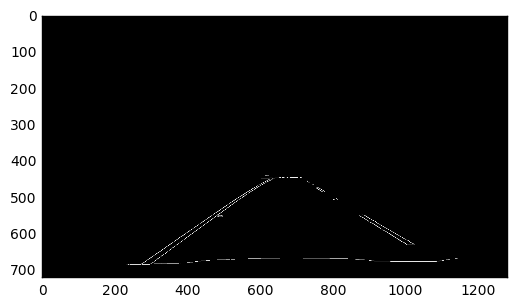

[-0.723926380368098, 899.0061349693256]
[-0.6732954545454544, 865.4431818181819]
[0.6236559139784942, 5.9462365591405435]
[0.5994764397905752, 19.172774869110633]
[-0.6749999999999994, 865.1499999999996]
[0.6005361930294911, 17.412868632706843]
[-0.7241379310344831, 901.0344827586206]
[-0.7352941176470594, 885.8823529411765]
[-0.7539936102236419, 921.2619808306705]
[-0.7254237288135601, 896.8237288135598]
[0.6999999999999983, -61.399999999998535]
[0.8389513108614228, -65.4382022471906]
[-0.8688524590163941, 983.2131147540987]
[-0.6491712707182324, 860.2237569060777]
[0.6436781609195386, -27.896551724136028]
[-0.6024096385542181, 843.9638554216876]
[0.6224489795918379, 9.04081632652969]
[0.6315789473684185, -14.684210526312997]
[0.620481927710843, 6.078313253012266]
[-0.6491228070175434, 858.5087719298239]
[0.6231884057971019, 7.44927536231842]
[-0.7813504823151134, 922.8745980707403]
middle 679
left [704, 712, 722, 812, 1005, 702, 997, 709, 800] right [623, 620, 618, 627, 314, 629, 587

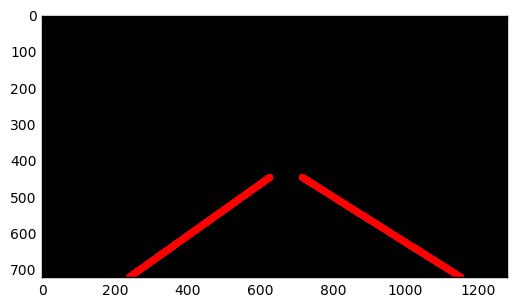

 28%|██▊       | 70/251 [00:56<02:25,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


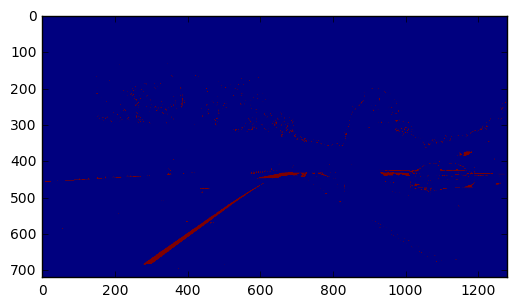

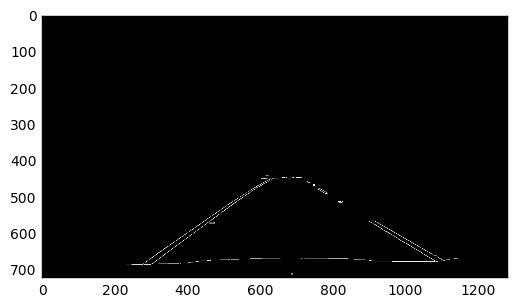

[-0.6732954545454544, 865.4431818181819]
[0.6000000000000001, 26.000000000000295]
[-0.7247706422018354, 900.2568807339453]
[0.5751295336787563, 41.108808290155665]
[0.5768261964735512, 38.33753148614629]
[-0.6747404844290653, 867.6885813148785]
[-0.8104575163398707, 955.3464052287593]
[-0.6755162241887916, 886.0855457227144]
[0.5541871921182268, 53.081280788177565]
[-0.6497005988023947, 861.5598802395203]
[0.6005221932114883, 27.436031331592712]
[-0.7515151515151516, 917.6969696969697]
[0.6006097560975598, 23.137195121952434]
[0.6005221932114883, 26.835509138380935]
[-0.7812500000000002, 938.6250000000003]
[-0.6246246246246253, 852.3813813813816]
[-0.6788321167883227, 866.839416058395]
[-0.6502732240437153, 875.5300546448085]
[-0.8091603053435112, 949.3053435114498]
[-0.7294117647058823, 908.2588235294121]
[-0.6734693877551016, 870.8979591836732]
[-0.6475409836065567, 862.7213114754093]
[-0.5599999999999996, 804.24]
[0.6010101010101014, 20.484848484848197]
middle 670
left [700, 704, 70

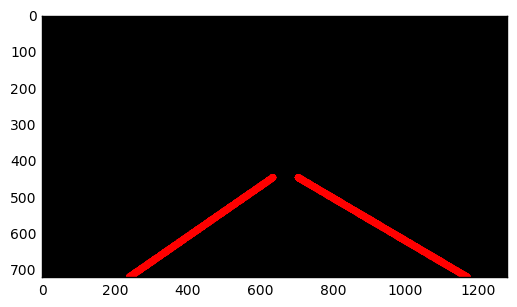

 28%|██▊       | 71/251 [00:57<02:22,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


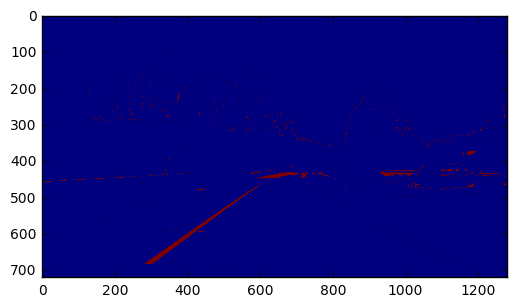

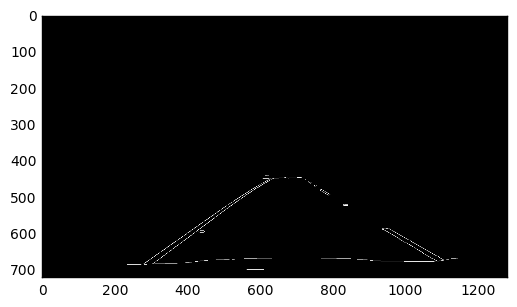

[-0.7002967359050445, 878.9821958456972]
[-0.7516129032258058, 911.9935483870963]
[0.5539215686274507, 60.36274509803947]
[0.5989583333333329, 25.53125000000009]
[-0.7524115755627011, 915.4951768488744]
[0.5994764397905752, 19.172774869110633]
[0.6016260162601623, 24.861788617886024]
[0.5525672371638138, 62.96577017114934]
[-0.7524115755627018, 921.5144694533765]
[-0.7268041237113392, 907.5257731958754]
[0.7527272727272726, -93.7927272727271]
[-0.8369565217391295, 977.4456521739123]
[-0.89922480620155, 988.6356589147285]
[-0.6999999999999998, 877.8]
[-0.8705035971223024, 975.4892086330937]
[0.6005361930294911, 17.412868632706843]
[-0.8377358490566039, 968.5056603773583]
[-0.8381294964028777, 971.1546762589927]
[0.600619195046439, 21.92569659442762]
[0.6007751937984489, 24.759689922481694]
[-0.8379310344827593, 959.5172413793106]
[-0.7292418772563188, 903.4837545126364]
[-0.8994708994709006, 983.4232804232811]
middle 666
left [698, 702, 712, 700, 695, 749, 722, 766, 826] right [614, 616

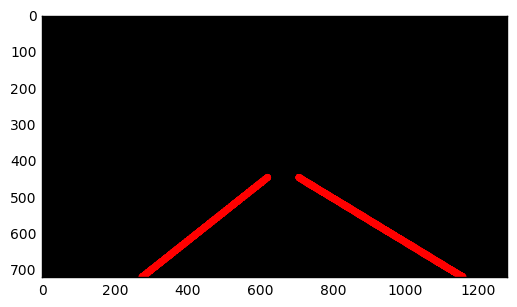

 29%|██▊       | 72/251 [00:58<02:23,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


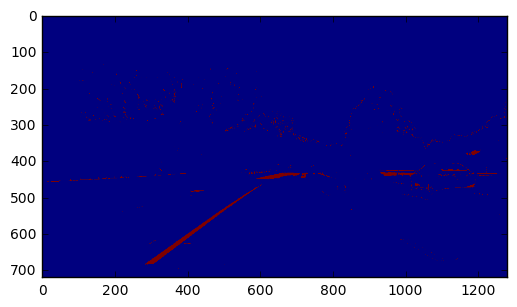

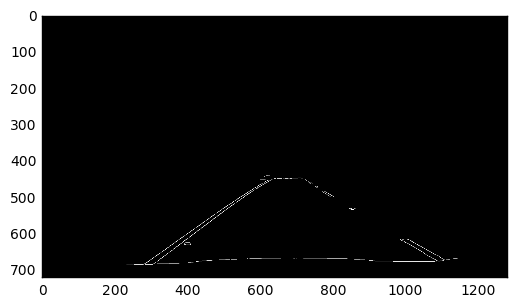

[-0.6985074626865669, 879.5820895522385]
[-0.7253086419753086, 901.8672839506169]
[-0.7253086419753086, 904.7685185185185]
[0.576923076923076, 34.92307692307806]
[0.5994764397905757, 24.36910994764421]
[0.5761421319796952, 37.939086294416605]
[-0.7004048582995941, 893.356275303643]
[0.5994764397905756, 23.170157068063048]
[-0.8392857142857136, 957.3214285714284]
[-0.7245901639344265, 906.3475409836068]
[-0.7000000000000055, 891.4000000000037]
[0.5999999999999934, 25.00000000000671]
[0.5909090909090948, 22.13636363635948]
[-0.698412698412699, 883.349206349207]
[0.6000000000000003, 26.199999999999857]
[-0.8073089700996682, 942.9534883720933]
[-0.7260726072607263, 905.9042904290428]
[0.5992647058823523, 18.132352941177384]
[-0.6277372262773718, 843.569343065693]
[-0.6510067114093955, 856.1610738255027]
[0.5945945945946022, 17.837837837829724]
[-0.7251655629139083, 889.1523178807953]
middle 720
left [1000, 1005, 843, 724, 1006] right [615, 623, 627, 633, 614, 616, 622, 599, 623, 610, 619, 

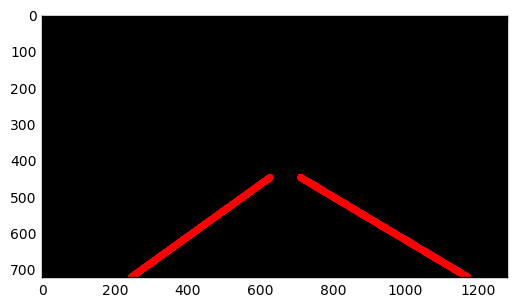

 29%|██▉       | 73/251 [00:58<02:19,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


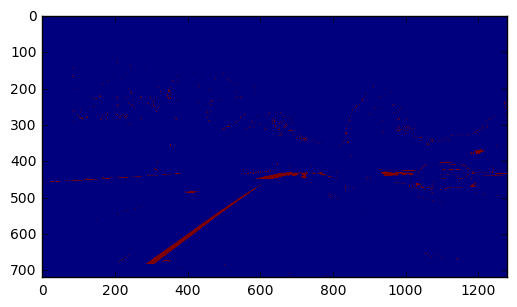

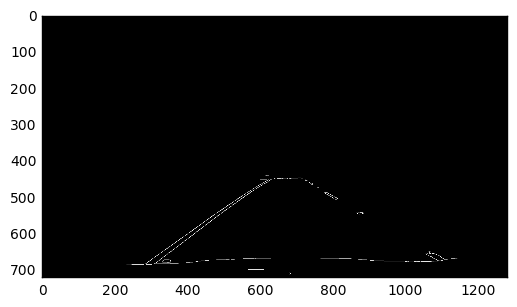

[-0.7261904761904757, 889.5119047619047]
[-0.752411575562701, 915.7427652733119]
[-0.7516129032258067, 912.4903225806449]
[-0.6491712707182319, 855.0828729281765]
[-0.7794117647058812, 913.367647058823]
[0.5530864197530861, 55.414814814814946]
[-0.5757575757575761, 813.8787878787878]
[-0.7540453074433654, 915.4919093851131]
[-0.7586206896551695, 902.8620689655158]
[-0.8124999999999878, 927.8124999999947]
[0.7263843648208469, -74.80781758957663]
[-0.7818791946308717, 939.4563758389256]
[-0.7267080745341623, 917.7267080745346]
[-0.5793650793650788, 817.8968253968249]
[-0.7599999999999913, 907.2799999999958]
[0.5544554455445544, 53.33663366336642]
[-0.5772058823529408, 1049.363970588235]
[-0.7777777777777686, 910.777777777774]
[-0.7267080745341614, 923.5403726708071]
[-0.6307692307692295, 849.0153846153836]
[-0.7253731343283579, 887.1044776119401]
[0.5993485342019546, 22.905537459283085]
[-0.7586206896551758, 905.6896551724151]
[-0.5980861244019149, 1067.1196172248815]
middle 660
left [70

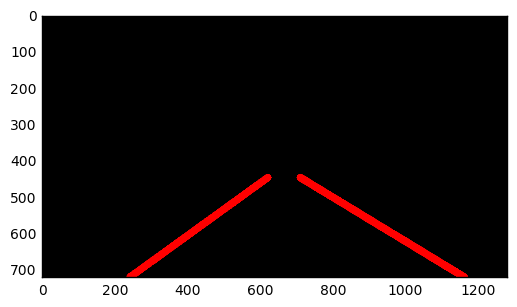

 29%|██▉       | 74/251 [00:59<02:19,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


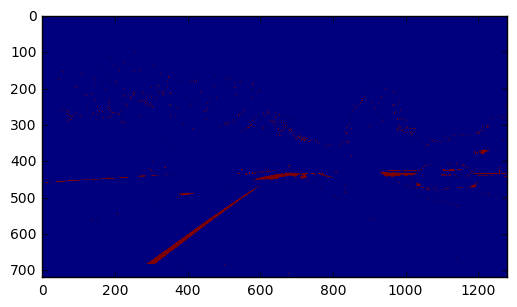

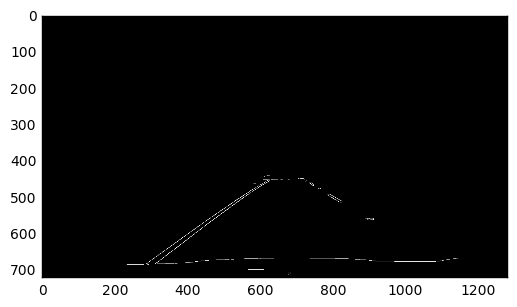

[-0.6743515850144101, 869.0979827089342]
[-0.676384839650146, 874.0641399416909]
[0.6005291005291001, 22.023809523810076]
[-0.6757990867579912, 870.6712328767122]
[-0.725552050473186, 907.9211356466876]
[0.5989304812834226, 18.572192513369103]
[-0.8075313807531381, 937.8242677824272]
[0.6000000000000012, 23.1999999999985]
[-0.8384615384615371, 958.3307692307683]
[-0.5785714285714283, 834.1714285714286]
[-0.7047619047619035, 891.0666666666658]
[-0.6260869565217401, 859.4608695652178]
[0.6010638297872335, 18.63829787234093]
[-0.5531914893617024, 824.404255319149]
[-0.6745562130177517, 875.2485207100598]
[-0.8625954198473288, 969.1832061068703]
[-0.8078291814946623, 935.2740213523139]
[-0.6494252873563222, 864.1034482758622]
[-0.5789473684210525, 832.6842105263153]
[-0.5785953177257515, 836.501672240802]
[0.6010638297872342, 17.436170212766093]
[-0.8351063829787235, 949.7021276595746]
middle 669
left [711, 722, 708, 716, 718] right [620, 624, 621, 627, 614, 617, 664, 623, 654, 623, 610, 5

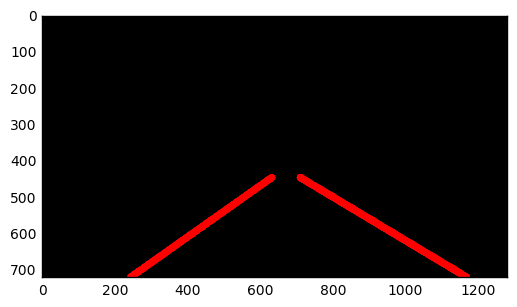

 30%|██▉       | 75/251 [01:00<02:20,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


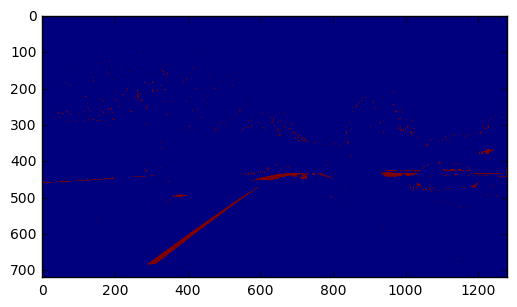

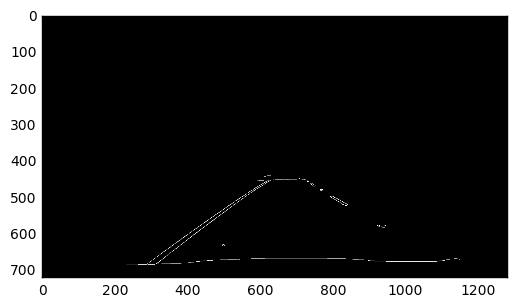

[-0.7261904761904762, 891.9642857142857]
[-0.7524429967426707, 918.7622149837132]
[0.6243093922651932, 3.3701657458563754]
[-0.7820512820512827, 931.1282051282059]
[-0.7248520710059174, 893.0325443786986]
[-0.7250000000000004, 895.2500000000003]
[-0.8373702422145333, 960.1695501730107]
[-0.7251655629139074, 906.1754966887415]
[0.5989304812834224, 20.368983957219484]
[0.598901098901099, 18.005494505494376]
[0.6243093922651929, 4.618784530387018]
[-0.7806451612903216, 921.535483870967]
[0.6995884773662537, -63.864197530862526]
[-0.6987951807228922, 898.8313253012049]
[-0.8983739837398369, 1012.6016260162601]
[-0.6978851963746224, 891.5740181268882]
[-0.6764705882352942, 887.2647058823533]
[-0.672463768115942, 882.7043478260869]
[-0.6790123456790135, 890.0617283950619]
[0.7797833935018051, -114.48014440433207]
[0.6434108527131782, -17.232558139534405]
[-0.7516778523489925, 919.785234899328]
middle 670
left [717, 719, 733, 715, 816, 738, 807] right [621, 619, 628, 625, 610, 620, 607, 613, 

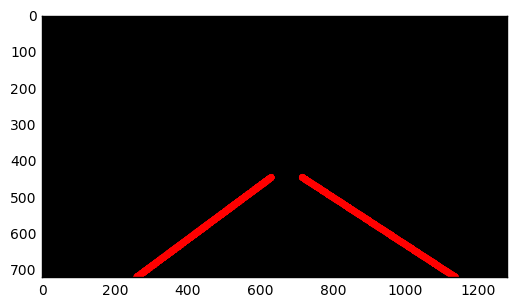

 30%|███       | 76/251 [01:01<02:17,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


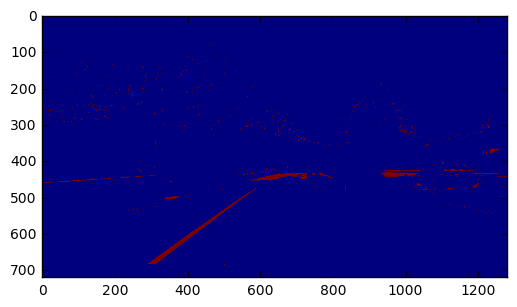

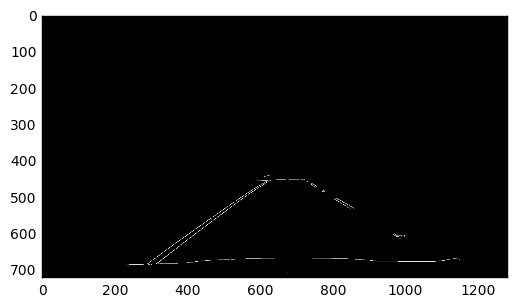

[-0.7244897959183668, 904.2448979591828]
[-0.7263843648208465, 906.2736156351787]
[-0.699088145896656, 882.5410334346502]
[0.5989445910290239, 24.94722955145074]
[-0.7241379310344829, 902.2413793103449]
[0.5525000000000005, 57.06749999999958]
[-0.6258741258741265, 868.8321678321682]
[-0.578005115089514, 848.6675191815854]
[-0.5714285714285726, 808.7142857142865]
[-0.6754966887417219, 890.3973509933775]
[0.5543478260869568, 56.119565217391006]
[-0.7524752475247525, 923.7920792079203]
[0.6495726495726493, -19.13675213675175]
[-0.7012195121951228, 882.4451219512198]
[-0.5617977528089882, 838.7078651685391]
[-0.571428571428569, 809.7142857142841]
[-0.6229946524064172, 868.7834224598931]
[-0.6005361930294908, 869.5737265415554]
[-0.7266187050359705, 908.8633093525178]
middle 671
left [708, 713, 743, 733] right [598, 613, 613, 619, 666, 605, 649, 623, 611, 416, 598, 669, 626]
(4, 2)
29.749385658 0.588841266672
SLOPE
876.580831903 -0.667956466547
ave 706 446
SLOPE
ave 644 446
x2 1172 234


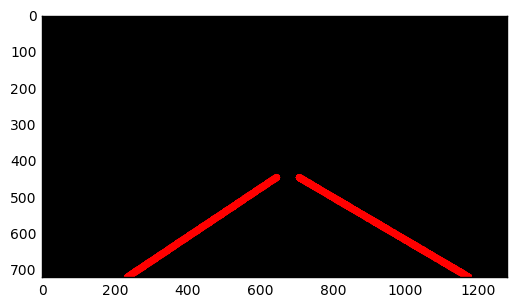

 31%|███       | 77/251 [01:02<02:15,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


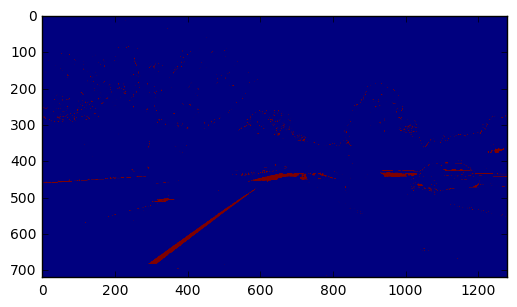

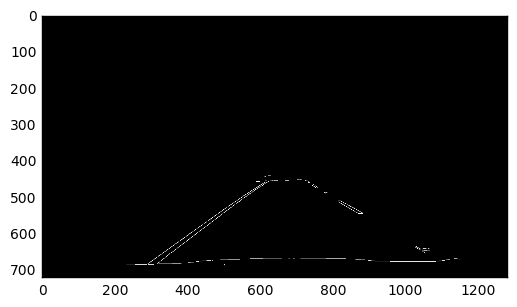

[-0.7532894736842105, 919.7796052631579]
[-0.7250755287009061, 894.6223564954681]
[0.5758354755784062, 44.460154241645135]
[-0.5749999999999975, 814.9499999999985]
[0.6275862068965509, -2.255172413792123]
[-0.7209302325581404, 895.0465116279073]
[-0.7999999999999975, 916.9999999999991]
[-0.7256637168141596, 895.7168141592924]
[0.5999999999999992, 21.40000000000055]
[-0.7525083612040125, 903.030100334448]
[-0.7253731343283574, 890.2805970149248]
[-0.672566371681416, 878.7168141592921]
[0.6728971962616827, -46.364485981309045]
[-0.7533333333333341, 901.4666666666669]
[-0.7500000000000018, 908.7500000000013]
[-0.7321428571428565, 907.5357142857141]
[-0.8697318007662833, 988.2758620689651]
[0.5539772727272724, 63.66193181818207]
[-0.7016574585635369, 895.6408839779012]
[-0.7261904761904762, 891.9642857142857]
[0.6666666666666652, -44.33333333333161]
[0.5541795665634672, 56.35294117647081]
[-0.8108108108108092, 943.270270270269]
[0.7358490566037769, -116.98113207547513]
middle 704
left [706

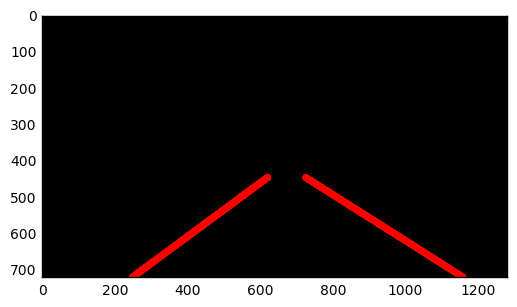

 31%|███       | 78/251 [01:02<02:13,  1.30it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


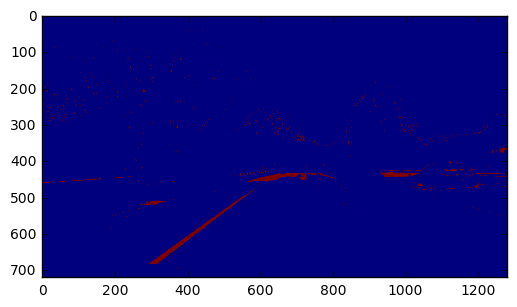

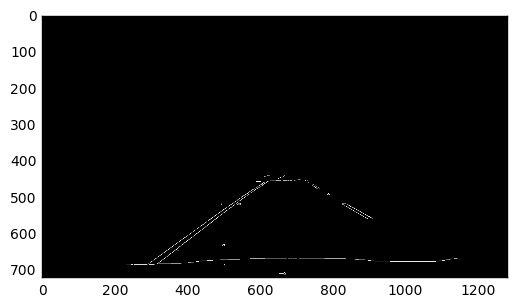

[-0.7524752475247528, 918.019801980198]
[-0.7003058103975538, 884.5871559633027]
[0.5530303030303032, 57.03030303030281]
[-0.7246835443037981, 908.2025316455698]
[-0.6243243243243247, 875.4189189189194]
[0.5538847117794484, 64.17293233082742]
[-0.5803571428571429, 820.6249999999999]
[-0.6488549618320609, 856.9465648854962]
[-0.8070175438596469, 923.0701754385957]
[-0.6476964769647693, 871.184281842818]
[0.5544303797468357, 53.25569620253138]
[0.5541561712846348, 59.54911838790933]
[-0.5536992840095462, 851.6634844868731]
[-0.7142857142857213, 906.7142857142885]
[-0.8695652173913045, 993.3043478260867]
[-0.8682170542635663, 990.2170542635664]
[-0.5771144278606964, 854.671641791045]
[0.5544041450777203, 56.60103626942994]
[-0.6761904761904736, 870.5047619047598]
[-0.5545171339563862, 832.735202492212]
[-0.6183206106870224, 824.3587786259541]
[-0.6013071895424839, 835.6274509803922]
[-0.7267267267267258, 924.9999999999995]
[-0.7525773195876297, 921.0618556701035]
[-0.7007575757575757, 886

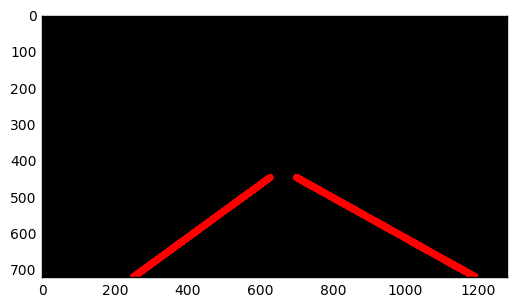

 31%|███▏      | 79/251 [01:03<02:18,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


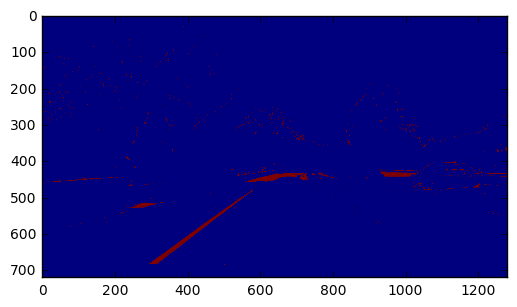

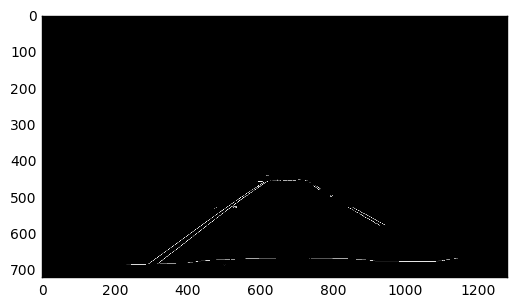

[-0.726114649681528, 896.0254777070055]
[-0.7795275590551192, 931.5118110236228]
[0.6239554317548748, 4.37604456824478]
[0.6491228070175432, -18.21052631578903]
[0.5783783783783781, 33.31351351351382]
[-0.579710144927533, 815.9999999999982]
[0.6489361702127658, -21.255319148935875]
[0.72463768115942, -83.8695652173906]
[0.6451612903225818, -28.2258064516144]
[-0.8078291814946625, 940.8540925266908]
[-0.626038781163435, 840.8836565096952]
[0.6764705882352913, -47.99999999999741]
[0.7812499999999989, -134.71874999999866]
[-0.8107142857142862, 948.9142857142858]
[-0.7814814814814817, 936.9814814814816]
[0.5999999999999885, 12.000000000011273]
[-0.8373702422145327, 955.9826989619376]
[-0.895522388059701, 1006.3134328358205]
[0.7241379310344813, -90.5862068965503]
middle 714
left [719, 729, 736, 794, 843, 904, 850, 847, 915, 857] right [606, 610, 621, 620, 610, 608, 595, 615, 600]
(10, 2)
-37.5176615949 0.665205027812
SLOPE
919.274104085 -0.760478745977
ave 726 446
SLOPE
ave 622 446
x2 1138

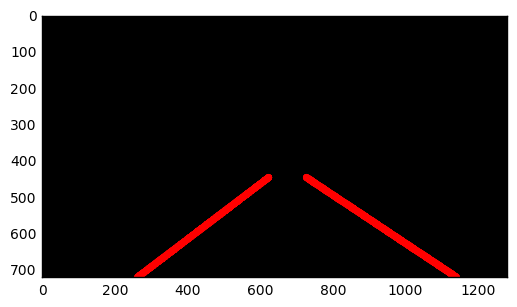

 32%|███▏      | 80/251 [01:04<02:16,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


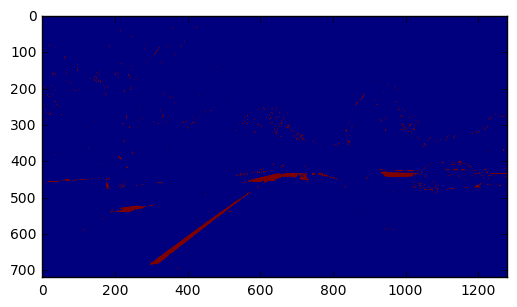

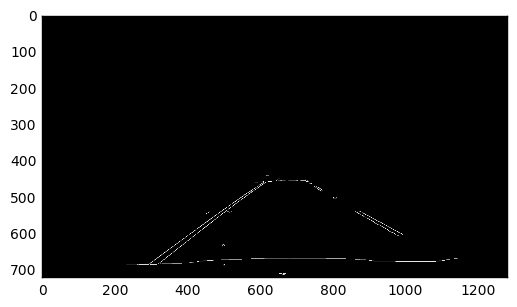

[-0.7252396166134185, 896.0447284345048]
[0.5991561181434603, 22.008438818564795]
[-0.7800687285223363, 931.2817869415805]
[-0.7809187279151946, 933.2367491166079]
[0.5989159891598923, 20.98373983739762]
[-0.576923076923075, 815.8461538461526]
[0.6016260162601631, 16.21951219512175]
[-0.7821782178217821, 938.9108910891086]
[0.7524752475247511, -142.69306930692943]
[-0.8677042801556416, 986.6964980544747]
[-0.7286245353159849, 896.6319702602227]
[-0.6213017751479292, 825.2071005917163]
[-0.5524079320113314, 908.2492917847021]
[-0.6477987421383645, 957.7924528301887]
[-0.7801418439716314, 932.0851063829783]
middle 712
left [721, 723, 726, 987] right [604, 608, 606, 622, 611, 607, 602, 620, 600]
(4, 2)
-20.870344614 0.638043342772
SLOPE
906.215664969 -0.738122311376
ave 731 446
SLOPE
ave 623 446
x2 1161 252


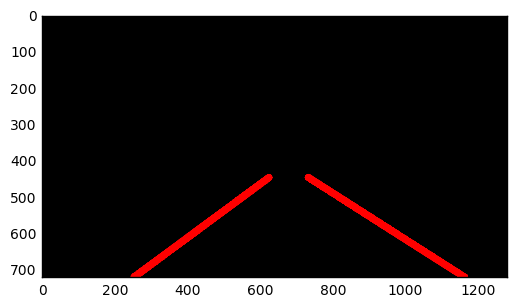

 32%|███▏      | 81/251 [01:05<02:14,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


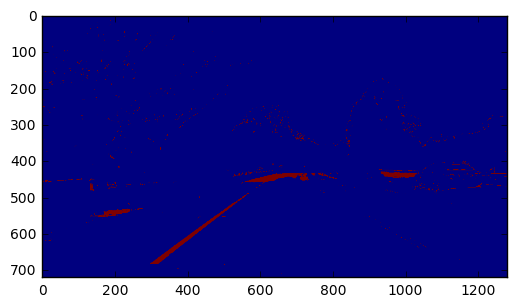

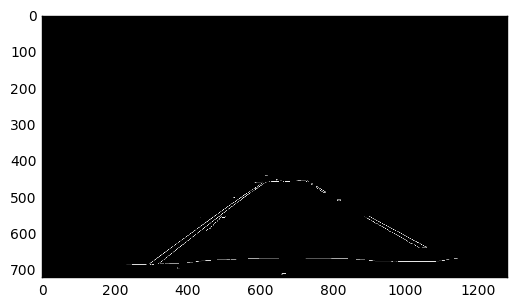

[-0.7534246575342463, 919.821917808219]
[-0.7243589743589753, 895.512820512821]
[-0.7525083612040133, 921.0401337792642]
[0.5527638190954776, 64.85427135678341]
[-0.7249190938511323, 899.3009708737859]
[0.5555555555555556, 60.11111111111118]
[-0.6748971193415648, 889.2839506172845]
[0.5775401069518719, 36.39572192513359]
[-0.7550335570469798, 924.6107382550334]
[0.5541561712846342, 62.76574307304858]
[-0.8995983935742974, 994.2610441767072]
[-0.7291666666666681, 905.0000000000007]
[-0.725321888412017, 895.0686695278965]
[-0.7016393442622956, 905.1540983606562]
[-0.7288135593220344, 911.3220338983052]
[-0.7499999999999968, 911.4999999999984]
[-0.8700787401574811, 991.748031496064]
[-0.6502463054187194, 875.1724137931037]
[0.6610169491525434, -28.72881355932277]
middle 657
left [704, 709, 730, 706, 756] right [605, 604, 614, 606, 642, 618, 595, 576, 524, 643, 622, 570, 610, 497]
(5, 2)
39.0796067814 0.580206520408
SLOPE
917.056915936 -0.745714761511
ave 701 446
SLOPE
ave 631 446
x2 1173 

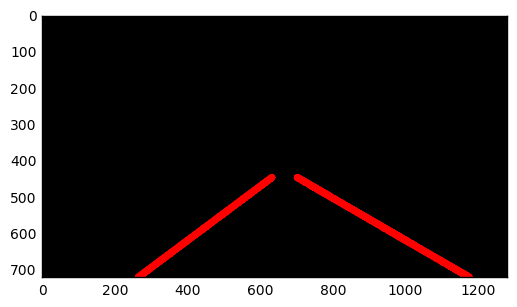

 33%|███▎      | 82/251 [01:06<02:12,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


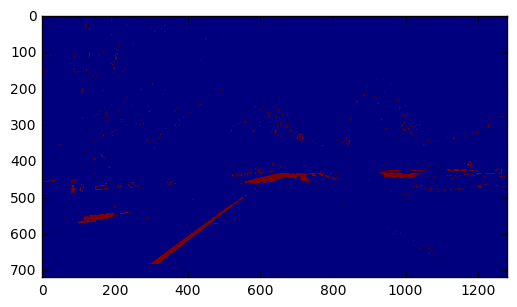

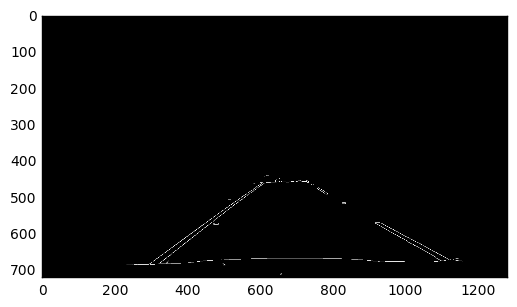

[-0.7816901408450708, 933.3591549295776]
[-0.7258064516129034, 896.2096774193552]
[0.5546666666666669, 64.51466666666646]
[-0.8700787401574812, 992.6181102362209]
[-0.7804878048780487, 932.1951219512194]
[-0.781362007168459, 936.9426523297493]
[-0.7797202797202802, 925.7132867132871]
[0.5568862275449105, 63.005988023951815]
[0.5765306122448979, 38.438775510204245]
[-0.7804878048780494, 928.2926829268297]
[-0.8066037735849055, 923.2075471698109]
[-0.8712121212121233, 985.3409090909104]
[-0.5810810810810806, 1090.4459459459458]
[-0.857142857142861, 937.7142857142868]
[-0.7826086956521727, 917.0434782608689]
[-0.751655629139074, 937.8112582781462]
[-0.7832167832167845, 947.7272727272732]
[-0.7586206896551693, 915.2413793103432]
[-0.672489082969431, 1075.183406113536]
[-0.8109090909090908, 940.2472727272724]
[-0.7166666666666652, 893.5999999999995]
middle 675
left [704, 914, 726] right [603, 601, 611, 605, 604, 596, 600, 516, 603, 310, 354, 641, 481, 550, 591, 432]
(3, 2)
55.3198100669 0.5

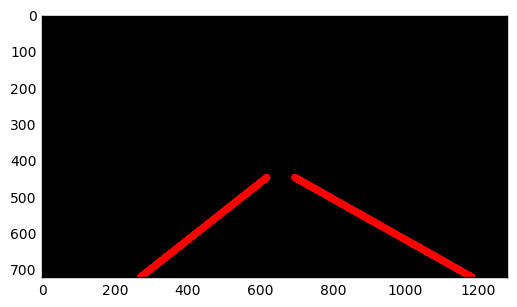

 33%|███▎      | 83/251 [01:06<02:13,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


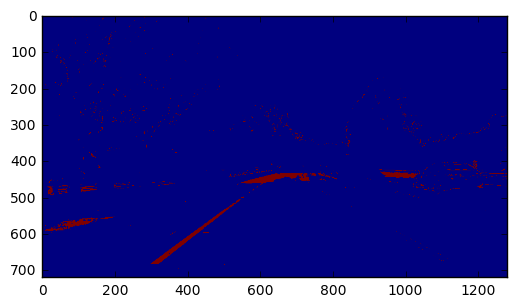

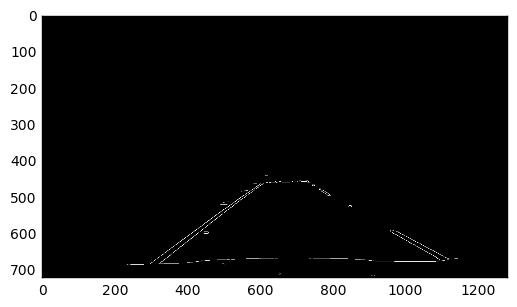

[-0.7254901960784311, 898.019607843137]
[-0.7525773195876287, 918.8041237113398]
[0.5531914893617015, 66.14893617021316]
[-0.753378378378378, 921.314189189189]
[0.6225352112676057, 2.4169014084509652]
[-0.782456140350878, 924.9964912280706]
[-0.8678414096916289, 963.387665198237]
[-0.7272727272727273, 908.7272727272727]
[-0.8095238095238093, 954.8095238095236]
[-0.714285714285718, 907.714285714287]
[-0.7245901639344259, 898.4786885245899]
[-0.6250000000000004, 877.7499999999999]
[-0.8663793103448271, 958.64224137931]
[-0.8701298701298696, 961.5714285714283]
[-0.5753424657534228, 802.616438356163]
[-0.810631229235879, 941.7807308970091]
[-0.7647058823529365, 926.941176470585]
[-0.5741935483870955, 856.2580645161285]
[-0.8988764044943787, 969.6292134831442]
[-0.5757575757575756, 1150.9090909090908]
[0.6333333333333357, 49.866666666665154]
middle 679
left [956, 727] right [601, 603, 611, 593, 557, 617, 610, 393, 601, 670, 549, 550, 559, 619, 608, 455, 508]
(2, 2)
34.2829187893 0.587863350

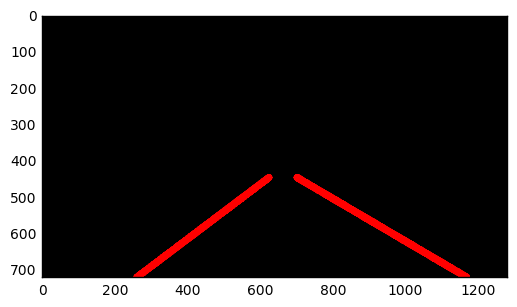

 33%|███▎      | 84/251 [01:07<02:11,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


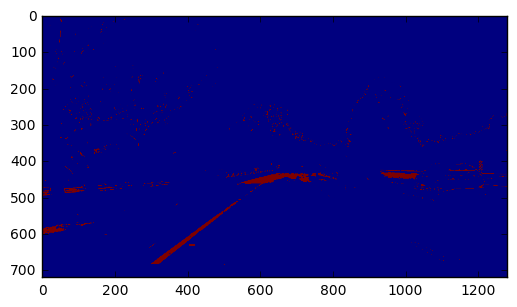

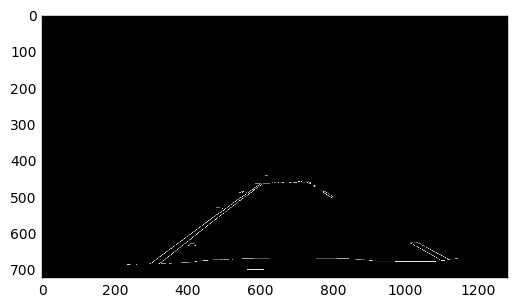

[-0.782142857142857, 933.2857142857143]
[-0.7245901639344263, 896.7540983606556]
[-0.7535211267605629, 924.6619718309857]
[-0.7260726072607264, 898.3696369636965]
[-0.8390804597701156, 967.1264367816099]
[-0.8704453441295549, 989.2672064777328]
[-0.7254901960784317, 910.3529411764703]
[-0.6249999999999997, 871.8749999999999]
[-0.5772151898734185, 865.2455696202534]
[0.6232294617563735, 1.6657223796034992]
[-0.7804878048780463, 935.6341463414616]
[-0.6016260162601628, 838.617886178862]
[-0.8041237113402069, 945.6494845360829]
[-0.6723549488054619, 852.0887372013656]
[0.6463414634146316, -17.853658536583175]
[0.7017543859649156, -55.68421052631839]
[-0.6717557251908404, 853.4580152671764]
[-0.6703296703296685, 890.4615384615378]
[0.8500000000000109, -241.30000000001124]
[0.7814569536423842, -44.50331125827826]
[0.8392156862745095, -77.2588235294114]
middle 675
left [729, 778, 732, 1018] right [600, 600, 614, 601, 602, 600, 618, 659, 603, 626, 594, 543, 614, 399]
(4, 2)
-78.2930366708 0.7

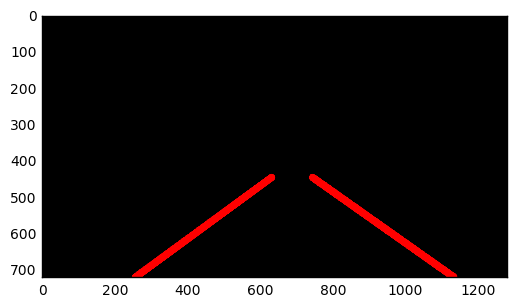

 34%|███▍      | 85/251 [01:08<02:10,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


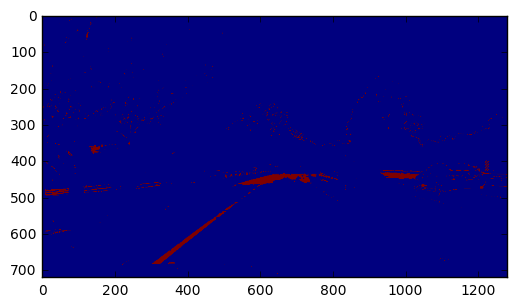

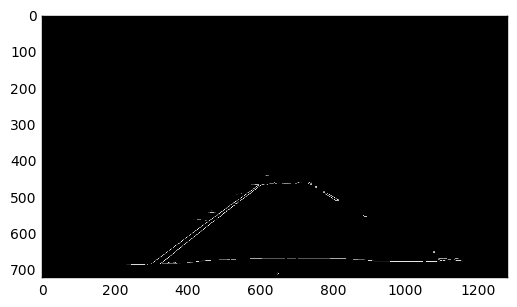

[-0.7257525083612034, 898.0969899665548]
[-0.7021276595744682, 891.8936170212767]
[-0.753424657534246, 924.3424657534242]
[0.6495468277945623, -13.468277945619826]
[-0.7027027027027013, 897.6216216216209]
[0.7257525083612054, -76.33110367893114]
[0.5949367088607601, 23.50632911392379]
[-0.7276422764227645, 906.6585365853663]
[-0.6727828746177378, 862.6146788990831]
[-0.7006369426751587, 899.7961783439486]
[-0.699367088607595, 900.1044303797471]
[-0.6473988439306353, 873.0404624277453]
[0.6011396011396006, 21.35897435897481]
[-0.7266666666666671, 903.4533333333337]
[-0.5777777777777783, 807.0444444444448]
[-0.7549407114624498, 926.0237154150194]
[-0.6481481481481479, 838.9629629629628]
[-0.7006369426751599, 881.1783439490451]
[-0.649635036496351, 858.635036496351]
[-0.6491935483870975, 870.0443548387103]
middle 666
left [732, 739, 732, 738] right [594, 608, 611, 489, 552, 591, 622, 625, 638, 602, 592, 612, 614, 594, 589, 627]
(4, 2)
-11.2335195379 0.642843911539
SLOPE
883.719448277 -0.6

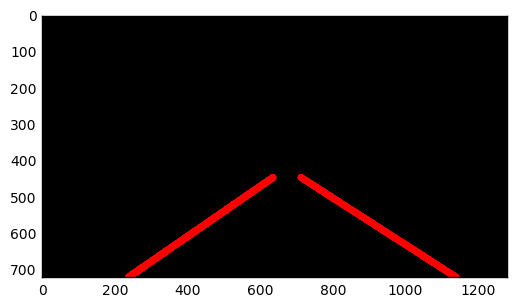

 34%|███▍      | 86/251 [01:09<02:12,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


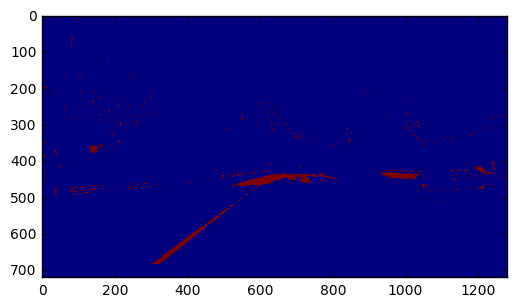

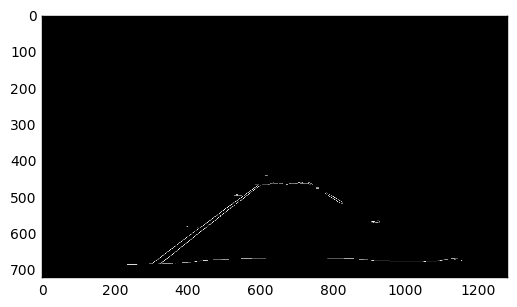

[-0.7257525083612032, 897.8227424749158]
[0.6990291262135918, -56.28155339805793]
[-0.781021897810219, 935.0510948905106]
[-0.7789855072463767, 935.1702898550723]
[-0.8380952380952393, 938.5142857142862]
[0.5765027322404377, 41.57650273223959]
[-0.7276785714285717, 899.6964285714287]
[0.5772357723577232, 36.88617886178901]
[-0.6745098039215682, 880.8235294117646]
[0.6499999999999981, -15.149999999998128]
[-0.7234848484848485, 880.787878787879]
[-0.7257525083612043, 884.3076923076925]
[-0.7261904761904757, 889.5119047619047]
[-0.7240356083086052, 886.7299703264091]
[0.5769230769230769, 40.53846153846108]
[-0.8380952380952379, 937.8380952380951]
[0.6000000000000005, 17.599999999999643]
[-0.699386503067484, 881.6380368098156]
middle 658
left [740, 731, 733, 731, 734, 739] right [595, 598, 601, 528, 596, 615, 536, 575, 619, 617, 526, 590]
(6, 2)
10.8615982891 0.613281784622
SLOPE
903.990995762 -0.746915725781
ave 709 446
SLOPE
ave 613 446
x2 1156 246


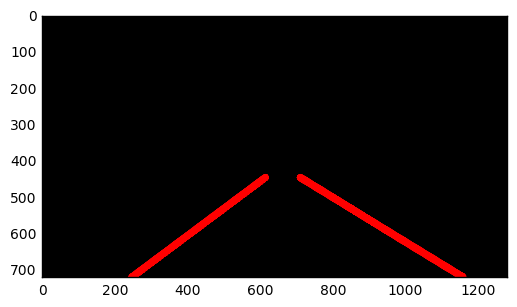

 35%|███▍      | 87/251 [01:10<02:10,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


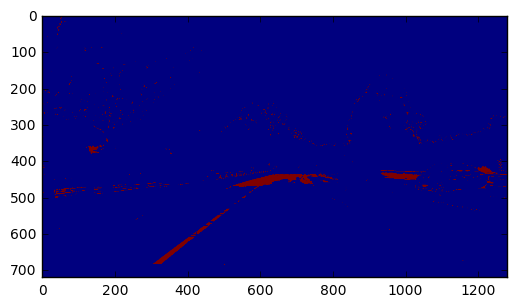

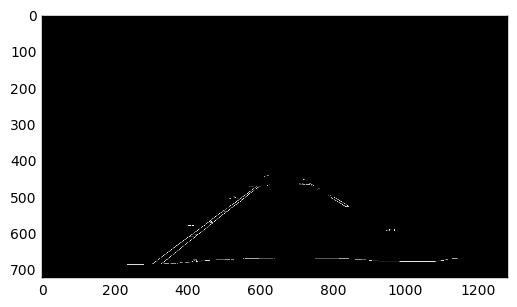

[-0.7810218978102189, 936.2700729927005]
[-0.7269624573378844, 899.1808873720142]
[0.6010638297872335, 18.63829787234093]
[-0.7266435986159185, 903.1730103806236]
[0.622418879056047, 7.899705014749614]
[-0.7520661157024764, 925.4132231404948]
[0.5981308411214948, 26.168224299065766]
[-0.8685446009389671, 959.328638497653]
[0.6021505376344082, 19.25806451612965]
[-0.6440677966101714, 887.5254237288141]
[-0.777777777777779, 933.3333333333343]
[0.726618705035973, 232.7553956834521]
[-0.7272727272727282, 898.8181818181823]
[-0.7272727272727396, 917.5454545454592]
[0.6153846153846168, 6.4615384615371685]
[-0.8387096774193559, 950.7096774193556]
[0.7222222222222235, 118.3888888888882]
middle 596
left [716, 736, 732, 717, 802] right [589, 592, 442, 530, 375, 588, 591, 383, 535]
(5, 2)
15.6851660328 0.607829740597
SLOPE
919.447536693 -0.754368608772
ave 707 446
SLOPE
ave 627 446
x2 1158 264


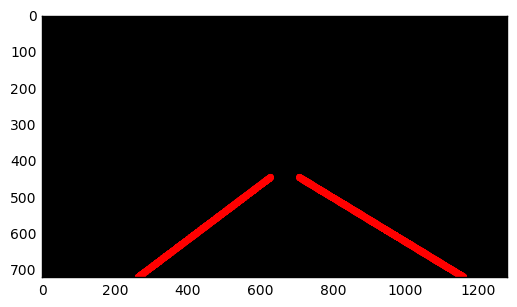

 35%|███▌      | 88/251 [01:10<02:09,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


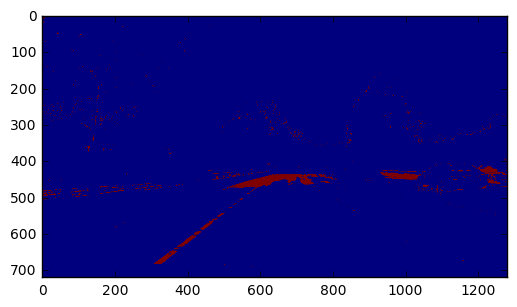

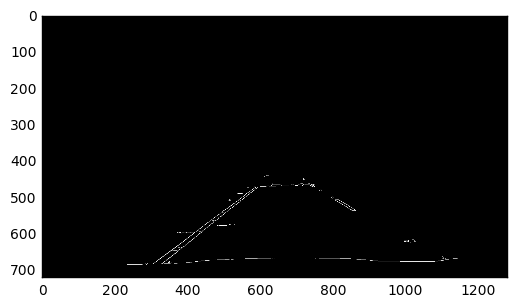

[-0.7532467532467525, 914.4025974025972]
[-0.7794117647058831, 936.5294117647063]
[-0.8974358974358971, 983.538461538461]
[0.5558510638297866, 55.67287234042612]
[0.5757575757575761, 45.69696969696938]
[0.5761772853185595, 43.085872576177074]
[-0.6983606557377046, 890.7147540983601]
[-0.7535714285714293, 912.839285714286]
[-0.7849462365591408, 941.0322580645166]
[-0.6483180428134556, 838.0030581039755]
[-0.7543103448275859, 920.060344827586]
[0.6005361930294902, 20.415549597856074]
[-0.651079136690648, 883.3417266187055]
[-0.8685714285714278, 953.1828571428567]
[-0.6983606557377044, 893.508196721311]
[0.6491712707182319, 40.46132596685091]
[-0.7526501766784455, 927.106007067138]
[-0.6740506329113921, 881.4968354430378]
[-0.6009615384615393, 819.9567307692312]
[0.623616236162362, -0.623616236162695]
[-0.8387096774193548, 956.5806451612901]
[-0.8056872037914689, 943.4928909952603]
[-0.7833333333333353, 941.2833333333342]
[0.6701030927835057, -32.886597938144526]
[-0.5523809523809527, 117

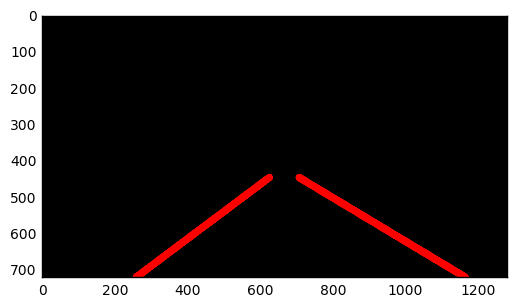

 35%|███▌      | 89/251 [01:11<02:07,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


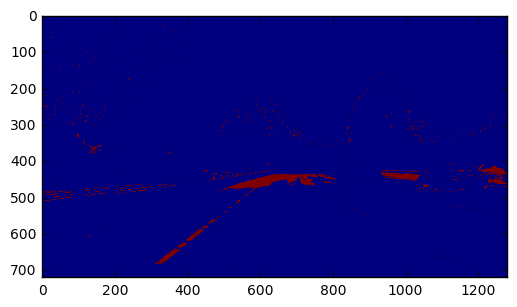

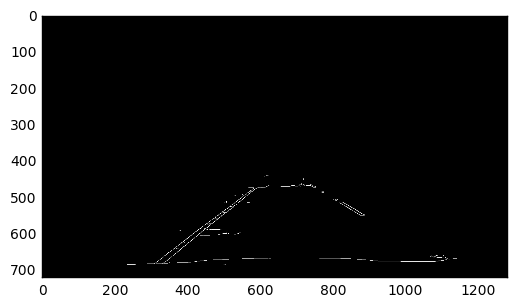

[-0.7527272727272716, 914.0872727272721]
[-0.8085937499999998, 950.6445312499998]
[-0.7517985611510788, 911.5467625899272]
[0.5982404692082114, 26.310850439882064]
[-0.7806691449814129, 951.3308550185874]
[-0.7538461538461542, 916.1999999999999]
[0.5975609756097566, 298.10975609756036]
[-0.5753424657534242, 803.0958904109589]
[0.5994236311239195, 26.824207492795278]
[-0.8124999999999993, 950.3124999999991]
[-0.7523219814241486, 905.6873065015482]
[-0.7272727272727278, 909.3636363636366]
[-0.8361344537815134, 953.042016806723]
[-0.7016393442622956, 965.6721311475413]
[-0.6733668341708552, 956.8643216080408]
[0.5534759358288764, 56.0882352941181]
[-0.8081632653061223, 949.6938775510206]
middle 637
left [745, 736, 737] right [582, 587, 582, 614, 572, 572, 521, 619, 600, 610, 575]
(3, 2)
36.4077644089 0.583713345387
SLOPE
919.545877202 -0.759942706931
ave 701 446
SLOPE
ave 623 446
x2 1171 262


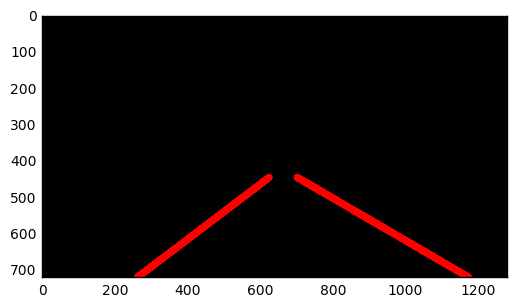

 36%|███▌      | 90/251 [01:12<02:08,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


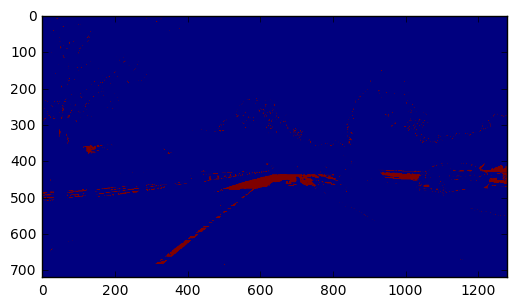

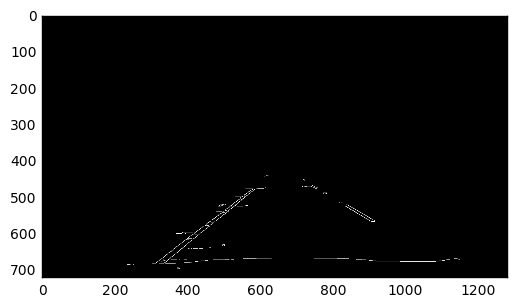

[0.5777202072538858, 36.19689119171022]
[-0.7527675276752764, 914.09963099631]
[0.5758426966292135, 45.02808988764058]
[-0.8095238095238089, 952.1904761904757]
[-0.7560975609756091, 916.6341463414624]
[0.5543478260869558, 65.32608695652262]
[-0.780082987551867, 932.8464730290452]
[-0.7803030303030303, 929.7954545454544]
[0.599462365591398, 21.586021505376287]
[-0.8091286307053949, 950.5311203319509]
[-0.783251231527093, 932.2906403940887]
[0.6, 19.79999999999999]
[-0.6516853932584254, 855.8089887640442]
[0.5767045454545451, 42.93181818181861]
[-0.7400000000000009, 906.7000000000004]
[0.5999999999999994, 19.20000000000061]
[0.5733333333333334, 48.706666666666635]
[0.5534591194968548, 59.24528301886868]
[0.8352941176470581, 278.57647058823585]
[-0.7234042553191485, 994.0212765957442]
[-0.7806451612903234, 921.0967741935492]
[-0.5555555555555466, 800.6666666666613]
middle 642
left [718, 738, 730, 718, 722, 744, 718, 829, 753] right [578, 587, 514, 560, 579, 584, 520, 569, 555, 615, 570]
(

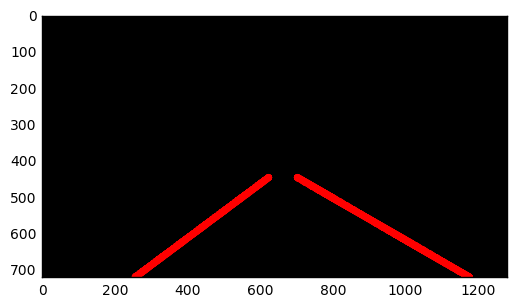

 36%|███▋      | 91/251 [01:13<02:05,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


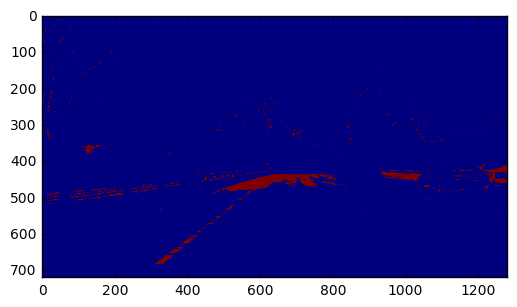

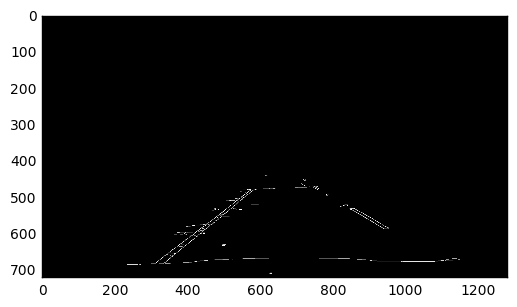

[0.6243093922651933, 1.7458563535911467]
[-0.7530864197530877, 914.950617283951]
[-0.8063241106719369, 950.6996047430831]
[-0.8087649402390433, 949.0836653386449]
[-0.7530864197530862, 904.6543209876543]
[-0.7000000000000002, 881.3999999999999]
[-0.7249999999999996, 899.3249999999999]
[0.6225895316804404, 1.7355371900832597]
[-0.6969696969696966, 883.3333333333336]
[-0.8095238095238092, 946.9047619047616]
[-0.6482084690553748, 845.7557003257326]
[-0.6748251748251751, 868.9020979020983]
[0.6000000000000001, 15.800000000000038]
[-0.8081632653061224, 943.2285714285715]
[-0.7283582089552239, 888.6686567164179]
[-0.6730038022813687, 892.2433460076043]
[0.6224899598393565, -0.6465863453808139]
[-0.7518248175182484, 920.824817518248]
[0.6923076923076925, -62.30769230769247]
[-0.6227544910179632, 873.5628742514965]
[-0.8381742738589205, 966.9792531120327]
[0.7540983606557372, 264.2950819672133]
[-0.8080808080808091, 959.1717171717174]
middle 645
left [718, 720, 757, 838, 857] right [551, 585, 

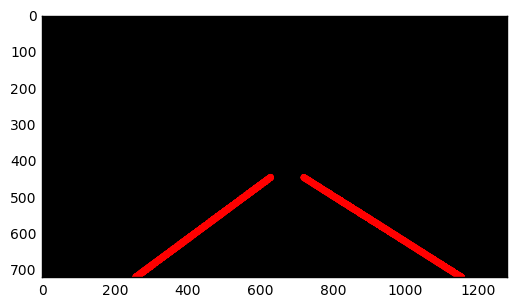

 37%|███▋      | 92/251 [01:14<02:05,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


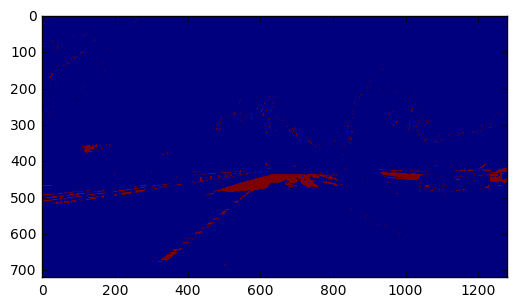

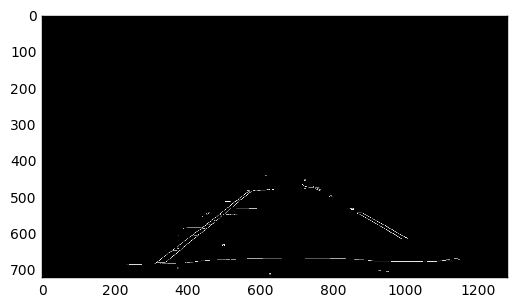

[-0.7795275590551191, 926.2125984251969]
[-0.8097165991902828, 951.0161943319833]
[0.5754985754985757, 44.82905982905958]
[0.5762273901808785, 36.11627906976722]
[-0.7790697674418617, 932.5232558139539]
[0.5774278215223094, 38.251968503937725]
[-0.7795275590551191, 941.7007874015754]
[-0.7000000000000002, 905.9000000000002]
[-0.7817460317460324, 928.5952380952385]
[-0.7798165137614669, 931.100917431192]
[0.5964912280701756, 16.070175438596557]
[0.5977011494252882, 205.97701149425245]
[0.5766233766233766, 37.40779220779215]
[-0.8361344537815129, 943.7100840336135]
[0.5764705882352938, 43.188235294117774]
[-0.8073770491803276, 952.700819672131]
[0.6503067484662575, 0.030674846626504184]
[0.5540166204986147, 65.6897506925213]
[-0.799999999999998, 931.999999999999]
[-0.6733333333333327, 851.9866666666665]
[-0.869565217391304, 979.5217391304345]
[0.642857142857144, 384.714285714285]
[-0.6754098360655736, 897.4295081967213]
[0.650943396226415, 1.3207547169817617]
[-0.8358208955223868, 941.61

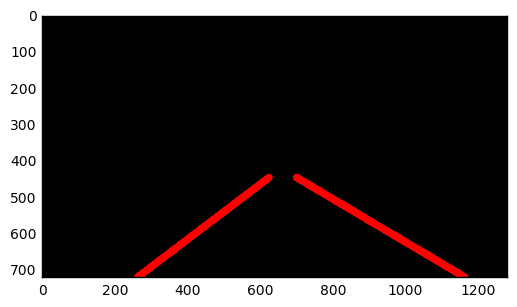

 37%|███▋      | 93/251 [01:14<02:05,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


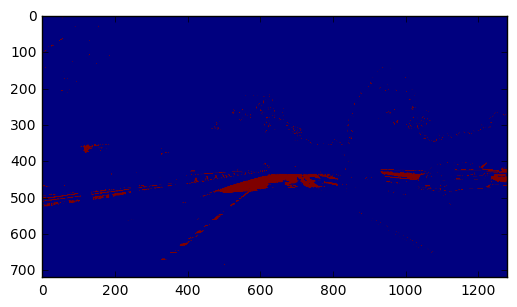

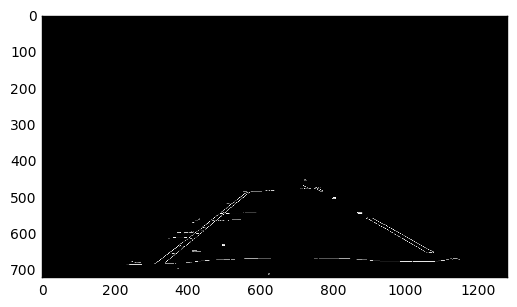

[0.554987212276215, 53.854219948849256]
[-0.8369098712446349, 963.038626609442]
[-0.7808764940239052, 926.4143426294825]
[0.5543175487465183, 63.14206128133667]
[-0.8389261744966444, 966.543624161074]
[-0.6741573033707859, 848.1460674157303]
[-0.837078651685392, 964.6460674157297]
[0.5527777777777776, 66.49722222222216]
[-0.6732673267326734, 963.8118811881187]
[-0.7831325301204818, 925.9036144578312]
[-0.7826086956521751, 930.260869565218]
[0.5543175487465184, 57.26183844011118]
[0.6505376344086023, 306.06451612903214]
[0.6475644699140404, -15.246418338109315]
[-0.6478873239436621, 920.4225352112677]
[0.5544303797468353, 53.36455696202551]
[-0.6236162361623616, 1001.7638376383765]
[0.7857142857142785, -118.64285714285164]
[-0.8398058252427189, 965.0097087378643]
[0.7559523809523807, 166.5595238095239]
[-0.7823529411764708, 928.2470588235295]
[-0.8699551569506729, 973.9147982062783]
[0.5779220779220781, 42.714285714285744]
middle 636
left [721, 743, 739, 750, 720, 719, 753, 748] right [

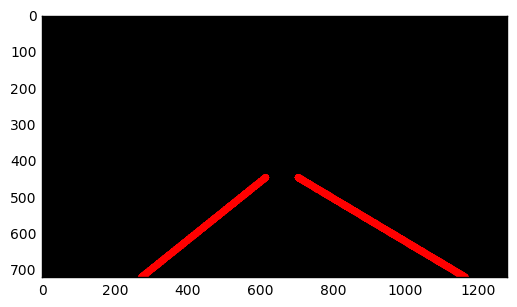

 37%|███▋      | 94/251 [01:15<02:09,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


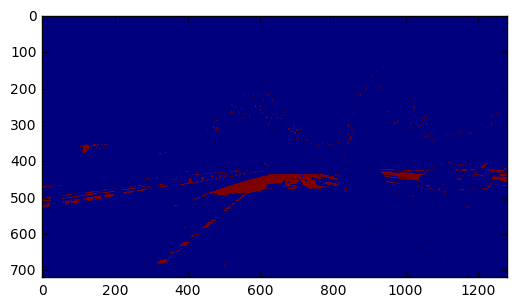

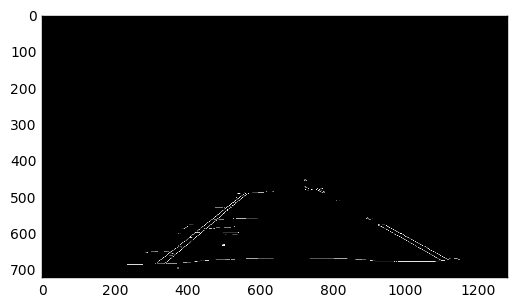

[0.5521126760563377, 66.12394366197209]
[-0.8651685393258436, 975.1348314606746]
[-0.8124999999999994, 940.5624999999995]
[-0.8073394495412842, 936.2660550458714]
[-0.8387096774193543, 946.096774193548]
[-0.86697247706422, 974.7706422018349]
[0.807142857142857, -131.75714285714338]
[0.6741573033707868, -44.34831460674162]
[0.6000000000000002, 239.20000000000016]
[0.555555555555555, 295.33333333333377]
[0.7258064516129019, 291.40322580645244]
[-0.7263157894736856, 870.073684210527]
[-0.6234177215189866, 857.3101265822778]
[-0.6708860759493672, 872.0759493670889]
[0.647398843930636, -13.127167630057494]
middle 586
left [746, 722, 892, 720] right [533, 557, 554, 545, 558, 398, 571]
(4, 2)
-30.777170358 0.670202920125
SLOPE
930.711490926 -0.798270286968
ave 711 446
SLOPE
ave 607 446
x2 1120 263


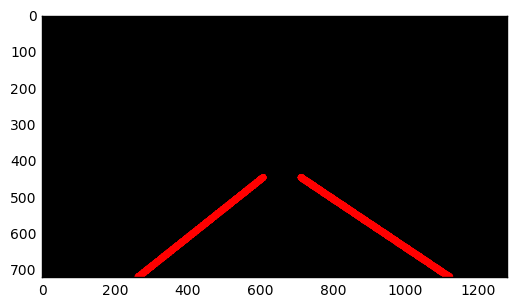

 38%|███▊      | 95/251 [01:16<02:06,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


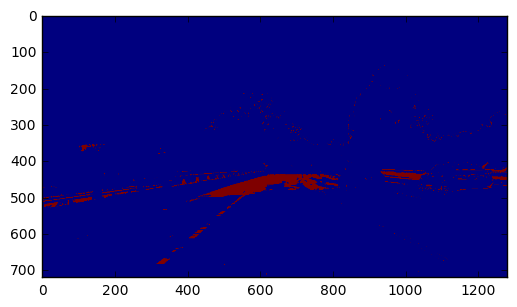

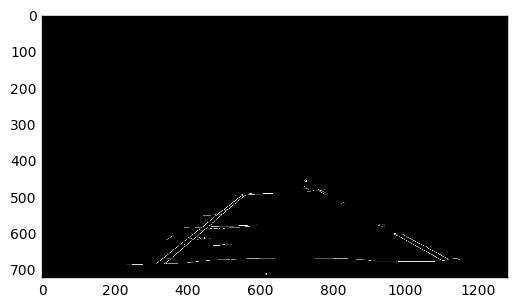

[-0.8656716417910437, 976.716417910447]
[-0.8370044052863438, 948.493392070485]
[-0.8377192982456148, 953.745614035088]
[-0.8709677419354848, 958.354838709678]
[-0.8675799086758003, 967.6986301369872]
[0.8383233532934147, 195.7544910179629]
[-0.6243654822335026, 829.2842639593906]
[-0.5763688760806918, 916.4639769452447]
[-0.8662420382165599, 958.5987261146489]
[-0.6212121212121203, 828.8333333333327]
[-0.6012461059190027, 850.3426791277254]
[0.6239554317548748, 0.8802228412253891]
[-0.8111587982832622, 948.4377682403435]
[-0.6736842105263149, 892.8421052631569]
[0.6270661157024794, 303.4999999999999]
middle 558
left [723] right [553, 543, 550, 532, 546, 537, 474, 539]
(1, 2)
0.880222841225 0.623955431755
SLOPE
927.715652034 -0.7988453297
ave 713 446
SLOPE
ave 603 446
x2 1152 260


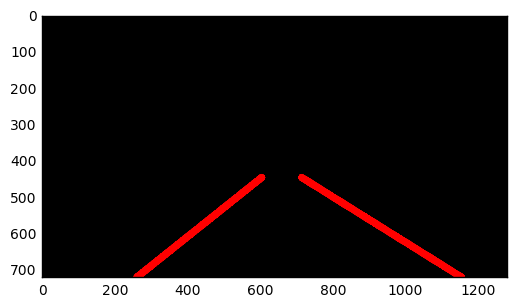

 38%|███▊      | 96/251 [01:17<02:05,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


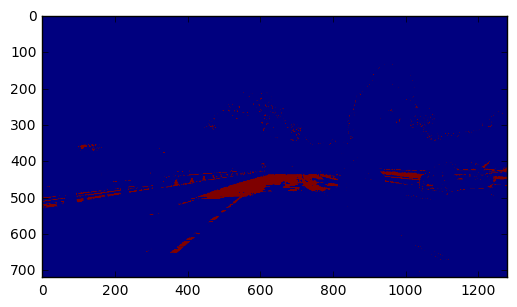

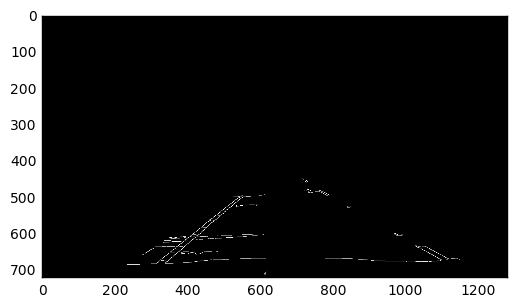

[-0.8676470588235297, 976.1323529411762]
[0.5771276595744675, 39.313829787234525]
[-0.8078602620087337, 935.0524017467247]
[-0.8421052631578946, 955.2631578947369]
[0.7252396166134188, -69.27156549520794]
[-0.5760869565217397, 817.5760869565221]
[0.576219512195122, 41.34451219512202]
[-0.6727272727272728, 955.8363636363637]
[-0.8382352941176487, 961.6764705882358]
[0.5784615384615388, 33.97846153846137]
[-0.6745562130177519, 879.5147928994082]
[0.8409090909090913, 395.24999999999966]
[-0.8333333333333329, 947.3333333333328]
[0.5766233766233765, 37.561038961039436]
middle 593
left [722, 716, 763, 714, 717] right [543, 541, 543, 553, 523, 546, 530, 472]
(5, 2)
16.5852553973 0.606734340694
SLOPE
928.54812 -0.764068956713
ave 707 446
SLOPE
ave 631 446
x2 1159 272


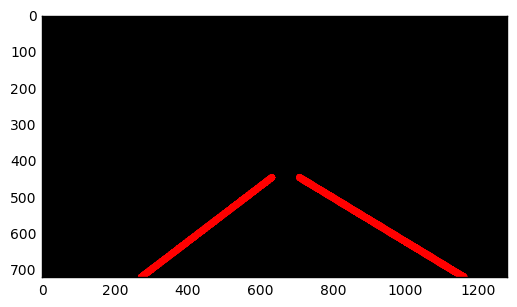

 39%|███▊      | 97/251 [01:18<02:05,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


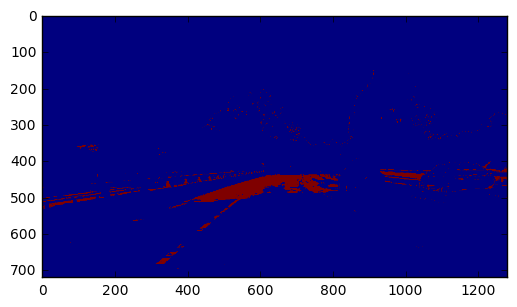

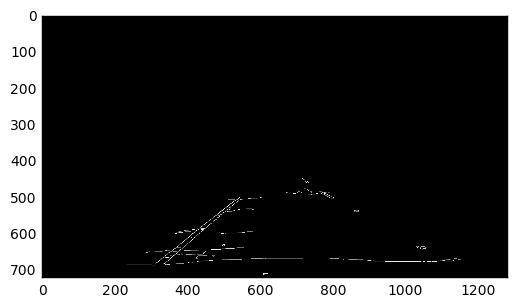

[-0.8088888888888891, 936.137777777778]
[-0.8678571428571423, 973.7321428571424]
[-0.8611111111111136, 973.8611111111126]
[0.5775401069518714, 40.86096256684498]
[0.6735905044510386, -31.290801186943934]
[-0.8043478260869553, 932.3260869565212]
[-0.8080357142857137, 979.7410714285708]
[-0.8682926829268285, 973.1414634146337]
[0.7801418439716308, -111.72340425531847]
[0.6249999999999996, 3.5000000000005915]
[0.5777777777777778, 375.59999999999985]
[0.8361344537815127, -129.86974789915982]
[-0.5552699228791771, 851.2390745501284]
[0.6005434782608702, 20.206521739129727]
[0.7045454545454551, 453.61363636363626]
[0.6482758620689664, -15.86896551724233]
[-0.7857142857142855, 925.9999999999995]
middle 599
left [724, 716, 729, 724, 727, 724, 714] right [533, 541, 443, 590, 538, 532]
(7, 2)
-32.0264906504 0.677318035641
SLOPE
953.534585115 -0.822731751502
ave 705 446
SLOPE
ave 616 446
x2 1110 283


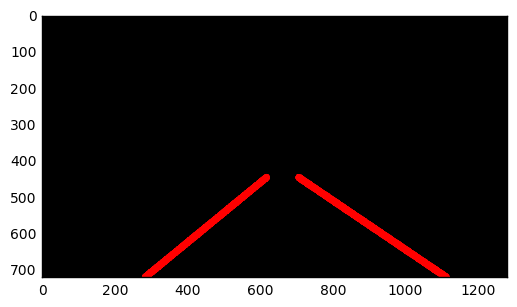

 39%|███▉      | 98/251 [01:18<02:03,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


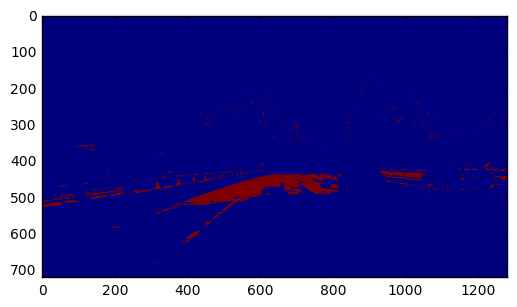

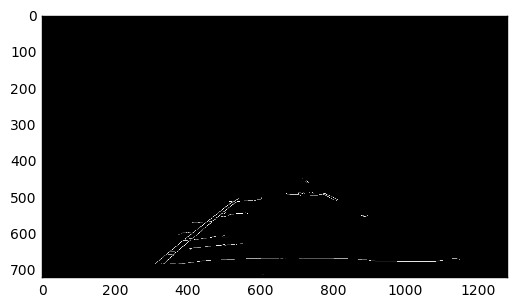

[-0.8142857142857141, 937.0571428571428]
[-0.8719211822660097, 974.221674876847]
[-0.8686868686868695, 957.6363636363642]
[-0.8670212765957452, 973.4521276595749]
[-0.8374384236453204, 943.2807881773399]
[-0.8118279569892481, 939.704301075269]
[0.7795918367346942, -90.8979591836739]
[0.6931818181818183, -47.93181818181852]
[0.6573875802997857, 306.99999999999983]
[0.6800000000000003, -36.32000000000012]
[0.5538461538461527, 386.3230769230775]
[-0.7797833935018047, 1024.3429602888089]
[-0.6462264150943395, 886.9150943396221]
[-0.8097560975609753, 935.834146341463]
[-0.8343949044586, 945.165605095542]
[-0.5775075987841948, 886.8601823708209]
[-0.8666666666666687, 955.0000000000007]
[-0.8653846153846146, 1034.6730769230765]
[-0.8994413407821229, 982.8100558659218]
middle 576
left [740, 714, 724] right [522, 537, 513, 523, 515, 533, 526, 516, 470, 510, 567, 519]
(3, 2)
-58.3832591218 0.717591218306
SLOPE
955.479198071 -0.832754288535
ave 702 446
SLOPE
ave 611 446
x2 1084 282


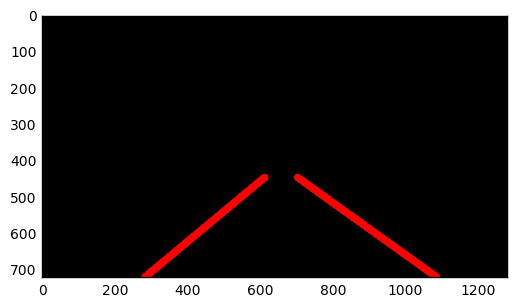

 39%|███▉      | 99/251 [01:19<02:04,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


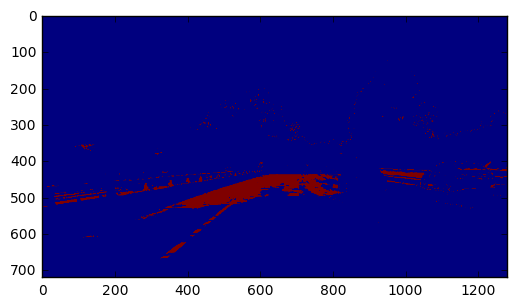

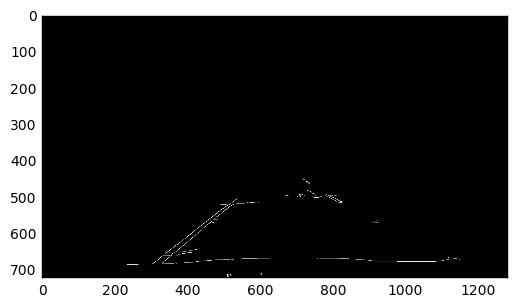

[-0.8068181818181812, 930.4772727272725]
[-0.8351063829787233, 955.7499999999999]
[0.6241379310344822, 0.05862068965587171]
[0.6253443526170802, 1.628099173553365]
[-0.8109452736318417, 929.52736318408]
[-0.8372093023255814, 955.6046511627907]
[-0.8650306748466259, 959.3006134969328]
[-0.842105263157895, 954.5263157894741]
[-0.5999999999999996, 894.4]
[-0.7272727272727273, 945.2727272727273]
[-0.574534161490683, 888.8322981366464]
[0.8401486988847581, -151.38661710037118]
[-0.8058823529411768, 931.7764705882353]
[0.6727272727272724, -45.50909090909084]
[-0.6016260162601618, 899.9918699186985]
[0.6728624535315982, -46.99999999999989]
[-0.5763239875389407, 887.1713395638626]
[0.599378881987578, 42.85714285714209]
middle 681
left [793, 717, 717, 909, 807, 736] right [510, 517, 505, 500, 509, 535, 593, 506, 677]
(6, 2)
-33.2253075482 0.67243326513
SLOPE
938.822972643 -0.789632682946
ave 712 446
SLOPE
ave 624 446
x2 1120 277


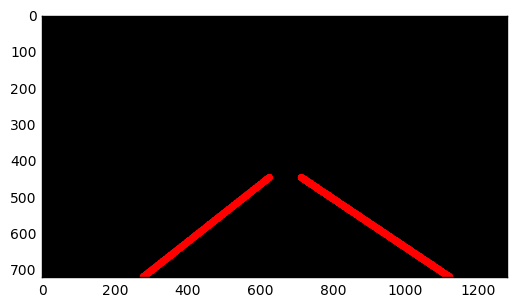

 40%|███▉      | 100/251 [01:20<02:03,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


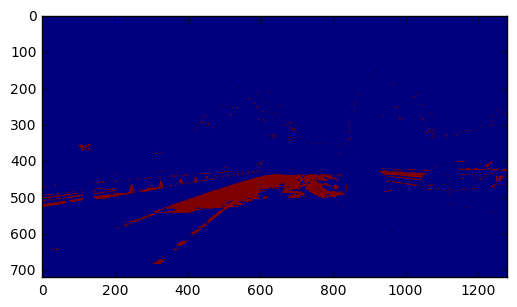

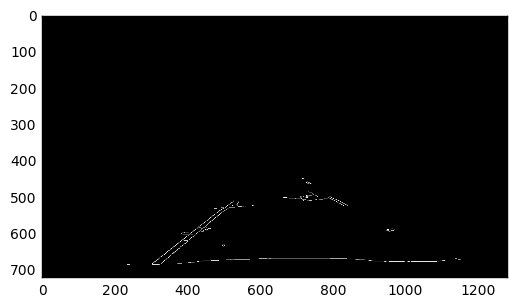

[-0.7817258883248739, 918.0812182741116]
[-0.8342857142857149, 953.6400000000003]
[0.5502958579881663, 68.4674556213012]
[0.6016597510373446, 18.813278008298667]
[-0.8347826086956516, 956.0695652173912]
[0.5765765765765762, 62.94594594594655]
[-0.8388888888888896, 957.4777777777776]
[0.6478873239436598, 309.40845070422677]
[-0.7590361445783129, 910.2530120481924]
[0.5769230769230766, 330.1923076923077]
[0.67193675889328, -37.26877470355648]
[-0.7010869565217394, 983.2445652173916]
[-0.579185520361991, 849.502262443439]
[-0.7005347593582897, 982.16577540107]
[0.5535714285714293, 333.5357142857139]
[-0.8301886792452808, 1044.4339622641496]
[0.6232294617563735, 3.912181303116541]
[-0.5552699228791771, 845.0179948586114]
[0.5769230769230771, 85.07692307692304]
middle 605
left [786, 715, 732, 810, 727, 714] right [499, 497, 508, 506, 526, 562, 498]
(6, 2)
33.6578348753 0.600103580529
SLOPE
941.351114004 -0.779727634912
ave 687 446
SLOPE
ave 635 446
x2 1143 283


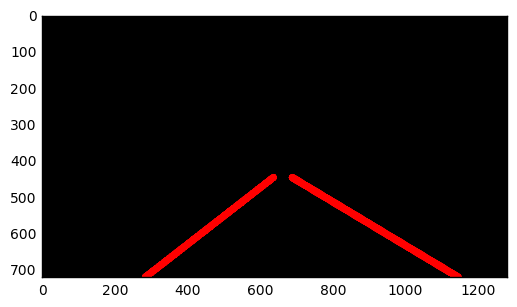

 40%|████      | 101/251 [01:21<02:04,  1.20it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


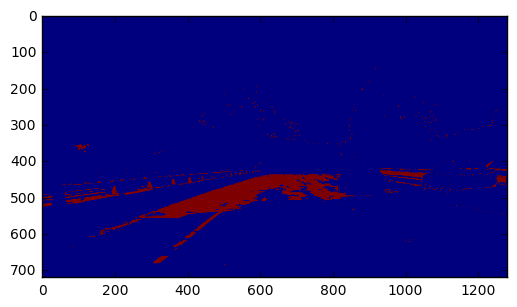

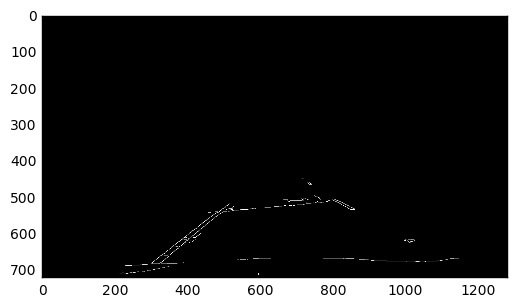

[-0.7830188679245287, 915.8490566037739]
[-0.8983957219251344, 976.6042780748668]
[0.6495726495726493, -16.44444444444422]
[-0.809302325581395, 950.5023255813954]
[-0.7533039647577092, 916.9383259911897]
[-0.898876404494382, 972.3595505617976]
[-0.8387096774193549, 954.2580645161293]
[0.6477272727272728, -11.8863636363633]
[0.8366336633663372, -92.1930693069315]
[-0.7574257425742581, 909.470297029703]
[0.6227758007117443, 54.22419928825586]
middle 616
left [715, 798, 715, 719] right [480, 496, 527, 511, 481, 482, 501]
(4, 2)
-16.5749195249 0.689177346595
SLOPE
942.283128337 -0.819861814954
ave 671 446
SLOPE
ave 605 446
x2 1068 271


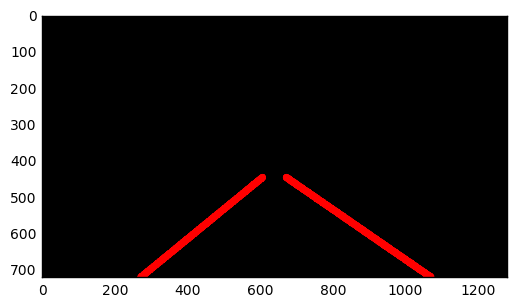

 41%|████      | 102/251 [01:22<02:02,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


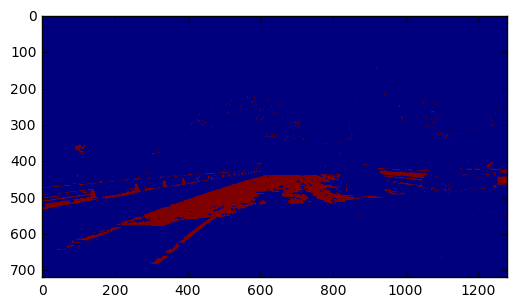

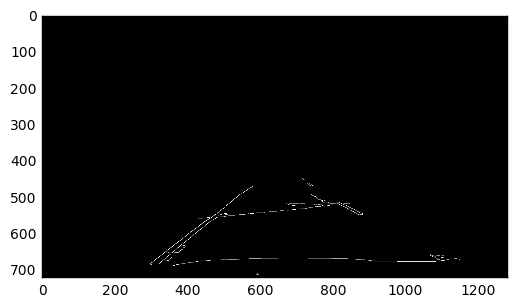

[-0.7790697674418602, 927.848837209302]
[-0.7531914893617024, 904.5787234042555]
[-0.7553191489361695, 906.3297872340419]
[0.5756756756756762, 40.75675675675602]
[-0.7529411764705869, 901.5999999999992]
[-0.7804878048780479, 943.2682926829262]
[0.5773480662983421, 41.53591160221049]
[-0.7803468208092481, 930.5895953757222]
[-0.7515923566878967, 913.2356687898081]
[-0.5787234042553193, 861.0893617021275]
[0.6991150442477887, 46.194690265485555]
[-0.7777777777777778, 925.8888888888888]
[-0.5789473684210525, 864.5263157894736]
[0.6477272727272723, -14.12499999999949]
[0.5541237113402064, 51.24742268041194]
[0.6986899563318775, -62.91266375545834]
[-0.5762711864406783, 861.4915254237291]
[0.83695652173913, -45.59782608695617]
[0.6752136752136755, 64.28205128205124]
[0.5762081784386608, 29.104089219331645]
[-0.6666666666666581, 866.666666666663]
[-0.7232142857142849, 886.508928571428]
[-0.7840909090909101, 929.5227272727274]
middle 628
left [730, 730, 672, 715, 716, 830, 671, 669, 845] righ

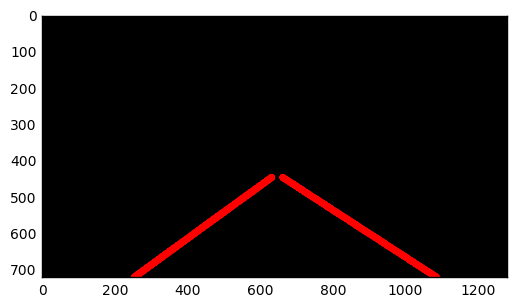

 41%|████      | 103/251 [01:23<02:00,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


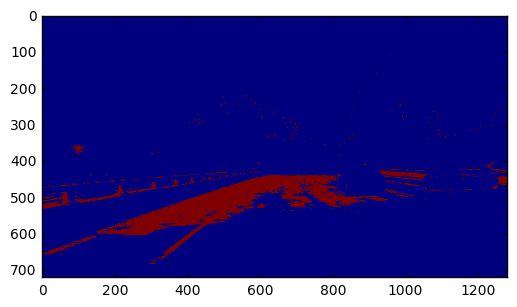

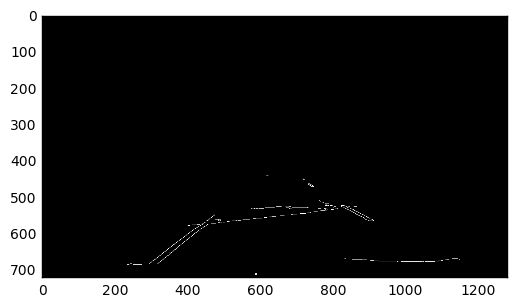

[-0.8079470198675501, 939.3112582781458]
[-0.7801418439716309, 914.141843971631]
[0.5531914893617017, 60.617021276596006]
[-0.8074074074074078, 919.762962962963]
[-0.6760563380281707, 876.0000000000008]
[0.552910052910053, 57.71693121693136]
[-0.7804878048780473, 926.7317073170723]
[-0.8106508875739645, 932.0591715976332]
[-0.6249999999999989, 870.8749999999994]
[0.6005361930294909, 21.01608579088439]
[-0.8089887640449446, 941.5730337078659]
[-0.8105726872246692, 1185.9955947136564]
[-0.8119658119658137, 941.7008547008553]
[0.8999999999999999, -128.0999999999998]
[-0.7018867924528308, 1124.3056603773584]
[-0.7611940298507461, 905.1343283582089]
[-0.7809523809523834, 1053.5904761904785]
[-0.8333333333333253, 946.4999999999972]
[-0.6923076923077119, 882.5384615384683]
[-0.5754716981132078, 843.9811320754717]
middle 623
left [731, 733, 716, 729] right [618, 436, 427, 355, 434, 475, 491, 620, 443, 414, 351, 346, 490]
(4, 2)
2.8125095711 0.651659433825
SLOPE
910.793058039 -0.751611740873
av

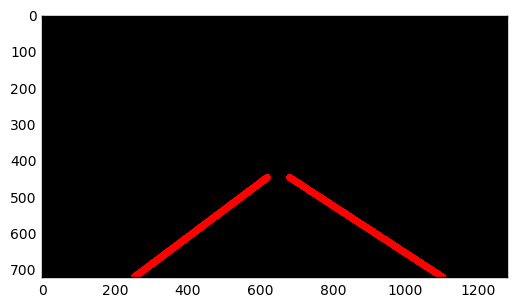

 41%|████▏     | 104/251 [01:23<01:57,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


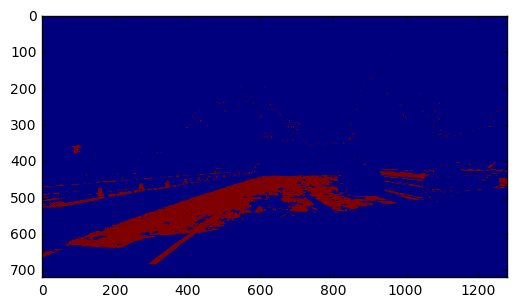

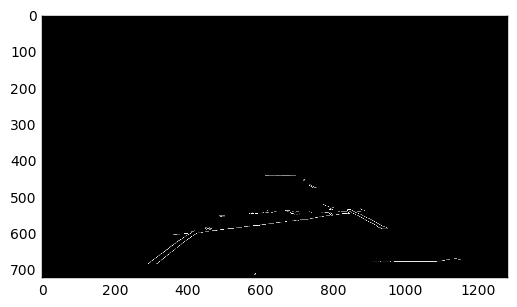

[-0.7267267267267268, 893.4774774774778]
[-0.7507692307692297, 916.7384615384613]
[0.5764705882352932, 40.505882352942216]
[-0.8571428571428635, 953.8571428571452]
[0.810344827586206, -154.41379310344752]
[0.8414634146341475, -193.07317073170864]
[0.6982248520710055, -22.621301775147458]
[-0.7173913043478263, 888.9347826086956]
[-0.6243523316062178, 864.3108808290156]
[0.8703703703703686, -173.0555555555538]
[-0.8985507246376802, 1235.95652173913]
[-0.7999999999999738, 935.5999999999893]
[0.5773480662983432, 41.64917127071763]
[0.7142857142857163, -73.00000000000193]
[-0.7267080745341618, 910.4534161490684]
[-0.7857142857142849, 929.1428571428569]
[-0.5993265993265996, 1063.606060606061]
[0.5530303030303038, 70.46969696969677]
[0.6227544910179643, 30.60479041916152]
[0.5990783410138247, 18.663594470046387]
[-0.726851851851852, 912.7268518518518]
middle 664
left [693, 852, 870, 717, 735, 854, 670, 720] right [624, 635, 351, 393, 402, 646, 396, 649]
(8, 2)
-52.7817717909 0.692798953182
S

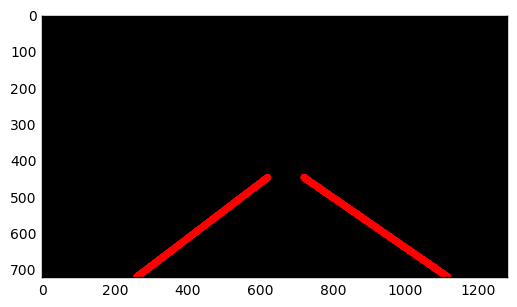

 42%|████▏     | 105/251 [01:24<02:03,  1.18it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


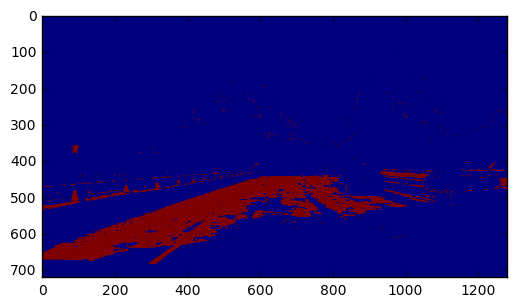

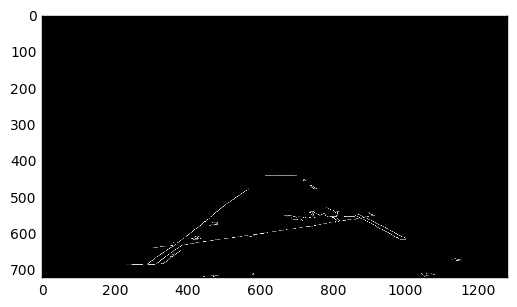

[-0.8082191780821911, 928.273972602739]
[-0.7803278688524581, 943.5311475409828]
[-0.8355555555555553, 946.542222222222]
[-0.7866666666666686, 913.1333333333341]
[-0.5978260869565211, 862.5543478260867]
[-0.7272727272727264, 1081.8181818181806]
[0.782352941176472, -112.29411764706039]
[-0.5764705882352942, 805.329411764706]
[-0.5785123966942144, 844.3801652892558]
[0.649411764705882, 33.81882352941199]
[-0.7968750000000003, 915.2656249999999]
[-0.5990220048899753, 859.3154034229825]
[-0.8397212543554008, 962.4668989547043]
[-0.8448275862068964, 927.9999999999997]
[0.7797619047619047, -105.08928571428594]
[-0.6501457725947524, 891.8513119533526]
[-0.5999999999999994, 1347.9999999999993]
[-0.8405797101449277, 927.6086956521742]
[0.6244897959183677, 5.355102040815968]
[-0.7058823529411781, 1063.7647058823543]
[-0.6744186046511615, 901.0697674418602]
[-0.8366336633663376, 950.3514851485154]
[-0.897058823529411, 969.7647058823527]
[0.7807017543859647, -109.54385964912278]
[0.866666666666658

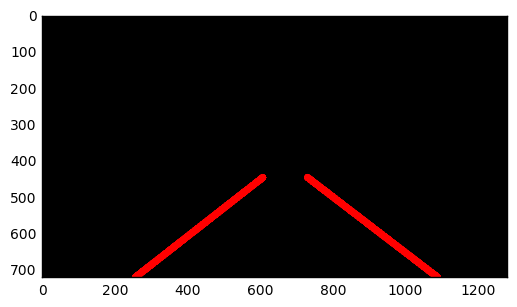

 42%|████▏     | 106/251 [01:25<02:01,  1.20it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


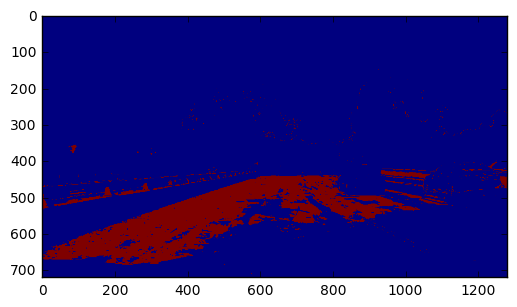

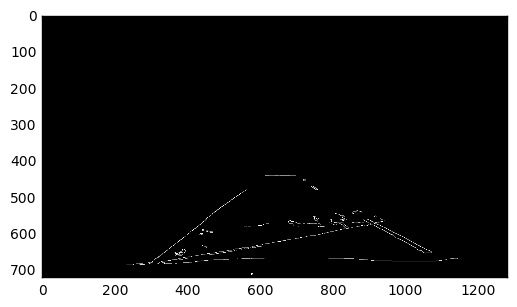

[-0.7787234042553193, 912.1659574468085]
[-0.781395348837208, 912.1674418604644]
[-0.5967741935483868, 877.9354838709673]
[-0.779922779922779, 916.4169884169877]
[0.8666666666666673, -138.80000000000035]
[0.5994623655913981, 19.38709677419325]
[-0.7803030303030299, 917.3106060606059]
[-0.6474358974358969, 1057.108974358974]
[-0.8370044052863435, 945.1453744493388]
[0.6249999999999993, 348.7500000000003]
[0.6008771929824557, 16.64035087719339]
[-0.8620689655172405, 942.6206896551719]
[-0.7275449101796408, 893.5329341317366]
[0.6655701754385964, 303.49999999999983]
[-0.5777777777777772, 966.2444444444434]
[-0.6477987421383653, 1012.037735849057]
[-0.7567567567567625, 899.1621621621651]
[-0.6489361702127656, 861.5106382978722]
[-0.600496277915633, 838.5285359801491]
[0.5761589403973513, 337.1324503311256]
[0.5745856353591164, 136.61325966850788]
[-0.8994974874371865, 976.7336683417092]
[-0.6285714285714286, 857.2285714285714]
middle 585
left [669, 720, 866, 756] right [528, 507, 392, 557,

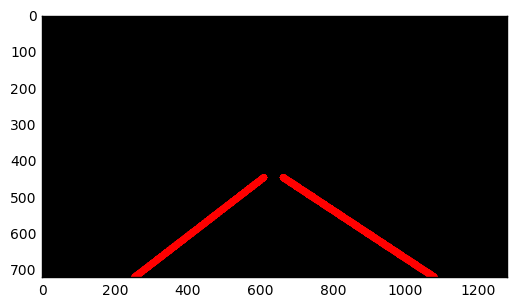

 43%|████▎     | 107/251 [01:26<01:58,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


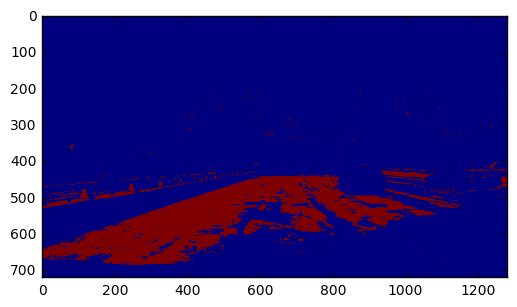

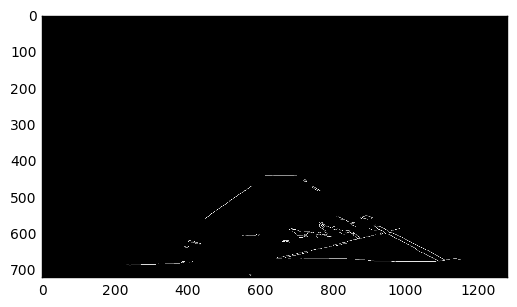

[0.5773955773955777, 50.68058968058947]
[-0.7005988023952091, 871.8682634730535]
[-0.8055555555555541, 1210.7499999999989]
[0.5755968169761264, 50.7453580901868]
[-0.7014925373134328, 1116.2537313432836]
[-0.8357142857142837, 1294.7857142857122]
[0.8657407407407398, -3.814814814813909]
[0.8378378378378375, -150.40540540540508]
[-0.5543071161048692, 1028.9550561797755]
[-0.8385826771653548, 951.5078740157484]
[-0.6818181818181823, 1072.6818181818182]
[-0.5520833333333323, 993.5520833333328]
[0.789473684210542, -195.21052631580662]
[0.6011560693641623, 23.16763005780316]
[-0.7013888888888902, 1154.465277777779]
[-0.8394160583941618, 1294.204379562045]
middle 752
left [1082] right [615, 573, 705]
(1, 2)
-195.210526316 0.789473684211
SLOPE
965.35265189 -0.74033322046
ave 812 446
SLOPE
ave 701 446
x2 1159 331


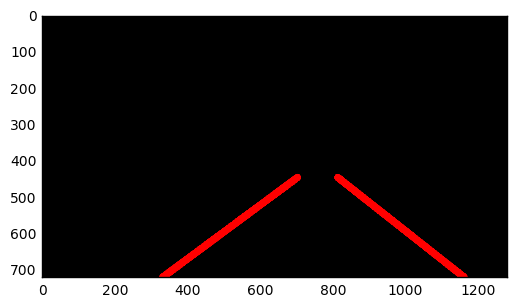

 43%|████▎     | 108/251 [01:27<01:59,  1.19it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


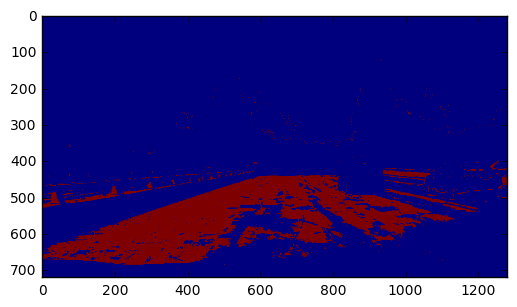

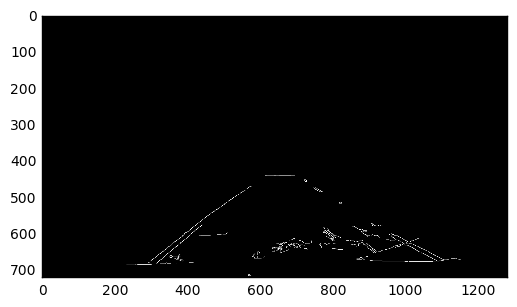

[-0.8384279475982535, 943.9126637554584]
[-0.7800000000000004, 908.0800000000002]
[0.6236842105263157, 48.32631578947376]
[-0.7802197802197813, 905.8021978021983]
[0.6236842105263155, 11.528947368421532]
[0.7824561403508777, -110.36842105263202]
[0.6005089058524179, 23.847328244274042]
[-0.7796610169491528, 910.3220338983052]
[0.6246056782334383, 119.84858044164068]
[0.8093525179856111, -132.35251798561117]
[-0.7777777777777842, 914.3333333333369]
[0.5521472392638035, 59.570552147239226]
[0.7515923566878985, -27.490445859872626]
[0.5994065281899104, 131.53709198813107]
[-0.8093645484949836, 961.2307692307695]
[-0.8661417322834655, 957.385826771654]
[0.8407960199004969, -152.2338308457706]
[-0.645569620253167, 1164.620253164559]
[-0.7999999999999997, 918.7999999999998]
[0.8666666666666707, -77.40000000000329]
[0.5988023952095805, 66.34730538922183]
[0.5752212389380529, 322.2920353982301]
middle 614
left [628, 687, 720, 693, 722, 689, 622, 746, 777, 624] right [539, 486, 465, 525, 570, 5

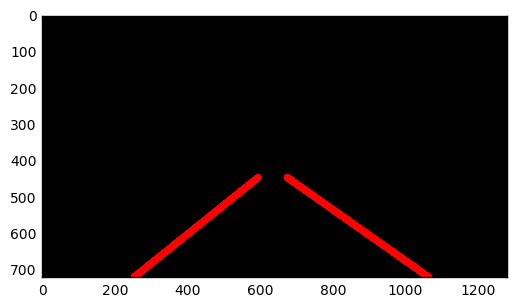

 43%|████▎     | 109/251 [01:28<02:02,  1.16it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


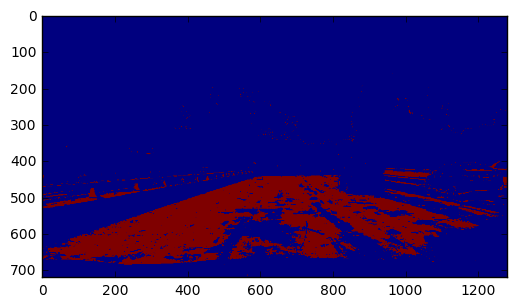

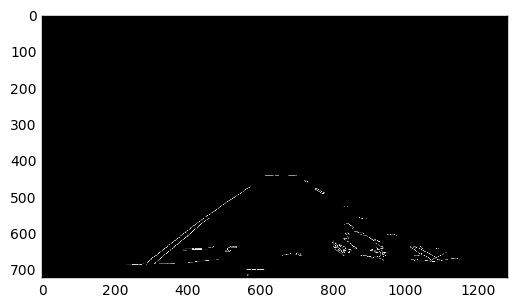

[-0.6987179487179507, 869.0769230769246]
[0.6747720364741641, -34.185410334346194]
[0.8990384615384616, -197.80288461538456]
[-0.6479999999999994, 854.7759999999995]
[0.5789473684210525, 87.42105263157866]
[-0.6980519480519476, 870.6818181818178]
[0.5536992840095463, 63.93078758949901]
[0.5771276595744678, 40.31382978723453]
[-0.8969072164948437, 965.8659793814421]
[-0.5764705882352941, 840.0705882352945]
[-0.6266666666666685, 1175.6266666666686]
[-0.8974358974358974, 960.3076923076923]
[0.6717325227963521, -29.541033434650217]
[0.6472727272727274, 28.392727272727214]
[-0.6007067137809191, 836.0636042402831]
[0.8705882352941174, -154.4823529411762]
[-0.6666666666666633, 1254.9999999999968]
[0.5536992840095466, 62.82338902147965]
[0.5773195876288655, 141.77319587628904]
[0.8689956331877723, -171.5458515283835]
[0.6733668341708537, -35.26130653266291]
[-0.8421052631578941, 923.5263157894732]
[-0.8391304347826086, 945.6478260869565]
[0.7500000000000003, 353.49999999999994]
[-0.84042553191

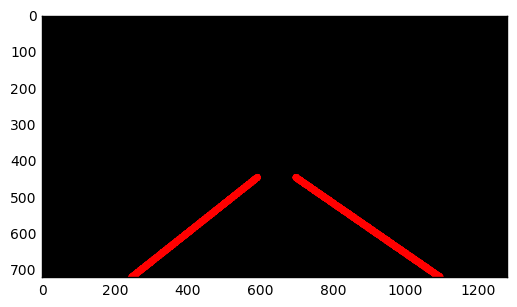

 44%|████▍     | 110/251 [01:29<02:02,  1.15it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


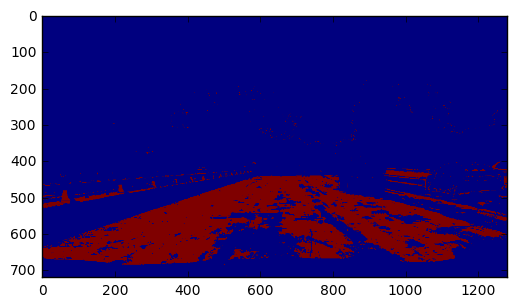

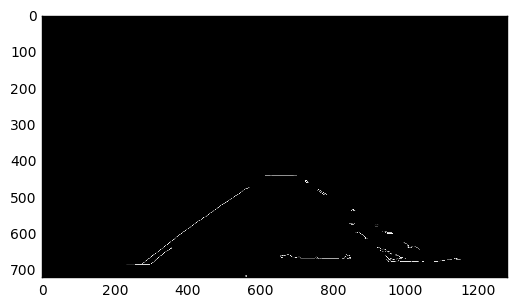

[-0.698996655518395, 868.1371237458196]
[-0.6979591836734694, 865.7714285714281]
[0.6257861635220129, 4.452830188679151]
[-0.7827715355805249, 915.917602996255]
[-0.6991404011461319, 874.4670487106017]
[0.62303664921466, 9.48167539266968]
[-0.6991404011461317, 870.971346704871]
[0.5989847715736035, 23.705583756345725]
[0.6486486486486485, -19.945945945945873]
[-0.8395061728395072, 938.6666666666672]
[-0.576832151300237, 833.8226950354609]
[0.5763688760806917, 45.034582132564665]
[-0.7003367003367014, 867.0875420875426]
[-0.6740740740740737, 860.2740740740736]
[-0.6005665722379606, 840.9773371104816]
[0.8075601374570448, -110.56357388316182]
[0.8461538461538526, -49.538461538466656]
[0.649275362318841, -16.07536231884062]
middle 661
left [696, 691, 695, 854, 687, 683, 835, 724] right [561, 504, 562, 620, 615, 513, 557, 622]
(8, 2)
-14.181084027 0.671976806871
SLOPE
882.661604195 -0.723990640539
ave 684 446
SLOPE
ave 603 446
x2 1092 224


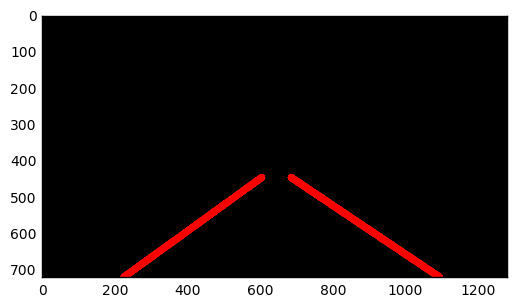

 44%|████▍     | 111/251 [01:29<01:57,  1.19it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


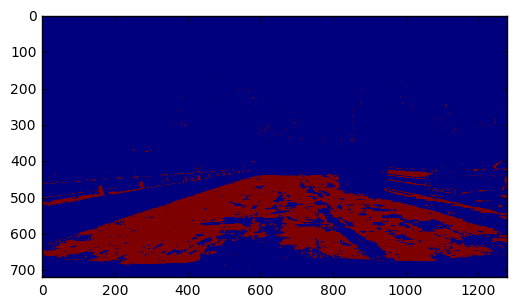

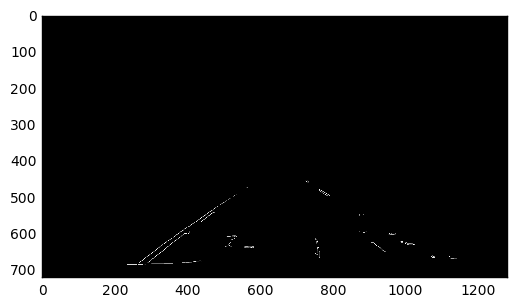

[-0.8092783505154644, 914.6443298969076]
[0.5994318181818187, 21.011363636363356]
[0.6217391304347826, 9.478260869565444]
[-0.8024691358024701, 896.8518518518521]
[-0.807692307692311, 895.8461538461552]
[-0.6296296296296291, 834.1481481481483]
[-0.650485436893205, 956.3592233009717]
[-0.7795698924731164, 898.6021505376335]
[0.7142857142857226, -23.571428571436506]
[-0.8380952380952364, 934.5904761904757]
[-0.6333333333333289, 830.1999999999971]
[0.5528455284552837, 58.28455284552929]
[-0.8301886792452854, 903.3396226415102]
[-0.8365384615384619, 926.1730769230771]
[0.5994318181818178, 17.812500000000274]
[-0.5609756097560986, 810.4390243902443]
[0.8461538461538557, 21.230769230761716]
[-0.8636363636363604, 916.4545454545442]
[-0.8809523809523778, 919.3333333333322]
[-0.6341463414634133, 834.9512195121948]
[-0.837209302325582, 910.2093023255815]
[-0.6296296296296214, 829.1851851851808]
[0.5528455284552833, 60.83739837398483]
[-0.6610169491525415, 866.779661016949]
[0.6231884057971016, 6

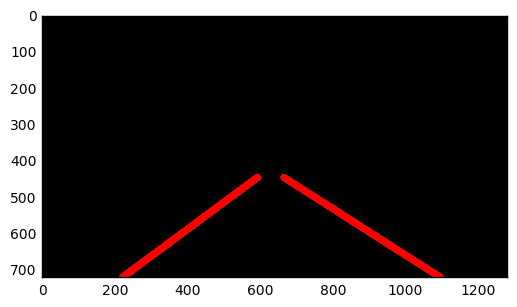

 45%|████▍     | 112/251 [01:30<02:01,  1.14it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


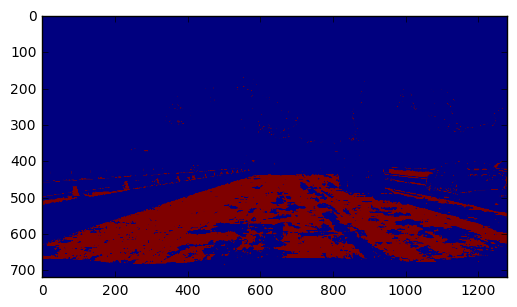

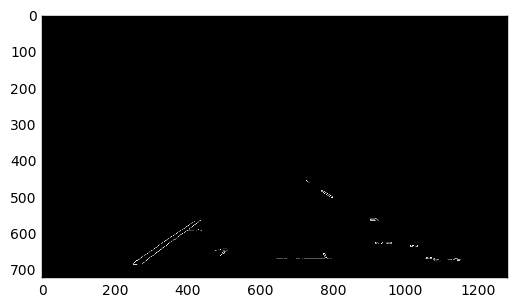

[-0.7295597484276725, 881.7106918238992]
[-0.6981132075471707, 855.8301886792456]
[0.6005434782608702, 19.005434782607807]
[-0.6994219653179192, 858.8554913294802]
[-0.725190839694655, 881.9770992366407]
[-0.7499999999999989, 874.7499999999995]
[-0.7777777777777769, 887.9999999999997]
[-0.8431372549019582, 909.9607843137248]
[-0.6994219653179196, 867.9479768786127]
[-0.6666666666666698, 848.0000000000007]
[0.7014925373134346, -56.28358208955384]
[-0.5769230769230768, 825.8076923076924]
[0.8068181818181822, -136.25000000000057]
middle 563
left [726, 726, 770] right [430, 355, 423, 404, 357, 387, 370, 436, 294, 407]
(3, 2)
-57.842715769 0.702951399131
SLOPE
869.283992457 -0.716621250257
ave 716 446
SLOPE
ave 590 446
x2 1106 208


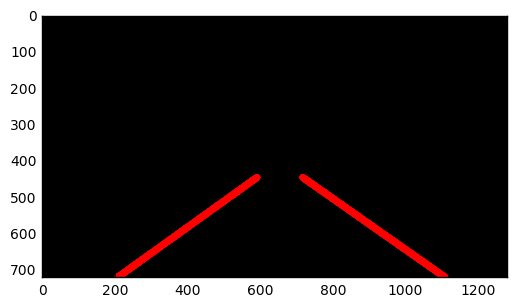

 45%|████▌     | 113/251 [01:31<01:57,  1.18it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


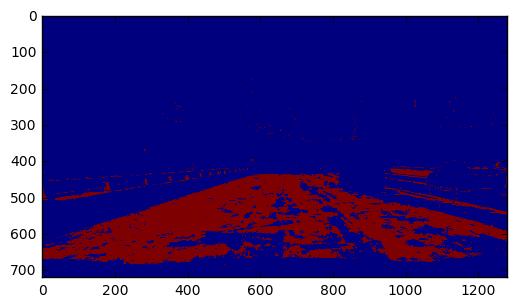

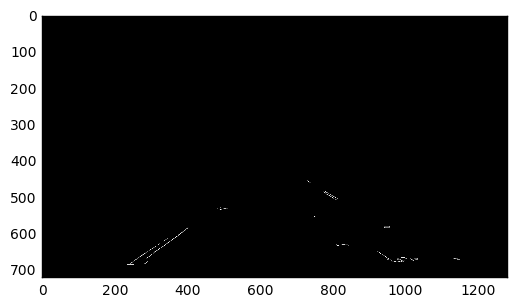

[-0.7259259259259252, 875.6444444444442]
[-0.6486486486486479, 837.4324324324325]
[0.8986175115207381, -213.42857142857227]
[-0.6485355648535563, 843.2426778242674]
[0.6018518518518526, 16.453703703702786]
[0.553097345132743, 139.94247787610652]
[-0.5561797752808986, 807.7528089887637]
[-0.727272727272727, 877.0909090909091]
middle 585
left [775, 727, 745] right [399, 346, 483, 494, 392]
(3, 2)
-19.0107966163 0.684522236168
SLOPE
848.232654556 -0.661312528396
ave 679 446
SLOPE
ave 608 446
x2 1079 193


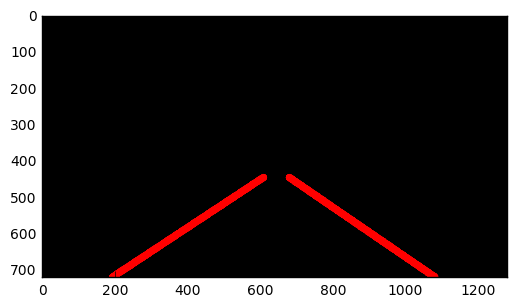

 45%|████▌     | 114/251 [01:32<01:53,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


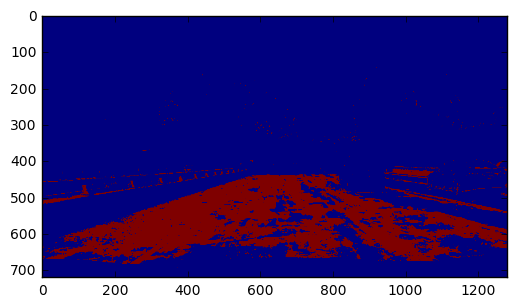

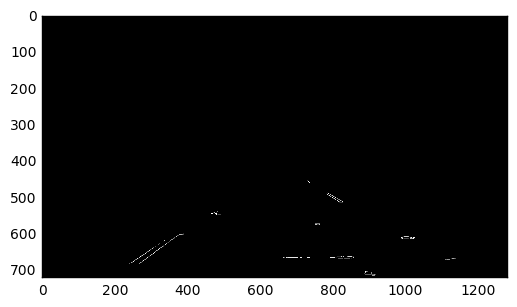

[-0.6982758620689647, 865.5517241379309]
[-0.6595744680851074, 842.297872340426]
[-0.6666666666666659, 842.9999999999997]
[-0.6729857819905211, 860.3222748815165]
[0.7647058823529382, -110.76470588235067]
[-0.6470588235294125, 849.6470588235301]
[-0.6495327102803734, 856.1261682242986]
[0.5787545787545784, 33.08791208791257]
[0.5731707317073186, 195.70731707316943]
[-0.7196261682243019, 874.2990654205621]
middle 589
left [783, 729, 824] right [376, 287, 336, 473, 477, 479, 377]
(3, 2)
39.3435077596 0.638877064272
AVERAGE
855.892023404 -0.673388640121
ave 707 446
AVERAGE
ave 464 446
x2 1135 57


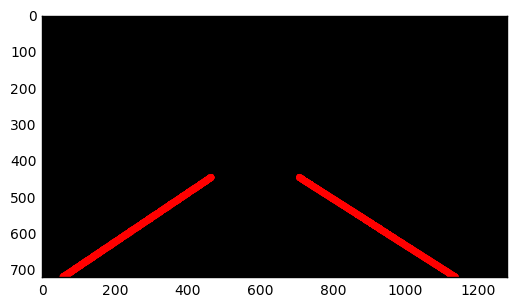

 46%|████▌     | 115/251 [01:33<01:51,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


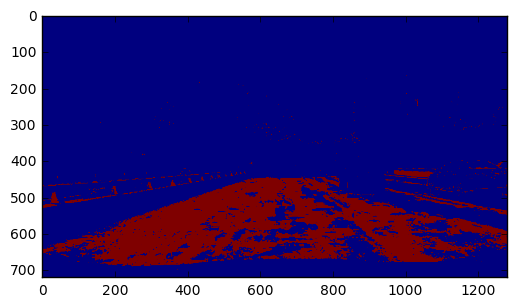

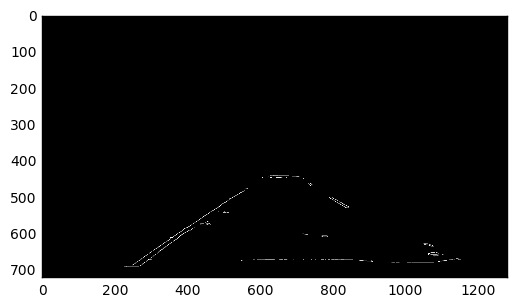

[-0.6473684210526314, 840.5421052631576]
[0.648351648351648, -10.846153846153458]
[0.6250000000000002, 2.3749999999993956]
[-0.649076517150395, 845.4802110817935]
[-0.6472148541114062, 837.5649867374008]
[-0.6971830985915505, 871.9647887323946]
[-0.6234413965087274, 850.2244389027428]
[-0.647668393782384, 860.3367875647673]
[-0.6484374999999996, 855.3515624999998]
[-0.57741935483871, 818.2096774193553]
[-0.6484375, 839.8984375000003]
[0.6482213438735169, -17.837944664030886]
[0.7142857142857125, -67.85714285714127]
[-0.6234096692111963, 841.4885496183208]
[0.5544794188861986, 51.53753026634394]
[-0.6023738872403557, 829.9169139465869]
[-0.5548961424332347, 811.780415430267]
[0.6730158730158727, -32.37777777777704]
[-0.7250000000000002, 885.35]
[-0.6019656019656019, 849.5208845208844]
[-0.7222222222222207, 870.0555555555547]
middle 674
left [700, 705, 822, 795, 706, 742] right [611, 617, 605, 403, 658, 649, 639, 655, 609, 636, 639, 670, 606, 672, 385]
(6, 2)
-12.5010814798 0.64389233306

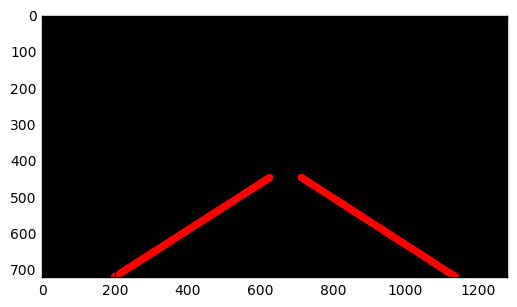

 46%|████▌     | 116/251 [01:34<01:57,  1.15it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


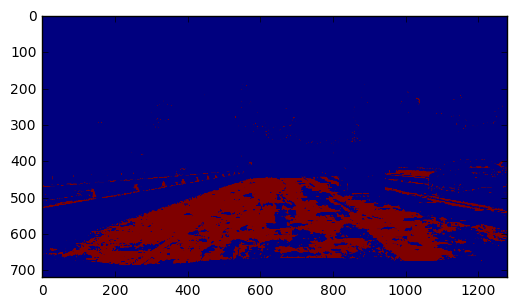

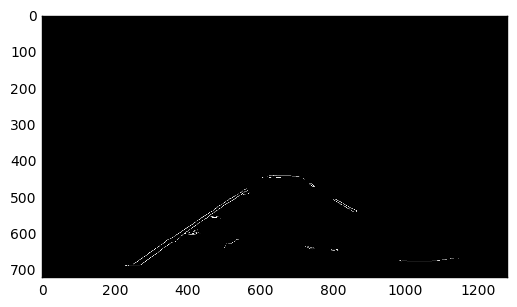

[-0.6994219653179184, 873.046242774566]
[-0.6725352112676056, 851.7711267605637]
[0.5533980582524272, 59.94174757281526]
[-0.6009732360097326, 843.8540145985402]
[-0.65, 860.5500000000002]
[0.5763546798029558, 45.77339901477812]
[-0.8680555555555569, 962.3750000000007]
[-0.899280575539568, 980.5971223021579]
[-0.7005813953488372, 876.5581395348836]
[-0.6982758620689654, 886.4999999999998]
[-0.699421965317919, 871.6473988439307]
[-0.6744186046511618, 852.9534883720925]
[-0.5750000000000002, 925.0749999999999]
[-0.753623188405798, 903.9565217391311]
[0.5520581113801448, 67.39225181598103]
[0.6482213438735167, 126.47826086956594]
[0.8688524590163936, -179.2131147540987]
[-0.7647058823529352, 881.3529411764684]
[-0.8974358974358954, 974.0256410256399]
[-0.7232142857142855, 903.8571428571424]
middle 623
left [694, 684, 684, 738] right [612, 529, 558, 560, 616, 610, 553, 541, 609, 347, 536]
(4, 2)
-1.52642908763 0.637665827113
AVERAGE
904.850783866 -0.745861840108
ave 700 446
SLOPE
ave 615 4

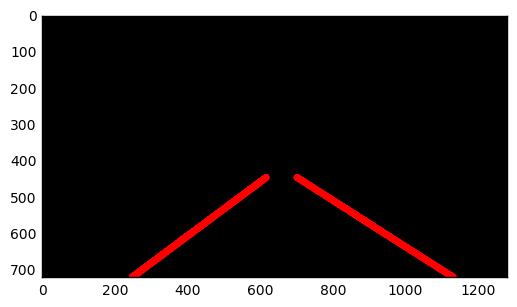

 47%|████▋     | 117/251 [01:35<01:58,  1.13it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


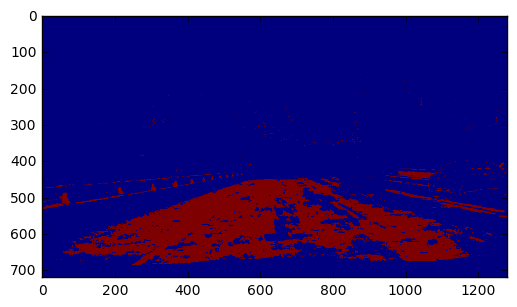

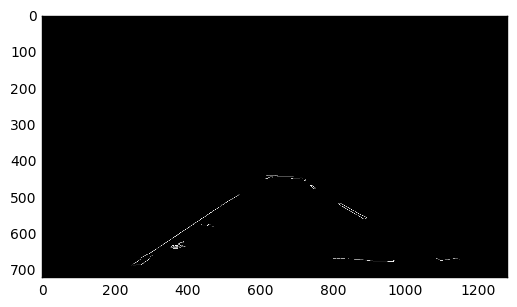

[-0.6748633879781414, 855.040983606557]
[0.620915032679739, 13.35947712418252]
[-0.7073170731707317, 860.2926829268292]
[-0.6748633879781426, 857.0655737704916]
[0.6511627906976756, -14.023255813954814]
[-0.6739726027397261, 867.9726027397256]
[-0.6748633879781419, 855.7158469945354]
[-0.5999999999999998, 851.3999999999994]
[0.6612903225806448, -25.903225806450845]
[-0.8390804597701165, 947.2643678160928]
[-0.8967741935483884, 974.6000000000005]
[-0.5771971496437053, 828.9904988123515]
[0.7000000000000018, -53.80000000000174]
[0.5555555555555562, 79.99999999999937]
[-0.5758293838862568, 834.4123222748821]
[-0.6004962779156333, 848.7344913151368]
[-0.6000000000000003, 852.6000000000001]
[0.6749999999999996, -36.02499999999968]
[-0.7251908396946567, 901.2213740458019]
[-0.7000000000000187, 860.8000000000056]
[0.7000000000000218, -54.00000000001883]
[-0.6739726027397257, 866.6246575342464]
[0.5555555555555556, 64.55555555555534]
[0.5544554455445543, 65.86138613861417]
middle 655
left [700

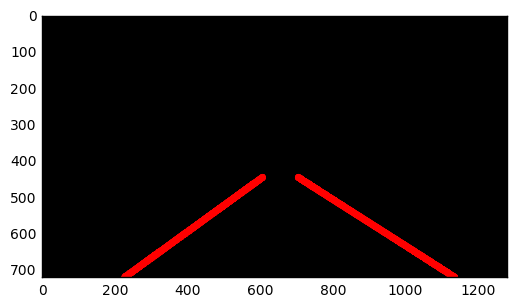

 47%|████▋     | 118/251 [01:35<01:52,  1.18it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


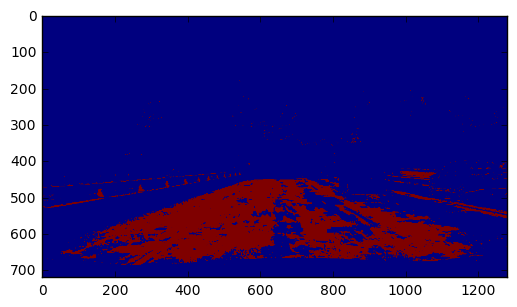

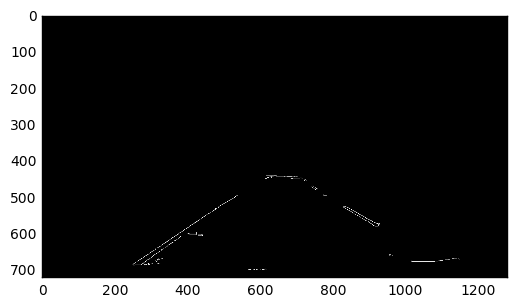

[-0.6483870967741929, 843.2967741935478]
[0.5778894472361804, 42.94472361809091]
[-0.652173913043478, 843.0434782608696]
[-0.6739726027397257, 866.6246575342464]
[-0.6489361702127651, 846.2340425531909]
[0.598971722365038, 31.308483290489004]
[-0.6261127596439163, 837.5816023738869]
[-0.6253229974160204, 862.3410852713174]
[-0.6481481481481483, 855.1666666666667]
[0.6000000000000003, 20.999999999999687]
[0.6990881458966564, -50.75075987841905]
[0.5991189427312773, 29.409691629956217]
[-0.7267080745341618, 901.2857142857146]
[-0.6250000000000002, 831.8749999999999]
[0.6010362694300521, 25.678756476683837]
[-0.6825396825396841, 870.1111111111115]
[0.6999999999999991, -68.49999999999898]
[0.6743515850144093, -27.697406340057544]
[-0.5798319327731094, 813.9915966386556]
[-0.6428571428571455, 839.357142857144]
[0.6479750778816198, -11.149532710279864]
middle 662
left [694, 689, 710, 712, 692, 696, 905, 698, 741] right [622, 618, 633, 626, 635, 639, 621, 627, 343, 645, 517]
(9, 2)
-0.8617826

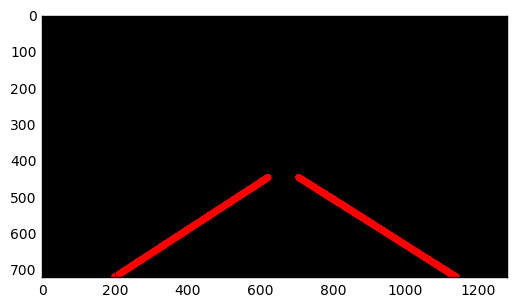

 47%|████▋     | 119/251 [01:36<01:51,  1.19it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


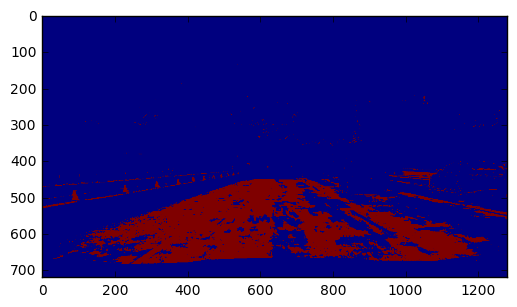

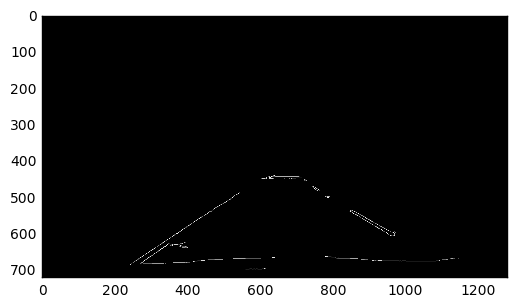

[-0.6481994459833794, 839.5678670360112]
[0.5989717223650384, 31.506426735218387]
[-0.6731843575418998, 862.3938547486033]
[-0.6501377410468315, 842.3333333333333]
[0.5760598503740645, 44.36658354114749]
[0.5773584905660375, 42.313207547169895]
[-0.6015831134564635, 842.4511873350917]
[-0.5765550239234448, 837.9401913875596]
[0.6005154639175259, 29.244845360824332]
[0.5767326732673268, 53.128712871286666]
[-0.6842105263157889, 854.5789473684208]
[0.7741935483870976, -109.06451612903304]
[0.598214285714286, 25.92857142857112]
[0.5980392156862736, 401.4901960784318]
[0.6500000000000006, -11.350000000000316]
[-0.8671328671328675, 931.8671328671331]
[-0.8124999999999823, 916.8124999999914]
[0.5539568345323741, 66.41726618705022]
middle 616
left [687, 692, 694, 689, 676, 726, 744, 699, 678] right [601, 605, 470, 430, 481]
(9, 2)
19.1656775047 0.611778096569
SLOPE
877.031956121 -0.732436116096
ave 697 446
SLOPE
ave 588 446
x2 1145 214


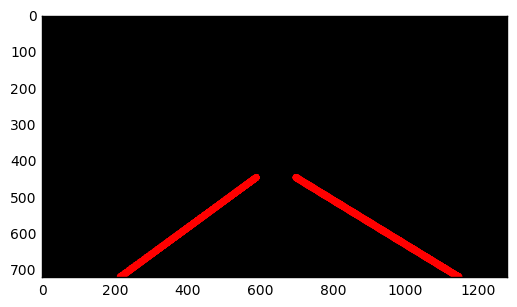

 48%|████▊     | 120/251 [01:37<01:47,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


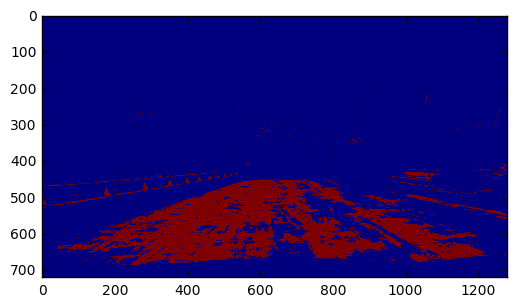

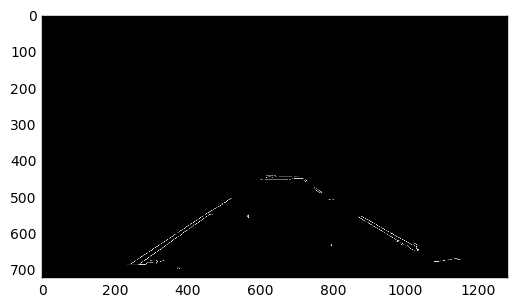

[0.6000000000000004, 33.599999999999845]
[-0.6466431095406355, 837.6678445229678]
[-0.724, 878.3079999999998]
[0.5760598503740646, 46.36658354114771]
[0.5760598503740649, 42.486284289276576]
[-0.6004962779156331, 826.3151364764268]
[-0.6006389776357828, 823.6070287539934]
[-0.5995024875621888, 827.4825870646764]
[0.6666666666666665, -44.99999999999973]
[0.6464646464646462, -3.9999999999996305]
[0.5774999999999999, 39.75000000000032]
[0.5754475703324808, 38.70588235294134]
[0.6005154639175255, 31.845360824742365]
[0.6005154639175261, 24.840206185566934]
[-0.6721311475409836, 854.0327868852456]
[-0.7831858407079642, 909.2566371681415]
[-0.684210526315784, 856.0526315789446]
[0.6464646464646462, -5.9393939393938675]
[0.6242236024844717, 4.5465838509318734]
[-0.7254098360655732, 877.959016393442]
[-0.626459143968872, 830.9105058365765]
[-0.6227848101265825, 838.5822784810127]
[0.8965517241379363, -278.620689655178]
[0.6019108280254771, 18.633757961783765]
[-0.7546012269938662, 974.95705521

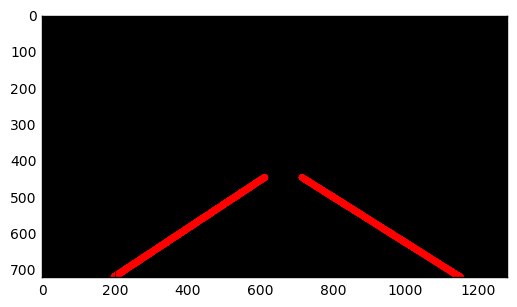

 48%|████▊     | 121/251 [01:38<01:45,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


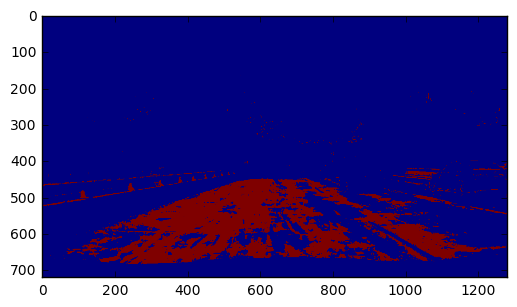

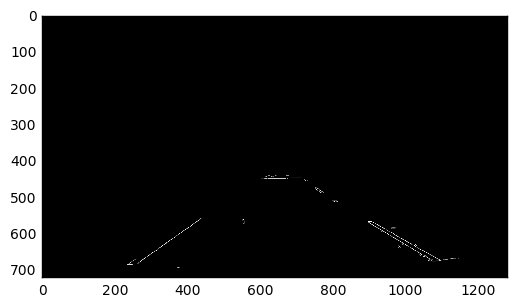

[-0.6961325966850838, 862.2099447513817]
[0.6000000000000004, 30.399999999999416]
[0.5756823821339953, 44.77915632754312]
[-0.6732954545454549, 855.0170454545453]
[0.6239999999999994, 9.568000000000614]
[-0.7999999999999958, 893.7999999999987]
[0.6743119266055042, -33.784403669724405]
[-0.8666666666666749, 910.2000000000025]
[0.6716417910447778, -60.776119402986865]
[0.6487252124645891, -16.189801699716583]
[-0.6521739130434746, 837.6086956521729]
[0.6015831134564635, 22.282321899736594]
[-0.785714285714271, 901.5714285714218]
[0.5972222222222221, 19.444444444444365]
[-0.7000000000000007, 865.3000000000003]
[0.6976744186046507, -87.16279069767418]
[0.6470588235294119, -16.764705882353077]
[0.6246648793565688, 2.6112600536191]
[-0.6999999999999981, 955.399999999999]
[0.5762273901808778, 43.64082687338594]
[0.6725663716814158, -42.035398230088035]
middle 598
left [686, 690, 693, 713, 960, 714, 706, 1024, 962, 726, 705, 700, 910] right [437, 296, 276, 280, 436, 429, 552]
(13, 2)
-6.460554

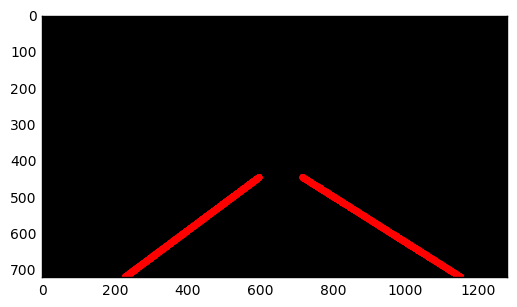

 49%|████▊     | 122/251 [01:38<01:42,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


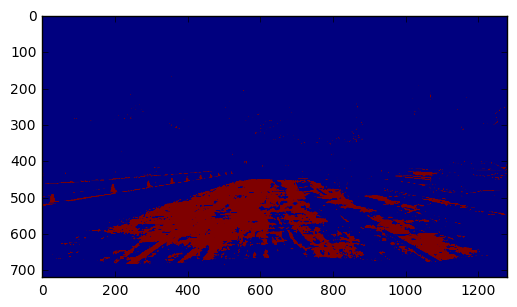

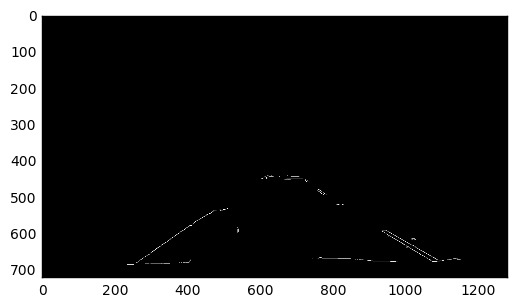

[-0.7, 861.8000000000001]
[0.5767326732673274, 46.78465346534591]
[0.575980392156863, 56.669117647058414]
[-0.7252747252747258, 875.4725274725274]
[0.7184466019417451, -64.97087378640602]
[0.5756823821339951, 46.354838709677594]
[0.7263157894736846, -74.30526315789504]
[0.5531914893617019, 82.872340425532]
[0.7528089887640448, -93.03370786516821]
[-0.6989247311827965, 862.9247311827955]
[0.5503731343283581, 294.99999999999983]
[-0.7200000000000045, 866.4800000000014]
[0.5555555555555559, 79.22222222222197]
[-0.7245508982035924, 889.4970059880236]
[-0.7248677248677257, 876.0899470899476]
[0.8999999999999987, -248.69999999999874]
middle 586
left [687, 669, 714, 689, 726, 651, 724, 950, 933] right [424, 446, 442, 284, 454]
(9, 2)
-18.78963026 0.659412652517
SLOPE
868.553441149 -0.713813436265
ave 704 446
SLOPE
ave 591 446
x2 1120 208


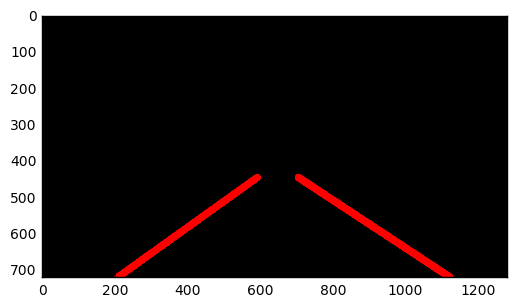

 49%|████▉     | 123/251 [01:39<01:44,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


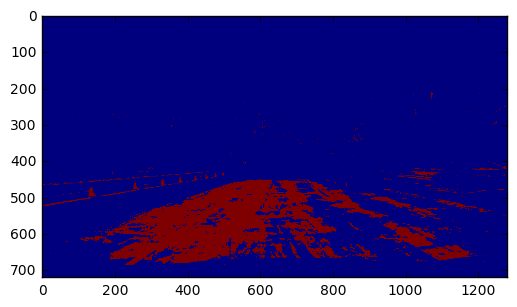

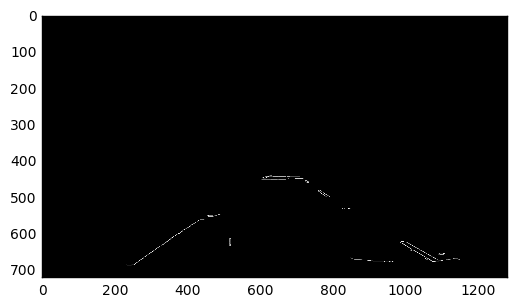

[0.5989717223650385, 34.90231362467873]
[-0.7028985507246367, 862.4275362318834]
[0.6229946524064173, 7.280748663101531]
[0.624561403508772, 2.435087719297868]
[0.6496350364963488, -8.795620437954733]
[0.6229050279329609, 9.21229050279337]
[-0.7142857142857121, 867.4285714285704]
[-0.7647058823529291, 889.294117647054]
[0.6449275362318845, -4.224637681159777]
[0.5994065281899111, 36.00296735905017]
[0.6742424242424238, -31.340909090908475]
middle 544
left [683, 701, 707, 697, 698, 695, 679, 705] right [389, 380, 411]
(8, 2)
5.68403008236 0.629705541422
AVERAGE
873.050075103 -0.727296715788
ave 697 446
SLOPE
ave 587 446
x2 1132 210


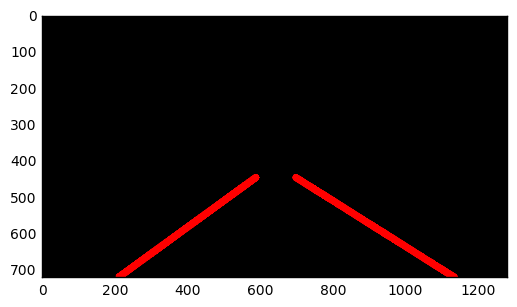

 49%|████▉     | 124/251 [01:40<01:41,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


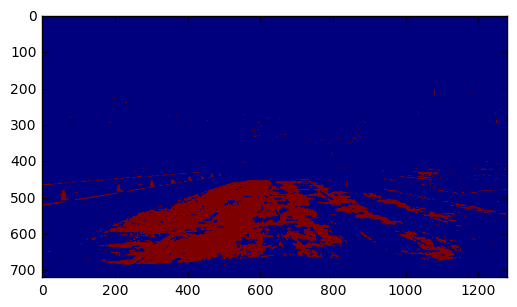

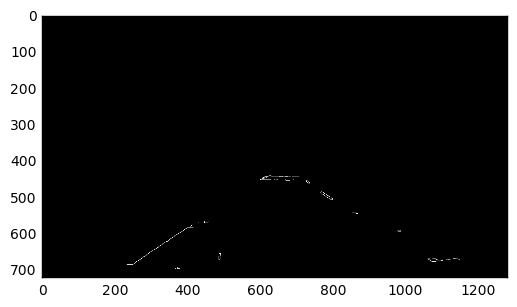

[-0.6487935656836453, 842.6568364611259]
[0.6969696969696967, -51.9999999999995]
[-0.6253687315634213, 837.1061946902648]
[0.7500000000000014, -86.00000000000121]
[-0.6763285024154582, 861.6473429951689]
[0.6801848049281313, 331.2499999999998]
[0.7499999999999997, -92.25000000000003]
[0.6768916155419222, 330.9999999999999]
[-0.6748466257668699, 853.0368098159505]
[0.7746478873239456, -106.19718309859287]
[0.7321428571428545, -74.82142857142655]
middle 613
left [726, 708, 775, 718, 710] right [412]
(5, 2)
-82.253722334 0.740752088287
SLOPE
853.036809816 -0.674846625767
ave 713 446
SLOPE
ave 603 446
x2 1083 197


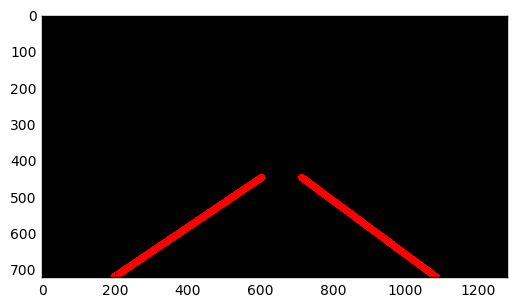

 50%|████▉     | 125/251 [01:41<01:39,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


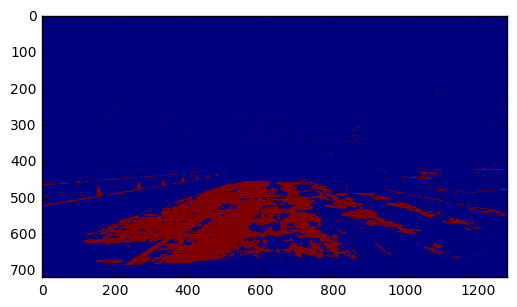

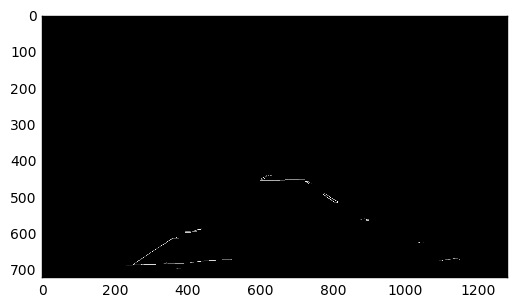

[-0.6732394366197175, 853.2901408450697]
[0.7266666666666661, -70.74666666666624]
[0.7808219178082185, -110.50684931506812]
[0.6010928961748627, 22.420765027322783]
[0.5773195876288655, 42.25773195876343]
[-0.6923076923076923, 861.5384615384617]
[0.777777777777779, -109.00000000000104]
[-0.8999999999999997, 948.6999999999998]
[-0.8666666666666668, 917.3999999999999]
[-0.6733067729083675, 856.7370517928293]
[0.7216494845360854, -70.88659793814689]
[0.552763819095477, 54.668341708543224]
middle 591
left [718, 714, 713, 708, 720, 780, 717] right [359, 393, 327]
(7, 2)
-34.5418964608 0.676870307098
SLOPE
909.212820513 -0.819658119658
ave 709 446
SLOPE
ave 565 446
x2 1114 230


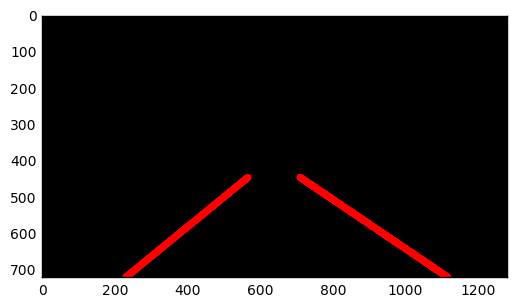

 50%|█████     | 126/251 [01:42<01:37,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


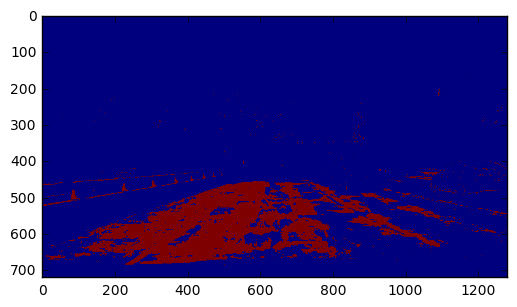

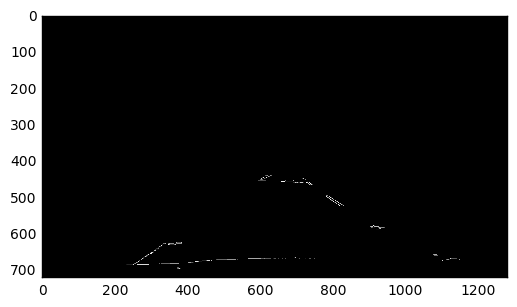

[-0.672364672364672, 852.7464387464388]
[-0.5534441805225652, 819.3800475059379]
[0.6974358974358974, -51.75897435897428]
[0.6972477064220188, -53.46788990825752]
[0.5546218487394967, 68.64705882352855]
[0.781249999999997, -112.31249999999757]
[0.6515151515151519, -14.000000000000394]
[-0.7267267267267262, 893.5705705705708]
[0.754545454545456, -98.10909090909213]
[-0.7815126050420174, 923.9747899159668]
[-0.882352941176458, 982.6470588235217]
middle 684
left [718, 811, 693, 730, 726, 794] right [599, 662, 620, 618, 615]
(6, 2)
-43.5002327255 0.689436009776
SLOPE
894.463781112 -0.723280225166
ave 710 446
AVERAGE
ave 558 446
x2 1107 179


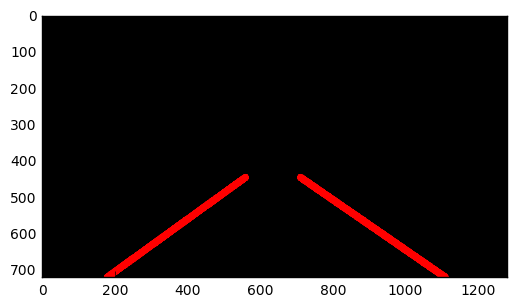

 51%|█████     | 127/251 [01:42<01:38,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


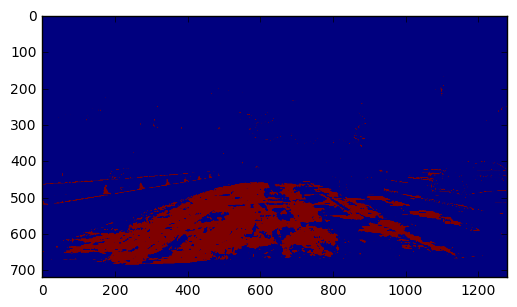

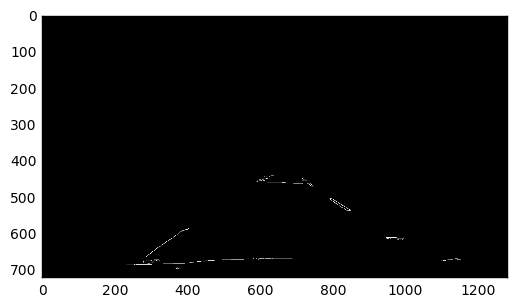

[-0.6224489795918369, 832.8979591836737]
[-0.7499999999999987, 877.7499999999995]
[0.6511627906976738, -9.069767441859483]
[0.6733067729083657, -32.41434262948084]
[-0.5753768844221108, 854.1608040201004]
[-0.6000000000000003, 827.0000000000006]
[0.5744680851063825, 66.51063829787287]
[0.7777777777777835, -120.22222222222706]
[0.7264957264957271, -78.44444444444504]
[-0.7272727272727281, 965.0909090909095]
[-0.7540983606557372, 876.5409836065572]
[-0.7424242424242402, 874.3181818181814]
middle 642
left [791, 715, 678, 827, 832] right [628, 341, 615, 315, 321]
(5, 2)
-34.728027688 0.680642230597
SLOPE
857.701424922 -0.693794316534
ave 706 446
SLOPE
ave 593 446
x2 1108 198


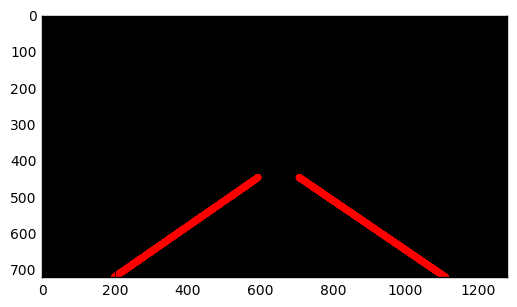

 51%|█████     | 128/251 [01:43<01:36,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


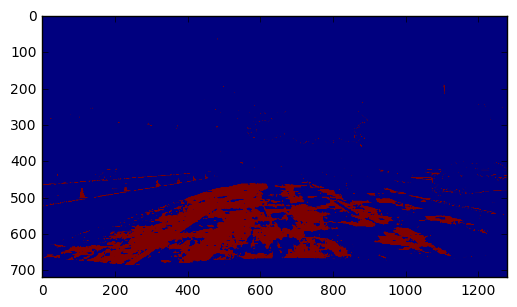

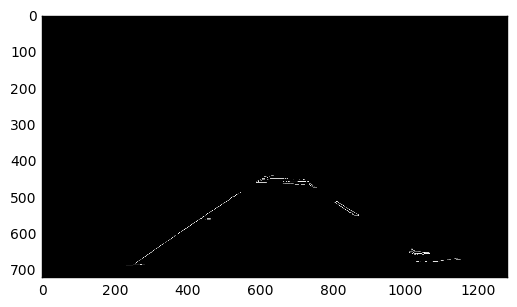

[-0.6740331491712706, 854.160220994475]
[-0.672413793103448, 851.7413793103449]
[0.6745562130177518, -28.260355029585977]
[0.626373626373626, 6.527472527472421]
[0.5530864197530867, 66.71111111111067]
[0.7248908296943227, -75.16157205240123]
[0.6748971193415637, -27.94238683127571]
[0.8750000000000016, -201.62500000000136]
[0.8974358974358949, -269.7948717948691]
[0.6496598639455782, -14.697278911564185]
[0.65034965034965, -13.461538461537991]
middle 678
left [709, 708, 693, 810, 803, 827, 1016, 743, 748] right [610, 535]
(9, 2)
-61.9671577159 0.702916624435
SLOPE
852.950800152 -0.673223471137
ave 722 446
SLOPE
ave 604 446
x2 1112 197


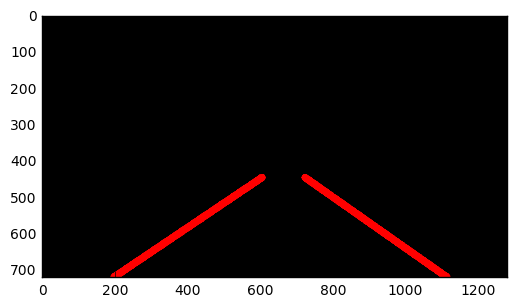

 51%|█████▏    | 129/251 [01:44<01:39,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


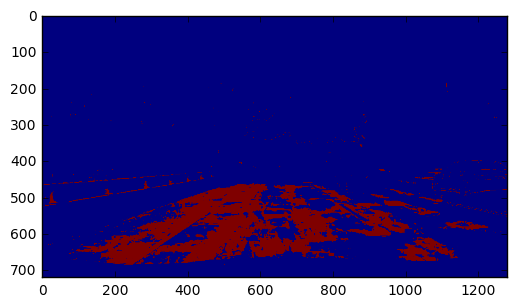

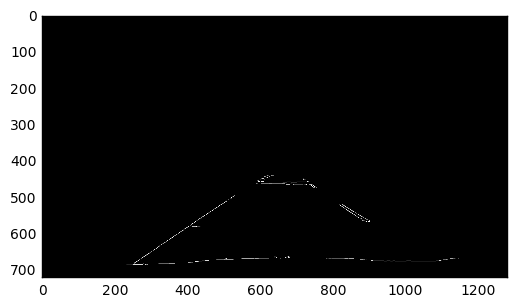

[-0.6737588652482281, 851.7446808510646]
[0.6488095238095243, -7.845238095238838]
[0.6011080332409974, 24.601108033240635]
[-0.6749116607773864, 852.7031802120149]
[-0.6991404011461319, 874.4670487106017]
[0.6746268656716411, -33.707462686566295]
[-0.612903225806449, 818.935483870966]
[0.6746031746031738, -30.857142857142243]
[0.8104838709677423, -137.9153225806456]
middle 651
left [718, 721, 717, 738, 755] right [528, 530, 620, 615]
(5, 2)
-37.1448116373 0.681926293659
SLOPE
849.462598411 -0.665178538245
ave 708 446
SLOPE
ave 606 446
x2 1110 194


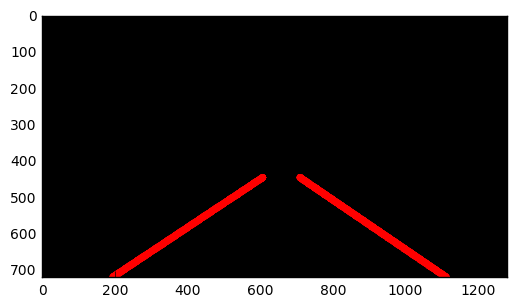

 52%|█████▏    | 130/251 [01:45<01:39,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


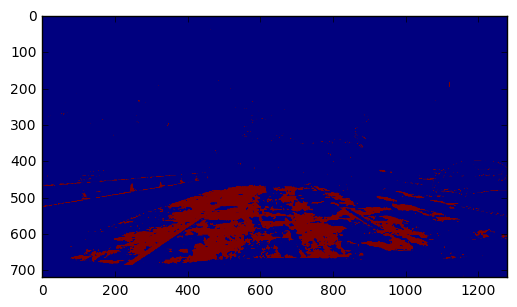

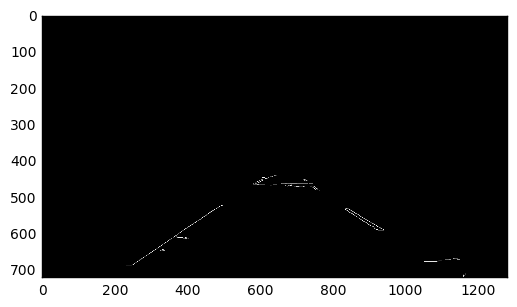

[-0.6726726726726728, 852.4774774774776]
[0.625, 13.875000000000254]
[0.6260623229461759, 4.609065155807157]
[0.6005586592178777, 32.60055865921747]
[0.6482558139534887, -17.930232558140084]
[0.5988857938718662, 39.186629526462404]
[0.5779816513761472, 42.96330275229302]
[-0.6237373737373734, 841.0631313131306]
[-0.7016129032258067, 867.4919354838712]
[0.6231884057971016, 10.811594202898764]
[0.6727272727272727, -38.1090909090908]
[0.6009070294784581, 21.54875283446728]
[0.6013667425968107, 18.41457858769922]
[0.5538461538461538, 72.64615384615367]
[-0.6510067114093967, 846.4161073825509]
[0.6749999999999988, -33.37499999999924]
[0.8823529411764763, -231.35294117647607]
middle 664
left [717, 721, 715, 728, 706, 725, 724, 898, 718, 721, 703, 725, 915] right [579, 643, 491, 612]
(13, 2)
-4.93166377529 0.637394829768
SLOPE
851.862162914 -0.662257415261
ave 707 446
SLOPE
ave 612 446
x2 1137 199


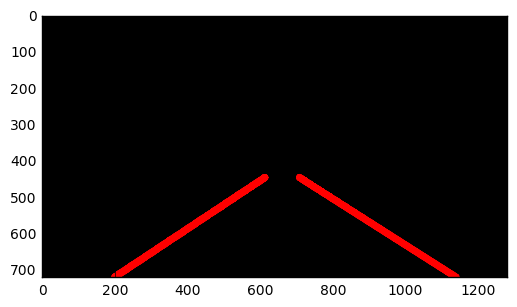

 52%|█████▏    | 131/251 [01:46<01:36,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


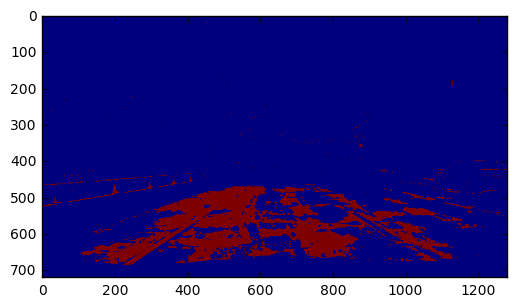

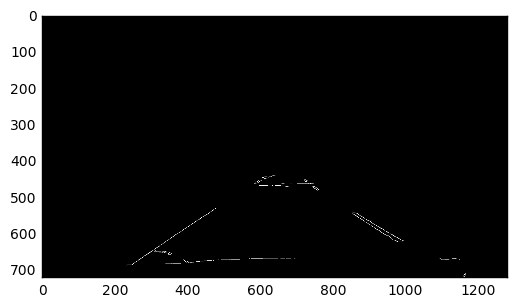

[-0.6739130434782602, 851.7826086956521]
[0.6007604562737646, 26.24714828897292]
[0.6971428571428574, -50.94285714285756]
[0.5781818181818182, 57.694545454545484]
[0.6976744186046546, -48.627906976746985]
[-0.6499999999999924, 839.8999999999952]
[0.6993006993007, -50.69230769230866]
[0.7755102040816346, -122.3877551020426]
[-0.6711409395973145, 852.0402684563751]
[-0.5542521994134898, 836.4574780058654]
[0.6016949152542379, 26.525423728812804]
[-0.870370370370376, 921.5555555555575]
[-0.7333333333333137, 873.4666666666589]
[-0.5773584905660375, 817.3018867924526]
[-0.6243902439024377, 829.8731707317064]
[0.6231343283582091, 0.8507462686566687]
[-0.6976744186046475, 857.1162790697662]
[0.5549132947976871, 72.89595375722584]
middle 625
left [727, 720, 701, 719, 726, 858, 752, 724, 703] right [476, 606, 605, 366, 392, 605, 618, 294]
(9, 2)
-9.82633437953 0.647590332444
SLOPE
855.379554496 -0.687272604982
ave 703 446
SLOPE
ave 595 446
x2 1126 196


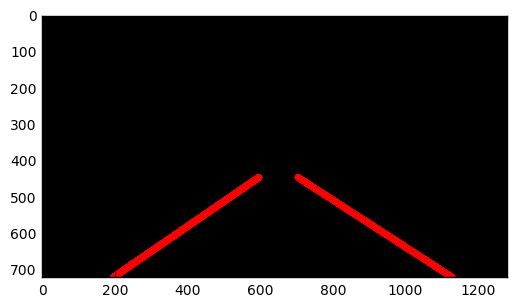

 53%|█████▎    | 132/251 [01:46<01:35,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


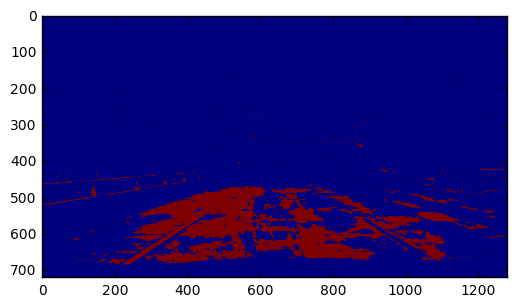

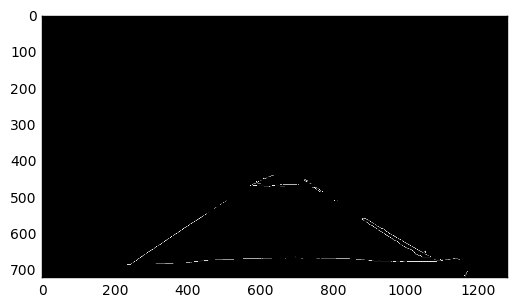

[0.5988700564971757, 26.82485875706165]
[-0.6724137931034474, 847.7241379310344]
[0.575931232091691, 60.2722063037244]
[0.6005747126436778, 23.778735632184315]
[0.6480263157894747, -8.411184210527384]
[-0.6862745098039221, 855.6666666666669]
[0.5775280898876399, 34.60224719101201]
[0.6009174311926603, 21.53669724770657]
[0.6501650165016497, -13.221122112210706]
[-0.7272727272727382, 871.5454545454593]
[-0.7368421052631563, 876.4736842105257]
[-0.6279069767441873, 828.1395348837215]
[-0.6732026143790865, 847.2418300653601]
[0.6478873239436614, -9.563380281689597]
[-0.6829268292682876, 852.1707317073148]
middle 589
left [730, 701, 733, 729, 721, 723, 734, 751] right [416, 476, 427, 439, 394, 400]
(8, 2)
16.9773823159 0.612487522318
SLOPE
858.470417521 -0.696488763182
ave 700 446
SLOPE
ave 592 446
x2 1147 198


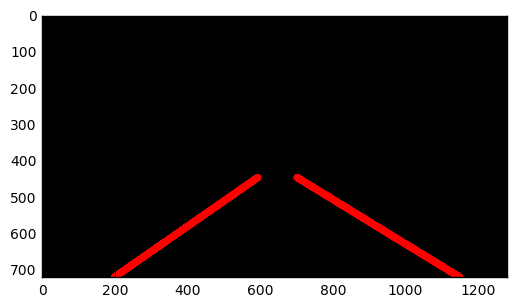

 53%|█████▎    | 133/251 [01:47<01:33,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


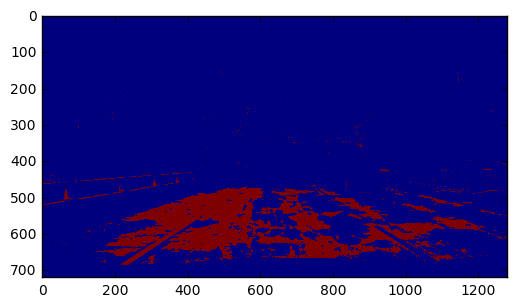

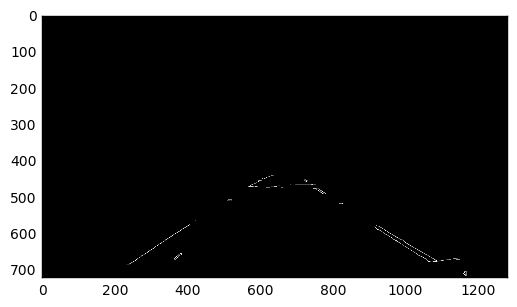

[-0.6470588235294124, 837.4117647058828]
[0.6011396011396013, 24.763532763532858]
[0.6224188790560472, 14.746312684366144]
[0.577102803738318, 40.09813084112151]
[0.5999999999999995, 25.0000000000004]
[-0.8999999999999995, 999.5999999999993]
[-0.8419117647058815, 974.6139705882341]
[0.5765765765765765, 35.13513513513517]
[-0.60294117647059, 825.8823529411771]
[0.5779816513761454, 54.47706422018484]
[-0.6000000000000154, 826.2000000000045]
[0.5994318181818187, 40.40340909090856]
[-0.7803921568627452, 955.2823529411767]
[0.6136363636363622, 10.113636363637884]
[0.8260869565217391, -142.73913043478257]
[0.5765027322404372, 58.41256830601085]
[0.5625000000000012, 70.9999999999988]
[0.6909090909090915, -46.83636363636419]
[0.874999999999991, -220.7499999999911]
[0.6243093922651941, 9.629834254142724]
[0.5755102040816329, 57.96326530612239]
middle 635
left [734, 725, 738, 735, 723, 712, 710, 989, 726, 707, 944, 722, 914, 731, 709] right [574, 614, 300, 272, 618]
(15, 2)
2.09449299293 0.63327

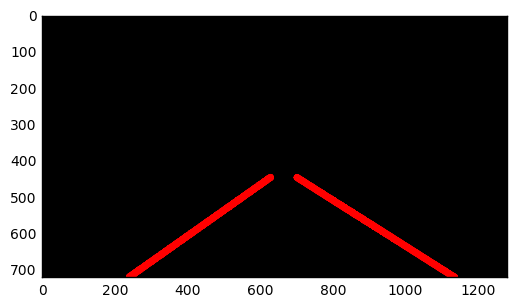

 53%|█████▎    | 134/251 [01:48<01:33,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


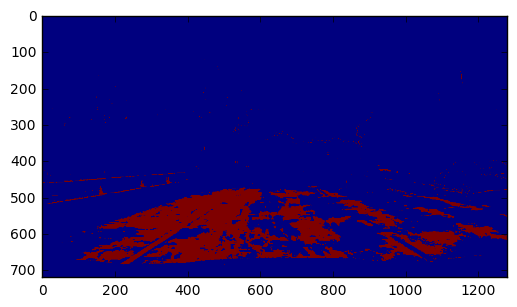

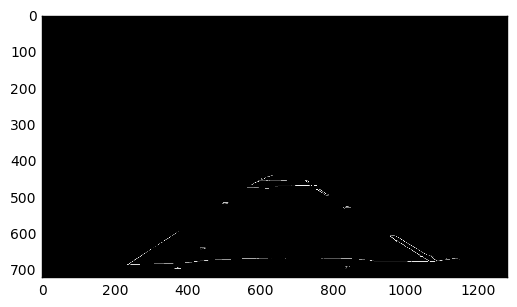

[0.5549597855227879, 69.5388739946383]
[-0.625, 830.0000000000006]
[0.6468646864686465, -9.739273927392317]
[0.6966292134831443, -63.46067415730183]
[-0.6249999999999997, 828.5]
[-0.8373702422145333, 1004.1522491349486]
[0.5806451612903226, 36.19354838709678]
[-0.7525773195876283, 898.4845360824738]
[-0.6249999999999992, 831.7499999999995]
[-0.7249190938511323, 883.3527508090611]
[0.6744186046511639, -38.48837209302465]
[0.59090909090909, 27.77272727272759]
[0.553299492385787, 51.30456852791862]
[-0.577777777777778, 812.2222222222224]
[0.7460317460317453, -112.68253968253907]
[0.8383458646616543, -152.28571428571394]
[-0.6006493506493509, 823.5779220779222]
[0.8700787401574809, -179.28740157480345]
[0.6666666666666765, -46.666666666677706]
middle 704
left [718, 737, 961, 723, 751, 723, 726, 962, 722, 729, 1054] right [616, 604, 657, 576, 622, 584, 620, 582]
(11, 2)
-37.9819022005 0.67444082293
SLOPE
864.004960041 -0.67103672301
ave 717 446
SLOPE
ave 622 446
x2 1123 214


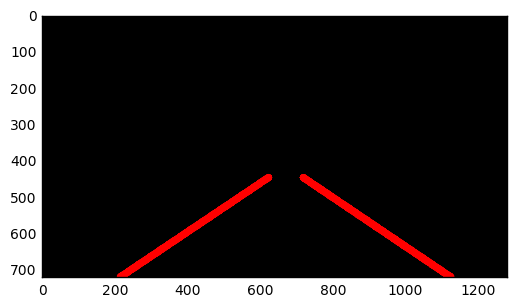

 54%|█████▍    | 135/251 [01:49<01:33,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


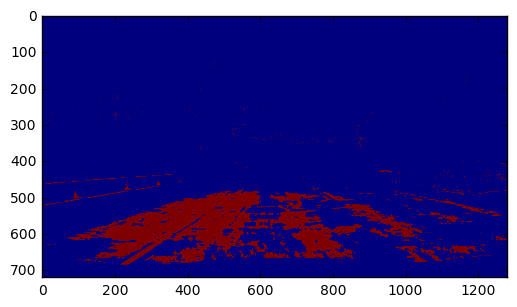

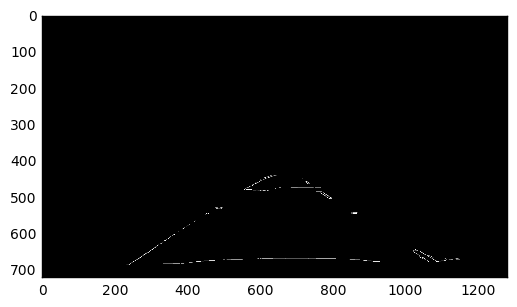

[-0.6491712707182313, 839.2044198895026]
[0.6000000000000001, 23.59999999999989]
[0.5999999999999996, 22.000000000000416]
[0.6935483870967725, -42.82258064516003]
[-0.6473684210526321, 836.8368421052634]
[-0.6474358974358982, 842.5256410256417]
[-0.6691729323308271, 858.5563909774431]
[0.650887573964497, -14.242603550295991]
[-0.6481994459833801, 840.2714681440445]
[-0.6258741258741264, 830.1643356643358]
[0.7765957446808495, -114.882978723403]
[0.8421052631579069, -208.94736842106553]
[-0.66887417218543, 846.5894039735099]
[-0.6744186046511619, 856.2325581395344]
[0.6994535519125675, -63.82513661202103]
[0.6245954692556632, 5.310679611651058]
middle 675
left [734, 725, 725, 724, 757, 1020, 869, 768] right [598, 423, 614, 621, 599, 617, 418, 589]
(8, 2)
-49.2262485425 0.685898248759
SLOPE
843.79763249 -0.653814358779
ave 722 446
SLOPE
ave 608 446
x2 1121 189


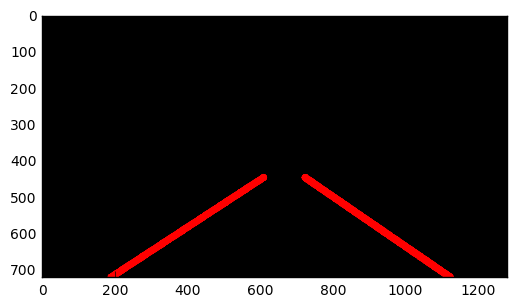

 54%|█████▍    | 136/251 [01:50<01:31,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


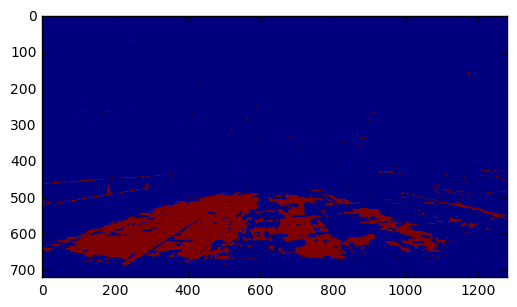

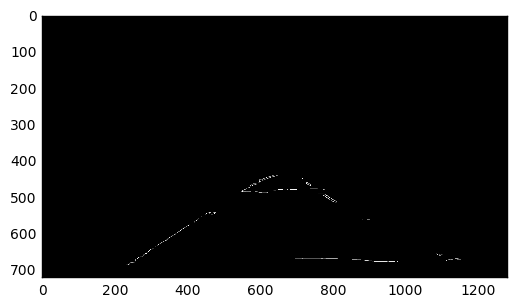

[-0.6491712707182313, 839.2044198895026]
[-0.6470588235294116, 836.7647058823526]
[-0.5522388059701497, 786.8358208955225]
[0.6666666666666647, -20.33333333333178]
[0.6196319018404907, 12.147239263803884]
[-0.7142857142857175, 859.0000000000009]
[-0.5660377358490575, 796.2075471698118]
[0.5773809523809521, 44.089285714285936]
[0.72463768115942, -66.81159420289829]
[-0.6711409395973154, 846.4429530201342]
middle 615
left [746, 726, 729, 727] right [598, 437, 322, 397]
(4, 2)
-7.72710063954 0.647079300512
SLOPE
845.353019698 -0.670414187033
ave 701 446
SLOPE
ave 595 446
x2 1124 186


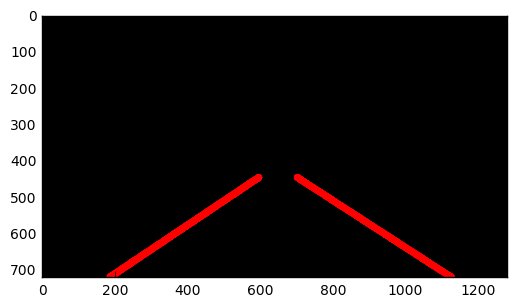

 55%|█████▍    | 137/251 [01:50<01:29,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


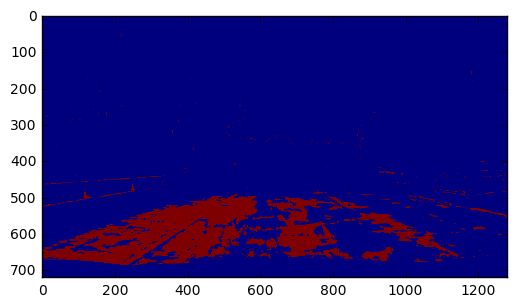

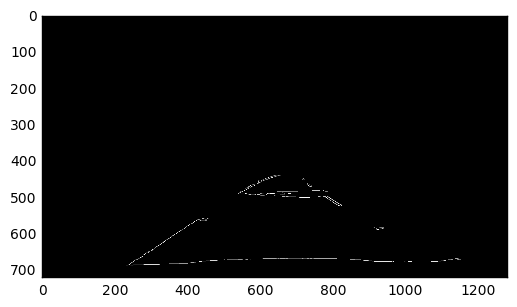

[-0.6732026143790861, 848.398692810458]
[-0.668711656441718, 845.8220858895709]
[0.5994318181818177, 29.613636363636513]
[0.6239067055393582, 8.795918367347317]
[0.6498316498316493, -22.868686868686567]
[-0.6999999999999948, 851.8999999999986]
[0.6249999999999996, 280.87500000000006]
[-0.6498316498316495, 864.7037037037035]
[0.648725212464589, -16.48725212464581]
[-0.7222222222222258, 858.3333333333338]
[-0.8383458646616537, 1054.7706766917292]
[-0.8099999999999998, 957.7799999999993]
[-0.6490765171503967, 863.1978891820585]
middle 584
left [728, 728, 780, 716] right [418, 402, 257, 572, 258]
(4, 2)
-0.236596065587 0.630473846504
SLOPE
853.831563147 -0.682793628575
ave 707 446
SLOPE
ave 597 446
x2 1142 196


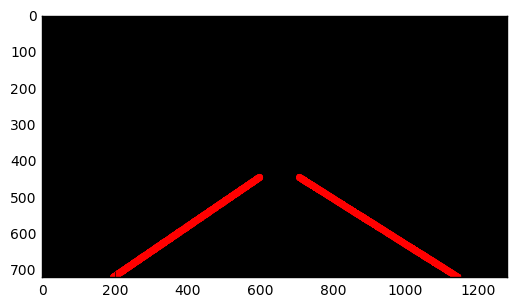

 55%|█████▍    | 138/251 [01:51<01:30,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


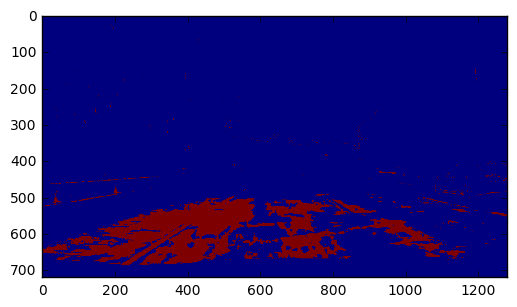

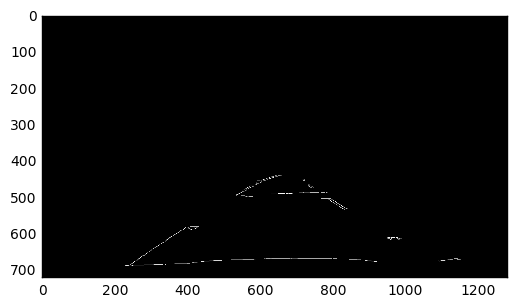

[-0.6709677419354844, 847.361290322581]
[0.6467661691542289, -1.9552238805971307]
[0.6008064516129034, 29.411290322580843]
[-0.5844155844155858, 806.9090909090919]
[-0.5779816513761475, 826.2935779816522]
[-0.6746987951807254, 847.1686746987959]
[0.5991902834008107, 26.194331983804577]
[-0.5744680851063774, 797.3829787234008]
[-0.8707224334600763, 974.8212927756658]
[-0.6720000000000014, 846.9360000000004]
[0.7802690582959639, 79.89686098654691]
[0.5765765765765751, 49.95495495495645]
[-0.7532894736842111, 992.6151315789474]
[0.621359223300971, 17.873786407766843]
[-0.692307692307692, 856.8461538461539]
[0.6008064516129037, 28.810483870967285]
middle 612
left [756, 730, 734, 758, 755, 731] right [394, 609, 568, 353, 596, 597, 363, 397]
(6, 2)
25.0482706099 0.60758419261
SLOPE
850.464882407 -0.664695247973
ave 692 446
SLOPE
ave 608 446
x2 1143 196


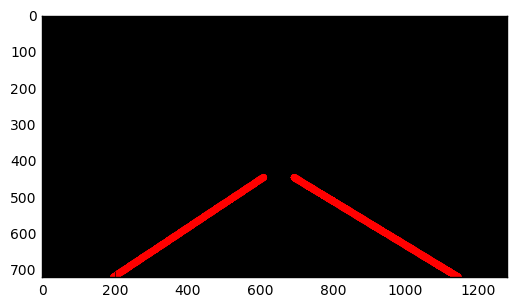

 55%|█████▌    | 139/251 [01:52<01:29,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


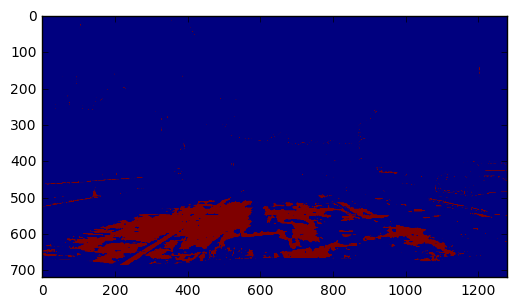

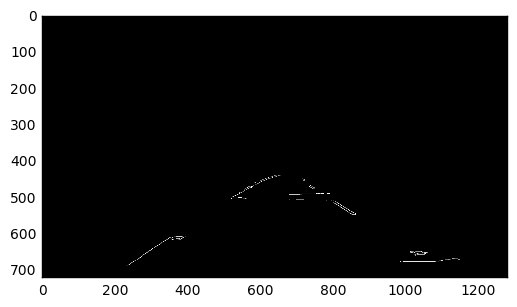

[-0.7000000000000026, 854.3000000000006]
[0.5783475783475784, 46.75783475783447]
[0.6233333333333325, 16.266666666667653]
[-0.7000000000000021, 852.2000000000005]
[-0.5560538116591921, 807.8295964125556]
[-0.6730038022813685, 869.7034220532314]
[0.5781250000000007, 46.234374999999766]
[0.6237113402061852, 16.55670103092857]
[-0.6721311475409842, 866.0491803278693]
[0.5529801324503303, 91.19536423841134]
[-0.7222222222222227, 859.5555555555555]
middle 603
left [737, 760, 733, 820, 723] right [329, 276, 550, 304]
(5, 2)
43.4021883388 0.591299476867
SLOPE
843.471287992 -0.66956900847
ave 680 446
SLOPE
ave 593 446
x2 1144 184


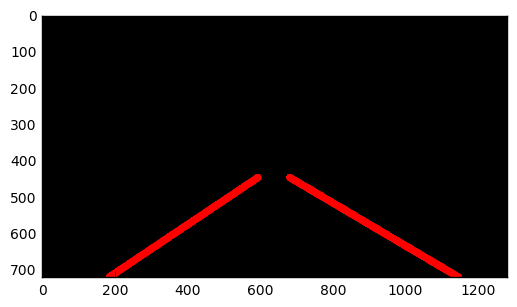

 56%|█████▌    | 140/251 [01:53<01:27,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


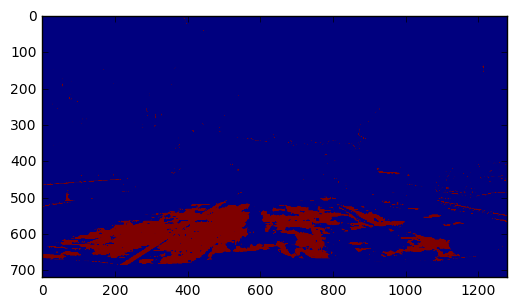

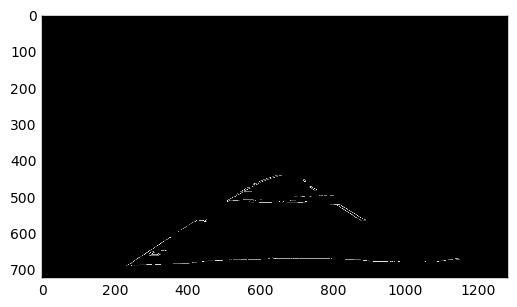

[-0.6699029126213581, 844.4271844660191]
[-0.6978851963746218, 873.3353474320242]
[-0.6272727272727264, 829.3454545454541]
[-0.7553191489361722, 873.8085106382985]
[-0.725000000000001, 891.1750000000006]
[0.7527272727272725, -83.0072727272725]
[0.6764705882352937, -34.3529411764703]
[-0.675516224188791, 856.5545722713867]
[0.7234042553191458, -73.04255319148643]
[0.5524475524475525, 77.59440559440586]
[-0.6988636363636344, 860.318181818181]
[0.750841750841752, -84.10437710437868]
[-0.8683127572016457, 964.5967078189294]
[0.7812500000000012, -107.93750000000135]
[0.8717948717948735, -186.48717948718087]
[-0.5994152046783628, 921.166666666667]
[0.8333333333333329, -156.66666666666623]
[-0.7142857142857056, 859.4285714285686]
[0.8157894736842156, -136.10526315789886]
[-0.8648648648648664, 951.8648648648657]
middle 625
left [736, 716, 788, 656, 718, 718, 784, 812, 716] right [338, 598, 592, 340, 603, 590, 424, 565, 331, 519]
(9, 2)
-87.1232608797 0.750895455376
SLOPE
880.485439528 -0.72972

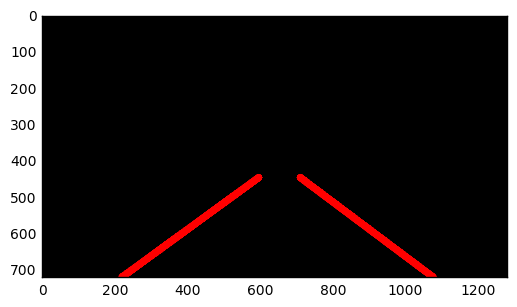

 56%|█████▌    | 141/251 [01:54<01:27,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


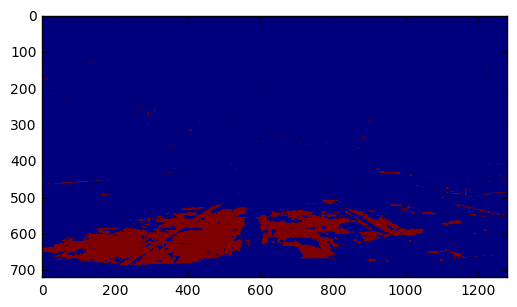

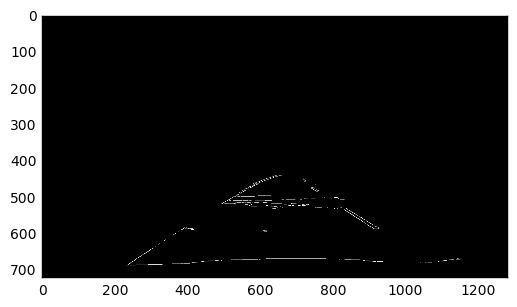

[-0.6477272727272732, 839.2159090909091]
[-0.6230366492146601, 832.7905759162306]
[0.601769911504425, 29.292035398229817]
[-0.5782493368700262, 817.4403183023871]
[0.7021943573667708, -49.877742946708246]
[0.6476190476190479, -3.5904761904761515]
[0.553398058252428, 52.76699029126128]
[-0.5771428571428571, 815.4114285714286]
[0.6929824561403515, -41.19298245614102]
[0.6724137931034451, -35.931034482755315]
[-0.5972222222222215, 1133.6388888888882]
[0.5833333333333341, 157.66666666666617]
[0.673076923076923, 99.21153846153868]
middle 692
left [739, 719, 739, 716, 742, 800] right [587, 616, 651, 647]
(6, 2)
-8.08886839776 0.645062937331
SLOPE
826.21455797 -0.606539028989
ave 703 446
SLOPE
ave 626 446
x2 1128 175


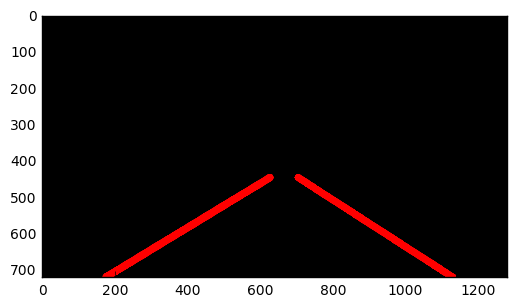

 57%|█████▋    | 142/251 [01:54<01:26,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


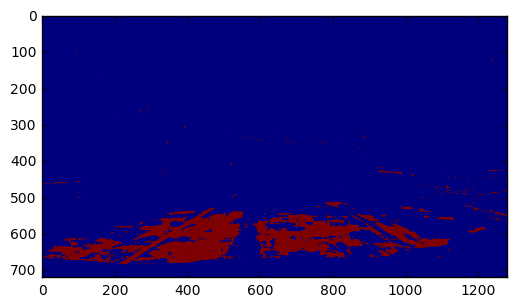

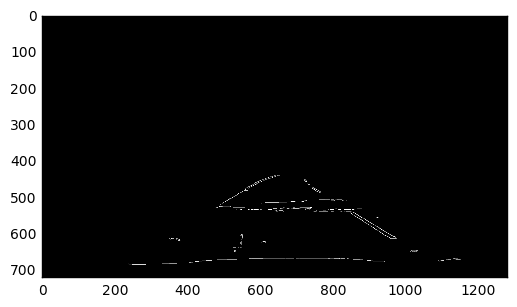

[0.6478873239436622, -5.380281690141245]
[0.6006944444444441, 27.68402777777833]
[-0.6198347107438013, 825.9008264462806]
[0.6008230452674904, 26.600823045267184]
[0.6482412060301517, -4.994974874372684]
[-0.6483050847457623, 838.2584745762712]
[-0.8092783505154635, 1185.128865979381]
[-0.6249999999999999, 830.6249999999999]
[0.8409090909090904, -62.95454545454477]
[-0.7519999999999992, 894.0559999999996]
[-0.6981707317073166, 956.7774390243895]
[0.7808988764044942, -142.0505617977523]
[0.6702127659574458, 236.38297872340513]
[0.6000000000000002, 119.1999999999999]
[0.5801104972375688, 47.132596685082845]
[0.5714285714285711, 139.42857142857173]
[-0.778846153846154, 940.0192307692304]
[0.781725888324872, 21.730964467006174]
[0.5701754385964908, 139.149122807018]
[-0.752293577981651, 988.1926605504581]
middle 659
left [743, 743, 728, 742, 835, 791] right [600, 585, 609, 528, 642, 629]
(6, 2)
-8.50139514236 0.643109232221
SLOPE
886.17536539 -0.696046587886
ave 706 446
SLOPE
ave 632 446
x

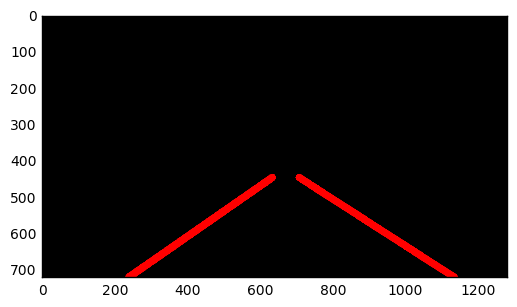

 57%|█████▋    | 143/251 [01:55<01:25,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


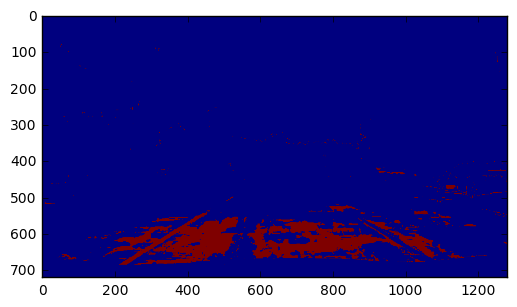

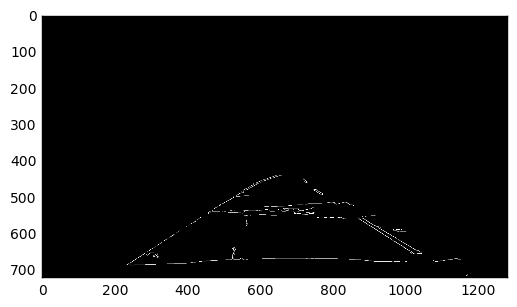

[0.6000000000000003, 28.999999999999996]
[-0.6474358974358971, 837.4999999999995]
[0.6235741444866922, 18.258555133079536]
[-0.6492753623188408, 930.023188405797]
[-0.5549295774647892, 905.74647887324]
[0.6006825938566546, 29.68941979522235]
[0.6234177215189877, 15.306962025316174]
[-0.5565217391304367, 792.3739130434793]
[-0.600775193798449, 1008.6356589147279]
[-0.5531135531135526, 833.1282051282052]
[0.6016949152542371, 36.25423728813598]
[0.5763688760806915, 153.23342939481262]
[-0.6009852216748768, 842.896551724138]
[-0.5750915750915758, 943.1428571428578]
[0.5541237113402065, 140.05412371133954]
[0.674486803519062, -34.93255131964855]
[0.6250000000000002, 1.8749999999997538]
[0.725085910652921, 37.54982817869398]
[-0.698924731182796, 1000.3978494623661]
[0.6733524355300863, 8.014326647564175]
[-0.6757679180887369, 854.972696245734]
[0.7777777777777696, 6.777777777783396]
[0.7252747252747248, 153.05494505494556]
[-0.7534883720930229, 889.4418604651161]
[-0.8429752066115705, 983.71

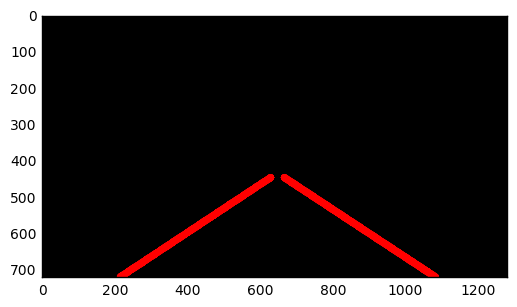

 57%|█████▋    | 144/251 [01:56<01:26,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


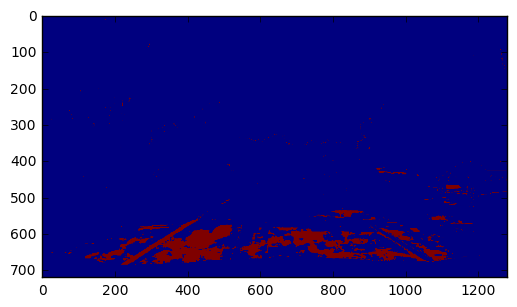

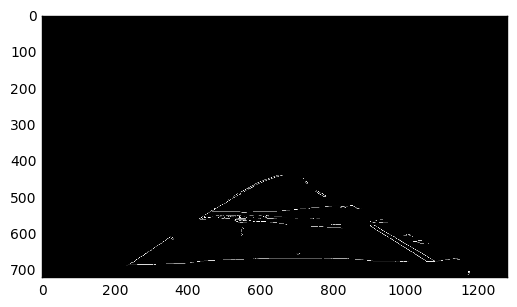

[0.6018518518518512, 27.601851851852594]
[0.625, 15.749999999999968]
[-0.5990220048899754, 825.9731051344737]
[-0.6265060240963858, 830.0120481927713]
[-0.6233766233766237, 838.1038961038962]
[-0.7797833935018059, 1027.4620938628166]
[0.6019108280254784, 28.742038216559674]
[0.6258278145695363, 14.37748344370865]
[0.553333333333333, 56.38666666666703]
[-0.6030769230769225, 824.8923076923073]
[0.6485507246376807, 141.07971014492767]
[-0.8687782805429883, 955.1900452488696]
[-0.6223958333333334, 835.9973958333331]
[-0.5555555555555548, 1014.5555555555551]
[-0.701923076923078, 904.0000000000005]
[0.6989247311827954, 107.06451612903237]
[-0.6000000000000008, 879.2000000000006]
[-0.5763546798029558, 821.1231527093598]
[0.6472727272727271, 144.709090909091]
[0.8991935483870969, -117.49193548387129]
[0.6007604562737643, 201.20912547528502]
[0.577287066246057, 31.84227129337541]
[-0.5555555555555549, 797.3333333333328]
[0.6484149855907786, 52.22478386167114]
[-0.6239316239316262, 1231.79487179

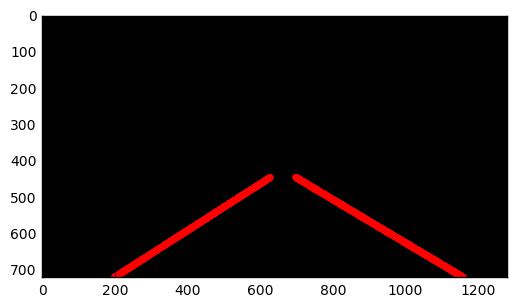

 58%|█████▊    | 145/251 [01:57<01:26,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


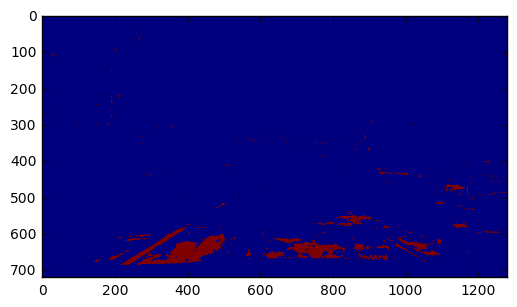

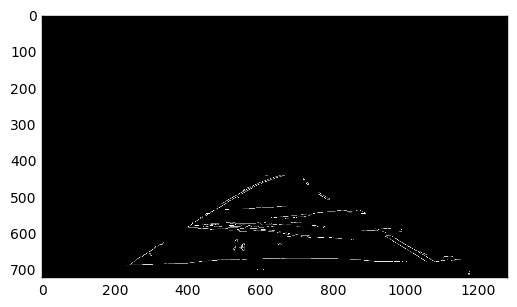

[0.7317073170731719, -73.6341463414643]
[0.6504559270516714, -8.881458966565178]
[0.6481481481481486, -18.759259259259363]
[-0.8999999999999975, 1135.4999999999982]
[0.5993589743589747, 37.285256410255776]
[0.8691588785046723, -253.73831775700876]
[-0.8654970760233928, 1110.8070175438602]
[0.7708333333333319, -123.24999999999865]
[0.6239316239316239, 6.649572649572873]
[-0.6217616580310878, 952.683937823834]
[0.6845637583892616, 305.99999999999983]
[0.8396946564885489, -197.21374045801457]
[0.5762195121951208, 50.6493902439034]
[0.780269058295963, 79.11659192825182]
[-0.8116591928251135, 1110.1076233183867]
[-0.7857142857142779, 882.3571428571404]
[0.754285714285715, -129.8400000000009]
[0.6730769230769237, -37.480769230769724]
[0.6947368421052633, 274.7894736842104]
[0.698412698412698, 275.36507936507985]
[0.648648648648649, -8.270270270270649]
[0.6243654822335032, -25.629441624366198]
[0.6480446927374303, -51.80446927374325]
[-0.5771971496437052, 820.3325415676959]
[0.576923076923077

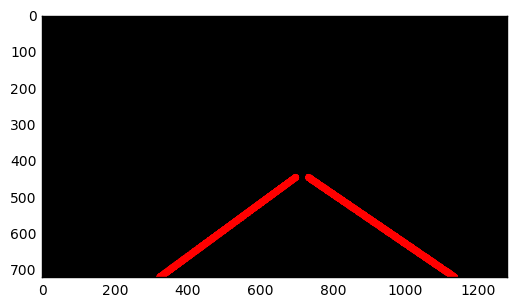

 58%|█████▊    | 146/251 [01:58<01:25,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


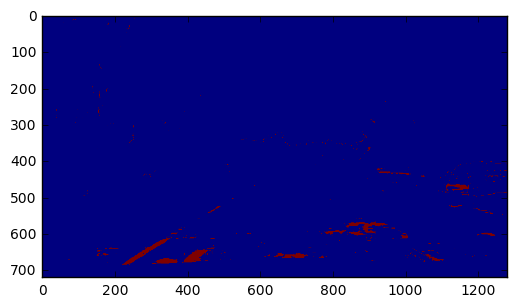

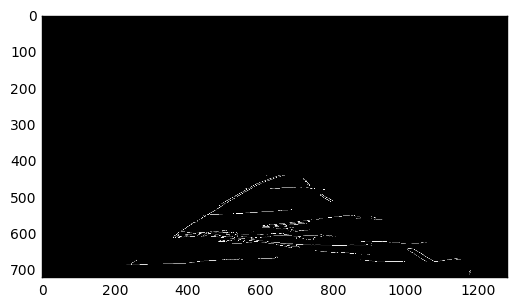

[-0.6468842729970324, 842.5459940652821]
[0.7252252252252243, -65.23873873873798]
[0.5788113695090441, 34.41343669250639]
[-0.6235955056179774, 914.6011235955053]
[-0.839357429718875, 1080.0883534136542]
[0.6238532110091748, 112.28440366972418]
[-0.6497005988023946, 842.5778443113769]
[0.7261904761904757, 49.261904761905505]
[-0.6249999999999998, 952.8749999999998]
[-0.7534883720930226, 1106.26976744186]
[0.5540166204986156, 67.79778393351752]
[-0.7272727272727273, 882.0909090909095]
[0.7304347826086945, 305.0521739130442]
[-0.5566502463054188, 798.2463054187193]
[0.6745762711864413, -43.79661016949222]
[-0.839572192513371, 1177.7807486631034]
[-0.5729729729729733, 981.6972972972973]
[0.7799999999999996, 198.66]
[0.553459119496856, 361.7232704402512]
[0.7499999999999966, 270.00000000000125]
[0.6503067484662574, -9.423312883435601]
[-0.6979865771812084, 859.1006711409395]
[0.8350515463917516, 103.42268041237196]
[-0.834782608695651, 1319.826086956521]
[-0.5697674418604648, 1214.29069767

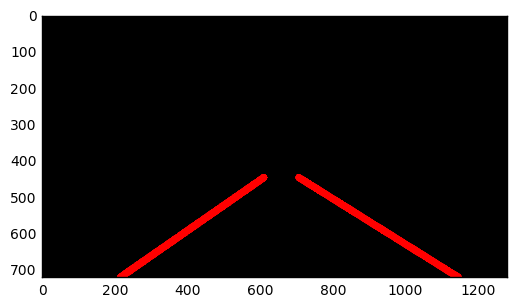

 59%|█████▊    | 147/251 [01:58<01:24,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


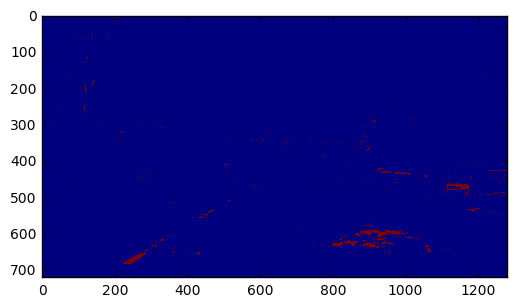

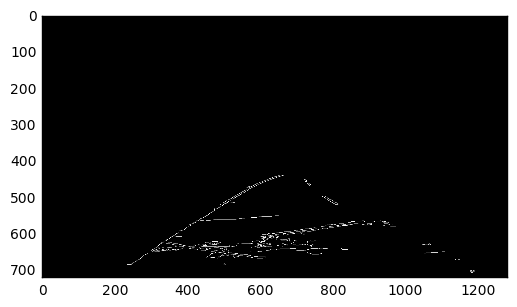

[-0.6232686980609423, 831.4681440443217]
[0.8104575163398698, -132.71895424836674]
[-0.6225680933852142, 829.2023346303503]
[0.74829931972789, -81.51020408163181]
[0.7218543046357627, -64.9006622516568]
[-0.7247706422018347, 1084.9174311926606]
[-0.6020066889632114, 910.2809364548497]
[-0.6981981981981984, 1071.2567567567564]
[-0.7813765182186226, 935.4534412955456]
[0.5526315789473686, 250.76315789473685]
[-0.574626865671644, 1053.2611940298525]
[0.7543859649122799, 265.9298245614041]
[0.5528455284552839, 48.32520325203344]
[0.5523255813953485, 59.35465116279091]
[0.6023391812865492, 246.09356725146236]
[0.7249999999999991, 217.62500000000023]
[0.8357142857142866, -148.2214285714292]
[0.556277056277056, 51.03679653679674]
[-0.8974358974358959, 1000.7435897435887]
[-0.6243243243243238, 837.2081081081078]
[-0.6238532110091738, 834.0550458715591]
[-0.8984771573604057, 1003.5786802030452]
middle 663
left [719, 729, 723, 940, 729, 723, 719] right [596, 585, 620, 607, 617, 606, 605]
(7, 2)


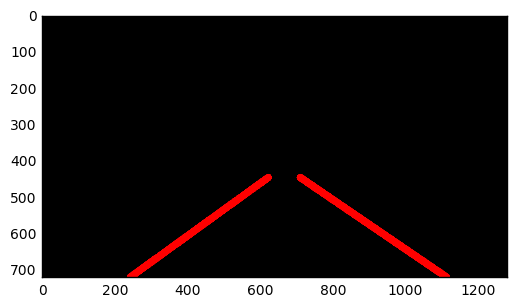

 59%|█████▉    | 148/251 [01:59<01:22,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


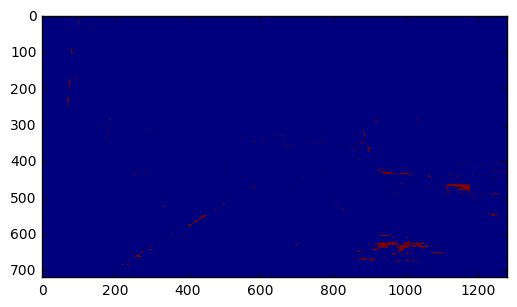

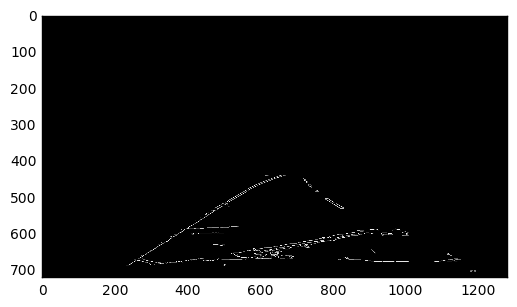

[-0.6236263736263744, 834.1758241758247]
[-0.5975609756097555, 815.9756097560971]
[0.6741214057507989, -25.782747603833865]
[-0.6229050279329608, 839.6927374301675]
[-0.8106312292358805, 943.4019933554819]
[0.6726726726726732, -30.32432432432483]
[-0.6475095785440623, 837.8697318007667]
[-0.7000000000000006, 883.0000000000005]
[0.700296735905044, -17.694362017803606]
[0.650429799426934, -17.309455587392456]
[-0.6257668711656443, 833.20245398773]
[-0.7015873015873006, 882.0571428571425]
[0.6735294117647058, 24.676470588235656]
[0.5537634408602146, 312.1290322580648]
[0.6761904761904758, -29.971428571428252]
[0.6763754045307447, -26.78317152103594]
[-0.7801724137931038, 910.3706896551723]
[-0.839999999999999, 1401.119999999999]
[-0.5714285714285733, 979.0000000000009]
[0.8090452261306528, -135.28140703517553]
[-0.5549450549450561, 858.252747252748]
[0.8087431693989059, 115.86338797814267]
[0.6016597510373445, 22.796680497925387]
[0.809187279151943, -62.59717314487566]
middle 638
left [73

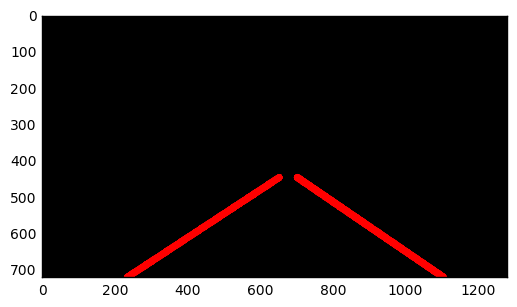

 59%|█████▉    | 149/251 [02:00<01:23,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


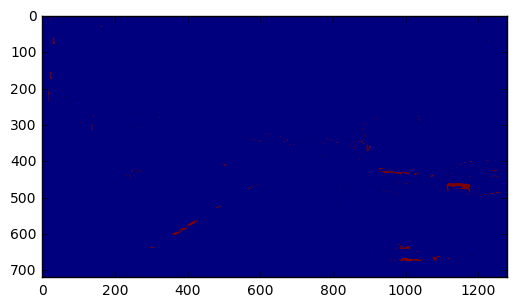

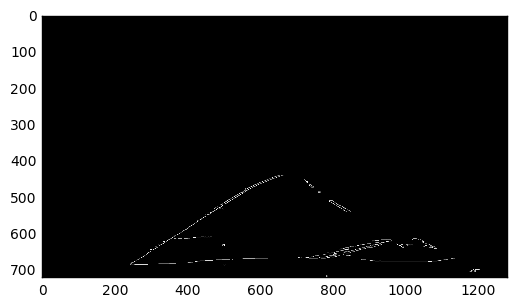

[-0.6236263736263731, 834.5412087912083]
[-0.6235632183908045, 831.1494252873562]
[0.8104089219330853, -130.3568773234196]
[-0.6236559139784945, 836.5483870967739]
[0.7263843648208466, -70.72312703583023]
[0.6481481481481489, -9.092592592593634]
[-0.6223776223776225, 826.8881118881118]
[-0.5776699029126214, 812.5533980582522]
[-0.623376623376623, 839.974025974026]
[0.8956043956043954, -205.27472527472528]
[-0.6241134751773044, 829.3617021276591]
[0.5533980582524277, 108.76699029126172]
[-0.5775401069518715, 807.2994652406413]
[0.8095238095238102, -47.47619047619117]
[0.8682170542635675, -173.98449612403275]
[0.7545126353790625, -86.81227436823232]
[0.7538461538461521, -94.90769230769045]
[-0.5773195876288664, 811.4432989690723]
[0.7235494880546068, 24.699658703072185]
[-0.6976744186046517, 889.8139534883727]
[0.841176470588236, -170.22352941176524]
[0.7517730496453903, 11.191489361701946]
[-0.5550847457627115, 804.4703389830505]
[0.8095238095238096, -139.99999999999974]
middle 678
left

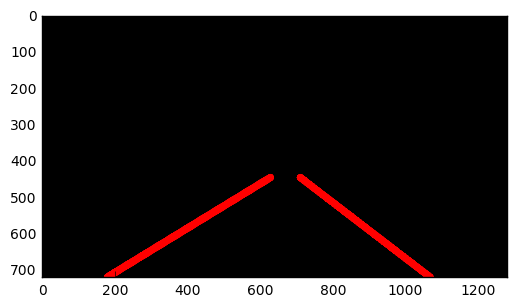

 60%|█████▉    | 150/251 [02:01<01:22,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


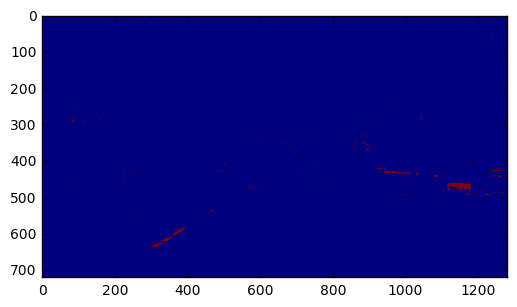

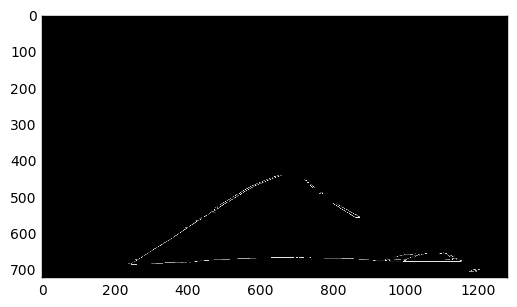

[-0.6488095238095238, 843.309523809524]
[-0.6477987421383643, 839.767295597484]
[0.6717557251908401, -22.206106870229412]
[-0.64797507788162, 841.9376947040497]
[0.7289377289377291, -68.49816849816817]
[0.7259786476868333, -70.43060498220713]
[-0.8390243902439025, 933.868292682927]
[-0.5777777777777776, 817.0888888888894]
[-0.867924528301886, 988.9811320754712]
[0.8088235294117638, -133.20588235294]
[0.6736842105263158, -26.526315789473646]
[-0.8416666666666658, 914.6166666666663]
middle 645
left [761, 736, 721, 726, 740] right [580, 560, 574, 504, 644, 621, 394]
(5, 2)
-64.1734156986 0.721835968351
SLOPE
882.795642061 -0.724425243831
ave 706 446
SLOPE
ave 602 446
x2 1086 224


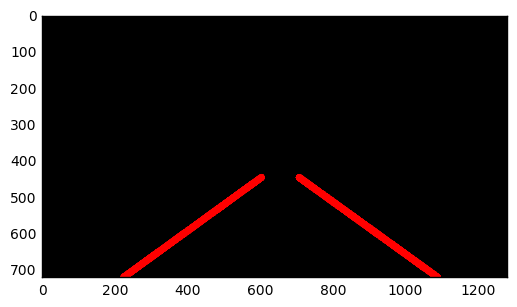

 60%|██████    | 151/251 [02:02<01:20,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


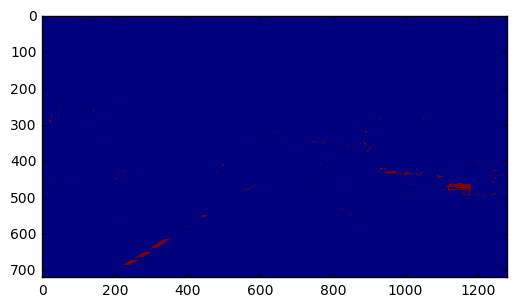

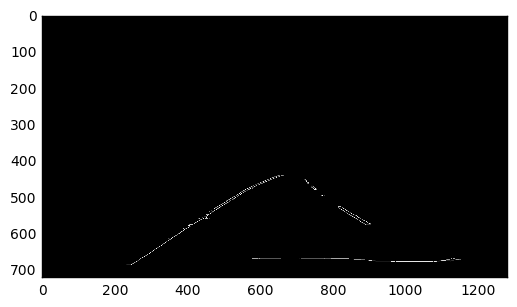

[-0.6497005988023947, 844.5269461077838]
[-0.646666666666666, 846.1199999999997]
[0.6006600660066004, 32.491749174917764]
[0.8079710144927527, -129.3550724637671]
[0.5770171149144251, 61.89975550122256]
[-0.6482084690553754, 839.6254071661241]
[0.6006600660066014, 34.293729372936575]
[-0.6479289940828404, 845.0384615384618]
[0.870445344129555, -172.554655870446]
[-0.6492890995260663, 843.0947867298578]
[0.8687258687258695, -176.08880308880387]
[0.5770171149144244, 60.74572127139478]
[0.5522388059701496, 80.02985074626812]
[-0.724137931034482, 875.1034482758618]
[0.5546218487394956, 63.361344537815114]
[-0.7448979591836717, 892.7142857142844]
[0.8987854251012147, -193.9230769230767]
[-0.676328502415459, 850.9613526570049]
[0.6006600660066008, 33.69306930693053]
middle 641
left [770, 722, 657, 767, 729, 723, 659, 813, 744, 722, 768] right [578, 594, 544, 585, 570, 489, 546, 479]
(11, 2)
-27.7642171304 0.682618430455
SLOPE
854.648086024 -0.673394777596
ave 694 446
SLOPE
ave 606 446
x2 109

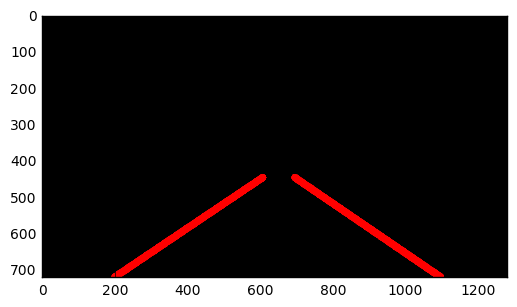

 61%|██████    | 152/251 [02:03<01:20,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


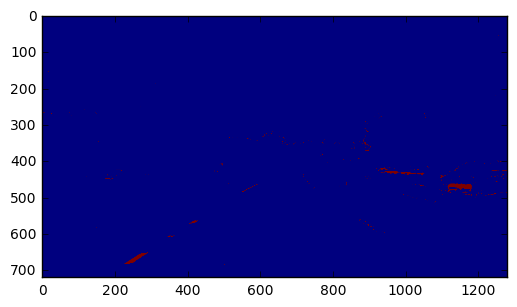

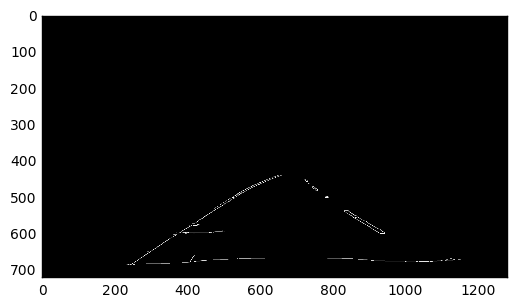

[-0.6232686980609424, 832.0914127423825]
[0.5743801652892554, 56.818181818182836]
[-0.6249999999999998, 835.3749999999997]
[0.700680272108843, -46.60544217687015]
[-0.5999999999999995, 814.7999999999998]
[-0.6014669926650368, 830.3520782396089]
[0.7820069204152256, -113.04498269896264]
[-0.6235955056179776, 830.6741573033711]
[-0.6250000000000019, 826.375000000001]
[0.7533333333333336, -90.66000000000047]
[0.5743801652892562, 57.96694214876062]
[-0.6240409207161124, 844.3785166240407]
[0.8682926829268283, -181.87317073170632]
[-0.5714285714285698, 823.7142857142856]
[-0.5759162303664926, 822.0680628272253]
[-0.6236842105263163, 845.5342105263162]
[0.6000000000000001, 31.599999999999714]
[-0.6721311475409842, 853.032786885246]
[0.840304182509506, -152.53992395437305]
[-0.7254901960784272, 869.9999999999981]
[-0.6719745222929938, 854.3375796178344]
[0.6315789473684218, 13.421052631578478]
[-0.6478873239436614, 849.859154929577]
middle 661
left [836, 743, 720, 723, 834, 783, 779, 723, 829

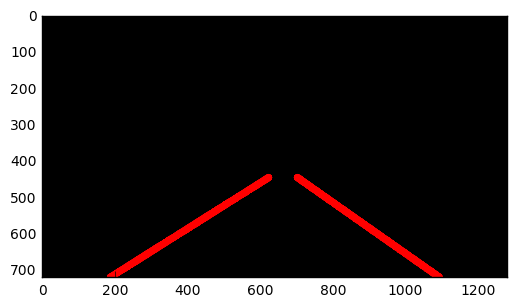

 61%|██████    | 153/251 [02:03<01:18,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


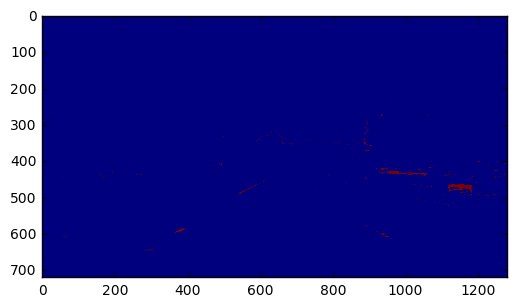

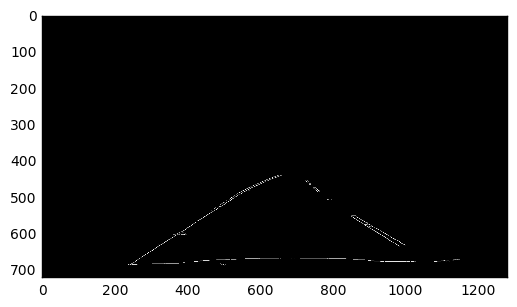

[0.5744680851063823, 58.68085106383048]
[-0.6475903614457829, 842.3644578313252]
[0.5994962216624689, 44.931989924432806]
[0.6009615384615391, 42.18269230769169]
[0.8983739837398371, -200.71138211382092]
[0.8983739837398383, -194.4227642276433]
[-0.8389830508474577, 943.0847457627119]
[-0.8088888888888883, 921.8133333333333]
[0.5755395683453242, 58.33812949640226]
[0.6010101010101012, 45.13636363636344]
[-0.669642857142857, 847.7589285714284]
[-0.6994219653179187, 899.121387283237]
[-0.724358974358975, 878.5320512820518]
[-0.7795275590551186, 910.0629921259847]
[-0.7066666666666657, 856.4266666666663]
[-0.8369565217391297, 934.2499999999993]
middle 633
left [857, 659, 850, 731, 724, 856, 657] right [575, 546, 519, 367, 535, 544, 319, 483]
(7, 2)
-20.8377314161 0.678317640295
SLOPE
891.786646947 -0.751576860018
ave 688 446
SLOPE
ave 593 446
x2 1092 228


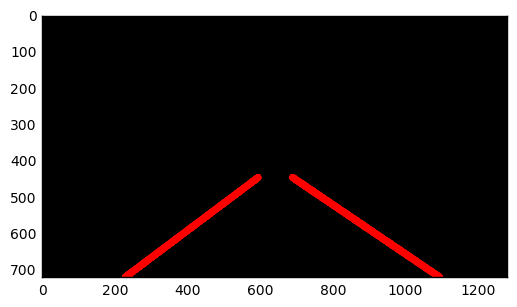

 61%|██████▏   | 154/251 [02:04<01:17,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


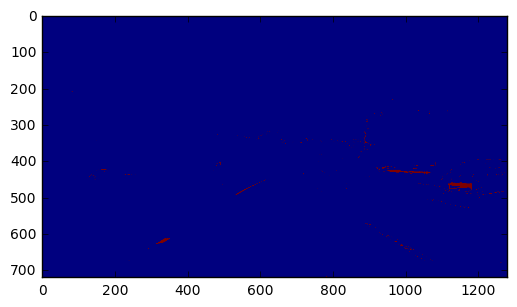

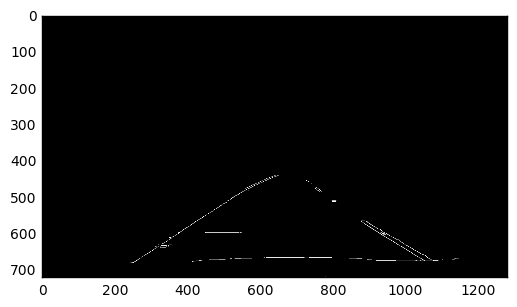

[-0.6712962962962961, 850.8842592592592]
[0.5767195767195766, 54.02645502645523]
[0.6012269938650299, 41.306748466258696]
[-0.6721311475409835, 852.7704918032783]
[-0.7285714285714285, 862.8714285714286]
[0.5729166666666663, 59.114583333333705]
[0.8406374501992031, -154.70916334661368]
[0.8392156862745117, -160.01960784313937]
[-0.7179487179487157, 863.7948717948711]
[-0.6470588235294112, 849.1176470588231]
[0.5788043478260873, 64.93478260869534]
[0.8982300884955745, -203.46902654867208]
[0.8705882352941167, -178.17647058823442]
[-0.6938775510204083, 855.5102040816328]
[0.6000000000000041, 41.399999999996204]
[-0.6971153846153854, 866.9567307692316]
[-0.7755102040816326, 876.4081632653061]
[0.8699186991869919, -181.86991869918728]
[0.5568181818181823, 442.69318181818176]
[0.7000000000000006, 174.59999999999968]
[0.5555555555555542, 80.7777777777792]
[0.8685258964143416, -178.76095617529788]
[-0.7500000000000002, 893.5000000000001]
[-0.6485507246376815, 847.6702898550726]
middle 606
lef

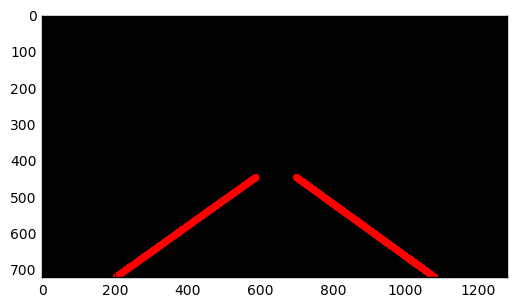

 62%|██████▏   | 155/251 [02:05<01:15,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


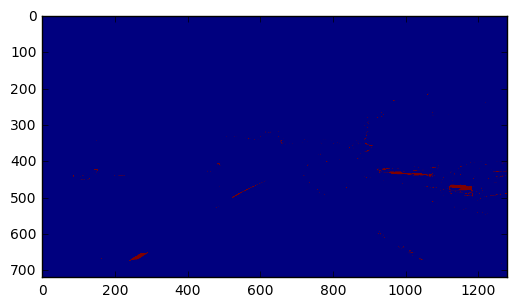

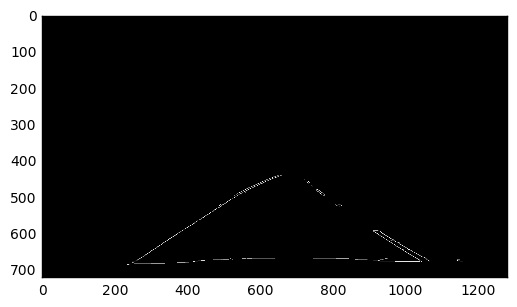

[-0.6472392638036805, 841.9263803680976]
[0.6222222222222256, 27.777777777774155]
[0.598455598455599, 39.64478764478689]
[-0.6480263157894735, 837.9342105263157]
[0.8682170542635665, -173.85271317829532]
[0.8371212121212132, -155.09848484848558]
[0.6007751937984492, 38.174418604651486]
[0.5972222222222247, 45.54166666666423]
[0.8695652173913048, -178.6521739130441]
[-0.5999999999999988, 820.5999999999995]
[0.8384279475982527, -157.23580786026127]
[0.5999999999999996, 32.000000000000334]
[-0.574257425742575, 802.6633663366343]
[-0.6000000000000112, 823.2000000000045]
[-0.6238244514106586, 831.3416927899684]
[-0.666666666666668, 844.3333333333337]
middle 649
left [910, 806, 722, 730, 807, 915, 731, 766, 765] right [570, 540, 606, 588, 382, 560, 290]
(9, 2)
-53.5222810118 0.714667407564
SLOPE
828.856997622 -0.622859160488
ave 698 446
SLOPE
ave 614 446
x2 1082 174


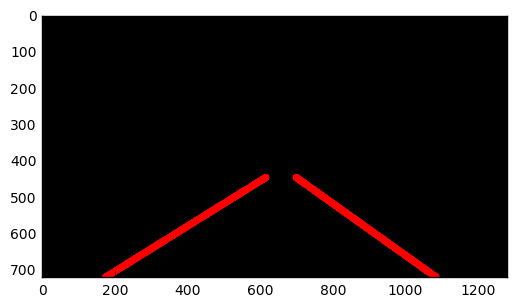

 62%|██████▏   | 156/251 [02:06<01:16,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


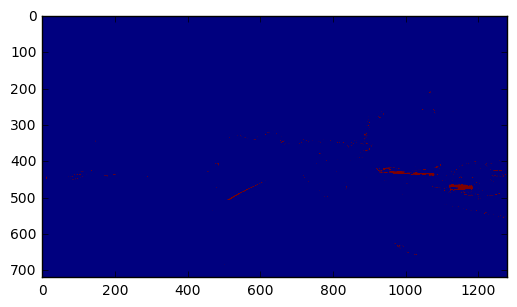

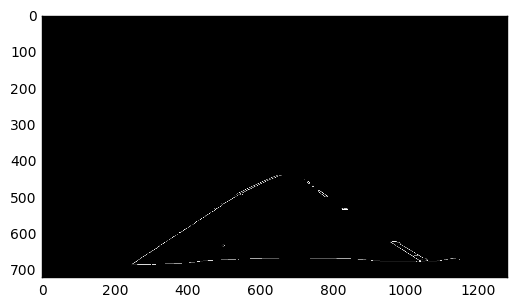

[-0.64741641337386, 843.2644376899698]
[0.5994897959183674, 49.533163265306214]
[-0.6494023904382472, 842.8605577689243]
[0.6480263157894741, -10.187500000000632]
[0.6496815286624196, -10.414012738852417]
[0.7234848484848481, -64.84848484848406]
[0.6237288135593212, 13.600000000000938]
[0.6246334310850447, 5.768328445746816]
[0.6753246753246752, -34.58441558441539]
[-0.6422764227642279, 835.1138211382116]
[0.7, -50.30000000000011]
[0.7260726072607265, -74.7590759075915]
[0.622549019607843, 21.26470588235283]
[0.7279693486590045, -67.98467432950277]
[0.5785340314136128, 34.29842931937137]
[-0.6472303206997085, 846.5131195335275]
[-0.5995085995085994, 832.6781326781324]
middle 663
left [741, 741, 760, 767, 732, 722, 729, 731, 822, 761, 722] right [575, 568, 542, 591, 655]
(11, 2)
-21.6496999783 0.663636783622
SLOPE
840.086013762 -0.637166829357
ave 704 446
SLOPE
ave 618 446
x2 1117 188


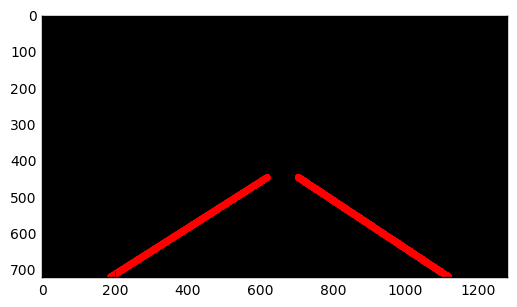

 63%|██████▎   | 157/251 [02:06<01:14,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


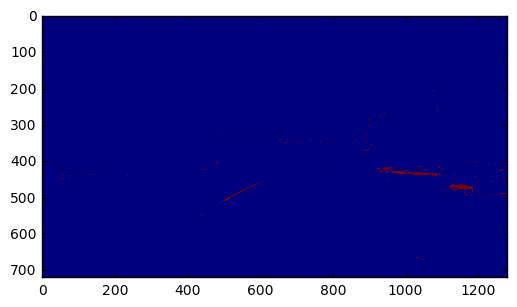

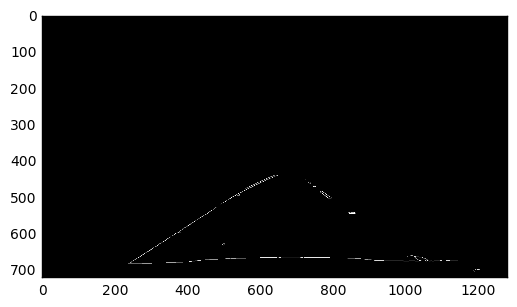

[-0.6235294117647049, 827.0235294117642]
[-0.6239554317548751, 830.3732590529252]
[-0.6015625000000003, 820.1718750000002]
[0.6515151515151515, -16.909090909090985]
[0.7527675276752774, -89.05904059040644]
[-0.625, 826.7499999999998]
[-0.577272727272727, 808.2999999999998]
[-0.6243093922651937, 831.4585635359118]
[-0.6724137931034483, 868.9310344827583]
[-0.6019417475728153, 822.223300970874]
[0.5535714285714279, 53.89285714285767]
[-0.8062015503875966, 926.8914728682167]
[0.7797833935018048, -115.70036101083043]
[-0.6551724137931061, 846.275862068967]
[-0.5555555555555485, 1225.5555555555486]
[-0.5543071161048689, 908.5992509363293]
middle 693
left [732, 744, 730, 737] right [579, 600, 622, 574, 638, 603, 626, 630, 563, 585]
(4, 2)
-41.9439088419 0.684409375316
SLOPE
840.839889739 -0.641135896791
ave 712 446
SLOPE
ave 615 446
x2 1113 188


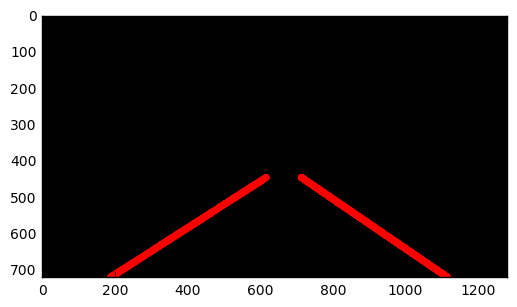

 63%|██████▎   | 158/251 [02:07<01:12,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


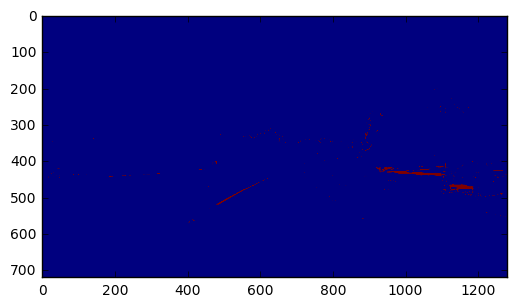

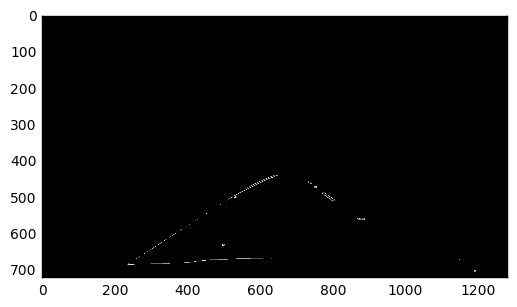

[-0.6474164133738606, 837.790273556231]
[-0.6481481481481478, 837.3148148148147]
[0.6959459459459457, -50.73648648648597]
[0.781250000000002, -112.09375000000159]
[0.7000000000000014, -55.70000000000141]
[0.7295081967213118, -73.67213114754111]
[0.8596491228070182, -175.28070175438648]
[0.65957446808511, -83.8936170212802]
[-0.7269624573378836, 995.3174061433444]
[0.7537313432835816, -92.73134328358167]
middle 688
left [731, 731, 731, 748, 739, 1143, 732] right [565, 451]
(7, 2)
-92.0154328133 0.739951296692
SLOPE
837.552544186 -0.647782280761
ave 727 446
SLOPE
ave 604 446
x2 1097 181


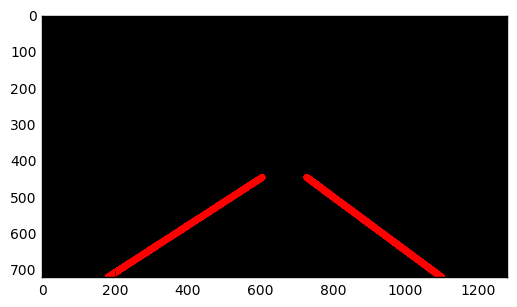

 63%|██████▎   | 159/251 [02:08<01:13,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


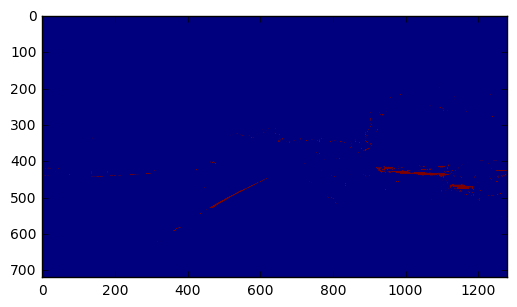

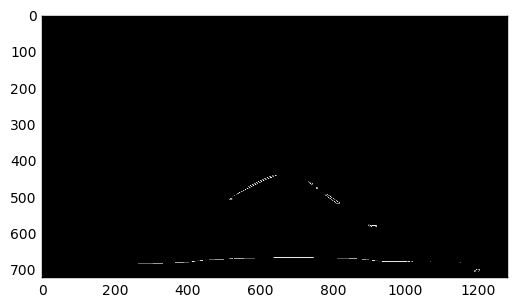

[0.7829181494661929, -115.87900355871929]
[0.5980707395498389, 24.906752411575788]
[0.6204819277108435, 8.777108433734668]
[0.7792207792207778, -114.16883116882978]
[-0.574257425742576, 800.8910891089117]
middle 684
left [733, 781, 753, 733] right [618]
(4, 2)
-49.0909934706 0.695172898987
SLOPE
800.891089109 -0.574257425743
ave 712 446
AVERAGE
ave 555 446
x2 1106 77


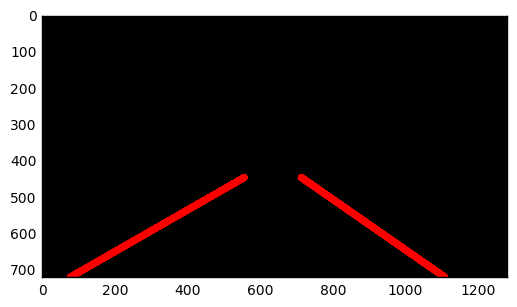

 64%|██████▎   | 160/251 [02:09<01:12,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


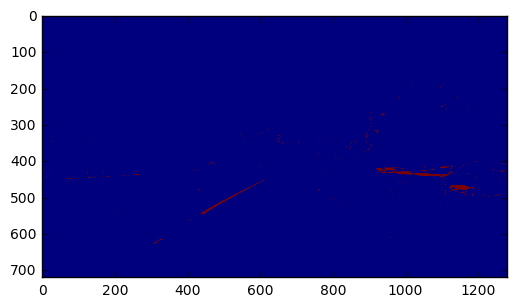

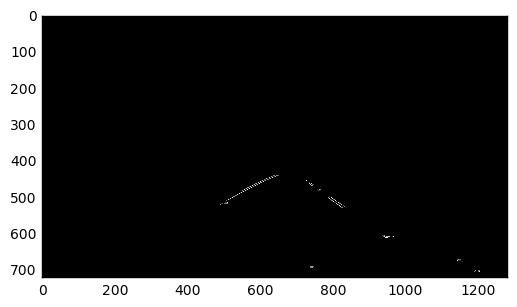

[0.6508620689655171, -16.73275862068938]
[0.601307189542485, 32.33986928104442]
[0.6031746031746026, 23.396825396826006]
[-0.6173913043478256, 830.6347826086954]
[0.6981132075471699, -49.41509433962255]
[-0.5999999999999975, 817.5999999999984]
[-0.5555555555555649, 787.5555555555611]
[0.6022099447513808, 29.265193370166415]
[-0.574074074074076, 805.1851851851865]
[-0.6015625000000019, 823.7968750000013]
[-0.5957446808510617, 816.1702127659559]
middle 687
left [734, 811, 757, 734, 785] right [623, 611, 568, 610, 638, 618]
(5, 2)
3.77080701754 0.631133402796
SLOPE
813.490435186 -0.590721352471
ave 700 446
SLOPE
ave 622 446
x2 1134 158


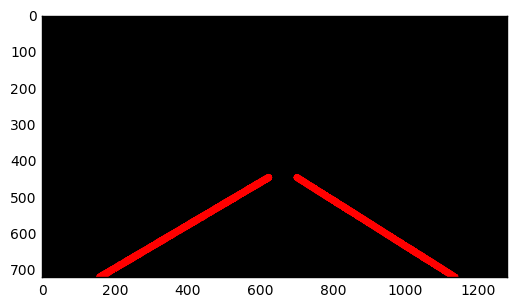

 64%|██████▍   | 161/251 [02:10<01:10,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


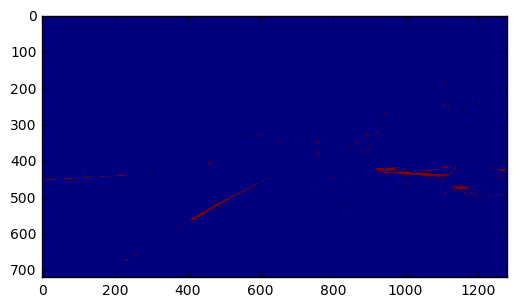

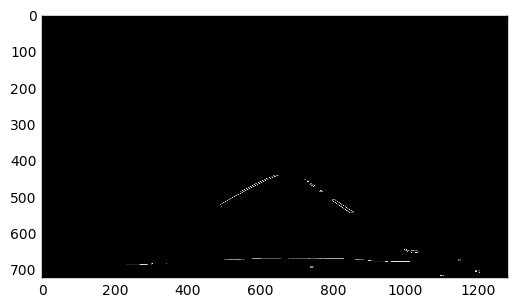

[-0.6720779220779222, 852.0032467532465]
[0.7013422818791939, -57.580536912751406]
[0.6951219512195121, -44.68292682926835]
[-0.5799999999999988, 810.619999999999]
[0.6981627296587924, -53.073490813648405]
[-0.6014492753623176, 821.7101449275353]
[-0.6975806451612905, 862.4879032258063]
[0.6999999999999994, -53.699999999999235]
[0.7258064516129025, -79.93548387096655]
[0.6999999999999998, -50.199999999999534]
[0.6991869918699187, -51.30894308943079]
[0.6978021978021964, -55.57142857142728]
[0.7000000000000061, -55.900000000005434]
[-0.8421052631578927, 937.1052631578939]
middle 669
left [805, 762, 722, 721, 850, 736, 727, 832, 807] right [555, 639, 628, 501, 506]
(9, 2)
-55.7725344542 0.701935844894
SLOPE
856.785311613 -0.678642621152
ave 714 446
SLOPE
ave 605 446
x2 1105 201


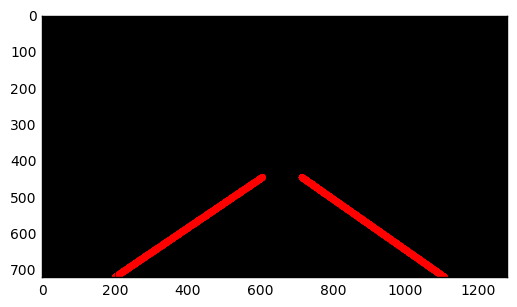

 65%|██████▍   | 162/251 [02:10<01:09,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


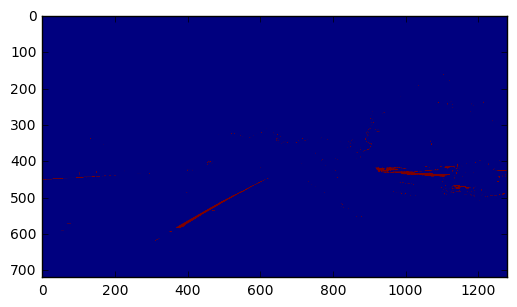

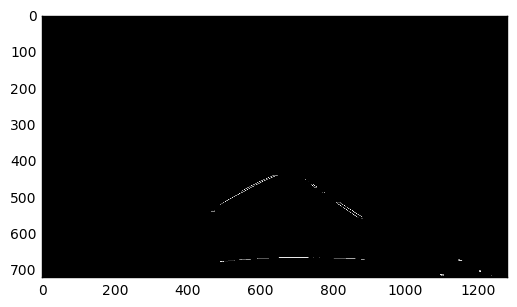

[0.6994382022471907, -50.88483146067382]
[0.6490066225165552, -16.77483443708537]
[-0.5536723163841804, 795.9039548022596]
[0.7000000000000002, -56.10000000000019]
[-0.5599999999999957, 789.7599999999971]
[0.6991869918699191, -52.40650406504088]
[-0.5761589403973502, 806.9139072847677]
[0.6751592356687903, -36.140127388535504]
[0.6993006993006998, -58.027972027971984]
[0.7192982456140358, -67.00000000000063]
[0.8541666666666644, -176.8333333333311]
middle 679
left [739, 730, 733, 730, 723, 818, 741, 776] right [641, 571, 616]
(8, 2)
-64.2709503391 0.711944582985
SLOPE
797.525954029 -0.563277085594
ave 716 446
SLOPE
ave 624 446
x2 1101 137


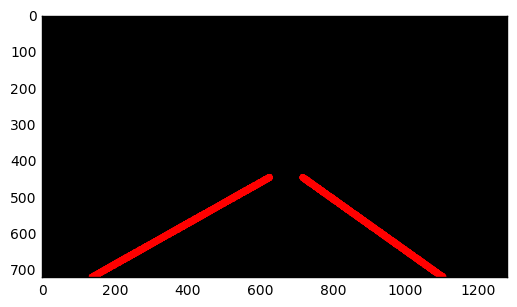

 65%|██████▍   | 163/251 [02:11<01:09,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


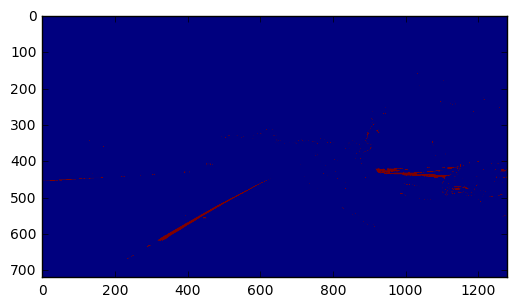

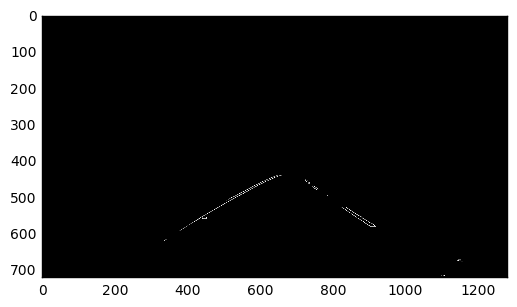

[-0.5568862275449111, 796.9520958083838]
[0.6242774566473978, 7.161849710983713]
[0.7231638418079096, -72.01694915254228]
[-0.5545851528384285, 798.2620087336244]
[0.6960000000000003, -45.52000000000028]
[0.601449275362319, 28.673913043478255]
[-0.5532786885245901, 799.545081967213]
[-0.574712643678162, 809.8160919540235]
[0.7833333333333292, -123.38333333332994]
[-0.5534883720930243, 802.5348837209308]
[0.7619047619047667, -103.0952380952422]
[0.6153846153846136, 11.538461538463139]
[-0.5772727272727282, 810.0954545454549]
middle 702
left [743, 726, 745, 777, 829, 827, 732] right [632, 646, 639, 640, 655, 603]
(7, 2)
-42.3773280412 0.686501897777
SLOPE
802.867602788 -0.561703968659
ave 711 446
AVERAGE
ave 571 446
x2 1110 83


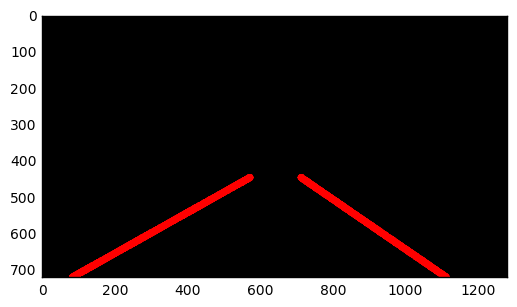

 65%|██████▌   | 164/251 [02:12<01:07,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


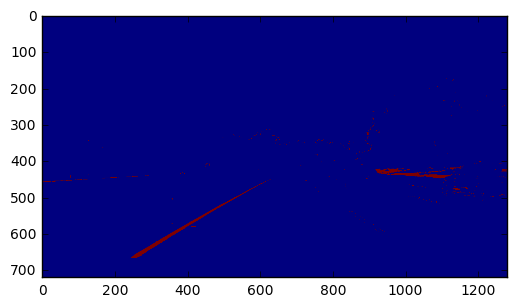

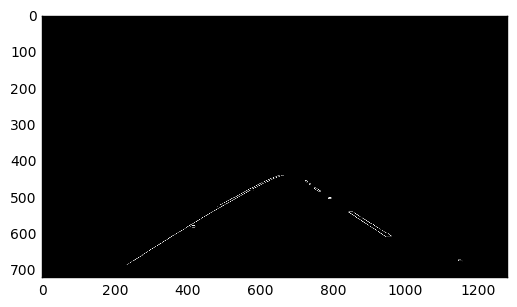

[-0.6217948717948711, 831.4230769230767]
[0.6442307692307697, -1.0865384615387936]
[0.6483050847457628, -12.724576271186141]
[-0.6240310077519391, 829.8565891472873]
[-0.6005089058524172, 825.3180661577607]
[0.5559322033898305, 72.52881355932197]
[-0.6697247706422016, 848.1559633027522]
[-0.6712328767123283, 857.8767123287668]
[0.6315789473684111, 12.157894736851476]
[0.6487804878048772, -8.639024390243158]
[-0.6237623762376229, 837.1188118811875]
[-0.7999999999999998, 905.5999999999998]
[-0.5974576271186436, 832.7372881355927]
[-0.5762273901808789, 817.9715762273904]
[-0.699248120300752, 871.7894736842103]
[-0.7142857142857095, 867.8571428571404]
[0.8196721311475434, -141.90163934426437]
[0.6176470588235298, 24.558823529411278]
[-0.656250000000001, 840.8437500000003]
[-0.684210526315789, 853.0526315789473]
[0.6508620689655167, -13.874999999999448]
[0.6739130434782613, -26.782608695652243]
[-0.578947368421048, 816.8947368421019]
[-0.6666666666666676, 851.0000000000006]
[-0.774193548387

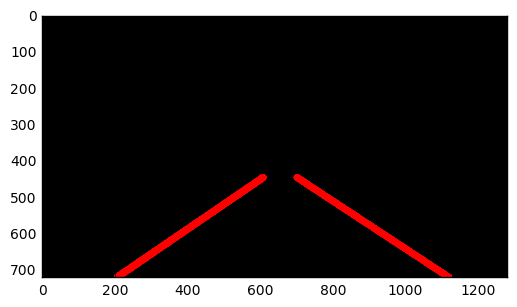

 66%|██████▌   | 165/251 [02:13<01:06,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


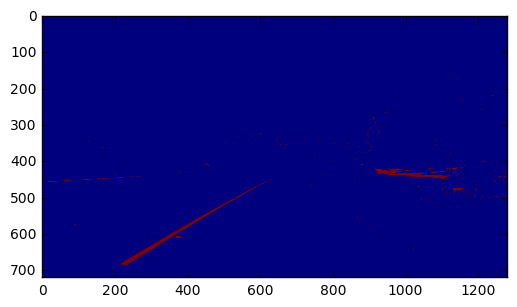

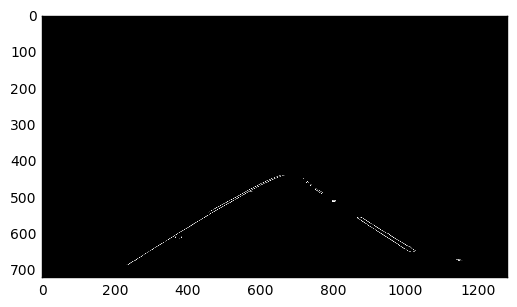

[-0.6222222222222219, 831.5999999999998]
[0.6241610738255035, 7.234899328858942]
[-0.6184210526315788, 831.921052631579]
[0.6453900709219859, -0.9078014184396472]
[-0.647826086956521, 851.0478260869562]
[0.6271777003484319, 2.2961672473870225]
[-0.6428571428571429, 840.7857142857143]
[-0.6477732793522263, 856.4493927125503]
[0.623693379790941, 9.337979094076127]
[-0.598591549295775, 830.0845070422537]
[-0.7235294117647061, 887.6647058823535]
[0.7777777777777771, -107.88888888888837]
[0.749999999999998, -89.49999999999808]
[0.6509433962264154, -7.801886792452872]
[-0.6468085106382981, 851.9659574468089]
[-0.6005025125628135, 827.7185929648235]
[-0.6013986013986024, 832.7132867132875]
[-0.7931034482758674, 927.551724137934]
[-0.6962962962962964, 866.0222222222222]
[-0.6254681647940087, 844.6741573033717]
[-0.7777777777777792, 903.6666666666673]
[0.6249999999999958, 3.5000000000030425]
[0.6245847176079734, 5.800664451827426]
[-0.6229508196721306, 836.9999999999998]
[-0.624548736462094, 84

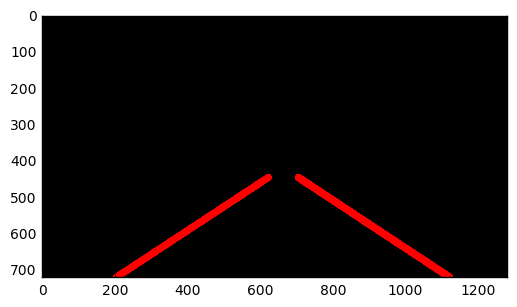

 66%|██████▌   | 166/251 [02:14<01:06,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


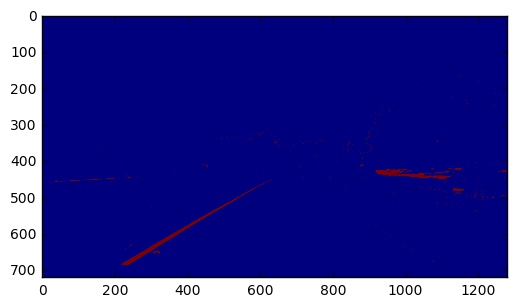

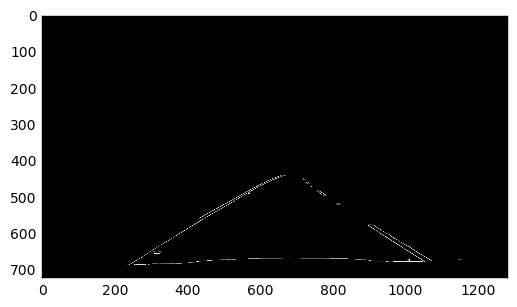

[-0.5774647887323944, 815.4225352112676]
[0.6473029045643156, -2.668049792531777]
[0.6220930232558145, 9.982558139534062]
[-0.5544041450777204, 797.8497409326424]
[-0.5786350148367958, 819.5845697329378]
[-0.554744525547445, 808.1313868613134]
[0.6268221574344021, 6.673469387755472]
[-0.5803571428571426, 815.7857142857138]
[-0.7796610169491528, 883.0338983050846]
[-0.5529411764705878, 795.9764705882351]
[0.6499999999999992, -7.7499999999991385]
[-0.5714285714285823, 816.0000000000041]
[-0.5994832041343662, 829.6692506459945]
[0.64814814814815, -2.092592592594424]
[-0.6997084548104957, 895.7113702623907]
[-0.6982758620689663, 899.4655172413795]
[-0.5652173913043408, 816.3913043478236]
[0.6742857142857144, -6.725714285714945]
[0.6060606060606033, 454.1212121212129]
[0.6224783861671476, 8.080691642650292]
[-0.5754716981132074, 822.2358490566037]
[0.7794117647058816, -115.66176470588165]
[0.7999999999999861, -140.79999999998725]
[-0.6230031948881797, 844.638977635783]
[0.556363636363637, 8

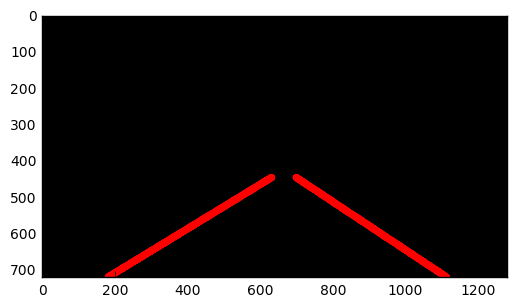

 67%|██████▋   | 167/251 [02:14<01:07,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


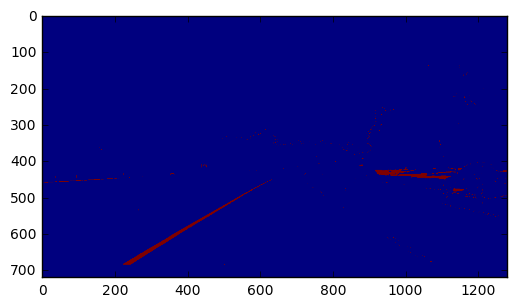

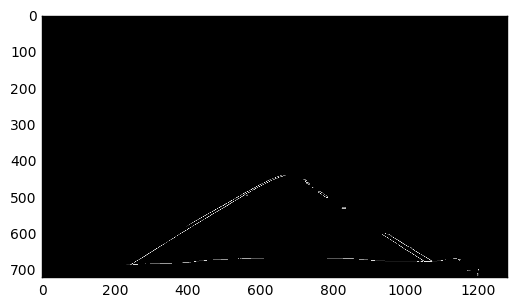

[-0.5994962216624682, 828.6801007556678]
[-0.5555555555555565, 799.2222222222229]
[0.6496350364963506, -5.116788321167674]
[0.6253602305475511, 5.988472622477564]
[-0.5774647887323942, 824.5915492957744]
[-0.5774647887323943, 817.1971830985913]
[0.7009966777408637, -46.42857142857109]
[0.6504297994269351, -17.00859598853961]
[0.6484848484848482, -9.74545454545434]
[-0.7242524916943521, 898.8272425249168]
[-0.5985221674876843, 831.6379310344823]
[-0.555555555555552, 797.5555555555532]
[0.6491228070175441, -14.315789473684186]
[-0.5539568345323738, 809.4892086330932]
[0.6726190476190477, -34.63095238095233]
[-0.5535714285714282, 798.7499999999997]
[0.6977491961414783, -48.659163987137646]
[-0.8669064748201429, 1010.4244604316538]
[0.6666666666666584, -34.66666666665829]
[-0.5555555555555701, 808.6666666666728]
[0.6497461928934013, -9.111675126904181]
[0.6258741258741255, 12.947552447552916]
[-0.8461538461538353, 973.9230769230702]
[0.698924731182795, -56.68817204301017]
[-0.5652173913043

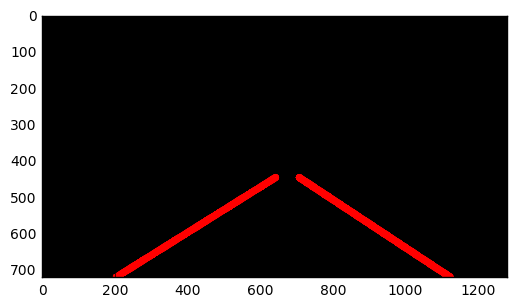

 67%|██████▋   | 168/251 [02:15<01:06,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


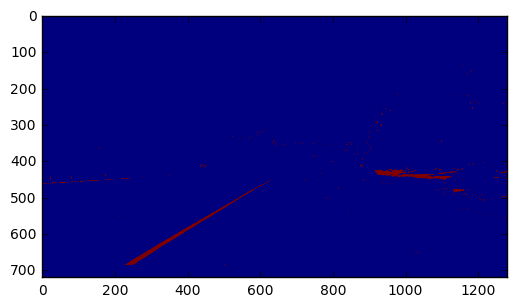

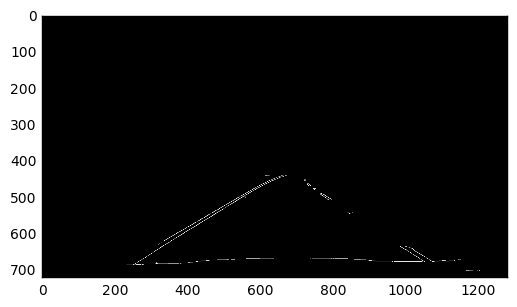

[-0.622950819672131, 841.7377049180326]
[-0.5934959349593499, 819.4146341463418]
[0.6257309941520472, 8.467836257309592]
[-0.6233062330623305, 842.9430894308939]
[0.6492307692307691, -6.938461538461307]
[0.6491228070175444, -4.578947368421828]
[-0.607142857142853, 826.5714285714264]
[0.6482758620689649, -1.5517241379299023]
[-0.6229508196721308, 828.7213114754094]
[0.6484018264840196, -2.347031963471496]
[0.7000000000000005, -48.200000000000564]
[0.5770171149144258, 52.24449877750616]
[-0.6101694915254203, 829.3220338983033]
[-0.7552447552447551, 918.6363636363635]
[0.6495468277945619, -11.818731117824345]
[0.5755813953488368, 49.19186046511647]
[-0.7002881844380398, 903.5907780979824]
middle 663
left [728, 730, 765, 840, 784, 736, 672, 731, 745] right [616, 459, 624, 500, 624, 543, 598, 662]
(9, 2)
3.82992215265 0.63587862189
SLOPE
851.367168022 -0.641943636965
ave 695 446
SLOPE
ave 631 446
x2 1126 204


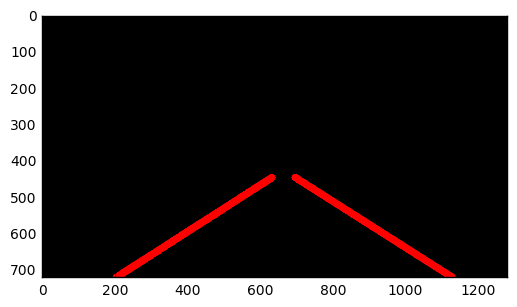

 67%|██████▋   | 169/251 [02:16<01:04,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


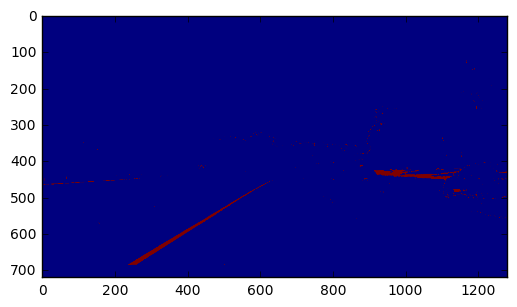

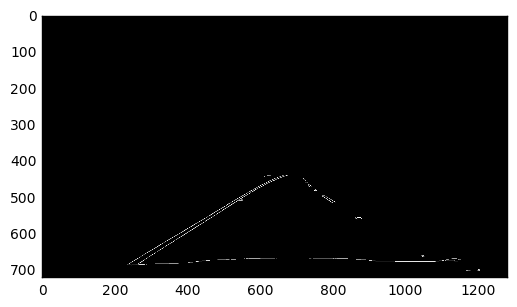

[-0.6236842105263155, 846.9105263157895]
[-0.6000000000000004, 826.6000000000003]
[-0.6974522292993626, 886.9585987261142]
[-0.599009900990099, 833.9554455445543]
[-0.6949152542372888, 883.4745762711872]
[-0.7804878048780489, 939.7804878048782]
[0.5531250000000005, 72.0937499999991]
[-0.7250000000000002, 903.6750000000006]
[-0.624324324324324, 850.4459459459457]
[-0.5989847715736037, 831.5532994923856]
[-0.576687116564419, 821.4601226993875]
[-0.5789473684210529, 828.4736842105264]
[-0.5979381443298963, 826.1649484536076]
[-0.6236842105263162, 847.5342105263162]
[-0.6010230179028142, 831.447570332481]
[0.8991935483870972, -193.52016129032347]
[-0.5987841945288758, 930.8844984802429]
middle 689
left [770, 719] right [638, 591, 605, 651, 595, 616, 583, 635, 637, 658, 671, 599, 639, 633]
(2, 2)
-60.7132056452 0.726159274194
SLOPE
854.17388688 -0.637295596684
ave 697 446
SLOPE
ave 640 446
x2 1075 210


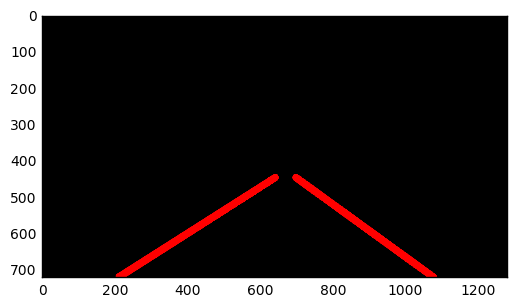

 68%|██████▊   | 170/251 [02:17<01:03,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


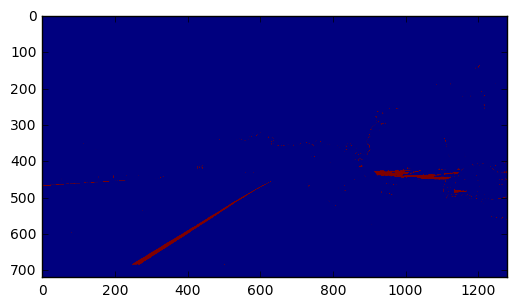

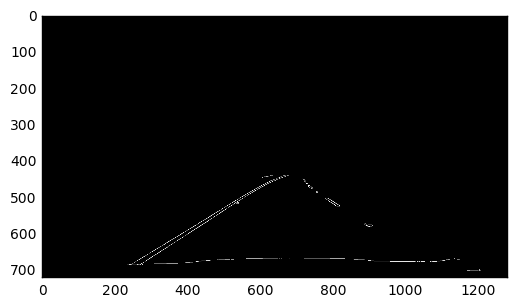

[-0.6473988439306362, 860.034682080925]
[-0.623003194888179, 840.5047923322684]
[0.7006369426751592, -46.75796178343909]
[0.6716417910447762, -18.74626865671648]
[-0.6484848484848491, 846.0060606060612]
[-0.6473684210526318, 847.842105263158]
[0.6981132075471703, -46.94339622641553]
[-0.6181818181818208, 836.4545454545462]
[-0.6232686980609426, 844.3102493074797]
[0.6763754045307445, -26.43042071197441]
[-0.647058823529412, 854.529411764706]
[0.5770171149144254, 48.782396088019354]
[0.7558139534883714, -92.18604651162747]
[-0.6666666666666329, 853.9999999999878]
[-0.7543859649122807, 922.1403508771932]
[-0.838235294117646, 912.3529411764702]
middle 623
left [719, 753, 719, 731, 678, 720] right [621, 561, 355, 615, 568, 360, 602, 344]
(6, 2)
-30.380282967 0.679933069033
SLOPE
865.540871624 -0.677274913036
ave 700 446
SLOPE
ave 619 446
x2 1103 214


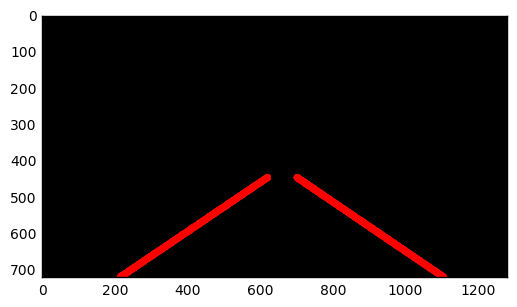

 68%|██████▊   | 171/251 [02:18<01:03,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


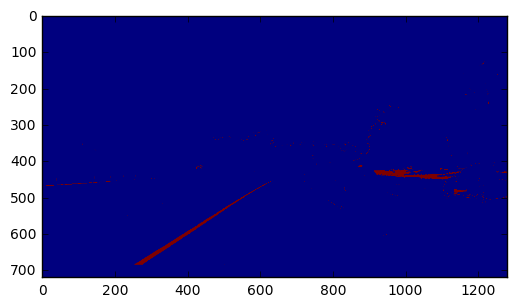

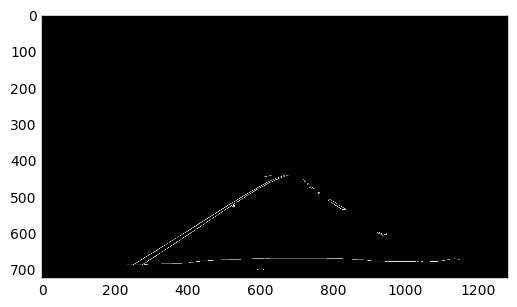

[-0.6242603550295854, 842.6893491124256]
[-0.671328671328672, 871.797202797203]
[-0.671641791044776, 873.7313432835819]
[0.673202614379085, -21.457516339868917]
[0.6727828746177372, -26.40366972477116]
[-0.6735294117647065, 876.9558823529413]
[0.7821782178217825, -108.82178217821831]
[-0.6722689075630246, 882.9915966386552]
[-0.5853658536585301, 844.6341463414614]
[-0.6733524355300864, 879.5988538681949]
[0.5773955773955776, 64.22850122850143]
[0.8030303030303012, -122.60606060605906]
[-0.6481481481481478, 870.3703703703703]
[-0.8100358422939071, 960.8422939068104]
[-0.7811447811447808, 948.5892255892253]
[-0.6241610738255046, 842.8791946308731]
[-0.5555555555555557, 806.0000000000002]
[0.576086956521738, 56.32608695652264]
[-0.5542857142857147, 807.1657142857144]
[0.5785714285714283, 48.88571428571463]
[-0.6981707317073171, 879.8475609756096]
middle 652
left [733, 720, 717, 656, 728, 666, 676] right [589, 600, 616, 625, 312, 638, 622, 637, 591, 648, 630]
(7, 2)
-15.6926751969 0.666178

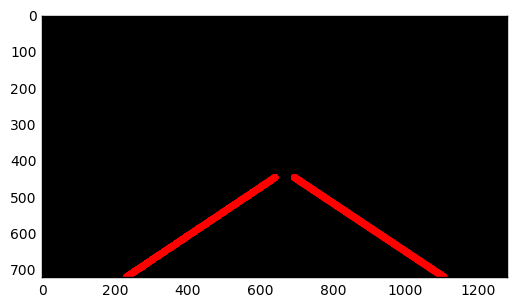

 69%|██████▊   | 172/251 [02:18<01:02,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


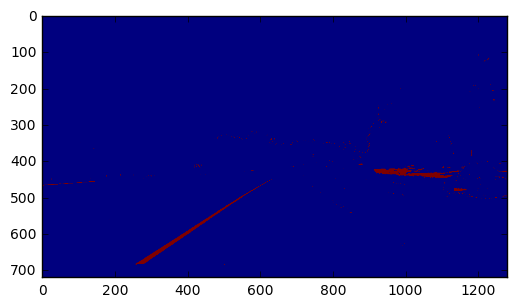

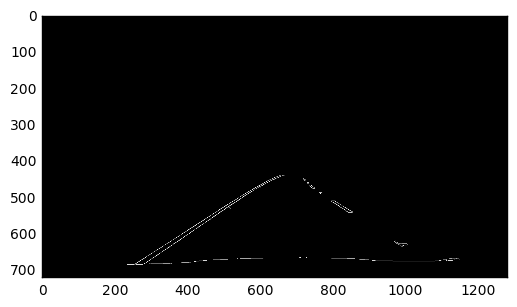

[-0.6472868217054276, 849.6472868217062]
[-0.6725663716814162, 870.6283185840705]
[0.6017441860465109, 26.71802325581467]
[-0.673529411764706, 871.914705882353]
[0.6235741444866922, 15.634980988592533]
[0.6259541984732825, 14.366412213740183]
[0.6487341772151894, -7.117088607594086]
[0.6747720364741637, -31.835866261397918]
[-0.7003058103975537, 888.8899082568803]
[0.6494252873563221, -16.287356321839447]
[0.5542168674698795, 67.13253012048207]
[-0.6415094339622658, 846.9433962264155]
[0.862068965517243, -169.96551724138067]
[-0.6470588235294108, 850.4117647058818]
[0.6748466257668704, -30.564417177913164]
[0.6012861736334403, 30.819935691318804]
[0.7545787545787553, -84.61538461538521]
[-0.6981132075471698, 874.88679245283]
middle 641
left [735, 796, 795, 737, 720, 718, 763, 718, 721, 762, 735] right [517, 615, 619, 621, 360, 540, 484]
(11, 2)
-16.883067996 0.661018310638
SLOPE
864.760310419 -0.668624268655
ave 700 446
SLOPE
ave 626 446
x2 1114 216


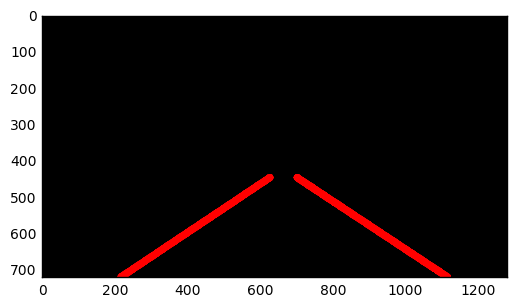

 69%|██████▉   | 173/251 [02:19<01:01,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


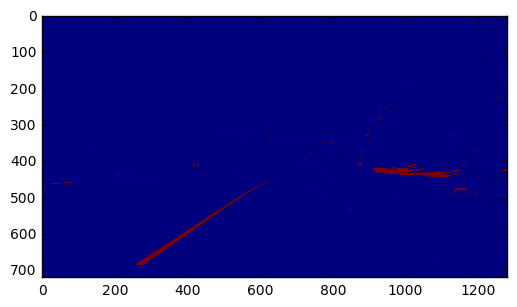

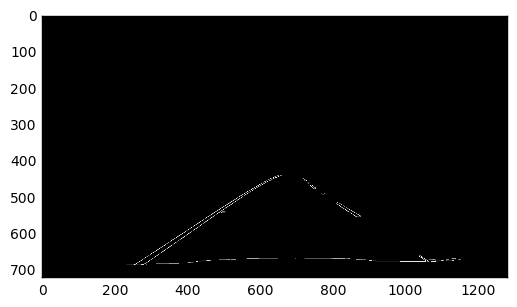

[-0.6983606557377046, 881.0327868852456]
[-0.6253229974160212, 842.9560723514213]
[-0.6226912928759898, 839.182058047494]
[0.6502890173410403, -15.858381502890207]
[-0.6732026143790857, 864.3986928104576]
[0.651408450704226, -8.281690140845908]
[0.6986899563318769, -54.52838427947531]
[-0.6992481203007521, 876.5939849624064]
[-0.7234042553191493, 887.553191489362]
[0.6487341772151898, -9.117088607594585]
[-0.5591397849462371, 810.1075268817207]
[0.7264573991031387, -74.88340807174873]
[-0.8064516129032258, 907.5806451612904]
[-0.7272727272727303, 870.9090909090916]
[-0.6995305164319247, 872.7746478873235]
[0.7258064516129035, -73.48387096774196]
[-0.8373983739837388, 959.3414634146336]
[0.6666666666666654, -21.99999999999897]
[0.6238532110091747, 7.596330275229107]
[-0.625, 844.7500000000001]
[0.5531914893617019, 58.744680851063684]
[-0.6968325791855192, 881.3122171945698]
[0.7500000000000103, -118.500000000011]
[-0.7499999999999987, 887.7499999999993]
[-0.6723163841807914, 878.2994350

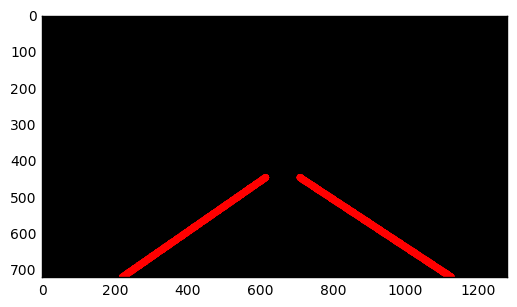

 69%|██████▉   | 174/251 [02:20<01:01,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


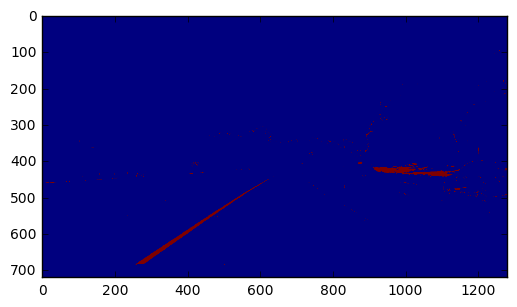

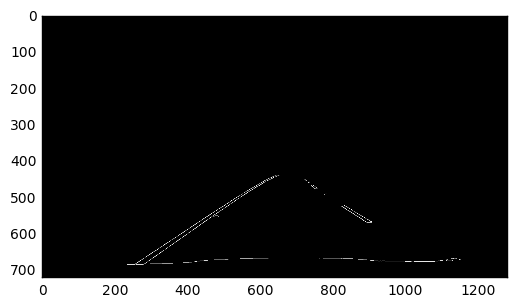

[-0.6987577639751552, 880.0496894409937]
[-0.6686746987951812, 855.5843373493981]
[-0.7006369426751596, 880.1783439490448]
[-0.5538461538461543, 798.4615384615388]
[0.648936170212765, -8.92553191489225]
[0.6475644699140399, -15.893982808022862]
[-0.5531914893617015, 794.5957446808508]
[-0.5540540540540526, 799.4729729729718]
[-0.6972477064220189, 869.7706422018348]
[0.8710937499999989, -176.80078124999903]
[-0.6986301369863003, 864.5479452054788]
[0.6482558139534883, -17.281976744186082]
[0.6481481481481477, -12.629629629628983]
[-0.7058823529411807, 865.3529411764719]
[0.8360655737704908, -156.72131147540873]
[0.5768194070080863, 37.3450134770888]
[-0.7368421052631664, 873.3157894736864]
[0.7823834196891186, -128.07253886010318]
[-0.7058823529411804, 875.117647058825]
[0.868525896414342, -178.6294820717124]
[0.629139072847682, 5.033112582781533]
[-0.8018867924528279, 938.3018867924518]
[-0.6725352112676052, 859.8591549295771]
[-0.698979591836735, 869.5306122448981]
[-0.727272727272718

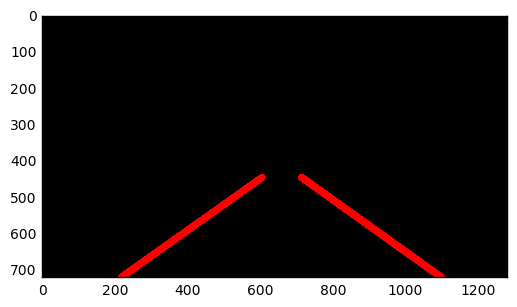

 70%|██████▉   | 175/251 [02:21<00:59,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


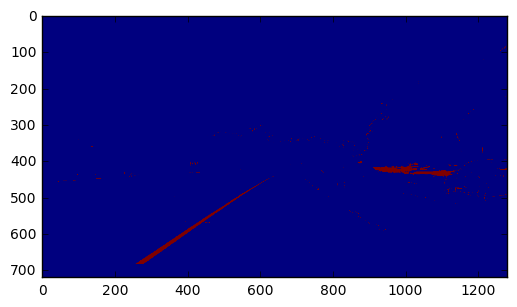

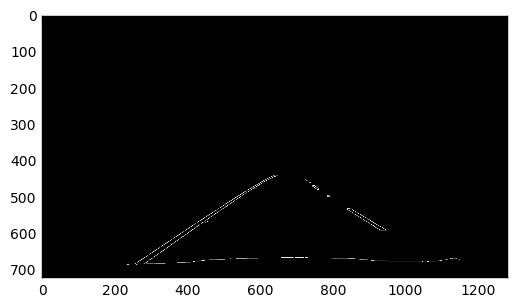

[-0.647761194029851, 846.5880597014924]
[-0.6999999999999996, 878.6]
[0.6489028213166144, -11.48589341692736]
[0.6246246246246236, 3.279279279280575]
[0.6246498599439774, 0.7535014005606916]
[-0.6226912928759896, 839.6728232189975]
[-0.6022727272727281, 823.6477272727275]
[-0.7222222222222139, 868.333333333331]
[-0.6504854368932045, 852.8058252427188]
[0.6246246246246248, 3.9039039039036756]
[0.6993006993006999, -68.75524475524551]
[0.6491228070175441, -18.561403508771864]
[0.7242524916943519, -72.87707641195973]
[-0.6506849315068497, 854.8356164383565]
[-0.6723646723646726, 871.6068376068375]
[-0.6736111111111106, 869.7638888888883]
[-0.7267080745341633, 896.5652173913052]
[0.6485507246376804, -9.815217391303653]
[-0.7751937984496119, 920.612403100775]
[-0.7785714285714297, 905.4785714285717]
[-0.6233062330623304, 832.9701897018971]
[0.6666666666666732, -39.33333333333965]
middle 680
left [742, 744, 724, 743, 922, 728, 733, 783, 929] right [586, 598, 629, 637, 276, 630, 636, 633, 638,

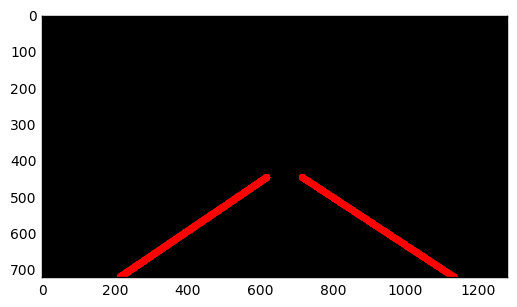

 70%|███████   | 176/251 [02:21<00:58,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


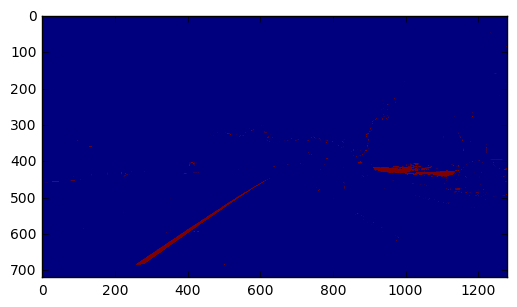

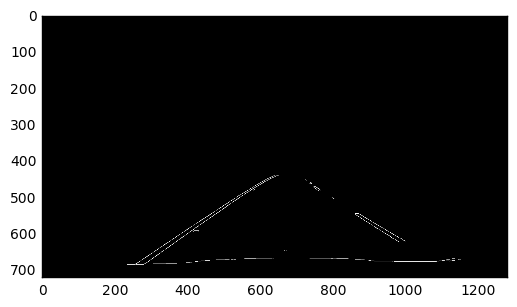

[-0.6978851963746223, 879.0120845921446]
[-0.7234042553191483, 876.7021276595743]
[0.672955974842767, -31.622641509433848]
[0.5994152046783624, 23.836257309941942]
[-0.780141843971631, 926.4042553191489]
[-0.6987951807228909, 871.578313253012]
[-0.6997084548104961, 889.714285714286]
[0.6736526946107783, -35.05089820359266]
[-0.6966824644549753, 868.9241706161132]
[-0.6935483870967708, 862.5483870967731]
[-0.8088737201365185, 951.546075085324]
[-0.7800000000000006, 895.6000000000004]
[-0.724137931034483, 879.7931034482763]
[0.7252747252747253, -80.9120879120877]
[-0.779411764705883, 900.1176470588236]
[0.6451612903225791, -9.903225806450108]
[-0.7432432432432414, 879.7297297297285]
[0.6698113207547166, -28.06603773584877]
[-0.6982456140350879, 874.2245614035086]
[-0.8289473684210503, 910.4736842105259]
[-0.7826086956521725, 931.7391304347819]
[0.8389513108614235, -153.56179775280924]
[-0.7407407407407437, 877.5925925925935]
[0.625482625482625, 1.2702702702709152]
[0.7517241379310342, -1

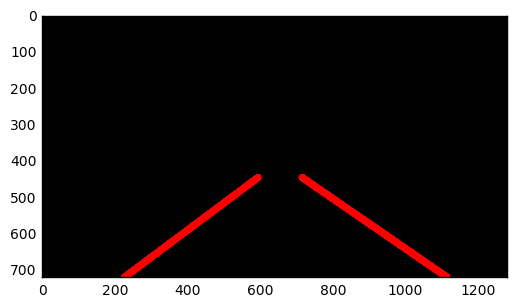

 71%|███████   | 177/251 [02:22<00:57,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


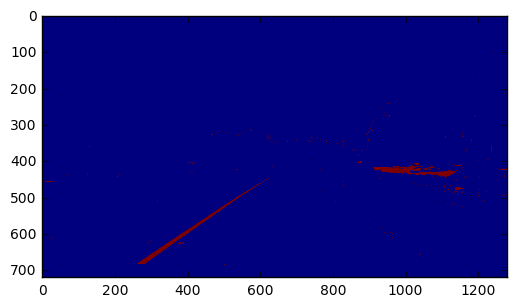

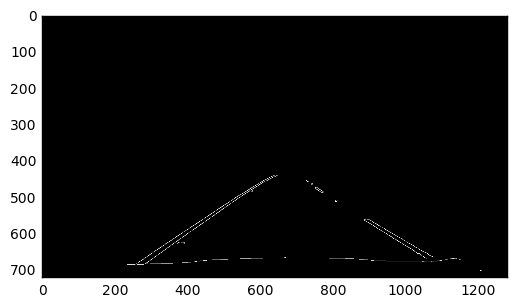

[-0.6249999999999998, 839.375]
[-0.6479289940828403, 846.9822485207101]
[0.5999999999999995, 34.00000000000043]
[0.5786163522012573, 42.987421383648105]
[-0.6224489795918362, 841.2346938775503]
[-0.6058823529411758, 835.4294117647055]
[-0.6724137931034491, 863.8620689655177]
[0.5759717314487635, 46.61484098939927]
[-0.6033519553072619, 838.8547486033522]
[-0.6036585365853665, 840.1402439024392]
[-0.5566502463054194, 817.4827586206901]
[0.6748466257668712, -37.3128834355829]
[-0.6498673740053046, 861.1140583554374]
[-0.6666666666666653, 869.9999999999995]
[0.5555555555555562, 63.222222222221745]
[0.698347107438017, -57.661157024794214]
[-0.6478494623655908, 856.0322580645156]
[0.6039603960396038, 30.970297029703108]
[-0.6000000000000021, 820.8000000000013]
[0.8106060606060601, -140.28030303030224]
[-0.6004901960784319, 828.5171568627454]
[0.7207792207792209, -76.21428571428572]
[-0.5531914893617016, 828.8297872340427]
[0.5925925925925882, 43.18518518519009]
[0.7083333333333358, -59.8333

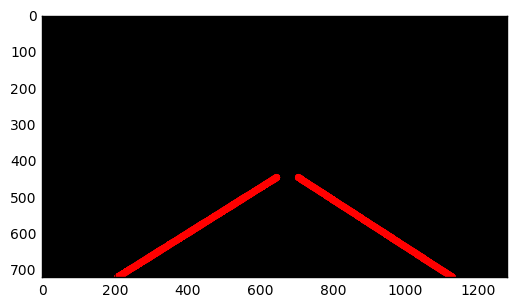

 71%|███████   | 178/251 [02:23<00:57,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


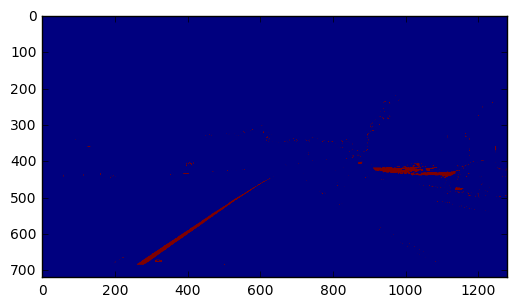

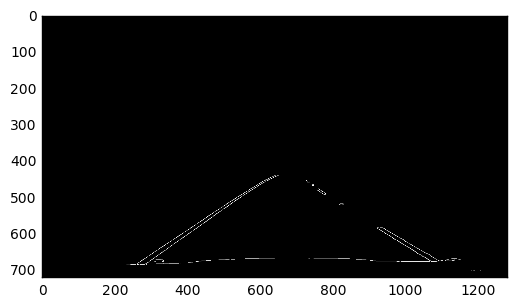

[-0.6472392638036807, 847.4570552147237]
[-0.6976047904191622, 881.026946107785]
[0.6000000000000005, 21.599999999999554]
[0.6250000000000006, 9.249999999999432]
[0.6011560693641619, 21.942196531792025]
[-0.6478873239436613, 849.5633802816898]
[-0.7524429967426697, 914.9999999999994]
[-0.6875000000000138, 861.687500000004]
[-0.7788778877887784, 933.019801980198]
[-0.6717325227963528, 862.3373860182375]
[0.6232558139534892, 12.423255813952448]
[0.5541561712846343, 52.68261964735576]
[-0.7272727272727462, 872.8181818181868]
[-0.7272727272727272, 873.6363636363635]
[-0.6999999999999997, 883.1999999999996]
[-0.6482758620689653, 847.0689655172412]
[0.5983379501385037, 21.01662049861542]
[0.8275862068965568, 414.0344827586189]
[-0.6222222222222225, 842.4222222222223]
[-0.5797101449275356, 818.8550724637682]
middle 603
left [729, 766, 742, 816, 726, 732] right [577, 273, 593, 272, 291, 540, 568, 569]
(6, 2)
23.1524487486 0.600317667457
SLOPE
853.285343361 -0.663903183796
ave 704 446
SLOPE
ave

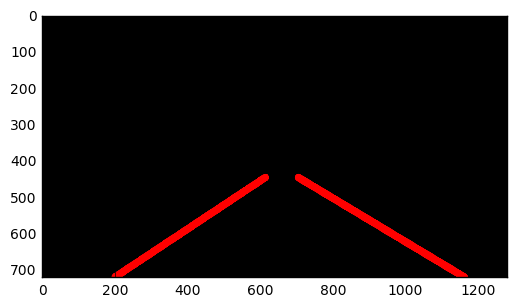

 71%|███████▏  | 179/251 [02:24<00:56,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


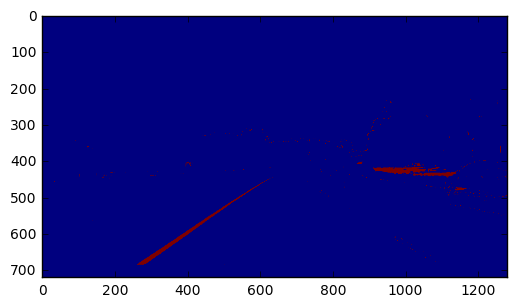

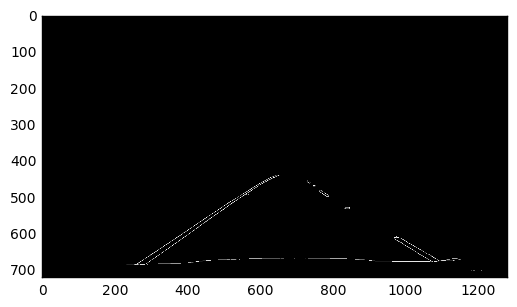

[-0.6718749999999997, 859.3593750000003]
[-0.6994047619047616, 883.3303571428569]
[-0.6990881458966567, 881.4437689969603]
[0.5534351145038163, 70.09541984732883]
[0.6225806451612895, 10.838709677420365]
[-0.6717791411042942, 862.6779141104296]
[-0.6979166666666663, 876.2291666666658]
[-0.6982758620689655, 887.1982758620688]
[0.6981132075471703, -53.92452830188712]
[-0.6874999999999979, 877.4374999999987]
[-0.6974789915966384, 872.6218487394959]
[-0.7245283018867911, 889.7660377358484]
[0.6981132075471708, -52.5283018867936]
[0.6245954692556639, 8.30744336569556]
[-0.7083333333333339, 868.5833333333333]
middle 656
left [831, 760, 729, 727, 760] right [517, 621, 610, 589, 562, 639, 629, 507, 549, 286]
(5, 2)
-3.44225145965 0.639367528803
SLOPE
875.864757759 -0.695618020446
ave 702 446
SLOPE
ave 617 446
x2 1131 224


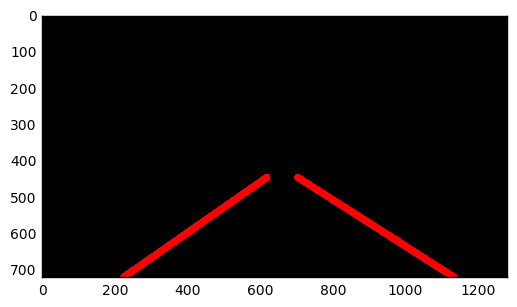

 72%|███████▏  | 180/251 [02:25<00:55,  1.28it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


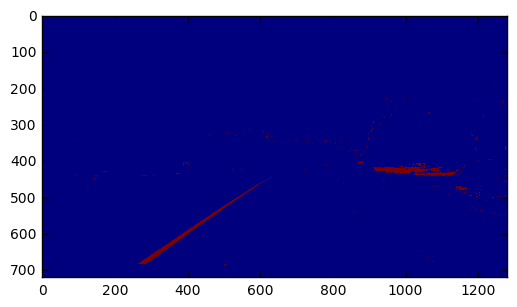

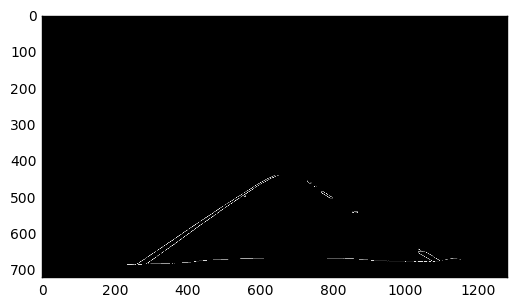

[-0.6721311475409845, 857.7377049180337]
[-0.673130193905817, 868.764542936288]
[-0.622691292875989, 834.4459102902371]
[-0.6245353159851299, 841.081784386617]
[0.6264367816091951, 1.0747126436784005]
[-0.65151515151515, 867.075757575757]
[-0.8639455782312918, 943.9115646258498]
[0.6225165562913908, 9.152317880794932]
[-0.5576923076923084, 806.1923076923078]
[0.6233766233766234, 7.493506493507027]
[-0.5761589403973522, 818.9205298013252]
[-0.8333333333333373, 958.5000000000023]
[-0.5869565217391313, 847.1739130434786]
[-0.8695652173913059, 944.739130434783]
[-0.8999999999999998, 1007.7000000000003]
[-0.5714285714285652, 803.857142857139]
[0.6229508196721308, 0.868852459016884]
[0.5525525525525529, 181.3333333333335]
[-0.7239263803680976, 897.558282208589]
[0.5535248041775459, 53.37336814621374]
middle 621
left [731, 766, 766, 729, 731] right [440, 619, 347, 449, 558, 557, 597, 324, 439, 579]
(5, 2)
14.3925515246 0.609761117025
SLOPE
868.255396124 -0.680541806215
ave 707 446
SLOPE
ave 6

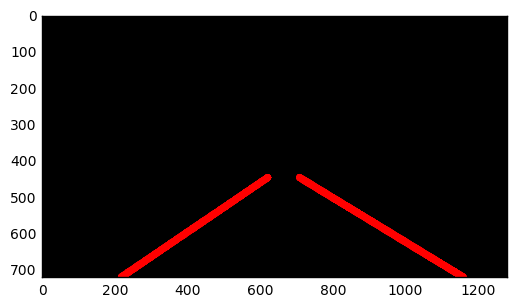

 72%|███████▏  | 181/251 [02:25<00:54,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


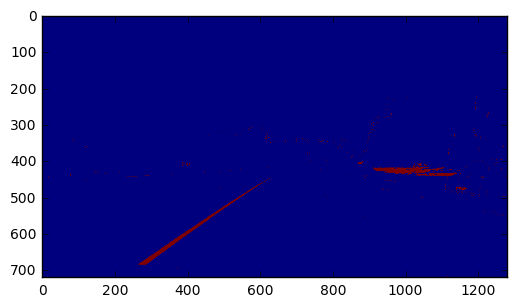

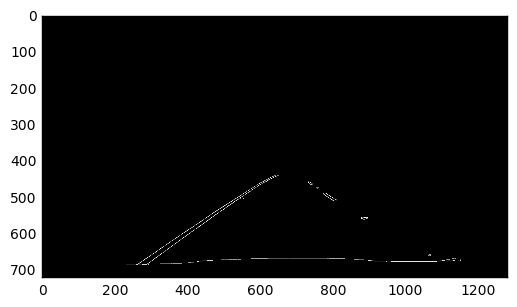

[-0.6728624535315987, 860.6171003717475]
[-0.6979472140762454, 883.2170087976538]
[-0.753787878787879, 907.1212121212118]
[0.6013071895424837, 27.588235294117794]
[-0.7536231884057961, 908.5797101449273]
[0.6000000000000004, 20.39999999999994]
[-0.6994219653179188, 885.7341040462425]
[-0.6724137931034471, 859.4827586206892]
[0.5581395348837206, 67.06976744186092]
[0.5785123966942148, 38.214876033058246]
[-0.6499999999999996, 863.4499999999997]
[-0.7789855072463775, 924.7065217391305]
[-0.6274509803921566, 852.9019607843135]
[-0.7249070631970271, 890.1486988847591]
[-0.7906976744185973, 933.4651162790652]
[-0.6498673740053058, 861.4641909814326]
[0.5532994923857866, 51.98477157360439]
[0.5785953177257533, 46.4882943143808]
[-0.7252396166134193, 896.495207667732]
[-0.83695652173913, 966.7282608695649]
[0.6986301369863014, -55.89041095890436]
[-0.7746478873239412, 919.3521126760552]
[0.755102040816325, -98.36734693877442]
middle 668
left [774, 731, 876, 736, 732, 789, 737, 758] right [530

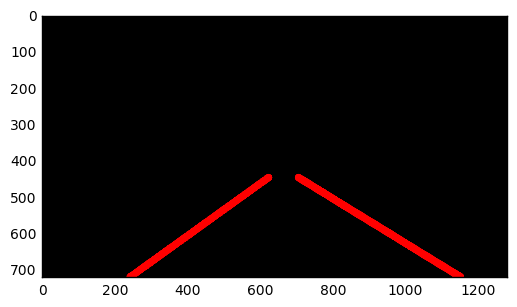

 73%|███████▎  | 182/251 [02:26<00:55,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


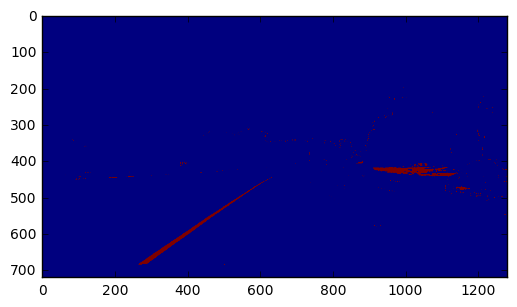

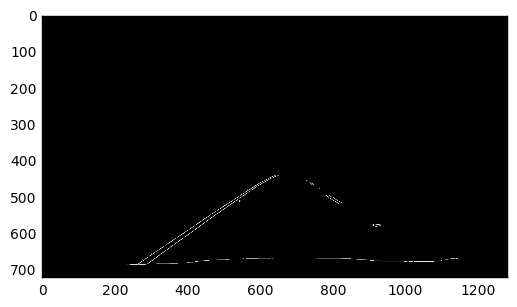

[-0.6714285714285714, 860.2428571428571]
[-0.7236842105263158, 893.3157894736838]
[-0.7252396166134187, 895.7699680511188]
[-0.7263513513513505, 893.1891891891884]
[0.6230366492146597, 3.3141361256545525]
[0.8378378378378383, -159.16216216216304]
[-0.7250755287009067, 900.7975830815709]
[-0.7619047619047615, 918.3809523809523]
[0.6503267973856212, -14.297385620915154]
[-0.8099999999999988, 957.5899999999993]
[0.6030534351145025, 26.793893129772304]
[0.6246498599439774, -0.49579831932731017]
[-0.6829268292682955, 867.1219512195136]
[0.6006600660066013, 23.68316831683099]
[-0.6960784313725494, 886.1862745098041]
[-0.7247706422018356, 898.5321100917433]
[-0.5995085995085997, 827.48402948403]
[-0.6734693877551013, 859.9591836734687]
[0.6487455197132614, -10.021505376343347]
[-0.8087248322147645, 954.7315436241608]
middle 677
left [733, 739, 757, 788, 726, 783, 780] right [541, 596, 605, 584, 630, 578, 639, 561, 641, 623, 643, 484, 634]
(7, 2)
-18.5979505581 0.655472880745
SLOPE
893.3308793

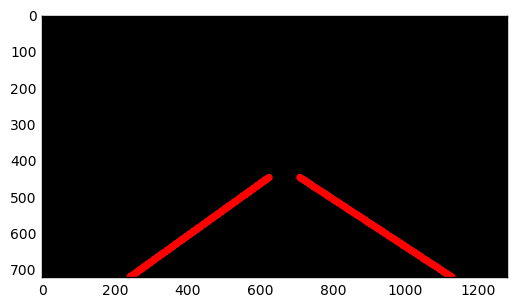

 73%|███████▎  | 183/251 [02:27<00:54,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


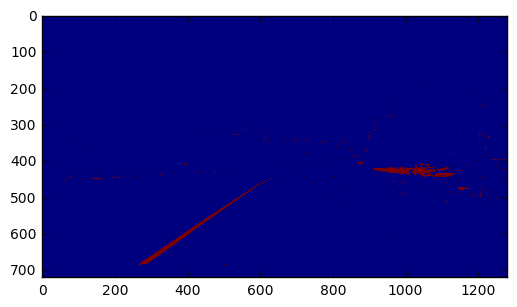

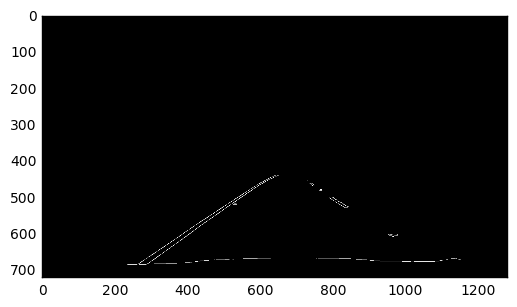

[-0.6734006734006739, 862.1043771043774]
[-0.7226890756302506, 894.0588235294106]
[0.6016949152542372, 20.75423728813554]
[0.6227758007117442, 10.629893238433661]
[-0.7524752475247529, 913.5049504950498]
[-0.8396226415094339, 932.7547169811323]
[-0.6749311294765841, 873.3057851239668]
[-0.7764705882352941, 928.4235294117644]
[0.6242937853107343, 0.5141242937853696]
[-0.8663793103448278, 971.5043103448278]
[-0.7510040160642569, 910.8032128514054]
[-0.839285714285715, 927.0714285714292]
[0.5999999999999995, 23.200000000000273]
[-0.6496062992125975, 866.8897637795268]
[-0.8029197080291962, 918.5109489051091]
[-0.7003154574132492, 879.6876971608829]
[-0.6238532110091766, 855.9357798165145]
[0.5800711743772247, 46.042704626333915]
[-0.6240601503759394, 836.541353383458]
[0.6008064516129026, 16.612903225807365]
[-0.6756756756756759, 871.3513513513516]
[-0.724137931034483, 884.8620689655173]
middle 648
left [735, 789, 728, 743, 805, 728] right [560, 602, 608, 438, 642, 611, 565, 551, 404, 534

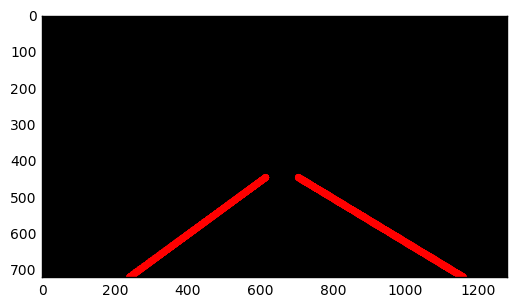

 73%|███████▎  | 184/251 [02:28<00:53,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


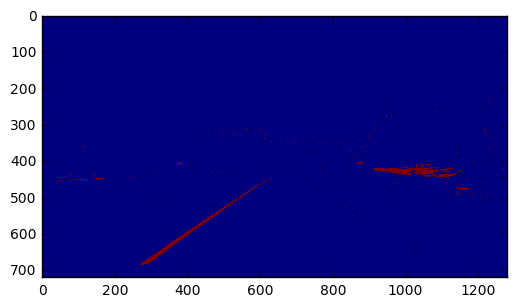

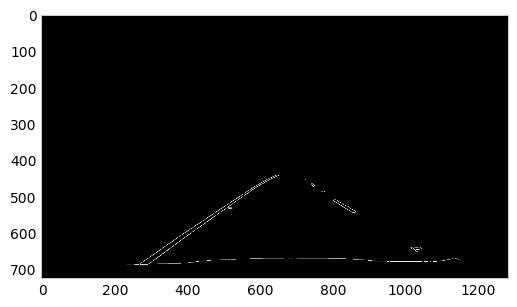

[-0.724025974025975, 896.0357142857149]
[-0.6730769230769222, 862.0192307692301]
[-0.7266666666666665, 895.4599999999997]
[0.6235294117647058, 4.8352941176471615]
[0.6245353159851295, 10.371747211896755]
[-0.5542168674698793, 797.9397590361442]
[0.6485714285714295, -17.268571428572645]
[0.6750000000000006, -40.200000000001005]
[-0.6498673740053047, 857.2148541114055]
[-0.6723646723646719, 867.210826210826]
[-0.5564516129032268, 801.1370967741942]
[0.6990740740740745, -61.921296296296376]
[0.6475095785440619, -9.007662835249747]
[-0.8069498069498061, 940.4169884169876]
[0.6250000000000004, 4.49999999999907]
[-0.8717948717948715, 982.589743589743]
[-0.6993006993006994, 877.3076923076923]
[-0.8048780487804883, 930.5121951219515]
[-0.6500000000000008, 859.7000000000004]
[-0.7525083612040129, 913.5150501672238]
[-0.6755952380952377, 879.8124999999994]
[-0.7731958762886603, 927.7422680412374]
middle 690
left [738, 800, 722, 824, 841, 800, 740] right [605, 523, 591, 626, 642, 622, 649, 578, 5

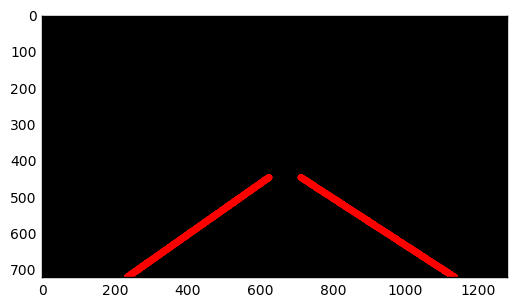

 74%|███████▎  | 185/251 [02:29<00:53,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


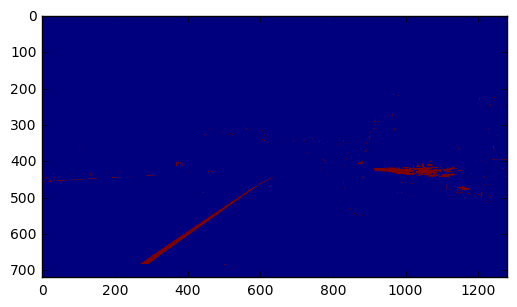

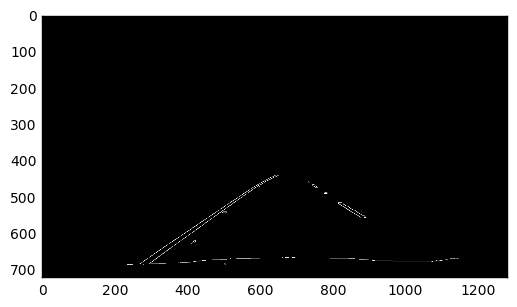

[-0.6718266253869969, 862.7058823529409]
[-0.698830409356725, 884.5643274853794]
[-0.6991404011461319, 887.4498567335241]
[0.601156069364162, 21.543352601155508]
[0.6225680933852146, 10.8521400778201]
[-0.648648648648649, 868.8648648648654]
[-0.6486486486486488, 858.4864864864867]
[-0.7541528239202658, 914.5249169435214]
[-0.6244541484716157, 858.5982532751094]
[0.5764075067024123, 36.069705093834614]
[0.5555555555555556, 54.33333333333326]
[0.6240310077519376, 8.66279069767472]
[0.7241379310344821, -88.6896551724132]
[-0.585106382978723, 823.2765957446805]
[0.6258064516129032, -0.7096774193551958]
[-0.6486486486486489, 866.2702702702707]
[-0.8089887640449436, 943.2584269662918]
[0.6011904761904755, 22.70833333333395]
[-0.6724890829694319, 861.5371179039296]
[-0.6993006993006989, 893.8461538461534]
[-0.6726190476190476, 864.6071428571427]
[-0.6487935656836467, 859.8230563002683]
[-0.6031746031746034, 854.0952380952382]
[0.6513761467889908, 345.96330275229377]
middle 648
left [741, 813,

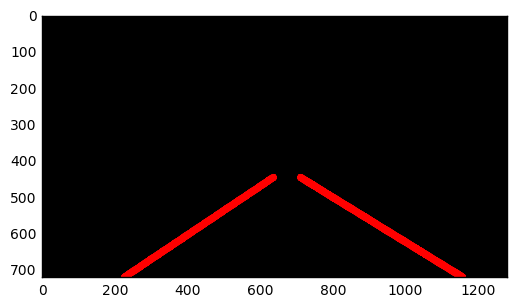

 74%|███████▍  | 186/251 [02:29<00:51,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


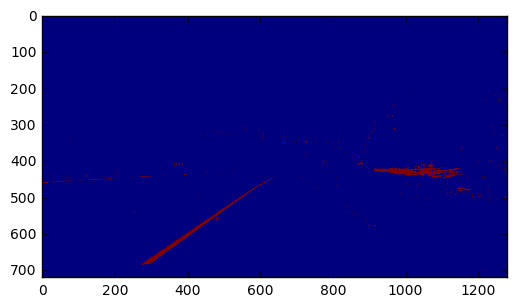

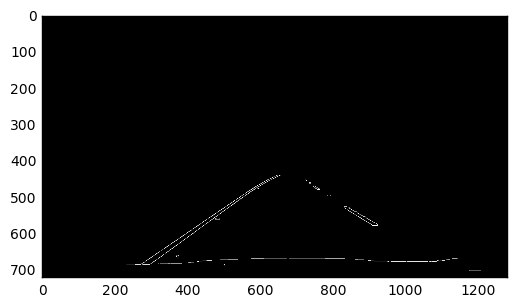

[-0.7246835443037971, 899.9556962025317]
[-0.6728395061728399, 865.993827160494]
[0.5787781350482317, 42.39549839228284]
[0.6498194945848378, -10.509025270758439]
[0.67398119122257, -32.70219435736609]
[-0.6737160120845923, 867.250755287009]
[0.5780346820809256, 41.47398843930559]
[0.6720430107526886, -33.55913978494671]
[-0.8695652173913049, 985.4782608695658]
[0.8403041825095049, -158.26235741444805]
[-0.8688524590163936, 962.5573770491804]
[0.7575757575757553, -109.87878787878579]
[0.8672985781990518, -190.29857819905158]
[0.6243386243386249, 0.35449735449658426]
middle 672
left [782, 781, 734, 750, 724, 731, 842, 789, 725] right [614, 593, 603, 602, 499]
(9, 2)
-50.1095665244 0.693574850701
SLOPE
916.247183314 -0.761931347794
ave 715 446
SLOPE
ave 617 446
x2 1110 257


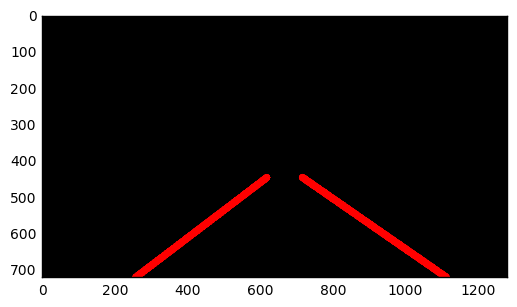

 75%|███████▍  | 187/251 [02:30<00:52,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


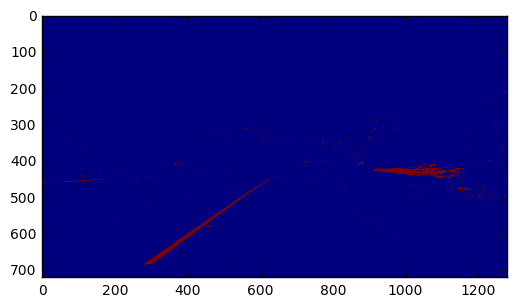

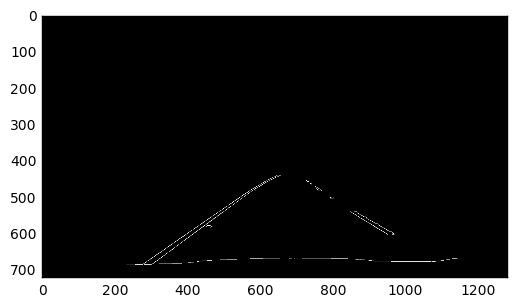

[-0.7244582043343658, 901.6130030959755]
[-0.6975806451612903, 878.3225806451612]
[0.600566572237961, 21.382436260623027]
[0.5565217391304345, 69.94782608695684]
[-0.6875000000000008, 874.5625000000005]
[0.6022727272727268, 21.329545454546345]
[-0.7058823529411759, 892.4117647058818]
[0.6739811912225703, -36.74608150470169]
[0.6485623003194897, -11.773162939297954]
[-0.7115384615384626, 886.7500000000008]
[-0.7261904761904749, 908.3928571428564]
[0.6021798365122621, 17.419618528610002]
[-0.7253086419753081, 903.768518518518]
[-0.6923076923076854, 879.5384615384572]
[-0.7142857142857136, 882.5714285714283]
[-0.7250755287009073, 905.8731117824777]
[-0.7307692307692194, 895.6153846153787]
[0.6993464052287589, -55.215686274510624]
[-0.8403041825095052, 967.8631178707221]
[0.5769230769230772, 51.76923076923055]
[-0.8646616541353382, 980.6090225563908]
[0.6666666666666662, -38.99999999999924]
[-0.5999999999999998, 832.9999999999999]
[0.7263843648208467, -73.35504885993461]
[0.553672316384180

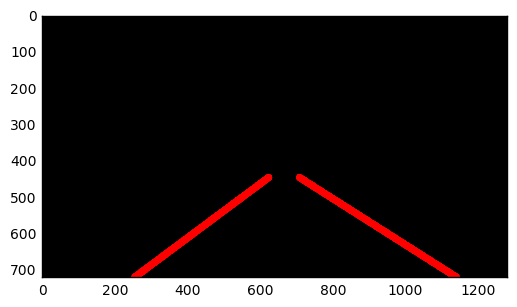

 75%|███████▍  | 188/251 [02:31<00:50,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


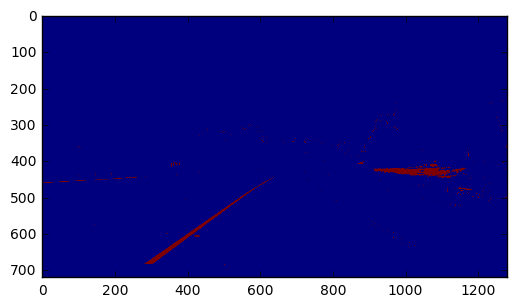

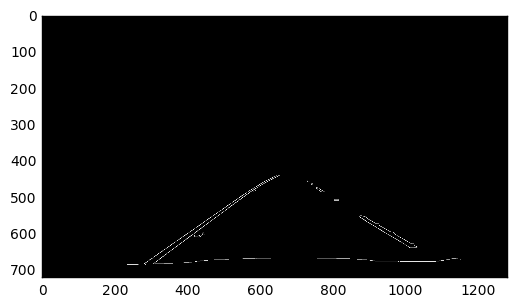

[-0.7517985611510787, 913.5755395683452]
[0.5551839464882943, 62.742474916387856]
[-0.7533783783783786, 915.7939189189191]
[-0.6992481203007511, 879.0902255639091]
[0.6262626262626263, 7.525252525252724]
[-0.6959064327485389, 878.6257309941527]
[-0.8087248322147642, 960.2013422818785]
[0.6501457725947524, -18.655976676384967]
[0.5550458715596325, 61.853211009174736]
[-0.6451612903225812, 874.9677419354839]
[0.673228346456693, -39.98818897637823]
[0.6222910216718267, 8.037151702786545]
[-0.8407407407407399, 972.055555555555]
[-0.7777777777777776, 931.3333333333335]
[-0.6201550387596904, 868.8062015503875]
[-0.619834710743803, 871.1900826446285]
[-0.5584415584415594, 802.0259740259748]
[-0.8642857142857147, 979.3714285714289]
[0.5546218487394956, 56.36974789915993]
[-0.8373983739837405, 967.5528455284558]
[-0.8045112781954876, 933.105263157894]
[0.6741573033707865, -34.46067415730349]
[-0.8677685950413223, 979.6446280991736]
[0.6726190476190456, -38.14880952380765]
middle 670
left [802, 

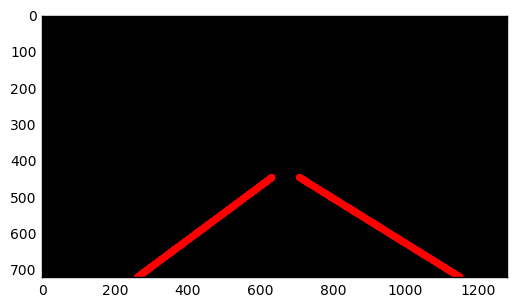

 75%|███████▌  | 189/251 [02:32<00:50,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


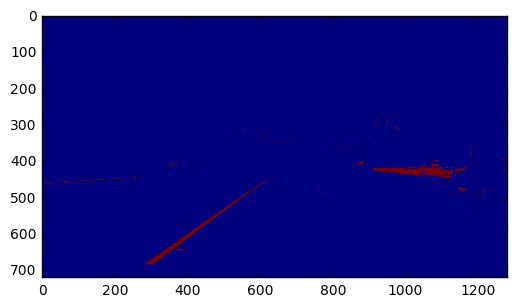

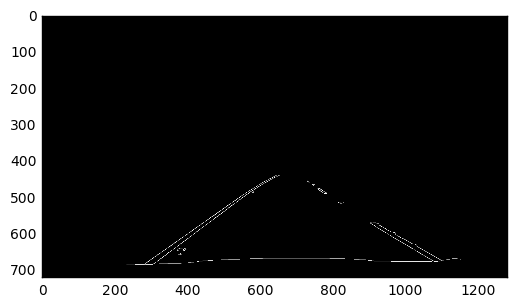

[-0.6984126984126988, 881.2539682539684]
[-0.7256097560975603, 903.4085365853654]
[0.5771812080536914, 53.64429530201314]
[0.5543859649122802, 64.72982456140409]
[-0.7240000000000004, 892.0640000000004]
[-0.6481481481481484, 861.2962962962964]
[-0.7813504823151126, 942.4083601286173]
[-0.7256317689530682, 894.7075812274368]
[-0.8965517241379326, 963.724137931035]
[0.5561797752808981, 71.43258426966389]
[0.6253521126760564, -0.2563380281690502]
[-0.6260162601626019, 850.8943089430893]
[-0.700296735905044, 886.6854599406524]
[0.5517241379310338, 64.89655172413889]
[-0.7523219814241484, 923.238390092879]
[-0.5551020408163265, 819.7795918367344]
[-0.7600000000000098, 906.8000000000044]
[0.5789473684210519, 52.89473684210624]
[-0.681818181818178, 872.1818181818157]
[-0.8104089219330843, 962.7137546468397]
[-0.676056338028169, 873.9718309859156]
[0.6752411575562703, -34.028938906752536]
[0.7234042553191512, -70.63829787234201]
[-0.6057692307692304, 843.8269230769224]
[-0.8370044052863423, 96

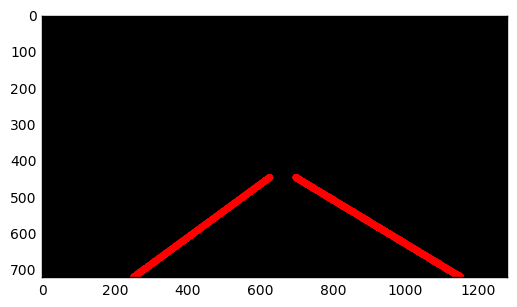

 76%|███████▌  | 190/251 [02:33<00:48,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


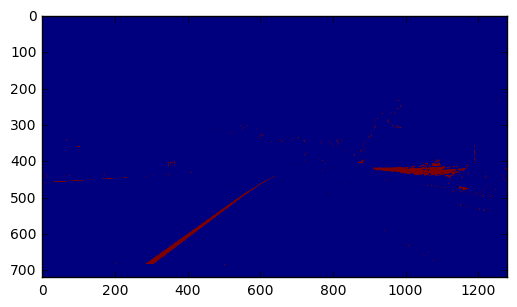

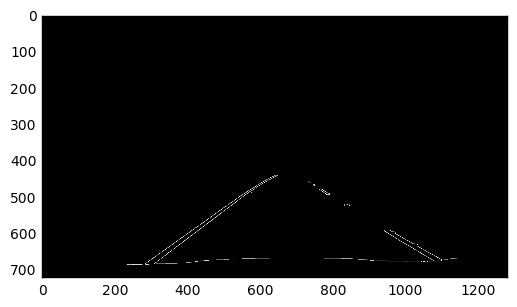

[0.5773809523809524, 40.03571428571416]
[-0.7533333333333333, 913.766666666667]
[-0.6982456140350874, 877.4140350877195]
[0.6459854014598541, -19.036496350364903]
[-0.6741573033707872, 869.0449438202254]
[0.6489675516224185, -18.395280235987574]
[0.752941176470588, -101.7882352941173]
[-0.7516129032258062, 914.7451612903224]
[-0.8072289156626488, 919.0963855421679]
[0.722689075630254, -94.38655462185119]
[-0.8367346938775486, 925.979591836734]
[0.5769230769230769, 36.615384615384365]
[0.7226890756302512, -92.94117647058741]
[0.5921052631578975, 22.276315789470633]
[-0.6067415730337065, 838.5056179775274]
[0.666666666666664, -38.666666666663865]
[-0.6282051282051272, 860.1538461538455]
[0.6485355648535566, -17.025104602510478]
[-0.6228571428571426, 842.4971428571428]
[-0.7266666666666658, 905.3399999999997]
[0.598039215686274, 17.666666666667115]
[-0.6747404844290655, 870.809688581315]
[0.5999999999999968, 23.200000000002646]
[-0.7692307692307648, 901.4615384615372]
[-0.7142857142857142

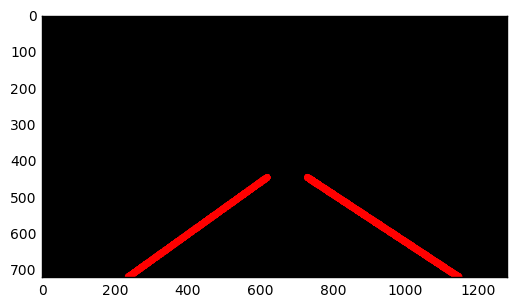

 76%|███████▌  | 191/251 [02:33<00:48,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


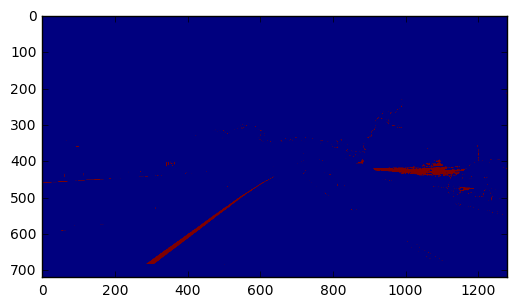

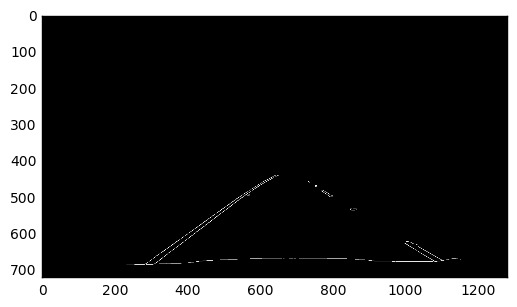

[-0.7516339869281047, 914.7516339869284]
[0.5745341614906834, 42.75776397515525]
[-0.6975308641975314, 880.308641975309]
[-0.698581560283688, 877.8085106382978]
[0.6468646864686467, -19.089108910890573]
[-0.6498673740053044, 856.5649867373999]
[-0.7256944444444442, 894.7256944444441]
[0.6467065868263472, -17.562874251496954]
[-0.753968253968253, 914.3809523809516]
[-0.8100000000000005, 958.4000000000002]
[-0.6723646723646726, 867.8831908831908]
[0.5546875000000002, 62.17968750000002]
[-0.7524752475247515, 914.2574257425736]
[0.6497005988023948, -17.529940119759964]
[-0.7266187050359709, 894.2661870503597]
[-0.5773809523809526, 820.5297619047619]
[0.8666666666666664, -177.53333333333308]
[0.774647887323945, -153.42253521126912]
middle 698
left [768, 753, 740, 847, 735, 731, 1001] right [613, 604, 558, 641, 577, 600, 640, 623, 609, 566, 569]
(7, 2)
-40.0286200502 0.673401155368
SLOPE
890.352453249 -0.710556005558
ave 721 446
SLOPE
ave 625 446
x2 1128 239


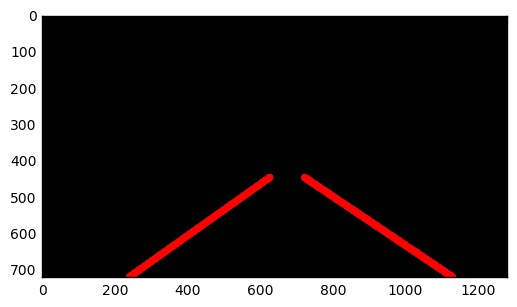

 76%|███████▋  | 192/251 [02:34<00:47,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


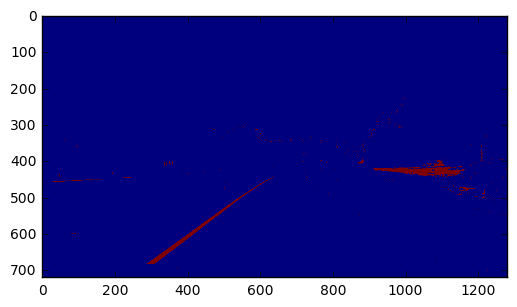

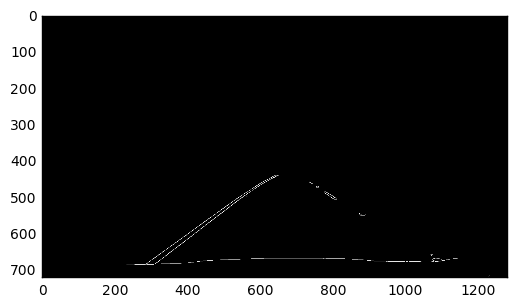

[-0.7524429967426705, 915.247557003257]
[-0.7252747252747251, 893.1538461538463]
[-0.7428571428571439, 897.2285714285713]
[-0.7532894736842106, 914.7532894736843]
[-0.75, 902.4999999999999]
[-0.752411575562701, 917.5048231511256]
[0.649999999999999, -21.39999999999906]
[-0.7523219814241476, 920.2291021671823]
[0.5548780487804883, 58.749999999999346]
[-0.7769784172661873, 912.6546762589928]
[-0.7541666666666662, 906.7249999999998]
[0.6499999999999996, -19.44999999999964]
[-0.8055555555555541, 922.6388888888885]
[-0.7586206896551648, 900.4482758620667]
[-0.7272727272727267, 907.8181818181818]
[0.6487341772151901, -15.4968354430382]
[-0.7794117647058821, 918.0441176470586]
[-0.7037037037037058, 882.4814814814825]
[0.62536023054755, 0.36023054755080225]
[-0.7777777777777835, 907.4444444444462]
[0.6238532110091736, 0.11926605504654182]
[0.725099601593626, -82.62948207171385]
middle 634
left [756, 779, 733, 753, 735, 758, 798] right [613, 560, 388, 609, 478, 624, 432, 534, 403, 313, 503, 589

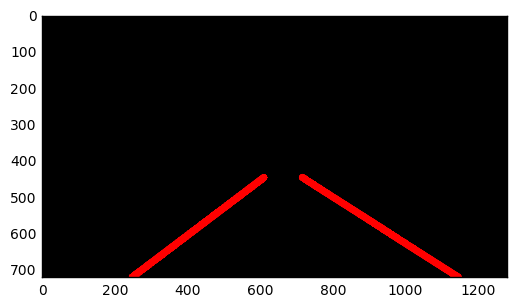

 77%|███████▋  | 193/251 [02:35<00:47,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


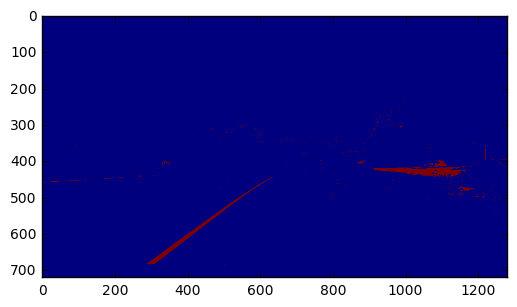

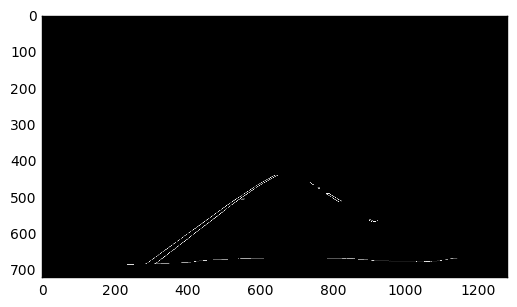

[-0.6978417266187054, 877.3021582733815]
[-0.7516339869281033, 913.9999999999995]
[0.5752688172043011, 36.177419354838996]
[-0.7009345794392517, 882.0654205607473]
[-0.6745283018867935, 868.5801886792459]
[0.6493902439024387, -17.19817073170654]
[0.6246153846153844, -1.083076923076668]
[-0.7540983606557379, 916.5245901639347]
[-0.6257668711656429, 850.3006134969319]
[0.6744186046511641, -44.023255813954385]
[0.69811320754717, -60.90566037735861]
[0.6237288135593227, 4.867796610168604]
[-0.8888888888888893, 984.8888888888888]
[-0.6505576208178446, 861.5613382899634]
[-0.6999999999999998, 877.5999999999999]
[-0.6006600660066013, 833.3630363036309]
[0.6213017751479293, 2.2366863905322867]
[-0.5528455284552845, 817.682926829268]
[-0.7499999999999981, 916.999999999999]
[-0.7242424242424241, 907.6878787878791]
[0.6013071895424843, 16.169934640522357]
[-0.7518796992481204, 908.0601503759398]
[-0.6547619047619062, 867.9404761904769]
[0.6475903614457836, -16.92168674698864]
middle 671
left [735

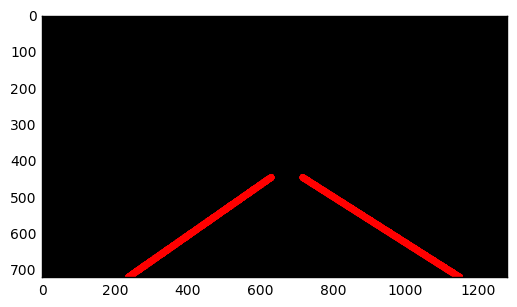

 77%|███████▋  | 194/251 [02:36<00:45,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


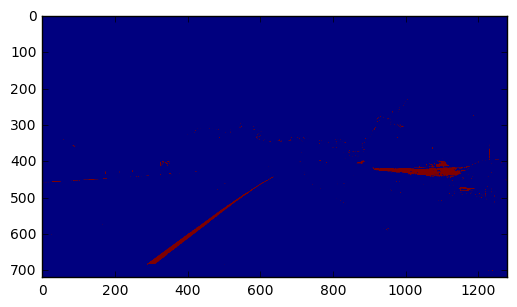

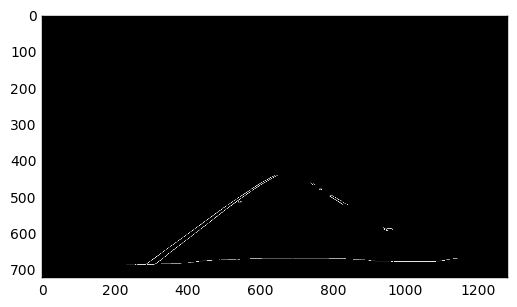

[-0.7027027027027102, 880.7027027027069]
[-0.7532051282051283, 916.9871794871794]
[-0.7533333333333331, 914.0133333333332]
[0.5772357723577232, 35.5772357723579]
[-0.7499999999999997, 903.25]
[-0.7450980392156848, 898.0784313725486]
[0.6246056782334377, 3.0504731861206227]
[-0.7647058823529412, 906.8235294117648]
[-0.6994219653179194, 890.630057803468]
[-0.8000000000000197, 923.4000000000087]
[0.6215277777777769, 6.993055555556321]
[-0.8398437499999997, 962.6679687500001]
[-0.7499999999999984, 898.9999999999994]
[-0.7523809523809526, 917.7428571428572]
[-0.8677685950413231, 951.4049586776861]
[-0.7519999999999993, 906.8399999999995]
[-0.8070175438596482, 928.7192982456136]
[-0.673228346456693, 880.2362204724412]
[0.5988538681948422, 20.452722063037534]
[-0.83916083916084, 980.7412587412593]
[-0.7777777777777763, 917.7777777777771]
[-0.7265306122448969, 904.9795918367341]
[-0.7260273972602737, 894.8219178082189]
[-0.8384615384615387, 963.0461538461541]
[-0.6246056782334376, 957.32176656

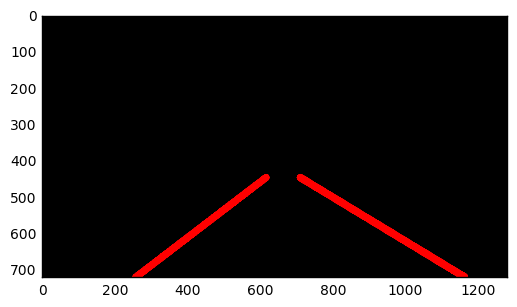

 78%|███████▊  | 195/251 [02:37<00:45,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


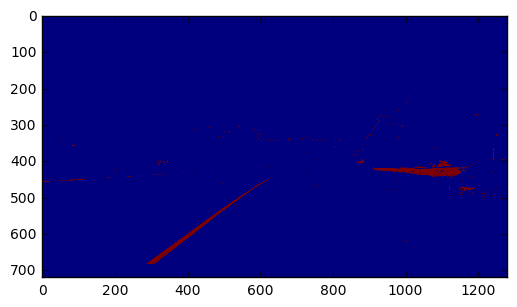

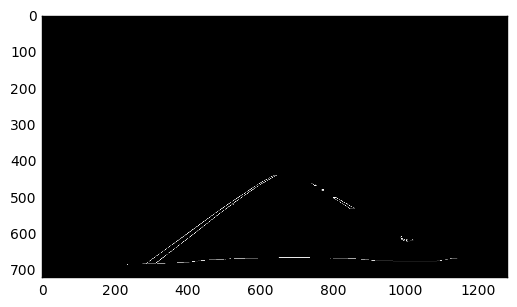

[-0.7236842105263164, 888.5263157894739]
[-0.7806691449814134, 926.0334572490709]
[0.6761006289308177, -39.31446540880545]
[-0.5806451612903221, 814.516129032258]
[-0.608695652173912, 827.347826086956]
[0.598837209302326, 18.273255813952883]
[-0.7765363128491624, 925.3687150837994]
[-0.5775862068965507, 811.9655172413786]
[0.5982532751091704, 16.550218340611377]
[0.7042253521126802, -63.957746478877]
[-0.8066037735849044, 933.4669811320748]
[0.6257309941520462, -1.0409356725139989]
[0.6463414634146329, -22.695121951218592]
[0.6031128404669258, 17.47470817120648]
middle 674
left [740, 751, 773, 771, 740, 835, 747] right [512, 588, 645, 569, 598, 644, 525]
(7, 2)
-10.6728695979 0.636085966213
SLOPE
875.317848802 -0.693488637472
ave 717 446
SLOPE
ave 619 446
x2 1148 223


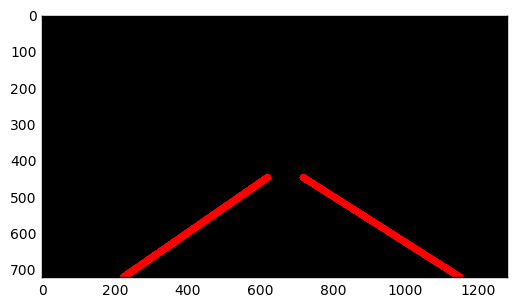

 78%|███████▊  | 196/251 [02:37<00:44,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


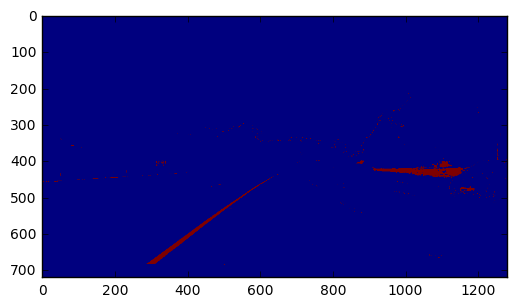

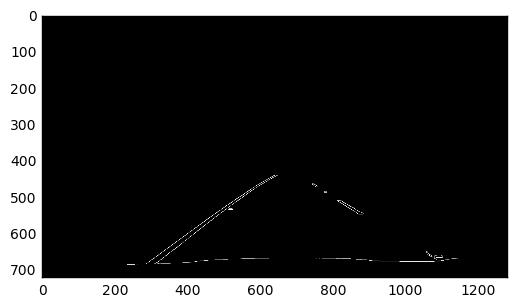

[-0.7236842105263158, 889.5263157894738]
[-0.5769230769230769, 811.9615384615386]
[-0.7547169811320755, 915.8867924528297]
[0.5561643835616434, 53.545205479452605]
[0.6729559748427664, -37.67924528301787]
[-0.6493506493506491, 878.1558441558441]
[-0.8048780487804886, 939.4146341463419]
[0.5535714285714283, 57.53571428571471]
[-0.7246963562753032, 890.9878542510116]
[-0.7515923566878989, 917.5031847133766]
[-0.7526132404181175, 910.536585365853]
[0.5559566787003599, 60.77978339350302]
[-0.890909090909095, 979.8545454545477]
[-0.6749999999999986, 879.2999999999993]
[-0.6990740740740735, 897.9166666666664]
[-0.8947368421052618, 980.0526315789467]
[-0.5818181818181848, 811.200000000002]
[0.5999999999999996, 15.80000000000036]
[-0.6972477064220184, 895.9633027522933]
[-0.8311688311688322, 950.3246753246759]
[-0.6761904761904748, 884.8285714285706]
[-0.6982758620689657, 890.6896551724142]
[-0.6994535519125697, 889.2568306010937]
[-0.7000000000000213, 899.3000000000068]
[-0.8599999999999945, 

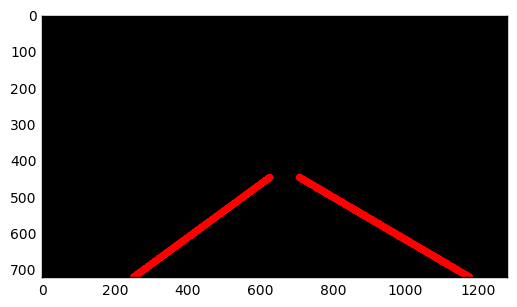

 78%|███████▊  | 197/251 [02:38<00:43,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


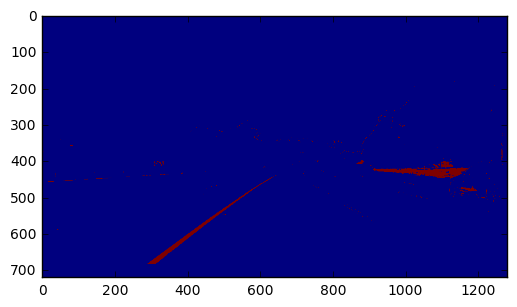

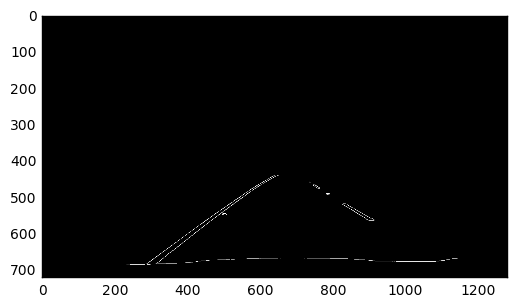

[-0.7516129032258072, 915.496774193549]
[-0.7000000000000001, 879.6]
[0.599447513812155, 18.005524861877976]
[-0.7516778523489933, 913.2617449664432]
[-0.7015873015873021, 882.1460317460321]
[0.5993485342019546, 24.508143322475338]
[-0.837545126353792, 969.277978339351]
[-0.8697478991596642, 977.8445378151264]
[-0.7523219814241492, 921.4860681114558]
[0.6254980079681266, 3.964143426296232]
[0.5994236311239194, 20.429394812680314]
[-0.6994219653179194, 890.630057803468]
[0.6000000000000001, 20.999999999999968]
[-0.6476190476190469, 870.1047619047617]
[0.6733668341708544, -48.88944723618106]
[-0.8093645484949845, 955.7558528428099]
[-0.5785714285714308, 843.5285714285723]
[-0.674931129476584, 871.2809917355372]
[-0.6010362694300521, 852.1243523316065]
[-0.7789855072463768, 927.3804347826082]
[0.8695652173913007, -187.86956521738836]
[0.6493055555555558, -22.30208333333356]
[-0.780327868852458, 941.2885245901632]
[0.8395061728395069, -165.8641975308646]
[-0.8732394366197165, 978.126760563

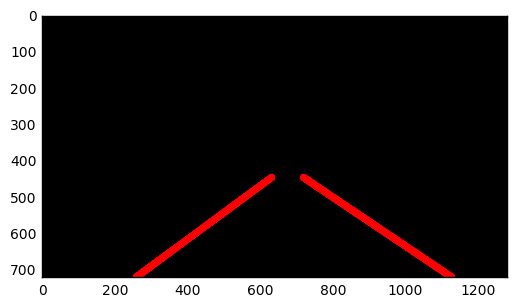

 79%|███████▉  | 198/251 [02:39<00:42,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


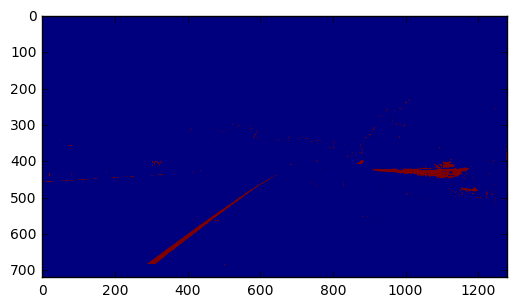

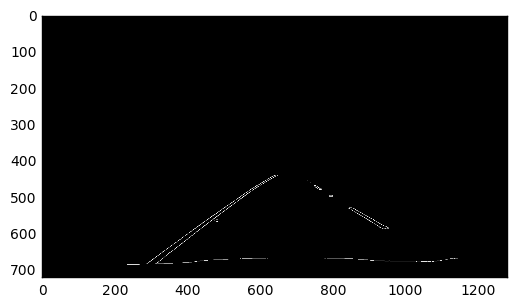

[-0.7524752475247527, 915.0099009900989]
[-0.7461538461538447, 898.6076923076918]
[0.599439775910364, 18.812324929971997]
[-0.7499999999999999, 902.2499999999999]
[0.6242424242424246, 3.066666666666292]
[-0.6478494623655917, 852.1451612903229]
[0.6218487394958002, 6.638655462183151]
[-0.8395721925133687, 949.144385026738]
[-0.629629629629627, 873.5185185185173]
[-0.725752508361204, 895.9197324414712]
[-0.7777777777777622, 916.8888888888808]
[-0.7499999999999989, 899.2499999999995]
[-0.6982248520710046, 899.0532544378688]
[-0.8391608391608393, 974.0279720279719]
[-0.776223776223776, 912.20979020979]
[0.7222222222222222, -97.94444444444429]
[-0.7530120481927706, 921.927710843373]
[0.6473214285714282, -23.754464285714064]
[0.6458333333333341, -17.562500000000593]
[-0.6971428571428566, 896.6285714285714]
[-0.7007874015748041, 887.1023622047251]
[-0.8095238095238096, 938.3809523809525]
[0.5789473684210554, 34.78947368420798]
[0.5999999999999998, 278.80000000000035]
middle 643
left [736, 748

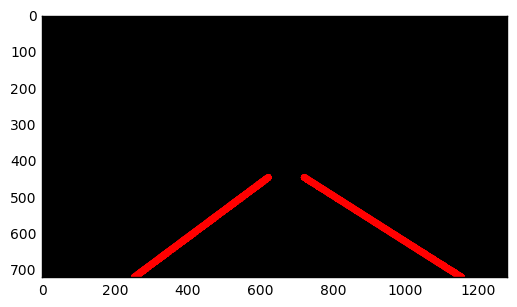

 79%|███████▉  | 199/251 [02:40<00:41,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


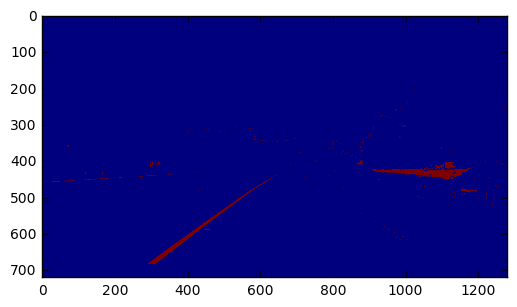

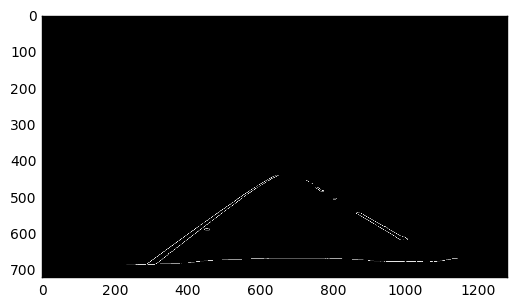

[-0.7224880382775124, 891.3540669856458]
[-0.780669144981412, 928.130111524163]
[0.578082191780822, 36.37534246575352]
[-0.6999999999999997, 888.7]
[-0.7259786476868318, 895.5338078291813]
[0.5783132530120475, 39.108433734940604]
[0.6018099547511314, 24.638009049773412]
[0.5540983606557376, 61.72131147541016]
[-0.7820069204152249, 933.4602076124569]
[0.5795918367346939, 39.56734693877545]
[-0.779816513761468, 922.0642201834861]
[0.5787965616045844, 37.32378223495713]
[-0.8679245283018872, 987.6415094339624]
[-0.7741935483870971, 926.9677419354841]
[0.5789473684210523, 33.6842105263158]
[-0.7803030303030304, 926.8939393939389]
[-0.7045454545454557, 889.6818181818189]
[-0.8057142857142849, 931.5485714285711]
[0.5769230769230769, 42.8076923076924]
[-0.8397212543554005, 976.90243902439]
[0.5532994923857864, 51.85786802030491]
[0.5833333333333381, 43.58333333332854]
middle 682
left [738, 752, 863, 800, 753, 751, 726, 763, 725, 971] right [496, 583, 641, 571, 608, 522, 616, 598, 574, 634, 48

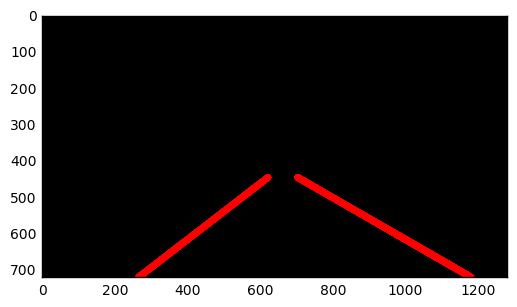

 80%|███████▉  | 200/251 [02:41<00:41,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


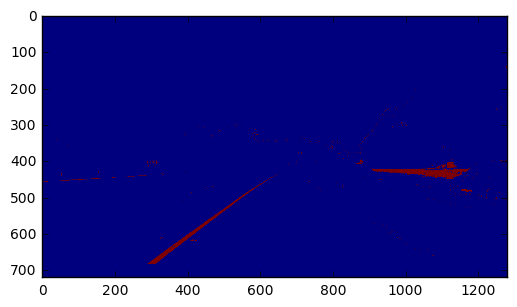

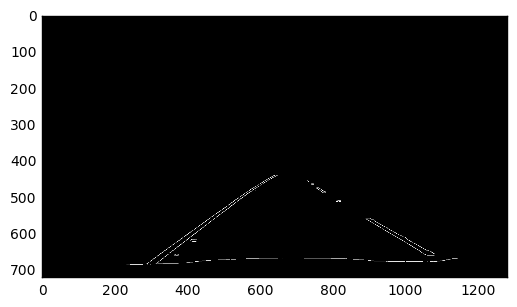

[-0.7233009708737856, 890.8640776699026]
[0.5548961424332336, 59.72997032641045]
[-0.7516129032258062, 914.7451612903224]
[-0.8082191780821919, 936.1643835616441]
[0.6482558139534883, -17.281976744186082]
[-0.5568181818181803, 799.1477272727262]
[0.6018237082066872, 22.419452887537616]
[0.6470588235294117, -18.764705882353166]
[-0.8095238095238086, 934.1428571428564]
[-0.7272727272727186, 906.9090909090874]
[-0.8671875000000002, 982.9140625000001]
[0.5549295774647882, 57.58309859154992]
[0.6956521739130447, -65.95652173913203]
[-0.623409669211196, 837.735368956743]
[-0.7000000000000005, 892.9000000000004]
[0.6761363636363634, -49.846590909090395]
[-0.5537190082644626, 843.0247933884297]
[-0.555555555555559, 865.7777777777791]
[0.6489675516224199, -16.74631268436716]
[-0.5961538461538435, 819.5576923076906]
[-0.8684210526315782, 959.1578947368417]
[0.699346405228757, -64.30718954248235]
[0.5555555555555551, 51.00000000000013]
[-0.7000000000000005, 895.0000000000006]
[-0.7235772357723583

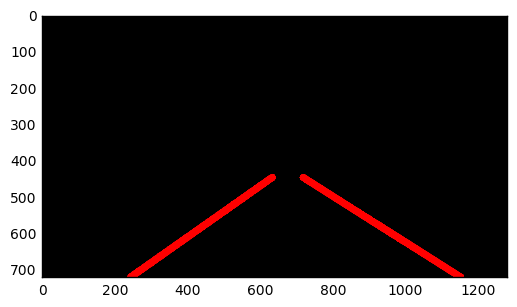

 80%|████████  | 201/251 [02:41<00:40,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


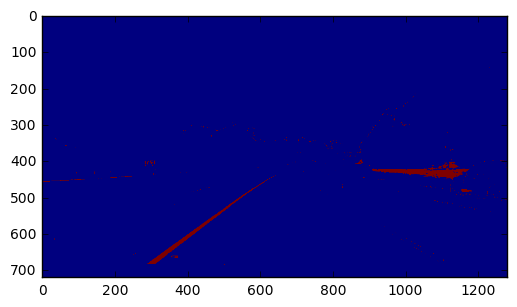

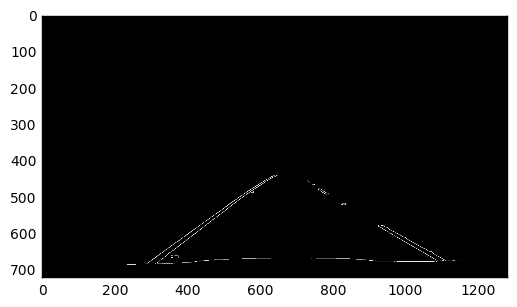

[-0.6731843575418989, 867.1061452513961]
[0.5533707865168531, 59.54494382022532]
[-0.6737804878048778, 865.2469512195121]
[-0.7264437689969595, 905.5653495440723]
[-0.7253731343283579, 901.6119402985072]
[0.6235955056179774, 1.646067415730519]
[-0.6495726495726495, 859.6239316239319]
[0.6234567901234571, -1.0987654320988158]
[0.6228813559322026, 3.1991525423734655]
[-0.5806451612903224, 818.6451612903223]
[-0.6497461928934015, 861.8527918781729]
[-0.5775401069518717, 837.0481283422465]
[-0.7264437689969598, 906.2917933130697]
[-0.727272727272727, 907.9999999999995]
[-0.6071428571428567, 851.5714285714287]
[0.6666666666666657, -43.99999999999927]
[-0.6741214057507985, 864.664536741214]
[-0.652941176470588, 869.2705882352939]
[-0.7741935483870958, 927.0322580645154]
[0.8688524590163942, -182.29508196721378]
[-0.5624999999999996, 843.9999999999997]
[0.5994550408719346, 17.99727520436013]
[0.5537974683544308, 58.66772151898682]
[-0.6238244514106586, 847.4420062695925]
[0.644736842105262, -

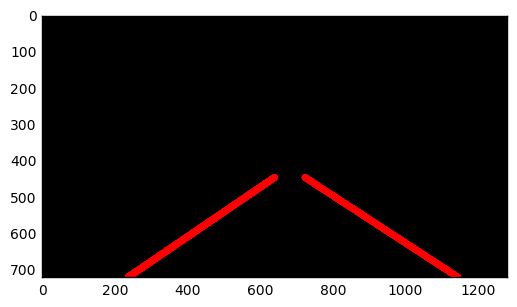

 80%|████████  | 202/251 [02:42<00:39,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


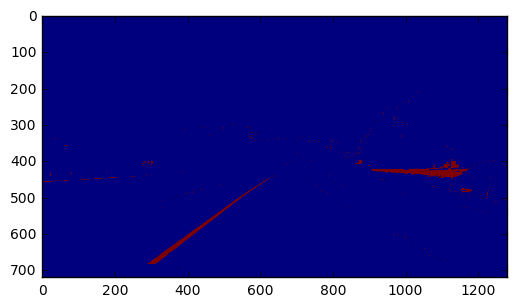

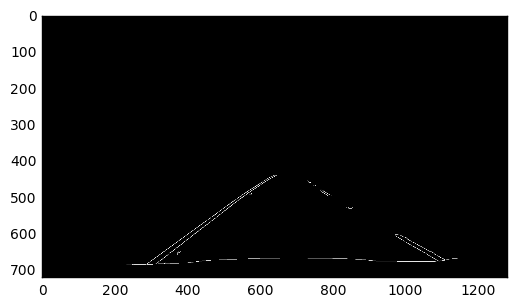

[-0.7244094488188978, 891.1811023622046]
[0.5578947368421042, 66.77894736842217]
[-0.779411764705882, 928.0882352941176]
[0.5536231884057975, 59.58550724637627]
[0.5528455284552857, 70.73983739837283]
[-0.7535714285714291, 910.3178571428573]
[-0.5652173913043486, 804.6086956521743]
[0.6440677966101693, -13.88135593220333]
[-0.8082191780821909, 935.9726027397254]
[-0.7811447811447818, 931.4040404040408]
[0.5770491803278682, 36.17704918032871]
[-0.8080808080808076, 937.8686868686866]
[-0.5999999999999744, 822.9999999999853]
[-0.6234096692111961, 841.4758269720102]
[-0.8088888888888887, 937.2266666666665]
[-0.6242038216560511, 846.044585987261]
[-0.7599999999999988, 906.7599999999991]
[-0.7003058103975534, 884.5932721712537]
[0.8125000000000046, -140.7500000000032]
[-0.8928571428571398, 992.5357142857129]
[-0.6748251748251742, 878.0244755244748]
[0.5567375886524819, 54.95035460992976]
middle 695
left [997, 763, 970, 728, 731, 748, 794] right [540, 598, 579, 615, 532, 615, 553, 565, 644, 5

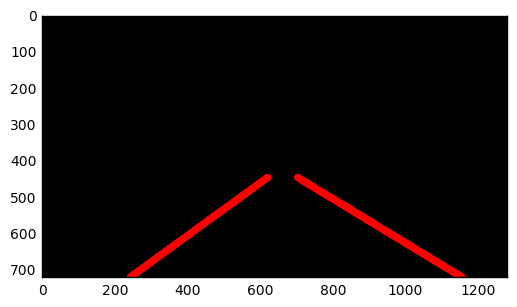

 81%|████████  | 203/251 [02:43<00:39,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


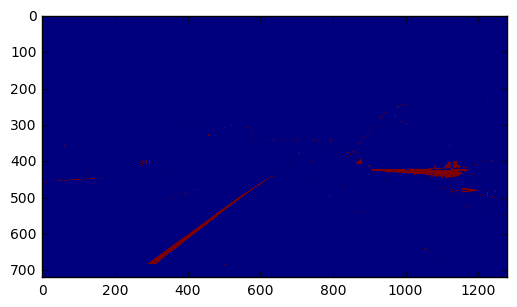

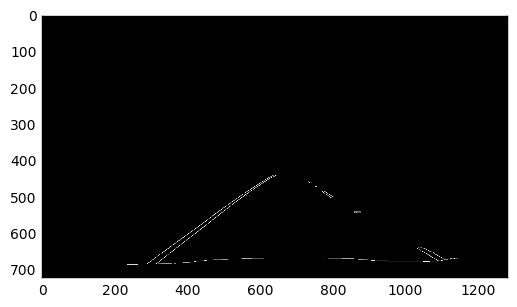

[-0.725563909774436, 891.5112781954887]
[-0.7237237237237248, 897.4984984984991]
[-0.8067632850241547, 937.5942028985509]
[-0.7247706422018345, 902.1559633027516]
[0.7006369426751584, -54.764331210190136]
[0.5779569892473123, 34.935483870967396]
[-0.6499999999999996, 870.5500000000001]
[-0.8381294964028777, 966.1258992805758]
[0.6741935483870966, -38.993548387096226]
[-0.5999999999999975, 821.3999999999983]
[-0.7027027027027012, 889.5135135135125]
[-0.6982758620689651, 884.1034482758618]
[-0.8928571428571433, 965.0714285714286]
[-0.6755555555555559, 875.0133333333335]
[0.6428571428571374, -22.14285714285103]
[-0.752321981424148, 923.7430340557272]
[-0.5789473684210562, 807.4736842105287]
[-0.6048387096774194, 838.1532258064516]
[-0.8396226415094338, 952.5188679245283]
[0.7003257328990229, -55.840390879478974]
[0.6753246753246747, -40.870129870129276]
[-0.8654970760233914, 959.0935672514619]
[-0.6245487364620943, 845.509025270758]
[-0.8651685393258447, 967.1910112359561]
[0.717391304347

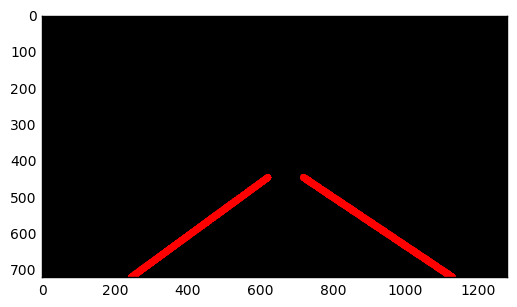

 81%|████████▏ | 204/251 [02:44<00:39,  1.20it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


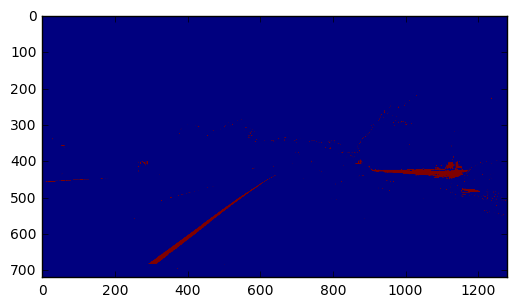

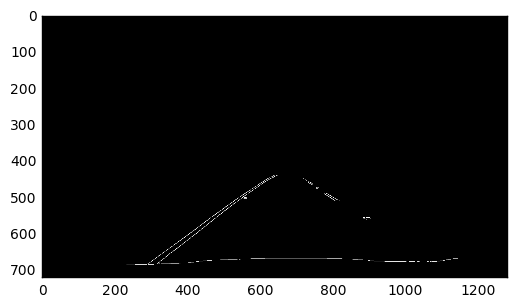

[-0.8059701492537323, 939.7910447761197]
[-0.7000000000000002, 885.9000000000002]
[-0.697604790419162, 880.3293413173653]
[-0.6994219653179193, 884.3352601156071]
[0.6250000000000002, 6.999999999999937]
[0.6748466257668713, -37.66257668711663]
[-0.6973684210526309, 878.868421052631]
[-0.6976047904191618, 886.7934131736528]
[-0.7806451612903229, 942.1741935483872]
[-0.600660066006601, 839.970297029703]
[0.6756756756756758, -35.51351351351384]
[-0.867298578199053, 969.2085308056878]
[0.5548780487804881, 60.85975609756046]
[0.7250996015936262, -79.27888446215182]
[0.6045197740112992, 15.327683615819495]
[-0.8461538461538493, 972.7692307692326]
[-0.6518987341772159, 872.3987341772157]
[0.5773480662983431, 37.185082872927715]
[-0.5546875000000002, 818.0156249999999]
[0.697368421052632, -58.565789473684575]
[-0.8703703703703711, 961.5185185185186]
[-0.6746031746031748, 873.3968253968253]
[0.7254098360655735, -80.0532786885238]
[-0.7813504823151137, 943.9710610932481]
[0.6710526315789502, -30

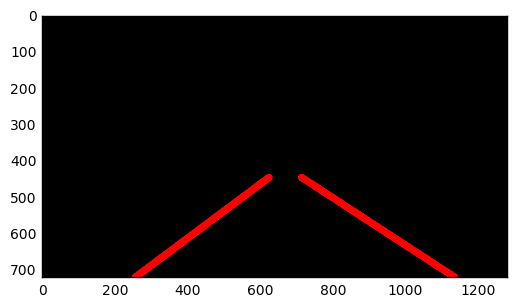

 82%|████████▏ | 205/251 [02:45<00:37,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


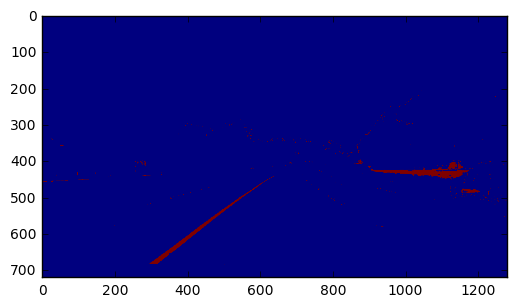

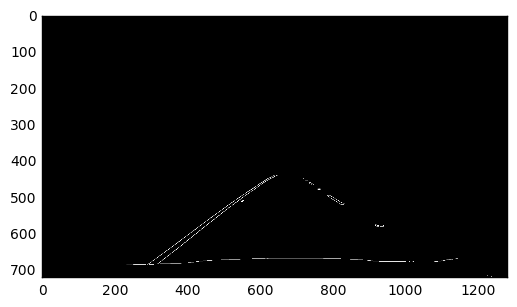

[-0.751572327044026, 915.7327044025158]
[-0.7267441860465133, 894.3430232558144]
[0.5788043478260869, 37.73641304347834]
[-0.7538940809968847, 919.214953271028]
[-0.7532051282051294, 921.2596153846158]
[0.7015384615384621, -54.40615384615421]
[-0.7245901639344264, 895.5803278688524]
[-0.7526881720430075, 923.7204301075247]
[-0.869888475836431, 987.4609665427507]
[-0.7540983606557372, 915.2786885245898]
[0.7266666666666659, -75.55333333333259]
[-0.675213675213678, 883.0683760683777]
[0.5527065527065522, 60.048433048433566]
[-0.7261904761904757, 909.1190476190471]
[-0.6740740740740736, 874.7777777777774]
[0.6666666666666651, -29.999999999998476]
[-0.7239999999999998, 891.7879999999999]
[-0.6320754716981135, 861.2830188679247]
[-0.7222222222222217, 912.2222222222223]
[-0.7006172839506177, 886.9938271604942]
[-0.764705882352934, 907.0588235294096]
[0.8999999999999985, -210.5999999999987]
[-0.8376068376068387, 956.8974358974366]
middle 653
left [733, 719, 737, 758, 720, 784] right [625, 555

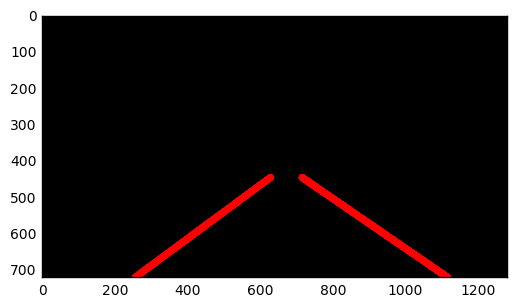

 82%|████████▏ | 206/251 [02:46<00:36,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


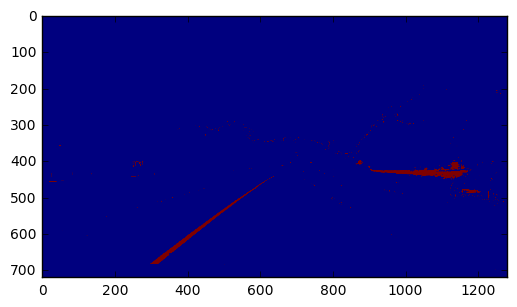

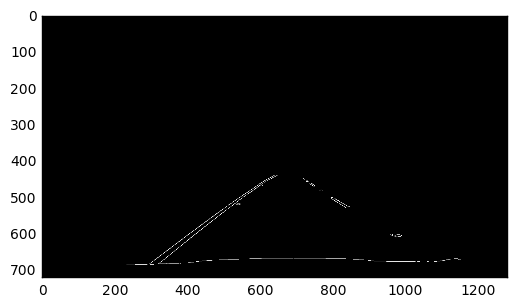

[-0.7513227513227506, 904.8888888888885]
[-0.8089430894308939, 942.0528455284554]
[-0.7240356083086052, 900.7626112759643]
[0.5988700564971753, 23.830508474576085]
[0.6501547987616096, -13.764705882352732]
[-0.8062827225130892, 933.141361256545]
[-0.6485013623978201, 851.6648501362399]
[0.6010638297872344, 18.037234042552708]
[-0.7806451612903229, 942.1741935483872]
[0.5555555555555554, 57.66666666666687]
[-0.6481481481481477, 852.8703703703701]
[-0.7807308970099666, 939.8604651162788]
[-0.7789473684210496, 934.1789473684189]
[0.599999999999985, 20.40000000001087]
[-0.8657407407407404, 971.2916666666663]
[-0.7535211267605642, 905.0422535211269]
[0.558139534883727, 51.79069767441394]
[0.7263843648208472, -74.08143322475605]
[-0.8689320388349521, 970.6165048543694]
[-0.5762711864406761, 817.5932203389818]
[0.7894736842105317, -123.94736842105709]
middle 654
left [735, 741, 717, 762, 726, 726, 727, 765] right [483, 565, 635, 500, 624, 642, 637, 630, 628, 549, 438, 537, 565]
(8, 2)
-5.0085

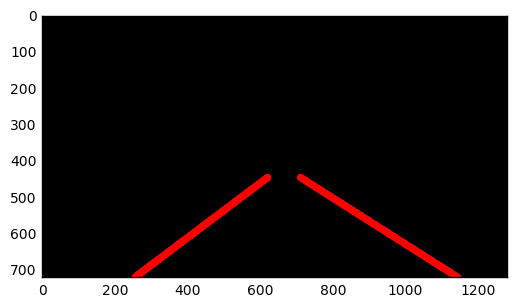

 82%|████████▏ | 207/251 [02:46<00:35,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


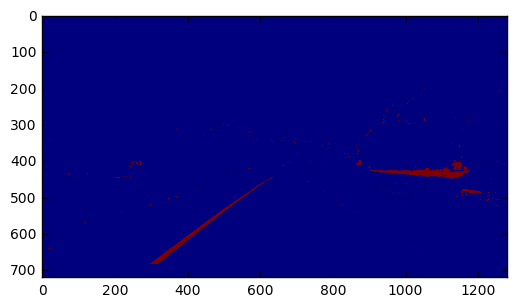

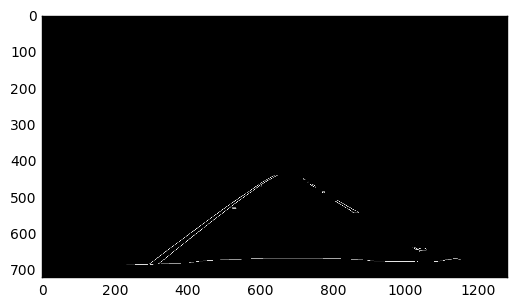

[-0.8059071729957809, 939.4725738396628]
[-0.7499999999999999, 904.4999999999999]
[-0.7248520710059166, 901.7307692307689]
[0.5516224188790559, 61.80235988200586]
[-0.8953488372093017, 978.4651162790686]
[0.6007194244604321, 27.02158273381275]
[-0.7248520710059176, 903.1804733727813]
[-0.647382920110193, 850.4352617079891]
[-0.7805907172995777, 924.4219409282698]
[-0.7499999999999971, 903.7499999999982]
[0.6000000000000004, 23.799999999999784]
[-0.8351648351648358, 951.8021978021985]
[-0.8977272727272729, 980.2500000000002]
[0.5775401069518715, 37.55080213903744]
[-0.7000000000000017, 892.9000000000013]
[0.5541561712846343, 53.11586901763266]
[-0.7539432176656147, 924.2618296529965]
[-0.5789473684210521, 812.9473684210526]
[0.6000000000000001, 27.399999999999835]
[-0.6071428571428588, 827.5357142857151]
[0.5785440613026828, 46.54406130268099]
[-0.8663101604278082, 965.4171122994655]
[0.5549597855227882, 55.99463806970536]
[0.7812499999999993, -113.62499999999949]
[0.6504297994269338, -

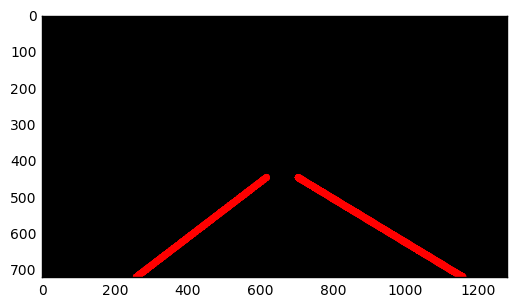

 83%|████████▎ | 208/251 [02:47<00:34,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


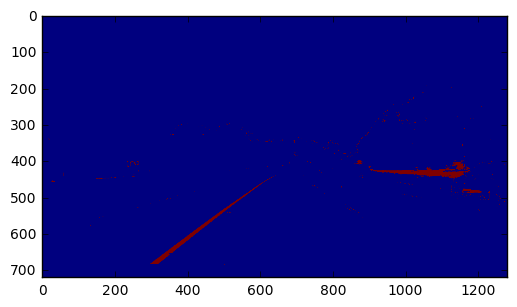

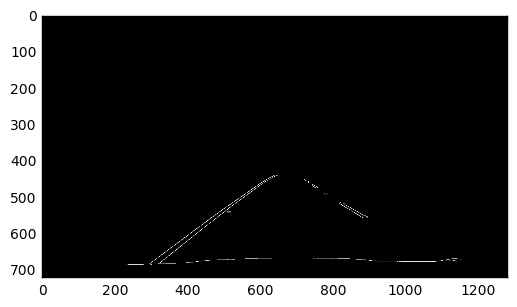

[-0.7789115646258498, 929.3571428571427]
[-0.7000000000000002, 887.0]
[-0.7260869565217397, 895.6782608695652]
[0.5768194070080865, 38.92183288409679]
[0.5551601423487541, 64.43416370106831]
[-0.7563636363636362, 922.56]
[0.7252396166134181, -71.44728434504727]
[0.622905027932961, 1.3938547486032624]
[-0.6015037593984967, 856.6315789473683]
[0.7523364485981306, -103.1728971962612]
[0.5994236311239195, 23.827089337175646]
[-0.8968609865470842, 993.210762331838]
[-0.8690476190476194, 981.8214285714288]
[-0.8313253012048216, 957.3253012048206]
[0.7252252252252253, -82.31081081081112]
[0.5785340314136126, 35.45549738219901]
[0.5781990521327011, 48.07582938388695]
[-0.7534883720930231, 919.2186046511625]
[-0.675977653631285, 870.5977653631287]
[-0.8704453441295535, 981.4331983805664]
[-0.8593750000000026, 970.8281250000015]
[0.6227272727272732, 0.34090909090834814]
[-0.6009852216748767, 828.0344827586208]
middle 687
left [730, 817, 719, 725, 823, 741, 825, 720, 875, 865] right [609, 620, 57

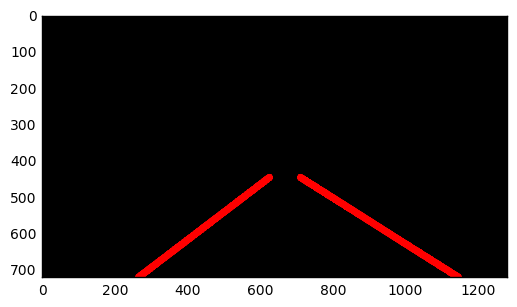

 83%|████████▎ | 209/251 [02:48<00:33,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


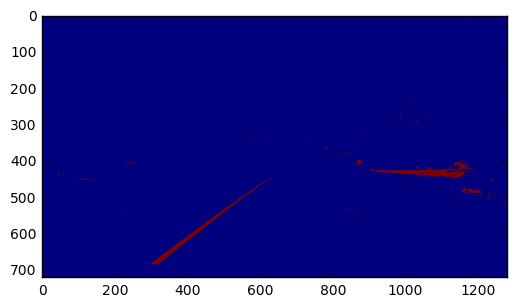

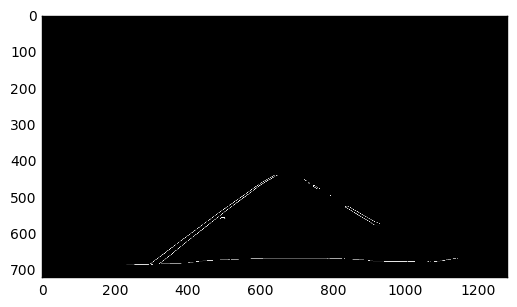

[-0.8069498069498073, 943.0308880308883]
[-0.7248062015503878, 895.1937984496121]
[0.6495726495726494, -17.692307692308002]
[-0.7248520710059173, 902.4556213017755]
[0.6502890173410403, -15.858381502890207]
[-0.8026315789473687, 924.9868421052631]
[-0.8181818181818222, 927.818181818183]
[-0.8589743589743599, 970.7435897435903]
[0.6969696969696952, -57.99999999999837]
[-0.6041666666666596, 824.8541666666622]
[-0.7260273972602749, 896.2739726027401]
[-0.7500000000000019, 917.2500000000011]
[-0.6757990867579902, 879.6301369863007]
[-0.7524752475247527, 920.2772277227726]
[-0.6763005780346822, 883.5375722543351]
[0.5641025641025667, 46.15384615384418]
[-0.7270029673590503, 904.5548961424329]
[0.550000000000003, 61.94999999999753]
middle 638
left [720, 721, 792, 723, 751] right [580, 548, 375, 331, 562, 637, 583, 487, 507, 617, 471]
(5, 2)
3.31063139173 0.622186785597
SLOPE
907.59967058 -0.745119340077
ave 711 446
SLOPE
ave 619 446
x2 1151 251


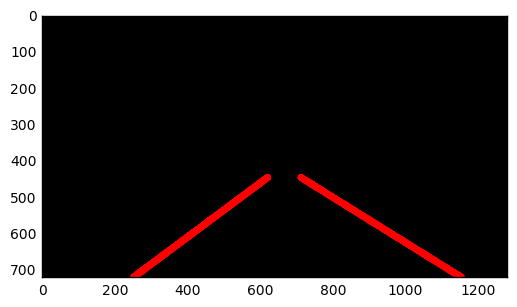

 84%|████████▎ | 210/251 [02:49<00:32,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


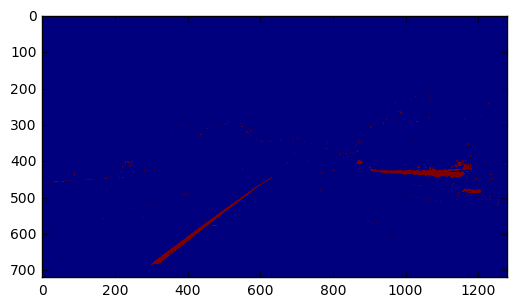

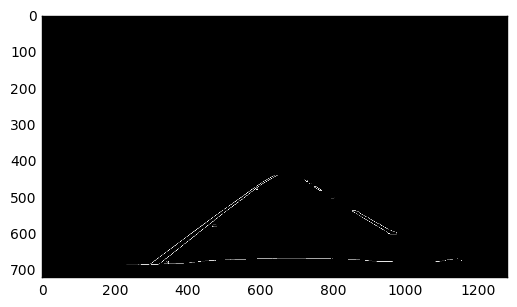

[-0.7800000000000009, 933.0400000000004]
[-0.7236842105263159, 895.5921052631578]
[0.6239067055393585, 6.052478134111142]
[0.6010781671159028, 19.021563342318338]
[-0.7005813953488376, 890.2703488372097]
[-0.8087248322147645, 954.7315436241608]
[-0.839285714285714, 970.8749999999995]
[-0.733333333333337, 902.6000000000023]
[0.6250000000000004, 6.124999999999386]
[0.6473988439306355, -17.30635838150283]
[-0.8099999999999999, 962.4499999999998]
[-0.8099999999999999, 956.7799999999996]
[0.6966292134831463, -67.39325842696599]
[-0.725118483412322, 895.2843601895738]
[-0.7280966767371606, 902.7009063444108]
[-0.749999999999993, 911.9999999999957]
[-0.7517730496453895, 938.6028368794322]
[-0.6732026143790847, 876.8627450980389]
[0.6011235955056171, 21.775280898877217]
[-0.5599999999999986, 837.2799999999993]
[-0.749999999999996, 923.4999999999983]
[0.8089171974522309, -165.70063694267682]
[-0.7547169811320756, 926.2830188679244]
[0.5777202072538861, 34.46373056994811]
[-0.7828571428571433, 9

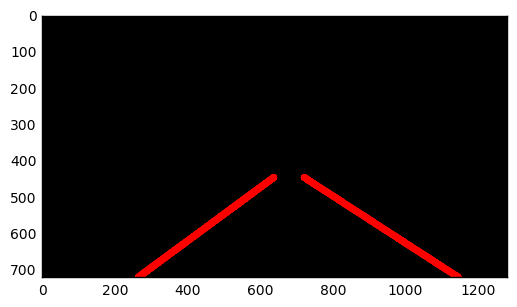

 84%|████████▍ | 211/251 [02:50<00:32,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


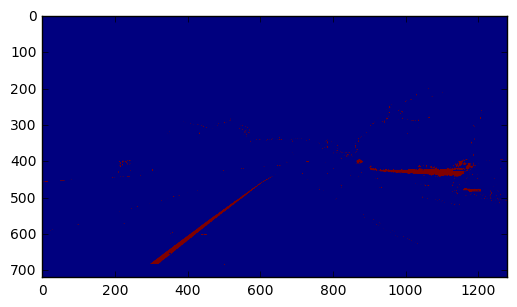

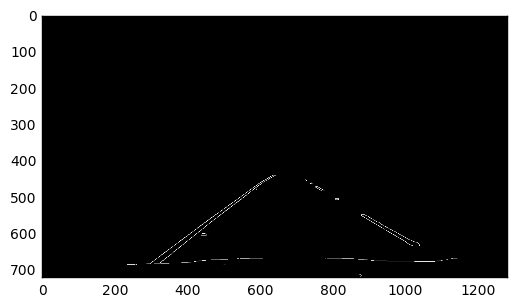

[-0.7484662576687122, 903.7975460122702]
[-0.808, 943.8000000000004]
[0.5770234986945172, 35.3890339425588]
[-0.6721763085399449, 866.1597796143247]
[0.6009615384615379, 23.95673076923161]
[-0.648936170212766, 856.6170212765957]
[-0.6468749999999999, 857.3625000000001]
[0.5765027322404369, 37.11748633879775]
[-0.6250000000000003, 848.3750000000001]
[0.5994065281899118, 22.845697329375646]
[-0.5844155844155826, 814.8571428571416]
[-0.7313432835820862, 914.1044776119388]
[-0.7051282051282075, 903.0000000000013]
[0.5760368663594474, 45.391705069123915]
[-0.5660377358490599, 814.01886792453]
[0.6249999999999998, 1.000000000000008]
[0.602150537634409, 16.24731182795701]
[0.5561797752808989, 227.23033707865181]
[0.649056603773585, -24.33207547169801]
[-0.8366013071895431, 954.6209150326803]
[-0.8379446640316203, 959.3596837944659]
[-0.8090277777777777, 948.1701388888883]
[-0.6014492753623176, 868.2463768115939]
[0.5994397759103635, 17.014005602241713]
[-0.6000000000000001, 824.6]
[-0.6476190

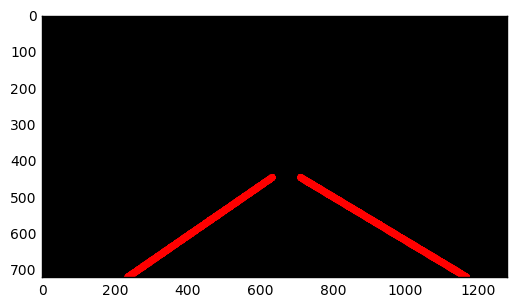

 84%|████████▍ | 212/251 [02:50<00:31,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


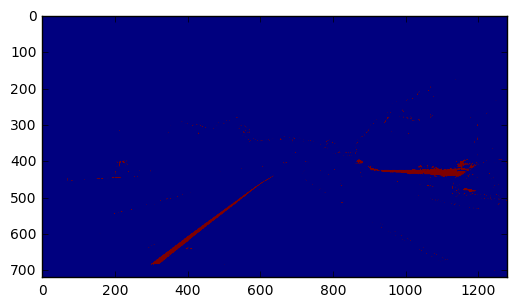

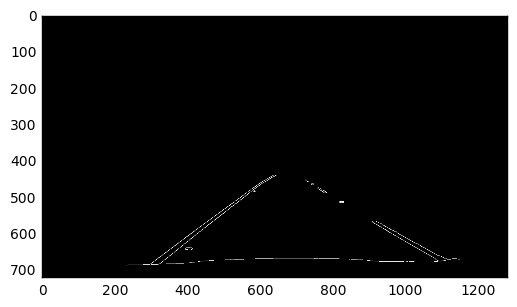

[-0.7799352750809074, 933.0194174757283]
[-0.7537878787878787, 910.3825757575756]
[0.6000000000000003, 21.999999999999975]
[0.6239554317548748, 1.2562674094710637]
[-0.7717391304347828, 914.2934782608695]
[-0.8380952380952377, 942.2952380952378]
[-0.7803278688524585, 932.3639344262291]
[-0.561643835616439, 801.1369863013705]
[-0.777070063694267, 918.8980891719744]
[-0.6511627906976712, 889.4651162790688]
[-0.7804878048780489, 927.7317073170736]
[-0.5529411764705888, 858.0705882352945]
[-0.7781954887218043, 924.684210526316]
[0.6720647773279347, -41.10931174089006]
[-0.8666666666666675, 961.4666666666666]
[-0.7524115755627006, 913.733118971061]
[-0.7313432835820876, 916.1044776119395]
[0.6956521739130428, -69.13043478260778]
[-0.8675213675213674, 989.2735042735042]
[-0.7857142857142843, 940.0714285714274]
[-0.8095238095238008, 925.7142857142826]
[0.7222222222222218, -109.61111111111082]
[0.6250000000000014, 3.874999999998081]
[-0.7813504823151118, 935.376205787781]
[0.676829268292683, -

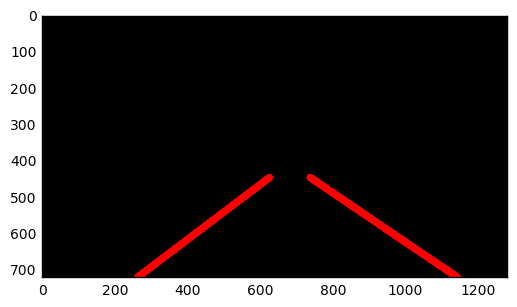

 85%|████████▍ | 213/251 [02:51<00:30,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


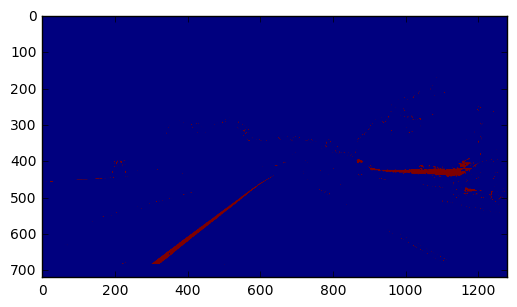

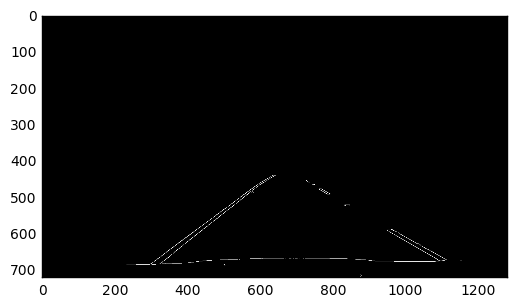

[-0.750915750915751, 908.2747252747251]
[-0.7820512820512824, 935.0384615384618]
[0.5992647058823528, 22.360294117647303]
[0.576470588235294, 35.48235294117691]
[0.5696202531645584, 39.72151898734045]
[-0.7481481481481491, 908.1407407407414]
[-0.7810457516339874, 932.3725490196078]
[0.5984848484848478, 12.674242424242719]
[0.6016483516483516, 18.60164835164868]
[-0.7813504823151118, 935.376205787781]
[-0.840989399293287, 975.6643109540639]
[0.622222222222221, -12.933333333331866]
[-0.7647058823529379, 913.1176470588218]
[-0.7539936102236414, 919.9999999999997]
[0.6028368794326241, 9.67375886524819]
[-0.7894736842105253, 920.7368421052628]
[-0.7531914893617024, 922.0425531914899]
[-0.8076923076923184, 927.8846153846193]
[-0.7755102040816358, 915.1020408163278]
[0.5782608695652174, 35.18260869565221]
[0.7031250000000023, -100.14062500000296]
[0.590909090909087, 20.5454545454584]
[-0.7499999999999979, 918.2499999999987]
[-0.8461538461538453, 973.6923076923072]
[-0.8636363636363633, 980.09

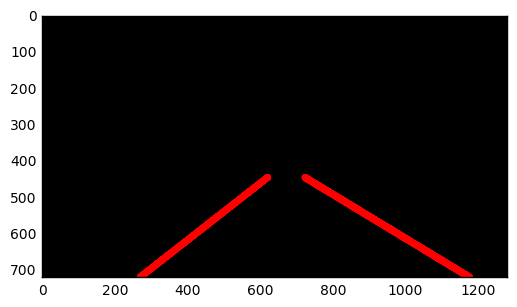

 85%|████████▌ | 214/251 [02:52<00:29,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


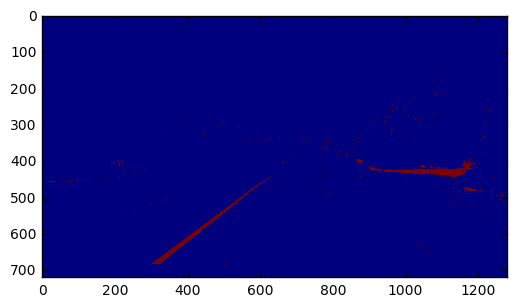

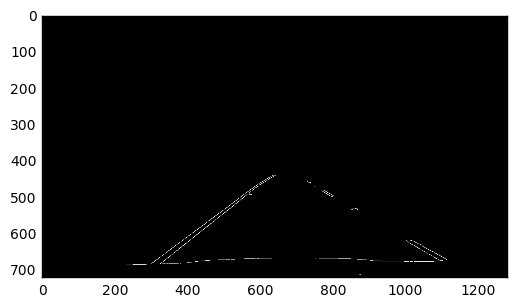

[-0.7483443708609259, 907.0066225165552]
[-0.8071748878923762, 946.6053811659184]
[-0.7499999999999994, 908.9999999999995]
[0.5994475138121541, 19.60220994475203]
[0.599455040871935, 18.596730245231768]
[0.6005830903790089, 21.364431486880125]
[0.6474358974358975, -27.737179487179755]
[-0.7564102564102559, 927.1794871794868]
[-0.8060606060606073, 946.9515151515157]
[-0.624365482233503, 840.2182741116753]
[-0.7803030303030298, 921.2121212121208]
[-0.8364485981308404, 956.5934579439248]
[-0.8921568627450994, 981.9215686274518]
[0.7532467532467504, -137.50649350649027]
[-0.8996282527881037, 1010.3643122676576]
[-0.8968253968253992, 974.8492063492079]
[-0.7517730496453905, 909.2907801418438]
[0.6008403361344534, 14.277310924370132]
[-0.7499999999999878, 909.9999999999926]
middle 691
left [728, 728, 747, 863, 1003, 860] right [449, 614, 596, 574, 619, 641, 436, 565, 520, 634, 457, 587, 604]
(6, 2)
-15.2338317321 0.633501438647
SLOPE
933.937902051 -0.792268522607
ave 728 446
SLOPE
ave 615 44

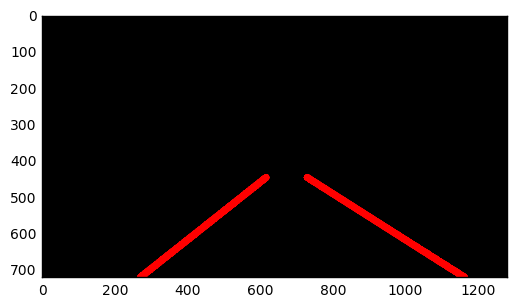

 86%|████████▌ | 215/251 [02:53<00:28,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


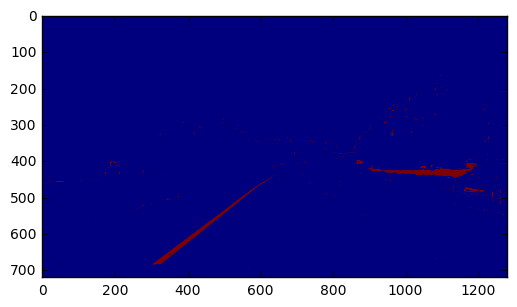

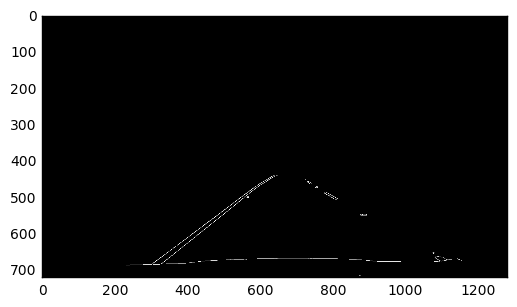

[-0.8085106382978718, 948.8085106382975]
[-0.750877192982456, 910.2631578947368]
[0.6489028213166143, -19.570532915360612]
[0.5555555555555552, 57.33333333333373]
[-0.7515723270440258, 920.9937106918239]
[-0.8093525179856107, 947.8489208633089]
[-0.7802197802197793, 927.6483516483512]
[0.5949367088607573, 21.101265822786754]
[-0.8996282527881031, 1011.3643122676576]
[0.6005361930294905, 17.211796246649016]
[0.6727828746177374, -32.458715596330656]
[0.6111111111111103, -5.3333333333323045]
[-0.8090452261306526, 940.6582914572862]
[-0.6243902439024389, 861.0780487804875]
[-0.6276595744680835, 852.627659574467]
[0.5759312320916903, 41.47564469914057]
[-0.7511961722488036, 911.966507177033]
[0.6500000000000007, -16.85000000000092]
[-0.7785714285714272, 923.2428571428565]
[0.6703296703296708, -37.208791208791624]
[-0.7866666666666702, 945.4666666666695]
[-0.7554179566563469, 920.6904024767802]
[-0.6525096525096535, 866.3976833976841]
middle 683
left [756, 750, 810, 724, 729, 1074, 751, 729,

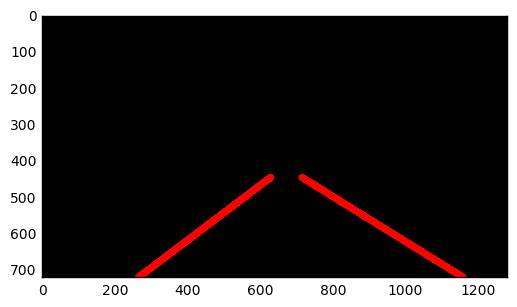

 86%|████████▌ | 216/251 [02:54<00:27,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


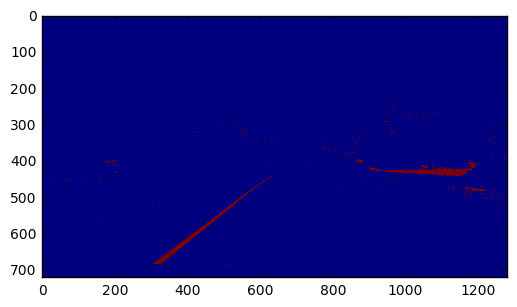

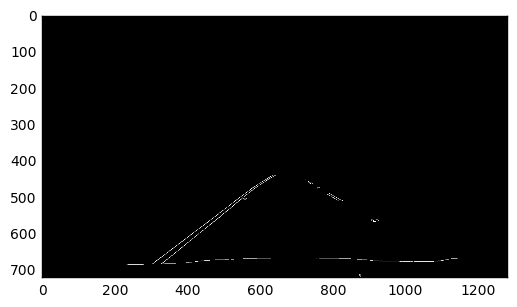

[-0.8082191780821916, 948.0958904109589]
[-0.7525423728813557, 910.5152542372882]
[-0.8083623693379789, 947.3344947735193]
[0.5999999999999995, 21.00000000000053]
[-0.7517730496453888, 908.7801418439708]
[0.5775401069518714, 34.81818181818177]
[0.6245487364620936, -4.509025270757789]
[-0.8385964912280706, 968.8]
[0.5999999999999996, 20.40000000000022]
[-0.8397212543554007, 976.7421602787457]
[0.5555555555555554, 57.5555555555559]
[-0.8382352941176446, 972.05882352941]
[-0.8695652173913044, 995.0434782608695]
[0.5534759358288761, 53.874331550803035]
[0.5572916666666664, 49.06250000000037]
[-0.7797202797202794, 927.2727272727268]
[0.6726190476190476, -53.79166666666686]
[0.5547073791348603, 50.39185750636098]
[-0.7812500000000006, 928.53125]
[-0.868852459016394, 984.6065573770494]
[-0.6996047430830035, 895.6798418972331]
middle 687
left [735, 731, 811, 731, 782, 741, 732, 917, 724] right [620, 596, 614, 581, 627, 638, 624, 636, 598, 601, 613, 557]
(9, 2)
25.4224149437 0.588415380913
SLOP

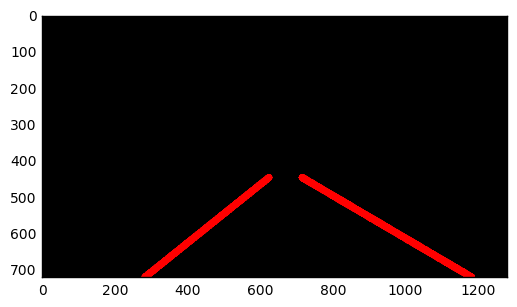

 86%|████████▋ | 217/251 [02:54<00:27,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


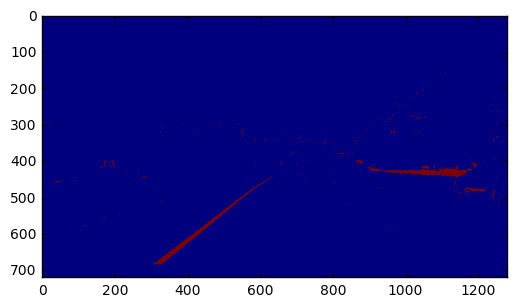

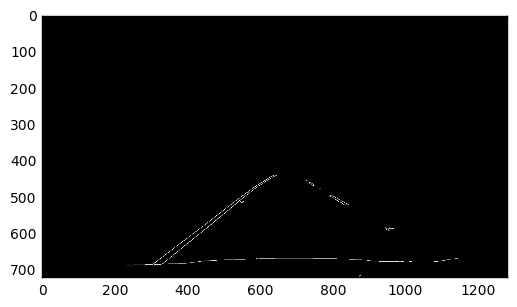

[-0.8088737201365177, 950.1194539249142]
[-0.750877192982456, 909.5122807017543]
[-0.7524752475247515, 912.9999999999998]
[0.6231884057971007, 4.579710144928805]
[-0.8074324324324328, 950.2601351351352]
[0.5774278215223095, 34.7874015748036]
[-0.6758241758241749, 875.2307692307685]
[0.5768194070080868, 36.61455525606402]
[0.8034188034187999, -173.6239316239278]
[0.6502890173410406, -19.109826589595496]
[-0.8988764044943813, 1014.6853932584263]
[-0.6991404011461316, 888.449856733524]
[0.5552407932011332, 229.71954674220942]
[0.6470588235294119, -23.411764705882817]
[0.5784753363228707, 37.97757847533585]
[-0.8995983935742974, 1007.7550200803215]
[-0.7534246575342463, 911.7808219178078]
[-0.7499999999999986, 908.249999999999]
[-0.8686131386861319, 993.9635036496354]
[-0.7570093457943944, 921.8598130841134]
[-0.6024096385542165, 1025.6265060240958]
middle 688
left [734, 726, 734, 943, 726, 829, 733] right [622, 584, 606, 627, 644, 636, 640, 610, 593, 571, 632, 622]
(7, 2)
-14.5980396383 0

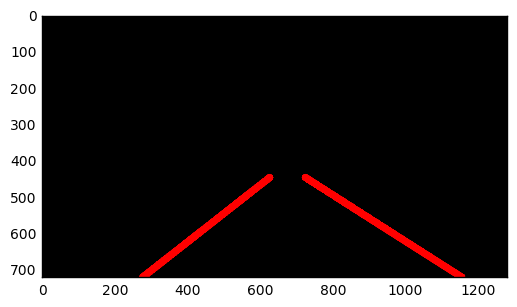

 87%|████████▋ | 218/251 [02:55<00:26,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


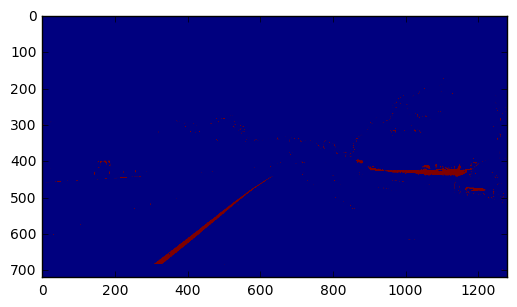

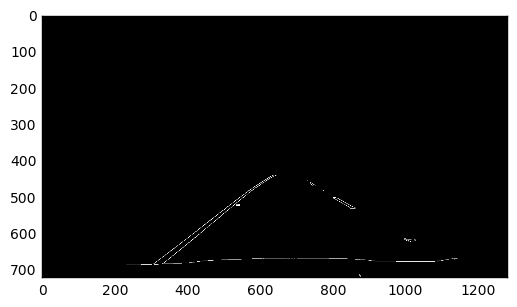

[-0.7787610619469025, 923.3274336283183]
[-0.8365758754863805, 961.4357976653693]
[0.5540897097625325, 53.189973614776314]
[-0.5588235294117648, 798.2058823529412]
[0.5781818181818175, 37.45818181818258]
[0.5753012048192773, 42.31927710843349]
[-0.7785016286644946, 930.2280130293159]
[-0.7575757575757511, 912.9393939393901]
[-0.7802547770700643, 933.9012738853504]
[-0.6690140845070421, 1299.380281690141]
[-0.6496350364963497, 880.8394160583937]
[-0.7268722466960349, 911.0572687224667]
[-0.899193548387097, 999.516129032258]
[-0.7799999999999998, 924.6]
[-0.7249999999999983, 910.7749999999987]
[-0.6490066225165545, 1279.2847682119186]
[0.5539568345323748, 54.287769784172106]
[-0.6060606060606047, 865.3636363636357]
[-0.6734693877551026, 889.4081632653064]
[-0.7563025210084043, 921.2016806722694]
[-0.5763888888888887, 850.9999999999995]
[-0.5564516129032271, 846.9274193548395]
[-0.625806451612905, 1258.4516129032274]
[-0.5562913907284763, 793.2450331125823]
[-0.7268722466960355, 912.51101

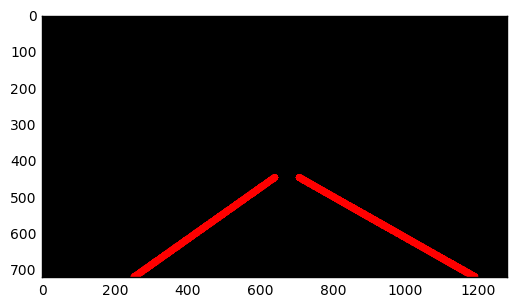

 87%|████████▋ | 219/251 [02:56<00:26,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


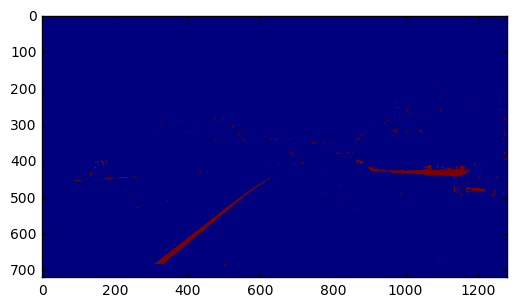

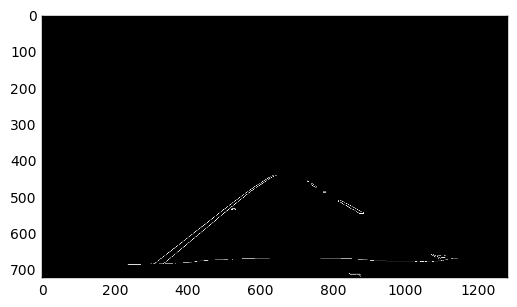

[-0.7782101167315171, 923.4669260700388]
[-0.8365019011406845, 962.5741444866918]
[0.5774647887323937, 39.943661971831965]
[0.5522788203753354, 57.41823056300259]
[0.5771276595744682, 35.27393617021289]
[-0.5555555555555535, 796.6666666666656]
[-0.8250000000000003, 958.0250000000002]
[0.6228813559322032, -5.186440677965716]
[-0.5686274509803934, 806.4313725490204]
[0.5547445255474461, 60.547445255473576]
[-0.8400000000000012, 944.2400000000002]
[0.6483050847457623, -26.11440677966065]
[0.6153846153846279, -1.0772090340537644e-11]
[-0.8666666666666671, 974.866666666667]
[0.6428571428571411, -32.49999999999821]
[-0.7999999999999987, 929.3999999999993]
[-0.5555555555555529, 792.2222222222207]
[-0.7567567567567499, 912.4594594594557]
[0.6754966887417222, 136.17880794701975]
[0.5552560646900266, 55.66576819407042]
[-0.7264437689969618, 903.3860182370827]
[-0.6991404011461326, 889.5472779369633]
[0.698689956331878, -66.70742358078616]
middle 682
left [743, 738, 729, 856, 812, 847, 871, 1071,

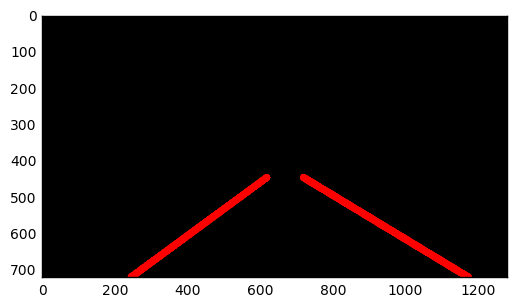

 88%|████████▊ | 220/251 [02:57<00:25,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


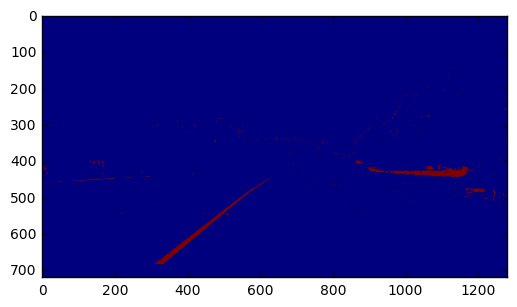

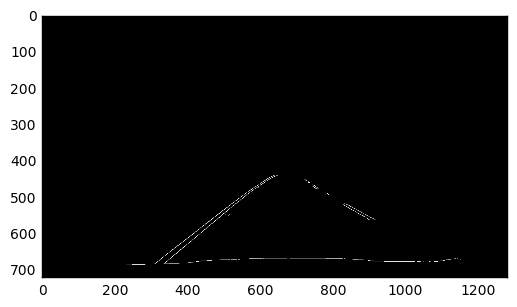

[-0.8083623693379788, 948.334494773519]
[-0.8101694915254234, 952.1661016949145]
[-0.7800829875518676, 924.265560165975]
[0.5525606469002696, 56.99999999999938]
[-0.781725888324874, 937.9593908629448]
[0.6504065040650405, -21.837398373983156]
[-0.7808764940239045, 925.2908366533867]
[0.5502958579881648, 61.13017751479365]
[-0.7267441860465138, 910.2034883720947]
[0.5523255813953487, 57.7267441860466]
[-0.7806451612903227, 943.5161290322579]
[0.7533333333333332, -92.15333333333281]
[0.6493055555555556, -20.00347222222185]
[-0.8181818181818175, 949.1818181818176]
[0.7266881028938907, -73.6688102893896]
[0.5641025641025673, 51.74358974358701]
[-0.8095238095237981, 941.7619047618984]
[0.783251231527093, -133.66502463054078]
[0.7083333333333339, -61.500000000000334]
[-0.8100358422939067, 948.0716845878133]
[0.6498516320474779, -18.64094955489647]
[-0.8134328358208939, 958.9701492537299]
[-0.799999999999984, 949.3999999999938]
[-0.756880733944953, 928.4311926605495]
middle 674
left [742, 830

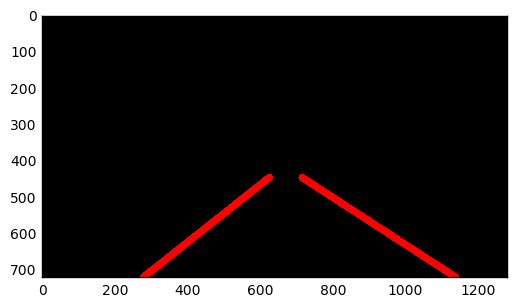

 88%|████████▊ | 221/251 [02:58<00:24,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


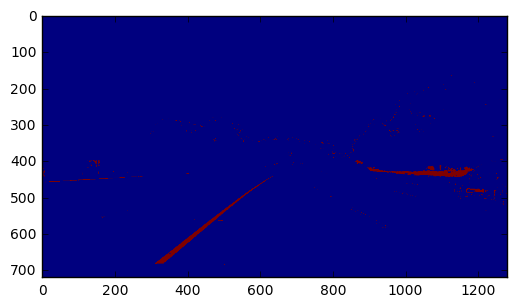

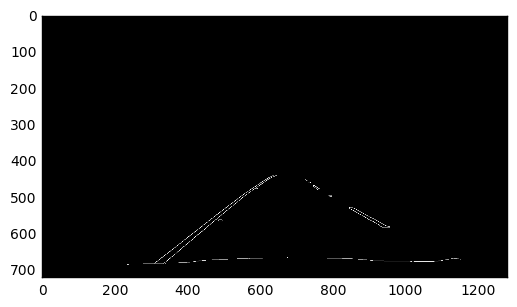

[-0.8358778625954199, 961.1832061068707]
[-0.7805907172995777, 923.2025316455696]
[-0.8359374999999993, 960.2031249999993]
[0.5540897097625337, 55.40633245382497]
[0.5994152046783632, 25.035087719297795]
[-0.7777777777777783, 921.0000000000003]
[-0.57746478873239, 810.1126760563351]
[0.6239554317548748, 0.8802228412253891]
[0.6462882096069866, -21.344978165938308]
[0.5641025641025674, 45.41025641025317]
[0.5549450549450555, 57.12087912087823]
[-0.5789473684210535, 806.5789473684215]
[-0.5681818181818173, 809.2499999999997]
[0.5555555555555561, 55.11111111111053]
[-0.7894736842105314, 929.1052631578973]
[-0.5882352941176499, 812.9411764705901]
[0.7525773195876299, -95.14432989690835]
[-0.8075601374570444, 952.8006872852233]
[0.6499999999999964, -24.099999999996754]
[0.7499999999999939, -106.49999999999469]
[-0.8676470588235282, 970.1911764705874]
[0.6211180124223598, 4.720496894410541]
middle 687
left [732, 744, 723, 850, 914, 744, 745, 735, 914, 846, 733] right [596, 546, 590, 504, 634

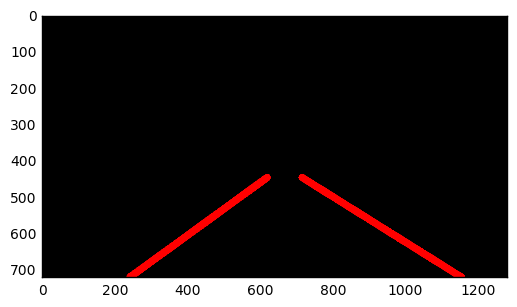

 88%|████████▊ | 222/251 [02:58<00:23,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


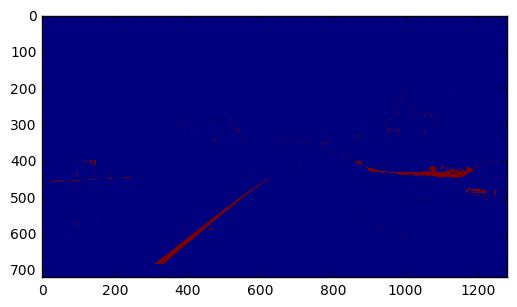

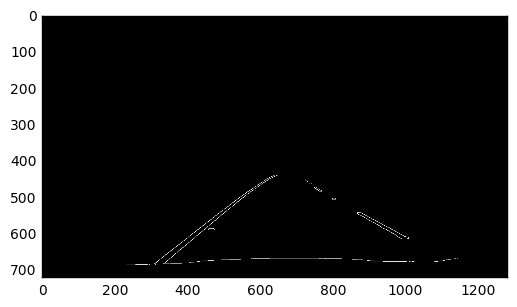

[-0.8365019011406849, 961.7186311787074]
[-0.7783783783783781, 921.4054054054051]
[0.578512396694215, 42.272727272727074]
[0.5531914893617016, 57.40425531914959]
[-0.648648648648649, 855.594594594595]
[0.5543766578249336, 55.53315649867358]
[-0.5862068965517224, 820.2758620689647]
[0.5762711864406775, 46.1355932203394]
[-0.8406374501992038, 962.772908366534]
[-0.7536231884057982, 913.9710144927544]
[-0.8076923076923079, 937.1153846153846]
[0.5551181102362202, 59.32677165354364]
[0.5547073791348601, 51.39185750636123]
[-0.8064516129032258, 935.8064516129031]
[-0.8100000000000006, 961.6400000000003]
[0.5992509363295883, 19.943820224718998]
[0.5994623655913979, 17.98924731182785]
[-0.7916666666666721, 930.2083333333363]
[-0.8571428571428519, 948.5714285714263]
[-0.702422145328719, 892.6193771626291]
[0.5778688524590162, 41.754098360655924]
middle 647
left [748, 735, 735, 798, 747, 724, 726, 724, 748] right [595, 490, 633, 589, 585, 613, 509, 497, 644, 551, 332, 586]
(9, 2)
43.5279474853 0

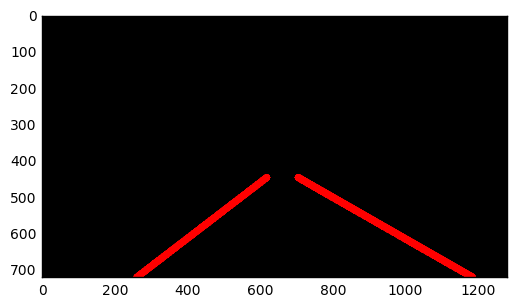

 89%|████████▉ | 223/251 [02:59<00:22,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


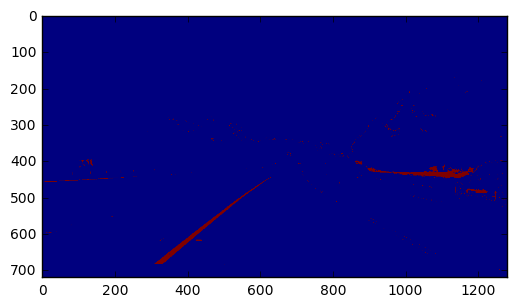

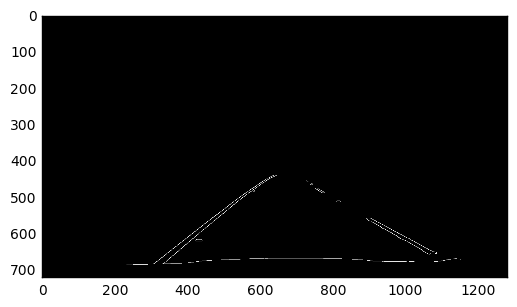

[-0.7000000000000002, 885.9000000000002]
[-0.8358778625954201, 960.5114503816797]
[-0.7791666666666663, 922.4249999999995]
[-0.7792792792792794, 921.6801801801803]
[-0.7802197802197796, 926.6483516483513]
[0.5550000000000013, 66.71999999999828]
[0.8093525179856111, -133.7805755395682]
[-0.5789473684210529, 808.0526315789477]
[0.601648351648352, 19.60164835164821]
[-0.8391608391608387, 976.7062937062933]
[-0.8093645484949825, 959.802675585284]
[-0.8976744186046511, 989.1069767441862]
[-0.8690909090909097, 988.9200000000004]
[0.6944444444444419, -50.19444444444224]
[-0.8181818181817979, 946.5454545454429]
[-0.8681818181818176, 973.1818181818177]
[-0.559999999999999, 795.3599999999996]
[-0.8695652173913039, 992.4347826086953]
[-0.6738197424892707, 1063.858369098713]
middle 692
left [896, 725, 727, 739] right [637, 594, 546, 527, 584, 634, 636, 641, 556, 627, 569, 560, 631, 633]
(4, 2)
-24.4133429081 0.66511132852
SLOPE
931.948258226 -0.784622180449
ave 707 446
SLOPE
ave 619 446
x2 1119 27

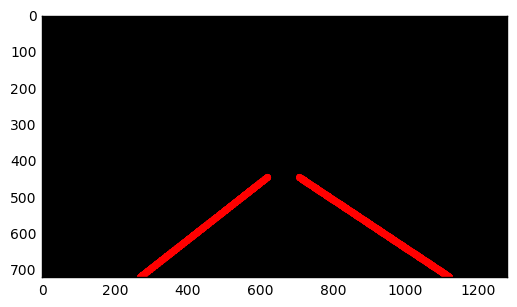

 89%|████████▉ | 224/251 [03:00<00:21,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


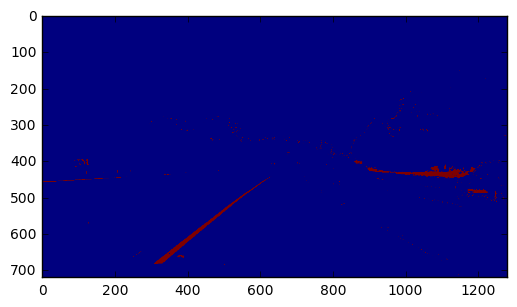

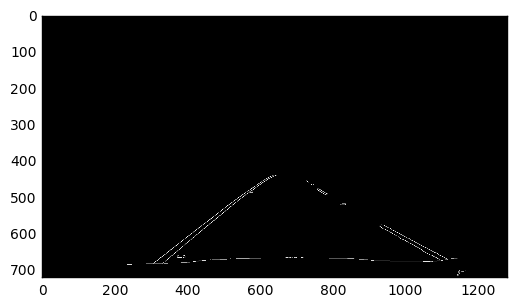

[-0.7526132404181178, 909.5365853658533]
[-0.8075601374570451, 946.2646048109967]
[0.5531914893617017, 67.38297872340469]
[-0.6485013623978202, 853.2588555858306]
[-0.6480263157894732, 861.5592105263154]
[-0.6257861635220123, 846.0786163522013]
[0.6239316239316247, 3.4017094017086267]
[-0.7534246575342467, 911.3287671232879]
[-0.6731301939058172, 871.130193905817]
[-0.5652173913043522, 814.9565217391327]
[-0.7253731343283577, 906.414925373134]
[-0.8095238095238088, 948.5238095238092]
[-0.7030303030303025, 896.4242424242422]
[0.5530864197530859, 60.86666666666743]
[0.5771604938271606, 45.72839506172838]
[-0.8404255319148937, 975.1489361702128]
[-0.7302631578947381, 910.1118421052637]
[0.6732673267326731, -35.79207920792059]
[-0.5625000000000058, 796.6250000000038]
[0.6206896551724139, 8.310344827586198]
[-0.6056338028168985, 846.9436619718293]
[0.7564102564102595, -147.97435897436233]
[0.623853211009175, -0.6880733944962558]
middle 698
left [820, 727, 756, 820, 726, 739, 1010, 926] righ

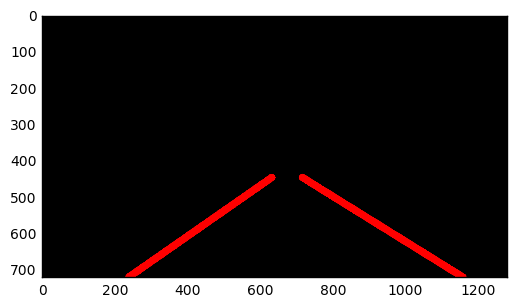

 90%|████████▉ | 225/251 [03:01<00:20,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


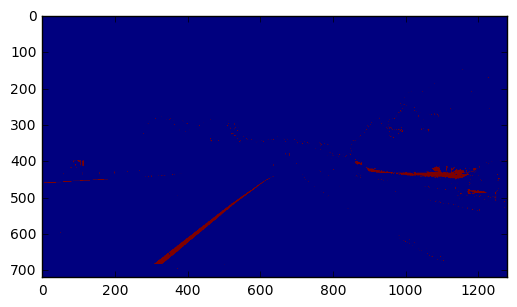

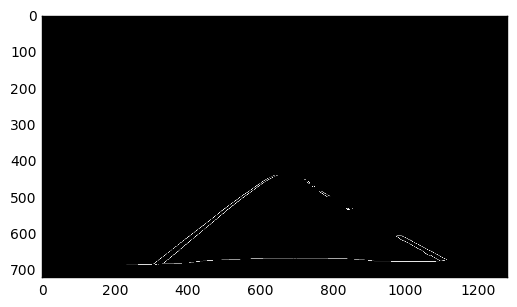

[-0.7777777777777773, 922.0]
[-0.8385826771653541, 961.925196850394]
[-0.7800000000000004, 921.9000000000002]
[0.6489675516224179, -14.799410029497652]
[-0.8717948717948721, 986.4102564102564]
[-0.8690909090909084, 989.7890909090906]
[0.6494252873563222, -17.235632183908802]
[0.6477987421383653, -10.314465408805614]
[-0.5999999999999994, 1040.5999999999992]
[-0.8000000000000083, 934.4000000000049]
[-0.5862068965517269, 814.5862068965536]
[-0.8385826771653542, 961.4094488188975]
[-0.7813765182186238, 925.4453441295549]
[0.8390804597701158, -152.01149425287434]
[-0.7968750000000012, 945.8281250000006]
[0.6232686980609419, 2.623268698060553]
[-0.8461538461538454, 977.0769230769225]
[0.623563218390805, 4.7988505747121994]
middle 668
left [727, 721, 743, 727, 721, 730] right [531, 589, 505, 613, 628, 543, 639, 586, 556, 631, 630]
(6, 2)
-31.1564804337 0.672017326223
SLOPE
940.070053827 -0.798767379447
ave 710 446
SLOPE
ave 618 446
x2 1117 275


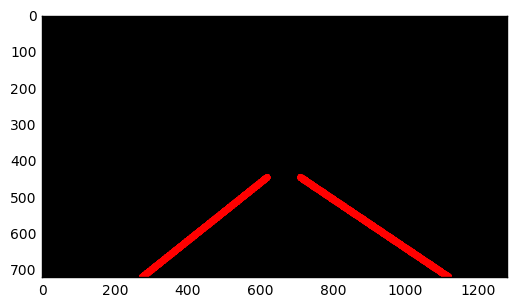

 90%|█████████ | 226/251 [03:02<00:19,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


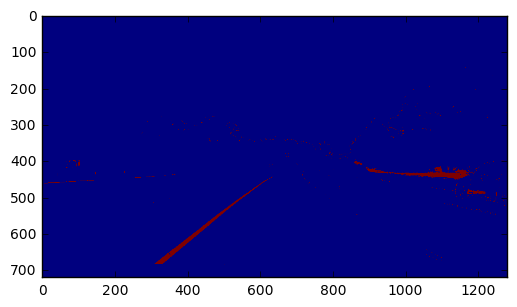

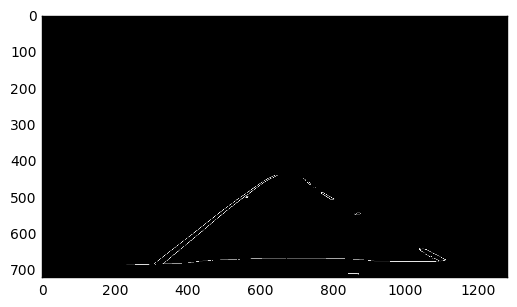

[-0.779220779220778, 923.5584415584409]
[-0.8076923076923082, 947.3076923076925]
[-0.7781690140845061, 927.0105633802808]
[-0.7837837837837835, 940.0540540540542]
[-0.8088737201365185, 951.546075085324]
[0.5759312320916908, 43.77936962750686]
[-0.8051948051948041, 933.6103896103888]
[-0.8888888888888876, 993.5555555555549]
[0.5774278215223095, 37.097112860892494]
[-0.764705882352939, 916.647058823528]
[-0.8421052631579029, 945.2631578947402]
[0.624413145539906, -0.23943661971820138]
[-0.8666666666666615, 952.6666666666646]
[-0.8987341772151896, 979.6835443037971]
[-0.7824074074074073, 938.046296296296]
[-0.75686274509804, 929.6901960784318]
[-0.7307692307692273, 921.4999999999986]
[-0.5783132530120475, 812.8554216867467]
[0.7254901960784286, -67.60784313725239]
[0.576547231270358, 39.508143322476016]
[0.6774193548387193, -58.12903225807479]
[-0.8039215686274475, 930.6078431372537]
[-0.8157894736842097, 939.552631578947]
[-0.6996805111821075, 971.8658146964843]
[0.8378378378378306, -237

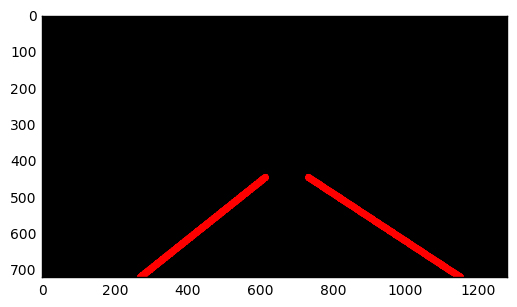

 90%|█████████ | 227/251 [03:02<00:18,  1.27it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


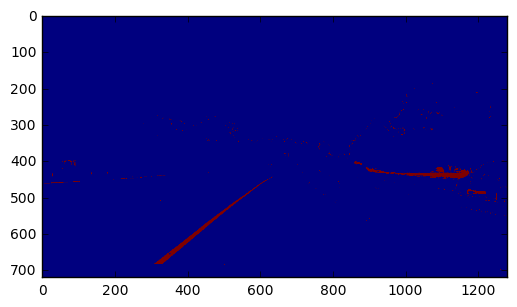

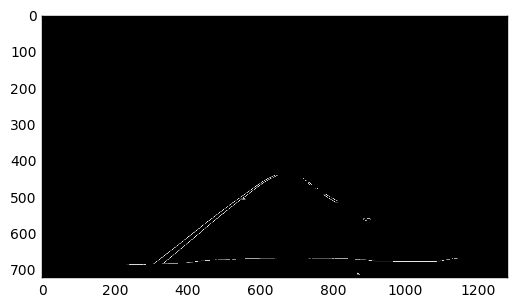

[-0.8316831683168299, 959.1782178217808]
[-0.7821782178217821, 940.5544554455442]
[-0.6750000000000008, 869.2750000000003]
[-0.8058823529411763, 933.8235294117644]
[-0.6256410256410269, 840.158974358975]
[-0.7023809523809527, 895.416666666667]
[0.5777777777777777, 41.75555555555578]
[0.7263843648208479, -71.1758957654729]
[-0.8682170542635657, 981.6666666666664]
[-0.7311827956989256, 917.9784946236563]
[-0.5542168674698824, 798.578313253014]
[0.6239067055393586, 3.1807580174928423]
[0.5755813953488371, 45.31395348837205]
[-0.6500000000000012, 879.0000000000005]
[-0.897637795275591, 1001.5590551181107]
[0.7278688524590163, -71.24918032786914]
[-0.7037037037037024, 904.962962962962]
[-0.6249999999999997, 860.6249999999999]
[-0.6238532110091729, 841.1467889908249]
[-0.8648648648648638, 961.6216216216208]
[-0.7807308970099659, 932.2724252491685]
[0.5550000000000005, 51.064999999999394]
[-0.6781609195402296, 897.6206896551724]
[-0.7242424242424244, 899.1000000000001]
[0.8693877551020415, -1

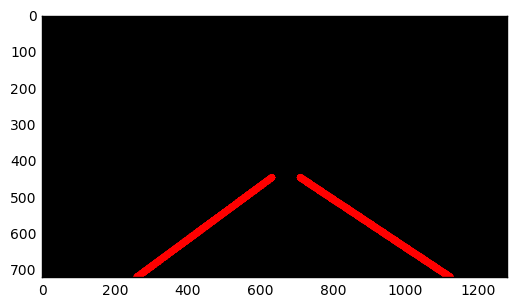

 91%|█████████ | 228/251 [03:03<00:17,  1.29it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


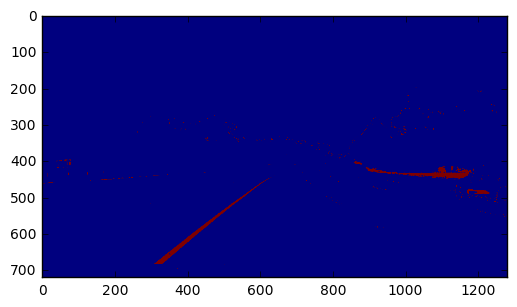

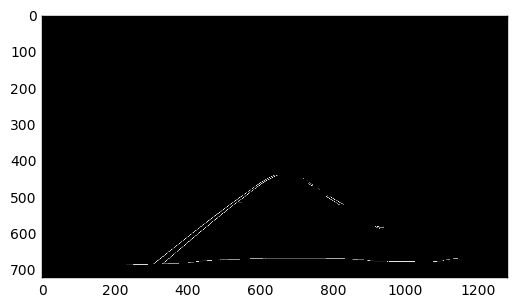

[-0.8393574297188748, 960.1485943775097]
[-0.7517730496453893, 909.5319148936167]
[-0.7531249999999995, 917.4687499999993]
[0.5999999999999994, 23.800000000000583]
[0.5777777777777778, 48.4]
[-0.8484848484848486, 944.1818181818185]
[0.7019230769230771, -54.98076923076942]
[-0.846153846153856, 945.0769230769266]
[-0.8691099476439794, 968.198952879581]
[-0.6052631578947332, 823.8947368421032]
[-0.5986159169550179, 840.6401384083047]
[0.6257309941520467, 6.573099415204761]
[-0.6785714285714286, 872.9285714285712]
[-0.5675675675675673, 803.6216216216212]
[-0.8235294117647008, 937.9999999999978]
[0.5981308411214951, 21.35514018691649]
[0.6000000000000011, 25.599999999998897]
[-0.7547169811320779, 929.2830188679256]
[-0.5769230769230791, 807.5000000000014]
[-0.8648648648648641, 972.2702702702703]
middle 638
left [732, 792, 718, 755, 725, 754] right [578, 582, 630, 342, 370, 518, 626, 549, 616, 408, 378, 637, 553]
(6, 2)
11.7912450619 0.617260448329
SLOPE
904.601287648 -0.746114238365
ave 703

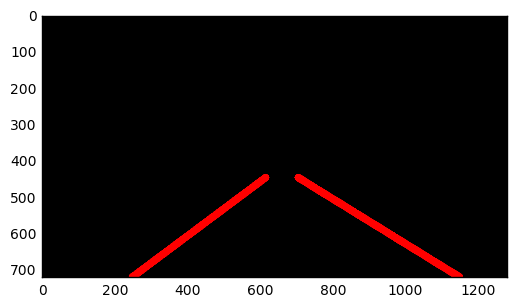

 91%|█████████ | 229/251 [03:04<00:17,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


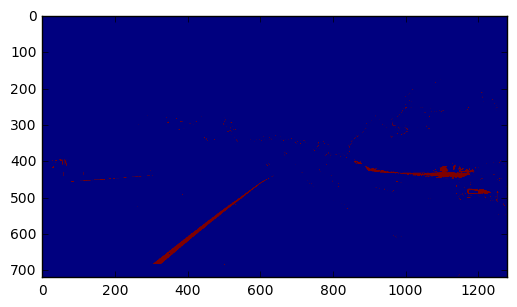

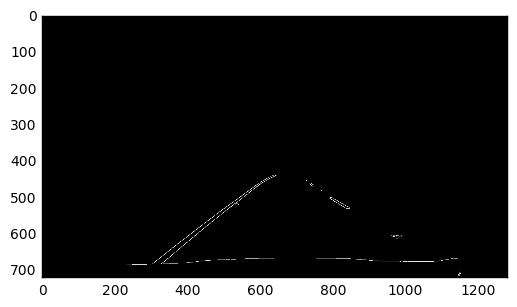

[-0.836734693877552, 956.6122448979595]
[-0.7800000000000005, 920.3400000000003]
[-0.7523510971786839, 914.9717868338562]
[-0.7770700636942666, 917.8980891719741]
[0.6019417475728158, 21.572815533980656]
[0.5988700564971748, 30.89265536723191]
[-0.8084112149532716, 937.0327102803741]
[0.6013986013986008, 16.99300699300752]
[0.6000000000000002, 25.799999999999997]
[-0.5609756097560986, 795.6585365853666]
[0.5625000000000004, 49.5624999999996]
[-0.8671875000000003, 971.0859374999999]
[-0.8096885813148795, 949.0069204152254]
middle 654
left [735, 790, 720, 762, 735] right [572, 503, 626, 458, 527, 634, 549, 620]
(5, 2)
28.9641955788 0.592942081094
SLOPE
920.325778211 -0.774052345097
ave 703 446
SLOPE
ave 612 446
x2 1165 258


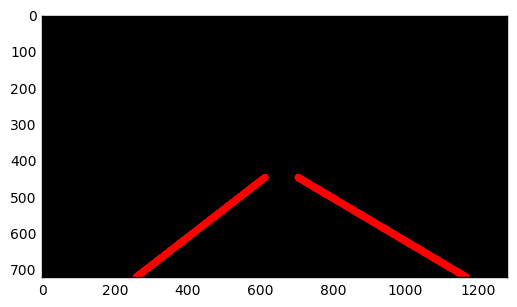

 92%|█████████▏| 230/251 [03:05<00:16,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


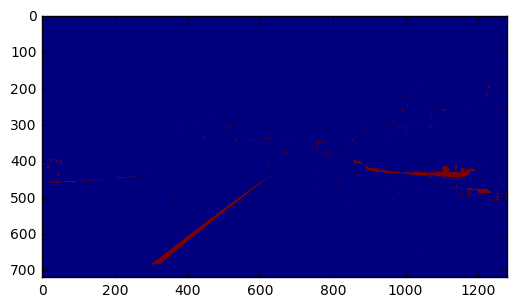

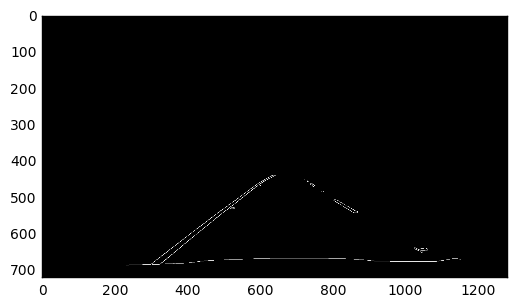

[-0.7806451612903228, 931.6838709677421]
[-0.6982248520710063, 878.4082840236689]
[0.55425219941349, 59.4428152492667]
[-0.779552715654953, 932.8977635782751]
[-0.7760000000000001, 916.024]
[-0.8048780487804867, 930.4878048780482]
[-0.7803278688524591, 936.2655737704919]
[0.5785123966942153, 45.61157024793325]
[-0.7298578199052134, 916.3649289099526]
[-0.8080808080808068, 934.696969696969]
[-0.8361581920903955, 946.7175141242939]
[0.7818181818181816, -117.32727272727259]
[0.7254901960784282, -101.45098039215353]
[0.5555555555555554, 60.44444444444465]
[-0.7534246575342487, 914.8904109589054]
[-0.8333333333333329, 956.4999999999997]
[0.6494252873563222, -17.235632183908802]
[-0.8387096774193546, 943.3225806451613]
[-0.8075117370892013, 936.1361502347415]
[-0.6279069767441846, 875.2558139534879]
[-0.7692307692307689, 917.4615384615385]
[0.6499999999999957, -25.949999999995715]
[-0.8235294117647091, 935.1176470588248]
middle 681
left [766, 801, 741, 1022, 766, 721, 1023] right [626, 615, 

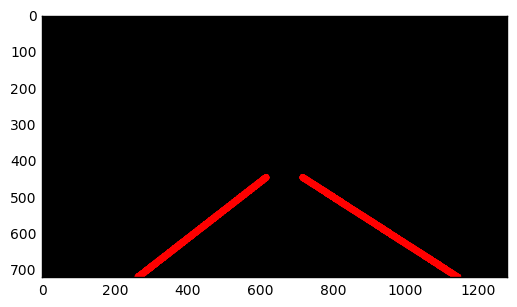

 92%|█████████▏| 231/251 [03:06<00:16,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


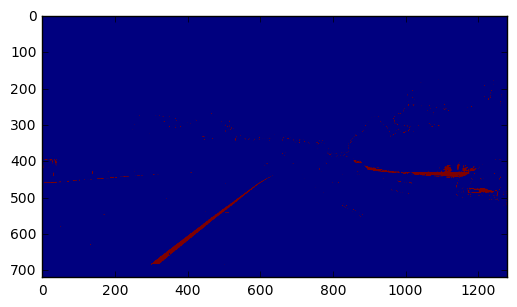

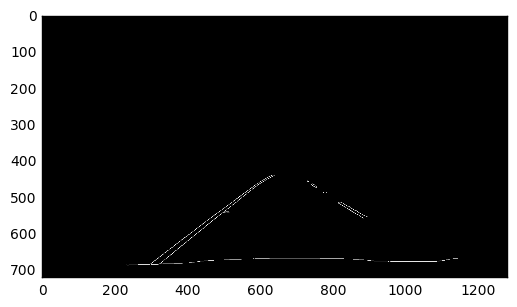

[-0.7517241379310344, 906.0068965517243]
[-0.8096885813148782, 944.7197231833907]
[-0.8090277777777775, 945.3611111111107]
[0.6011396011396015, 20.156695156694237]
[0.5785440613026828, 46.54406130268099]
[-0.752508361204013, 907.4949832775916]
[0.6060606060606047, 15.181818181819468]
[-0.8079470198675482, 949.814569536423]
[0.5781818181818185, 46.35999999999987]
[-0.7118644067796615, 899.491525423729]
[-0.8380281690140841, 964.577464788732]
[-0.869090909090908, 984.5745454545449]
[0.5766233766233765, 34.67792207792235]
[-0.8404255319148934, 972.1063829787232]
[0.5541237113402059, 52.04381443298999]
[-0.8079470198675501, 950.6225165562914]
[-0.8379310344827589, 974.5999999999997]
[-0.7535545023696693, 919.4928909952611]
[0.6023738872403558, 21.821958456973476]
[-0.7539062500000002, 921.7460937500001]
[0.5526315789473687, 65.15789473684181]
middle 688
left [740, 827, 729, 814, 722, 729, 749, 814] right [584, 611, 616, 596, 631, 505, 620, 622, 626, 632, 638, 631, 639]
(8, 2)
37.7430205432

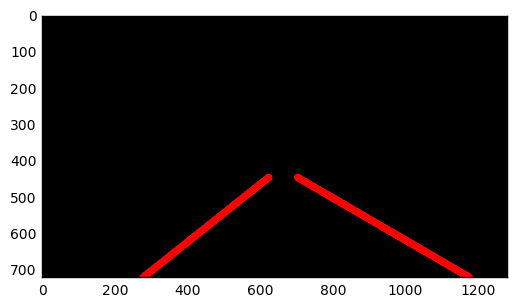

 92%|█████████▏| 232/251 [03:06<00:15,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


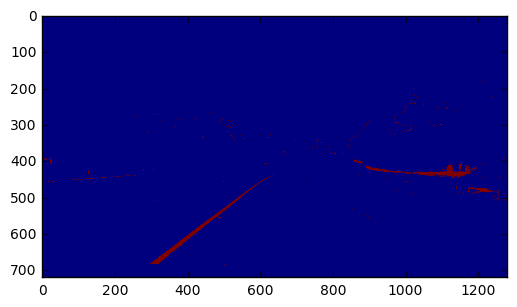

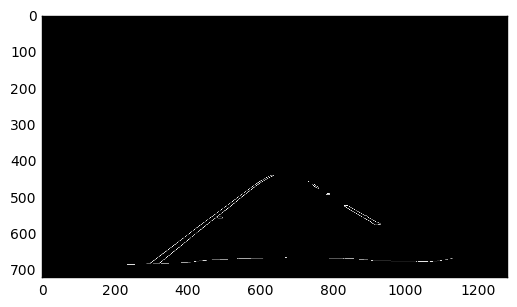

[-0.8354430379746837, 951.696202531646]
[-0.6985507246376809, 877.4985507246374]
[0.5774647887323947, 38.366197183097896]
[-0.6982248520710057, 880.8994082840238]
[0.5992063492063506, 28.257936507934858]
[-0.6997084548104947, 883.4169096209905]
[-0.8396946564885489, 956.5801526717551]
[-0.7002881844380398, 885.3832853025932]
[0.5770308123249294, 38.26610644257776]
[-0.8693877551020411, 972.3755102040817]
[-0.5999999999999994, 833.8000000000003]
[0.5786666666666671, 32.99466666666616]
[-0.6500000000000002, 869.8999999999999]
[-0.6500000000000002, 850.4000000000002]
[-0.6213592233009709, 861.9514563106801]
[-0.574626865671643, 824.6343283582094]
[-0.5526315789473675, 795.1842105263152]
[-0.6237623762376254, 865.7623762376245]
[0.5772870662460564, 40.71608832807624]
[0.6230366492146595, 1.5602094240839748]
[0.7291666666666663, -104.66666666666653]
[0.754448398576513, -98.81850533807902]
[-0.601941747572815, 830.0679611650486]
[-0.5559701492537314, 816.2089552238807]
[-0.8657407407407407, 

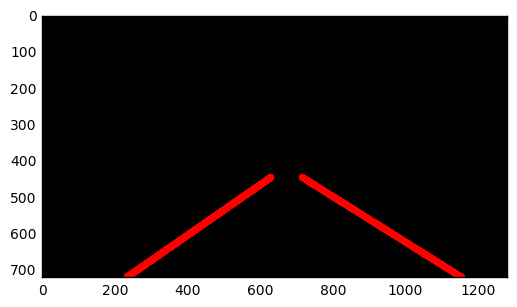

 93%|█████████▎| 233/251 [03:07<00:14,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


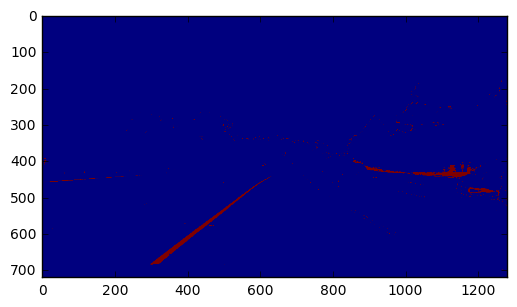

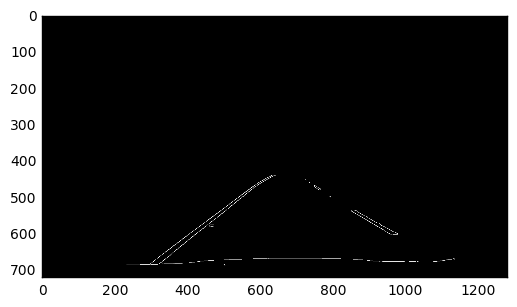

[-0.752851711026616, 905.5855513307985]
[-0.8083623693379792, 943.9094076655047]
[0.6005361930294911, 17.412868632706843]
[-0.5538461538461533, 793.0307692307691]
[0.624242424242424, 4.690909090909251]
[0.6025104602510464, 16.757322175731815]
[0.6245614035087715, 7.221052631579344]
[-0.7561837455830386, 923.957597173145]
[-0.6227848101265825, 832.9772151898734]
[-0.6488095238095238, 878.3452380952386]
[-0.8391304347826078, 953.7173913043478]
[0.598837209302325, 22.668604651163804]
[0.649425287356322, -17.534482758620683]
[-0.5802469135802472, 852.8765432098769]
[0.6250000000000007, -6.500000000000454]
[0.8631578947368416, -240.39999999999952]
[-0.8364779874213845, 963.1069182389942]
[0.6482758620689644, 279.3862068965523]
[-0.679245283018869, 881.5094339622648]
[-0.7008547008547024, 879.8290598290604]
[0.5763688760806913, 41.57060518731986]
middle 664
left [722, 747, 734, 789, 747, 723, 924, 969, 752] right [556, 611, 632, 640, 631, 466, 555, 472, 617, 491, 619]
(9, 2)
-17.1236800432 0

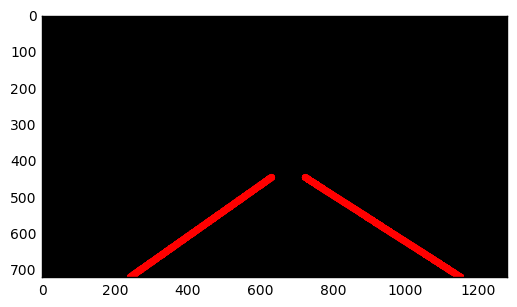

 93%|█████████▎| 234/251 [03:08<00:14,  1.21it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


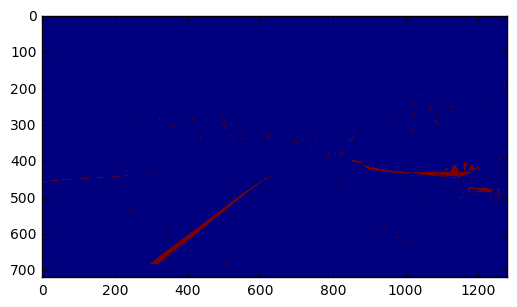

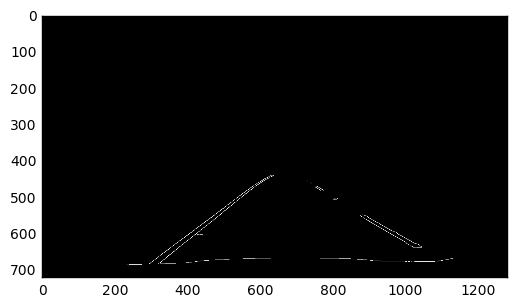

[-0.7517482517482514, 904.2622377622375]
[-0.7820512820512827, 931.1282051282059]
[0.5980861244019138, 28.870813397129044]
[0.5540983606557378, 59.613114754098056]
[-0.8369565217391296, 959.195652173912]
[0.577777777777777, 33.53333333333407]
[0.6250000000000003, 0.9999999999995657]
[-0.698275862068966, 901.8620689655172]
[-0.7806451612903225, 929.1225806451614]
[0.5772357723577233, 35.154471544716124]
[-0.6721311475409838, 893.0327868852456]
[0.6014492753623188, 21.311594202898444]
[-0.7253731343283585, 900.1611940298509]
[-0.8095238095238095, 938.9999999999997]
[-0.8688524590163932, 980.606557377049]
[-0.8682170542635667, 975.589147286822]
[0.600706713780919, 24.23321554770295]
[-0.7534722222222208, 905.5208333333325]
[-0.6999999999999901, 903.4999999999966]
[-0.7811447811447813, 932.7474747474745]
[0.6000000000000014, 27.59999999999884]
[0.6245954692556628, 2.0614886731395092]
[-0.8705882352941173, 975.5176470588234]
[-0.7692307692307675, 926.9999999999991]
middle 669
left [873, 802

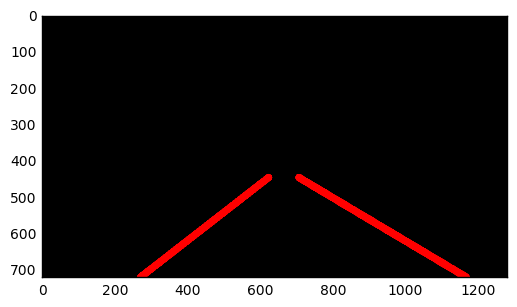

 94%|█████████▎| 235/251 [03:09<00:13,  1.22it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


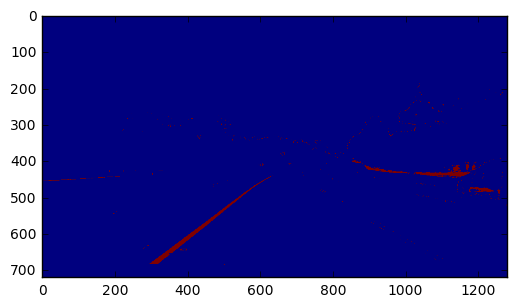

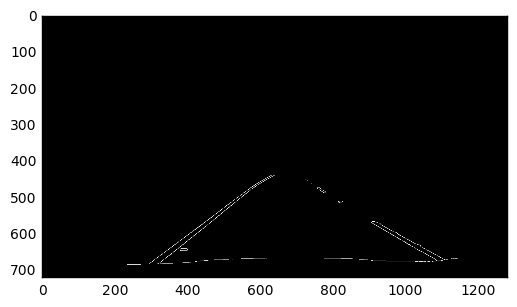

[-0.8093385214007773, 943.8871595330734]
[-0.7508771929824567, 904.2596491228072]
[0.5815217391304348, 43.304347826086804]
[0.5757575757575756, 37.93939393939397]
[-0.8093525179856121, 941.8021582733816]
[0.5773480662983426, 35.60773480662995]
[0.5751445086705201, 40.76589595375756]
[-0.5581395348837184, 796.6511627906963]
[0.5849056603773574, 26.377358490567584]
[0.7281553398058256, -75.18446601941775]
[0.5625000000000007, 64.12499999999942]
[-0.8078291814946621, 942.3523131672597]
[0.6168224299065407, -2.0373831775684623]
[0.645669291338584, -28.779527559056575]
[0.8392857142857146, -163.2857142857141]
[0.8385826771653542, -160.90551181102347]
[0.6016260162601631, 16.21951219512175]
[-0.7916666666666612, 916.1249999999978]
middle 700
left [904, 740, 742, 755, 1032, 724, 1006, 989, 963, 776, 744, 726] right [609, 581, 599, 639, 607, 321]
(12, 2)
-13.8211133034 0.643943251583
SLOPE
907.512907148 -0.754533935902
ave 714 446
SLOPE
ave 611 446
x2 1139 248


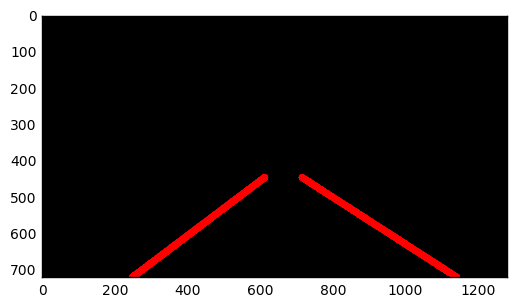

 94%|█████████▍| 236/251 [03:10<00:12,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


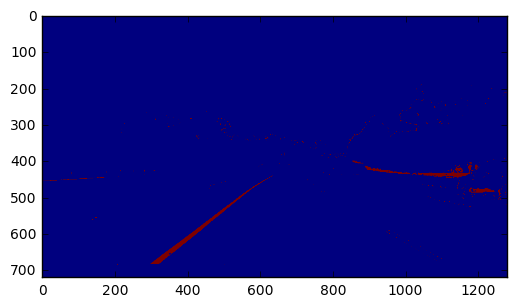

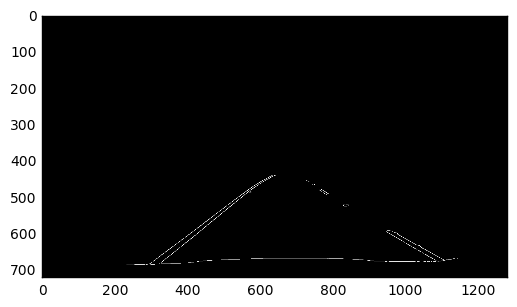

[-0.750853242320819, 906.0034129692829]
[0.5984251968503942, 27.307086614172313]
[-0.8076923076923079, 943.8846153846157]
[0.5775401069518716, 35.818181818181536]
[0.6261127596439161, 0.7982195845706982]
[-0.8088737201365193, 947.5017064846418]
[-0.8148148148148132, 937.2222222222214]
[0.5774278215223095, 34.7874015748036]
[0.6234177215189876, 4.955696202531235]
[0.5954198473282458, 20.03816793892937]
[-0.679245283018868, 869.9622641509434]
[-0.8095238095238081, 936.0476190476181]
[-0.6482084690553735, 858.0716612377848]
[-0.7659574468085102, 909.723404255319]
[-0.5686274509803901, 819.843137254901]
[-0.6008064516129039, 838.8064516129037]
[-0.558139534883724, 792.7441860465138]
[0.5994318181818185, 16.82386363636353]
[-0.7666666666666666, 911.0333333333336]
[-0.7375000000000002, 897.0124999999997]
[0.6000000000000101, 14.799999999989499]
[-0.5773195876288669, 821.6701030927837]
[0.6006191950464397, 23.72755417956645]
[-0.6481481481481481, 853.5185185185187]
[-0.6209677419354837, 847.6

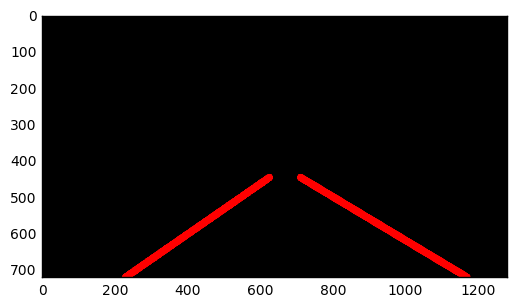

 94%|█████████▍| 237/251 [03:10<00:11,  1.23it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


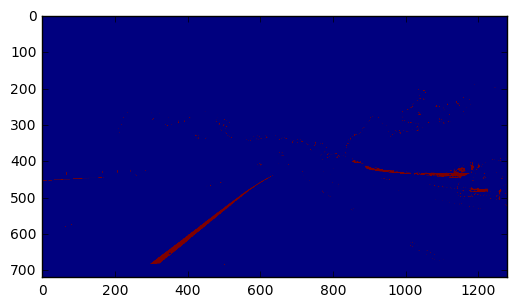

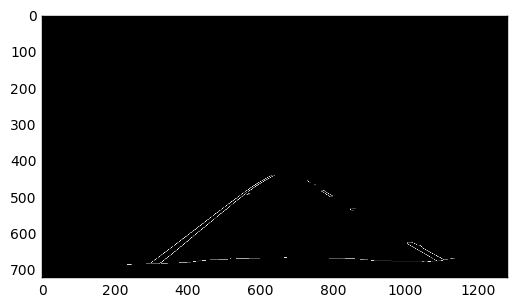

[-0.8091872791519438, 943.367491166078]
[-0.7777777777777785, 915.555555555556]
[-0.808510638297872, 942.3404255319148]
[-0.7799999999999995, 918.5599999999998]
[0.6231454005934715, -0.7359050445100965]
[0.5555555555555559, 58.11111111111068]
[-0.5529411764705884, 793.329411764706]
[-0.5806451612903214, 806.387096774193]
[0.5548589341692796, 59.88087774294626]
[-0.7727272727272745, 911.7272727272733]
[-0.8064516129032254, 929.7741935483868]
[-0.8666666666666645, 946.4666666666659]
[0.6008583690987134, 24.673819742488448]
[-0.8363636363636371, 934.7454545454547]
[0.5526315789473685, 59.6842105263156]
[0.6507936507936513, -19.777777777778034]
[0.6014234875444836, 17.163701067616223]
[-0.6595744680851036, 890.7659574468075]
[-0.8888888888888864, 952.3333333333323]
[-0.7714285714285637, 915.1714285714243]
[-0.7803278688524586, 934.8262295081965]
[-0.6533333333333338, 884.8800000000002]
[-0.806779661016949, 945.8169491525422]
[0.6219512195121923, 5.475609756100049]
middle 633
left [749, 772

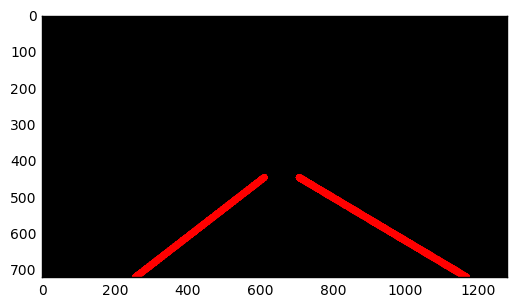

 95%|█████████▍| 238/251 [03:11<00:10,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


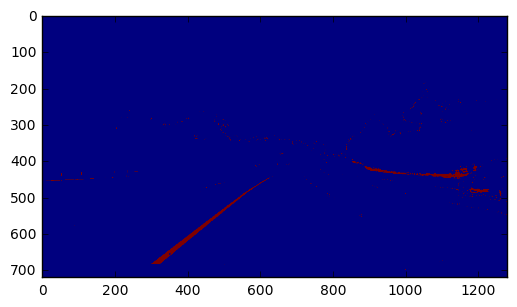

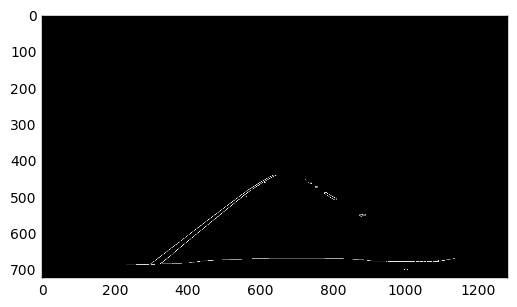

[-0.7526881720430098, 906.2903225806449]
[-0.808510638297872, 944.3404255319148]
[0.6005361930294905, 17.81233243967854]
[-0.7526132404181185, 908.0313588850178]
[-0.8076923076923078, 946.1153846153845]
[0.5527777777777781, 57.86388888888864]
[-0.5568181818181839, 796.9204545454558]
[0.5545851528384281, 64.51091703056761]
[-0.5614035087719289, 796.4912280701748]
[0.7534246575342468, -95.76712328767135]
[0.576576576576576, 46.378378378378684]
[-0.7499999999999839, 924.749999999994]
[-0.7012578616352196, 890.2075471698109]
[-0.7531249999999995, 914.7031249999999]
[-0.7553956834532378, 925.7194244604325]
middle 691
left [723, 751, 870, 735, 870] right [573, 604, 586, 613, 641, 635, 365, 642, 625, 643]
(5, 2)
18.15967869 0.607580071551
SLOPE
895.356927086 -0.719950459413
ave 704 446
SLOPE
ave 624 446
x2 1155 243


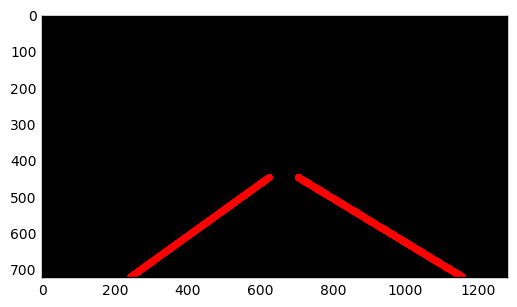

 95%|█████████▌| 239/251 [03:12<00:09,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


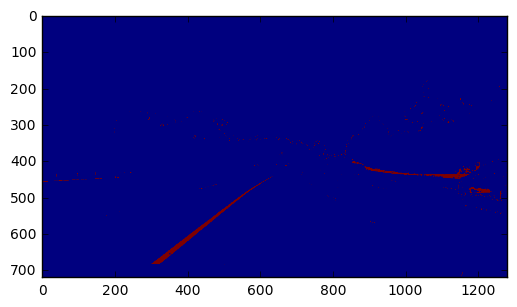

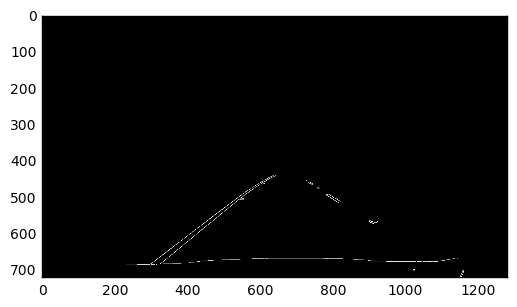

[-0.7770700636942672, 916.452229299363]
[-0.8109090909090915, 944.3018181818185]
[-0.869346733668342, 966.7537688442211]
[-0.5809523809523798, 812.9714285714274]
[-0.5999999999999994, 820.3999999999996]
[0.6739926739926733, -38.78021978021844]
[0.6739130434782612, -32.97826086956555]
[-0.8343195266272202, 944.3076923076931]
[-0.7815126050420174, 917.4537815126052]
[-0.7265306122448983, 909.4979591836736]
[-0.7368421052631461, 916.0526315789423]
[0.7242524916943535, -74.77408637873863]
[-0.8686868686868686, 965.4545454545453]
[0.6999999999999952, -61.59999999999618]
[0.7254901960784311, -78.2352941176468]
[0.6739130434782615, -36.60869565217441]
[-0.6770833333333318, 892.8645833333327]
[-0.899628252788105, 1011.2639405204461]
[-0.8101265822784818, 932.0886075949368]
[0.870229007633588, -186.50381679389355]
[-0.7803278688524586, 931.3639344262292]
[0.6296296296296284, -0.8888888888875787]
[-0.5818181818181852, 814.5272727272751]
middle 646
left [789, 733, 737, 808, 786, 728, 759, 732] ri

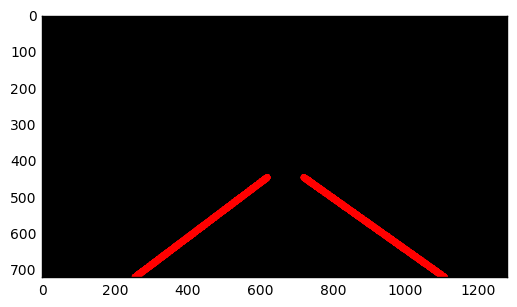

 96%|█████████▌| 240/251 [03:13<00:08,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


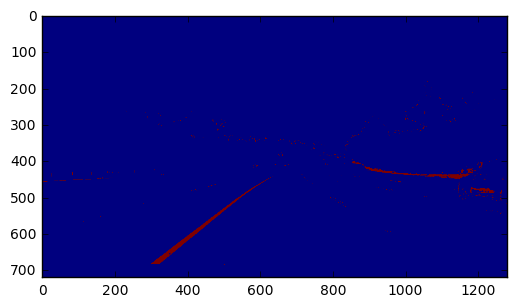

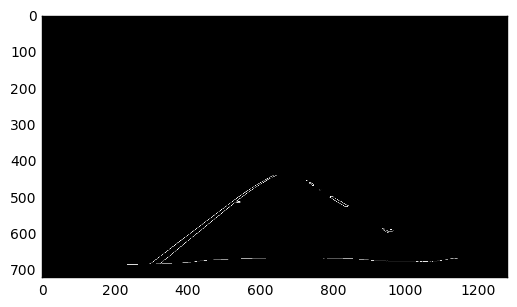

[-0.8079710144927534, 943.1666666666665]
[-0.7527675276752781, 906.571955719558]
[0.67398119122257, -32.70219435736609]
[0.6005586592178773, 19.189944134078136]
[-0.5999999999999995, 824.9999999999997]
[-0.8106796116504859, 943.7330097087378]
[0.696078431372549, -61.61764705882299]
[0.5774058577405858, 35.803347280334776]
[-0.7519379844961235, 904.8217054263564]
[0.7000000000000021, -71.60000000000232]
[0.724832214765101, -74.2013422818791]
[-0.7812500000000026, 936.875000000002]
[0.8709677419354831, -183.6451612903215]
[-0.7741935483870881, 933.1612903225774]
[0.5999999999999999, 23.39999999999992]
[-0.7811320754716986, 923.0264150943394]
[-0.7806451612903229, 941.9548387096773]
[0.6005747126436779, 22.175287356322347]
middle 674
left [734, 734, 837, 726, 938, 737, 739, 791, 739] right [598, 568, 640, 593, 553, 636, 358, 571, 643]
(9, 2)
-35.9108629131 0.671599867655
SLOPE
917.590097961 -0.760064102607
ave 717 446
SLOPE
ave 620 446
x2 1125 259


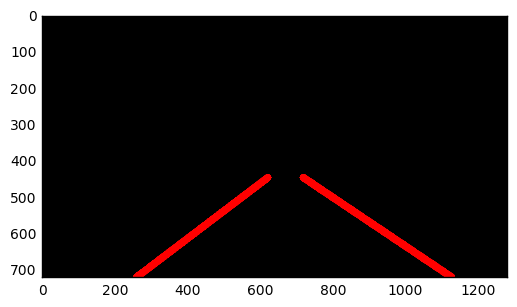

 96%|█████████▌| 241/251 [03:14<00:08,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


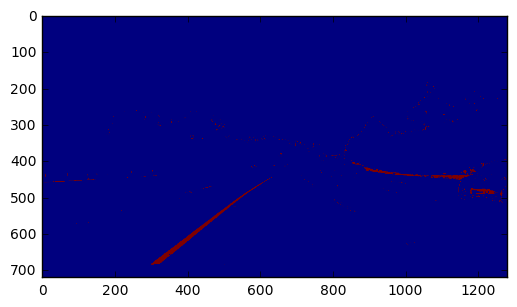

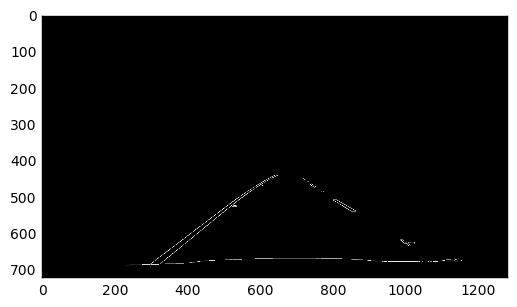

[-0.8081180811808127, 943.5977859778602]
[-0.7750000000000014, 915.2750000000003]
[-0.7801724137931044, 920.6120689655174]
[-0.807272727272727, 945.1709090909088]
[0.6236263736263742, 2.23626373626299]
[-0.5545454545454555, 799.345454545455]
[-0.8043478260869589, 928.7173913043483]
[0.6503067484662569, -12.625766871164858]
[0.6257142857142848, 3.105714285715218]
[-0.8095238095238102, 1454.952380952382]
[-0.8367346938775524, 944.3877551020416]
[0.5543478260869562, 56.239130434783384]
[-0.8181818181818227, 928.4545454545466]
[0.6728110599078337, -41.56221198156655]
[-0.7761194029850749, 1418.1940298507466]
[0.7083333333333264, -69.45833333332739]
[0.6538461538461541, -18.769230769231015]
[0.5540897097625331, 57.635883905013074]
[-0.8372093023255819, 951.2325581395352]
[-0.8260869565217415, 939.9565217391311]
[0.6698113207547185, -29.65094339622787]
middle 673
left [718, 736, 727, 750, 851, 835, 720, 737, 737] right [591, 421, 534, 601, 648, 441, 457, 333, 533, 466]
(9, 2)
-5.87216599886 

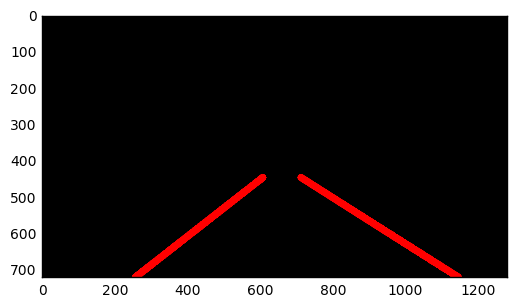

 96%|█████████▋| 242/251 [03:14<00:07,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


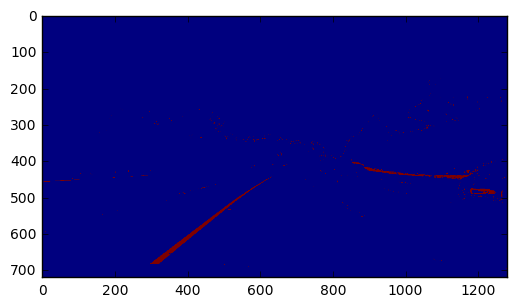

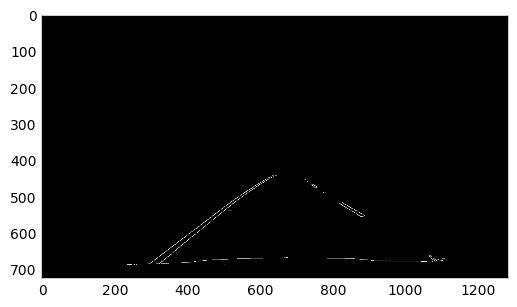

[-0.7529411764705883, 905.1176470588236]
[-0.8373983739837398, 955.8292682926829]
[-0.8095238095238096, 943.666666666667]
[0.5777777777777775, 39.022222222222226]
[-0.6230769230769232, 839.7692307692311]
[0.6266666666666668, 5.213333333332965]
[-0.7831325301204817, 931.9759036144576]
[0.6475644699140403, -16.24641833810888]
[-0.7523219814241489, 916.467492260062]
[0.6996805111821081, -52.067092651756795]
[0.6996904024767804, -53.47678018575856]
[-0.7264437689969618, 903.3860182370827]
[-0.8970588235294117, 969.1617647058822]
[0.601173020527859, 22.530791788856845]
[-0.7286821705426361, 892.8914728682173]
[-0.67420814479638, 885.5882352941178]
[0.6713286713286701, -35.08391608391505]
[-0.75625, 923.225]
middle 654
left [739, 772, 720, 729, 721, 741, 733] right [550, 573, 595, 640, 618, 632, 631, 455, 568, 520, 516]
(7, 2)
-12.8725514164 0.646268788553
SLOPE
915.188972706 -0.75827615477
ave 710 446
SLOPE
ave 618 446
x2 1134 257


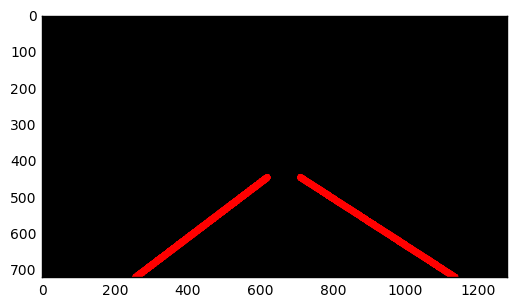

 97%|█████████▋| 243/251 [03:15<00:06,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


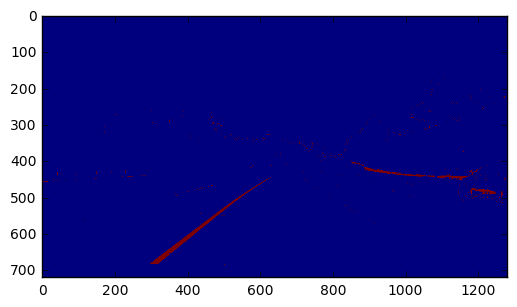

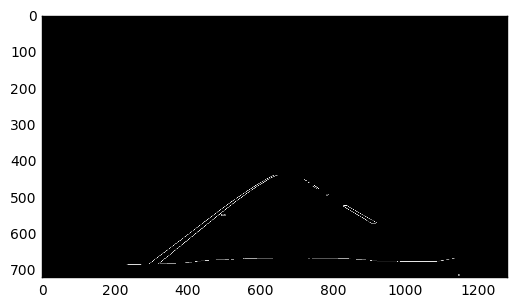

[-0.75, 902.9999999999997]
[-0.8106060606060616, 942.3939393939398]
[0.5774647887323945, 40.52112676056276]
[0.5787671232876715, 47.73287671232859]
[-0.8380952380952379, 961.5047619047621]
[-0.7272727272727316, 892.0000000000026]
[-0.8130081300813036, 950.0000000000022]
[-0.8385964912280702, 968.961403508772]
[-0.8099173553719019, 948.7190082644632]
[0.6016042780748665, 16.844919786095936]
[0.6015228426395935, 24.05329949238653]
[0.5523560209424082, 56.227748691099656]
[-0.7529880478087652, 905.3904382470123]
[-0.8715596330275236, 983.2935779816515]
[0.5741444866920153, 50.18250950570325]
[-0.7250755287009062, 898.622356495468]
[-0.8398576512455523, 968.5516014234881]
middle 682
left [742, 854, 720, 753, 731, 827] right [540, 584, 596, 561, 615, 626, 617, 549, 605, 627, 621]
(6, 2)
39.2604134914 0.580976590061
SLOPE
938.403371565 -0.797906987585
ave 700 446
SLOPE
ave 617 446
x2 1171 273


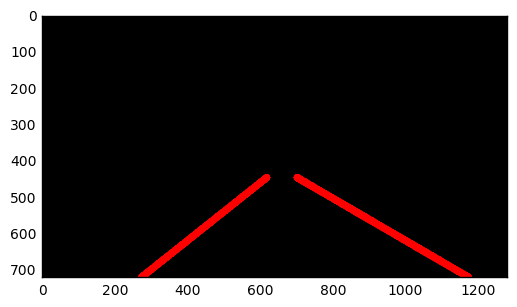

 97%|█████████▋| 244/251 [03:16<00:05,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


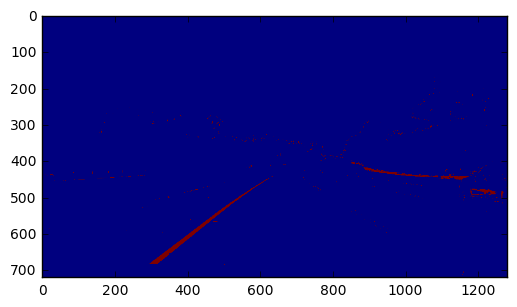

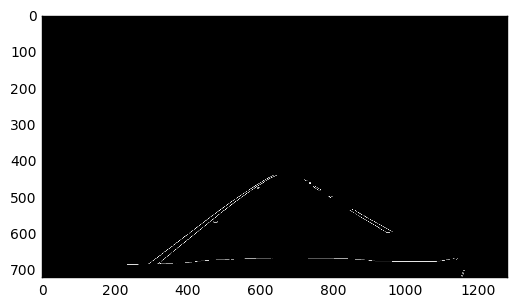

[-0.7531914893617018, 903.9319148936169]
[-0.8091603053435104, 941.1221374045797]
[0.5982905982905974, 30.84615384615515]
[-0.5798319327731075, 813.411764705881]
[0.5999999999999996, 20.4000000000003]
[-0.6052631578947374, 823.7368421052635]
[-0.7511312217194569, 901.8280542986424]
[0.6213991769547331, -0.7160493827168863]
[-0.7272727272727006, 892.7272727272576]
[0.6005509641873277, 26.76584022038595]
[-0.810077519379845, 940.6046511627907]
[0.5999999999999995, 18.400000000000645]
[0.6027713625866052, 18.79907621247052]
[0.6011730205278595, 23.126099706744373]
[-0.7799352750809061, 934.9190938511323]
[0.6028708133971282, 27.70813397129296]
[-0.8076923076923069, 943.1923076923072]
[0.6014669926650363, 23.907090464548368]
[-0.8108108108108104, 956.8108108108104]
[-0.7538940809968855, 925.7538940809969]
[-0.8404255319148924, 969.4255319148931]
[0.6224489795918354, 10.132653061225884]
[-0.5999999999999944, 819.5999999999962]
[-0.7806451612903227, 936.4903225806453]
middle 693
left [846, 7

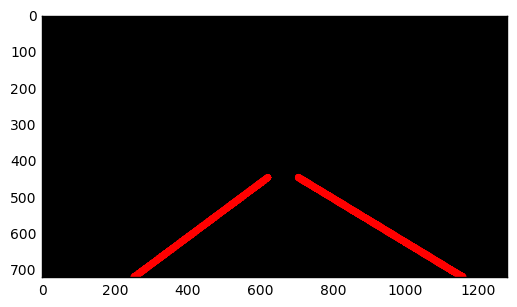

 98%|█████████▊| 245/251 [03:17<00:04,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


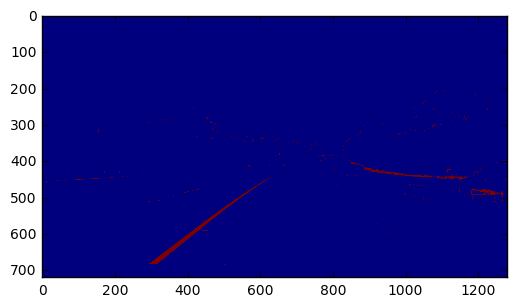

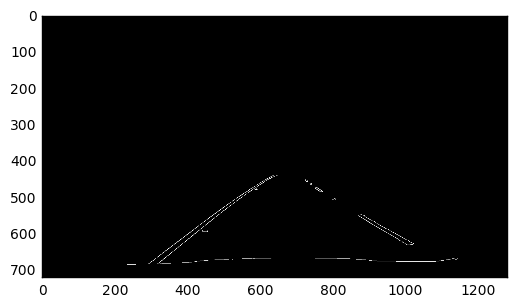

[-0.7500000000000012, 901.5000000000006]
[-0.7259036144578314, 899.5933734939757]
[0.6246153846153842, 6.163076923077461]
[0.5558823529411765, 60.861764705882365]
[-0.8682926829268289, 965.195121951219]
[-0.6230769230769229, 835.1615384615384]
[-0.7261904761904763, 902.5833333333333]
[0.6482558139534883, -14.040697674418585]
[0.6490566037735842, -18.78867924528227]
[0.6261980830670927, 6.968051118210636]
[-0.7531645569620243, 920.9999999999995]
[-0.8385826771653548, 959.5708661417327]
[-0.6988304093567249, 888.1549707602338]
[-0.7269503546099291, 909.609929078014]
[-0.8389513108614234, 963.0486891385768]
[0.5540983606557376, 63.38360655737717]
[-0.8074324324324329, 951.6824324324325]
[-0.8383838383838387, 947.0909090909091]
[0.6987577639751553, -53.90062111801234]
[-0.7286821705426332, 899.9689922480604]
[-0.7276119402985071, 908.8544776119401]
[-0.6940298507462683, 903.0074626865675]
[0.6257668711656439, 4.300613496932723]
[-0.8978494623655916, 978.2903225806452]
[-0.72668810289389, 8

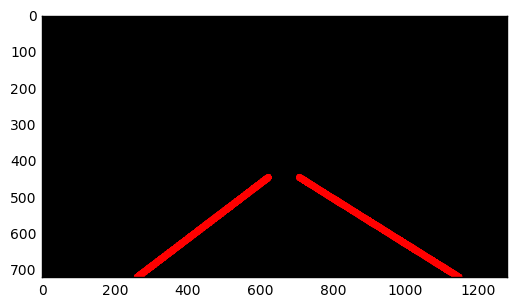

 98%|█████████▊| 246/251 [03:18<00:03,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


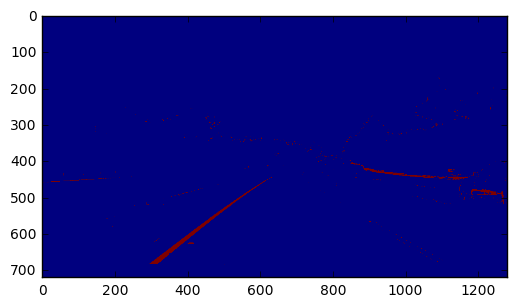

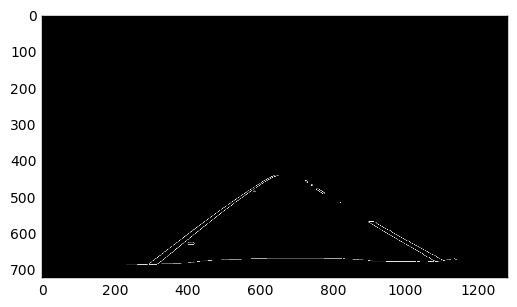

[0.6226415094339628, 10.150943396226147]
[-0.8409090909090904, 953.9318181818177]
[-0.6723163841807914, 870.5593220338983]
[0.5555555555555555, 61.7777777777781]
[0.6250000000000003, 4.4999999999999165]
[-0.5789473684210498, 809.9473684210511]
[-0.6749311294765844, 876.6804407713503]
[-0.6740331491712708, 869.011049723757]
[-0.6751412429378532, 872.6892655367229]
[0.6242774566473991, 3.647398843930431]
[-0.866242038216561, 961.4522292993631]
[-0.6762589928057555, 879.6115107913671]
[0.6501457725947516, -18.005830903789278]
[-0.6724637681159421, 864.5478260869567]
[-0.8391608391608391, 971.6713286713283]
[-0.6738461538461534, 864.2430769230768]
[0.7200000000000065, -83.1600000000066]
[-0.5822784810126584, 837.6835443037979]
[-0.5783132530120491, 840.5662650602416]
[-0.6000000000000009, 835.6000000000006]
[-0.8694029850746261, 986.4216417910442]
[0.812500000000008, -168.3125000000078]
[0.7798165137614678, -152.72477064220158]
[-0.5606060606060584, 823.7272727272714]
[-0.6500000000000002,

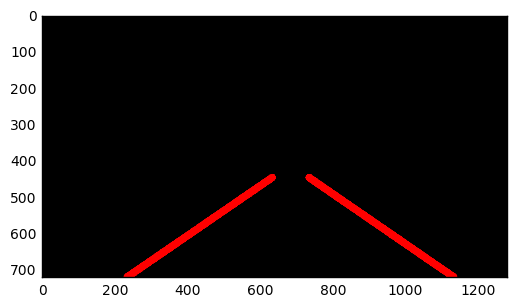

 98%|█████████▊| 247/251 [03:18<00:03,  1.26it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


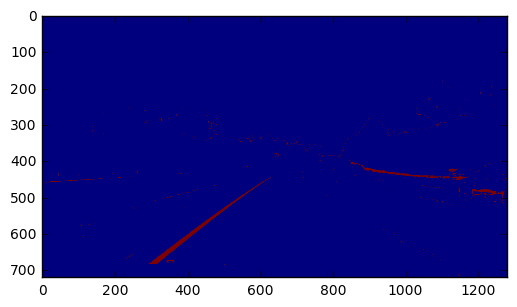

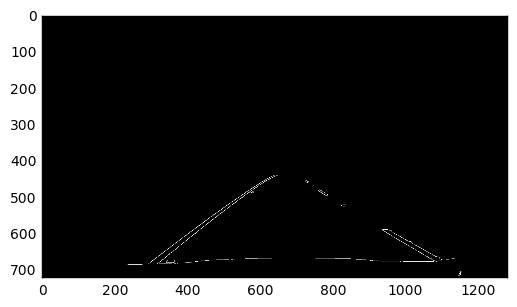

[-0.7242647058823534, 891.1397058823533]
[0.5993788819875768, 30.31055900621193]
[-0.6991404011461322, 886.0515759312323]
[-0.8079999999999998, 939.328]
[0.5558912386706941, 61.96374622356593]
[-0.7254098360655731, 890.7418032786882]
[0.5533141210374637, 61.58789625360224]
[-0.8988326848249022, 1005.2762645914393]
[-0.8674242424242424, 982.2613636363635]
[-0.7002881844380405, 884.9827089337174]
[0.5555555555555554, 61.333333333333805]
[-0.7525773195876295, 910.5257731958767]
[-0.8079470198675499, 940.1456953642383]
[0.6012461059190031, 29.174454828660636]
[0.6229050279329607, 3.016759776536802]
[0.6440677966101725, -17.71186440678303]
[-0.7537878787878786, 907.8749999999997]
[-0.5918367346938809, 815.8571428571453]
[-0.7002967359050442, 887.7863501483679]
[0.5989717223650391, 27.979434447300072]
[0.5993690851735016, 141.55835962145093]
middle 682
left [822, 770, 758, 759, 823, 724, 942, 758] right [558, 638, 566, 529, 620, 609, 634, 592, 572, 561, 630, 628]
(8, 2)
32.2067899328 0.59141

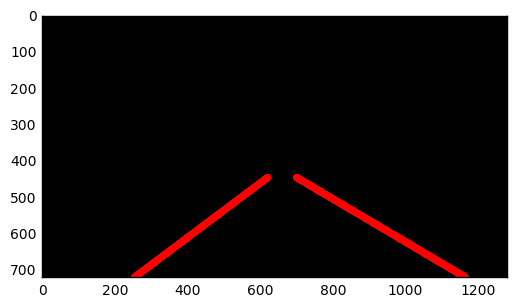

 99%|█████████▉| 248/251 [03:19<00:02,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


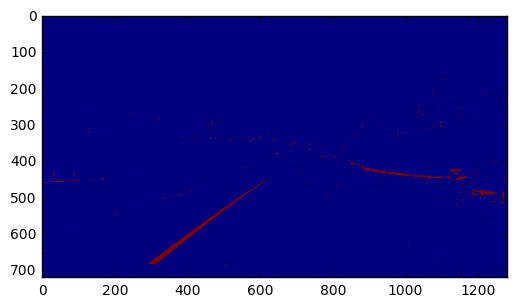

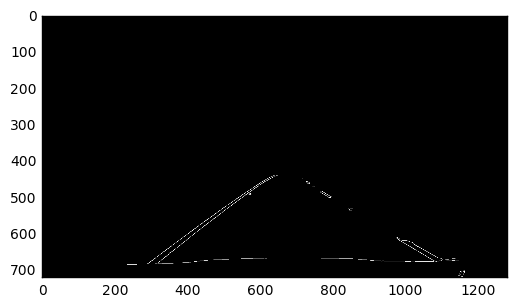

[-0.7789473684210525, 926.8105263157894]
[-0.6740331491712704, 870.7071823204417]
[0.5773672055427251, 39.83140877598113]
[-0.6977491961414798, 877.9742765273314]
[0.6005509641873275, 28.76859504132296]
[0.5762273901808785, 46.338501291989786]
[-0.6487935656836465, 857.8766756032173]
[0.5780885780885778, 40.57342657342677]
[-0.8000000000000018, 917.6000000000008]
[-0.7837837837837883, 910.8648648648665]
[0.5781250000000002, 45.15624999999953]
[0.5772946859903378, 42.49275362318885]
[-0.676056338028169, 873.9718309859156]
[-0.7789855072463775, 926.0434782608697]
[-0.7460317460317435, 917.4920634920618]
[0.5925925925925923, 22.44444444444467]
[0.5519125683060108, 72.8852459016393]
[-0.5842696629213504, 815.7528089887655]
[0.6519174041297932, -17.292035398229608]
[0.6019736842105257, 28.342105263158697]
[-0.6233766233766225, 847.0779220779215]
[0.6417910447761224, -22.26865671642159]
middle 700
left [726, 783, 763, 729, 766, 744, 1059, 975, 726, 840, 1088] right [598, 639, 589, 641, 357, 

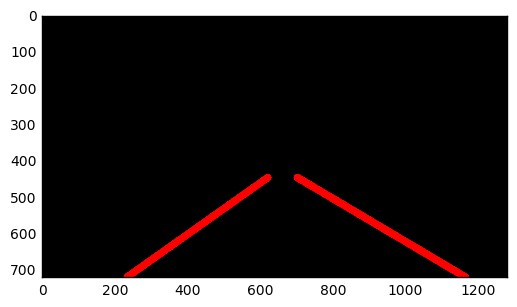

 99%|█████████▉| 249/251 [03:20<00:01,  1.24it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


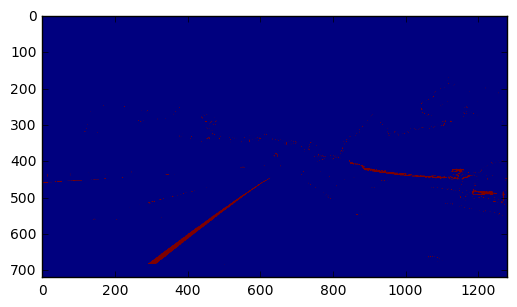

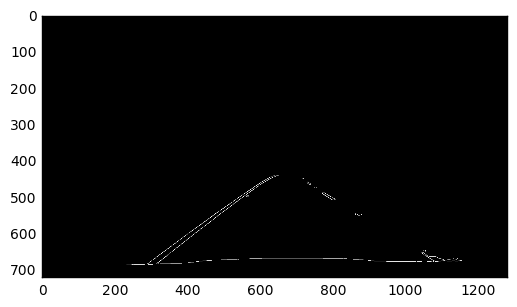

[-0.7789473684210529, 928.6000000000001]
[-0.7239819004524884, 890.3348416289593]
[-0.7270029673590503, 904.5548961424329]
[-0.7234042553191492, 892.3404255319147]
[-0.7515527950310561, 918.4844720496898]
[0.5993589743589747, 29.092948717948325]
[-0.7250755287009073, 905.8731117824777]
[0.5759312320916908, 43.77936962750686]
[-0.7721518987341749, 925.8734177215176]
[0.6744868035190611, -34.25806451612852]
[-0.8996138996139006, 1005.8610038610047]
[-0.6494845360824734, 864.9072164948451]
[-0.7368421052631668, 898.3157894736892]
[0.5775401069518719, 39.128342245988875]
[-0.7307692307692261, 909.8461538461519]
[0.5540897097625332, 58.51451187335046]
[-0.7307692307692216, 897.4230769230711]
[-0.7027027027027025, 893.5405405405404]
[0.5544554455445548, 64.74257425742523]
[-0.7647058823529427, 911.5294117647065]
[-0.6746987951807225, 876.1807228915662]
[0.6458333333333338, -19.104166666667197]
[-0.7272727272727247, 907.2727272727259]
[-0.8356164383561635, 955.9589041095886]
[0.60110803324099

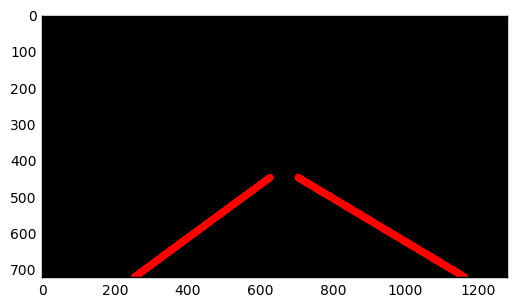

100%|█████████▉| 250/251 [03:21<00:00,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)
(720, 1280)


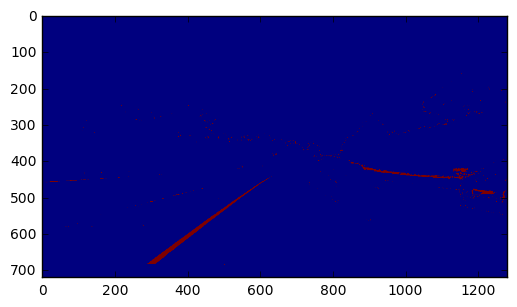

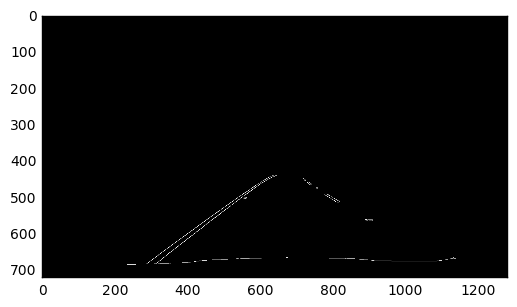

[-0.7245508982035931, 898.4670658682636]
[-0.7258064516129028, 890.1290322580642]
[-0.8057142857142864, 936.8114285714287]
[-0.8068669527897006, 935.7768240343352]
[0.6020408163265311, 26.999999999999698]
[0.6222222222222231, 4.377777777777213]
[-0.8645833333333337, 964.0937499999999]
[0.5541795665634677, 63.95665634674898]
[0.6242774566473985, 4.9017341040468265]
[-0.7272727272727255, 899.2727272727263]
[-0.6741573033707875, 876.1797752808993]
[-0.7391304347826161, 900.2173913043522]
[0.6246575342465754, 0.7452054794518148]
[-0.7692307692307587, 913.0769230769178]
[-0.7096774193548312, 884.6451612903179]
[-0.5993485342019538, 836.6351791530943]
[0.6235294117647048, 6.070588235295155]
[-0.6502242152466369, 865.5246636771301]
[0.6206896551724146, 11.344827586206161]
[-0.8381502890173401, 945.5317919075139]
[-0.80827067669173, 940.8383458646616]
middle 655
left [784, 721, 776, 729, 716, 728, 776] right [630, 532, 562, 550, 531, 626, 558, 578, 524, 604, 560, 556, 491, 585]
(7, 2)
16.91382

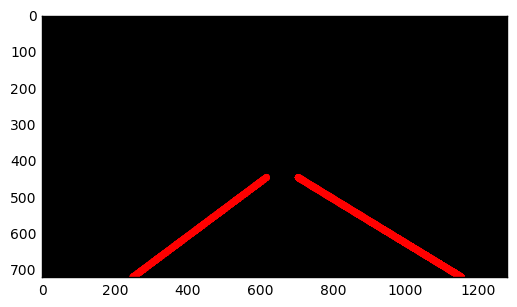

100%|██████████| 251/251 [03:22<00:00,  1.25it/s]

(720, 1280, 3) (720, 1280, 3)


[MoviePy] Done.
[MoviePy] >>>> Video ready: extra.mp4 

CPU times: user 5min 17s, sys: 4.74 s, total: 5min 21s
Wall time: 3min 23s


In [14]:
challenge_output = 'extra.mp4'
clip2 = VideoFileClip('challenge.mp4')
challenge_clip = clip2.fl_image(process_image2)
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))